In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


from sklearn.datasets import make_blobs
from sklearn.metrics import f1_score,accuracy_score
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report
from sklearn.metrics import matthews_corrcoef,cohen_kappa_score,balanced_accuracy_score


import lightgbm as lgb
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from catboost import CatBoostClassifier

from modAL.models import ActiveLearner, Committee
from modAL.uncertainty import uncertainty_sampling,margin_sampling,entropy_sampling
from functools import partial
from modAL.batch import uncertainty_batch_sampling

import warnings

warnings.filterwarnings('ignore')

In [2]:
data_source1="./dataset/6903102_all.csv"
data_source2="./dataset/3901890_all.csv"
df1= pd.read_csv(data_source1)
df2=pd.read_csv(data_source2)
data = pd.concat([df1, df2])

In [3]:
row,col=data.shape

In [4]:
#def compute ratio
def comp_ratio(data):
    instance = data[(data['label']==1)]
    rate=len(instance)/len(data)*100
    print(rate)
    return rate

In [5]:
dirty_ratio = comp_ratio(data)
dirty_ratio

12.349058534588622


12.349058534588622

In [6]:
def plotCluster(data,name1,name2,name3,label,start,end):   
    %matplotlib notebook

    data1=data.loc[data[label] == 1]

    x1 = data1.loc[:,[name1]].iloc[start:end, :]  
    y1 = data1.loc[:,[name2]].iloc[start:end, :]  
    z1 = data1.loc[:,[name3]].iloc[start:end, :]  


    data2=data.loc[data[label] == 0]

    x2 = data2.loc[:,[name1]].iloc[start:end, :]  
    y2 = data2.loc[:,[name2]].iloc[start:end, :]  
    z2 = data2.loc[:,[name3]].iloc[start:end, :]  

    fig = plt.figure()
    ax = fig.add_subplot(projection="3d")
    ax.scatter(x1, y1, z1, c='r',s=10, label='Low-quality Data')
    ax.scatter(x2, y2, z2, c='g',s=10, label='Normal Data')
    
    ax.legend(loc='best')

    ax.set_zlabel(name1, fontdict={'size': 15, 'color': 'black'})
    ax.set_ylabel(name2, fontdict={'size': 15, 'color': 'black'})
    ax.set_xlabel(name3, fontdict={'size': 15, 'color': 'black'})
    plt.show()
    plt.savefig('6903102_scatter.png')
    
    #violin
#     fig = px.violin(data, y=name1,color=label)
#     fig.show()
#     fig = px.violin(data, y=name2,color=label)
#     fig.show()
#     fig = px.violin(data, y=name3,color=label)
#     fig.show()
    


<IPython.core.display.Javascript object>


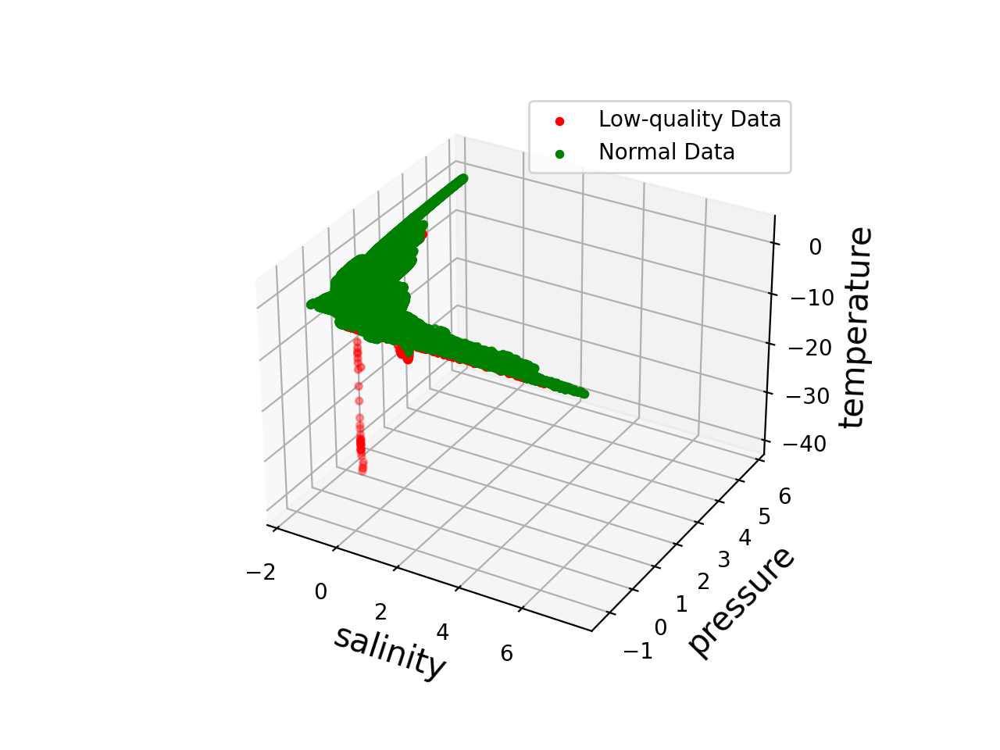

In [7]:
dataplot=data.copy()

plotCluster(dataplot,'temperature','pressure','salinity','label',0,data.shape[0])

# Splite Dataset

In [8]:
train1=pd.read_csv('./randomtrain/6903102.csv')
train2=pd.read_csv('./randomtrain/3901890.csv')
test1=pd.read_csv('./randomtest/6903102.csv')
# test2=pd.read_csv('./randomtest/3901890.csv')
train_set= pd.concat([train1, train2])
test_set= test1
len(train_set),len(test_set)

(300774, 75495)

In [9]:
#train_set2,test_set2=getLastSplit(data,0.3,dirty_ratio)

In [10]:
comp_ratio(train_set)
comp_ratio(test_set)

12.335507723406943
0.2914100271541162


0.2914100271541162

In [11]:
#this function use random grid search to find best parameters
def getPar(model,dist,data,niter):
    import numpy as np
    import pandas as pd
    from sklearn.model_selection import RandomizedSearchCV
    x,y=data.shape

    clf = model

    param_dist = dist
    grid = RandomizedSearchCV(clf,param_dist,cv = 3,scoring = "balanced_accuracy",n_iter=niter,n_jobs = -1)

    #train
    grid.fit(data.iloc[:,0:y-1],data.iloc[:,y-1])
    #get best parameter
    print(grid.best_score_)
    return grid.best_params_

In [12]:
# metric
def computeMetric(y_tru,y_pre):
    acc = accuracy_score(y_tru,y_pre)
    pre=precision_score(y_tru,y_pre)
    recall=recall_score(y_tru,y_pre)
    cm=confusion_matrix(y_tru,y_pre)
    f1 = f1_score(y_tru,y_pre)
    mcc=matthews_corrcoef(y_tru, y_pre)
    kappa=cohen_kappa_score(y_tru, y_pre)
    bac=balanced_accuracy_score(y_tru,y_pre)
    print("acc:",acc)
    print("balanced acc:",bac)
    print("precision:",pre)
    print("recall:",recall)
    print("cm:",cm)
    print("f1:",f1)
    print("MCC:", mcc)
    print("Kappa:",kappa)
    
    # confusion matrix
#     cmap1 = sns.diverging_palette(260,-10,s=50, l=75, n=5, as_cmap=True)
#     plt.subplots(figsize=(12,8))
#     cf_matrix = confusion_matrix(y_tru, y_pre)
#     sns.heatmap(cf_matrix/np.sum(cf_matrix), cmap = cmap1, annot = True, annot_kws = {'size':15})
    
    return kappa

In [13]:
def draw(performance_history):
    fig, ax = plt.subplots(figsize=(8.5, 6), dpi=130)
    ax.plot(performance_history)
    ax.scatter(range(len(performance_history)), performance_history, s=13)
    ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=5, integer=True))
    ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(nbins=10))
    ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(xmax=1))
    ax.set_ylim(bottom=0, top=1)
    ax.grid(True)
    ax.set_title('Incremental classification accuracy')
    ax.set_xlabel('Query iteration')
    ax.set_ylabel('Classification Accuracy')
    plt.show()

# splite train(pool), test, Labeled, Unlabeled

In [14]:
x,y=train_set.shape
#pool 
X_Pool = train_set.iloc[:,0:y-1].values
y_Pool = train_set.iloc[:,y-1].values

In [15]:
#test set
X_test=test_set.iloc[:,0:y-1]
y_tru=test_set.iloc[:,y-1]
print(len(X_test),len(y_tru))

75495 75495


In [16]:
#Pool
def initial_data(n_initial,X_Pool,y_Pool):
    #inital
    initial_idx = np.random.choice(range(len(X_Pool)), size=n_initial, replace=False)
    #initial Labeled data
    #X_initial, y_initial = X_train[], y_train[initial_idx]
    X_L = X_Pool[initial_idx]
    y_L = y_Pool[initial_idx]
    # Unlabeled data
    # X_U = Pool_X[ini_num:]
    # y_U = Pool_X[ini_num:]
    X_U, y_U = np.delete(X_Pool, initial_idx, axis=0), np.delete(y_Pool, initial_idx, axis=0)
    return X_L,y_L,X_U,y_U

In [17]:
# Set RNG seed for reproducibility.
RANDOM_STATE_SEED = 123
np.random.seed(RANDOM_STATE_SEED)

#n_initial= 100
n_initial = 1000
N_QUERIES = 200

In [18]:
# X_initial,y_initial,X_re,y_re=initial_data(n_initial,X_Pool,y_Pool)
# df_X_i = pd.DataFrame(X_initial)
# df_y_i = pd.DataFrame(y_initial)
# df_X_r = pd.DataFrame(X_re)
# df_y_r = pd.DataFrame(y_re)


# df_X_i.to_csv('./randomtrain/6903102_X_initial.csv', index=False)
# df_y_i.to_csv('./randomtrain/6903102_y_initial.csv', index=False)
# df_X_r.to_csv('./randomtrain/6903102_X_re.csv', index=False)
# df_y_r.to_csv('./randomtrain/6903102_y_re.csv', index=False)

X_initial1=pd.read_csv('./randomtrain/6903102_X_initial_1.csv').values
y_initial1=pd.read_csv('./randomtrain/6903102_y_initial_1.csv').values.ravel()
X_re1=pd.read_csv('./randomtrain/6903102_X_re_1.csv').values
y_re1=pd.read_csv('./randomtrain/6903102_y_re_1.csv').values.ravel()
X_initial2=pd.read_csv('./randomtrain/3901890_X_initial_1.csv').values
y_initial2=pd.read_csv('./randomtrain/3901890_y_initial_1.csv').values.ravel()
X_re2=pd.read_csv('./randomtrain/3901890_X_re_1.csv').values
y_re2=pd.read_csv('./randomtrain/3901890_y_re_1.csv').values.ravel()

X_initial = np.concatenate((X_initial1, X_initial2), axis=0)
X_re = np.concatenate((X_re1, X_re2), axis=0)
y_initial = np.concatenate((y_initial1, y_initial2), axis=0)
y_re = np.concatenate((y_re1, y_re2), axis=0)

print(X_re.shape,X_initial.shape)
print(y_re.shape,y_initial.shape)

(143818, 6) (1100, 6)
(143818,) (1100,)


# molAL

In [19]:
def random_sampling(classifier, X_pool):
    n_samples = len(X_pool)
    query_idx = np.random.choice(range(n_samples))
    return query_idx, X_pool[query_idx]

In [20]:
def al(clf,strategy,X_L,y_L):

#         learner = ActiveLearner(estimator=clf,
#                                 query_strategy=random_sampling,
#                                 X_training=X_L, y_training=y_L)
#     else:
    learner = ActiveLearner(estimator=clf,
                            query_strategy=strategy,
                            X_training=X_L, y_training=y_L)
    return learner

In [21]:
def al_learn(clf,sampling,X_initial,y_initial,X_re,y_re):
    X_L = X_initial.copy()
    y_L = y_initial.copy()
    X_U,y_U =X_re.copy(),y_re.copy()
    #print(len(X_U),len(y_U))
    learner = al(clf,sampling,X_L,y_L)
    y_pre=learner.predict(X_test)
    unqueried_kappa=cohen_kappa_score(y_tru, y_pre)
    unqueried_f1=f1_score(y_tru,y_pre)
    #print("unqueried --------------------->",unqueried_score)
    kappa_history = [unqueried_kappa]
    f1_history = [unqueried_f1]
    # Query
    for index in range(N_QUERIES):
        query_index, query_instance = learner.query(X_U)
        # Teach ActiveLearner model the record it has requested.
        X, y = X_U[query_index].reshape(1, -1), y_U[query_index].reshape(1, )
        print(index+1,"query label --------------------->",y)
        learner.teach(X=X, y=y)
        
        X_U, y_U = np.delete(X_U, query_index, axis=0), np.delete(y_U, query_index)
        y_pre=learner.predict(X_test)
        kappa=cohen_kappa_score(y_tru, y_pre)
        f1=f1_score(y_tru,y_pre)
        print(index+1,"-------------------->",kappa)
        print(index+1,"-------------------->",f1)
        # Recall precision F1
        kappa_history.append(kappa)
        f1_history.append(f1)
    #print(len(X_U))
    df_scores= pd.concat([pd.DataFrame(kappa_history,columns=['kappa']), 
                          pd.DataFrame(f1_history,columns=['f1'])],
                         axis=1)
    return df_scores


In [22]:
# clf1 KNN
clf1 = KNeighborsClassifier()
dic1={'n_neighbors':[1,2,3,4,5,6,7,8]}
para1=getPar(clf1,dic1,test_set,10)
clf1 = KNeighborsClassifier(n_neighbors=para1['n_neighbors'],n_jobs=-1)
clf1.fit(X_Pool, y_Pool)
y_pre=clf1.predict(X_test)
computeMetric(y_tru,y_pre)

0.8086408122991721
acc: 0.9984634744022783
balanced acc: 0.824740949850548
precision: 0.7857142857142857
recall: 0.65
cm: [[75236    39]
 [   77   143]]
f1: 0.7114427860696517
MCC: 0.7138929728680175
Kappa: 0.7106793736543535


0.7106793736543535

In [23]:
# clf2 lightgbm
clf2 = lgb.LGBMClassifier()

dic2 = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
              'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 900, 1000, 1500, 2000],
              'num_leaves': range(6, 50), 
              'min_child_samples': range(10, 200, 10), 
              'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
              'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
              'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
              'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}
para2=getPar(clf2,dic2,test_set,10)

    
clf2 = lgb.LGBMClassifier(boosting_type='gbdt', num_leaves=para2['num_leaves'], max_depth=-1, 
                              learning_rate=para2['learning_rate'], n_estimators=para2['n_estimators'], 
                              subsample_for_bin=200000, 
                              objective=None, class_weight=None, min_split_gain=0.0, 
                              min_child_weight=para2['min_child_weight'],
                              min_child_samples=para2['min_child_samples'], 
                              subsample=1.0, 
                              subsample_freq=0, colsample_bytree=1.0, reg_alpha=para2['reg_alpha'], 
                              reg_lambda=para2['reg_lambda'], random_state=None, n_jobs=-1, importance_type='split')
clf2.fit(X_Pool, y_Pool)
y_pre=clf2.predict(X_test)
computeMetric(y_tru,y_pre)

0.822614137231195
acc: 0.9988608517120339
balanced acc: 0.8113437094290631
precision: 0.9785714285714285
recall: 0.6227272727272727
cm: [[75272     3]
 [   83   137]]
f1: 0.7611111111111111
MCC: 0.7801655311688599
Kappa: 0.76056843409572


0.76056843409572

In [24]:
# clf3 gradientBoostingClassifier
clf3 = lgb.LGBMClassifier()

dic3 = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
              'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 900, 1000, 1500, 2000],
              'num_leaves': range(6, 50), 
              'min_child_samples': range(10, 200, 10), 
              'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
              'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
              'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
              'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}
para3=getPar(clf3,dic3,test_set,10)

    
clf3 = lgb.LGBMClassifier(boosting_type='gbdt', num_leaves=para3['num_leaves'], max_depth=-1, 
                              learning_rate=para3['learning_rate'], n_estimators=para3['n_estimators'], 
                              subsample_for_bin=200000, 
                              objective=None, class_weight=None, min_split_gain=0.0, 
                              min_child_weight=para3['min_child_weight'],
                              min_child_samples=para3['min_child_samples'], 
                              subsample=1.0, 
                              subsample_freq=0, colsample_bytree=1.0, reg_alpha=para3['reg_alpha'], 
                              reg_lambda=para3['reg_lambda'], random_state=None, n_jobs=-1, importance_type='split')
clf3.fit(X_Pool, y_Pool)
y_pre=clf3.predict(X_test)
computeMetric(y_tru,y_pre)

0.8180545696735434
acc: 0.9989270812636598
balanced acc: 0.8340377705987139
precision: 0.9483870967741935
recall: 0.6681818181818182
cm: [[75267     8]
 [   73   147]]
f1: 0.7839999999999999
MCC: 0.7955795983379622
Kappa: 0.7834784017307296


0.7834784017307296

In [25]:
#clf4 catboost
clf4 = CatBoostClassifier(loss_function='Logloss')
# dic4 = {'learning_rate': [0.03, 0.1],
#         'depth': [4, 6, 10],
#         'l2_leaf_reg': [1, 3, 5, 7, 9]}
# #para3=getPar(clf4,dic4,test_set,10)

# grid_search_result = clf4.grid_search(dic4, 
#                                        X=X_Pool, 
#                                        y=y_Pool)

clf4.fit(X_Pool, y_Pool)
y_pre=clf4.predict(X_test)
computeMetric(y_tru,y_pre)

Learning rate set to 0.117799
0:	learn: 0.3970787	total: 84.9ms	remaining: 1m 24s
1:	learn: 0.2390307	total: 114ms	remaining: 57s
2:	learn: 0.1491569	total: 137ms	remaining: 45.6s
3:	learn: 0.0947699	total: 159ms	remaining: 39.6s
4:	learn: 0.0668289	total: 182ms	remaining: 36.3s
5:	learn: 0.0489476	total: 207ms	remaining: 34.2s
6:	learn: 0.0376216	total: 231ms	remaining: 32.7s
7:	learn: 0.0310605	total: 251ms	remaining: 31.1s
8:	learn: 0.0260345	total: 271ms	remaining: 29.9s
9:	learn: 0.0230725	total: 293ms	remaining: 29s
10:	learn: 0.0208750	total: 317ms	remaining: 28.5s
11:	learn: 0.0193841	total: 341ms	remaining: 28.1s
12:	learn: 0.0181854	total: 363ms	remaining: 27.5s
13:	learn: 0.0172009	total: 384ms	remaining: 27s
14:	learn: 0.0161469	total: 411ms	remaining: 27s
15:	learn: 0.0153752	total: 436ms	remaining: 26.8s
16:	learn: 0.0144734	total: 460ms	remaining: 26.6s
17:	learn: 0.0140854	total: 483ms	remaining: 26.3s
18:	learn: 0.0136824	total: 507ms	remaining: 26.2s
19:	learn: 0.0133

160:	learn: 0.0080063	total: 3.59s	remaining: 18.7s
161:	learn: 0.0080063	total: 3.6s	remaining: 18.7s
162:	learn: 0.0080063	total: 3.62s	remaining: 18.6s
163:	learn: 0.0080063	total: 3.64s	remaining: 18.6s
164:	learn: 0.0080063	total: 3.66s	remaining: 18.5s
165:	learn: 0.0080063	total: 3.67s	remaining: 18.5s
166:	learn: 0.0080062	total: 3.69s	remaining: 18.4s
167:	learn: 0.0080062	total: 3.71s	remaining: 18.4s
168:	learn: 0.0080062	total: 3.72s	remaining: 18.3s
169:	learn: 0.0080062	total: 3.74s	remaining: 18.3s
170:	learn: 0.0080062	total: 3.76s	remaining: 18.2s
171:	learn: 0.0080062	total: 3.78s	remaining: 18.2s
172:	learn: 0.0080062	total: 3.8s	remaining: 18.2s
173:	learn: 0.0080062	total: 3.82s	remaining: 18.1s
174:	learn: 0.0080062	total: 3.84s	remaining: 18.1s
175:	learn: 0.0080062	total: 3.86s	remaining: 18.1s
176:	learn: 0.0080062	total: 3.88s	remaining: 18s
177:	learn: 0.0080062	total: 3.89s	remaining: 18s
178:	learn: 0.0080062	total: 3.91s	remaining: 17.9s
179:	learn: 0.0080

321:	learn: 0.0078049	total: 6.53s	remaining: 13.8s
322:	learn: 0.0078049	total: 6.55s	remaining: 13.7s
323:	learn: 0.0078049	total: 6.57s	remaining: 13.7s
324:	learn: 0.0078049	total: 6.59s	remaining: 13.7s
325:	learn: 0.0078049	total: 6.61s	remaining: 13.7s
326:	learn: 0.0078049	total: 6.63s	remaining: 13.6s
327:	learn: 0.0078049	total: 6.64s	remaining: 13.6s
328:	learn: 0.0078049	total: 6.66s	remaining: 13.6s
329:	learn: 0.0078049	total: 6.67s	remaining: 13.6s
330:	learn: 0.0078049	total: 6.69s	remaining: 13.5s
331:	learn: 0.0078049	total: 6.7s	remaining: 13.5s
332:	learn: 0.0078049	total: 6.72s	remaining: 13.5s
333:	learn: 0.0078049	total: 6.73s	remaining: 13.4s
334:	learn: 0.0078049	total: 6.75s	remaining: 13.4s
335:	learn: 0.0078049	total: 6.77s	remaining: 13.4s
336:	learn: 0.0078049	total: 6.78s	remaining: 13.3s
337:	learn: 0.0078048	total: 6.8s	remaining: 13.3s
338:	learn: 0.0078048	total: 6.82s	remaining: 13.3s
339:	learn: 0.0078048	total: 6.84s	remaining: 13.3s
340:	learn: 0.

483:	learn: 0.0078047	total: 9.46s	remaining: 10.1s
484:	learn: 0.0078047	total: 9.48s	remaining: 10.1s
485:	learn: 0.0078047	total: 9.5s	remaining: 10s
486:	learn: 0.0078047	total: 9.52s	remaining: 10s
487:	learn: 0.0078047	total: 9.53s	remaining: 10s
488:	learn: 0.0078047	total: 9.56s	remaining: 9.99s
489:	learn: 0.0078047	total: 9.58s	remaining: 9.97s
490:	learn: 0.0078047	total: 9.6s	remaining: 9.95s
491:	learn: 0.0078047	total: 9.62s	remaining: 9.93s
492:	learn: 0.0078047	total: 9.64s	remaining: 9.91s
493:	learn: 0.0078047	total: 9.65s	remaining: 9.89s
494:	learn: 0.0078047	total: 9.68s	remaining: 9.87s
495:	learn: 0.0078047	total: 9.7s	remaining: 9.85s
496:	learn: 0.0078047	total: 9.71s	remaining: 9.83s
497:	learn: 0.0078047	total: 9.73s	remaining: 9.81s
498:	learn: 0.0078047	total: 9.75s	remaining: 9.79s
499:	learn: 0.0078047	total: 9.77s	remaining: 9.77s
500:	learn: 0.0078047	total: 9.79s	remaining: 9.75s
501:	learn: 0.0078047	total: 9.8s	remaining: 9.72s
502:	learn: 0.0078047	

645:	learn: 0.0078047	total: 12.4s	remaining: 6.81s
646:	learn: 0.0078047	total: 12.4s	remaining: 6.79s
647:	learn: 0.0078047	total: 12.5s	remaining: 6.77s
648:	learn: 0.0078047	total: 12.5s	remaining: 6.75s
649:	learn: 0.0078047	total: 12.5s	remaining: 6.73s
650:	learn: 0.0078047	total: 12.5s	remaining: 6.71s
651:	learn: 0.0078047	total: 12.5s	remaining: 6.68s
652:	learn: 0.0078047	total: 12.5s	remaining: 6.67s
653:	learn: 0.0078047	total: 12.6s	remaining: 6.64s
654:	learn: 0.0078047	total: 12.6s	remaining: 6.62s
655:	learn: 0.0078047	total: 12.6s	remaining: 6.6s
656:	learn: 0.0078047	total: 12.6s	remaining: 6.58s
657:	learn: 0.0078047	total: 12.6s	remaining: 6.56s
658:	learn: 0.0078047	total: 12.6s	remaining: 6.54s
659:	learn: 0.0078047	total: 12.7s	remaining: 6.52s
660:	learn: 0.0078047	total: 12.7s	remaining: 6.51s
661:	learn: 0.0078047	total: 12.7s	remaining: 6.49s
662:	learn: 0.0078047	total: 12.7s	remaining: 6.47s
663:	learn: 0.0078047	total: 12.7s	remaining: 6.45s
664:	learn: 0

806:	learn: 0.0078047	total: 15.3s	remaining: 3.67s
807:	learn: 0.0078047	total: 15.4s	remaining: 3.65s
808:	learn: 0.0078047	total: 15.4s	remaining: 3.63s
809:	learn: 0.0078047	total: 15.4s	remaining: 3.61s
810:	learn: 0.0078047	total: 15.4s	remaining: 3.59s
811:	learn: 0.0078047	total: 15.4s	remaining: 3.58s
812:	learn: 0.0078047	total: 15.5s	remaining: 3.56s
813:	learn: 0.0078047	total: 15.5s	remaining: 3.54s
814:	learn: 0.0078047	total: 15.5s	remaining: 3.52s
815:	learn: 0.0078047	total: 15.5s	remaining: 3.5s
816:	learn: 0.0078047	total: 15.5s	remaining: 3.48s
817:	learn: 0.0078047	total: 15.5s	remaining: 3.46s
818:	learn: 0.0078047	total: 15.6s	remaining: 3.44s
819:	learn: 0.0078047	total: 15.6s	remaining: 3.42s
820:	learn: 0.0078047	total: 15.6s	remaining: 3.4s
821:	learn: 0.0078047	total: 15.6s	remaining: 3.38s
822:	learn: 0.0078047	total: 15.6s	remaining: 3.36s
823:	learn: 0.0078047	total: 15.7s	remaining: 3.34s
824:	learn: 0.0078047	total: 15.7s	remaining: 3.32s
825:	learn: 0.

967:	learn: 0.0078047	total: 18.3s	remaining: 607ms
968:	learn: 0.0078047	total: 18.4s	remaining: 588ms
969:	learn: 0.0078047	total: 18.4s	remaining: 569ms
970:	learn: 0.0078047	total: 18.4s	remaining: 550ms
971:	learn: 0.0078047	total: 18.4s	remaining: 531ms
972:	learn: 0.0078047	total: 18.4s	remaining: 512ms
973:	learn: 0.0078047	total: 18.5s	remaining: 493ms
974:	learn: 0.0078047	total: 18.5s	remaining: 474ms
975:	learn: 0.0078047	total: 18.5s	remaining: 455ms
976:	learn: 0.0078047	total: 18.5s	remaining: 436ms
977:	learn: 0.0078047	total: 18.5s	remaining: 417ms
978:	learn: 0.0078047	total: 18.6s	remaining: 398ms
979:	learn: 0.0078047	total: 18.6s	remaining: 379ms
980:	learn: 0.0078047	total: 18.6s	remaining: 360ms
981:	learn: 0.0078047	total: 18.6s	remaining: 341ms
982:	learn: 0.0078047	total: 18.6s	remaining: 322ms
983:	learn: 0.0078047	total: 18.7s	remaining: 303ms
984:	learn: 0.0078047	total: 18.7s	remaining: 284ms
985:	learn: 0.0078047	total: 18.7s	remaining: 265ms
986:	learn: 

0.7708236831089726

## random sampling

In [26]:
sampling=random_sampling

In [ ]:
metric01 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric02 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric03 = al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric04 = al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)

## Uncertainty

In [31]:
sampling=uncertainty_sampling

In [ ]:
metric11 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)

In [33]:
metric12 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)

1 query label ---------------------> [1]
1 --------------------> 0.2671447963730059
1 --------------------> 0.26771653543307083
2 query label ---------------------> [1]
2 --------------------> 0.2671447963730059
2 --------------------> 0.26771653543307083
3 query label ---------------------> [1]
3 --------------------> 0.2671447963730059
3 --------------------> 0.26771653543307083
4 query label ---------------------> [1]
4 --------------------> 0.2671447963730059
4 --------------------> 0.26771653543307083
5 query label ---------------------> [1]
5 --------------------> 0.3135477699936834
5 --------------------> 0.314176245210728
6 query label ---------------------> [1]
6 --------------------> 0.5530076579546331
6 --------------------> 0.5537459283387621
7 query label ---------------------> [1]
7 --------------------> 0.4165567460114903
7 --------------------> 0.41726618705035967
8 query label ---------------------> [1]
8 --------------------> 0.4165567460114903
8 -------------------->

65 query label ---------------------> [1]
65 --------------------> 0.5986533264878511
65 --------------------> 0.5993690851735015
66 query label ---------------------> [0]
66 --------------------> 0.6030606373065924
66 --------------------> 0.6037735849056604
67 query label ---------------------> [1]
67 --------------------> 0.605531549613509
67 --------------------> 0.60625
68 query label ---------------------> [1]
68 --------------------> 0.609876493703558
68 --------------------> 0.6105919003115265
69 query label ---------------------> [0]
69 --------------------> 0.605531549613509
69 --------------------> 0.60625
70 query label ---------------------> [0]
70 --------------------> 0.605531549613509
70 --------------------> 0.60625
71 query label ---------------------> [1]
71 --------------------> 0.5967600125019352
71 --------------------> 0.5974842767295597
72 query label ---------------------> [1]
72 --------------------> 0.6030606373065924
72 --------------------> 0.60377358490566

129 query label ---------------------> [1]
129 --------------------> 0.6759020706107265
129 --------------------> 0.6765578635014837
130 query label ---------------------> [1]
130 --------------------> 0.6759020706107265
130 --------------------> 0.6765578635014837
131 query label ---------------------> [1]
131 --------------------> 0.7466268750666569
131 --------------------> 0.747191011235955
132 query label ---------------------> [1]
132 --------------------> 0.7661366100469823
132 --------------------> 0.7666666666666666
133 query label ---------------------> [1]
133 --------------------> 0.772961607762726
133 --------------------> 0.7734806629834254
134 query label ---------------------> [0]
134 --------------------> 0.7708236831089726
134 --------------------> 0.7713498622589532
135 query label ---------------------> [1]
135 --------------------> 0.7708236831089726
135 --------------------> 0.7713498622589532
136 query label ---------------------> [0]
136 --------------------> 0.

191 query label ---------------------> [1]
191 --------------------> 0.7708236831089726
191 --------------------> 0.7713498622589532
192 query label ---------------------> [1]
192 --------------------> 0.7708236831089726
192 --------------------> 0.7713498622589532
193 query label ---------------------> [1]
193 --------------------> 0.7708236831089726
193 --------------------> 0.7713498622589532
194 query label ---------------------> [1]
194 --------------------> 0.7708236831089726
194 --------------------> 0.7713498622589532
195 query label ---------------------> [1]
195 --------------------> 0.7708236831089726
195 --------------------> 0.7713498622589532
196 query label ---------------------> [0]
196 --------------------> 0.7708236831089726
196 --------------------> 0.7713498622589532
197 query label ---------------------> [0]
197 --------------------> 0.7708236831089726
197 --------------------> 0.7713498622589532
198 query label ---------------------> [1]
198 --------------------> 

In [34]:
metric13 = al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)

1 query label ---------------------> [1]
1 --------------------> 0.3263542809092337
1 --------------------> 0.32699619771863114
2 query label ---------------------> [0]
2 --------------------> 0.15860597301516588
2 --------------------> 0.1589958158995816
3 query label ---------------------> [0]
3 --------------------> 0.2671447963730059
3 --------------------> 0.26771653543307083
4 query label ---------------------> [1]
4 --------------------> 0.42882728808794146
4 --------------------> 0.4295774647887324
5 query label ---------------------> [1]
5 --------------------> 0.4303563256287738
5 --------------------> 0.43109540636042404
6 query label ---------------------> [0]
6 --------------------> 0.23241069772183276
6 --------------------> 0.2329317269076305
7 query label ---------------------> [1]
7 --------------------> 0.6060790322259252
7 --------------------> 0.606811145510836
8 query label ---------------------> [1]
8 --------------------> 0.5661219731009923
8 --------------------

65 query label ---------------------> [0]
65 --------------------> 0.5967600125019352
65 --------------------> 0.5974842767295597
66 query label ---------------------> [1]
66 --------------------> 0.5967600125019352
66 --------------------> 0.5974842767295597
67 query label ---------------------> [1]
67 --------------------> 0.6011594741870047
67 --------------------> 0.6018808777429467
68 query label ---------------------> [1]
68 --------------------> 0.605531549613509
68 --------------------> 0.60625
69 query label ---------------------> [1]
69 --------------------> 0.5967600125019352
69 --------------------> 0.5974842767295597
70 query label ---------------------> [1]
70 --------------------> 0.5967600125019352
70 --------------------> 0.5974842767295597
71 query label ---------------------> [0]
71 --------------------> 0.5967600125019352
71 --------------------> 0.5974842767295597
72 query label ---------------------> [0]
72 --------------------> 0.5878778945989322
72 -------------

130 query label ---------------------> [1]
130 --------------------> 0.6011594741870047
130 --------------------> 0.6018808777429467
131 query label ---------------------> [1]
131 --------------------> 0.605531549613509
131 --------------------> 0.60625
132 query label ---------------------> [0]
132 --------------------> 0.605531549613509
132 --------------------> 0.60625
133 query label ---------------------> [0]
133 --------------------> 0.605531549613509
133 --------------------> 0.60625
134 query label ---------------------> [0]
134 --------------------> 0.605531549613509
134 --------------------> 0.60625
135 query label ---------------------> [0]
135 --------------------> 0.605531549613509
135 --------------------> 0.60625
136 query label ---------------------> [1]
136 --------------------> 0.605531549613509
136 --------------------> 0.60625
137 query label ---------------------> [0]
137 --------------------> 0.605531549613509
137 --------------------> 0.60625
138 query label ----

195 --------------------> 0.734198955429533
195 --------------------> 0.7348066298342543
196 query label ---------------------> [1]
196 --------------------> 0.7368389434442525
196 --------------------> 0.7374301675977655
197 query label ---------------------> [1]
197 --------------------> 0.7445266494703611
197 --------------------> 0.7450980392156862
198 query label ---------------------> [0]
198 --------------------> 0.7430925730119955
198 --------------------> 0.7436619718309859
199 query label ---------------------> [1]
199 --------------------> 0.7501414483831004
199 --------------------> 0.7507002801120447
200 query label ---------------------> [1]
200 --------------------> 0.7501414483831004
200 --------------------> 0.7507002801120447


In [35]:
metric14 = al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)

Learning rate set to 0.01073
0:	learn: 0.6663487	total: 3.1ms	remaining: 3.1s
1:	learn: 0.6408137	total: 4.85ms	remaining: 2.42s
2:	learn: 0.6235689	total: 6.34ms	remaining: 2.11s
3:	learn: 0.6027015	total: 7.77ms	remaining: 1.93s
4:	learn: 0.5823524	total: 9.56ms	remaining: 1.9s
5:	learn: 0.5624096	total: 11ms	remaining: 1.82s
6:	learn: 0.5448767	total: 12.6ms	remaining: 1.79s
7:	learn: 0.5270949	total: 14.5ms	remaining: 1.8s
8:	learn: 0.5094343	total: 16ms	remaining: 1.76s
9:	learn: 0.4938966	total: 17.5ms	remaining: 1.73s
10:	learn: 0.4803033	total: 18.9ms	remaining: 1.7s
11:	learn: 0.4618191	total: 20.3ms	remaining: 1.67s
12:	learn: 0.4453784	total: 21.8ms	remaining: 1.65s
13:	learn: 0.4334373	total: 23.3ms	remaining: 1.64s
14:	learn: 0.4219514	total: 24.8ms	remaining: 1.63s
15:	learn: 0.4057484	total: 26.4ms	remaining: 1.63s
16:	learn: 0.3904853	total: 28ms	remaining: 1.62s
17:	learn: 0.3775197	total: 29.4ms	remaining: 1.6s
18:	learn: 0.3659289	total: 30.9ms	remaining: 1.6s
19:	le

242:	learn: 0.0157692	total: 348ms	remaining: 1.08s
243:	learn: 0.0157419	total: 350ms	remaining: 1.08s
244:	learn: 0.0156550	total: 351ms	remaining: 1.08s
245:	learn: 0.0156070	total: 352ms	remaining: 1.08s
246:	learn: 0.0155299	total: 354ms	remaining: 1.08s
247:	learn: 0.0154865	total: 355ms	remaining: 1.08s
248:	learn: 0.0154527	total: 356ms	remaining: 1.07s
249:	learn: 0.0153648	total: 358ms	remaining: 1.07s
250:	learn: 0.0152940	total: 359ms	remaining: 1.07s
251:	learn: 0.0152326	total: 361ms	remaining: 1.07s
252:	learn: 0.0151937	total: 362ms	remaining: 1.07s
253:	learn: 0.0151674	total: 363ms	remaining: 1.07s
254:	learn: 0.0151426	total: 365ms	remaining: 1.06s
255:	learn: 0.0150975	total: 366ms	remaining: 1.06s
256:	learn: 0.0150416	total: 367ms	remaining: 1.06s
257:	learn: 0.0149744	total: 369ms	remaining: 1.06s
258:	learn: 0.0149034	total: 370ms	remaining: 1.06s
259:	learn: 0.0148856	total: 371ms	remaining: 1.06s
260:	learn: 0.0148596	total: 373ms	remaining: 1.05s
261:	learn: 

407:	learn: 0.0094530	total: 564ms	remaining: 819ms
408:	learn: 0.0094043	total: 566ms	remaining: 818ms
409:	learn: 0.0093895	total: 567ms	remaining: 816ms
410:	learn: 0.0093523	total: 569ms	remaining: 815ms
411:	learn: 0.0093195	total: 570ms	remaining: 814ms
412:	learn: 0.0092864	total: 572ms	remaining: 812ms
413:	learn: 0.0092689	total: 573ms	remaining: 811ms
414:	learn: 0.0092413	total: 574ms	remaining: 810ms
415:	learn: 0.0092122	total: 576ms	remaining: 809ms
416:	learn: 0.0091862	total: 577ms	remaining: 807ms
417:	learn: 0.0091659	total: 579ms	remaining: 806ms
418:	learn: 0.0091484	total: 580ms	remaining: 804ms
419:	learn: 0.0091211	total: 581ms	remaining: 803ms
420:	learn: 0.0091099	total: 583ms	remaining: 801ms
421:	learn: 0.0090787	total: 584ms	remaining: 800ms
422:	learn: 0.0090415	total: 585ms	remaining: 798ms
423:	learn: 0.0090016	total: 587ms	remaining: 797ms
424:	learn: 0.0089639	total: 588ms	remaining: 795ms
425:	learn: 0.0089474	total: 589ms	remaining: 794ms
426:	learn: 

681:	learn: 0.0047629	total: 914ms	remaining: 426ms
682:	learn: 0.0047510	total: 916ms	remaining: 425ms
683:	learn: 0.0047374	total: 917ms	remaining: 424ms
684:	learn: 0.0047350	total: 919ms	remaining: 423ms
685:	learn: 0.0047298	total: 920ms	remaining: 421ms
686:	learn: 0.0047227	total: 922ms	remaining: 420ms
687:	learn: 0.0047091	total: 923ms	remaining: 419ms
688:	learn: 0.0047078	total: 924ms	remaining: 417ms
689:	learn: 0.0046976	total: 926ms	remaining: 416ms
690:	learn: 0.0046970	total: 927ms	remaining: 415ms
691:	learn: 0.0046889	total: 929ms	remaining: 413ms
692:	learn: 0.0046779	total: 930ms	remaining: 412ms
693:	learn: 0.0046734	total: 933ms	remaining: 411ms
694:	learn: 0.0046648	total: 935ms	remaining: 410ms
695:	learn: 0.0046504	total: 937ms	remaining: 409ms
696:	learn: 0.0046372	total: 939ms	remaining: 408ms
697:	learn: 0.0046234	total: 941ms	remaining: 407ms
698:	learn: 0.0046148	total: 944ms	remaining: 406ms
699:	learn: 0.0046013	total: 946ms	remaining: 406ms
700:	learn: 

930:	learn: 0.0030012	total: 1.29s	remaining: 95.8ms
931:	learn: 0.0029955	total: 1.29s	remaining: 94.5ms
932:	learn: 0.0029899	total: 1.3s	remaining: 93.1ms
933:	learn: 0.0029889	total: 1.3s	remaining: 91.7ms
934:	learn: 0.0029830	total: 1.3s	remaining: 90.3ms
935:	learn: 0.0029782	total: 1.3s	remaining: 88.9ms
936:	learn: 0.0029761	total: 1.3s	remaining: 87.5ms
937:	learn: 0.0029717	total: 1.3s	remaining: 86.1ms
938:	learn: 0.0029704	total: 1.3s	remaining: 84.7ms
939:	learn: 0.0029643	total: 1.3s	remaining: 83.3ms
940:	learn: 0.0029584	total: 1.31s	remaining: 82ms
941:	learn: 0.0029527	total: 1.31s	remaining: 80.6ms
942:	learn: 0.0029448	total: 1.31s	remaining: 79.2ms
943:	learn: 0.0029414	total: 1.31s	remaining: 77.8ms
944:	learn: 0.0029337	total: 1.31s	remaining: 76.4ms
945:	learn: 0.0029324	total: 1.31s	remaining: 75ms
946:	learn: 0.0029281	total: 1.31s	remaining: 73.6ms
947:	learn: 0.0029231	total: 1.32s	remaining: 72.2ms
948:	learn: 0.0029216	total: 1.32s	remaining: 70.8ms
949:	

147:	learn: 0.0289353	total: 185ms	remaining: 1.07s
148:	learn: 0.0288008	total: 187ms	remaining: 1.07s
149:	learn: 0.0285115	total: 189ms	remaining: 1.07s
150:	learn: 0.0282127	total: 190ms	remaining: 1.07s
151:	learn: 0.0279859	total: 192ms	remaining: 1.07s
152:	learn: 0.0276083	total: 193ms	remaining: 1.07s
153:	learn: 0.0275045	total: 194ms	remaining: 1.07s
154:	learn: 0.0272695	total: 196ms	remaining: 1.07s
155:	learn: 0.0269933	total: 197ms	remaining: 1.07s
156:	learn: 0.0269191	total: 199ms	remaining: 1.07s
157:	learn: 0.0267684	total: 200ms	remaining: 1.06s
158:	learn: 0.0265978	total: 201ms	remaining: 1.06s
159:	learn: 0.0264164	total: 203ms	remaining: 1.06s
160:	learn: 0.0262436	total: 204ms	remaining: 1.06s
161:	learn: 0.0260033	total: 205ms	remaining: 1.06s
162:	learn: 0.0258663	total: 207ms	remaining: 1.06s
163:	learn: 0.0256632	total: 208ms	remaining: 1.06s
164:	learn: 0.0254892	total: 209ms	remaining: 1.06s
165:	learn: 0.0252930	total: 211ms	remaining: 1.06s
166:	learn: 

450:	learn: 0.0085195	total: 567ms	remaining: 690ms
451:	learn: 0.0084802	total: 569ms	remaining: 690ms
452:	learn: 0.0084488	total: 570ms	remaining: 689ms
453:	learn: 0.0084386	total: 571ms	remaining: 687ms
454:	learn: 0.0084238	total: 573ms	remaining: 686ms
455:	learn: 0.0084175	total: 574ms	remaining: 685ms
456:	learn: 0.0083599	total: 576ms	remaining: 684ms
457:	learn: 0.0083356	total: 577ms	remaining: 683ms
458:	learn: 0.0083117	total: 578ms	remaining: 681ms
459:	learn: 0.0082817	total: 579ms	remaining: 680ms
460:	learn: 0.0082569	total: 581ms	remaining: 679ms
461:	learn: 0.0082184	total: 582ms	remaining: 678ms
462:	learn: 0.0081887	total: 584ms	remaining: 677ms
463:	learn: 0.0081397	total: 585ms	remaining: 676ms
464:	learn: 0.0080976	total: 586ms	remaining: 675ms
465:	learn: 0.0080740	total: 588ms	remaining: 673ms
466:	learn: 0.0080387	total: 589ms	remaining: 672ms
467:	learn: 0.0080175	total: 591ms	remaining: 671ms
468:	learn: 0.0079738	total: 592ms	remaining: 671ms
469:	learn: 

737:	learn: 0.0042123	total: 948ms	remaining: 336ms
738:	learn: 0.0042041	total: 949ms	remaining: 335ms
739:	learn: 0.0041978	total: 951ms	remaining: 334ms
740:	learn: 0.0041829	total: 952ms	remaining: 333ms
741:	learn: 0.0041777	total: 953ms	remaining: 331ms
742:	learn: 0.0041679	total: 955ms	remaining: 330ms
743:	learn: 0.0041653	total: 956ms	remaining: 329ms
744:	learn: 0.0041561	total: 957ms	remaining: 328ms
745:	learn: 0.0041466	total: 959ms	remaining: 326ms
746:	learn: 0.0041389	total: 960ms	remaining: 325ms
747:	learn: 0.0041320	total: 961ms	remaining: 324ms
748:	learn: 0.0041301	total: 963ms	remaining: 323ms
749:	learn: 0.0041272	total: 964ms	remaining: 321ms
750:	learn: 0.0041129	total: 965ms	remaining: 320ms
751:	learn: 0.0041022	total: 967ms	remaining: 319ms
752:	learn: 0.0040905	total: 968ms	remaining: 317ms
753:	learn: 0.0040837	total: 969ms	remaining: 316ms
754:	learn: 0.0040816	total: 971ms	remaining: 315ms
755:	learn: 0.0040718	total: 972ms	remaining: 314ms
756:	learn: 

1 --------------------> 0.22437311340478383
1 --------------------> 0.22489959839357426
2 query label ---------------------> [1]
Learning rate set to 0.010739
0:	learn: 0.6668072	total: 1.44ms	remaining: 1.44s
1:	learn: 0.6412129	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6241808	total: 4.1ms	remaining: 1.36s
3:	learn: 0.6034880	total: 5.5ms	remaining: 1.37s
4:	learn: 0.5834759	total: 6.88ms	remaining: 1.37s
5:	learn: 0.5636499	total: 8.15ms	remaining: 1.35s
6:	learn: 0.5462097	total: 9.55ms	remaining: 1.35s
7:	learn: 0.5284423	total: 10.8ms	remaining: 1.34s
8:	learn: 0.5109375	total: 12ms	remaining: 1.32s
9:	learn: 0.4954097	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4824796	total: 14.5ms	remaining: 1.31s
11:	learn: 0.4639074	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4476707	total: 17ms	remaining: 1.29s
13:	learn: 0.4358272	total: 18.3ms	remaining: 1.29s
14:	learn: 0.4218212	total: 19.6ms	remaining: 1.28s
15:	learn: 0.4056601	total: 20.8ms	remaining: 1.28s
16:	learn: 0.3904989	tota

245:	learn: 0.0154768	total: 333ms	remaining: 1.02s
246:	learn: 0.0154435	total: 335ms	remaining: 1.02s
247:	learn: 0.0153988	total: 336ms	remaining: 1.02s
248:	learn: 0.0153420	total: 338ms	remaining: 1.02s
249:	learn: 0.0152566	total: 339ms	remaining: 1.02s
250:	learn: 0.0151885	total: 340ms	remaining: 1.01s
251:	learn: 0.0151239	total: 342ms	remaining: 1.01s
252:	learn: 0.0150871	total: 343ms	remaining: 1.01s
253:	learn: 0.0150433	total: 344ms	remaining: 1.01s
254:	learn: 0.0150046	total: 345ms	remaining: 1.01s
255:	learn: 0.0149718	total: 347ms	remaining: 1.01s
256:	learn: 0.0149394	total: 348ms	remaining: 1.01s
257:	learn: 0.0148727	total: 349ms	remaining: 1s
258:	learn: 0.0148173	total: 351ms	remaining: 1s
259:	learn: 0.0147936	total: 352ms	remaining: 1s
260:	learn: 0.0147208	total: 353ms	remaining: 1s
261:	learn: 0.0146644	total: 355ms	remaining: 1000ms
262:	learn: 0.0146006	total: 356ms	remaining: 998ms
263:	learn: 0.0145133	total: 358ms	remaining: 997ms
264:	learn: 0.0144337	t

544:	learn: 0.0061614	total: 713ms	remaining: 595ms
545:	learn: 0.0061412	total: 715ms	remaining: 594ms
546:	learn: 0.0061336	total: 716ms	remaining: 593ms
547:	learn: 0.0060992	total: 717ms	remaining: 592ms
548:	learn: 0.0060830	total: 719ms	remaining: 590ms
549:	learn: 0.0060648	total: 720ms	remaining: 589ms
550:	learn: 0.0060590	total: 721ms	remaining: 588ms
551:	learn: 0.0060477	total: 723ms	remaining: 587ms
552:	learn: 0.0060264	total: 724ms	remaining: 585ms
553:	learn: 0.0060046	total: 726ms	remaining: 584ms
554:	learn: 0.0059923	total: 727ms	remaining: 583ms
555:	learn: 0.0059785	total: 728ms	remaining: 582ms
556:	learn: 0.0059604	total: 730ms	remaining: 580ms
557:	learn: 0.0059404	total: 732ms	remaining: 580ms
558:	learn: 0.0059295	total: 735ms	remaining: 580ms
559:	learn: 0.0059245	total: 738ms	remaining: 580ms
560:	learn: 0.0059043	total: 740ms	remaining: 579ms
561:	learn: 0.0058911	total: 741ms	remaining: 578ms
562:	learn: 0.0058795	total: 743ms	remaining: 577ms
563:	learn: 

819:	learn: 0.0036628	total: 1.09s	remaining: 240ms
820:	learn: 0.0036602	total: 1.09s	remaining: 239ms
821:	learn: 0.0036579	total: 1.1s	remaining: 238ms
822:	learn: 0.0036490	total: 1.1s	remaining: 236ms
823:	learn: 0.0036404	total: 1.1s	remaining: 235ms
824:	learn: 0.0036310	total: 1.1s	remaining: 234ms
825:	learn: 0.0036218	total: 1.1s	remaining: 232ms
826:	learn: 0.0036150	total: 1.1s	remaining: 231ms
827:	learn: 0.0036069	total: 1.1s	remaining: 230ms
828:	learn: 0.0036033	total: 1.11s	remaining: 228ms
829:	learn: 0.0036003	total: 1.11s	remaining: 227ms
830:	learn: 0.0035975	total: 1.11s	remaining: 226ms
831:	learn: 0.0035906	total: 1.11s	remaining: 224ms
832:	learn: 0.0035816	total: 1.11s	remaining: 223ms
833:	learn: 0.0035794	total: 1.11s	remaining: 222ms
834:	learn: 0.0035705	total: 1.11s	remaining: 220ms
835:	learn: 0.0035685	total: 1.12s	remaining: 219ms
836:	learn: 0.0035619	total: 1.12s	remaining: 218ms
837:	learn: 0.0035600	total: 1.12s	remaining: 216ms
838:	learn: 0.00355

3 query label ---------------------> [1]
Learning rate set to 0.010743
0:	learn: 0.6656240	total: 1.67ms	remaining: 1.67s
1:	learn: 0.6401564	total: 3ms	remaining: 1.5s
2:	learn: 0.6233082	total: 4.29ms	remaining: 1.43s
3:	learn: 0.6027210	total: 5.56ms	remaining: 1.38s
4:	learn: 0.5827583	total: 6.86ms	remaining: 1.36s
5:	learn: 0.5629906	total: 8.11ms	remaining: 1.34s
6:	learn: 0.5458216	total: 9.35ms	remaining: 1.33s
7:	learn: 0.5280949	total: 10.8ms	remaining: 1.33s
8:	learn: 0.5105775	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4949524	total: 13.7ms	remaining: 1.35s
10:	learn: 0.4820806	total: 15.1ms	remaining: 1.35s
11:	learn: 0.4635053	total: 16.3ms	remaining: 1.34s
12:	learn: 0.4473831	total: 17.7ms	remaining: 1.34s
13:	learn: 0.4355979	total: 19ms	remaining: 1.34s
14:	learn: 0.4216117	total: 20.4ms	remaining: 1.34s
15:	learn: 0.4055202	total: 21.7ms	remaining: 1.33s
16:	learn: 0.3903116	total: 23ms	remaining: 1.33s
17:	learn: 0.3778875	total: 24.2ms	remaining: 1.32s
18:	learn: 

299:	learn: 0.0132755	total: 376ms	remaining: 877ms
300:	learn: 0.0132123	total: 378ms	remaining: 877ms
301:	learn: 0.0131545	total: 379ms	remaining: 876ms
302:	learn: 0.0130996	total: 380ms	remaining: 875ms
303:	learn: 0.0130772	total: 382ms	remaining: 874ms
304:	learn: 0.0130687	total: 383ms	remaining: 872ms
305:	learn: 0.0130038	total: 384ms	remaining: 871ms
306:	learn: 0.0129839	total: 385ms	remaining: 869ms
307:	learn: 0.0129764	total: 387ms	remaining: 868ms
308:	learn: 0.0129221	total: 388ms	remaining: 867ms
309:	learn: 0.0128974	total: 389ms	remaining: 867ms
310:	learn: 0.0128346	total: 391ms	remaining: 865ms
311:	learn: 0.0127908	total: 392ms	remaining: 865ms
312:	learn: 0.0127173	total: 393ms	remaining: 864ms
313:	learn: 0.0126590	total: 395ms	remaining: 862ms
314:	learn: 0.0126245	total: 396ms	remaining: 861ms
315:	learn: 0.0125707	total: 397ms	remaining: 860ms
316:	learn: 0.0125251	total: 399ms	remaining: 859ms
317:	learn: 0.0124538	total: 400ms	remaining: 858ms
318:	learn: 

587:	learn: 0.0056358	total: 756ms	remaining: 529ms
588:	learn: 0.0056258	total: 757ms	remaining: 528ms
589:	learn: 0.0056073	total: 759ms	remaining: 527ms
590:	learn: 0.0055928	total: 760ms	remaining: 526ms
591:	learn: 0.0055744	total: 761ms	remaining: 525ms
592:	learn: 0.0055618	total: 763ms	remaining: 524ms
593:	learn: 0.0055588	total: 764ms	remaining: 522ms
594:	learn: 0.0055520	total: 766ms	remaining: 521ms
595:	learn: 0.0055500	total: 767ms	remaining: 520ms
596:	learn: 0.0055384	total: 768ms	remaining: 519ms
597:	learn: 0.0055312	total: 770ms	remaining: 517ms
598:	learn: 0.0055272	total: 771ms	remaining: 516ms
599:	learn: 0.0055238	total: 773ms	remaining: 515ms
600:	learn: 0.0055163	total: 774ms	remaining: 514ms
601:	learn: 0.0055022	total: 775ms	remaining: 513ms
602:	learn: 0.0054997	total: 777ms	remaining: 511ms
603:	learn: 0.0054854	total: 778ms	remaining: 510ms
604:	learn: 0.0054785	total: 779ms	remaining: 509ms
605:	learn: 0.0054664	total: 781ms	remaining: 508ms
606:	learn: 

887:	learn: 0.0033017	total: 1.13s	remaining: 143ms
888:	learn: 0.0033003	total: 1.14s	remaining: 142ms
889:	learn: 0.0032980	total: 1.14s	remaining: 141ms
890:	learn: 0.0032965	total: 1.14s	remaining: 139ms
891:	learn: 0.0032947	total: 1.14s	remaining: 138ms
892:	learn: 0.0032936	total: 1.14s	remaining: 137ms
893:	learn: 0.0032870	total: 1.14s	remaining: 136ms
894:	learn: 0.0032794	total: 1.14s	remaining: 134ms
895:	learn: 0.0032768	total: 1.15s	remaining: 133ms
896:	learn: 0.0032707	total: 1.15s	remaining: 132ms
897:	learn: 0.0032688	total: 1.15s	remaining: 130ms
898:	learn: 0.0032670	total: 1.15s	remaining: 129ms
899:	learn: 0.0032583	total: 1.15s	remaining: 128ms
900:	learn: 0.0032557	total: 1.15s	remaining: 127ms
901:	learn: 0.0032486	total: 1.15s	remaining: 125ms
902:	learn: 0.0032423	total: 1.15s	remaining: 124ms
903:	learn: 0.0032371	total: 1.16s	remaining: 123ms
904:	learn: 0.0032348	total: 1.16s	remaining: 121ms
905:	learn: 0.0032295	total: 1.16s	remaining: 120ms
906:	learn: 

116:	learn: 0.0397607	total: 147ms	remaining: 1.11s
117:	learn: 0.0391699	total: 149ms	remaining: 1.11s
118:	learn: 0.0385394	total: 150ms	remaining: 1.11s
119:	learn: 0.0380778	total: 151ms	remaining: 1.11s
120:	learn: 0.0377642	total: 153ms	remaining: 1.11s
121:	learn: 0.0372337	total: 154ms	remaining: 1.11s
122:	learn: 0.0366969	total: 155ms	remaining: 1.11s
123:	learn: 0.0363079	total: 157ms	remaining: 1.11s
124:	learn: 0.0359559	total: 158ms	remaining: 1.11s
125:	learn: 0.0355447	total: 159ms	remaining: 1.11s
126:	learn: 0.0350240	total: 161ms	remaining: 1.1s
127:	learn: 0.0345315	total: 162ms	remaining: 1.1s
128:	learn: 0.0340381	total: 164ms	remaining: 1.11s
129:	learn: 0.0336797	total: 165ms	remaining: 1.1s
130:	learn: 0.0334133	total: 167ms	remaining: 1.1s
131:	learn: 0.0329352	total: 168ms	remaining: 1.1s
132:	learn: 0.0325325	total: 169ms	remaining: 1.1s
133:	learn: 0.0321104	total: 171ms	remaining: 1.1s
134:	learn: 0.0316696	total: 172ms	remaining: 1.1s
135:	learn: 0.031445

398:	learn: 0.0095933	total: 528ms	remaining: 795ms
399:	learn: 0.0095798	total: 529ms	remaining: 794ms
400:	learn: 0.0095513	total: 531ms	remaining: 793ms
401:	learn: 0.0095156	total: 532ms	remaining: 792ms
402:	learn: 0.0094695	total: 534ms	remaining: 791ms
403:	learn: 0.0094411	total: 536ms	remaining: 791ms
404:	learn: 0.0094200	total: 538ms	remaining: 790ms
405:	learn: 0.0093913	total: 540ms	remaining: 789ms
406:	learn: 0.0093336	total: 541ms	remaining: 788ms
407:	learn: 0.0093159	total: 542ms	remaining: 787ms
408:	learn: 0.0092919	total: 544ms	remaining: 785ms
409:	learn: 0.0092469	total: 545ms	remaining: 785ms
410:	learn: 0.0092250	total: 547ms	remaining: 784ms
411:	learn: 0.0091991	total: 549ms	remaining: 783ms
412:	learn: 0.0091738	total: 550ms	remaining: 782ms
413:	learn: 0.0091571	total: 552ms	remaining: 782ms
414:	learn: 0.0091069	total: 554ms	remaining: 780ms
415:	learn: 0.0090785	total: 555ms	remaining: 779ms
416:	learn: 0.0090571	total: 557ms	remaining: 778ms
417:	learn: 

670:	learn: 0.0048272	total: 908ms	remaining: 445ms
671:	learn: 0.0048159	total: 909ms	remaining: 444ms
672:	learn: 0.0048133	total: 911ms	remaining: 442ms
673:	learn: 0.0047924	total: 912ms	remaining: 441ms
674:	learn: 0.0047861	total: 913ms	remaining: 440ms
675:	learn: 0.0047818	total: 914ms	remaining: 438ms
676:	learn: 0.0047689	total: 916ms	remaining: 437ms
677:	learn: 0.0047660	total: 917ms	remaining: 436ms
678:	learn: 0.0047631	total: 918ms	remaining: 434ms
679:	learn: 0.0047598	total: 920ms	remaining: 433ms
680:	learn: 0.0047436	total: 921ms	remaining: 431ms
681:	learn: 0.0047316	total: 922ms	remaining: 430ms
682:	learn: 0.0047221	total: 924ms	remaining: 429ms
683:	learn: 0.0047199	total: 925ms	remaining: 427ms
684:	learn: 0.0047130	total: 926ms	remaining: 426ms
685:	learn: 0.0047082	total: 928ms	remaining: 425ms
686:	learn: 0.0046978	total: 929ms	remaining: 423ms
687:	learn: 0.0046862	total: 930ms	remaining: 422ms
688:	learn: 0.0046708	total: 931ms	remaining: 420ms
689:	learn: 

969:	learn: 0.0030559	total: 1.29s	remaining: 39.8ms
970:	learn: 0.0030550	total: 1.29s	remaining: 38.5ms
971:	learn: 0.0030502	total: 1.29s	remaining: 37.2ms
972:	learn: 0.0030491	total: 1.29s	remaining: 35.8ms
973:	learn: 0.0030431	total: 1.29s	remaining: 34.5ms
974:	learn: 0.0030418	total: 1.29s	remaining: 33.2ms
975:	learn: 0.0030400	total: 1.29s	remaining: 31.8ms
976:	learn: 0.0030385	total: 1.3s	remaining: 30.5ms
977:	learn: 0.0030375	total: 1.3s	remaining: 29.2ms
978:	learn: 0.0030323	total: 1.3s	remaining: 27.9ms
979:	learn: 0.0030311	total: 1.3s	remaining: 26.5ms
980:	learn: 0.0030263	total: 1.3s	remaining: 25.2ms
981:	learn: 0.0030214	total: 1.3s	remaining: 23.9ms
982:	learn: 0.0030168	total: 1.3s	remaining: 22.6ms
983:	learn: 0.0030157	total: 1.3s	remaining: 21.2ms
984:	learn: 0.0030133	total: 1.31s	remaining: 19.9ms
985:	learn: 0.0030087	total: 1.31s	remaining: 18.6ms
986:	learn: 0.0030039	total: 1.31s	remaining: 17.2ms
987:	learn: 0.0029991	total: 1.31s	remaining: 15.9ms
9

148:	learn: 0.0289403	total: 185ms	remaining: 1.05s
149:	learn: 0.0285760	total: 186ms	remaining: 1.05s
150:	learn: 0.0282482	total: 188ms	remaining: 1.05s
151:	learn: 0.0279592	total: 189ms	remaining: 1.05s
152:	learn: 0.0275754	total: 190ms	remaining: 1.05s
153:	learn: 0.0272608	total: 192ms	remaining: 1.05s
154:	learn: 0.0270895	total: 193ms	remaining: 1.05s
155:	learn: 0.0268462	total: 194ms	remaining: 1.05s
156:	learn: 0.0265625	total: 196ms	remaining: 1.05s
157:	learn: 0.0264054	total: 197ms	remaining: 1.05s
158:	learn: 0.0261916	total: 198ms	remaining: 1.05s
159:	learn: 0.0259719	total: 200ms	remaining: 1.05s
160:	learn: 0.0257435	total: 201ms	remaining: 1.05s
161:	learn: 0.0255065	total: 203ms	remaining: 1.05s
162:	learn: 0.0252808	total: 204ms	remaining: 1.05s
163:	learn: 0.0250676	total: 205ms	remaining: 1.04s
164:	learn: 0.0248204	total: 206ms	remaining: 1.04s
165:	learn: 0.0246194	total: 208ms	remaining: 1.04s
166:	learn: 0.0244155	total: 209ms	remaining: 1.04s
167:	learn: 

450:	learn: 0.0087441	total: 563ms	remaining: 685ms
451:	learn: 0.0087058	total: 564ms	remaining: 684ms
452:	learn: 0.0086729	total: 566ms	remaining: 683ms
453:	learn: 0.0086660	total: 567ms	remaining: 682ms
454:	learn: 0.0086511	total: 568ms	remaining: 681ms
455:	learn: 0.0086466	total: 570ms	remaining: 680ms
456:	learn: 0.0085945	total: 571ms	remaining: 678ms
457:	learn: 0.0085705	total: 572ms	remaining: 677ms
458:	learn: 0.0085589	total: 574ms	remaining: 676ms
459:	learn: 0.0085312	total: 575ms	remaining: 675ms
460:	learn: 0.0085016	total: 576ms	remaining: 674ms
461:	learn: 0.0084635	total: 578ms	remaining: 673ms
462:	learn: 0.0084322	total: 579ms	remaining: 672ms
463:	learn: 0.0083847	total: 581ms	remaining: 671ms
464:	learn: 0.0083636	total: 582ms	remaining: 670ms
465:	learn: 0.0083461	total: 583ms	remaining: 669ms
466:	learn: 0.0083011	total: 585ms	remaining: 667ms
467:	learn: 0.0082774	total: 586ms	remaining: 666ms
468:	learn: 0.0082357	total: 587ms	remaining: 665ms
469:	learn: 

736:	learn: 0.0045568	total: 942ms	remaining: 336ms
737:	learn: 0.0045532	total: 944ms	remaining: 335ms
738:	learn: 0.0045507	total: 946ms	remaining: 334ms
739:	learn: 0.0045432	total: 947ms	remaining: 333ms
740:	learn: 0.0045339	total: 948ms	remaining: 331ms
741:	learn: 0.0045304	total: 950ms	remaining: 330ms
742:	learn: 0.0045179	total: 951ms	remaining: 329ms
743:	learn: 0.0045129	total: 953ms	remaining: 328ms
744:	learn: 0.0045023	total: 954ms	remaining: 327ms
745:	learn: 0.0044992	total: 955ms	remaining: 325ms
746:	learn: 0.0044971	total: 957ms	remaining: 324ms
747:	learn: 0.0044959	total: 958ms	remaining: 323ms
748:	learn: 0.0044878	total: 959ms	remaining: 321ms
749:	learn: 0.0044704	total: 961ms	remaining: 320ms
750:	learn: 0.0044580	total: 962ms	remaining: 319ms
751:	learn: 0.0044535	total: 963ms	remaining: 318ms
752:	learn: 0.0044509	total: 965ms	remaining: 316ms
753:	learn: 0.0044455	total: 966ms	remaining: 315ms
754:	learn: 0.0044419	total: 967ms	remaining: 314ms
755:	learn: 

5 --------------------> 0.23146249711699818
5 --------------------> 0.23199999999999998
6 query label ---------------------> [1]
Learning rate set to 0.010755
0:	learn: 0.6656939	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6403498	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6236916	total: 4.09ms	remaining: 1.36s
3:	learn: 0.6033068	total: 5.48ms	remaining: 1.36s
4:	learn: 0.5833707	total: 6.77ms	remaining: 1.35s
5:	learn: 0.5638699	total: 8.05ms	remaining: 1.33s
6:	learn: 0.5467714	total: 9.35ms	remaining: 1.32s
7:	learn: 0.5291525	total: 10.7ms	remaining: 1.32s
8:	learn: 0.5124200	total: 12ms	remaining: 1.32s
9:	learn: 0.4971125	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4846180	total: 14.6ms	remaining: 1.32s
11:	learn: 0.4662384	total: 15.9ms	remaining: 1.31s
12:	learn: 0.4496121	total: 17.2ms	remaining: 1.31s
13:	learn: 0.4378983	total: 18.5ms	remaining: 1.3s
14:	learn: 0.4269336	total: 19.8ms	remaining: 1.3s
15:	learn: 0.4125216	total: 21.2ms	remaining: 1.3s
16:	learn: 0.3972081	tot

249:	learn: 0.0157118	total: 333ms	remaining: 998ms
250:	learn: 0.0156723	total: 334ms	remaining: 998ms
251:	learn: 0.0156365	total: 336ms	remaining: 997ms
252:	learn: 0.0155695	total: 337ms	remaining: 996ms
253:	learn: 0.0155068	total: 339ms	remaining: 995ms
254:	learn: 0.0154273	total: 340ms	remaining: 993ms
255:	learn: 0.0153352	total: 341ms	remaining: 992ms
256:	learn: 0.0152937	total: 343ms	remaining: 991ms
257:	learn: 0.0152267	total: 344ms	remaining: 990ms
258:	learn: 0.0151801	total: 345ms	remaining: 988ms
259:	learn: 0.0151598	total: 347ms	remaining: 987ms
260:	learn: 0.0150745	total: 348ms	remaining: 986ms
261:	learn: 0.0150151	total: 350ms	remaining: 985ms
262:	learn: 0.0149590	total: 351ms	remaining: 984ms
263:	learn: 0.0148717	total: 353ms	remaining: 983ms
264:	learn: 0.0148523	total: 354ms	remaining: 982ms
265:	learn: 0.0147853	total: 355ms	remaining: 980ms
266:	learn: 0.0147456	total: 357ms	remaining: 979ms
267:	learn: 0.0147113	total: 358ms	remaining: 978ms
268:	learn: 

519:	learn: 0.0065817	total: 689ms	remaining: 636ms
520:	learn: 0.0065624	total: 690ms	remaining: 635ms
521:	learn: 0.0065353	total: 692ms	remaining: 633ms
522:	learn: 0.0065185	total: 693ms	remaining: 632ms
523:	learn: 0.0065073	total: 694ms	remaining: 631ms
524:	learn: 0.0064879	total: 696ms	remaining: 629ms
525:	learn: 0.0064652	total: 697ms	remaining: 628ms
526:	learn: 0.0064459	total: 698ms	remaining: 627ms
527:	learn: 0.0064164	total: 700ms	remaining: 625ms
528:	learn: 0.0063811	total: 701ms	remaining: 624ms
529:	learn: 0.0063522	total: 702ms	remaining: 623ms
530:	learn: 0.0063291	total: 704ms	remaining: 621ms
531:	learn: 0.0063220	total: 705ms	remaining: 620ms
532:	learn: 0.0063079	total: 706ms	remaining: 619ms
533:	learn: 0.0062773	total: 707ms	remaining: 617ms
534:	learn: 0.0062569	total: 709ms	remaining: 616ms
535:	learn: 0.0062479	total: 710ms	remaining: 615ms
536:	learn: 0.0062191	total: 711ms	remaining: 613ms
537:	learn: 0.0062074	total: 713ms	remaining: 612ms
538:	learn: 

802:	learn: 0.0037129	total: 1.07s	remaining: 262ms
803:	learn: 0.0037107	total: 1.07s	remaining: 261ms
804:	learn: 0.0037080	total: 1.07s	remaining: 260ms
805:	learn: 0.0037053	total: 1.07s	remaining: 258ms
806:	learn: 0.0036983	total: 1.07s	remaining: 257ms
807:	learn: 0.0036961	total: 1.07s	remaining: 256ms
808:	learn: 0.0036934	total: 1.08s	remaining: 254ms
809:	learn: 0.0036908	total: 1.08s	remaining: 253ms
810:	learn: 0.0036892	total: 1.08s	remaining: 252ms
811:	learn: 0.0036870	total: 1.08s	remaining: 250ms
812:	learn: 0.0036833	total: 1.08s	remaining: 249ms
813:	learn: 0.0036813	total: 1.08s	remaining: 248ms
814:	learn: 0.0036788	total: 1.08s	remaining: 246ms
815:	learn: 0.0036762	total: 1.09s	remaining: 245ms
816:	learn: 0.0036736	total: 1.09s	remaining: 244ms
817:	learn: 0.0036726	total: 1.09s	remaining: 242ms
818:	learn: 0.0036662	total: 1.09s	remaining: 241ms
819:	learn: 0.0036631	total: 1.09s	remaining: 240ms
820:	learn: 0.0036608	total: 1.09s	remaining: 238ms
821:	learn: 

7 query label ---------------------> [0]
Learning rate set to 0.010759
0:	learn: 0.6656125	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6402918	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6203899	total: 4.11ms	remaining: 1.37s
3:	learn: 0.6000338	total: 5.57ms	remaining: 1.39s
4:	learn: 0.5804939	total: 6.96ms	remaining: 1.39s
5:	learn: 0.5611339	total: 8.31ms	remaining: 1.38s
6:	learn: 0.5409223	total: 9.66ms	remaining: 1.37s
7:	learn: 0.5235472	total: 10.8ms	remaining: 1.34s
8:	learn: 0.5064585	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4913939	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4788392	total: 14.7ms	remaining: 1.32s
11:	learn: 0.4605370	total: 16ms	remaining: 1.32s
12:	learn: 0.4440909	total: 17.4ms	remaining: 1.32s
13:	learn: 0.4325404	total: 18.7ms	remaining: 1.32s
14:	learn: 0.4194134	total: 20.1ms	remaining: 1.32s
15:	learn: 0.4045404	total: 21.6ms	remaining: 1.32s
16:	learn: 0.3894785	total: 22.9ms	remaining: 1.32s
17:	learn: 0.3772382	total: 24.1ms	remaining: 1.32s
18:	l

271:	learn: 0.0152705	total: 375ms	remaining: 1s
272:	learn: 0.0151852	total: 378ms	remaining: 1s
273:	learn: 0.0151050	total: 379ms	remaining: 1s
274:	learn: 0.0150837	total: 380ms	remaining: 1s
275:	learn: 0.0150172	total: 382ms	remaining: 1s
276:	learn: 0.0149807	total: 383ms	remaining: 999ms
277:	learn: 0.0149325	total: 384ms	remaining: 998ms
278:	learn: 0.0148931	total: 386ms	remaining: 997ms
279:	learn: 0.0148580	total: 387ms	remaining: 995ms
280:	learn: 0.0148222	total: 389ms	remaining: 994ms
281:	learn: 0.0147823	total: 390ms	remaining: 993ms
282:	learn: 0.0147596	total: 391ms	remaining: 991ms
283:	learn: 0.0146771	total: 393ms	remaining: 990ms
284:	learn: 0.0146459	total: 394ms	remaining: 989ms
285:	learn: 0.0146184	total: 396ms	remaining: 987ms
286:	learn: 0.0145737	total: 397ms	remaining: 986ms
287:	learn: 0.0144773	total: 398ms	remaining: 985ms
288:	learn: 0.0144377	total: 400ms	remaining: 983ms
289:	learn: 0.0143954	total: 401ms	remaining: 982ms
290:	learn: 0.0143622	total

571:	learn: 0.0061671	total: 758ms	remaining: 567ms
572:	learn: 0.0061465	total: 759ms	remaining: 566ms
573:	learn: 0.0061346	total: 761ms	remaining: 565ms
574:	learn: 0.0061137	total: 762ms	remaining: 563ms
575:	learn: 0.0061078	total: 763ms	remaining: 562ms
576:	learn: 0.0060893	total: 765ms	remaining: 561ms
577:	learn: 0.0060768	total: 766ms	remaining: 559ms
578:	learn: 0.0060567	total: 768ms	remaining: 558ms
579:	learn: 0.0060384	total: 769ms	remaining: 557ms
580:	learn: 0.0060186	total: 770ms	remaining: 555ms
581:	learn: 0.0059833	total: 772ms	remaining: 554ms
582:	learn: 0.0059706	total: 773ms	remaining: 553ms
583:	learn: 0.0059584	total: 775ms	remaining: 552ms
584:	learn: 0.0059457	total: 776ms	remaining: 551ms
585:	learn: 0.0059346	total: 777ms	remaining: 549ms
586:	learn: 0.0059213	total: 779ms	remaining: 548ms
587:	learn: 0.0059175	total: 780ms	remaining: 547ms
588:	learn: 0.0059075	total: 781ms	remaining: 545ms
589:	learn: 0.0058942	total: 783ms	remaining: 544ms
590:	learn: 

871:	learn: 0.0033259	total: 1.14s	remaining: 167ms
872:	learn: 0.0033239	total: 1.14s	remaining: 166ms
873:	learn: 0.0033221	total: 1.14s	remaining: 164ms
874:	learn: 0.0033204	total: 1.14s	remaining: 163ms
875:	learn: 0.0033157	total: 1.14s	remaining: 162ms
876:	learn: 0.0033137	total: 1.14s	remaining: 160ms
877:	learn: 0.0033124	total: 1.14s	remaining: 159ms
878:	learn: 0.0033065	total: 1.15s	remaining: 158ms
879:	learn: 0.0033001	total: 1.15s	remaining: 156ms
880:	learn: 0.0032978	total: 1.15s	remaining: 155ms
881:	learn: 0.0032957	total: 1.15s	remaining: 154ms
882:	learn: 0.0032930	total: 1.15s	remaining: 153ms
883:	learn: 0.0032913	total: 1.15s	remaining: 151ms
884:	learn: 0.0032895	total: 1.15s	remaining: 150ms
885:	learn: 0.0032880	total: 1.16s	remaining: 149ms
886:	learn: 0.0032862	total: 1.16s	remaining: 147ms
887:	learn: 0.0032811	total: 1.16s	remaining: 146ms
888:	learn: 0.0032769	total: 1.16s	remaining: 145ms
889:	learn: 0.0032724	total: 1.16s	remaining: 143ms
890:	learn: 

113:	learn: 0.0446280	total: 143ms	remaining: 1.11s
114:	learn: 0.0441744	total: 145ms	remaining: 1.11s
115:	learn: 0.0435041	total: 146ms	remaining: 1.11s
116:	learn: 0.0430384	total: 148ms	remaining: 1.11s
117:	learn: 0.0426687	total: 149ms	remaining: 1.11s
118:	learn: 0.0421227	total: 150ms	remaining: 1.11s
119:	learn: 0.0415363	total: 152ms	remaining: 1.11s
120:	learn: 0.0411960	total: 153ms	remaining: 1.11s
121:	learn: 0.0406159	total: 154ms	remaining: 1.11s
122:	learn: 0.0400269	total: 156ms	remaining: 1.11s
123:	learn: 0.0395653	total: 157ms	remaining: 1.11s
124:	learn: 0.0390841	total: 158ms	remaining: 1.11s
125:	learn: 0.0384945	total: 160ms	remaining: 1.11s
126:	learn: 0.0380119	total: 161ms	remaining: 1.11s
127:	learn: 0.0376613	total: 163ms	remaining: 1.11s
128:	learn: 0.0370967	total: 164ms	remaining: 1.11s
129:	learn: 0.0368415	total: 165ms	remaining: 1.11s
130:	learn: 0.0363985	total: 167ms	remaining: 1.1s
131:	learn: 0.0358675	total: 168ms	remaining: 1.1s
132:	learn: 0.

415:	learn: 0.0094769	total: 524ms	remaining: 736ms
416:	learn: 0.0094605	total: 526ms	remaining: 735ms
417:	learn: 0.0094359	total: 527ms	remaining: 734ms
418:	learn: 0.0093788	total: 528ms	remaining: 733ms
419:	learn: 0.0093549	total: 530ms	remaining: 732ms
420:	learn: 0.0093179	total: 531ms	remaining: 731ms
421:	learn: 0.0092913	total: 532ms	remaining: 729ms
422:	learn: 0.0092774	total: 534ms	remaining: 728ms
423:	learn: 0.0092323	total: 535ms	remaining: 727ms
424:	learn: 0.0092209	total: 537ms	remaining: 726ms
425:	learn: 0.0091909	total: 538ms	remaining: 725ms
426:	learn: 0.0091382	total: 539ms	remaining: 724ms
427:	learn: 0.0091268	total: 541ms	remaining: 723ms
428:	learn: 0.0091080	total: 542ms	remaining: 722ms
429:	learn: 0.0091027	total: 544ms	remaining: 721ms
430:	learn: 0.0090885	total: 545ms	remaining: 720ms
431:	learn: 0.0090775	total: 546ms	remaining: 718ms
432:	learn: 0.0090554	total: 548ms	remaining: 717ms
433:	learn: 0.0090329	total: 549ms	remaining: 716ms
434:	learn: 

716:	learn: 0.0045795	total: 903ms	remaining: 356ms
717:	learn: 0.0045732	total: 904ms	remaining: 355ms
718:	learn: 0.0045706	total: 906ms	remaining: 354ms
719:	learn: 0.0045689	total: 907ms	remaining: 353ms
720:	learn: 0.0045629	total: 909ms	remaining: 352ms
721:	learn: 0.0045531	total: 910ms	remaining: 350ms
722:	learn: 0.0045421	total: 911ms	remaining: 349ms
723:	learn: 0.0045218	total: 913ms	remaining: 348ms
724:	learn: 0.0045157	total: 914ms	remaining: 347ms
725:	learn: 0.0045118	total: 915ms	remaining: 345ms
726:	learn: 0.0045059	total: 917ms	remaining: 344ms
727:	learn: 0.0044908	total: 918ms	remaining: 343ms
728:	learn: 0.0044888	total: 919ms	remaining: 342ms
729:	learn: 0.0044845	total: 921ms	remaining: 341ms
730:	learn: 0.0044727	total: 922ms	remaining: 339ms
731:	learn: 0.0044569	total: 924ms	remaining: 338ms
732:	learn: 0.0044516	total: 925ms	remaining: 337ms
733:	learn: 0.0044468	total: 926ms	remaining: 336ms
734:	learn: 0.0044275	total: 927ms	remaining: 334ms
735:	learn: 

984:	learn: 0.0032008	total: 1.28s	remaining: 19.5ms
985:	learn: 0.0031997	total: 1.28s	remaining: 18.2ms
986:	learn: 0.0031986	total: 1.29s	remaining: 17ms
987:	learn: 0.0031975	total: 1.29s	remaining: 15.7ms
988:	learn: 0.0031964	total: 1.29s	remaining: 14.4ms
989:	learn: 0.0031954	total: 1.29s	remaining: 13.1ms
990:	learn: 0.0031912	total: 1.29s	remaining: 11.8ms
991:	learn: 0.0031902	total: 1.3s	remaining: 10.5ms
992:	learn: 0.0031890	total: 1.3s	remaining: 9.16ms
993:	learn: 0.0031880	total: 1.3s	remaining: 7.86ms
994:	learn: 0.0031824	total: 1.3s	remaining: 6.55ms
995:	learn: 0.0031814	total: 1.31s	remaining: 5.25ms
996:	learn: 0.0031801	total: 1.31s	remaining: 3.93ms
997:	learn: 0.0031790	total: 1.31s	remaining: 2.62ms
998:	learn: 0.0031754	total: 1.31s	remaining: 1.31ms
999:	learn: 0.0031738	total: 1.31s	remaining: 0us
8 --------------------> 0.23146249711699818
8 --------------------> 0.23199999999999998
9 query label ---------------------> [1]
Learning rate set to 0.010768
0:

144:	learn: 0.0313723	total: 184ms	remaining: 1.09s
145:	learn: 0.0310964	total: 186ms	remaining: 1.09s
146:	learn: 0.0307752	total: 187ms	remaining: 1.09s
147:	learn: 0.0305105	total: 189ms	remaining: 1.08s
148:	learn: 0.0301218	total: 190ms	remaining: 1.08s
149:	learn: 0.0297681	total: 191ms	remaining: 1.08s
150:	learn: 0.0294541	total: 193ms	remaining: 1.08s
151:	learn: 0.0291520	total: 194ms	remaining: 1.08s
152:	learn: 0.0288979	total: 196ms	remaining: 1.08s
153:	learn: 0.0286356	total: 197ms	remaining: 1.08s
154:	learn: 0.0284496	total: 198ms	remaining: 1.08s
155:	learn: 0.0282210	total: 200ms	remaining: 1.08s
156:	learn: 0.0279339	total: 201ms	remaining: 1.08s
157:	learn: 0.0277600	total: 202ms	remaining: 1.08s
158:	learn: 0.0275570	total: 203ms	remaining: 1.07s
159:	learn: 0.0273778	total: 204ms	remaining: 1.07s
160:	learn: 0.0271297	total: 206ms	remaining: 1.07s
161:	learn: 0.0269314	total: 207ms	remaining: 1.07s
162:	learn: 0.0266354	total: 209ms	remaining: 1.07s
163:	learn: 

440:	learn: 0.0095469	total: 564ms	remaining: 715ms
441:	learn: 0.0095160	total: 566ms	remaining: 715ms
442:	learn: 0.0094947	total: 568ms	remaining: 714ms
443:	learn: 0.0094866	total: 569ms	remaining: 712ms
444:	learn: 0.0094568	total: 570ms	remaining: 711ms
445:	learn: 0.0094092	total: 571ms	remaining: 710ms
446:	learn: 0.0093764	total: 573ms	remaining: 709ms
447:	learn: 0.0093679	total: 574ms	remaining: 707ms
448:	learn: 0.0093439	total: 576ms	remaining: 706ms
449:	learn: 0.0093244	total: 577ms	remaining: 705ms
450:	learn: 0.0093140	total: 578ms	remaining: 704ms
451:	learn: 0.0092990	total: 579ms	remaining: 703ms
452:	learn: 0.0092891	total: 581ms	remaining: 701ms
453:	learn: 0.0092656	total: 582ms	remaining: 700ms
454:	learn: 0.0092285	total: 584ms	remaining: 699ms
455:	learn: 0.0091726	total: 585ms	remaining: 698ms
456:	learn: 0.0091384	total: 586ms	remaining: 697ms
457:	learn: 0.0091172	total: 588ms	remaining: 695ms
458:	learn: 0.0090761	total: 589ms	remaining: 694ms
459:	learn: 

736:	learn: 0.0048203	total: 943ms	remaining: 336ms
737:	learn: 0.0048132	total: 944ms	remaining: 335ms
738:	learn: 0.0048085	total: 946ms	remaining: 334ms
739:	learn: 0.0048027	total: 947ms	remaining: 333ms
740:	learn: 0.0047872	total: 949ms	remaining: 332ms
741:	learn: 0.0047834	total: 950ms	remaining: 330ms
742:	learn: 0.0047692	total: 951ms	remaining: 329ms
743:	learn: 0.0047659	total: 953ms	remaining: 328ms
744:	learn: 0.0047622	total: 954ms	remaining: 327ms
745:	learn: 0.0047522	total: 955ms	remaining: 325ms
746:	learn: 0.0047476	total: 957ms	remaining: 324ms
747:	learn: 0.0047417	total: 958ms	remaining: 323ms
748:	learn: 0.0047339	total: 960ms	remaining: 322ms
749:	learn: 0.0047240	total: 961ms	remaining: 320ms
750:	learn: 0.0047205	total: 962ms	remaining: 319ms
751:	learn: 0.0047067	total: 964ms	remaining: 318ms
752:	learn: 0.0047026	total: 965ms	remaining: 317ms
753:	learn: 0.0047001	total: 966ms	remaining: 315ms
754:	learn: 0.0046966	total: 968ms	remaining: 314ms
755:	learn: 

9 --------------------> 0.22437311340478383
9 --------------------> 0.22489959839357426
10 query label ---------------------> [1]
Learning rate set to 0.010772
0:	learn: 0.6655322	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6401897	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6208484	total: 4.05ms	remaining: 1.34s
3:	learn: 0.6006433	total: 5.45ms	remaining: 1.36s
4:	learn: 0.5808874	total: 6.75ms	remaining: 1.34s
5:	learn: 0.5617171	total: 8.04ms	remaining: 1.33s
6:	learn: 0.5416003	total: 9.34ms	remaining: 1.32s
7:	learn: 0.5242743	total: 10.7ms	remaining: 1.32s
8:	learn: 0.5073951	total: 12ms	remaining: 1.32s
9:	learn: 0.4926909	total: 13.3ms	remaining: 1.31s
10:	learn: 0.4803461	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4620911	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4457670	total: 17ms	remaining: 1.29s
13:	learn: 0.4344474	total: 18.2ms	remaining: 1.28s
14:	learn: 0.4236339	total: 19.4ms	remaining: 1.28s
15:	learn: 0.4086356	total: 20.6ms	remaining: 1.27s
16:	learn: 0.3934204	to

263:	learn: 0.0164601	total: 332ms	remaining: 925ms
264:	learn: 0.0164416	total: 333ms	remaining: 925ms
265:	learn: 0.0163650	total: 335ms	remaining: 924ms
266:	learn: 0.0162758	total: 336ms	remaining: 923ms
267:	learn: 0.0162255	total: 337ms	remaining: 922ms
268:	learn: 0.0161724	total: 339ms	remaining: 921ms
269:	learn: 0.0161473	total: 340ms	remaining: 920ms
270:	learn: 0.0161285	total: 341ms	remaining: 918ms
271:	learn: 0.0160342	total: 343ms	remaining: 917ms
272:	learn: 0.0159487	total: 344ms	remaining: 917ms
273:	learn: 0.0159167	total: 346ms	remaining: 916ms
274:	learn: 0.0158953	total: 347ms	remaining: 915ms
275:	learn: 0.0158424	total: 349ms	remaining: 914ms
276:	learn: 0.0157916	total: 350ms	remaining: 914ms
277:	learn: 0.0157529	total: 352ms	remaining: 913ms
278:	learn: 0.0157126	total: 353ms	remaining: 912ms
279:	learn: 0.0156721	total: 355ms	remaining: 912ms
280:	learn: 0.0156487	total: 356ms	remaining: 912ms
281:	learn: 0.0156206	total: 358ms	remaining: 910ms
282:	learn: 

537:	learn: 0.0070002	total: 711ms	remaining: 611ms
538:	learn: 0.0069890	total: 713ms	remaining: 610ms
539:	learn: 0.0069815	total: 714ms	remaining: 608ms
540:	learn: 0.0069689	total: 715ms	remaining: 607ms
541:	learn: 0.0069380	total: 717ms	remaining: 606ms
542:	learn: 0.0069223	total: 718ms	remaining: 604ms
543:	learn: 0.0069073	total: 719ms	remaining: 603ms
544:	learn: 0.0068960	total: 721ms	remaining: 602ms
545:	learn: 0.0068840	total: 722ms	remaining: 600ms
546:	learn: 0.0068762	total: 723ms	remaining: 599ms
547:	learn: 0.0068459	total: 725ms	remaining: 598ms
548:	learn: 0.0068301	total: 726ms	remaining: 597ms
549:	learn: 0.0068223	total: 728ms	remaining: 595ms
550:	learn: 0.0068070	total: 729ms	remaining: 594ms
551:	learn: 0.0067902	total: 731ms	remaining: 593ms
552:	learn: 0.0067693	total: 732ms	remaining: 592ms
553:	learn: 0.0067659	total: 733ms	remaining: 590ms
554:	learn: 0.0067486	total: 735ms	remaining: 589ms
555:	learn: 0.0067366	total: 736ms	remaining: 588ms
556:	learn: 

834:	learn: 0.0042379	total: 1.09s	remaining: 216ms
835:	learn: 0.0042356	total: 1.09s	remaining: 214ms
836:	learn: 0.0042275	total: 1.09s	remaining: 213ms
837:	learn: 0.0042245	total: 1.09s	remaining: 212ms
838:	learn: 0.0042228	total: 1.1s	remaining: 211ms
839:	learn: 0.0042134	total: 1.1s	remaining: 209ms
840:	learn: 0.0042110	total: 1.1s	remaining: 208ms
841:	learn: 0.0042074	total: 1.1s	remaining: 207ms
842:	learn: 0.0042048	total: 1.1s	remaining: 205ms
843:	learn: 0.0041982	total: 1.1s	remaining: 204ms
844:	learn: 0.0041953	total: 1.1s	remaining: 203ms
845:	learn: 0.0041852	total: 1.11s	remaining: 202ms
846:	learn: 0.0041816	total: 1.11s	remaining: 200ms
847:	learn: 0.0041789	total: 1.11s	remaining: 199ms
848:	learn: 0.0041721	total: 1.11s	remaining: 198ms
849:	learn: 0.0041656	total: 1.11s	remaining: 196ms
850:	learn: 0.0041626	total: 1.11s	remaining: 195ms
851:	learn: 0.0041592	total: 1.11s	remaining: 194ms
852:	learn: 0.0041563	total: 1.12s	remaining: 192ms
853:	learn: 0.00415

11 query label ---------------------> [1]
Learning rate set to 0.010776
0:	learn: 0.6655437	total: 1.49ms	remaining: 1.49s
1:	learn: 0.6402068	total: 2.88ms	remaining: 1.44s
2:	learn: 0.6209652	total: 4.31ms	remaining: 1.43s
3:	learn: 0.6008422	total: 5.68ms	remaining: 1.41s
4:	learn: 0.5811882	total: 6.99ms	remaining: 1.39s
5:	learn: 0.5621896	total: 8.44ms	remaining: 1.4s
6:	learn: 0.5420660	total: 10.1ms	remaining: 1.43s
7:	learn: 0.5247785	total: 11.5ms	remaining: 1.43s
8:	learn: 0.5079261	total: 12.9ms	remaining: 1.42s
9:	learn: 0.4934057	total: 14.4ms	remaining: 1.42s
10:	learn: 0.4811824	total: 15.7ms	remaining: 1.41s
11:	learn: 0.4629382	total: 17.2ms	remaining: 1.42s
12:	learn: 0.4466143	total: 18.6ms	remaining: 1.41s
13:	learn: 0.4353455	total: 20.1ms	remaining: 1.41s
14:	learn: 0.4245243	total: 21.5ms	remaining: 1.41s
15:	learn: 0.4095564	total: 22.8ms	remaining: 1.4s
16:	learn: 0.3943318	total: 24.2ms	remaining: 1.4s
17:	learn: 0.3819432	total: 25.6ms	remaining: 1.39s
18:	l

291:	learn: 0.0149535	total: 374ms	remaining: 907ms
292:	learn: 0.0148969	total: 376ms	remaining: 907ms
293:	learn: 0.0148232	total: 377ms	remaining: 906ms
294:	learn: 0.0147255	total: 379ms	remaining: 905ms
295:	learn: 0.0146705	total: 380ms	remaining: 904ms
296:	learn: 0.0146221	total: 381ms	remaining: 903ms
297:	learn: 0.0145747	total: 383ms	remaining: 901ms
298:	learn: 0.0145269	total: 384ms	remaining: 900ms
299:	learn: 0.0144917	total: 386ms	remaining: 900ms
300:	learn: 0.0144578	total: 387ms	remaining: 899ms
301:	learn: 0.0144357	total: 388ms	remaining: 898ms
302:	learn: 0.0143955	total: 390ms	remaining: 897ms
303:	learn: 0.0143554	total: 391ms	remaining: 896ms
304:	learn: 0.0143448	total: 392ms	remaining: 894ms
305:	learn: 0.0142471	total: 394ms	remaining: 893ms
306:	learn: 0.0142131	total: 395ms	remaining: 892ms
307:	learn: 0.0141875	total: 397ms	remaining: 891ms
308:	learn: 0.0141199	total: 398ms	remaining: 890ms
309:	learn: 0.0140469	total: 399ms	remaining: 889ms
310:	learn: 

588:	learn: 0.0062962	total: 755ms	remaining: 527ms
589:	learn: 0.0062722	total: 757ms	remaining: 526ms
590:	learn: 0.0062472	total: 758ms	remaining: 525ms
591:	learn: 0.0062397	total: 760ms	remaining: 523ms
592:	learn: 0.0062329	total: 761ms	remaining: 522ms
593:	learn: 0.0062198	total: 762ms	remaining: 521ms
594:	learn: 0.0062093	total: 764ms	remaining: 520ms
595:	learn: 0.0062043	total: 765ms	remaining: 518ms
596:	learn: 0.0061931	total: 766ms	remaining: 517ms
597:	learn: 0.0061848	total: 768ms	remaining: 516ms
598:	learn: 0.0061666	total: 769ms	remaining: 515ms
599:	learn: 0.0061618	total: 770ms	remaining: 514ms
600:	learn: 0.0061475	total: 772ms	remaining: 512ms
601:	learn: 0.0061372	total: 773ms	remaining: 511ms
602:	learn: 0.0061007	total: 774ms	remaining: 510ms
603:	learn: 0.0060959	total: 776ms	remaining: 509ms
604:	learn: 0.0060920	total: 777ms	remaining: 507ms
605:	learn: 0.0060738	total: 778ms	remaining: 506ms
606:	learn: 0.0060630	total: 780ms	remaining: 505ms
607:	learn: 

858:	learn: 0.0041682	total: 1.13s	remaining: 186ms
859:	learn: 0.0041645	total: 1.14s	remaining: 185ms
860:	learn: 0.0041626	total: 1.14s	remaining: 184ms
861:	learn: 0.0041561	total: 1.14s	remaining: 182ms
862:	learn: 0.0041522	total: 1.14s	remaining: 181ms
863:	learn: 0.0041424	total: 1.14s	remaining: 180ms
864:	learn: 0.0041400	total: 1.14s	remaining: 178ms
865:	learn: 0.0041372	total: 1.14s	remaining: 177ms
866:	learn: 0.0041314	total: 1.15s	remaining: 176ms
867:	learn: 0.0041290	total: 1.15s	remaining: 174ms
868:	learn: 0.0041228	total: 1.15s	remaining: 173ms
869:	learn: 0.0041204	total: 1.15s	remaining: 172ms
870:	learn: 0.0041180	total: 1.15s	remaining: 170ms
871:	learn: 0.0041107	total: 1.15s	remaining: 169ms
872:	learn: 0.0041085	total: 1.15s	remaining: 168ms
873:	learn: 0.0041062	total: 1.15s	remaining: 166ms
874:	learn: 0.0040966	total: 1.16s	remaining: 165ms
875:	learn: 0.0040907	total: 1.16s	remaining: 164ms
876:	learn: 0.0040841	total: 1.16s	remaining: 162ms
877:	learn: 

114:	learn: 0.0446933	total: 145ms	remaining: 1.12s
115:	learn: 0.0442200	total: 147ms	remaining: 1.12s
116:	learn: 0.0437307	total: 148ms	remaining: 1.12s
117:	learn: 0.0430037	total: 150ms	remaining: 1.12s
118:	learn: 0.0423254	total: 151ms	remaining: 1.12s
119:	learn: 0.0420804	total: 152ms	remaining: 1.12s
120:	learn: 0.0417471	total: 154ms	remaining: 1.11s
121:	learn: 0.0412047	total: 155ms	remaining: 1.11s
122:	learn: 0.0405019	total: 156ms	remaining: 1.11s
123:	learn: 0.0400388	total: 157ms	remaining: 1.11s
124:	learn: 0.0396734	total: 159ms	remaining: 1.11s
125:	learn: 0.0392038	total: 160ms	remaining: 1.11s
126:	learn: 0.0386967	total: 161ms	remaining: 1.11s
127:	learn: 0.0381647	total: 163ms	remaining: 1.11s
128:	learn: 0.0375842	total: 164ms	remaining: 1.11s
129:	learn: 0.0371430	total: 166ms	remaining: 1.11s
130:	learn: 0.0367188	total: 167ms	remaining: 1.11s
131:	learn: 0.0361860	total: 168ms	remaining: 1.11s
132:	learn: 0.0359576	total: 170ms	remaining: 1.1s
133:	learn: 0

414:	learn: 0.0098010	total: 526ms	remaining: 741ms
415:	learn: 0.0097759	total: 527ms	remaining: 740ms
416:	learn: 0.0097546	total: 529ms	remaining: 739ms
417:	learn: 0.0097306	total: 530ms	remaining: 738ms
418:	learn: 0.0096721	total: 531ms	remaining: 737ms
419:	learn: 0.0096483	total: 533ms	remaining: 735ms
420:	learn: 0.0096079	total: 534ms	remaining: 734ms
421:	learn: 0.0095550	total: 535ms	remaining: 733ms
422:	learn: 0.0095199	total: 536ms	remaining: 732ms
423:	learn: 0.0094812	total: 538ms	remaining: 731ms
424:	learn: 0.0094696	total: 539ms	remaining: 729ms
425:	learn: 0.0094348	total: 540ms	remaining: 728ms
426:	learn: 0.0094025	total: 542ms	remaining: 727ms
427:	learn: 0.0093378	total: 543ms	remaining: 726ms
428:	learn: 0.0093017	total: 545ms	remaining: 725ms
429:	learn: 0.0092961	total: 546ms	remaining: 724ms
430:	learn: 0.0092692	total: 547ms	remaining: 723ms
431:	learn: 0.0092270	total: 549ms	remaining: 721ms
432:	learn: 0.0091995	total: 550ms	remaining: 720ms
433:	learn: 

698:	learn: 0.0048553	total: 907ms	remaining: 391ms
699:	learn: 0.0048326	total: 909ms	remaining: 390ms
700:	learn: 0.0048220	total: 911ms	remaining: 388ms
701:	learn: 0.0048189	total: 912ms	remaining: 387ms
702:	learn: 0.0048081	total: 913ms	remaining: 386ms
703:	learn: 0.0048027	total: 915ms	remaining: 385ms
704:	learn: 0.0047914	total: 916ms	remaining: 383ms
705:	learn: 0.0047802	total: 918ms	remaining: 382ms
706:	learn: 0.0047521	total: 919ms	remaining: 381ms
707:	learn: 0.0047458	total: 920ms	remaining: 380ms
708:	learn: 0.0047431	total: 922ms	remaining: 378ms
709:	learn: 0.0047328	total: 923ms	remaining: 377ms
710:	learn: 0.0047122	total: 924ms	remaining: 376ms
711:	learn: 0.0046987	total: 926ms	remaining: 375ms
712:	learn: 0.0046715	total: 927ms	remaining: 373ms
713:	learn: 0.0046565	total: 929ms	remaining: 372ms
714:	learn: 0.0046471	total: 930ms	remaining: 371ms
715:	learn: 0.0046413	total: 931ms	remaining: 369ms
716:	learn: 0.0046387	total: 933ms	remaining: 368ms
717:	learn: 

997:	learn: 0.0030197	total: 1.29s	remaining: 2.58ms
998:	learn: 0.0030153	total: 1.29s	remaining: 1.29ms
999:	learn: 0.0030141	total: 1.29s	remaining: 0us
12 --------------------> 0.20276094228928043
12 --------------------> 0.2032520325203252
13 query label ---------------------> [0]
Learning rate set to 0.010784
0:	learn: 0.6657753	total: 1.43ms	remaining: 1.43s
1:	learn: 0.6404110	total: 2.88ms	remaining: 1.44s
2:	learn: 0.6213407	total: 4.08ms	remaining: 1.36s
3:	learn: 0.6012036	total: 5.52ms	remaining: 1.37s
4:	learn: 0.5815769	total: 6.83ms	remaining: 1.36s
5:	learn: 0.5625497	total: 8.2ms	remaining: 1.36s
6:	learn: 0.5424174	total: 9.55ms	remaining: 1.35s
7:	learn: 0.5251293	total: 10.8ms	remaining: 1.34s
8:	learn: 0.5081455	total: 12.1ms	remaining: 1.33s
9:	learn: 0.4935967	total: 13.4ms	remaining: 1.33s
10:	learn: 0.4803292	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4620758	total: 16.1ms	remaining: 1.33s
12:	learn: 0.4458320	total: 17.4ms	remaining: 1.32s
13:	learn: 0.43458

299:	learn: 0.0143385	total: 378ms	remaining: 883ms
300:	learn: 0.0143048	total: 380ms	remaining: 883ms
301:	learn: 0.0142831	total: 382ms	remaining: 882ms
302:	learn: 0.0141952	total: 383ms	remaining: 881ms
303:	learn: 0.0141549	total: 384ms	remaining: 880ms
304:	learn: 0.0141438	total: 385ms	remaining: 878ms
305:	learn: 0.0140528	total: 387ms	remaining: 877ms
306:	learn: 0.0140193	total: 388ms	remaining: 876ms
307:	learn: 0.0139942	total: 389ms	remaining: 875ms
308:	learn: 0.0139099	total: 391ms	remaining: 874ms
309:	learn: 0.0138188	total: 392ms	remaining: 873ms
310:	learn: 0.0137686	total: 393ms	remaining: 872ms
311:	learn: 0.0137134	total: 395ms	remaining: 871ms
312:	learn: 0.0136485	total: 396ms	remaining: 869ms
313:	learn: 0.0135744	total: 398ms	remaining: 869ms
314:	learn: 0.0135311	total: 399ms	remaining: 868ms
315:	learn: 0.0135184	total: 401ms	remaining: 867ms
316:	learn: 0.0134004	total: 402ms	remaining: 866ms
317:	learn: 0.0133877	total: 403ms	remaining: 865ms
318:	learn: 

586:	learn: 0.0062825	total: 759ms	remaining: 534ms
587:	learn: 0.0062714	total: 762ms	remaining: 534ms
588:	learn: 0.0062530	total: 764ms	remaining: 533ms
589:	learn: 0.0062408	total: 765ms	remaining: 532ms
590:	learn: 0.0062236	total: 767ms	remaining: 531ms
591:	learn: 0.0062058	total: 769ms	remaining: 530ms
592:	learn: 0.0061992	total: 771ms	remaining: 529ms
593:	learn: 0.0061825	total: 773ms	remaining: 529ms
594:	learn: 0.0061723	total: 775ms	remaining: 528ms
595:	learn: 0.0061435	total: 777ms	remaining: 527ms
596:	learn: 0.0061330	total: 778ms	remaining: 525ms
597:	learn: 0.0061255	total: 780ms	remaining: 524ms
598:	learn: 0.0061071	total: 781ms	remaining: 523ms
599:	learn: 0.0061024	total: 782ms	remaining: 522ms
600:	learn: 0.0060944	total: 784ms	remaining: 520ms
601:	learn: 0.0060769	total: 785ms	remaining: 519ms
602:	learn: 0.0060714	total: 787ms	remaining: 518ms
603:	learn: 0.0060682	total: 788ms	remaining: 517ms
604:	learn: 0.0060644	total: 789ms	remaining: 515ms
605:	learn: 

878:	learn: 0.0035368	total: 1.14s	remaining: 157ms
879:	learn: 0.0035303	total: 1.14s	remaining: 155ms
880:	learn: 0.0035237	total: 1.14s	remaining: 154ms
881:	learn: 0.0035132	total: 1.14s	remaining: 153ms
882:	learn: 0.0035081	total: 1.14s	remaining: 152ms
883:	learn: 0.0035037	total: 1.14s	remaining: 150ms
884:	learn: 0.0034991	total: 1.15s	remaining: 149ms
885:	learn: 0.0034940	total: 1.15s	remaining: 148ms
886:	learn: 0.0034923	total: 1.15s	remaining: 146ms
887:	learn: 0.0034791	total: 1.15s	remaining: 145ms
888:	learn: 0.0034734	total: 1.15s	remaining: 144ms
889:	learn: 0.0034717	total: 1.15s	remaining: 143ms
890:	learn: 0.0034667	total: 1.15s	remaining: 141ms
891:	learn: 0.0034623	total: 1.16s	remaining: 140ms
892:	learn: 0.0034564	total: 1.16s	remaining: 139ms
893:	learn: 0.0034510	total: 1.16s	remaining: 137ms
894:	learn: 0.0034467	total: 1.16s	remaining: 136ms
895:	learn: 0.0034426	total: 1.16s	remaining: 135ms
896:	learn: 0.0034398	total: 1.16s	remaining: 134ms
897:	learn: 

114:	learn: 0.0461515	total: 143ms	remaining: 1.1s
115:	learn: 0.0454947	total: 145ms	remaining: 1.1s
116:	learn: 0.0447733	total: 146ms	remaining: 1.1s
117:	learn: 0.0440795	total: 148ms	remaining: 1.1s
118:	learn: 0.0434250	total: 149ms	remaining: 1.1s
119:	learn: 0.0431413	total: 150ms	remaining: 1.1s
120:	learn: 0.0427861	total: 152ms	remaining: 1.1s
121:	learn: 0.0422066	total: 153ms	remaining: 1.1s
122:	learn: 0.0416018	total: 154ms	remaining: 1.1s
123:	learn: 0.0412518	total: 156ms	remaining: 1.1s
124:	learn: 0.0408362	total: 157ms	remaining: 1.1s
125:	learn: 0.0404684	total: 159ms	remaining: 1.1s
126:	learn: 0.0400110	total: 160ms	remaining: 1.1s
127:	learn: 0.0394427	total: 162ms	remaining: 1.1s
128:	learn: 0.0388590	total: 163ms	remaining: 1.1s
129:	learn: 0.0384469	total: 164ms	remaining: 1.1s
130:	learn: 0.0380302	total: 166ms	remaining: 1.1s
131:	learn: 0.0374802	total: 167ms	remaining: 1.1s
132:	learn: 0.0372608	total: 168ms	remaining: 1.1s
133:	learn: 0.0368502	total: 17

416:	learn: 0.0104911	total: 523ms	remaining: 732ms
417:	learn: 0.0104668	total: 525ms	remaining: 731ms
418:	learn: 0.0104385	total: 526ms	remaining: 730ms
419:	learn: 0.0104106	total: 528ms	remaining: 729ms
420:	learn: 0.0103783	total: 529ms	remaining: 727ms
421:	learn: 0.0103614	total: 530ms	remaining: 726ms
422:	learn: 0.0103225	total: 532ms	remaining: 725ms
423:	learn: 0.0103028	total: 533ms	remaining: 724ms
424:	learn: 0.0102866	total: 534ms	remaining: 723ms
425:	learn: 0.0102527	total: 536ms	remaining: 722ms
426:	learn: 0.0102261	total: 537ms	remaining: 721ms
427:	learn: 0.0102146	total: 538ms	remaining: 720ms
428:	learn: 0.0101933	total: 540ms	remaining: 718ms
429:	learn: 0.0101891	total: 541ms	remaining: 717ms
430:	learn: 0.0101546	total: 543ms	remaining: 717ms
431:	learn: 0.0101345	total: 544ms	remaining: 715ms
432:	learn: 0.0101035	total: 545ms	remaining: 714ms
433:	learn: 0.0100511	total: 547ms	remaining: 713ms
434:	learn: 0.0100256	total: 548ms	remaining: 712ms
435:	learn: 

699:	learn: 0.0054770	total: 902ms	remaining: 387ms
700:	learn: 0.0054683	total: 904ms	remaining: 386ms
701:	learn: 0.0054399	total: 905ms	remaining: 384ms
702:	learn: 0.0054357	total: 907ms	remaining: 383ms
703:	learn: 0.0054294	total: 908ms	remaining: 382ms
704:	learn: 0.0054215	total: 909ms	remaining: 381ms
705:	learn: 0.0054150	total: 911ms	remaining: 379ms
706:	learn: 0.0054094	total: 912ms	remaining: 378ms
707:	learn: 0.0054031	total: 914ms	remaining: 377ms
708:	learn: 0.0054006	total: 915ms	remaining: 376ms
709:	learn: 0.0053888	total: 916ms	remaining: 374ms
710:	learn: 0.0053839	total: 918ms	remaining: 373ms
711:	learn: 0.0053762	total: 919ms	remaining: 372ms
712:	learn: 0.0053668	total: 921ms	remaining: 371ms
713:	learn: 0.0053547	total: 922ms	remaining: 369ms
714:	learn: 0.0053509	total: 923ms	remaining: 368ms
715:	learn: 0.0053438	total: 924ms	remaining: 367ms
716:	learn: 0.0053404	total: 926ms	remaining: 365ms
717:	learn: 0.0053324	total: 927ms	remaining: 364ms
718:	learn: 

994:	learn: 0.0038193	total: 1.28s	remaining: 6.44ms
995:	learn: 0.0038126	total: 1.28s	remaining: 5.15ms
996:	learn: 0.0038115	total: 1.28s	remaining: 3.86ms
997:	learn: 0.0038027	total: 1.28s	remaining: 2.58ms
998:	learn: 0.0037941	total: 1.29s	remaining: 1.29ms
999:	learn: 0.0037924	total: 1.29s	remaining: 0us
14 --------------------> 0.23849568049185654
14 --------------------> 0.23904382470119523
15 query label ---------------------> [1]
Learning rate set to 0.010792
0:	learn: 0.6658850	total: 1.44ms	remaining: 1.44s
1:	learn: 0.6403284	total: 2.71ms	remaining: 1.35s
2:	learn: 0.6215482	total: 4.09ms	remaining: 1.36s
3:	learn: 0.6015568	total: 5.45ms	remaining: 1.35s
4:	learn: 0.5827149	total: 6.83ms	remaining: 1.36s
5:	learn: 0.5639938	total: 8.27ms	remaining: 1.37s
6:	learn: 0.5440564	total: 9.63ms	remaining: 1.37s
7:	learn: 0.5269135	total: 11.1ms	remaining: 1.38s
8:	learn: 0.5102370	total: 12.4ms	remaining: 1.36s
9:	learn: 0.4959164	total: 13.7ms	remaining: 1.36s
10:	learn: 0.

293:	learn: 0.0149468	total: 373ms	remaining: 895ms
294:	learn: 0.0149266	total: 375ms	remaining: 895ms
295:	learn: 0.0148286	total: 376ms	remaining: 894ms
296:	learn: 0.0147650	total: 377ms	remaining: 893ms
297:	learn: 0.0147260	total: 379ms	remaining: 892ms
298:	learn: 0.0146780	total: 380ms	remaining: 891ms
299:	learn: 0.0146051	total: 381ms	remaining: 890ms
300:	learn: 0.0145688	total: 383ms	remaining: 889ms
301:	learn: 0.0145454	total: 384ms	remaining: 888ms
302:	learn: 0.0145046	total: 385ms	remaining: 886ms
303:	learn: 0.0144258	total: 387ms	remaining: 885ms
304:	learn: 0.0144149	total: 388ms	remaining: 883ms
305:	learn: 0.0143076	total: 389ms	remaining: 882ms
306:	learn: 0.0142769	total: 390ms	remaining: 881ms
307:	learn: 0.0142524	total: 392ms	remaining: 880ms
308:	learn: 0.0142167	total: 393ms	remaining: 880ms
309:	learn: 0.0141638	total: 395ms	remaining: 879ms
310:	learn: 0.0140942	total: 396ms	remaining: 877ms
311:	learn: 0.0140393	total: 397ms	remaining: 876ms
312:	learn: 

590:	learn: 0.0062338	total: 752ms	remaining: 521ms
591:	learn: 0.0062164	total: 754ms	remaining: 519ms
592:	learn: 0.0062076	total: 755ms	remaining: 518ms
593:	learn: 0.0062046	total: 756ms	remaining: 517ms
594:	learn: 0.0061935	total: 758ms	remaining: 516ms
595:	learn: 0.0061756	total: 759ms	remaining: 515ms
596:	learn: 0.0061647	total: 760ms	remaining: 513ms
597:	learn: 0.0061543	total: 762ms	remaining: 512ms
598:	learn: 0.0061460	total: 763ms	remaining: 511ms
599:	learn: 0.0061322	total: 765ms	remaining: 510ms
600:	learn: 0.0061182	total: 766ms	remaining: 508ms
601:	learn: 0.0061040	total: 767ms	remaining: 507ms
602:	learn: 0.0060990	total: 769ms	remaining: 506ms
603:	learn: 0.0060745	total: 770ms	remaining: 505ms
604:	learn: 0.0060557	total: 771ms	remaining: 504ms
605:	learn: 0.0060399	total: 773ms	remaining: 502ms
606:	learn: 0.0060237	total: 774ms	remaining: 501ms
607:	learn: 0.0060109	total: 775ms	remaining: 500ms
608:	learn: 0.0059843	total: 777ms	remaining: 499ms
609:	learn: 

872:	learn: 0.0035764	total: 1.13s	remaining: 165ms
873:	learn: 0.0035609	total: 1.13s	remaining: 164ms
874:	learn: 0.0035571	total: 1.14s	remaining: 162ms
875:	learn: 0.0035514	total: 1.14s	remaining: 161ms
876:	learn: 0.0035458	total: 1.14s	remaining: 160ms
877:	learn: 0.0035396	total: 1.14s	remaining: 158ms
878:	learn: 0.0035382	total: 1.14s	remaining: 157ms
879:	learn: 0.0035368	total: 1.14s	remaining: 156ms
880:	learn: 0.0035312	total: 1.14s	remaining: 154ms
881:	learn: 0.0035198	total: 1.15s	remaining: 153ms
882:	learn: 0.0035149	total: 1.15s	remaining: 152ms
883:	learn: 0.0035100	total: 1.15s	remaining: 151ms
884:	learn: 0.0035049	total: 1.15s	remaining: 149ms
885:	learn: 0.0034995	total: 1.15s	remaining: 148ms
886:	learn: 0.0034946	total: 1.15s	remaining: 147ms
887:	learn: 0.0034898	total: 1.15s	remaining: 145ms
888:	learn: 0.0034759	total: 1.15s	remaining: 144ms
889:	learn: 0.0034643	total: 1.16s	remaining: 143ms
890:	learn: 0.0034630	total: 1.16s	remaining: 142ms
891:	learn: 

113:	learn: 0.0475853	total: 145ms	remaining: 1.13s
114:	learn: 0.0470016	total: 146ms	remaining: 1.13s
115:	learn: 0.0463686	total: 148ms	remaining: 1.13s
116:	learn: 0.0459562	total: 149ms	remaining: 1.12s
117:	learn: 0.0452164	total: 150ms	remaining: 1.12s
118:	learn: 0.0446496	total: 152ms	remaining: 1.12s
119:	learn: 0.0443127	total: 153ms	remaining: 1.12s
120:	learn: 0.0439833	total: 155ms	remaining: 1.12s
121:	learn: 0.0433866	total: 156ms	remaining: 1.12s
122:	learn: 0.0428594	total: 157ms	remaining: 1.12s
123:	learn: 0.0426044	total: 159ms	remaining: 1.12s
124:	learn: 0.0422488	total: 160ms	remaining: 1.12s
125:	learn: 0.0418327	total: 161ms	remaining: 1.12s
126:	learn: 0.0412975	total: 163ms	remaining: 1.12s
127:	learn: 0.0406968	total: 164ms	remaining: 1.12s
128:	learn: 0.0400743	total: 166ms	remaining: 1.12s
129:	learn: 0.0397006	total: 167ms	remaining: 1.11s
130:	learn: 0.0393082	total: 168ms	remaining: 1.11s
131:	learn: 0.0387281	total: 169ms	remaining: 1.11s
132:	learn: 

397:	learn: 0.0103968	total: 523ms	remaining: 791ms
398:	learn: 0.0103821	total: 525ms	remaining: 791ms
399:	learn: 0.0103529	total: 526ms	remaining: 790ms
400:	learn: 0.0103215	total: 528ms	remaining: 788ms
401:	learn: 0.0102615	total: 529ms	remaining: 787ms
402:	learn: 0.0102245	total: 530ms	remaining: 786ms
403:	learn: 0.0101978	total: 532ms	remaining: 784ms
404:	learn: 0.0101480	total: 533ms	remaining: 783ms
405:	learn: 0.0101189	total: 535ms	remaining: 782ms
406:	learn: 0.0100678	total: 536ms	remaining: 781ms
407:	learn: 0.0100501	total: 537ms	remaining: 780ms
408:	learn: 0.0100215	total: 539ms	remaining: 778ms
409:	learn: 0.0099840	total: 540ms	remaining: 777ms
410:	learn: 0.0099663	total: 541ms	remaining: 776ms
411:	learn: 0.0099432	total: 543ms	remaining: 775ms
412:	learn: 0.0099082	total: 544ms	remaining: 774ms
413:	learn: 0.0098641	total: 546ms	remaining: 772ms
414:	learn: 0.0098354	total: 547ms	remaining: 771ms
415:	learn: 0.0098109	total: 549ms	remaining: 770ms
416:	learn: 

695:	learn: 0.0048366	total: 902ms	remaining: 394ms
696:	learn: 0.0048189	total: 904ms	remaining: 393ms
697:	learn: 0.0048010	total: 906ms	remaining: 392ms
698:	learn: 0.0047909	total: 907ms	remaining: 390ms
699:	learn: 0.0047773	total: 908ms	remaining: 389ms
700:	learn: 0.0047672	total: 910ms	remaining: 388ms
701:	learn: 0.0047513	total: 911ms	remaining: 387ms
702:	learn: 0.0047375	total: 912ms	remaining: 385ms
703:	learn: 0.0047348	total: 914ms	remaining: 384ms
704:	learn: 0.0047249	total: 915ms	remaining: 383ms
705:	learn: 0.0047230	total: 916ms	remaining: 382ms
706:	learn: 0.0047134	total: 918ms	remaining: 380ms
707:	learn: 0.0047018	total: 919ms	remaining: 379ms
708:	learn: 0.0046851	total: 920ms	remaining: 378ms
709:	learn: 0.0046817	total: 921ms	remaining: 376ms
710:	learn: 0.0046602	total: 923ms	remaining: 375ms
711:	learn: 0.0046386	total: 924ms	remaining: 374ms
712:	learn: 0.0046278	total: 926ms	remaining: 373ms
713:	learn: 0.0046234	total: 927ms	remaining: 371ms
714:	learn: 

981:	learn: 0.0029916	total: 1.26s	remaining: 23.2ms
982:	learn: 0.0029905	total: 1.27s	remaining: 21.9ms
983:	learn: 0.0029894	total: 1.27s	remaining: 20.6ms
984:	learn: 0.0029885	total: 1.27s	remaining: 19.3ms
985:	learn: 0.0029805	total: 1.27s	remaining: 18.1ms
986:	learn: 0.0029796	total: 1.27s	remaining: 16.8ms
987:	learn: 0.0029785	total: 1.27s	remaining: 15.5ms
988:	learn: 0.0029742	total: 1.27s	remaining: 14.2ms
989:	learn: 0.0029706	total: 1.28s	remaining: 12.9ms
990:	learn: 0.0029633	total: 1.28s	remaining: 11.6ms
991:	learn: 0.0029623	total: 1.28s	remaining: 10.3ms
992:	learn: 0.0029615	total: 1.28s	remaining: 9.03ms
993:	learn: 0.0029579	total: 1.28s	remaining: 7.74ms
994:	learn: 0.0029570	total: 1.28s	remaining: 6.45ms
995:	learn: 0.0029534	total: 1.28s	remaining: 5.16ms
996:	learn: 0.0029497	total: 1.29s	remaining: 3.87ms
997:	learn: 0.0029487	total: 1.29s	remaining: 2.58ms
998:	learn: 0.0029444	total: 1.29s	remaining: 1.29ms
999:	learn: 0.0029357	total: 1.29s	remaining: 

267:	learn: 0.0169566	total: 376ms	remaining: 1.03s
268:	learn: 0.0169057	total: 377ms	remaining: 1.02s
269:	learn: 0.0168501	total: 379ms	remaining: 1.02s
270:	learn: 0.0168025	total: 380ms	remaining: 1.02s
271:	learn: 0.0167367	total: 381ms	remaining: 1.02s
272:	learn: 0.0166722	total: 383ms	remaining: 1.02s
273:	learn: 0.0165942	total: 384ms	remaining: 1.02s
274:	learn: 0.0165719	total: 385ms	remaining: 1.01s
275:	learn: 0.0165196	total: 387ms	remaining: 1.01s
276:	learn: 0.0164617	total: 388ms	remaining: 1.01s
277:	learn: 0.0164301	total: 390ms	remaining: 1.01s
278:	learn: 0.0163755	total: 391ms	remaining: 1.01s
279:	learn: 0.0162637	total: 392ms	remaining: 1.01s
280:	learn: 0.0162438	total: 394ms	remaining: 1.01s
281:	learn: 0.0161550	total: 396ms	remaining: 1.01s
282:	learn: 0.0160760	total: 400ms	remaining: 1.01s
283:	learn: 0.0159838	total: 402ms	remaining: 1.01s
284:	learn: 0.0159510	total: 405ms	remaining: 1.01s
285:	learn: 0.0158740	total: 406ms	remaining: 1.01s
286:	learn: 

556:	learn: 0.0069319	total: 755ms	remaining: 600ms
557:	learn: 0.0069122	total: 757ms	remaining: 599ms
558:	learn: 0.0068974	total: 758ms	remaining: 598ms
559:	learn: 0.0068924	total: 759ms	remaining: 597ms
560:	learn: 0.0068821	total: 761ms	remaining: 595ms
561:	learn: 0.0068592	total: 762ms	remaining: 594ms
562:	learn: 0.0068415	total: 763ms	remaining: 592ms
563:	learn: 0.0068085	total: 765ms	remaining: 591ms
564:	learn: 0.0067809	total: 766ms	remaining: 590ms
565:	learn: 0.0067735	total: 767ms	remaining: 588ms
566:	learn: 0.0067592	total: 769ms	remaining: 587ms
567:	learn: 0.0067316	total: 770ms	remaining: 586ms
568:	learn: 0.0067202	total: 771ms	remaining: 584ms
569:	learn: 0.0067095	total: 773ms	remaining: 583ms
570:	learn: 0.0067029	total: 774ms	remaining: 582ms
571:	learn: 0.0066873	total: 775ms	remaining: 580ms
572:	learn: 0.0066734	total: 777ms	remaining: 579ms
573:	learn: 0.0066488	total: 778ms	remaining: 577ms
574:	learn: 0.0066400	total: 779ms	remaining: 576ms
575:	learn: 

857:	learn: 0.0036811	total: 1.13s	remaining: 188ms
858:	learn: 0.0036727	total: 1.14s	remaining: 186ms
859:	learn: 0.0036714	total: 1.14s	remaining: 185ms
860:	learn: 0.0036655	total: 1.14s	remaining: 184ms
861:	learn: 0.0036501	total: 1.14s	remaining: 182ms
862:	learn: 0.0036404	total: 1.14s	remaining: 181ms
863:	learn: 0.0036353	total: 1.14s	remaining: 180ms
864:	learn: 0.0036283	total: 1.14s	remaining: 178ms
865:	learn: 0.0036190	total: 1.14s	remaining: 177ms
866:	learn: 0.0036169	total: 1.15s	remaining: 176ms
867:	learn: 0.0036150	total: 1.15s	remaining: 174ms
868:	learn: 0.0036102	total: 1.15s	remaining: 173ms
869:	learn: 0.0036034	total: 1.15s	remaining: 172ms
870:	learn: 0.0035990	total: 1.15s	remaining: 170ms
871:	learn: 0.0035946	total: 1.15s	remaining: 169ms
872:	learn: 0.0035888	total: 1.15s	remaining: 168ms
873:	learn: 0.0035874	total: 1.16s	remaining: 167ms
874:	learn: 0.0035834	total: 1.16s	remaining: 166ms
875:	learn: 0.0035779	total: 1.16s	remaining: 164ms
876:	learn: 

147:	learn: 0.0333330	total: 184ms	remaining: 1.06s
148:	learn: 0.0330386	total: 186ms	remaining: 1.06s
149:	learn: 0.0326935	total: 187ms	remaining: 1.06s
150:	learn: 0.0323536	total: 189ms	remaining: 1.06s
151:	learn: 0.0320690	total: 190ms	remaining: 1.06s
152:	learn: 0.0317795	total: 191ms	remaining: 1.06s
153:	learn: 0.0316090	total: 193ms	remaining: 1.06s
154:	learn: 0.0314206	total: 194ms	remaining: 1.06s
155:	learn: 0.0311143	total: 195ms	remaining: 1.06s
156:	learn: 0.0307929	total: 197ms	remaining: 1.05s
157:	learn: 0.0305121	total: 198ms	remaining: 1.05s
158:	learn: 0.0302957	total: 199ms	remaining: 1.05s
159:	learn: 0.0300832	total: 201ms	remaining: 1.05s
160:	learn: 0.0298072	total: 202ms	remaining: 1.05s
161:	learn: 0.0295646	total: 204ms	remaining: 1.05s
162:	learn: 0.0292511	total: 205ms	remaining: 1.05s
163:	learn: 0.0290932	total: 207ms	remaining: 1.05s
164:	learn: 0.0289036	total: 208ms	remaining: 1.05s
165:	learn: 0.0286637	total: 209ms	remaining: 1.05s
166:	learn: 

437:	learn: 0.0092169	total: 564ms	remaining: 724ms
438:	learn: 0.0091897	total: 566ms	remaining: 723ms
439:	learn: 0.0091658	total: 568ms	remaining: 723ms
440:	learn: 0.0091415	total: 570ms	remaining: 723ms
441:	learn: 0.0091155	total: 572ms	remaining: 723ms
442:	learn: 0.0090932	total: 574ms	remaining: 722ms
443:	learn: 0.0090634	total: 576ms	remaining: 721ms
444:	learn: 0.0090435	total: 578ms	remaining: 720ms
445:	learn: 0.0090027	total: 579ms	remaining: 719ms
446:	learn: 0.0089784	total: 581ms	remaining: 719ms
447:	learn: 0.0089243	total: 583ms	remaining: 718ms
448:	learn: 0.0088746	total: 585ms	remaining: 718ms
449:	learn: 0.0088503	total: 587ms	remaining: 718ms
450:	learn: 0.0088302	total: 590ms	remaining: 718ms
451:	learn: 0.0088030	total: 592ms	remaining: 718ms
452:	learn: 0.0087846	total: 596ms	remaining: 719ms
453:	learn: 0.0087788	total: 598ms	remaining: 720ms
454:	learn: 0.0087591	total: 601ms	remaining: 720ms
455:	learn: 0.0087507	total: 603ms	remaining: 719ms
456:	learn: 

705:	learn: 0.0045863	total: 944ms	remaining: 393ms
706:	learn: 0.0045775	total: 946ms	remaining: 392ms
707:	learn: 0.0045667	total: 947ms	remaining: 391ms
708:	learn: 0.0045578	total: 948ms	remaining: 389ms
709:	learn: 0.0045528	total: 950ms	remaining: 388ms
710:	learn: 0.0045300	total: 951ms	remaining: 387ms
711:	learn: 0.0045200	total: 952ms	remaining: 385ms
712:	learn: 0.0044950	total: 954ms	remaining: 384ms
713:	learn: 0.0044871	total: 955ms	remaining: 383ms
714:	learn: 0.0044628	total: 957ms	remaining: 381ms
715:	learn: 0.0044591	total: 958ms	remaining: 380ms
716:	learn: 0.0044510	total: 959ms	remaining: 379ms
717:	learn: 0.0044435	total: 961ms	remaining: 377ms
718:	learn: 0.0044263	total: 962ms	remaining: 376ms
719:	learn: 0.0044201	total: 963ms	remaining: 375ms
720:	learn: 0.0044033	total: 965ms	remaining: 373ms
721:	learn: 0.0043986	total: 966ms	remaining: 372ms
722:	learn: 0.0043903	total: 967ms	remaining: 371ms
723:	learn: 0.0043799	total: 968ms	remaining: 369ms
724:	learn: 

18 --------------------> 0.609876493703558
18 --------------------> 0.6105919003115265
19 query label ---------------------> [0]
Learning rate set to 0.010809
0:	learn: 0.6662351	total: 1.49ms	remaining: 1.49s
1:	learn: 0.6409400	total: 2.9ms	remaining: 1.45s
2:	learn: 0.6225913	total: 4.3ms	remaining: 1.43s
3:	learn: 0.6028129	total: 5.67ms	remaining: 1.41s
4:	learn: 0.5843188	total: 6.98ms	remaining: 1.39s
5:	learn: 0.5662766	total: 8.44ms	remaining: 1.4s
6:	learn: 0.5464661	total: 9.8ms	remaining: 1.39s
7:	learn: 0.5296290	total: 11.1ms	remaining: 1.38s
8:	learn: 0.5135544	total: 12.6ms	remaining: 1.39s
9:	learn: 0.5000126	total: 14ms	remaining: 1.38s
10:	learn: 0.4871289	total: 15.2ms	remaining: 1.37s
11:	learn: 0.4689803	total: 16.4ms	remaining: 1.35s
12:	learn: 0.4527775	total: 17.8ms	remaining: 1.35s
13:	learn: 0.4410035	total: 19.1ms	remaining: 1.34s
14:	learn: 0.4301968	total: 20.4ms	remaining: 1.34s
15:	learn: 0.4146663	total: 21.7ms	remaining: 1.33s
16:	learn: 0.3996095	tota

261:	learn: 0.0176027	total: 333ms	remaining: 937ms
262:	learn: 0.0175261	total: 334ms	remaining: 936ms
263:	learn: 0.0174025	total: 335ms	remaining: 935ms
264:	learn: 0.0173169	total: 337ms	remaining: 934ms
265:	learn: 0.0172468	total: 338ms	remaining: 933ms
266:	learn: 0.0171589	total: 340ms	remaining: 932ms
267:	learn: 0.0171035	total: 341ms	remaining: 931ms
268:	learn: 0.0170654	total: 342ms	remaining: 931ms
269:	learn: 0.0169799	total: 344ms	remaining: 930ms
270:	learn: 0.0169169	total: 345ms	remaining: 928ms
271:	learn: 0.0168881	total: 346ms	remaining: 927ms
272:	learn: 0.0167936	total: 348ms	remaining: 926ms
273:	learn: 0.0167203	total: 349ms	remaining: 925ms
274:	learn: 0.0166982	total: 350ms	remaining: 924ms
275:	learn: 0.0166264	total: 352ms	remaining: 923ms
276:	learn: 0.0165748	total: 353ms	remaining: 922ms
277:	learn: 0.0165169	total: 354ms	remaining: 920ms
278:	learn: 0.0164388	total: 356ms	remaining: 919ms
279:	learn: 0.0163323	total: 357ms	remaining: 918ms
280:	learn: 

560:	learn: 0.0069269	total: 711ms	remaining: 556ms
561:	learn: 0.0068997	total: 712ms	remaining: 555ms
562:	learn: 0.0068828	total: 714ms	remaining: 554ms
563:	learn: 0.0068534	total: 715ms	remaining: 553ms
564:	learn: 0.0068252	total: 716ms	remaining: 552ms
565:	learn: 0.0068100	total: 718ms	remaining: 550ms
566:	learn: 0.0068044	total: 719ms	remaining: 549ms
567:	learn: 0.0067759	total: 720ms	remaining: 548ms
568:	learn: 0.0067646	total: 722ms	remaining: 547ms
569:	learn: 0.0067573	total: 723ms	remaining: 545ms
570:	learn: 0.0067322	total: 724ms	remaining: 544ms
571:	learn: 0.0067074	total: 726ms	remaining: 543ms
572:	learn: 0.0066859	total: 727ms	remaining: 542ms
573:	learn: 0.0066565	total: 728ms	remaining: 541ms
574:	learn: 0.0066263	total: 730ms	remaining: 539ms
575:	learn: 0.0065965	total: 731ms	remaining: 538ms
576:	learn: 0.0065777	total: 732ms	remaining: 537ms
577:	learn: 0.0065661	total: 734ms	remaining: 536ms
578:	learn: 0.0065506	total: 735ms	remaining: 534ms
579:	learn: 

819:	learn: 0.0038565	total: 1.09s	remaining: 239ms
820:	learn: 0.0038532	total: 1.09s	remaining: 238ms
821:	learn: 0.0038507	total: 1.09s	remaining: 237ms
822:	learn: 0.0038406	total: 1.09s	remaining: 235ms
823:	learn: 0.0038271	total: 1.09s	remaining: 234ms
824:	learn: 0.0038134	total: 1.1s	remaining: 233ms
825:	learn: 0.0038015	total: 1.1s	remaining: 231ms
826:	learn: 0.0037911	total: 1.1s	remaining: 230ms
827:	learn: 0.0037855	total: 1.1s	remaining: 229ms
828:	learn: 0.0037782	total: 1.1s	remaining: 227ms
829:	learn: 0.0037686	total: 1.1s	remaining: 226ms
830:	learn: 0.0037666	total: 1.1s	remaining: 225ms
831:	learn: 0.0037649	total: 1.11s	remaining: 223ms
832:	learn: 0.0037484	total: 1.11s	remaining: 222ms
833:	learn: 0.0037389	total: 1.11s	remaining: 221ms
834:	learn: 0.0037311	total: 1.11s	remaining: 220ms
835:	learn: 0.0037154	total: 1.11s	remaining: 218ms
836:	learn: 0.0037103	total: 1.11s	remaining: 217ms
837:	learn: 0.0037081	total: 1.11s	remaining: 216ms
838:	learn: 0.00370

20 query label ---------------------> [1]
Learning rate set to 0.010813
0:	learn: 0.6663983	total: 1.5ms	remaining: 1.5s
1:	learn: 0.6408772	total: 2.92ms	remaining: 1.46s
2:	learn: 0.6255187	total: 4.28ms	remaining: 1.42s
3:	learn: 0.6049412	total: 5.68ms	remaining: 1.42s
4:	learn: 0.5864275	total: 7.1ms	remaining: 1.41s
5:	learn: 0.5682607	total: 8.51ms	remaining: 1.41s
6:	learn: 0.5521601	total: 9.9ms	remaining: 1.41s
7:	learn: 0.5351726	total: 11.3ms	remaining: 1.4s
8:	learn: 0.5193089	total: 12.6ms	remaining: 1.39s
9:	learn: 0.5053738	total: 13.9ms	remaining: 1.38s
10:	learn: 0.4927773	total: 15.3ms	remaining: 1.38s
11:	learn: 0.4743056	total: 16.6ms	remaining: 1.37s
12:	learn: 0.4586207	total: 17.9ms	remaining: 1.36s
13:	learn: 0.4451094	total: 19.1ms	remaining: 1.35s
14:	learn: 0.4341902	total: 20.5ms	remaining: 1.35s
15:	learn: 0.4197160	total: 21.8ms	remaining: 1.34s
16:	learn: 0.4043733	total: 23ms	remaining: 1.33s
17:	learn: 0.3925195	total: 24.2ms	remaining: 1.32s
18:	learn

293:	learn: 0.0151168	total: 374ms	remaining: 898ms
294:	learn: 0.0150947	total: 376ms	remaining: 898ms
295:	learn: 0.0150463	total: 377ms	remaining: 897ms
296:	learn: 0.0149955	total: 378ms	remaining: 895ms
297:	learn: 0.0149472	total: 380ms	remaining: 894ms
298:	learn: 0.0148994	total: 381ms	remaining: 893ms
299:	learn: 0.0148279	total: 382ms	remaining: 892ms
300:	learn: 0.0147890	total: 384ms	remaining: 891ms
301:	learn: 0.0147322	total: 385ms	remaining: 890ms
302:	learn: 0.0146806	total: 386ms	remaining: 888ms
303:	learn: 0.0146303	total: 387ms	remaining: 887ms
304:	learn: 0.0146167	total: 388ms	remaining: 885ms
305:	learn: 0.0145162	total: 390ms	remaining: 884ms
306:	learn: 0.0144843	total: 391ms	remaining: 883ms
307:	learn: 0.0144595	total: 392ms	remaining: 881ms
308:	learn: 0.0144444	total: 394ms	remaining: 881ms
309:	learn: 0.0143620	total: 395ms	remaining: 880ms
310:	learn: 0.0142903	total: 397ms	remaining: 879ms
311:	learn: 0.0142287	total: 398ms	remaining: 877ms
312:	learn: 

593:	learn: 0.0060441	total: 752ms	remaining: 514ms
594:	learn: 0.0060303	total: 754ms	remaining: 513ms
595:	learn: 0.0060253	total: 756ms	remaining: 512ms
596:	learn: 0.0060151	total: 757ms	remaining: 511ms
597:	learn: 0.0060086	total: 758ms	remaining: 510ms
598:	learn: 0.0059912	total: 759ms	remaining: 508ms
599:	learn: 0.0059760	total: 761ms	remaining: 507ms
600:	learn: 0.0059662	total: 762ms	remaining: 506ms
601:	learn: 0.0059519	total: 763ms	remaining: 505ms
602:	learn: 0.0059487	total: 765ms	remaining: 504ms
603:	learn: 0.0059387	total: 766ms	remaining: 502ms
604:	learn: 0.0059138	total: 767ms	remaining: 501ms
605:	learn: 0.0058939	total: 769ms	remaining: 500ms
606:	learn: 0.0058841	total: 770ms	remaining: 499ms
607:	learn: 0.0058775	total: 771ms	remaining: 497ms
608:	learn: 0.0058670	total: 773ms	remaining: 496ms
609:	learn: 0.0058551	total: 774ms	remaining: 495ms
610:	learn: 0.0058250	total: 775ms	remaining: 494ms
611:	learn: 0.0058032	total: 777ms	remaining: 492ms
612:	learn: 

872:	learn: 0.0032461	total: 1.13s	remaining: 165ms
873:	learn: 0.0032365	total: 1.14s	remaining: 164ms
874:	learn: 0.0032304	total: 1.14s	remaining: 162ms
875:	learn: 0.0032266	total: 1.14s	remaining: 161ms
876:	learn: 0.0032227	total: 1.14s	remaining: 160ms
877:	learn: 0.0032166	total: 1.14s	remaining: 159ms
878:	learn: 0.0032147	total: 1.14s	remaining: 157ms
879:	learn: 0.0032049	total: 1.14s	remaining: 156ms
880:	learn: 0.0031953	total: 1.14s	remaining: 155ms
881:	learn: 0.0031857	total: 1.15s	remaining: 153ms
882:	learn: 0.0031817	total: 1.15s	remaining: 152ms
883:	learn: 0.0031746	total: 1.15s	remaining: 151ms
884:	learn: 0.0031687	total: 1.15s	remaining: 149ms
885:	learn: 0.0031651	total: 1.15s	remaining: 148ms
886:	learn: 0.0031613	total: 1.15s	remaining: 147ms
887:	learn: 0.0031579	total: 1.15s	remaining: 146ms
888:	learn: 0.0031518	total: 1.16s	remaining: 144ms
889:	learn: 0.0031408	total: 1.16s	remaining: 143ms
890:	learn: 0.0031399	total: 1.16s	remaining: 142ms
891:	learn: 

116:	learn: 0.0512871	total: 146ms	remaining: 1.1s
117:	learn: 0.0509998	total: 147ms	remaining: 1.1s
118:	learn: 0.0504158	total: 149ms	remaining: 1.1s
119:	learn: 0.0498541	total: 150ms	remaining: 1.1s
120:	learn: 0.0494810	total: 151ms	remaining: 1.1s
121:	learn: 0.0488473	total: 153ms	remaining: 1.1s
122:	learn: 0.0482671	total: 154ms	remaining: 1.1s
123:	learn: 0.0476817	total: 155ms	remaining: 1.1s
124:	learn: 0.0472613	total: 157ms	remaining: 1.1s
125:	learn: 0.0468916	total: 158ms	remaining: 1.1s
126:	learn: 0.0463944	total: 160ms	remaining: 1.1s
127:	learn: 0.0457973	total: 161ms	remaining: 1.09s
128:	learn: 0.0452473	total: 162ms	remaining: 1.09s
129:	learn: 0.0448591	total: 164ms	remaining: 1.09s
130:	learn: 0.0443116	total: 165ms	remaining: 1.09s
131:	learn: 0.0437061	total: 166ms	remaining: 1.09s
132:	learn: 0.0432199	total: 168ms	remaining: 1.09s
133:	learn: 0.0428115	total: 169ms	remaining: 1.09s
134:	learn: 0.0425034	total: 170ms	remaining: 1.09s
135:	learn: 0.0422856	t

403:	learn: 0.0121162	total: 526ms	remaining: 776ms
404:	learn: 0.0120870	total: 528ms	remaining: 775ms
405:	learn: 0.0120836	total: 529ms	remaining: 774ms
406:	learn: 0.0120221	total: 530ms	remaining: 773ms
407:	learn: 0.0119672	total: 532ms	remaining: 772ms
408:	learn: 0.0119275	total: 533ms	remaining: 770ms
409:	learn: 0.0118315	total: 534ms	remaining: 769ms
410:	learn: 0.0118089	total: 536ms	remaining: 767ms
411:	learn: 0.0117455	total: 537ms	remaining: 766ms
412:	learn: 0.0117327	total: 538ms	remaining: 765ms
413:	learn: 0.0116712	total: 540ms	remaining: 764ms
414:	learn: 0.0115955	total: 541ms	remaining: 763ms
415:	learn: 0.0115703	total: 542ms	remaining: 761ms
416:	learn: 0.0115115	total: 544ms	remaining: 760ms
417:	learn: 0.0114761	total: 545ms	remaining: 759ms
418:	learn: 0.0114225	total: 546ms	remaining: 758ms
419:	learn: 0.0114068	total: 548ms	remaining: 756ms
420:	learn: 0.0113828	total: 549ms	remaining: 755ms
421:	learn: 0.0113715	total: 550ms	remaining: 753ms
422:	learn: 

705:	learn: 0.0058592	total: 904ms	remaining: 377ms
706:	learn: 0.0058376	total: 906ms	remaining: 375ms
707:	learn: 0.0058267	total: 907ms	remaining: 374ms
708:	learn: 0.0058194	total: 909ms	remaining: 373ms
709:	learn: 0.0058136	total: 910ms	remaining: 372ms
710:	learn: 0.0058057	total: 911ms	remaining: 370ms
711:	learn: 0.0058010	total: 913ms	remaining: 369ms
712:	learn: 0.0057890	total: 914ms	remaining: 368ms
713:	learn: 0.0057819	total: 915ms	remaining: 367ms
714:	learn: 0.0057740	total: 917ms	remaining: 365ms
715:	learn: 0.0057611	total: 918ms	remaining: 364ms
716:	learn: 0.0057570	total: 919ms	remaining: 363ms
717:	learn: 0.0057436	total: 921ms	remaining: 362ms
718:	learn: 0.0057364	total: 922ms	remaining: 360ms
719:	learn: 0.0057151	total: 923ms	remaining: 359ms
720:	learn: 0.0057074	total: 925ms	remaining: 358ms
721:	learn: 0.0057049	total: 926ms	remaining: 357ms
722:	learn: 0.0056922	total: 927ms	remaining: 355ms
723:	learn: 0.0056860	total: 928ms	remaining: 354ms
724:	learn: 

21 --------------------> 0.569773445221477
21 --------------------> 0.5705128205128206
22 query label ---------------------> [1]
Learning rate set to 0.010821
0:	learn: 0.6669700	total: 1.37ms	remaining: 1.37s
1:	learn: 0.6414961	total: 2.69ms	remaining: 1.34s
2:	learn: 0.6262266	total: 3.96ms	remaining: 1.31s
3:	learn: 0.6057569	total: 5.36ms	remaining: 1.33s
4:	learn: 0.5876631	total: 6.71ms	remaining: 1.33s
5:	learn: 0.5695971	total: 8.11ms	remaining: 1.34s
6:	learn: 0.5535137	total: 9.49ms	remaining: 1.35s
7:	learn: 0.5366458	total: 10.8ms	remaining: 1.33s
8:	learn: 0.5213670	total: 12.1ms	remaining: 1.34s
9:	learn: 0.5076578	total: 13.5ms	remaining: 1.34s
10:	learn: 0.4953170	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4768131	total: 16.2ms	remaining: 1.33s
12:	learn: 0.4610294	total: 17.5ms	remaining: 1.33s
13:	learn: 0.4488757	total: 18.7ms	remaining: 1.32s
14:	learn: 0.4379258	total: 20ms	remaining: 1.31s
15:	learn: 0.4249079	total: 21.3ms	remaining: 1.31s
16:	learn: 0.4095834	

268:	learn: 0.0194642	total: 337ms	remaining: 915ms
269:	learn: 0.0193913	total: 338ms	remaining: 915ms
270:	learn: 0.0193013	total: 340ms	remaining: 914ms
271:	learn: 0.0192878	total: 341ms	remaining: 912ms
272:	learn: 0.0192451	total: 342ms	remaining: 911ms
273:	learn: 0.0191440	total: 343ms	remaining: 910ms
274:	learn: 0.0191057	total: 345ms	remaining: 909ms
275:	learn: 0.0190413	total: 346ms	remaining: 908ms
276:	learn: 0.0189081	total: 347ms	remaining: 907ms
277:	learn: 0.0188318	total: 349ms	remaining: 906ms
278:	learn: 0.0187805	total: 350ms	remaining: 905ms
279:	learn: 0.0186626	total: 352ms	remaining: 904ms
280:	learn: 0.0185633	total: 353ms	remaining: 903ms
281:	learn: 0.0184630	total: 354ms	remaining: 902ms
282:	learn: 0.0183840	total: 356ms	remaining: 901ms
283:	learn: 0.0183119	total: 357ms	remaining: 900ms
284:	learn: 0.0182306	total: 358ms	remaining: 899ms
285:	learn: 0.0181719	total: 360ms	remaining: 898ms
286:	learn: 0.0180875	total: 361ms	remaining: 897ms
287:	learn: 

564:	learn: 0.0080580	total: 716ms	remaining: 551ms
565:	learn: 0.0080523	total: 718ms	remaining: 551ms
566:	learn: 0.0080425	total: 720ms	remaining: 550ms
567:	learn: 0.0080168	total: 721ms	remaining: 549ms
568:	learn: 0.0080033	total: 723ms	remaining: 548ms
569:	learn: 0.0079903	total: 724ms	remaining: 546ms
570:	learn: 0.0079566	total: 726ms	remaining: 545ms
571:	learn: 0.0079380	total: 727ms	remaining: 544ms
572:	learn: 0.0079129	total: 729ms	remaining: 543ms
573:	learn: 0.0078939	total: 730ms	remaining: 542ms
574:	learn: 0.0078635	total: 732ms	remaining: 541ms
575:	learn: 0.0078516	total: 733ms	remaining: 540ms
576:	learn: 0.0078368	total: 735ms	remaining: 539ms
577:	learn: 0.0078250	total: 736ms	remaining: 538ms
578:	learn: 0.0078155	total: 749ms	remaining: 545ms
579:	learn: 0.0077774	total: 751ms	remaining: 544ms
580:	learn: 0.0077568	total: 753ms	remaining: 543ms
581:	learn: 0.0077462	total: 755ms	remaining: 543ms
582:	learn: 0.0077299	total: 757ms	remaining: 542ms
583:	learn: 

810:	learn: 0.0048607	total: 1.1s	remaining: 256ms
811:	learn: 0.0048455	total: 1.1s	remaining: 254ms
812:	learn: 0.0048387	total: 1.1s	remaining: 253ms
813:	learn: 0.0048324	total: 1.1s	remaining: 252ms
814:	learn: 0.0048251	total: 1.1s	remaining: 250ms
815:	learn: 0.0048123	total: 1.1s	remaining: 249ms
816:	learn: 0.0048067	total: 1.1s	remaining: 248ms
817:	learn: 0.0047994	total: 1.11s	remaining: 246ms
818:	learn: 0.0047955	total: 1.11s	remaining: 245ms
819:	learn: 0.0047894	total: 1.11s	remaining: 244ms
820:	learn: 0.0047817	total: 1.11s	remaining: 242ms
821:	learn: 0.0047753	total: 1.11s	remaining: 241ms
822:	learn: 0.0047621	total: 1.11s	remaining: 239ms
823:	learn: 0.0047539	total: 1.11s	remaining: 238ms
824:	learn: 0.0047484	total: 1.12s	remaining: 237ms
825:	learn: 0.0047267	total: 1.12s	remaining: 235ms
826:	learn: 0.0047189	total: 1.12s	remaining: 234ms
827:	learn: 0.0047058	total: 1.12s	remaining: 233ms
828:	learn: 0.0046998	total: 1.12s	remaining: 231ms
829:	learn: 0.00469

23 query label ---------------------> [0]
Learning rate set to 0.010825
0:	learn: 0.6670134	total: 2.44ms	remaining: 2.44s
1:	learn: 0.6413914	total: 4.48ms	remaining: 2.23s
2:	learn: 0.6235428	total: 7.23ms	remaining: 2.4s
3:	learn: 0.6031519	total: 9.3ms	remaining: 2.31s
4:	learn: 0.5851299	total: 11.2ms	remaining: 2.23s
5:	learn: 0.5671446	total: 13ms	remaining: 2.15s
6:	learn: 0.5474059	total: 14.7ms	remaining: 2.08s
7:	learn: 0.5307402	total: 16.1ms	remaining: 1.99s
8:	learn: 0.5155914	total: 18.4ms	remaining: 2.03s
9:	learn: 0.5018731	total: 20.2ms	remaining: 2s
10:	learn: 0.4896668	total: 22ms	remaining: 1.98s
11:	learn: 0.4712974	total: 23.7ms	remaining: 1.95s
12:	learn: 0.4557977	total: 25.2ms	remaining: 1.91s
13:	learn: 0.4440246	total: 26.6ms	remaining: 1.88s
14:	learn: 0.4332240	total: 28.2ms	remaining: 1.85s
15:	learn: 0.4203466	total: 29.5ms	remaining: 1.82s
16:	learn: 0.4051585	total: 30.8ms	remaining: 1.78s
17:	learn: 0.3935650	total: 32.2ms	remaining: 1.76s
18:	learn: 

275:	learn: 0.0185695	total: 373ms	remaining: 978ms
276:	learn: 0.0184442	total: 374ms	remaining: 977ms
277:	learn: 0.0184064	total: 376ms	remaining: 976ms
278:	learn: 0.0183231	total: 377ms	remaining: 974ms
279:	learn: 0.0182621	total: 378ms	remaining: 973ms
280:	learn: 0.0182255	total: 380ms	remaining: 971ms
281:	learn: 0.0181241	total: 381ms	remaining: 970ms
282:	learn: 0.0180606	total: 382ms	remaining: 969ms
283:	learn: 0.0180067	total: 384ms	remaining: 967ms
284:	learn: 0.0179481	total: 385ms	remaining: 966ms
285:	learn: 0.0178832	total: 387ms	remaining: 965ms
286:	learn: 0.0177995	total: 388ms	remaining: 964ms
287:	learn: 0.0177491	total: 389ms	remaining: 962ms
288:	learn: 0.0176351	total: 391ms	remaining: 961ms
289:	learn: 0.0175682	total: 392ms	remaining: 960ms
290:	learn: 0.0175074	total: 393ms	remaining: 959ms
291:	learn: 0.0174478	total: 395ms	remaining: 957ms
292:	learn: 0.0173797	total: 396ms	remaining: 956ms
293:	learn: 0.0173106	total: 397ms	remaining: 954ms
294:	learn: 

567:	learn: 0.0078580	total: 751ms	remaining: 571ms
568:	learn: 0.0078448	total: 753ms	remaining: 570ms
569:	learn: 0.0078122	total: 754ms	remaining: 569ms
570:	learn: 0.0077797	total: 756ms	remaining: 568ms
571:	learn: 0.0077622	total: 757ms	remaining: 566ms
572:	learn: 0.0077399	total: 758ms	remaining: 565ms
573:	learn: 0.0077226	total: 759ms	remaining: 564ms
574:	learn: 0.0077087	total: 761ms	remaining: 562ms
575:	learn: 0.0076973	total: 762ms	remaining: 561ms
576:	learn: 0.0076906	total: 764ms	remaining: 560ms
577:	learn: 0.0076794	total: 765ms	remaining: 558ms
578:	learn: 0.0076609	total: 766ms	remaining: 557ms
579:	learn: 0.0076557	total: 768ms	remaining: 556ms
580:	learn: 0.0076291	total: 769ms	remaining: 555ms
581:	learn: 0.0076214	total: 770ms	remaining: 553ms
582:	learn: 0.0075917	total: 772ms	remaining: 552ms
583:	learn: 0.0075794	total: 773ms	remaining: 551ms
584:	learn: 0.0075485	total: 775ms	remaining: 549ms
585:	learn: 0.0075383	total: 776ms	remaining: 548ms
586:	learn: 

860:	learn: 0.0045217	total: 1.13s	remaining: 182ms
861:	learn: 0.0045118	total: 1.13s	remaining: 181ms
862:	learn: 0.0045045	total: 1.13s	remaining: 180ms
863:	learn: 0.0044993	total: 1.13s	remaining: 179ms
864:	learn: 0.0044958	total: 1.14s	remaining: 177ms
865:	learn: 0.0044944	total: 1.14s	remaining: 176ms
866:	learn: 0.0044904	total: 1.14s	remaining: 175ms
867:	learn: 0.0044890	total: 1.14s	remaining: 173ms
868:	learn: 0.0044796	total: 1.14s	remaining: 172ms
869:	learn: 0.0044703	total: 1.14s	remaining: 171ms
870:	learn: 0.0044647	total: 1.14s	remaining: 169ms
871:	learn: 0.0044622	total: 1.15s	remaining: 168ms
872:	learn: 0.0044610	total: 1.15s	remaining: 167ms
873:	learn: 0.0044559	total: 1.15s	remaining: 166ms
874:	learn: 0.0044532	total: 1.15s	remaining: 164ms
875:	learn: 0.0044409	total: 1.15s	remaining: 163ms
876:	learn: 0.0044349	total: 1.15s	remaining: 162ms
877:	learn: 0.0044299	total: 1.15s	remaining: 160ms
878:	learn: 0.0044269	total: 1.15s	remaining: 159ms
879:	learn: 

114:	learn: 0.0507921	total: 143ms	remaining: 1.1s
115:	learn: 0.0501395	total: 145ms	remaining: 1.1s
116:	learn: 0.0494959	total: 146ms	remaining: 1.1s
117:	learn: 0.0491475	total: 147ms	remaining: 1.1s
118:	learn: 0.0485948	total: 148ms	remaining: 1.1s
119:	learn: 0.0480077	total: 150ms	remaining: 1.1s
120:	learn: 0.0476514	total: 151ms	remaining: 1.1s
121:	learn: 0.0470772	total: 152ms	remaining: 1.1s
122:	learn: 0.0464787	total: 154ms	remaining: 1.1s
123:	learn: 0.0460720	total: 155ms	remaining: 1.09s
124:	learn: 0.0456124	total: 156ms	remaining: 1.09s
125:	learn: 0.0452500	total: 158ms	remaining: 1.09s
126:	learn: 0.0447868	total: 159ms	remaining: 1.09s
127:	learn: 0.0440377	total: 160ms	remaining: 1.09s
128:	learn: 0.0435428	total: 162ms	remaining: 1.09s
129:	learn: 0.0429802	total: 163ms	remaining: 1.09s
130:	learn: 0.0425291	total: 165ms	remaining: 1.09s
131:	learn: 0.0418759	total: 166ms	remaining: 1.09s
132:	learn: 0.0415066	total: 167ms	remaining: 1.09s
133:	learn: 0.0410087

390:	learn: 0.0115001	total: 522ms	remaining: 813ms
391:	learn: 0.0114510	total: 524ms	remaining: 813ms
392:	learn: 0.0113974	total: 526ms	remaining: 812ms
393:	learn: 0.0113649	total: 527ms	remaining: 811ms
394:	learn: 0.0113303	total: 528ms	remaining: 809ms
395:	learn: 0.0112940	total: 530ms	remaining: 808ms
396:	learn: 0.0112742	total: 531ms	remaining: 807ms
397:	learn: 0.0112092	total: 533ms	remaining: 806ms
398:	learn: 0.0111635	total: 534ms	remaining: 804ms
399:	learn: 0.0111482	total: 535ms	remaining: 803ms
400:	learn: 0.0111156	total: 537ms	remaining: 802ms
401:	learn: 0.0110511	total: 538ms	remaining: 801ms
402:	learn: 0.0110112	total: 539ms	remaining: 799ms
403:	learn: 0.0109841	total: 541ms	remaining: 798ms
404:	learn: 0.0109387	total: 542ms	remaining: 797ms
405:	learn: 0.0109063	total: 544ms	remaining: 796ms
406:	learn: 0.0108672	total: 545ms	remaining: 794ms
407:	learn: 0.0108343	total: 547ms	remaining: 793ms
408:	learn: 0.0107969	total: 548ms	remaining: 792ms
409:	learn: 

683:	learn: 0.0054783	total: 901ms	remaining: 416ms
684:	learn: 0.0054688	total: 903ms	remaining: 415ms
685:	learn: 0.0054483	total: 905ms	remaining: 414ms
686:	learn: 0.0054418	total: 906ms	remaining: 413ms
687:	learn: 0.0054316	total: 907ms	remaining: 411ms
688:	learn: 0.0054239	total: 908ms	remaining: 410ms
689:	learn: 0.0054184	total: 910ms	remaining: 409ms
690:	learn: 0.0054033	total: 911ms	remaining: 407ms
691:	learn: 0.0053946	total: 913ms	remaining: 406ms
692:	learn: 0.0053764	total: 914ms	remaining: 405ms
693:	learn: 0.0053611	total: 915ms	remaining: 404ms
694:	learn: 0.0053562	total: 917ms	remaining: 402ms
695:	learn: 0.0053514	total: 918ms	remaining: 401ms
696:	learn: 0.0053297	total: 919ms	remaining: 400ms
697:	learn: 0.0053105	total: 921ms	remaining: 398ms
698:	learn: 0.0052987	total: 922ms	remaining: 397ms
699:	learn: 0.0052924	total: 924ms	remaining: 396ms
700:	learn: 0.0052875	total: 925ms	remaining: 395ms
701:	learn: 0.0052811	total: 927ms	remaining: 393ms
702:	learn: 

978:	learn: 0.0035210	total: 1.28s	remaining: 27.5ms
979:	learn: 0.0035126	total: 1.28s	remaining: 26.2ms
980:	learn: 0.0035090	total: 1.28s	remaining: 24.9ms
981:	learn: 0.0035069	total: 1.28s	remaining: 23.6ms
982:	learn: 0.0035050	total: 1.29s	remaining: 22.2ms
983:	learn: 0.0035033	total: 1.29s	remaining: 20.9ms
984:	learn: 0.0034988	total: 1.29s	remaining: 19.6ms
985:	learn: 0.0034946	total: 1.29s	remaining: 18.3ms
986:	learn: 0.0034857	total: 1.29s	remaining: 17ms
987:	learn: 0.0034841	total: 1.29s	remaining: 15.7ms
988:	learn: 0.0034825	total: 1.29s	remaining: 14.4ms
989:	learn: 0.0034809	total: 1.29s	remaining: 13.1ms
990:	learn: 0.0034702	total: 1.3s	remaining: 11.8ms
991:	learn: 0.0034614	total: 1.3s	remaining: 10.5ms
992:	learn: 0.0034592	total: 1.3s	remaining: 9.16ms
993:	learn: 0.0034560	total: 1.3s	remaining: 7.85ms
994:	learn: 0.0034544	total: 1.3s	remaining: 6.54ms
995:	learn: 0.0034511	total: 1.3s	remaining: 5.23ms
996:	learn: 0.0034469	total: 1.3s	remaining: 3.92ms
99

150:	learn: 0.0357483	total: 188ms	remaining: 1.05s
151:	learn: 0.0355339	total: 189ms	remaining: 1.06s
152:	learn: 0.0351635	total: 191ms	remaining: 1.06s
153:	learn: 0.0349419	total: 192ms	remaining: 1.05s
154:	learn: 0.0347652	total: 193ms	remaining: 1.05s
155:	learn: 0.0343906	total: 195ms	remaining: 1.05s
156:	learn: 0.0340561	total: 196ms	remaining: 1.05s
157:	learn: 0.0336869	total: 198ms	remaining: 1.05s
158:	learn: 0.0334858	total: 199ms	remaining: 1.05s
159:	learn: 0.0332985	total: 200ms	remaining: 1.05s
160:	learn: 0.0330803	total: 202ms	remaining: 1.05s
161:	learn: 0.0327315	total: 203ms	remaining: 1.05s
162:	learn: 0.0323332	total: 204ms	remaining: 1.05s
163:	learn: 0.0321254	total: 206ms	remaining: 1.05s
164:	learn: 0.0318707	total: 207ms	remaining: 1.05s
165:	learn: 0.0315832	total: 208ms	remaining: 1.05s
166:	learn: 0.0313282	total: 210ms	remaining: 1.05s
167:	learn: 0.0310830	total: 211ms	remaining: 1.04s
168:	learn: 0.0309365	total: 213ms	remaining: 1.04s
169:	learn: 

450:	learn: 0.0097012	total: 568ms	remaining: 691ms
451:	learn: 0.0096679	total: 569ms	remaining: 690ms
452:	learn: 0.0096490	total: 571ms	remaining: 689ms
453:	learn: 0.0096294	total: 572ms	remaining: 688ms
454:	learn: 0.0096095	total: 573ms	remaining: 687ms
455:	learn: 0.0095679	total: 575ms	remaining: 686ms
456:	learn: 0.0095329	total: 576ms	remaining: 685ms
457:	learn: 0.0095124	total: 577ms	remaining: 683ms
458:	learn: 0.0094961	total: 579ms	remaining: 682ms
459:	learn: 0.0094765	total: 580ms	remaining: 681ms
460:	learn: 0.0094571	total: 581ms	remaining: 680ms
461:	learn: 0.0094378	total: 583ms	remaining: 679ms
462:	learn: 0.0093918	total: 584ms	remaining: 677ms
463:	learn: 0.0093721	total: 585ms	remaining: 676ms
464:	learn: 0.0093504	total: 587ms	remaining: 675ms
465:	learn: 0.0093277	total: 588ms	remaining: 674ms
466:	learn: 0.0093246	total: 590ms	remaining: 673ms
467:	learn: 0.0093027	total: 591ms	remaining: 672ms
468:	learn: 0.0092796	total: 592ms	remaining: 671ms
469:	learn: 

746:	learn: 0.0049725	total: 946ms	remaining: 320ms
747:	learn: 0.0049661	total: 948ms	remaining: 319ms
748:	learn: 0.0049603	total: 949ms	remaining: 318ms
749:	learn: 0.0049507	total: 950ms	remaining: 317ms
750:	learn: 0.0049354	total: 952ms	remaining: 316ms
751:	learn: 0.0049299	total: 953ms	remaining: 314ms
752:	learn: 0.0049132	total: 954ms	remaining: 313ms
753:	learn: 0.0049087	total: 956ms	remaining: 312ms
754:	learn: 0.0048939	total: 957ms	remaining: 311ms
755:	learn: 0.0048854	total: 958ms	remaining: 309ms
756:	learn: 0.0048710	total: 960ms	remaining: 308ms
757:	learn: 0.0048559	total: 961ms	remaining: 307ms
758:	learn: 0.0048394	total: 963ms	remaining: 306ms
759:	learn: 0.0048337	total: 964ms	remaining: 304ms
760:	learn: 0.0048151	total: 965ms	remaining: 303ms
761:	learn: 0.0047972	total: 968ms	remaining: 302ms
762:	learn: 0.0047897	total: 969ms	remaining: 301ms
763:	learn: 0.0047866	total: 971ms	remaining: 300ms
764:	learn: 0.0047801	total: 972ms	remaining: 299ms
765:	learn: 

25 --------------------> 0.609876493703558
25 --------------------> 0.6105919003115265
26 query label ---------------------> [0]
Learning rate set to 0.010838
0:	learn: 0.6693416	total: 1.38ms	remaining: 1.38s
1:	learn: 0.6440063	total: 2.78ms	remaining: 1.39s
2:	learn: 0.6261706	total: 4.2ms	remaining: 1.39s
3:	learn: 0.6065149	total: 5.54ms	remaining: 1.38s
4:	learn: 0.5886555	total: 6.83ms	remaining: 1.36s
5:	learn: 0.5710262	total: 8.16ms	remaining: 1.35s
6:	learn: 0.5512532	total: 9.61ms	remaining: 1.36s
7:	learn: 0.5323600	total: 10.9ms	remaining: 1.35s
8:	learn: 0.5168974	total: 12.1ms	remaining: 1.34s
9:	learn: 0.5031742	total: 13.5ms	remaining: 1.34s
10:	learn: 0.4907318	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4738355	total: 16.1ms	remaining: 1.33s
12:	learn: 0.4585580	total: 17.4ms	remaining: 1.32s
13:	learn: 0.4468244	total: 18.8ms	remaining: 1.32s
14:	learn: 0.4359693	total: 20.2ms	remaining: 1.32s
15:	learn: 0.4218602	total: 21.5ms	remaining: 1.32s
16:	learn: 0.4064909

264:	learn: 0.0183086	total: 336ms	remaining: 932ms
265:	learn: 0.0182564	total: 338ms	remaining: 932ms
266:	learn: 0.0181632	total: 339ms	remaining: 931ms
267:	learn: 0.0181353	total: 341ms	remaining: 930ms
268:	learn: 0.0180765	total: 342ms	remaining: 929ms
269:	learn: 0.0180458	total: 343ms	remaining: 928ms
270:	learn: 0.0179174	total: 344ms	remaining: 927ms
271:	learn: 0.0178123	total: 346ms	remaining: 926ms
272:	learn: 0.0176781	total: 347ms	remaining: 924ms
273:	learn: 0.0176415	total: 349ms	remaining: 923ms
274:	learn: 0.0175762	total: 350ms	remaining: 922ms
275:	learn: 0.0174704	total: 351ms	remaining: 921ms
276:	learn: 0.0173774	total: 353ms	remaining: 920ms
277:	learn: 0.0173438	total: 354ms	remaining: 919ms
278:	learn: 0.0172629	total: 355ms	remaining: 918ms
279:	learn: 0.0171678	total: 357ms	remaining: 917ms
280:	learn: 0.0171228	total: 358ms	remaining: 917ms
281:	learn: 0.0170872	total: 360ms	remaining: 916ms
282:	learn: 0.0170601	total: 361ms	remaining: 915ms
283:	learn: 

557:	learn: 0.0074008	total: 715ms	remaining: 566ms
558:	learn: 0.0073807	total: 716ms	remaining: 565ms
559:	learn: 0.0073646	total: 718ms	remaining: 564ms
560:	learn: 0.0073540	total: 719ms	remaining: 563ms
561:	learn: 0.0073342	total: 721ms	remaining: 562ms
562:	learn: 0.0073061	total: 722ms	remaining: 560ms
563:	learn: 0.0072899	total: 723ms	remaining: 559ms
564:	learn: 0.0072676	total: 724ms	remaining: 558ms
565:	learn: 0.0072550	total: 726ms	remaining: 557ms
566:	learn: 0.0072325	total: 727ms	remaining: 555ms
567:	learn: 0.0072056	total: 729ms	remaining: 554ms
568:	learn: 0.0071936	total: 730ms	remaining: 553ms
569:	learn: 0.0071638	total: 732ms	remaining: 552ms
570:	learn: 0.0071331	total: 733ms	remaining: 551ms
571:	learn: 0.0071222	total: 734ms	remaining: 549ms
572:	learn: 0.0071097	total: 735ms	remaining: 548ms
573:	learn: 0.0070970	total: 737ms	remaining: 547ms
574:	learn: 0.0070722	total: 738ms	remaining: 545ms
575:	learn: 0.0070613	total: 739ms	remaining: 544ms
576:	learn: 

857:	learn: 0.0042349	total: 1.09s	remaining: 181ms
858:	learn: 0.0042303	total: 1.09s	remaining: 180ms
859:	learn: 0.0042256	total: 1.1s	remaining: 178ms
860:	learn: 0.0042234	total: 1.1s	remaining: 177ms
861:	learn: 0.0042187	total: 1.1s	remaining: 176ms
862:	learn: 0.0042132	total: 1.1s	remaining: 175ms
863:	learn: 0.0042097	total: 1.1s	remaining: 173ms
864:	learn: 0.0042057	total: 1.1s	remaining: 172ms
865:	learn: 0.0041919	total: 1.1s	remaining: 171ms
866:	learn: 0.0041882	total: 1.1s	remaining: 170ms
867:	learn: 0.0041854	total: 1.11s	remaining: 168ms
868:	learn: 0.0041754	total: 1.11s	remaining: 167ms
869:	learn: 0.0041706	total: 1.11s	remaining: 166ms
870:	learn: 0.0041673	total: 1.11s	remaining: 165ms
871:	learn: 0.0041632	total: 1.11s	remaining: 163ms
872:	learn: 0.0041589	total: 1.11s	remaining: 162ms
873:	learn: 0.0041541	total: 1.11s	remaining: 161ms
874:	learn: 0.0041430	total: 1.12s	remaining: 160ms
875:	learn: 0.0041399	total: 1.12s	remaining: 158ms
876:	learn: 0.004134

114:	learn: 0.0534291	total: 143ms	remaining: 1.1s
115:	learn: 0.0526938	total: 145ms	remaining: 1.1s
116:	learn: 0.0520220	total: 146ms	remaining: 1.1s
117:	learn: 0.0514355	total: 147ms	remaining: 1.1s
118:	learn: 0.0508681	total: 149ms	remaining: 1.1s
119:	learn: 0.0502176	total: 150ms	remaining: 1.1s
120:	learn: 0.0494880	total: 151ms	remaining: 1.1s
121:	learn: 0.0487553	total: 153ms	remaining: 1.1s
122:	learn: 0.0480975	total: 154ms	remaining: 1.1s
123:	learn: 0.0477960	total: 155ms	remaining: 1.1s
124:	learn: 0.0474335	total: 157ms	remaining: 1.1s
125:	learn: 0.0469778	total: 158ms	remaining: 1.09s
126:	learn: 0.0464874	total: 159ms	remaining: 1.09s
127:	learn: 0.0459211	total: 161ms	remaining: 1.09s
128:	learn: 0.0452090	total: 162ms	remaining: 1.09s
129:	learn: 0.0446759	total: 163ms	remaining: 1.09s
130:	learn: 0.0441408	total: 165ms	remaining: 1.09s
131:	learn: 0.0436077	total: 166ms	remaining: 1.09s
132:	learn: 0.0431118	total: 167ms	remaining: 1.09s
133:	learn: 0.0426738	t

394:	learn: 0.0117081	total: 523ms	remaining: 801ms
395:	learn: 0.0116616	total: 525ms	remaining: 800ms
396:	learn: 0.0116287	total: 526ms	remaining: 799ms
397:	learn: 0.0116009	total: 527ms	remaining: 798ms
398:	learn: 0.0115561	total: 529ms	remaining: 797ms
399:	learn: 0.0115447	total: 530ms	remaining: 795ms
400:	learn: 0.0115277	total: 532ms	remaining: 794ms
401:	learn: 0.0115052	total: 533ms	remaining: 793ms
402:	learn: 0.0114618	total: 534ms	remaining: 791ms
403:	learn: 0.0114348	total: 536ms	remaining: 790ms
404:	learn: 0.0113860	total: 537ms	remaining: 789ms
405:	learn: 0.0113509	total: 538ms	remaining: 787ms
406:	learn: 0.0112940	total: 540ms	remaining: 786ms
407:	learn: 0.0112589	total: 541ms	remaining: 785ms
408:	learn: 0.0112299	total: 542ms	remaining: 784ms
409:	learn: 0.0111844	total: 544ms	remaining: 783ms
410:	learn: 0.0111705	total: 545ms	remaining: 781ms
411:	learn: 0.0111484	total: 547ms	remaining: 780ms
412:	learn: 0.0111099	total: 548ms	remaining: 779ms
413:	learn: 

687:	learn: 0.0056739	total: 902ms	remaining: 409ms
688:	learn: 0.0056672	total: 903ms	remaining: 408ms
689:	learn: 0.0056603	total: 905ms	remaining: 406ms
690:	learn: 0.0056520	total: 906ms	remaining: 405ms
691:	learn: 0.0056447	total: 907ms	remaining: 404ms
692:	learn: 0.0056432	total: 909ms	remaining: 403ms
693:	learn: 0.0056368	total: 910ms	remaining: 401ms
694:	learn: 0.0056229	total: 912ms	remaining: 400ms
695:	learn: 0.0056178	total: 913ms	remaining: 399ms
696:	learn: 0.0055976	total: 914ms	remaining: 397ms
697:	learn: 0.0055935	total: 916ms	remaining: 396ms
698:	learn: 0.0055872	total: 917ms	remaining: 395ms
699:	learn: 0.0055754	total: 918ms	remaining: 393ms
700:	learn: 0.0055670	total: 919ms	remaining: 392ms
701:	learn: 0.0055609	total: 921ms	remaining: 391ms
702:	learn: 0.0055529	total: 922ms	remaining: 390ms
703:	learn: 0.0055468	total: 924ms	remaining: 388ms
704:	learn: 0.0055374	total: 925ms	remaining: 387ms
705:	learn: 0.0055285	total: 926ms	remaining: 386ms
706:	learn: 

987:	learn: 0.0037017	total: 1.28s	remaining: 15.6ms
988:	learn: 0.0036998	total: 1.28s	remaining: 14.3ms
989:	learn: 0.0036980	total: 1.28s	remaining: 13ms
990:	learn: 0.0036850	total: 1.29s	remaining: 11.7ms
991:	learn: 0.0036756	total: 1.29s	remaining: 10.4ms
992:	learn: 0.0036737	total: 1.29s	remaining: 9.09ms
993:	learn: 0.0036705	total: 1.29s	remaining: 7.79ms
994:	learn: 0.0036576	total: 1.29s	remaining: 6.5ms
995:	learn: 0.0036546	total: 1.29s	remaining: 5.2ms
996:	learn: 0.0036534	total: 1.29s	remaining: 3.9ms
997:	learn: 0.0036518	total: 1.3s	remaining: 2.6ms
998:	learn: 0.0036501	total: 1.3s	remaining: 1.3ms
999:	learn: 0.0036486	total: 1.3s	remaining: 0us
27 --------------------> 0.609876493703558
27 --------------------> 0.6105919003115265
28 query label ---------------------> [0]
Learning rate set to 0.010846
0:	learn: 0.6690831	total: 1.78ms	remaining: 1.78s
1:	learn: 0.6438051	total: 3.67ms	remaining: 1.83s
2:	learn: 0.6285100	total: 5.36ms	remaining: 1.78s
3:	learn: 0.

286:	learn: 0.0171851	total: 377ms	remaining: 937ms
287:	learn: 0.0171405	total: 379ms	remaining: 936ms
288:	learn: 0.0170600	total: 380ms	remaining: 935ms
289:	learn: 0.0169994	total: 382ms	remaining: 934ms
290:	learn: 0.0169722	total: 383ms	remaining: 933ms
291:	learn: 0.0168914	total: 384ms	remaining: 932ms
292:	learn: 0.0167793	total: 385ms	remaining: 930ms
293:	learn: 0.0166737	total: 387ms	remaining: 929ms
294:	learn: 0.0165974	total: 388ms	remaining: 928ms
295:	learn: 0.0165143	total: 390ms	remaining: 926ms
296:	learn: 0.0164458	total: 391ms	remaining: 925ms
297:	learn: 0.0163676	total: 392ms	remaining: 924ms
298:	learn: 0.0163466	total: 393ms	remaining: 923ms
299:	learn: 0.0162912	total: 395ms	remaining: 921ms
300:	learn: 0.0162119	total: 396ms	remaining: 920ms
301:	learn: 0.0161734	total: 398ms	remaining: 919ms
302:	learn: 0.0161017	total: 399ms	remaining: 918ms
303:	learn: 0.0160522	total: 400ms	remaining: 917ms
304:	learn: 0.0160373	total: 401ms	remaining: 915ms
305:	learn: 

544:	learn: 0.0075918	total: 756ms	remaining: 631ms
545:	learn: 0.0075764	total: 758ms	remaining: 631ms
546:	learn: 0.0075607	total: 760ms	remaining: 629ms
547:	learn: 0.0075436	total: 762ms	remaining: 629ms
548:	learn: 0.0075305	total: 764ms	remaining: 627ms
549:	learn: 0.0075224	total: 765ms	remaining: 626ms
550:	learn: 0.0074902	total: 767ms	remaining: 625ms
551:	learn: 0.0074770	total: 768ms	remaining: 623ms
552:	learn: 0.0074508	total: 769ms	remaining: 622ms
553:	learn: 0.0074348	total: 771ms	remaining: 621ms
554:	learn: 0.0074233	total: 772ms	remaining: 619ms
555:	learn: 0.0074133	total: 774ms	remaining: 618ms
556:	learn: 0.0073915	total: 775ms	remaining: 616ms
557:	learn: 0.0073617	total: 776ms	remaining: 615ms
558:	learn: 0.0073400	total: 778ms	remaining: 614ms
559:	learn: 0.0073165	total: 779ms	remaining: 612ms
560:	learn: 0.0073069	total: 781ms	remaining: 611ms
561:	learn: 0.0072871	total: 782ms	remaining: 609ms
562:	learn: 0.0072610	total: 783ms	remaining: 608ms
563:	learn: 

841:	learn: 0.0043131	total: 1.14s	remaining: 213ms
842:	learn: 0.0043040	total: 1.14s	remaining: 212ms
843:	learn: 0.0042950	total: 1.14s	remaining: 211ms
844:	learn: 0.0042869	total: 1.14s	remaining: 209ms
845:	learn: 0.0042835	total: 1.14s	remaining: 208ms
846:	learn: 0.0042798	total: 1.14s	remaining: 207ms
847:	learn: 0.0042762	total: 1.14s	remaining: 205ms
848:	learn: 0.0042719	total: 1.15s	remaining: 204ms
849:	learn: 0.0042705	total: 1.15s	remaining: 202ms
850:	learn: 0.0042659	total: 1.15s	remaining: 201ms
851:	learn: 0.0042638	total: 1.15s	remaining: 200ms
852:	learn: 0.0042569	total: 1.15s	remaining: 198ms
853:	learn: 0.0042512	total: 1.15s	remaining: 197ms
854:	learn: 0.0042464	total: 1.15s	remaining: 196ms
855:	learn: 0.0042451	total: 1.16s	remaining: 194ms
856:	learn: 0.0042355	total: 1.16s	remaining: 193ms
857:	learn: 0.0042308	total: 1.16s	remaining: 192ms
858:	learn: 0.0042221	total: 1.16s	remaining: 191ms
859:	learn: 0.0042173	total: 1.16s	remaining: 189ms
860:	learn: 

29 query label ---------------------> [1]
Learning rate set to 0.01085
0:	learn: 0.6694899	total: 1.37ms	remaining: 1.37s
1:	learn: 0.6441757	total: 2.7ms	remaining: 1.35s
2:	learn: 0.6289202	total: 4.08ms	remaining: 1.35s
3:	learn: 0.6085426	total: 5.55ms	remaining: 1.38s
4:	learn: 0.5905939	total: 7.06ms	remaining: 1.41s
5:	learn: 0.5728936	total: 8.43ms	remaining: 1.4s
6:	learn: 0.5540094	total: 9.66ms	remaining: 1.37s
7:	learn: 0.5373901	total: 10.9ms	remaining: 1.35s
8:	learn: 0.5210645	total: 12.1ms	remaining: 1.33s
9:	learn: 0.5073608	total: 13.4ms	remaining: 1.33s
10:	learn: 0.4950278	total: 15.1ms	remaining: 1.36s
11:	learn: 0.4773851	total: 16.7ms	remaining: 1.37s
12:	learn: 0.4619384	total: 18.1ms	remaining: 1.37s
13:	learn: 0.4486331	total: 19.4ms	remaining: 1.36s
14:	learn: 0.4364949	total: 20.7ms	remaining: 1.36s
15:	learn: 0.4225486	total: 21.9ms	remaining: 1.35s
16:	learn: 0.4074363	total: 23.2ms	remaining: 1.34s
17:	learn: 0.3959667	total: 24.5ms	remaining: 1.33s
18:	l

293:	learn: 0.0168391	total: 376ms	remaining: 903ms
294:	learn: 0.0167967	total: 378ms	remaining: 904ms
295:	learn: 0.0167375	total: 379ms	remaining: 902ms
296:	learn: 0.0166947	total: 381ms	remaining: 901ms
297:	learn: 0.0165839	total: 382ms	remaining: 900ms
298:	learn: 0.0165145	total: 384ms	remaining: 899ms
299:	learn: 0.0164359	total: 385ms	remaining: 898ms
300:	learn: 0.0163591	total: 386ms	remaining: 897ms
301:	learn: 0.0163240	total: 388ms	remaining: 896ms
302:	learn: 0.0162513	total: 389ms	remaining: 895ms
303:	learn: 0.0161496	total: 391ms	remaining: 894ms
304:	learn: 0.0161357	total: 391ms	remaining: 892ms
305:	learn: 0.0160928	total: 393ms	remaining: 891ms
306:	learn: 0.0160228	total: 394ms	remaining: 889ms
307:	learn: 0.0160151	total: 395ms	remaining: 888ms
308:	learn: 0.0159790	total: 397ms	remaining: 887ms
309:	learn: 0.0159328	total: 398ms	remaining: 886ms
310:	learn: 0.0158660	total: 399ms	remaining: 885ms
311:	learn: 0.0157693	total: 401ms	remaining: 883ms
312:	learn: 

580:	learn: 0.0069569	total: 757ms	remaining: 546ms
581:	learn: 0.0069346	total: 758ms	remaining: 545ms
582:	learn: 0.0069190	total: 760ms	remaining: 543ms
583:	learn: 0.0069055	total: 761ms	remaining: 542ms
584:	learn: 0.0069029	total: 762ms	remaining: 541ms
585:	learn: 0.0068904	total: 763ms	remaining: 539ms
586:	learn: 0.0068738	total: 765ms	remaining: 538ms
587:	learn: 0.0068699	total: 766ms	remaining: 537ms
588:	learn: 0.0068565	total: 767ms	remaining: 535ms
589:	learn: 0.0068438	total: 769ms	remaining: 534ms
590:	learn: 0.0068260	total: 770ms	remaining: 533ms
591:	learn: 0.0068202	total: 771ms	remaining: 532ms
592:	learn: 0.0067995	total: 773ms	remaining: 530ms
593:	learn: 0.0067856	total: 774ms	remaining: 529ms
594:	learn: 0.0067755	total: 775ms	remaining: 528ms
595:	learn: 0.0067574	total: 777ms	remaining: 527ms
596:	learn: 0.0067494	total: 778ms	remaining: 525ms
597:	learn: 0.0067328	total: 780ms	remaining: 524ms
598:	learn: 0.0067104	total: 781ms	remaining: 523ms
599:	learn: 

875:	learn: 0.0040169	total: 1.14s	remaining: 161ms
876:	learn: 0.0040132	total: 1.14s	remaining: 160ms
877:	learn: 0.0040065	total: 1.14s	remaining: 158ms
878:	learn: 0.0040012	total: 1.14s	remaining: 157ms
879:	learn: 0.0039947	total: 1.14s	remaining: 156ms
880:	learn: 0.0039879	total: 1.14s	remaining: 154ms
881:	learn: 0.0039832	total: 1.14s	remaining: 153ms
882:	learn: 0.0039785	total: 1.15s	remaining: 152ms
883:	learn: 0.0039767	total: 1.15s	remaining: 151ms
884:	learn: 0.0039668	total: 1.15s	remaining: 149ms
885:	learn: 0.0039625	total: 1.15s	remaining: 148ms
886:	learn: 0.0039585	total: 1.15s	remaining: 147ms
887:	learn: 0.0039563	total: 1.15s	remaining: 145ms
888:	learn: 0.0039473	total: 1.15s	remaining: 144ms
889:	learn: 0.0039409	total: 1.16s	remaining: 143ms
890:	learn: 0.0039370	total: 1.16s	remaining: 142ms
891:	learn: 0.0039327	total: 1.16s	remaining: 140ms
892:	learn: 0.0039267	total: 1.16s	remaining: 139ms
893:	learn: 0.0039168	total: 1.16s	remaining: 138ms
894:	learn: 

114:	learn: 0.0574241	total: 145ms	remaining: 1.11s
115:	learn: 0.0567051	total: 146ms	remaining: 1.12s
116:	learn: 0.0559656	total: 148ms	remaining: 1.12s
117:	learn: 0.0551440	total: 149ms	remaining: 1.11s
118:	learn: 0.0543584	total: 151ms	remaining: 1.11s
119:	learn: 0.0541142	total: 152ms	remaining: 1.11s
120:	learn: 0.0532967	total: 153ms	remaining: 1.11s
121:	learn: 0.0525723	total: 154ms	remaining: 1.11s
122:	learn: 0.0520813	total: 156ms	remaining: 1.11s
123:	learn: 0.0513736	total: 157ms	remaining: 1.11s
124:	learn: 0.0508494	total: 158ms	remaining: 1.11s
125:	learn: 0.0504171	total: 160ms	remaining: 1.11s
126:	learn: 0.0499078	total: 161ms	remaining: 1.1s
127:	learn: 0.0491251	total: 162ms	remaining: 1.1s
128:	learn: 0.0483658	total: 164ms	remaining: 1.1s
129:	learn: 0.0478866	total: 165ms	remaining: 1.1s
130:	learn: 0.0473589	total: 167ms	remaining: 1.1s
131:	learn: 0.0467683	total: 168ms	remaining: 1.1s
132:	learn: 0.0463537	total: 170ms	remaining: 1.1s
133:	learn: 0.04585

414:	learn: 0.0123175	total: 525ms	remaining: 741ms
415:	learn: 0.0122947	total: 527ms	remaining: 740ms
416:	learn: 0.0122587	total: 529ms	remaining: 739ms
417:	learn: 0.0122158	total: 530ms	remaining: 738ms
418:	learn: 0.0121838	total: 531ms	remaining: 737ms
419:	learn: 0.0121619	total: 533ms	remaining: 735ms
420:	learn: 0.0121250	total: 534ms	remaining: 734ms
421:	learn: 0.0120728	total: 535ms	remaining: 733ms
422:	learn: 0.0120416	total: 537ms	remaining: 732ms
423:	learn: 0.0120061	total: 538ms	remaining: 731ms
424:	learn: 0.0119684	total: 539ms	remaining: 730ms
425:	learn: 0.0119380	total: 541ms	remaining: 729ms
426:	learn: 0.0119044	total: 542ms	remaining: 727ms
427:	learn: 0.0118675	total: 543ms	remaining: 726ms
428:	learn: 0.0118537	total: 545ms	remaining: 725ms
429:	learn: 0.0118443	total: 546ms	remaining: 724ms
430:	learn: 0.0117927	total: 548ms	remaining: 723ms
431:	learn: 0.0117499	total: 549ms	remaining: 722ms
432:	learn: 0.0117267	total: 551ms	remaining: 721ms
433:	learn: 

714:	learn: 0.0062219	total: 907ms	remaining: 361ms
715:	learn: 0.0062106	total: 908ms	remaining: 360ms
716:	learn: 0.0061980	total: 910ms	remaining: 359ms
717:	learn: 0.0061828	total: 911ms	remaining: 358ms
718:	learn: 0.0061769	total: 912ms	remaining: 357ms
719:	learn: 0.0061580	total: 914ms	remaining: 355ms
720:	learn: 0.0061515	total: 915ms	remaining: 354ms
721:	learn: 0.0061289	total: 916ms	remaining: 353ms
722:	learn: 0.0061259	total: 918ms	remaining: 352ms
723:	learn: 0.0061056	total: 919ms	remaining: 350ms
724:	learn: 0.0060916	total: 920ms	remaining: 349ms
725:	learn: 0.0060752	total: 922ms	remaining: 348ms
726:	learn: 0.0060599	total: 923ms	remaining: 347ms
727:	learn: 0.0060495	total: 924ms	remaining: 345ms
728:	learn: 0.0060349	total: 926ms	remaining: 344ms
729:	learn: 0.0060247	total: 927ms	remaining: 343ms
730:	learn: 0.0060095	total: 928ms	remaining: 342ms
731:	learn: 0.0059906	total: 930ms	remaining: 340ms
732:	learn: 0.0059777	total: 931ms	remaining: 339ms
733:	learn: 

30 --------------------> 0.5967600125019352
30 --------------------> 0.5974842767295597
31 query label ---------------------> [1]
Learning rate set to 0.010858
0:	learn: 0.6704367	total: 1.43ms	remaining: 1.43s
1:	learn: 0.6450184	total: 2.82ms	remaining: 1.41s
2:	learn: 0.6299912	total: 4.21ms	remaining: 1.4s
3:	learn: 0.6097559	total: 5.66ms	remaining: 1.41s
4:	learn: 0.5917837	total: 6.95ms	remaining: 1.38s
5:	learn: 0.5740414	total: 8.43ms	remaining: 1.4s
6:	learn: 0.5551715	total: 9.66ms	remaining: 1.37s
7:	learn: 0.5384422	total: 11ms	remaining: 1.36s
8:	learn: 0.5240488	total: 12.3ms	remaining: 1.35s
9:	learn: 0.5106171	total: 13.5ms	remaining: 1.34s
10:	learn: 0.4961113	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4784928	total: 16.2ms	remaining: 1.33s
12:	learn: 0.4612758	total: 17.5ms	remaining: 1.33s
13:	learn: 0.4478667	total: 18.8ms	remaining: 1.32s
14:	learn: 0.4345234	total: 20.1ms	remaining: 1.32s
15:	learn: 0.4190998	total: 21.4ms	remaining: 1.32s
16:	learn: 0.4041431	t

260:	learn: 0.0218167	total: 335ms	remaining: 947ms
261:	learn: 0.0217916	total: 336ms	remaining: 947ms
262:	learn: 0.0217253	total: 337ms	remaining: 945ms
263:	learn: 0.0216410	total: 339ms	remaining: 944ms
264:	learn: 0.0215790	total: 340ms	remaining: 943ms
265:	learn: 0.0214426	total: 341ms	remaining: 942ms
266:	learn: 0.0213701	total: 343ms	remaining: 941ms
267:	learn: 0.0212966	total: 344ms	remaining: 940ms
268:	learn: 0.0212326	total: 345ms	remaining: 939ms
269:	learn: 0.0211633	total: 347ms	remaining: 938ms
270:	learn: 0.0211101	total: 348ms	remaining: 937ms
271:	learn: 0.0210958	total: 349ms	remaining: 934ms
272:	learn: 0.0210197	total: 350ms	remaining: 933ms
273:	learn: 0.0209845	total: 352ms	remaining: 932ms
274:	learn: 0.0209247	total: 353ms	remaining: 931ms
275:	learn: 0.0208553	total: 354ms	remaining: 929ms
276:	learn: 0.0207320	total: 356ms	remaining: 928ms
277:	learn: 0.0206670	total: 357ms	remaining: 927ms
278:	learn: 0.0205973	total: 358ms	remaining: 926ms
279:	learn: 

557:	learn: 0.0090666	total: 714ms	remaining: 566ms
558:	learn: 0.0090376	total: 716ms	remaining: 565ms
559:	learn: 0.0090050	total: 717ms	remaining: 564ms
560:	learn: 0.0089939	total: 719ms	remaining: 562ms
561:	learn: 0.0089572	total: 720ms	remaining: 561ms
562:	learn: 0.0089418	total: 721ms	remaining: 560ms
563:	learn: 0.0089283	total: 723ms	remaining: 559ms
564:	learn: 0.0089036	total: 724ms	remaining: 557ms
565:	learn: 0.0088691	total: 725ms	remaining: 556ms
566:	learn: 0.0088531	total: 726ms	remaining: 555ms
567:	learn: 0.0088447	total: 728ms	remaining: 554ms
568:	learn: 0.0088311	total: 729ms	remaining: 552ms
569:	learn: 0.0088242	total: 731ms	remaining: 551ms
570:	learn: 0.0087888	total: 732ms	remaining: 550ms
571:	learn: 0.0087731	total: 733ms	remaining: 549ms
572:	learn: 0.0087612	total: 735ms	remaining: 547ms
573:	learn: 0.0087399	total: 736ms	remaining: 546ms
574:	learn: 0.0087309	total: 737ms	remaining: 545ms
575:	learn: 0.0087249	total: 739ms	remaining: 544ms
576:	learn: 

858:	learn: 0.0053386	total: 1.09s	remaining: 180ms
859:	learn: 0.0053353	total: 1.1s	remaining: 179ms
860:	learn: 0.0053307	total: 1.1s	remaining: 177ms
861:	learn: 0.0053182	total: 1.1s	remaining: 176ms
862:	learn: 0.0053154	total: 1.1s	remaining: 175ms
863:	learn: 0.0053107	total: 1.1s	remaining: 174ms
864:	learn: 0.0053074	total: 1.1s	remaining: 172ms
865:	learn: 0.0053041	total: 1.1s	remaining: 171ms
866:	learn: 0.0052974	total: 1.11s	remaining: 170ms
867:	learn: 0.0052847	total: 1.11s	remaining: 168ms
868:	learn: 0.0052749	total: 1.11s	remaining: 167ms
869:	learn: 0.0052699	total: 1.11s	remaining: 166ms
870:	learn: 0.0052561	total: 1.11s	remaining: 165ms
871:	learn: 0.0052494	total: 1.11s	remaining: 163ms
872:	learn: 0.0052466	total: 1.11s	remaining: 162ms
873:	learn: 0.0052415	total: 1.12s	remaining: 161ms
874:	learn: 0.0052320	total: 1.12s	remaining: 160ms
875:	learn: 0.0052206	total: 1.12s	remaining: 158ms
876:	learn: 0.0052167	total: 1.12s	remaining: 157ms
877:	learn: 0.00521

114:	learn: 0.0567457	total: 145ms	remaining: 1.11s
115:	learn: 0.0560518	total: 146ms	remaining: 1.11s
116:	learn: 0.0554375	total: 147ms	remaining: 1.11s
117:	learn: 0.0547464	total: 149ms	remaining: 1.11s
118:	learn: 0.0541537	total: 150ms	remaining: 1.11s
119:	learn: 0.0535300	total: 151ms	remaining: 1.11s
120:	learn: 0.0529964	total: 153ms	remaining: 1.11s
121:	learn: 0.0521896	total: 154ms	remaining: 1.11s
122:	learn: 0.0515652	total: 155ms	remaining: 1.11s
123:	learn: 0.0508559	total: 157ms	remaining: 1.11s
124:	learn: 0.0504021	total: 158ms	remaining: 1.1s
125:	learn: 0.0499886	total: 159ms	remaining: 1.1s
126:	learn: 0.0494701	total: 161ms	remaining: 1.1s
127:	learn: 0.0488953	total: 162ms	remaining: 1.1s
128:	learn: 0.0484031	total: 163ms	remaining: 1.1s
129:	learn: 0.0481797	total: 165ms	remaining: 1.1s
130:	learn: 0.0477343	total: 166ms	remaining: 1.1s
131:	learn: 0.0471906	total: 167ms	remaining: 1.1s
132:	learn: 0.0467113	total: 169ms	remaining: 1.1s
133:	learn: 0.0462020

413:	learn: 0.0122574	total: 525ms	remaining: 743ms
414:	learn: 0.0122257	total: 527ms	remaining: 742ms
415:	learn: 0.0122023	total: 528ms	remaining: 741ms
416:	learn: 0.0121409	total: 529ms	remaining: 740ms
417:	learn: 0.0120911	total: 531ms	remaining: 739ms
418:	learn: 0.0120524	total: 532ms	remaining: 738ms
419:	learn: 0.0120193	total: 533ms	remaining: 736ms
420:	learn: 0.0119916	total: 535ms	remaining: 735ms
421:	learn: 0.0119650	total: 536ms	remaining: 734ms
422:	learn: 0.0119389	total: 537ms	remaining: 733ms
423:	learn: 0.0119074	total: 539ms	remaining: 732ms
424:	learn: 0.0118611	total: 540ms	remaining: 731ms
425:	learn: 0.0118113	total: 542ms	remaining: 730ms
426:	learn: 0.0117553	total: 543ms	remaining: 728ms
427:	learn: 0.0117247	total: 544ms	remaining: 727ms
428:	learn: 0.0116960	total: 546ms	remaining: 726ms
429:	learn: 0.0116863	total: 547ms	remaining: 725ms
430:	learn: 0.0116602	total: 548ms	remaining: 724ms
431:	learn: 0.0116392	total: 550ms	remaining: 723ms
432:	learn: 

696:	learn: 0.0063157	total: 903ms	remaining: 392ms
697:	learn: 0.0062951	total: 905ms	remaining: 391ms
698:	learn: 0.0062816	total: 906ms	remaining: 390ms
699:	learn: 0.0062686	total: 907ms	remaining: 389ms
700:	learn: 0.0062621	total: 908ms	remaining: 388ms
701:	learn: 0.0062381	total: 910ms	remaining: 386ms
702:	learn: 0.0062313	total: 911ms	remaining: 385ms
703:	learn: 0.0062201	total: 912ms	remaining: 384ms
704:	learn: 0.0062034	total: 914ms	remaining: 382ms
705:	learn: 0.0061851	total: 915ms	remaining: 381ms
706:	learn: 0.0061654	total: 916ms	remaining: 380ms
707:	learn: 0.0061510	total: 918ms	remaining: 379ms
708:	learn: 0.0061424	total: 919ms	remaining: 377ms
709:	learn: 0.0061234	total: 920ms	remaining: 376ms
710:	learn: 0.0061062	total: 922ms	remaining: 375ms
711:	learn: 0.0060908	total: 923ms	remaining: 373ms
712:	learn: 0.0060793	total: 924ms	remaining: 372ms
713:	learn: 0.0060702	total: 926ms	remaining: 371ms
714:	learn: 0.0060630	total: 927ms	remaining: 370ms
715:	learn: 

991:	learn: 0.0037679	total: 1.28s	remaining: 10.3ms
992:	learn: 0.0037630	total: 1.28s	remaining: 9.04ms
993:	learn: 0.0037588	total: 1.28s	remaining: 7.75ms
994:	learn: 0.0037511	total: 1.28s	remaining: 6.46ms
995:	learn: 0.0037477	total: 1.29s	remaining: 5.16ms
996:	learn: 0.0037443	total: 1.29s	remaining: 3.87ms
997:	learn: 0.0037355	total: 1.29s	remaining: 2.58ms
998:	learn: 0.0037268	total: 1.29s	remaining: 1.29ms
999:	learn: 0.0037226	total: 1.29s	remaining: 0us
32 --------------------> 0.6184859918408567
32 --------------------> 0.6191950464396284
33 query label ---------------------> [1]
Learning rate set to 0.010867
0:	learn: 0.6706643	total: 1.43ms	remaining: 1.43s
1:	learn: 0.6451130	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6301790	total: 4.31ms	remaining: 1.43s
3:	learn: 0.6100061	total: 5.61ms	remaining: 1.4s
4:	learn: 0.5919845	total: 6.9ms	remaining: 1.37s
5:	learn: 0.5742523	total: 8.14ms	remaining: 1.35s
6:	learn: 0.5554783	total: 9.38ms	remaining: 1.33s
7:	learn: 0

296:	learn: 0.0185684	total: 376ms	remaining: 890ms
297:	learn: 0.0185539	total: 377ms	remaining: 889ms
298:	learn: 0.0184966	total: 379ms	remaining: 888ms
299:	learn: 0.0183842	total: 380ms	remaining: 887ms
300:	learn: 0.0183403	total: 381ms	remaining: 886ms
301:	learn: 0.0183245	total: 382ms	remaining: 884ms
302:	learn: 0.0182191	total: 384ms	remaining: 882ms
303:	learn: 0.0181281	total: 385ms	remaining: 881ms
304:	learn: 0.0180702	total: 386ms	remaining: 880ms
305:	learn: 0.0180065	total: 388ms	remaining: 879ms
306:	learn: 0.0179429	total: 389ms	remaining: 878ms
307:	learn: 0.0178726	total: 390ms	remaining: 877ms
308:	learn: 0.0178501	total: 392ms	remaining: 876ms
309:	learn: 0.0177973	total: 393ms	remaining: 874ms
310:	learn: 0.0177188	total: 394ms	remaining: 873ms
311:	learn: 0.0176832	total: 395ms	remaining: 872ms
312:	learn: 0.0176384	total: 397ms	remaining: 871ms
313:	learn: 0.0175620	total: 398ms	remaining: 870ms
314:	learn: 0.0175222	total: 405ms	remaining: 880ms
315:	learn: 

587:	learn: 0.0081770	total: 754ms	remaining: 529ms
588:	learn: 0.0081576	total: 756ms	remaining: 528ms
589:	learn: 0.0081464	total: 758ms	remaining: 526ms
590:	learn: 0.0081340	total: 759ms	remaining: 525ms
591:	learn: 0.0081181	total: 760ms	remaining: 524ms
592:	learn: 0.0081072	total: 762ms	remaining: 523ms
593:	learn: 0.0080822	total: 763ms	remaining: 521ms
594:	learn: 0.0080729	total: 764ms	remaining: 520ms
595:	learn: 0.0080410	total: 766ms	remaining: 519ms
596:	learn: 0.0080297	total: 767ms	remaining: 518ms
597:	learn: 0.0080168	total: 768ms	remaining: 517ms
598:	learn: 0.0080054	total: 770ms	remaining: 515ms
599:	learn: 0.0079821	total: 771ms	remaining: 514ms
600:	learn: 0.0079701	total: 772ms	remaining: 513ms
601:	learn: 0.0079553	total: 774ms	remaining: 512ms
602:	learn: 0.0079327	total: 775ms	remaining: 510ms
603:	learn: 0.0079152	total: 776ms	remaining: 509ms
604:	learn: 0.0079014	total: 778ms	remaining: 508ms
605:	learn: 0.0078748	total: 779ms	remaining: 507ms
606:	learn: 

869:	learn: 0.0049649	total: 1.13s	remaining: 169ms
870:	learn: 0.0049629	total: 1.14s	remaining: 168ms
871:	learn: 0.0049540	total: 1.14s	remaining: 167ms
872:	learn: 0.0049523	total: 1.14s	remaining: 166ms
873:	learn: 0.0049409	total: 1.14s	remaining: 164ms
874:	learn: 0.0049365	total: 1.14s	remaining: 163ms
875:	learn: 0.0049344	total: 1.14s	remaining: 162ms
876:	learn: 0.0049236	total: 1.14s	remaining: 160ms
877:	learn: 0.0049161	total: 1.14s	remaining: 159ms
878:	learn: 0.0049048	total: 1.15s	remaining: 158ms
879:	learn: 0.0048973	total: 1.15s	remaining: 156ms
880:	learn: 0.0048862	total: 1.15s	remaining: 155ms
881:	learn: 0.0048777	total: 1.15s	remaining: 154ms
882:	learn: 0.0048672	total: 1.15s	remaining: 153ms
883:	learn: 0.0048586	total: 1.15s	remaining: 151ms
884:	learn: 0.0048567	total: 1.15s	remaining: 150ms
885:	learn: 0.0048523	total: 1.16s	remaining: 149ms
886:	learn: 0.0048502	total: 1.16s	remaining: 147ms
887:	learn: 0.0048420	total: 1.16s	remaining: 146ms
888:	learn: 

53:	learn: 0.1586335	total: 73.2ms	remaining: 1.28s
54:	learn: 0.1556185	total: 74.8ms	remaining: 1.28s
55:	learn: 0.1514209	total: 76.2ms	remaining: 1.28s
56:	learn: 0.1478320	total: 77.5ms	remaining: 1.28s
57:	learn: 0.1453886	total: 78.8ms	remaining: 1.28s
58:	learn: 0.1420021	total: 80.2ms	remaining: 1.28s
59:	learn: 0.1387835	total: 81.5ms	remaining: 1.28s
60:	learn: 0.1357924	total: 82.7ms	remaining: 1.27s
61:	learn: 0.1330249	total: 84.1ms	remaining: 1.27s
62:	learn: 0.1304666	total: 85.4ms	remaining: 1.27s
63:	learn: 0.1284122	total: 86.7ms	remaining: 1.27s
64:	learn: 0.1258210	total: 88ms	remaining: 1.27s
65:	learn: 0.1236034	total: 89.4ms	remaining: 1.26s
66:	learn: 0.1220687	total: 90.7ms	remaining: 1.26s
67:	learn: 0.1193890	total: 92ms	remaining: 1.26s
68:	learn: 0.1170568	total: 93.5ms	remaining: 1.26s
69:	learn: 0.1148120	total: 94.9ms	remaining: 1.26s
70:	learn: 0.1128059	total: 96.2ms	remaining: 1.26s
71:	learn: 0.1111303	total: 97.5ms	remaining: 1.26s
72:	learn: 0.108

335:	learn: 0.0176117	total: 452ms	remaining: 894ms
336:	learn: 0.0175890	total: 454ms	remaining: 893ms
337:	learn: 0.0175107	total: 456ms	remaining: 892ms
338:	learn: 0.0174432	total: 457ms	remaining: 891ms
339:	learn: 0.0173867	total: 458ms	remaining: 890ms
340:	learn: 0.0172994	total: 460ms	remaining: 888ms
341:	learn: 0.0172641	total: 461ms	remaining: 887ms
342:	learn: 0.0172051	total: 462ms	remaining: 886ms
343:	learn: 0.0171326	total: 464ms	remaining: 884ms
344:	learn: 0.0170760	total: 465ms	remaining: 883ms
345:	learn: 0.0170434	total: 467ms	remaining: 882ms
346:	learn: 0.0169617	total: 468ms	remaining: 880ms
347:	learn: 0.0168872	total: 469ms	remaining: 879ms
348:	learn: 0.0168599	total: 470ms	remaining: 878ms
349:	learn: 0.0168150	total: 472ms	remaining: 876ms
350:	learn: 0.0167358	total: 473ms	remaining: 875ms
351:	learn: 0.0166628	total: 474ms	remaining: 873ms
352:	learn: 0.0166226	total: 476ms	remaining: 872ms
353:	learn: 0.0165434	total: 477ms	remaining: 871ms
354:	learn: 

623:	learn: 0.0086011	total: 833ms	remaining: 502ms
624:	learn: 0.0085886	total: 835ms	remaining: 501ms
625:	learn: 0.0085682	total: 836ms	remaining: 500ms
626:	learn: 0.0085504	total: 838ms	remaining: 498ms
627:	learn: 0.0085302	total: 839ms	remaining: 497ms
628:	learn: 0.0085219	total: 840ms	remaining: 496ms
629:	learn: 0.0085121	total: 842ms	remaining: 494ms
630:	learn: 0.0084889	total: 843ms	remaining: 493ms
631:	learn: 0.0084726	total: 844ms	remaining: 492ms
632:	learn: 0.0084585	total: 846ms	remaining: 490ms
633:	learn: 0.0084488	total: 847ms	remaining: 489ms
634:	learn: 0.0084308	total: 848ms	remaining: 488ms
635:	learn: 0.0084216	total: 850ms	remaining: 486ms
636:	learn: 0.0084096	total: 851ms	remaining: 485ms
637:	learn: 0.0083963	total: 853ms	remaining: 484ms
638:	learn: 0.0083823	total: 854ms	remaining: 482ms
639:	learn: 0.0083750	total: 855ms	remaining: 481ms
640:	learn: 0.0083670	total: 857ms	remaining: 480ms
641:	learn: 0.0083532	total: 858ms	remaining: 479ms
642:	learn: 

921:	learn: 0.0051380	total: 1.21s	remaining: 103ms
922:	learn: 0.0051279	total: 1.21s	remaining: 101ms
923:	learn: 0.0051167	total: 1.22s	remaining: 99.9ms
924:	learn: 0.0051036	total: 1.22s	remaining: 98.6ms
925:	learn: 0.0050930	total: 1.22s	remaining: 97.3ms
926:	learn: 0.0050798	total: 1.22s	remaining: 96ms
927:	learn: 0.0050703	total: 1.22s	remaining: 94.7ms
928:	learn: 0.0050635	total: 1.22s	remaining: 93.4ms
929:	learn: 0.0050549	total: 1.22s	remaining: 92.1ms
930:	learn: 0.0050445	total: 1.22s	remaining: 90.7ms
931:	learn: 0.0050358	total: 1.23s	remaining: 89.4ms
932:	learn: 0.0050269	total: 1.23s	remaining: 88.1ms
933:	learn: 0.0050159	total: 1.23s	remaining: 86.8ms
934:	learn: 0.0050058	total: 1.23s	remaining: 85.5ms
935:	learn: 0.0049957	total: 1.23s	remaining: 84.2ms
936:	learn: 0.0049894	total: 1.23s	remaining: 82.9ms
937:	learn: 0.0049835	total: 1.24s	remaining: 81.7ms
938:	learn: 0.0049731	total: 1.24s	remaining: 80.4ms
939:	learn: 0.0049648	total: 1.24s	remaining: 79.1

112:	learn: 0.0617672	total: 146ms	remaining: 1.14s
113:	learn: 0.0608502	total: 147ms	remaining: 1.15s
114:	learn: 0.0601899	total: 149ms	remaining: 1.14s
115:	learn: 0.0596729	total: 150ms	remaining: 1.14s
116:	learn: 0.0589743	total: 151ms	remaining: 1.14s
117:	learn: 0.0585053	total: 153ms	remaining: 1.14s
118:	learn: 0.0578799	total: 154ms	remaining: 1.14s
119:	learn: 0.0573502	total: 155ms	remaining: 1.14s
120:	learn: 0.0566989	total: 157ms	remaining: 1.14s
121:	learn: 0.0558267	total: 158ms	remaining: 1.14s
122:	learn: 0.0551811	total: 160ms	remaining: 1.14s
123:	learn: 0.0543490	total: 161ms	remaining: 1.14s
124:	learn: 0.0539246	total: 162ms	remaining: 1.14s
125:	learn: 0.0534796	total: 164ms	remaining: 1.14s
126:	learn: 0.0528859	total: 165ms	remaining: 1.14s
127:	learn: 0.0522450	total: 167ms	remaining: 1.13s
128:	learn: 0.0515074	total: 168ms	remaining: 1.13s
129:	learn: 0.0508257	total: 169ms	remaining: 1.13s
130:	learn: 0.0504149	total: 171ms	remaining: 1.13s
131:	learn: 

410:	learn: 0.0139502	total: 524ms	remaining: 751ms
411:	learn: 0.0138958	total: 526ms	remaining: 751ms
412:	learn: 0.0138729	total: 527ms	remaining: 749ms
413:	learn: 0.0138316	total: 529ms	remaining: 748ms
414:	learn: 0.0137806	total: 530ms	remaining: 747ms
415:	learn: 0.0137600	total: 531ms	remaining: 746ms
416:	learn: 0.0137004	total: 533ms	remaining: 745ms
417:	learn: 0.0136492	total: 534ms	remaining: 744ms
418:	learn: 0.0136065	total: 535ms	remaining: 743ms
419:	learn: 0.0135882	total: 537ms	remaining: 741ms
420:	learn: 0.0135555	total: 538ms	remaining: 740ms
421:	learn: 0.0135039	total: 539ms	remaining: 739ms
422:	learn: 0.0134729	total: 541ms	remaining: 738ms
423:	learn: 0.0134337	total: 542ms	remaining: 736ms
424:	learn: 0.0134260	total: 544ms	remaining: 735ms
425:	learn: 0.0133969	total: 545ms	remaining: 734ms
426:	learn: 0.0133542	total: 546ms	remaining: 733ms
427:	learn: 0.0133095	total: 548ms	remaining: 732ms
428:	learn: 0.0132953	total: 549ms	remaining: 731ms
429:	learn: 

709:	learn: 0.0070986	total: 903ms	remaining: 369ms
710:	learn: 0.0070911	total: 905ms	remaining: 368ms
711:	learn: 0.0070840	total: 906ms	remaining: 367ms
712:	learn: 0.0070654	total: 908ms	remaining: 365ms
713:	learn: 0.0070579	total: 909ms	remaining: 364ms
714:	learn: 0.0070518	total: 910ms	remaining: 363ms
715:	learn: 0.0070310	total: 912ms	remaining: 362ms
716:	learn: 0.0070190	total: 913ms	remaining: 360ms
717:	learn: 0.0069991	total: 914ms	remaining: 359ms
718:	learn: 0.0069854	total: 916ms	remaining: 358ms
719:	learn: 0.0069706	total: 917ms	remaining: 357ms
720:	learn: 0.0069506	total: 918ms	remaining: 355ms
721:	learn: 0.0069444	total: 920ms	remaining: 354ms
722:	learn: 0.0069292	total: 921ms	remaining: 353ms
723:	learn: 0.0069144	total: 923ms	remaining: 352ms
724:	learn: 0.0069023	total: 924ms	remaining: 351ms
725:	learn: 0.0068722	total: 926ms	remaining: 349ms
726:	learn: 0.0068641	total: 927ms	remaining: 348ms
727:	learn: 0.0068555	total: 929ms	remaining: 347ms
728:	learn: 

970:	learn: 0.0045993	total: 1.28s	remaining: 38.3ms
971:	learn: 0.0045903	total: 1.28s	remaining: 37ms
972:	learn: 0.0045844	total: 1.28s	remaining: 35.7ms
973:	learn: 0.0045749	total: 1.29s	remaining: 34.4ms
974:	learn: 0.0045656	total: 1.29s	remaining: 33ms
975:	learn: 0.0045579	total: 1.29s	remaining: 31.7ms
976:	learn: 0.0045490	total: 1.29s	remaining: 30.4ms
977:	learn: 0.0045400	total: 1.29s	remaining: 29.1ms
978:	learn: 0.0045319	total: 1.29s	remaining: 27.8ms
979:	learn: 0.0045220	total: 1.29s	remaining: 26.4ms
980:	learn: 0.0045140	total: 1.3s	remaining: 25.1ms
981:	learn: 0.0045064	total: 1.3s	remaining: 23.8ms
982:	learn: 0.0044976	total: 1.3s	remaining: 22.5ms
983:	learn: 0.0044890	total: 1.3s	remaining: 21.1ms
984:	learn: 0.0044837	total: 1.3s	remaining: 19.8ms
985:	learn: 0.0044784	total: 1.3s	remaining: 18.5ms
986:	learn: 0.0044731	total: 1.3s	remaining: 17.2ms
987:	learn: 0.0044633	total: 1.31s	remaining: 15.9ms
988:	learn: 0.0044536	total: 1.31s	remaining: 14.5ms
989:

145:	learn: 0.0457668	total: 183ms	remaining: 1.07s
146:	learn: 0.0453969	total: 185ms	remaining: 1.07s
147:	learn: 0.0451439	total: 187ms	remaining: 1.07s
148:	learn: 0.0448634	total: 188ms	remaining: 1.07s
149:	learn: 0.0444936	total: 189ms	remaining: 1.07s
150:	learn: 0.0440568	total: 191ms	remaining: 1.07s
151:	learn: 0.0436649	total: 192ms	remaining: 1.07s
152:	learn: 0.0431043	total: 193ms	remaining: 1.07s
153:	learn: 0.0428455	total: 195ms	remaining: 1.07s
154:	learn: 0.0426115	total: 196ms	remaining: 1.07s
155:	learn: 0.0422336	total: 197ms	remaining: 1.07s
156:	learn: 0.0418517	total: 199ms	remaining: 1.07s
157:	learn: 0.0415251	total: 200ms	remaining: 1.07s
158:	learn: 0.0411445	total: 201ms	remaining: 1.06s
159:	learn: 0.0407818	total: 203ms	remaining: 1.06s
160:	learn: 0.0405093	total: 204ms	remaining: 1.06s
161:	learn: 0.0401234	total: 206ms	remaining: 1.06s
162:	learn: 0.0396696	total: 207ms	remaining: 1.06s
163:	learn: 0.0392891	total: 208ms	remaining: 1.06s
164:	learn: 

447:	learn: 0.0131368	total: 565ms	remaining: 696ms
448:	learn: 0.0131011	total: 566ms	remaining: 695ms
449:	learn: 0.0130774	total: 568ms	remaining: 694ms
450:	learn: 0.0130512	total: 569ms	remaining: 693ms
451:	learn: 0.0130138	total: 570ms	remaining: 691ms
452:	learn: 0.0129926	total: 572ms	remaining: 690ms
453:	learn: 0.0129636	total: 573ms	remaining: 689ms
454:	learn: 0.0129407	total: 575ms	remaining: 688ms
455:	learn: 0.0129036	total: 576ms	remaining: 687ms
456:	learn: 0.0128538	total: 577ms	remaining: 686ms
457:	learn: 0.0128291	total: 579ms	remaining: 685ms
458:	learn: 0.0128064	total: 580ms	remaining: 684ms
459:	learn: 0.0127819	total: 581ms	remaining: 682ms
460:	learn: 0.0127534	total: 583ms	remaining: 681ms
461:	learn: 0.0126970	total: 584ms	remaining: 680ms
462:	learn: 0.0126551	total: 585ms	remaining: 679ms
463:	learn: 0.0126391	total: 587ms	remaining: 678ms
464:	learn: 0.0126004	total: 588ms	remaining: 677ms
465:	learn: 0.0125579	total: 590ms	remaining: 676ms
466:	learn: 

727:	learn: 0.0070894	total: 943ms	remaining: 352ms
728:	learn: 0.0070771	total: 945ms	remaining: 351ms
729:	learn: 0.0070648	total: 946ms	remaining: 350ms
730:	learn: 0.0070502	total: 947ms	remaining: 349ms
731:	learn: 0.0070346	total: 949ms	remaining: 347ms
732:	learn: 0.0070264	total: 950ms	remaining: 346ms
733:	learn: 0.0070106	total: 951ms	remaining: 345ms
734:	learn: 0.0070033	total: 953ms	remaining: 343ms
735:	learn: 0.0069903	total: 954ms	remaining: 342ms
736:	learn: 0.0069827	total: 955ms	remaining: 341ms
737:	learn: 0.0069674	total: 957ms	remaining: 340ms
738:	learn: 0.0069537	total: 958ms	remaining: 338ms
739:	learn: 0.0069407	total: 959ms	remaining: 337ms
740:	learn: 0.0069161	total: 960ms	remaining: 336ms
741:	learn: 0.0069082	total: 962ms	remaining: 334ms
742:	learn: 0.0068894	total: 963ms	remaining: 333ms
743:	learn: 0.0068856	total: 964ms	remaining: 332ms
744:	learn: 0.0068799	total: 966ms	remaining: 331ms
745:	learn: 0.0068641	total: 967ms	remaining: 329ms
746:	learn: 

36 --------------------> 0.6141945582251609
36 --------------------> 0.6149068322981366
37 query label ---------------------> [1]
Learning rate set to 0.010883
0:	learn: 0.6697858	total: 1.4ms	remaining: 1.4s
1:	learn: 0.6445484	total: 2.72ms	remaining: 1.36s
2:	learn: 0.6277973	total: 4.06ms	remaining: 1.35s
3:	learn: 0.6077851	total: 5.38ms	remaining: 1.34s
4:	learn: 0.5903448	total: 6.83ms	remaining: 1.36s
5:	learn: 0.5731935	total: 8.08ms	remaining: 1.34s
6:	learn: 0.5545379	total: 9.42ms	remaining: 1.34s
7:	learn: 0.5379278	total: 10.7ms	remaining: 1.33s
8:	learn: 0.5222156	total: 12ms	remaining: 1.32s
9:	learn: 0.5095736	total: 13.2ms	remaining: 1.31s
10:	learn: 0.4951969	total: 14.5ms	remaining: 1.3s
11:	learn: 0.4792594	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4621498	total: 16.9ms	remaining: 1.28s
13:	learn: 0.4489220	total: 18.2ms	remaining: 1.28s
14:	learn: 0.4385739	total: 19.4ms	remaining: 1.28s
15:	learn: 0.4261169	total: 20.7ms	remaining: 1.27s
16:	learn: 0.4111255	to

249:	learn: 0.0249023	total: 335ms	remaining: 1s
250:	learn: 0.0248145	total: 336ms	remaining: 1s
251:	learn: 0.0246775	total: 338ms	remaining: 1s
252:	learn: 0.0245402	total: 339ms	remaining: 1s
253:	learn: 0.0244979	total: 341ms	remaining: 1s
254:	learn: 0.0243437	total: 342ms	remaining: 1s
255:	learn: 0.0242738	total: 344ms	remaining: 1000ms
256:	learn: 0.0241018	total: 345ms	remaining: 998ms
257:	learn: 0.0239669	total: 347ms	remaining: 997ms
258:	learn: 0.0238022	total: 348ms	remaining: 995ms
259:	learn: 0.0237709	total: 349ms	remaining: 994ms
260:	learn: 0.0236268	total: 351ms	remaining: 993ms
261:	learn: 0.0235237	total: 352ms	remaining: 992ms
262:	learn: 0.0234392	total: 353ms	remaining: 990ms
263:	learn: 0.0233276	total: 355ms	remaining: 989ms
264:	learn: 0.0232019	total: 356ms	remaining: 987ms
265:	learn: 0.0231443	total: 357ms	remaining: 986ms
266:	learn: 0.0230842	total: 359ms	remaining: 984ms
267:	learn: 0.0229847	total: 360ms	remaining: 984ms
268:	learn: 0.0228876	total: 

542:	learn: 0.0102189	total: 713ms	remaining: 600ms
543:	learn: 0.0101882	total: 715ms	remaining: 599ms
544:	learn: 0.0101741	total: 716ms	remaining: 598ms
545:	learn: 0.0101524	total: 718ms	remaining: 597ms
546:	learn: 0.0101248	total: 719ms	remaining: 595ms
547:	learn: 0.0100957	total: 720ms	remaining: 594ms
548:	learn: 0.0100845	total: 722ms	remaining: 593ms
549:	learn: 0.0100497	total: 723ms	remaining: 592ms
550:	learn: 0.0100318	total: 724ms	remaining: 590ms
551:	learn: 0.0100107	total: 726ms	remaining: 589ms
552:	learn: 0.0099899	total: 727ms	remaining: 588ms
553:	learn: 0.0099587	total: 729ms	remaining: 587ms
554:	learn: 0.0099464	total: 730ms	remaining: 585ms
555:	learn: 0.0099252	total: 731ms	remaining: 584ms
556:	learn: 0.0099002	total: 733ms	remaining: 583ms
557:	learn: 0.0098648	total: 734ms	remaining: 581ms
558:	learn: 0.0098516	total: 735ms	remaining: 580ms
559:	learn: 0.0098200	total: 737ms	remaining: 579ms
560:	learn: 0.0097855	total: 738ms	remaining: 578ms
561:	learn: 

824:	learn: 0.0058597	total: 1.09s	remaining: 232ms
825:	learn: 0.0058395	total: 1.09s	remaining: 231ms
826:	learn: 0.0058335	total: 1.1s	remaining: 229ms
827:	learn: 0.0058250	total: 1.1s	remaining: 228ms
828:	learn: 0.0058123	total: 1.1s	remaining: 227ms
829:	learn: 0.0058027	total: 1.1s	remaining: 225ms
830:	learn: 0.0057943	total: 1.1s	remaining: 224ms
831:	learn: 0.0057813	total: 1.1s	remaining: 223ms
832:	learn: 0.0057745	total: 1.1s	remaining: 221ms
833:	learn: 0.0057645	total: 1.11s	remaining: 220ms
834:	learn: 0.0057545	total: 1.11s	remaining: 219ms
835:	learn: 0.0057444	total: 1.11s	remaining: 217ms
836:	learn: 0.0057337	total: 1.11s	remaining: 216ms
837:	learn: 0.0057235	total: 1.11s	remaining: 215ms
838:	learn: 0.0057157	total: 1.11s	remaining: 213ms
839:	learn: 0.0057091	total: 1.11s	remaining: 212ms
840:	learn: 0.0056971	total: 1.11s	remaining: 211ms
841:	learn: 0.0056891	total: 1.12s	remaining: 210ms
842:	learn: 0.0056737	total: 1.12s	remaining: 208ms
843:	learn: 0.00566

38 query label ---------------------> [0]
Learning rate set to 0.010887
0:	learn: 0.6699409	total: 1.8ms	remaining: 1.8s
1:	learn: 0.6446885	total: 4ms	remaining: 2s
2:	learn: 0.6279872	total: 6.16ms	remaining: 2.05s
3:	learn: 0.6079583	total: 7.96ms	remaining: 1.98s
4:	learn: 0.5903160	total: 9.96ms	remaining: 1.98s
5:	learn: 0.5731550	total: 12.8ms	remaining: 2.13s
6:	learn: 0.5544610	total: 15.3ms	remaining: 2.17s
7:	learn: 0.5378082	total: 17.7ms	remaining: 2.19s
8:	learn: 0.5221176	total: 20.2ms	remaining: 2.22s
9:	learn: 0.5097897	total: 22.4ms	remaining: 2.22s
10:	learn: 0.4973219	total: 24.6ms	remaining: 2.21s
11:	learn: 0.4813001	total: 27.2ms	remaining: 2.24s
12:	learn: 0.4641051	total: 29.6ms	remaining: 2.25s
13:	learn: 0.4508318	total: 31.1ms	remaining: 2.19s
14:	learn: 0.4396703	total: 32.8ms	remaining: 2.15s
15:	learn: 0.4251435	total: 35.7ms	remaining: 2.19s
16:	learn: 0.4102786	total: 38ms	remaining: 2.2s
17:	learn: 0.3989742	total: 40.7ms	remaining: 2.22s
18:	learn: 0.

227:	learn: 0.0277964	total: 370ms	remaining: 1.25s
228:	learn: 0.0276577	total: 372ms	remaining: 1.25s
229:	learn: 0.0275148	total: 373ms	remaining: 1.25s
230:	learn: 0.0274364	total: 375ms	remaining: 1.25s
231:	learn: 0.0272937	total: 376ms	remaining: 1.25s
232:	learn: 0.0271630	total: 377ms	remaining: 1.24s
233:	learn: 0.0271070	total: 379ms	remaining: 1.24s
234:	learn: 0.0269621	total: 380ms	remaining: 1.24s
235:	learn: 0.0268118	total: 381ms	remaining: 1.23s
236:	learn: 0.0267364	total: 383ms	remaining: 1.23s
237:	learn: 0.0266587	total: 384ms	remaining: 1.23s
238:	learn: 0.0265215	total: 385ms	remaining: 1.23s
239:	learn: 0.0263974	total: 387ms	remaining: 1.22s
240:	learn: 0.0263388	total: 388ms	remaining: 1.22s
241:	learn: 0.0262498	total: 389ms	remaining: 1.22s
242:	learn: 0.0261683	total: 391ms	remaining: 1.22s
243:	learn: 0.0260542	total: 392ms	remaining: 1.21s
244:	learn: 0.0259008	total: 394ms	remaining: 1.21s
245:	learn: 0.0257725	total: 395ms	remaining: 1.21s
246:	learn: 

490:	learn: 0.0126796	total: 746ms	remaining: 774ms
491:	learn: 0.0126427	total: 748ms	remaining: 772ms
492:	learn: 0.0126037	total: 750ms	remaining: 771ms
493:	learn: 0.0125718	total: 752ms	remaining: 770ms
494:	learn: 0.0125354	total: 753ms	remaining: 768ms
495:	learn: 0.0125127	total: 755ms	remaining: 767ms
496:	learn: 0.0124742	total: 756ms	remaining: 765ms
497:	learn: 0.0124364	total: 758ms	remaining: 764ms
498:	learn: 0.0123948	total: 760ms	remaining: 763ms
499:	learn: 0.0123560	total: 761ms	remaining: 761ms
500:	learn: 0.0123134	total: 763ms	remaining: 760ms
501:	learn: 0.0122814	total: 765ms	remaining: 759ms
502:	learn: 0.0122423	total: 767ms	remaining: 757ms
503:	learn: 0.0121944	total: 768ms	remaining: 756ms
504:	learn: 0.0121719	total: 769ms	remaining: 754ms
505:	learn: 0.0121238	total: 771ms	remaining: 752ms
506:	learn: 0.0120981	total: 783ms	remaining: 761ms
507:	learn: 0.0120719	total: 785ms	remaining: 761ms
508:	learn: 0.0120536	total: 789ms	remaining: 761ms
509:	learn: 

729:	learn: 0.0075111	total: 1.12s	remaining: 416ms
730:	learn: 0.0074987	total: 1.13s	remaining: 414ms
731:	learn: 0.0074919	total: 1.13s	remaining: 413ms
732:	learn: 0.0074814	total: 1.13s	remaining: 411ms
733:	learn: 0.0074672	total: 1.13s	remaining: 409ms
734:	learn: 0.0074488	total: 1.13s	remaining: 408ms
735:	learn: 0.0074310	total: 1.13s	remaining: 406ms
736:	learn: 0.0074191	total: 1.13s	remaining: 405ms
737:	learn: 0.0074111	total: 1.14s	remaining: 403ms
738:	learn: 0.0073958	total: 1.14s	remaining: 402ms
739:	learn: 0.0073885	total: 1.14s	remaining: 400ms
740:	learn: 0.0073794	total: 1.14s	remaining: 398ms
741:	learn: 0.0073634	total: 1.14s	remaining: 397ms
742:	learn: 0.0073561	total: 1.14s	remaining: 395ms
743:	learn: 0.0073451	total: 1.14s	remaining: 394ms
744:	learn: 0.0073352	total: 1.15s	remaining: 392ms
745:	learn: 0.0073124	total: 1.15s	remaining: 391ms
746:	learn: 0.0073013	total: 1.15s	remaining: 389ms
747:	learn: 0.0072922	total: 1.15s	remaining: 387ms
748:	learn: 

989:	learn: 0.0049551	total: 1.5s	remaining: 15.1ms
990:	learn: 0.0049501	total: 1.5s	remaining: 13.6ms
991:	learn: 0.0049419	total: 1.5s	remaining: 12.1ms
992:	learn: 0.0049327	total: 1.5s	remaining: 10.6ms
993:	learn: 0.0049248	total: 1.5s	remaining: 9.08ms
994:	learn: 0.0049153	total: 1.5s	remaining: 7.56ms
995:	learn: 0.0049110	total: 1.51s	remaining: 6.05ms
996:	learn: 0.0049059	total: 1.51s	remaining: 4.54ms
997:	learn: 0.0048973	total: 1.51s	remaining: 3.02ms
998:	learn: 0.0048906	total: 1.51s	remaining: 1.51ms
999:	learn: 0.0048878	total: 1.51s	remaining: 0us
38 --------------------> 0.6184859918408567
38 --------------------> 0.6191950464396284
39 query label ---------------------> [1]
Learning rate set to 0.010891
0:	learn: 0.6697824	total: 2ms	remaining: 2s
1:	learn: 0.6444797	total: 3.57ms	remaining: 1.78s
2:	learn: 0.6300327	total: 4.86ms	remaining: 1.61s
3:	learn: 0.6099518	total: 6.18ms	remaining: 1.54s
4:	learn: 0.5924112	total: 7.56ms	remaining: 1.5s
5:	learn: 0.575164

241:	learn: 0.0260538	total: 374ms	remaining: 1.17s
242:	learn: 0.0259835	total: 377ms	remaining: 1.17s
243:	learn: 0.0258650	total: 379ms	remaining: 1.17s
244:	learn: 0.0257580	total: 381ms	remaining: 1.17s
245:	learn: 0.0257143	total: 383ms	remaining: 1.17s
246:	learn: 0.0255979	total: 385ms	remaining: 1.18s
247:	learn: 0.0255127	total: 388ms	remaining: 1.18s
248:	learn: 0.0254155	total: 390ms	remaining: 1.18s
249:	learn: 0.0252936	total: 392ms	remaining: 1.18s
250:	learn: 0.0252055	total: 395ms	remaining: 1.18s
251:	learn: 0.0251080	total: 397ms	remaining: 1.18s
252:	learn: 0.0250406	total: 400ms	remaining: 1.18s
253:	learn: 0.0248668	total: 402ms	remaining: 1.18s
254:	learn: 0.0247415	total: 404ms	remaining: 1.18s
255:	learn: 0.0246391	total: 406ms	remaining: 1.18s
256:	learn: 0.0245657	total: 408ms	remaining: 1.18s
257:	learn: 0.0245020	total: 410ms	remaining: 1.18s
258:	learn: 0.0244124	total: 411ms	remaining: 1.18s
259:	learn: 0.0243441	total: 413ms	remaining: 1.17s
260:	learn: 

501:	learn: 0.0120877	total: 751ms	remaining: 745ms
502:	learn: 0.0120562	total: 752ms	remaining: 743ms
503:	learn: 0.0120336	total: 754ms	remaining: 742ms
504:	learn: 0.0119885	total: 755ms	remaining: 740ms
505:	learn: 0.0119505	total: 756ms	remaining: 738ms
506:	learn: 0.0119391	total: 758ms	remaining: 737ms
507:	learn: 0.0119009	total: 759ms	remaining: 735ms
508:	learn: 0.0118831	total: 761ms	remaining: 734ms
509:	learn: 0.0118447	total: 762ms	remaining: 732ms
510:	learn: 0.0118262	total: 764ms	remaining: 731ms
511:	learn: 0.0117882	total: 765ms	remaining: 729ms
512:	learn: 0.0117587	total: 767ms	remaining: 728ms
513:	learn: 0.0117332	total: 769ms	remaining: 727ms
514:	learn: 0.0116961	total: 770ms	remaining: 725ms
515:	learn: 0.0116676	total: 772ms	remaining: 724ms
516:	learn: 0.0116513	total: 773ms	remaining: 722ms
517:	learn: 0.0116258	total: 775ms	remaining: 721ms
518:	learn: 0.0116057	total: 777ms	remaining: 720ms
519:	learn: 0.0115598	total: 778ms	remaining: 719ms
520:	learn: 

744:	learn: 0.0073689	total: 1.12s	remaining: 385ms
745:	learn: 0.0073572	total: 1.13s	remaining: 383ms
746:	learn: 0.0073504	total: 1.13s	remaining: 382ms
747:	learn: 0.0073275	total: 1.13s	remaining: 380ms
748:	learn: 0.0073250	total: 1.13s	remaining: 379ms
749:	learn: 0.0073150	total: 1.13s	remaining: 377ms
750:	learn: 0.0073034	total: 1.13s	remaining: 376ms
751:	learn: 0.0072973	total: 1.13s	remaining: 374ms
752:	learn: 0.0072855	total: 1.14s	remaining: 373ms
753:	learn: 0.0072702	total: 1.14s	remaining: 371ms
754:	learn: 0.0072551	total: 1.14s	remaining: 370ms
755:	learn: 0.0072418	total: 1.14s	remaining: 368ms
756:	learn: 0.0072317	total: 1.14s	remaining: 367ms
757:	learn: 0.0072173	total: 1.14s	remaining: 365ms
758:	learn: 0.0072059	total: 1.15s	remaining: 364ms
759:	learn: 0.0071924	total: 1.15s	remaining: 362ms
760:	learn: 0.0071779	total: 1.15s	remaining: 361ms
761:	learn: 0.0071596	total: 1.15s	remaining: 359ms
762:	learn: 0.0071479	total: 1.15s	remaining: 357ms
763:	learn: 

39 --------------------> 0.609876493703558
39 --------------------> 0.6105919003115265
40 query label ---------------------> [1]
Learning rate set to 0.010895
0:	learn: 0.6702435	total: 2.41ms	remaining: 2.41s
1:	learn: 0.6449014	total: 3.75ms	remaining: 1.87s
2:	learn: 0.6305497	total: 5.92ms	remaining: 1.97s
3:	learn: 0.6105091	total: 7.87ms	remaining: 1.96s
4:	learn: 0.5930411	total: 10ms	remaining: 2s
5:	learn: 0.5758159	total: 12.4ms	remaining: 2.05s
6:	learn: 0.5570960	total: 15.1ms	remaining: 2.14s
7:	learn: 0.5404824	total: 16.8ms	remaining: 2.08s
8:	learn: 0.5240490	total: 18.9ms	remaining: 2.08s
9:	learn: 0.5117381	total: 21.5ms	remaining: 2.13s
10:	learn: 0.4973210	total: 23.6ms	remaining: 2.13s
11:	learn: 0.4798241	total: 25.3ms	remaining: 2.08s
12:	learn: 0.4627349	total: 28.1ms	remaining: 2.13s
13:	learn: 0.4494009	total: 29.8ms	remaining: 2.1s
14:	learn: 0.4368765	total: 31.8ms	remaining: 2.09s
15:	learn: 0.4261389	total: 33.3ms	remaining: 2.05s
16:	learn: 0.4111468	tota

190:	learn: 0.0333070	total: 328ms	remaining: 1.39s
191:	learn: 0.0330035	total: 331ms	remaining: 1.39s
192:	learn: 0.0328762	total: 332ms	remaining: 1.39s
193:	learn: 0.0327201	total: 334ms	remaining: 1.39s
194:	learn: 0.0325075	total: 335ms	remaining: 1.38s
195:	learn: 0.0323286	total: 337ms	remaining: 1.38s
196:	learn: 0.0321576	total: 339ms	remaining: 1.38s
197:	learn: 0.0319882	total: 340ms	remaining: 1.38s
198:	learn: 0.0318891	total: 342ms	remaining: 1.38s
199:	learn: 0.0316774	total: 343ms	remaining: 1.37s
200:	learn: 0.0315159	total: 345ms	remaining: 1.37s
201:	learn: 0.0313313	total: 346ms	remaining: 1.37s
202:	learn: 0.0311980	total: 348ms	remaining: 1.36s
203:	learn: 0.0310897	total: 349ms	remaining: 1.36s
204:	learn: 0.0309356	total: 351ms	remaining: 1.36s
205:	learn: 0.0308947	total: 352ms	remaining: 1.36s
206:	learn: 0.0307770	total: 354ms	remaining: 1.35s
207:	learn: 0.0306133	total: 355ms	remaining: 1.35s
208:	learn: 0.0305149	total: 356ms	remaining: 1.35s
209:	learn: 

454:	learn: 0.0138610	total: 707ms	remaining: 847ms
455:	learn: 0.0138486	total: 709ms	remaining: 846ms
456:	learn: 0.0138033	total: 711ms	remaining: 844ms
457:	learn: 0.0137715	total: 712ms	remaining: 843ms
458:	learn: 0.0137213	total: 714ms	remaining: 841ms
459:	learn: 0.0137039	total: 715ms	remaining: 839ms
460:	learn: 0.0136741	total: 716ms	remaining: 838ms
461:	learn: 0.0136237	total: 718ms	remaining: 836ms
462:	learn: 0.0135831	total: 719ms	remaining: 834ms
463:	learn: 0.0135442	total: 720ms	remaining: 832ms
464:	learn: 0.0135004	total: 722ms	remaining: 830ms
465:	learn: 0.0134395	total: 723ms	remaining: 829ms
466:	learn: 0.0133925	total: 725ms	remaining: 827ms
467:	learn: 0.0133593	total: 726ms	remaining: 825ms
468:	learn: 0.0133260	total: 727ms	remaining: 824ms
469:	learn: 0.0133127	total: 729ms	remaining: 822ms
470:	learn: 0.0133011	total: 730ms	remaining: 820ms
471:	learn: 0.0132582	total: 732ms	remaining: 819ms
472:	learn: 0.0132339	total: 733ms	remaining: 817ms
473:	learn: 

724:	learn: 0.0077259	total: 1.08s	remaining: 412ms
725:	learn: 0.0077042	total: 1.09s	remaining: 410ms
726:	learn: 0.0076906	total: 1.09s	remaining: 409ms
727:	learn: 0.0076823	total: 1.09s	remaining: 407ms
728:	learn: 0.0076718	total: 1.09s	remaining: 405ms
729:	learn: 0.0076605	total: 1.09s	remaining: 404ms
730:	learn: 0.0076364	total: 1.09s	remaining: 402ms
731:	learn: 0.0076279	total: 1.09s	remaining: 401ms
732:	learn: 0.0076178	total: 1.09s	remaining: 399ms
733:	learn: 0.0075998	total: 1.1s	remaining: 398ms
734:	learn: 0.0075853	total: 1.1s	remaining: 396ms
735:	learn: 0.0075727	total: 1.1s	remaining: 395ms
736:	learn: 0.0075593	total: 1.1s	remaining: 393ms
737:	learn: 0.0075376	total: 1.1s	remaining: 392ms
738:	learn: 0.0075300	total: 1.1s	remaining: 390ms
739:	learn: 0.0075231	total: 1.1s	remaining: 389ms
740:	learn: 0.0075040	total: 1.11s	remaining: 387ms
741:	learn: 0.0074968	total: 1.11s	remaining: 385ms
742:	learn: 0.0074751	total: 1.11s	remaining: 384ms
743:	learn: 0.00745

970:	learn: 0.0052053	total: 1.46s	remaining: 43.7ms
971:	learn: 0.0052007	total: 1.47s	remaining: 42.2ms
972:	learn: 0.0051932	total: 1.47s	remaining: 40.7ms
973:	learn: 0.0051832	total: 1.47s	remaining: 39.2ms
974:	learn: 0.0051757	total: 1.47s	remaining: 37.7ms
975:	learn: 0.0051684	total: 1.47s	remaining: 36.2ms
976:	learn: 0.0051629	total: 1.47s	remaining: 34.7ms
977:	learn: 0.0051538	total: 1.47s	remaining: 33.1ms
978:	learn: 0.0051479	total: 1.48s	remaining: 31.6ms
979:	learn: 0.0051436	total: 1.48s	remaining: 30.1ms
980:	learn: 0.0051383	total: 1.48s	remaining: 28.6ms
981:	learn: 0.0051306	total: 1.48s	remaining: 27.1ms
982:	learn: 0.0051272	total: 1.48s	remaining: 25.6ms
983:	learn: 0.0051228	total: 1.48s	remaining: 24.1ms
984:	learn: 0.0051149	total: 1.48s	remaining: 22.6ms
985:	learn: 0.0051030	total: 1.49s	remaining: 21.1ms
986:	learn: 0.0050961	total: 1.49s	remaining: 19.6ms
987:	learn: 0.0050917	total: 1.49s	remaining: 18.1ms
988:	learn: 0.0050845	total: 1.49s	remaining: 

129:	learn: 0.0529224	total: 185ms	remaining: 1.24s
130:	learn: 0.0524174	total: 187ms	remaining: 1.24s
131:	learn: 0.0518879	total: 189ms	remaining: 1.24s
132:	learn: 0.0510948	total: 190ms	remaining: 1.24s
133:	learn: 0.0507028	total: 191ms	remaining: 1.24s
134:	learn: 0.0501993	total: 193ms	remaining: 1.23s
135:	learn: 0.0498751	total: 194ms	remaining: 1.23s
136:	learn: 0.0493818	total: 195ms	remaining: 1.23s
137:	learn: 0.0488441	total: 197ms	remaining: 1.23s
138:	learn: 0.0484544	total: 198ms	remaining: 1.23s
139:	learn: 0.0478733	total: 199ms	remaining: 1.22s
140:	learn: 0.0474875	total: 201ms	remaining: 1.23s
141:	learn: 0.0469861	total: 202ms	remaining: 1.22s
142:	learn: 0.0465469	total: 204ms	remaining: 1.22s
143:	learn: 0.0461693	total: 205ms	remaining: 1.22s
144:	learn: 0.0457041	total: 207ms	remaining: 1.22s
145:	learn: 0.0453092	total: 208ms	remaining: 1.22s
146:	learn: 0.0447627	total: 210ms	remaining: 1.22s
147:	learn: 0.0445777	total: 211ms	remaining: 1.22s
148:	learn: 

399:	learn: 0.0163397	total: 561ms	remaining: 842ms
400:	learn: 0.0163190	total: 563ms	remaining: 841ms
401:	learn: 0.0162269	total: 565ms	remaining: 840ms
402:	learn: 0.0161953	total: 566ms	remaining: 839ms
403:	learn: 0.0161627	total: 568ms	remaining: 838ms
404:	learn: 0.0161069	total: 570ms	remaining: 837ms
405:	learn: 0.0160297	total: 571ms	remaining: 836ms
406:	learn: 0.0159990	total: 573ms	remaining: 834ms
407:	learn: 0.0159481	total: 574ms	remaining: 833ms
408:	learn: 0.0159093	total: 576ms	remaining: 833ms
409:	learn: 0.0158733	total: 578ms	remaining: 832ms
410:	learn: 0.0158221	total: 579ms	remaining: 830ms
411:	learn: 0.0157771	total: 581ms	remaining: 829ms
412:	learn: 0.0157145	total: 583ms	remaining: 828ms
413:	learn: 0.0156562	total: 584ms	remaining: 827ms
414:	learn: 0.0156094	total: 586ms	remaining: 826ms
415:	learn: 0.0155844	total: 587ms	remaining: 825ms
416:	learn: 0.0155173	total: 589ms	remaining: 823ms
417:	learn: 0.0154940	total: 591ms	remaining: 823ms
418:	learn: 

627:	learn: 0.0094740	total: 938ms	remaining: 556ms
628:	learn: 0.0094528	total: 940ms	remaining: 554ms
629:	learn: 0.0094248	total: 941ms	remaining: 553ms
630:	learn: 0.0094072	total: 943ms	remaining: 551ms
631:	learn: 0.0093877	total: 944ms	remaining: 550ms
632:	learn: 0.0093627	total: 945ms	remaining: 548ms
633:	learn: 0.0093364	total: 947ms	remaining: 546ms
634:	learn: 0.0093173	total: 948ms	remaining: 545ms
635:	learn: 0.0092944	total: 949ms	remaining: 543ms
636:	learn: 0.0092705	total: 951ms	remaining: 542ms
637:	learn: 0.0092442	total: 953ms	remaining: 540ms
638:	learn: 0.0092221	total: 954ms	remaining: 539ms
639:	learn: 0.0092191	total: 955ms	remaining: 537ms
640:	learn: 0.0091966	total: 957ms	remaining: 536ms
641:	learn: 0.0091807	total: 958ms	remaining: 534ms
642:	learn: 0.0091582	total: 960ms	remaining: 533ms
643:	learn: 0.0091382	total: 962ms	remaining: 532ms
644:	learn: 0.0091090	total: 963ms	remaining: 530ms
645:	learn: 0.0090876	total: 964ms	remaining: 528ms
646:	learn: 

896:	learn: 0.0054915	total: 1.31s	remaining: 151ms
897:	learn: 0.0054866	total: 1.31s	remaining: 149ms
898:	learn: 0.0054804	total: 1.32s	remaining: 148ms
899:	learn: 0.0054745	total: 1.32s	remaining: 146ms
900:	learn: 0.0054662	total: 1.32s	remaining: 145ms
901:	learn: 0.0054526	total: 1.32s	remaining: 144ms
902:	learn: 0.0054359	total: 1.32s	remaining: 142ms
903:	learn: 0.0054287	total: 1.32s	remaining: 141ms
904:	learn: 0.0054115	total: 1.32s	remaining: 139ms
905:	learn: 0.0053991	total: 1.33s	remaining: 138ms
906:	learn: 0.0053834	total: 1.33s	remaining: 136ms
907:	learn: 0.0053776	total: 1.33s	remaining: 135ms
908:	learn: 0.0053631	total: 1.33s	remaining: 133ms
909:	learn: 0.0053550	total: 1.33s	remaining: 132ms
910:	learn: 0.0053406	total: 1.33s	remaining: 130ms
911:	learn: 0.0053321	total: 1.34s	remaining: 129ms
912:	learn: 0.0053150	total: 1.34s	remaining: 127ms
913:	learn: 0.0053052	total: 1.34s	remaining: 126ms
914:	learn: 0.0052890	total: 1.34s	remaining: 124ms
915:	learn: 

76:	learn: 0.1013347	total: 140ms	remaining: 1.68s
77:	learn: 0.1001708	total: 142ms	remaining: 1.68s
78:	learn: 0.0987492	total: 144ms	remaining: 1.68s
79:	learn: 0.0972544	total: 146ms	remaining: 1.67s
80:	learn: 0.0957885	total: 147ms	remaining: 1.67s
81:	learn: 0.0942217	total: 149ms	remaining: 1.67s
82:	learn: 0.0925598	total: 151ms	remaining: 1.67s
83:	learn: 0.0913730	total: 152ms	remaining: 1.66s
84:	learn: 0.0900353	total: 154ms	remaining: 1.65s
85:	learn: 0.0892101	total: 155ms	remaining: 1.65s
86:	learn: 0.0875436	total: 157ms	remaining: 1.65s
87:	learn: 0.0862352	total: 159ms	remaining: 1.65s
88:	learn: 0.0844729	total: 161ms	remaining: 1.65s
89:	learn: 0.0832621	total: 162ms	remaining: 1.64s
90:	learn: 0.0825274	total: 165ms	remaining: 1.64s
91:	learn: 0.0809399	total: 166ms	remaining: 1.64s
92:	learn: 0.0798122	total: 168ms	remaining: 1.63s
93:	learn: 0.0791563	total: 169ms	remaining: 1.63s
94:	learn: 0.0783421	total: 171ms	remaining: 1.63s
95:	learn: 0.0770066	total: 173

319:	learn: 0.0208977	total: 515ms	remaining: 1.09s
320:	learn: 0.0208601	total: 517ms	remaining: 1.09s
321:	learn: 0.0208120	total: 518ms	remaining: 1.09s
322:	learn: 0.0207336	total: 520ms	remaining: 1.09s
323:	learn: 0.0206443	total: 521ms	remaining: 1.09s
324:	learn: 0.0205407	total: 523ms	remaining: 1.08s
325:	learn: 0.0205046	total: 524ms	remaining: 1.08s
326:	learn: 0.0204258	total: 526ms	remaining: 1.08s
327:	learn: 0.0203195	total: 528ms	remaining: 1.08s
328:	learn: 0.0202660	total: 529ms	remaining: 1.08s
329:	learn: 0.0202111	total: 531ms	remaining: 1.08s
330:	learn: 0.0201842	total: 533ms	remaining: 1.08s
331:	learn: 0.0201649	total: 535ms	remaining: 1.07s
332:	learn: 0.0200980	total: 536ms	remaining: 1.07s
333:	learn: 0.0200388	total: 537ms	remaining: 1.07s
334:	learn: 0.0199994	total: 540ms	remaining: 1.07s
335:	learn: 0.0199530	total: 541ms	remaining: 1.07s
336:	learn: 0.0199212	total: 543ms	remaining: 1.07s
337:	learn: 0.0198661	total: 544ms	remaining: 1.06s
338:	learn: 

577:	learn: 0.0109349	total: 889ms	remaining: 649ms
578:	learn: 0.0109136	total: 891ms	remaining: 648ms
579:	learn: 0.0108981	total: 893ms	remaining: 647ms
580:	learn: 0.0108706	total: 894ms	remaining: 645ms
581:	learn: 0.0108495	total: 896ms	remaining: 643ms
582:	learn: 0.0108327	total: 897ms	remaining: 642ms
583:	learn: 0.0108191	total: 899ms	remaining: 640ms
584:	learn: 0.0107913	total: 900ms	remaining: 638ms
585:	learn: 0.0107798	total: 901ms	remaining: 637ms
586:	learn: 0.0107659	total: 903ms	remaining: 635ms
587:	learn: 0.0107336	total: 904ms	remaining: 634ms
588:	learn: 0.0107117	total: 906ms	remaining: 632ms
589:	learn: 0.0106967	total: 907ms	remaining: 630ms
590:	learn: 0.0106538	total: 908ms	remaining: 629ms
591:	learn: 0.0106441	total: 910ms	remaining: 627ms
592:	learn: 0.0106246	total: 911ms	remaining: 626ms
593:	learn: 0.0106177	total: 913ms	remaining: 624ms
594:	learn: 0.0105986	total: 914ms	remaining: 622ms
595:	learn: 0.0105827	total: 916ms	remaining: 621ms
596:	learn: 

828:	learn: 0.0067515	total: 1.27s	remaining: 261ms
829:	learn: 0.0067439	total: 1.27s	remaining: 260ms
830:	learn: 0.0067325	total: 1.27s	remaining: 258ms
831:	learn: 0.0067165	total: 1.27s	remaining: 257ms
832:	learn: 0.0066815	total: 1.27s	remaining: 255ms
833:	learn: 0.0066761	total: 1.27s	remaining: 254ms
834:	learn: 0.0066628	total: 1.28s	remaining: 252ms
835:	learn: 0.0066498	total: 1.28s	remaining: 251ms
836:	learn: 0.0066366	total: 1.28s	remaining: 249ms
837:	learn: 0.0066323	total: 1.28s	remaining: 248ms
838:	learn: 0.0066201	total: 1.28s	remaining: 246ms
839:	learn: 0.0066032	total: 1.28s	remaining: 245ms
840:	learn: 0.0065927	total: 1.28s	remaining: 243ms
841:	learn: 0.0065807	total: 1.29s	remaining: 242ms
842:	learn: 0.0065747	total: 1.29s	remaining: 240ms
843:	learn: 0.0065613	total: 1.29s	remaining: 238ms
844:	learn: 0.0065566	total: 1.29s	remaining: 237ms
845:	learn: 0.0065453	total: 1.29s	remaining: 235ms
846:	learn: 0.0065347	total: 1.29s	remaining: 234ms
847:	learn: 

43 query label ---------------------> [1]
Learning rate set to 0.010907
0:	learn: 0.6706523	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6451952	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6281000	total: 4.24ms	remaining: 1.41s
3:	learn: 0.6044619	total: 5.61ms	remaining: 1.4s
4:	learn: 0.5875206	total: 6.92ms	remaining: 1.38s
5:	learn: 0.5711035	total: 8.32ms	remaining: 1.38s
6:	learn: 0.5526952	total: 9.62ms	remaining: 1.36s
7:	learn: 0.5363071	total: 10.9ms	remaining: 1.35s
8:	learn: 0.5179482	total: 12.4ms	remaining: 1.36s
9:	learn: 0.5062808	total: 13.8ms	remaining: 1.36s
10:	learn: 0.4920796	total: 15.3ms	remaining: 1.37s
11:	learn: 0.4765426	total: 16.8ms	remaining: 1.38s
12:	learn: 0.4595938	total: 18ms	remaining: 1.37s
13:	learn: 0.4466035	total: 19.3ms	remaining: 1.36s
14:	learn: 0.4324049	total: 20.6ms	remaining: 1.35s
15:	learn: 0.4184523	total: 21.9ms	remaining: 1.35s
16:	learn: 0.4052897	total: 23.2ms	remaining: 1.34s
17:	learn: 0.3928639	total: 24.5ms	remaining: 1.34s
18:	l

272:	learn: 0.0248376	total: 372ms	remaining: 990ms
273:	learn: 0.0247540	total: 374ms	remaining: 992ms
274:	learn: 0.0246661	total: 376ms	remaining: 991ms
275:	learn: 0.0245851	total: 377ms	remaining: 989ms
276:	learn: 0.0244995	total: 379ms	remaining: 988ms
277:	learn: 0.0244165	total: 380ms	remaining: 987ms
278:	learn: 0.0242979	total: 381ms	remaining: 985ms
279:	learn: 0.0242045	total: 383ms	remaining: 984ms
280:	learn: 0.0241521	total: 384ms	remaining: 982ms
281:	learn: 0.0240637	total: 385ms	remaining: 981ms
282:	learn: 0.0240223	total: 386ms	remaining: 979ms
283:	learn: 0.0239554	total: 388ms	remaining: 978ms
284:	learn: 0.0238406	total: 389ms	remaining: 977ms
285:	learn: 0.0238138	total: 391ms	remaining: 976ms
286:	learn: 0.0237357	total: 392ms	remaining: 975ms
287:	learn: 0.0236647	total: 394ms	remaining: 974ms
288:	learn: 0.0236093	total: 395ms	remaining: 973ms
289:	learn: 0.0235818	total: 397ms	remaining: 971ms
290:	learn: 0.0235365	total: 398ms	remaining: 970ms
291:	learn: 

543:	learn: 0.0123214	total: 750ms	remaining: 629ms
544:	learn: 0.0123021	total: 752ms	remaining: 628ms
545:	learn: 0.0122914	total: 754ms	remaining: 627ms
546:	learn: 0.0122714	total: 755ms	remaining: 625ms
547:	learn: 0.0122256	total: 757ms	remaining: 624ms
548:	learn: 0.0122081	total: 758ms	remaining: 623ms
549:	learn: 0.0121772	total: 759ms	remaining: 621ms
550:	learn: 0.0121488	total: 761ms	remaining: 620ms
551:	learn: 0.0121219	total: 762ms	remaining: 619ms
552:	learn: 0.0120770	total: 764ms	remaining: 617ms
553:	learn: 0.0120561	total: 765ms	remaining: 616ms
554:	learn: 0.0120273	total: 767ms	remaining: 615ms
555:	learn: 0.0119998	total: 768ms	remaining: 613ms
556:	learn: 0.0119802	total: 770ms	remaining: 612ms
557:	learn: 0.0119648	total: 771ms	remaining: 611ms
558:	learn: 0.0119308	total: 773ms	remaining: 610ms
559:	learn: 0.0118892	total: 774ms	remaining: 608ms
560:	learn: 0.0118708	total: 776ms	remaining: 607ms
561:	learn: 0.0118608	total: 777ms	remaining: 606ms
562:	learn: 

792:	learn: 0.0074838	total: 1.13s	remaining: 295ms
793:	learn: 0.0074697	total: 1.13s	remaining: 293ms
794:	learn: 0.0074441	total: 1.13s	remaining: 292ms
795:	learn: 0.0074310	total: 1.13s	remaining: 291ms
796:	learn: 0.0074295	total: 1.14s	remaining: 289ms
797:	learn: 0.0074146	total: 1.14s	remaining: 288ms
798:	learn: 0.0074028	total: 1.14s	remaining: 286ms
799:	learn: 0.0073985	total: 1.14s	remaining: 285ms
800:	learn: 0.0073868	total: 1.14s	remaining: 283ms
801:	learn: 0.0073723	total: 1.14s	remaining: 282ms
802:	learn: 0.0073583	total: 1.14s	remaining: 281ms
803:	learn: 0.0073529	total: 1.14s	remaining: 279ms
804:	learn: 0.0073355	total: 1.15s	remaining: 278ms
805:	learn: 0.0073218	total: 1.15s	remaining: 276ms
806:	learn: 0.0073137	total: 1.15s	remaining: 275ms
807:	learn: 0.0072956	total: 1.15s	remaining: 273ms
808:	learn: 0.0072901	total: 1.15s	remaining: 272ms
809:	learn: 0.0072802	total: 1.15s	remaining: 271ms
810:	learn: 0.0072694	total: 1.15s	remaining: 269ms
811:	learn: 

44 query label ---------------------> [1]
Learning rate set to 0.010911
0:	learn: 0.6708955	total: 1.77ms	remaining: 1.76s
1:	learn: 0.6455557	total: 3.21ms	remaining: 1.6s
2:	learn: 0.6291508	total: 4.6ms	remaining: 1.53s
3:	learn: 0.6090735	total: 6.49ms	remaining: 1.62s
4:	learn: 0.5921131	total: 7.87ms	remaining: 1.57s
5:	learn: 0.5757776	total: 9.19ms	remaining: 1.52s
6:	learn: 0.5574171	total: 10.5ms	remaining: 1.5s
7:	learn: 0.5412422	total: 12ms	remaining: 1.48s
8:	learn: 0.5226649	total: 13.4ms	remaining: 1.48s
9:	learn: 0.5105883	total: 14.9ms	remaining: 1.47s
10:	learn: 0.4964606	total: 16.4ms	remaining: 1.47s
11:	learn: 0.4790739	total: 17.8ms	remaining: 1.47s
12:	learn: 0.4619207	total: 19.2ms	remaining: 1.46s
13:	learn: 0.4495818	total: 20.6ms	remaining: 1.45s
14:	learn: 0.4353232	total: 22ms	remaining: 1.44s
15:	learn: 0.4229263	total: 23.4ms	remaining: 1.44s
16:	learn: 0.4096411	total: 24.8ms	remaining: 1.43s
17:	learn: 0.3971308	total: 26.1ms	remaining: 1.43s
18:	learn

270:	learn: 0.0256421	total: 371ms	remaining: 998ms
271:	learn: 0.0255747	total: 373ms	remaining: 997ms
272:	learn: 0.0254340	total: 374ms	remaining: 996ms
273:	learn: 0.0253639	total: 376ms	remaining: 995ms
274:	learn: 0.0252532	total: 377ms	remaining: 994ms
275:	learn: 0.0251705	total: 378ms	remaining: 992ms
276:	learn: 0.0251295	total: 380ms	remaining: 991ms
277:	learn: 0.0250793	total: 381ms	remaining: 990ms
278:	learn: 0.0249996	total: 382ms	remaining: 988ms
279:	learn: 0.0248851	total: 384ms	remaining: 987ms
280:	learn: 0.0248341	total: 385ms	remaining: 985ms
281:	learn: 0.0247775	total: 387ms	remaining: 984ms
282:	learn: 0.0246931	total: 388ms	remaining: 983ms
283:	learn: 0.0246407	total: 390ms	remaining: 982ms
284:	learn: 0.0245721	total: 391ms	remaining: 981ms
285:	learn: 0.0245337	total: 393ms	remaining: 980ms
286:	learn: 0.0244532	total: 394ms	remaining: 979ms
287:	learn: 0.0243534	total: 395ms	remaining: 978ms
288:	learn: 0.0243089	total: 397ms	remaining: 976ms
289:	learn: 

535:	learn: 0.0133412	total: 750ms	remaining: 649ms
536:	learn: 0.0133114	total: 751ms	remaining: 648ms
537:	learn: 0.0132615	total: 753ms	remaining: 647ms
538:	learn: 0.0132232	total: 755ms	remaining: 645ms
539:	learn: 0.0131688	total: 756ms	remaining: 644ms
540:	learn: 0.0131332	total: 758ms	remaining: 643ms
541:	learn: 0.0131221	total: 759ms	remaining: 641ms
542:	learn: 0.0130987	total: 760ms	remaining: 640ms
543:	learn: 0.0130641	total: 762ms	remaining: 639ms
544:	learn: 0.0130516	total: 763ms	remaining: 637ms
545:	learn: 0.0130229	total: 765ms	remaining: 636ms
546:	learn: 0.0129923	total: 766ms	remaining: 635ms
547:	learn: 0.0129692	total: 768ms	remaining: 633ms
548:	learn: 0.0129527	total: 769ms	remaining: 632ms
549:	learn: 0.0129157	total: 771ms	remaining: 631ms
550:	learn: 0.0128938	total: 772ms	remaining: 629ms
551:	learn: 0.0128709	total: 774ms	remaining: 628ms
552:	learn: 0.0128290	total: 775ms	remaining: 627ms
553:	learn: 0.0128033	total: 777ms	remaining: 625ms
554:	learn: 

762:	learn: 0.0085760	total: 1.12s	remaining: 349ms
763:	learn: 0.0085655	total: 1.13s	remaining: 348ms
764:	learn: 0.0085411	total: 1.13s	remaining: 347ms
765:	learn: 0.0085303	total: 1.13s	remaining: 345ms
766:	learn: 0.0085174	total: 1.13s	remaining: 344ms
767:	learn: 0.0085120	total: 1.13s	remaining: 342ms
768:	learn: 0.0084948	total: 1.13s	remaining: 341ms
769:	learn: 0.0084790	total: 1.14s	remaining: 339ms
770:	learn: 0.0084613	total: 1.14s	remaining: 338ms
771:	learn: 0.0084428	total: 1.14s	remaining: 337ms
772:	learn: 0.0084262	total: 1.14s	remaining: 335ms
773:	learn: 0.0084143	total: 1.14s	remaining: 334ms
774:	learn: 0.0083967	total: 1.14s	remaining: 332ms
775:	learn: 0.0083760	total: 1.15s	remaining: 331ms
776:	learn: 0.0083700	total: 1.15s	remaining: 329ms
777:	learn: 0.0083633	total: 1.15s	remaining: 328ms
778:	learn: 0.0083580	total: 1.15s	remaining: 326ms
779:	learn: 0.0083453	total: 1.15s	remaining: 325ms
780:	learn: 0.0083343	total: 1.15s	remaining: 323ms
781:	learn: 

44 --------------------> 0.609876493703558
44 --------------------> 0.6105919003115265
45 query label ---------------------> [1]
Learning rate set to 0.010916
0:	learn: 0.6709179	total: 1.99ms	remaining: 1.98s
1:	learn: 0.6455123	total: 3.48ms	remaining: 1.74s
2:	learn: 0.6292297	total: 4.83ms	remaining: 1.61s
3:	learn: 0.6055264	total: 6.14ms	remaining: 1.53s
4:	learn: 0.5888321	total: 7.47ms	remaining: 1.49s
5:	learn: 0.5729268	total: 9.42ms	remaining: 1.56s
6:	learn: 0.5546952	total: 10.8ms	remaining: 1.54s
7:	learn: 0.5387243	total: 12.3ms	remaining: 1.52s
8:	learn: 0.5202411	total: 13.6ms	remaining: 1.49s
9:	learn: 0.5081475	total: 15ms	remaining: 1.49s
10:	learn: 0.4940962	total: 16.5ms	remaining: 1.48s
11:	learn: 0.4767684	total: 17.8ms	remaining: 1.46s
12:	learn: 0.4597803	total: 19.1ms	remaining: 1.45s
13:	learn: 0.4474673	total: 20.3ms	remaining: 1.43s
14:	learn: 0.4330292	total: 21.6ms	remaining: 1.42s
15:	learn: 0.4209930	total: 22.9ms	remaining: 1.41s
16:	learn: 0.4078205	

235:	learn: 0.0293285	total: 328ms	remaining: 1.06s
236:	learn: 0.0292129	total: 330ms	remaining: 1.06s
237:	learn: 0.0291695	total: 331ms	remaining: 1.06s
238:	learn: 0.0291004	total: 332ms	remaining: 1.06s
239:	learn: 0.0290148	total: 334ms	remaining: 1.06s
240:	learn: 0.0288971	total: 335ms	remaining: 1.05s
241:	learn: 0.0287942	total: 336ms	remaining: 1.05s
242:	learn: 0.0286947	total: 338ms	remaining: 1.05s
243:	learn: 0.0285952	total: 339ms	remaining: 1.05s
244:	learn: 0.0284872	total: 341ms	remaining: 1.05s
245:	learn: 0.0283697	total: 342ms	remaining: 1.05s
246:	learn: 0.0282758	total: 344ms	remaining: 1.05s
247:	learn: 0.0281947	total: 345ms	remaining: 1.05s
248:	learn: 0.0281447	total: 346ms	remaining: 1.04s
249:	learn: 0.0280862	total: 348ms	remaining: 1.04s
250:	learn: 0.0279880	total: 349ms	remaining: 1.04s
251:	learn: 0.0279192	total: 351ms	remaining: 1.04s
252:	learn: 0.0277833	total: 352ms	remaining: 1.04s
253:	learn: 0.0277212	total: 353ms	remaining: 1.04s
254:	learn: 

487:	learn: 0.0149581	total: 708ms	remaining: 743ms
488:	learn: 0.0149345	total: 711ms	remaining: 743ms
489:	learn: 0.0149085	total: 712ms	remaining: 741ms
490:	learn: 0.0148860	total: 713ms	remaining: 740ms
491:	learn: 0.0148094	total: 715ms	remaining: 738ms
492:	learn: 0.0147641	total: 717ms	remaining: 737ms
493:	learn: 0.0147414	total: 719ms	remaining: 736ms
494:	learn: 0.0146997	total: 720ms	remaining: 734ms
495:	learn: 0.0146401	total: 721ms	remaining: 733ms
496:	learn: 0.0146080	total: 723ms	remaining: 732ms
497:	learn: 0.0145624	total: 725ms	remaining: 731ms
498:	learn: 0.0145085	total: 726ms	remaining: 729ms
499:	learn: 0.0144560	total: 728ms	remaining: 728ms
500:	learn: 0.0144422	total: 729ms	remaining: 726ms
501:	learn: 0.0144156	total: 731ms	remaining: 725ms
502:	learn: 0.0143761	total: 733ms	remaining: 724ms
503:	learn: 0.0143418	total: 734ms	remaining: 722ms
504:	learn: 0.0143144	total: 735ms	remaining: 721ms
505:	learn: 0.0142728	total: 737ms	remaining: 719ms
506:	learn: 

732:	learn: 0.0092471	total: 1.09s	remaining: 396ms
733:	learn: 0.0092284	total: 1.09s	remaining: 394ms
734:	learn: 0.0091962	total: 1.09s	remaining: 393ms
735:	learn: 0.0091773	total: 1.09s	remaining: 391ms
736:	learn: 0.0091583	total: 1.09s	remaining: 390ms
737:	learn: 0.0091416	total: 1.09s	remaining: 388ms
738:	learn: 0.0091186	total: 1.09s	remaining: 387ms
739:	learn: 0.0091045	total: 1.1s	remaining: 385ms
740:	learn: 0.0090969	total: 1.1s	remaining: 384ms
741:	learn: 0.0090759	total: 1.1s	remaining: 382ms
742:	learn: 0.0090687	total: 1.1s	remaining: 381ms
743:	learn: 0.0090641	total: 1.1s	remaining: 379ms
744:	learn: 0.0090534	total: 1.1s	remaining: 378ms
745:	learn: 0.0090489	total: 1.1s	remaining: 376ms
746:	learn: 0.0090396	total: 1.11s	remaining: 375ms
747:	learn: 0.0090295	total: 1.11s	remaining: 373ms
748:	learn: 0.0090218	total: 1.11s	remaining: 372ms
749:	learn: 0.0090160	total: 1.11s	remaining: 370ms
750:	learn: 0.0090097	total: 1.11s	remaining: 369ms
751:	learn: 0.00899

994:	learn: 0.0063990	total: 1.46s	remaining: 7.35ms
995:	learn: 0.0063963	total: 1.46s	remaining: 5.88ms
996:	learn: 0.0063844	total: 1.47s	remaining: 4.41ms
997:	learn: 0.0063816	total: 1.47s	remaining: 2.94ms
998:	learn: 0.0063748	total: 1.47s	remaining: 1.47ms
999:	learn: 0.0063720	total: 1.47s	remaining: 0us
45 --------------------> 0.609876493703558
45 --------------------> 0.6105919003115265
46 query label ---------------------> [1]
Learning rate set to 0.01092
0:	learn: 0.6701600	total: 1.58ms	remaining: 1.58s
1:	learn: 0.6446711	total: 3.04ms	remaining: 1.52s
2:	learn: 0.6284142	total: 4.33ms	remaining: 1.44s
3:	learn: 0.6050249	total: 5.65ms	remaining: 1.41s
4:	learn: 0.5879619	total: 7ms	remaining: 1.39s
5:	learn: 0.5719766	total: 8.76ms	remaining: 1.45s
6:	learn: 0.5537899	total: 10.4ms	remaining: 1.48s
7:	learn: 0.5379996	total: 12.1ms	remaining: 1.5s
8:	learn: 0.5232175	total: 13.6ms	remaining: 1.5s
9:	learn: 0.5111279	total: 15.7ms	remaining: 1.56s
10:	learn: 0.4970438	t

189:	learn: 0.0362065	total: 372ms	remaining: 1.58s
190:	learn: 0.0359739	total: 373ms	remaining: 1.58s
191:	learn: 0.0356650	total: 375ms	remaining: 1.58s
192:	learn: 0.0355778	total: 377ms	remaining: 1.57s
193:	learn: 0.0353808	total: 378ms	remaining: 1.57s
194:	learn: 0.0352096	total: 380ms	remaining: 1.57s
195:	learn: 0.0350886	total: 381ms	remaining: 1.56s
196:	learn: 0.0348443	total: 382ms	remaining: 1.56s
197:	learn: 0.0346753	total: 384ms	remaining: 1.55s
198:	learn: 0.0344876	total: 386ms	remaining: 1.55s
199:	learn: 0.0343192	total: 387ms	remaining: 1.55s
200:	learn: 0.0341990	total: 389ms	remaining: 1.54s
201:	learn: 0.0340194	total: 390ms	remaining: 1.54s
202:	learn: 0.0338565	total: 392ms	remaining: 1.54s
203:	learn: 0.0337234	total: 393ms	remaining: 1.53s
204:	learn: 0.0335907	total: 395ms	remaining: 1.53s
205:	learn: 0.0333926	total: 396ms	remaining: 1.53s
206:	learn: 0.0332671	total: 398ms	remaining: 1.52s
207:	learn: 0.0331537	total: 399ms	remaining: 1.52s
208:	learn: 

466:	learn: 0.0161456	total: 751ms	remaining: 857ms
467:	learn: 0.0161046	total: 752ms	remaining: 855ms
468:	learn: 0.0160756	total: 754ms	remaining: 853ms
469:	learn: 0.0160607	total: 755ms	remaining: 852ms
470:	learn: 0.0160288	total: 757ms	remaining: 850ms
471:	learn: 0.0159930	total: 758ms	remaining: 848ms
472:	learn: 0.0159531	total: 759ms	remaining: 846ms
473:	learn: 0.0158951	total: 761ms	remaining: 844ms
474:	learn: 0.0158673	total: 762ms	remaining: 842ms
475:	learn: 0.0157996	total: 763ms	remaining: 840ms
476:	learn: 0.0157788	total: 765ms	remaining: 839ms
477:	learn: 0.0157339	total: 766ms	remaining: 837ms
478:	learn: 0.0156905	total: 768ms	remaining: 835ms
479:	learn: 0.0156417	total: 769ms	remaining: 833ms
480:	learn: 0.0155742	total: 771ms	remaining: 832ms
481:	learn: 0.0155593	total: 772ms	remaining: 830ms
482:	learn: 0.0155248	total: 773ms	remaining: 828ms
483:	learn: 0.0154986	total: 775ms	remaining: 826ms
484:	learn: 0.0154772	total: 777ms	remaining: 825ms
485:	learn: 

728:	learn: 0.0095802	total: 1.13s	remaining: 419ms
729:	learn: 0.0095517	total: 1.13s	remaining: 418ms
730:	learn: 0.0095392	total: 1.13s	remaining: 416ms
731:	learn: 0.0095289	total: 1.13s	remaining: 415ms
732:	learn: 0.0095062	total: 1.13s	remaining: 413ms
733:	learn: 0.0094925	total: 1.14s	remaining: 412ms
734:	learn: 0.0094694	total: 1.14s	remaining: 410ms
735:	learn: 0.0094572	total: 1.14s	remaining: 408ms
736:	learn: 0.0094531	total: 1.14s	remaining: 407ms
737:	learn: 0.0094282	total: 1.14s	remaining: 405ms
738:	learn: 0.0094066	total: 1.14s	remaining: 404ms
739:	learn: 0.0093918	total: 1.14s	remaining: 402ms
740:	learn: 0.0093812	total: 1.15s	remaining: 400ms
741:	learn: 0.0093362	total: 1.15s	remaining: 399ms
742:	learn: 0.0093175	total: 1.15s	remaining: 397ms
743:	learn: 0.0092953	total: 1.15s	remaining: 396ms
744:	learn: 0.0092818	total: 1.15s	remaining: 394ms
745:	learn: 0.0092698	total: 1.15s	remaining: 393ms
746:	learn: 0.0092566	total: 1.15s	remaining: 391ms
747:	learn: 

967:	learn: 0.0067689	total: 1.5s	remaining: 49.7ms
968:	learn: 0.0067655	total: 1.5s	remaining: 48.2ms
969:	learn: 0.0067631	total: 1.51s	remaining: 46.6ms
970:	learn: 0.0067552	total: 1.51s	remaining: 45.1ms
971:	learn: 0.0067483	total: 1.51s	remaining: 43.5ms
972:	learn: 0.0067335	total: 1.51s	remaining: 42ms
973:	learn: 0.0067261	total: 1.51s	remaining: 40.4ms
974:	learn: 0.0067005	total: 1.51s	remaining: 38.8ms
975:	learn: 0.0066750	total: 1.52s	remaining: 37.3ms
976:	learn: 0.0066721	total: 1.52s	remaining: 35.7ms
977:	learn: 0.0066646	total: 1.52s	remaining: 34.2ms
978:	learn: 0.0066617	total: 1.52s	remaining: 32.6ms
979:	learn: 0.0066523	total: 1.52s	remaining: 31.1ms
980:	learn: 0.0066382	total: 1.52s	remaining: 29.5ms
981:	learn: 0.0066353	total: 1.52s	remaining: 28ms
982:	learn: 0.0066106	total: 1.53s	remaining: 26.4ms
983:	learn: 0.0066049	total: 1.53s	remaining: 24.9ms
984:	learn: 0.0066014	total: 1.53s	remaining: 23.3ms
985:	learn: 0.0065991	total: 1.53s	remaining: 21.8ms

131:	learn: 0.0545077	total: 186ms	remaining: 1.22s
132:	learn: 0.0537594	total: 188ms	remaining: 1.22s
133:	learn: 0.0533621	total: 189ms	remaining: 1.22s
134:	learn: 0.0528559	total: 191ms	remaining: 1.22s
135:	learn: 0.0526026	total: 192ms	remaining: 1.22s
136:	learn: 0.0521677	total: 194ms	remaining: 1.22s
137:	learn: 0.0517308	total: 195ms	remaining: 1.22s
138:	learn: 0.0513823	total: 196ms	remaining: 1.22s
139:	learn: 0.0507819	total: 198ms	remaining: 1.22s
140:	learn: 0.0503021	total: 199ms	remaining: 1.22s
141:	learn: 0.0498694	total: 201ms	remaining: 1.22s
142:	learn: 0.0496314	total: 203ms	remaining: 1.22s
143:	learn: 0.0491922	total: 205ms	remaining: 1.22s
144:	learn: 0.0488215	total: 207ms	remaining: 1.22s
145:	learn: 0.0483516	total: 208ms	remaining: 1.22s
146:	learn: 0.0480006	total: 210ms	remaining: 1.22s
147:	learn: 0.0476579	total: 211ms	remaining: 1.22s
148:	learn: 0.0474950	total: 213ms	remaining: 1.22s
149:	learn: 0.0471276	total: 214ms	remaining: 1.21s
150:	learn: 

363:	learn: 0.0205913	total: 544ms	remaining: 950ms
364:	learn: 0.0205599	total: 546ms	remaining: 951ms
365:	learn: 0.0205163	total: 548ms	remaining: 949ms
366:	learn: 0.0204705	total: 549ms	remaining: 947ms
367:	learn: 0.0204143	total: 551ms	remaining: 945ms
368:	learn: 0.0203852	total: 552ms	remaining: 944ms
369:	learn: 0.0203137	total: 553ms	remaining: 942ms
370:	learn: 0.0202237	total: 555ms	remaining: 941ms
371:	learn: 0.0202007	total: 556ms	remaining: 939ms
372:	learn: 0.0201446	total: 558ms	remaining: 938ms
373:	learn: 0.0200765	total: 559ms	remaining: 936ms
374:	learn: 0.0199838	total: 561ms	remaining: 935ms
375:	learn: 0.0199536	total: 562ms	remaining: 934ms
376:	learn: 0.0199317	total: 564ms	remaining: 932ms
377:	learn: 0.0198906	total: 566ms	remaining: 931ms
378:	learn: 0.0198654	total: 567ms	remaining: 929ms
379:	learn: 0.0198347	total: 568ms	remaining: 927ms
380:	learn: 0.0197623	total: 570ms	remaining: 926ms
381:	learn: 0.0197365	total: 571ms	remaining: 924ms
382:	learn: 

641:	learn: 0.0115163	total: 923ms	remaining: 515ms
642:	learn: 0.0114883	total: 924ms	remaining: 513ms
643:	learn: 0.0114695	total: 926ms	remaining: 512ms
644:	learn: 0.0114376	total: 927ms	remaining: 510ms
645:	learn: 0.0114162	total: 928ms	remaining: 509ms
646:	learn: 0.0113900	total: 930ms	remaining: 507ms
647:	learn: 0.0113570	total: 931ms	remaining: 506ms
648:	learn: 0.0113322	total: 932ms	remaining: 504ms
649:	learn: 0.0113216	total: 934ms	remaining: 503ms
650:	learn: 0.0113127	total: 935ms	remaining: 501ms
651:	learn: 0.0112874	total: 936ms	remaining: 500ms
652:	learn: 0.0112754	total: 938ms	remaining: 498ms
653:	learn: 0.0112619	total: 939ms	remaining: 497ms
654:	learn: 0.0112346	total: 941ms	remaining: 495ms
655:	learn: 0.0112038	total: 942ms	remaining: 494ms
656:	learn: 0.0111784	total: 943ms	remaining: 492ms
657:	learn: 0.0111583	total: 945ms	remaining: 491ms
658:	learn: 0.0111391	total: 946ms	remaining: 489ms
659:	learn: 0.0111302	total: 947ms	remaining: 488ms
660:	learn: 

896:	learn: 0.0075041	total: 1.3s	remaining: 149ms
897:	learn: 0.0075003	total: 1.3s	remaining: 148ms
898:	learn: 0.0074890	total: 1.3s	remaining: 147ms
899:	learn: 0.0074855	total: 1.31s	remaining: 145ms
900:	learn: 0.0074767	total: 1.31s	remaining: 144ms
901:	learn: 0.0074645	total: 1.31s	remaining: 142ms
902:	learn: 0.0074517	total: 1.31s	remaining: 141ms
903:	learn: 0.0074451	total: 1.31s	remaining: 139ms
904:	learn: 0.0074357	total: 1.31s	remaining: 138ms
905:	learn: 0.0074291	total: 1.31s	remaining: 136ms
906:	learn: 0.0074182	total: 1.32s	remaining: 135ms
907:	learn: 0.0074149	total: 1.32s	remaining: 134ms
908:	learn: 0.0074069	total: 1.32s	remaining: 132ms
909:	learn: 0.0074004	total: 1.32s	remaining: 131ms
910:	learn: 0.0073881	total: 1.32s	remaining: 129ms
911:	learn: 0.0073803	total: 1.32s	remaining: 128ms
912:	learn: 0.0073640	total: 1.33s	remaining: 126ms
913:	learn: 0.0073572	total: 1.33s	remaining: 125ms
914:	learn: 0.0073424	total: 1.33s	remaining: 124ms
915:	learn: 0.0

104:	learn: 0.0737140	total: 143ms	remaining: 1.22s
105:	learn: 0.0731630	total: 145ms	remaining: 1.22s
106:	learn: 0.0724406	total: 146ms	remaining: 1.22s
107:	learn: 0.0717592	total: 148ms	remaining: 1.22s
108:	learn: 0.0710656	total: 149ms	remaining: 1.22s
109:	learn: 0.0702488	total: 151ms	remaining: 1.22s
110:	learn: 0.0694812	total: 152ms	remaining: 1.22s
111:	learn: 0.0689076	total: 154ms	remaining: 1.22s
112:	learn: 0.0683944	total: 155ms	remaining: 1.22s
113:	learn: 0.0673479	total: 157ms	remaining: 1.22s
114:	learn: 0.0665718	total: 158ms	remaining: 1.22s
115:	learn: 0.0661524	total: 159ms	remaining: 1.21s
116:	learn: 0.0656921	total: 161ms	remaining: 1.21s
117:	learn: 0.0650790	total: 162ms	remaining: 1.21s
118:	learn: 0.0643516	total: 164ms	remaining: 1.21s
119:	learn: 0.0635992	total: 165ms	remaining: 1.21s
120:	learn: 0.0629098	total: 166ms	remaining: 1.21s
121:	learn: 0.0621892	total: 168ms	remaining: 1.21s
122:	learn: 0.0615792	total: 169ms	remaining: 1.21s
123:	learn: 

347:	learn: 0.0222126	total: 520ms	remaining: 974ms
348:	learn: 0.0221362	total: 522ms	remaining: 973ms
349:	learn: 0.0220668	total: 523ms	remaining: 972ms
350:	learn: 0.0220295	total: 525ms	remaining: 970ms
351:	learn: 0.0219247	total: 526ms	remaining: 968ms
352:	learn: 0.0218666	total: 527ms	remaining: 967ms
353:	learn: 0.0218356	total: 529ms	remaining: 965ms
354:	learn: 0.0217503	total: 530ms	remaining: 964ms
355:	learn: 0.0217048	total: 532ms	remaining: 962ms
356:	learn: 0.0216440	total: 533ms	remaining: 961ms
357:	learn: 0.0216150	total: 535ms	remaining: 959ms
358:	learn: 0.0215394	total: 536ms	remaining: 958ms
359:	learn: 0.0215197	total: 538ms	remaining: 956ms
360:	learn: 0.0214851	total: 539ms	remaining: 955ms
361:	learn: 0.0214018	total: 541ms	remaining: 953ms
362:	learn: 0.0213808	total: 542ms	remaining: 951ms
363:	learn: 0.0213192	total: 544ms	remaining: 950ms
364:	learn: 0.0212678	total: 545ms	remaining: 948ms
365:	learn: 0.0212181	total: 547ms	remaining: 947ms
366:	learn: 

601:	learn: 0.0127615	total: 896ms	remaining: 592ms
602:	learn: 0.0127511	total: 898ms	remaining: 591ms
603:	learn: 0.0127381	total: 899ms	remaining: 589ms
604:	learn: 0.0127310	total: 901ms	remaining: 588ms
605:	learn: 0.0127099	total: 902ms	remaining: 586ms
606:	learn: 0.0126912	total: 903ms	remaining: 585ms
607:	learn: 0.0126785	total: 905ms	remaining: 583ms
608:	learn: 0.0126535	total: 906ms	remaining: 582ms
609:	learn: 0.0126149	total: 907ms	remaining: 580ms
610:	learn: 0.0125873	total: 909ms	remaining: 579ms
611:	learn: 0.0125734	total: 910ms	remaining: 577ms
612:	learn: 0.0125547	total: 912ms	remaining: 576ms
613:	learn: 0.0125311	total: 913ms	remaining: 574ms
614:	learn: 0.0125186	total: 915ms	remaining: 573ms
615:	learn: 0.0125055	total: 916ms	remaining: 571ms
616:	learn: 0.0124455	total: 918ms	remaining: 570ms
617:	learn: 0.0124389	total: 919ms	remaining: 568ms
618:	learn: 0.0124343	total: 920ms	remaining: 567ms
619:	learn: 0.0124123	total: 922ms	remaining: 565ms
620:	learn: 

856:	learn: 0.0083371	total: 1.27s	remaining: 212ms
857:	learn: 0.0083197	total: 1.27s	remaining: 211ms
858:	learn: 0.0083094	total: 1.28s	remaining: 210ms
859:	learn: 0.0082951	total: 1.28s	remaining: 208ms
860:	learn: 0.0082691	total: 1.28s	remaining: 207ms
861:	learn: 0.0082488	total: 1.28s	remaining: 206ms
862:	learn: 0.0082391	total: 1.29s	remaining: 204ms
863:	learn: 0.0082220	total: 1.29s	remaining: 203ms
864:	learn: 0.0082176	total: 1.29s	remaining: 202ms
865:	learn: 0.0082111	total: 1.29s	remaining: 200ms
866:	learn: 0.0082078	total: 1.29s	remaining: 199ms
867:	learn: 0.0081955	total: 1.3s	remaining: 197ms
868:	learn: 0.0081887	total: 1.3s	remaining: 196ms
869:	learn: 0.0081751	total: 1.3s	remaining: 194ms
870:	learn: 0.0081701	total: 1.3s	remaining: 193ms
871:	learn: 0.0081656	total: 1.3s	remaining: 192ms
872:	learn: 0.0081551	total: 1.31s	remaining: 190ms
873:	learn: 0.0081476	total: 1.31s	remaining: 189ms
874:	learn: 0.0081409	total: 1.31s	remaining: 187ms
875:	learn: 0.008

128:	learn: 0.0578643	total: 182ms	remaining: 1.23s
129:	learn: 0.0573983	total: 183ms	remaining: 1.23s
130:	learn: 0.0569373	total: 185ms	remaining: 1.23s
131:	learn: 0.0562906	total: 186ms	remaining: 1.22s
132:	learn: 0.0555111	total: 188ms	remaining: 1.22s
133:	learn: 0.0549788	total: 189ms	remaining: 1.22s
134:	learn: 0.0546695	total: 190ms	remaining: 1.22s
135:	learn: 0.0542048	total: 192ms	remaining: 1.22s
136:	learn: 0.0536672	total: 193ms	remaining: 1.22s
137:	learn: 0.0531951	total: 195ms	remaining: 1.22s
138:	learn: 0.0529404	total: 196ms	remaining: 1.22s
139:	learn: 0.0524419	total: 198ms	remaining: 1.21s
140:	learn: 0.0520271	total: 199ms	remaining: 1.21s
141:	learn: 0.0516776	total: 201ms	remaining: 1.22s
142:	learn: 0.0514384	total: 203ms	remaining: 1.21s
143:	learn: 0.0511256	total: 204ms	remaining: 1.21s
144:	learn: 0.0506408	total: 206ms	remaining: 1.21s
145:	learn: 0.0501672	total: 207ms	remaining: 1.21s
146:	learn: 0.0497842	total: 208ms	remaining: 1.21s
147:	learn: 

384:	learn: 0.0205633	total: 559ms	remaining: 892ms
385:	learn: 0.0205162	total: 560ms	remaining: 891ms
386:	learn: 0.0204740	total: 562ms	remaining: 890ms
387:	learn: 0.0204061	total: 563ms	remaining: 888ms
388:	learn: 0.0203627	total: 564ms	remaining: 887ms
389:	learn: 0.0203394	total: 566ms	remaining: 885ms
390:	learn: 0.0203133	total: 567ms	remaining: 883ms
391:	learn: 0.0202688	total: 568ms	remaining: 882ms
392:	learn: 0.0202256	total: 570ms	remaining: 880ms
393:	learn: 0.0201786	total: 571ms	remaining: 879ms
394:	learn: 0.0201200	total: 573ms	remaining: 877ms
395:	learn: 0.0200606	total: 574ms	remaining: 876ms
396:	learn: 0.0200362	total: 576ms	remaining: 874ms
397:	learn: 0.0199962	total: 577ms	remaining: 873ms
398:	learn: 0.0199528	total: 578ms	remaining: 871ms
399:	learn: 0.0199329	total: 580ms	remaining: 870ms
400:	learn: 0.0198509	total: 581ms	remaining: 868ms
401:	learn: 0.0198201	total: 583ms	remaining: 867ms
402:	learn: 0.0197828	total: 584ms	remaining: 865ms
403:	learn: 

647:	learn: 0.0118341	total: 933ms	remaining: 507ms
648:	learn: 0.0117989	total: 935ms	remaining: 506ms
649:	learn: 0.0117839	total: 937ms	remaining: 504ms
650:	learn: 0.0117430	total: 938ms	remaining: 503ms
651:	learn: 0.0117299	total: 940ms	remaining: 501ms
652:	learn: 0.0117148	total: 941ms	remaining: 500ms
653:	learn: 0.0117014	total: 942ms	remaining: 499ms
654:	learn: 0.0116778	total: 944ms	remaining: 497ms
655:	learn: 0.0116566	total: 945ms	remaining: 496ms
656:	learn: 0.0116427	total: 947ms	remaining: 494ms
657:	learn: 0.0116270	total: 948ms	remaining: 493ms
658:	learn: 0.0115957	total: 950ms	remaining: 492ms
659:	learn: 0.0115794	total: 951ms	remaining: 490ms
660:	learn: 0.0115438	total: 953ms	remaining: 489ms
661:	learn: 0.0115264	total: 954ms	remaining: 487ms
662:	learn: 0.0115030	total: 955ms	remaining: 486ms
663:	learn: 0.0114707	total: 957ms	remaining: 484ms
664:	learn: 0.0114623	total: 958ms	remaining: 483ms
665:	learn: 0.0114415	total: 960ms	remaining: 481ms
666:	learn: 

902:	learn: 0.0079669	total: 1.31s	remaining: 141ms
903:	learn: 0.0079574	total: 1.31s	remaining: 139ms
904:	learn: 0.0079472	total: 1.31s	remaining: 138ms
905:	learn: 0.0079362	total: 1.31s	remaining: 136ms
906:	learn: 0.0079315	total: 1.32s	remaining: 135ms
907:	learn: 0.0079273	total: 1.32s	remaining: 134ms
908:	learn: 0.0079203	total: 1.32s	remaining: 132ms
909:	learn: 0.0079162	total: 1.32s	remaining: 131ms
910:	learn: 0.0079138	total: 1.32s	remaining: 129ms
911:	learn: 0.0079052	total: 1.32s	remaining: 128ms
912:	learn: 0.0078922	total: 1.33s	remaining: 126ms
913:	learn: 0.0078780	total: 1.33s	remaining: 125ms
914:	learn: 0.0078629	total: 1.33s	remaining: 123ms
915:	learn: 0.0078522	total: 1.33s	remaining: 122ms
916:	learn: 0.0078484	total: 1.33s	remaining: 121ms
917:	learn: 0.0078341	total: 1.33s	remaining: 119ms
918:	learn: 0.0078282	total: 1.33s	remaining: 118ms
919:	learn: 0.0078237	total: 1.34s	remaining: 116ms
920:	learn: 0.0078148	total: 1.34s	remaining: 115ms
921:	learn: 

94:	learn: 0.0840158	total: 141ms	remaining: 1.34s
95:	learn: 0.0824296	total: 143ms	remaining: 1.34s
96:	learn: 0.0813255	total: 144ms	remaining: 1.34s
97:	learn: 0.0803815	total: 146ms	remaining: 1.35s
98:	learn: 0.0791897	total: 148ms	remaining: 1.34s
99:	learn: 0.0783494	total: 149ms	remaining: 1.34s
100:	learn: 0.0776625	total: 151ms	remaining: 1.34s
101:	learn: 0.0767514	total: 153ms	remaining: 1.34s
102:	learn: 0.0759667	total: 154ms	remaining: 1.34s
103:	learn: 0.0748622	total: 155ms	remaining: 1.34s
104:	learn: 0.0739166	total: 157ms	remaining: 1.33s
105:	learn: 0.0734826	total: 158ms	remaining: 1.33s
106:	learn: 0.0724163	total: 160ms	remaining: 1.33s
107:	learn: 0.0717256	total: 161ms	remaining: 1.33s
108:	learn: 0.0707897	total: 163ms	remaining: 1.33s
109:	learn: 0.0698338	total: 165ms	remaining: 1.33s
110:	learn: 0.0693069	total: 166ms	remaining: 1.33s
111:	learn: 0.0684890	total: 168ms	remaining: 1.33s
112:	learn: 0.0675674	total: 169ms	remaining: 1.33s
113:	learn: 0.0665

329:	learn: 0.0235872	total: 516ms	remaining: 1.05s
330:	learn: 0.0235526	total: 518ms	remaining: 1.05s
331:	learn: 0.0235069	total: 520ms	remaining: 1.04s
332:	learn: 0.0234227	total: 521ms	remaining: 1.04s
333:	learn: 0.0233456	total: 523ms	remaining: 1.04s
334:	learn: 0.0232786	total: 524ms	remaining: 1.04s
335:	learn: 0.0232322	total: 526ms	remaining: 1.04s
336:	learn: 0.0231775	total: 528ms	remaining: 1.04s
337:	learn: 0.0231565	total: 529ms	remaining: 1.04s
338:	learn: 0.0231048	total: 531ms	remaining: 1.03s
339:	learn: 0.0230747	total: 532ms	remaining: 1.03s
340:	learn: 0.0230198	total: 534ms	remaining: 1.03s
341:	learn: 0.0229213	total: 535ms	remaining: 1.03s
342:	learn: 0.0228095	total: 537ms	remaining: 1.03s
343:	learn: 0.0227172	total: 538ms	remaining: 1.03s
344:	learn: 0.0226759	total: 540ms	remaining: 1.02s
345:	learn: 0.0226014	total: 541ms	remaining: 1.02s
346:	learn: 0.0225070	total: 543ms	remaining: 1.02s
347:	learn: 0.0224693	total: 545ms	remaining: 1.02s
348:	learn: 

582:	learn: 0.0138293	total: 893ms	remaining: 638ms
583:	learn: 0.0137974	total: 895ms	remaining: 637ms
584:	learn: 0.0137779	total: 896ms	remaining: 636ms
585:	learn: 0.0137637	total: 898ms	remaining: 634ms
586:	learn: 0.0137290	total: 899ms	remaining: 633ms
587:	learn: 0.0137031	total: 901ms	remaining: 631ms
588:	learn: 0.0136879	total: 902ms	remaining: 630ms
589:	learn: 0.0136727	total: 904ms	remaining: 628ms
590:	learn: 0.0136452	total: 905ms	remaining: 626ms
591:	learn: 0.0135904	total: 907ms	remaining: 625ms
592:	learn: 0.0135733	total: 908ms	remaining: 623ms
593:	learn: 0.0135669	total: 910ms	remaining: 622ms
594:	learn: 0.0135527	total: 911ms	remaining: 620ms
595:	learn: 0.0135381	total: 912ms	remaining: 618ms
596:	learn: 0.0135205	total: 914ms	remaining: 617ms
597:	learn: 0.0134847	total: 915ms	remaining: 615ms
598:	learn: 0.0134711	total: 917ms	remaining: 614ms
599:	learn: 0.0134390	total: 918ms	remaining: 612ms
600:	learn: 0.0134111	total: 920ms	remaining: 611ms
601:	learn: 

838:	learn: 0.0094402	total: 1.27s	remaining: 244ms
839:	learn: 0.0094278	total: 1.27s	remaining: 243ms
840:	learn: 0.0094060	total: 1.28s	remaining: 241ms
841:	learn: 0.0093914	total: 1.28s	remaining: 240ms
842:	learn: 0.0093888	total: 1.28s	remaining: 239ms
843:	learn: 0.0093837	total: 1.28s	remaining: 237ms
844:	learn: 0.0093821	total: 1.29s	remaining: 236ms
845:	learn: 0.0093722	total: 1.29s	remaining: 235ms
846:	learn: 0.0093708	total: 1.29s	remaining: 233ms
847:	learn: 0.0093494	total: 1.29s	remaining: 232ms
848:	learn: 0.0093374	total: 1.3s	remaining: 231ms
849:	learn: 0.0093360	total: 1.3s	remaining: 229ms
850:	learn: 0.0093316	total: 1.3s	remaining: 228ms
851:	learn: 0.0093303	total: 1.3s	remaining: 226ms
852:	learn: 0.0093131	total: 1.3s	remaining: 225ms
853:	learn: 0.0093080	total: 1.31s	remaining: 223ms
854:	learn: 0.0093056	total: 1.31s	remaining: 222ms
855:	learn: 0.0093044	total: 1.31s	remaining: 221ms
856:	learn: 0.0092980	total: 1.31s	remaining: 219ms
857:	learn: 0.009

51 query label ---------------------> [0]
Learning rate set to 0.01094
0:	learn: 0.6710592	total: 1.55ms	remaining: 1.55s
1:	learn: 0.6457273	total: 2.78ms	remaining: 1.39s
2:	learn: 0.6293503	total: 4.38ms	remaining: 1.46s
3:	learn: 0.6058436	total: 5.9ms	remaining: 1.47s
4:	learn: 0.5894020	total: 7.21ms	remaining: 1.44s
5:	learn: 0.5739150	total: 8.59ms	remaining: 1.42s
6:	learn: 0.5557214	total: 9.87ms	remaining: 1.4s
7:	learn: 0.5400505	total: 11.2ms	remaining: 1.39s
8:	learn: 0.5258582	total: 12.5ms	remaining: 1.37s
9:	learn: 0.5138336	total: 13.8ms	remaining: 1.36s
10:	learn: 0.4997127	total: 15.2ms	remaining: 1.37s
11:	learn: 0.4822050	total: 16.5ms	remaining: 1.36s
12:	learn: 0.4650907	total: 17.8ms	remaining: 1.35s
13:	learn: 0.4527369	total: 19.1ms	remaining: 1.35s
14:	learn: 0.4382447	total: 20.4ms	remaining: 1.34s
15:	learn: 0.4254625	total: 21.7ms	remaining: 1.34s
16:	learn: 0.4121833	total: 23.1ms	remaining: 1.33s
17:	learn: 0.4008452	total: 24.5ms	remaining: 1.34s
18:	l

261:	learn: 0.0286391	total: 371ms	remaining: 1.04s
262:	learn: 0.0285025	total: 373ms	remaining: 1.04s
263:	learn: 0.0284243	total: 375ms	remaining: 1.04s
264:	learn: 0.0283019	total: 376ms	remaining: 1.04s
265:	learn: 0.0281870	total: 378ms	remaining: 1.04s
266:	learn: 0.0280624	total: 379ms	remaining: 1.04s
267:	learn: 0.0279670	total: 381ms	remaining: 1.04s
268:	learn: 0.0278929	total: 383ms	remaining: 1.04s
269:	learn: 0.0277784	total: 384ms	remaining: 1.04s
270:	learn: 0.0276732	total: 386ms	remaining: 1.04s
271:	learn: 0.0275449	total: 388ms	remaining: 1.04s
272:	learn: 0.0274738	total: 389ms	remaining: 1.03s
273:	learn: 0.0274081	total: 391ms	remaining: 1.03s
274:	learn: 0.0273277	total: 392ms	remaining: 1.03s
275:	learn: 0.0272606	total: 394ms	remaining: 1.03s
276:	learn: 0.0272114	total: 395ms	remaining: 1.03s
277:	learn: 0.0271224	total: 397ms	remaining: 1.03s
278:	learn: 0.0270271	total: 399ms	remaining: 1.03s
279:	learn: 0.0269310	total: 401ms	remaining: 1.03s
280:	learn: 

495:	learn: 0.0161771	total: 747ms	remaining: 759ms
496:	learn: 0.0161108	total: 749ms	remaining: 758ms
497:	learn: 0.0160673	total: 751ms	remaining: 757ms
498:	learn: 0.0160198	total: 752ms	remaining: 755ms
499:	learn: 0.0159894	total: 753ms	remaining: 753ms
500:	learn: 0.0159542	total: 755ms	remaining: 752ms
501:	learn: 0.0159305	total: 756ms	remaining: 750ms
502:	learn: 0.0158966	total: 758ms	remaining: 749ms
503:	learn: 0.0158691	total: 759ms	remaining: 747ms
504:	learn: 0.0158451	total: 761ms	remaining: 746ms
505:	learn: 0.0158068	total: 762ms	remaining: 744ms
506:	learn: 0.0157923	total: 764ms	remaining: 743ms
507:	learn: 0.0157435	total: 766ms	remaining: 742ms
508:	learn: 0.0157207	total: 767ms	remaining: 740ms
509:	learn: 0.0156738	total: 769ms	remaining: 739ms
510:	learn: 0.0156500	total: 770ms	remaining: 737ms
511:	learn: 0.0155986	total: 772ms	remaining: 736ms
512:	learn: 0.0155743	total: 773ms	remaining: 734ms
513:	learn: 0.0155487	total: 775ms	remaining: 733ms
514:	learn: 

770:	learn: 0.0098374	total: 1.12s	remaining: 334ms
771:	learn: 0.0098313	total: 1.13s	remaining: 333ms
772:	learn: 0.0098046	total: 1.13s	remaining: 331ms
773:	learn: 0.0097906	total: 1.13s	remaining: 330ms
774:	learn: 0.0097843	total: 1.13s	remaining: 328ms
775:	learn: 0.0097643	total: 1.13s	remaining: 327ms
776:	learn: 0.0097590	total: 1.13s	remaining: 325ms
777:	learn: 0.0097509	total: 1.13s	remaining: 324ms
778:	learn: 0.0097437	total: 1.14s	remaining: 322ms
779:	learn: 0.0097372	total: 1.14s	remaining: 321ms
780:	learn: 0.0097139	total: 1.14s	remaining: 319ms
781:	learn: 0.0097077	total: 1.14s	remaining: 318ms
782:	learn: 0.0097022	total: 1.14s	remaining: 316ms
783:	learn: 0.0096861	total: 1.14s	remaining: 315ms
784:	learn: 0.0096778	total: 1.14s	remaining: 313ms
785:	learn: 0.0096513	total: 1.15s	remaining: 312ms
786:	learn: 0.0096379	total: 1.15s	remaining: 310ms
787:	learn: 0.0096316	total: 1.15s	remaining: 309ms
788:	learn: 0.0096260	total: 1.15s	remaining: 307ms
789:	learn: 

52 query label ---------------------> [1]
Learning rate set to 0.010944
0:	learn: 0.6693159	total: 1.45ms	remaining: 1.44s
1:	learn: 0.6440584	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6277830	total: 4.37ms	remaining: 1.45s
3:	learn: 0.6042513	total: 5.61ms	remaining: 1.4s
4:	learn: 0.5875177	total: 6.85ms	remaining: 1.36s
5:	learn: 0.5722883	total: 8.08ms	remaining: 1.34s
6:	learn: 0.5541549	total: 9.46ms	remaining: 1.34s
7:	learn: 0.5386891	total: 10.8ms	remaining: 1.34s
8:	learn: 0.5243211	total: 12.1ms	remaining: 1.33s
9:	learn: 0.5123514	total: 13.4ms	remaining: 1.33s
10:	learn: 0.4982949	total: 14.7ms	remaining: 1.32s
11:	learn: 0.4808649	total: 16ms	remaining: 1.32s
12:	learn: 0.4637835	total: 17.4ms	remaining: 1.32s
13:	learn: 0.4516440	total: 18.8ms	remaining: 1.32s
14:	learn: 0.4371709	total: 20.1ms	remaining: 1.32s
15:	learn: 0.4234556	total: 21.3ms	remaining: 1.31s
16:	learn: 0.4092121	total: 22.6ms	remaining: 1.31s
17:	learn: 0.3972968	total: 24ms	remaining: 1.31s
18:	lea

291:	learn: 0.0270284	total: 373ms	remaining: 906ms
292:	learn: 0.0269788	total: 375ms	remaining: 905ms
293:	learn: 0.0268829	total: 377ms	remaining: 904ms
294:	learn: 0.0268392	total: 378ms	remaining: 903ms
295:	learn: 0.0267919	total: 379ms	remaining: 902ms
296:	learn: 0.0267027	total: 381ms	remaining: 901ms
297:	learn: 0.0265862	total: 382ms	remaining: 900ms
298:	learn: 0.0264947	total: 383ms	remaining: 898ms
299:	learn: 0.0264358	total: 384ms	remaining: 897ms
300:	learn: 0.0263073	total: 386ms	remaining: 896ms
301:	learn: 0.0262894	total: 387ms	remaining: 894ms
302:	learn: 0.0262114	total: 388ms	remaining: 893ms
303:	learn: 0.0261180	total: 389ms	remaining: 892ms
304:	learn: 0.0260919	total: 391ms	remaining: 890ms
305:	learn: 0.0260195	total: 392ms	remaining: 889ms
306:	learn: 0.0259778	total: 393ms	remaining: 888ms
307:	learn: 0.0258723	total: 395ms	remaining: 887ms
308:	learn: 0.0258404	total: 396ms	remaining: 886ms
309:	learn: 0.0257588	total: 397ms	remaining: 884ms
310:	learn: 

572:	learn: 0.0141598	total: 753ms	remaining: 561ms
573:	learn: 0.0141445	total: 755ms	remaining: 560ms
574:	learn: 0.0141275	total: 756ms	remaining: 559ms
575:	learn: 0.0140806	total: 758ms	remaining: 558ms
576:	learn: 0.0140365	total: 759ms	remaining: 556ms
577:	learn: 0.0140204	total: 760ms	remaining: 555ms
578:	learn: 0.0139798	total: 762ms	remaining: 554ms
579:	learn: 0.0139646	total: 763ms	remaining: 553ms
580:	learn: 0.0139269	total: 765ms	remaining: 551ms
581:	learn: 0.0139061	total: 766ms	remaining: 550ms
582:	learn: 0.0138898	total: 767ms	remaining: 549ms
583:	learn: 0.0138648	total: 769ms	remaining: 547ms
584:	learn: 0.0138129	total: 770ms	remaining: 546ms
585:	learn: 0.0137749	total: 771ms	remaining: 545ms
586:	learn: 0.0137542	total: 773ms	remaining: 544ms
587:	learn: 0.0137351	total: 774ms	remaining: 542ms
588:	learn: 0.0136933	total: 775ms	remaining: 541ms
589:	learn: 0.0136772	total: 777ms	remaining: 540ms
590:	learn: 0.0136507	total: 778ms	remaining: 538ms
591:	learn: 

867:	learn: 0.0089489	total: 1.13s	remaining: 172ms
868:	learn: 0.0089467	total: 1.13s	remaining: 171ms
869:	learn: 0.0089364	total: 1.13s	remaining: 170ms
870:	learn: 0.0089274	total: 1.14s	remaining: 168ms
871:	learn: 0.0089167	total: 1.14s	remaining: 167ms
872:	learn: 0.0089030	total: 1.14s	remaining: 166ms
873:	learn: 0.0089002	total: 1.14s	remaining: 164ms
874:	learn: 0.0088942	total: 1.14s	remaining: 163ms
875:	learn: 0.0088835	total: 1.14s	remaining: 162ms
876:	learn: 0.0088806	total: 1.14s	remaining: 160ms
877:	learn: 0.0088537	total: 1.15s	remaining: 159ms
878:	learn: 0.0088520	total: 1.15s	remaining: 158ms
879:	learn: 0.0088414	total: 1.15s	remaining: 157ms
880:	learn: 0.0088326	total: 1.15s	remaining: 155ms
881:	learn: 0.0088215	total: 1.15s	remaining: 154ms
882:	learn: 0.0088175	total: 1.15s	remaining: 153ms
883:	learn: 0.0088134	total: 1.15s	remaining: 151ms
884:	learn: 0.0088020	total: 1.16s	remaining: 150ms
885:	learn: 0.0087952	total: 1.16s	remaining: 149ms
886:	learn: 

92:	learn: 0.0898102	total: 140ms	remaining: 1.36s
93:	learn: 0.0891012	total: 142ms	remaining: 1.36s
94:	learn: 0.0880878	total: 143ms	remaining: 1.36s
95:	learn: 0.0867319	total: 145ms	remaining: 1.36s
96:	learn: 0.0860587	total: 147ms	remaining: 1.37s
97:	learn: 0.0852266	total: 148ms	remaining: 1.36s
98:	learn: 0.0840823	total: 150ms	remaining: 1.36s
99:	learn: 0.0830843	total: 151ms	remaining: 1.36s
100:	learn: 0.0824988	total: 154ms	remaining: 1.37s
101:	learn: 0.0814892	total: 156ms	remaining: 1.37s
102:	learn: 0.0807777	total: 157ms	remaining: 1.37s
103:	learn: 0.0795820	total: 159ms	remaining: 1.37s
104:	learn: 0.0786641	total: 160ms	remaining: 1.36s
105:	learn: 0.0777852	total: 162ms	remaining: 1.36s
106:	learn: 0.0768531	total: 163ms	remaining: 1.36s
107:	learn: 0.0763075	total: 165ms	remaining: 1.36s
108:	learn: 0.0752304	total: 167ms	remaining: 1.37s
109:	learn: 0.0744038	total: 169ms	remaining: 1.37s
110:	learn: 0.0739146	total: 171ms	remaining: 1.37s
111:	learn: 0.073130

317:	learn: 0.0258427	total: 516ms	remaining: 1.1s
318:	learn: 0.0258026	total: 517ms	remaining: 1.1s
319:	learn: 0.0257279	total: 519ms	remaining: 1.1s
320:	learn: 0.0256344	total: 521ms	remaining: 1.1s
321:	learn: 0.0255820	total: 522ms	remaining: 1.1s
322:	learn: 0.0255345	total: 523ms	remaining: 1.1s
323:	learn: 0.0254673	total: 525ms	remaining: 1.09s
324:	learn: 0.0254151	total: 527ms	remaining: 1.09s
325:	learn: 0.0253485	total: 529ms	remaining: 1.09s
326:	learn: 0.0252772	total: 530ms	remaining: 1.09s
327:	learn: 0.0251422	total: 531ms	remaining: 1.09s
328:	learn: 0.0250689	total: 533ms	remaining: 1.09s
329:	learn: 0.0249793	total: 535ms	remaining: 1.09s
330:	learn: 0.0249483	total: 536ms	remaining: 1.08s
331:	learn: 0.0249081	total: 538ms	remaining: 1.08s
332:	learn: 0.0248393	total: 539ms	remaining: 1.08s
333:	learn: 0.0247402	total: 541ms	remaining: 1.08s
334:	learn: 0.0246858	total: 544ms	remaining: 1.08s
335:	learn: 0.0246373	total: 545ms	remaining: 1.08s
336:	learn: 0.0245

576:	learn: 0.0143896	total: 891ms	remaining: 653ms
577:	learn: 0.0143765	total: 893ms	remaining: 652ms
578:	learn: 0.0143595	total: 895ms	remaining: 650ms
579:	learn: 0.0143430	total: 896ms	remaining: 649ms
580:	learn: 0.0143149	total: 897ms	remaining: 647ms
581:	learn: 0.0142842	total: 899ms	remaining: 645ms
582:	learn: 0.0142136	total: 900ms	remaining: 644ms
583:	learn: 0.0141990	total: 901ms	remaining: 642ms
584:	learn: 0.0141860	total: 903ms	remaining: 640ms
585:	learn: 0.0141736	total: 904ms	remaining: 639ms
586:	learn: 0.0141529	total: 905ms	remaining: 637ms
587:	learn: 0.0141289	total: 907ms	remaining: 635ms
588:	learn: 0.0141058	total: 909ms	remaining: 634ms
589:	learn: 0.0140917	total: 910ms	remaining: 633ms
590:	learn: 0.0140717	total: 912ms	remaining: 631ms
591:	learn: 0.0140409	total: 913ms	remaining: 630ms
592:	learn: 0.0140332	total: 915ms	remaining: 628ms
593:	learn: 0.0140275	total: 916ms	remaining: 626ms
594:	learn: 0.0140144	total: 918ms	remaining: 625ms
595:	learn: 

817:	learn: 0.0100020	total: 1.27s	remaining: 282ms
818:	learn: 0.0099983	total: 1.27s	remaining: 281ms
819:	learn: 0.0099935	total: 1.27s	remaining: 279ms
820:	learn: 0.0099896	total: 1.27s	remaining: 278ms
821:	learn: 0.0099858	total: 1.27s	remaining: 276ms
822:	learn: 0.0099804	total: 1.28s	remaining: 275ms
823:	learn: 0.0099719	total: 1.28s	remaining: 273ms
824:	learn: 0.0099472	total: 1.28s	remaining: 271ms
825:	learn: 0.0099419	total: 1.28s	remaining: 270ms
826:	learn: 0.0099352	total: 1.28s	remaining: 268ms
827:	learn: 0.0099311	total: 1.28s	remaining: 267ms
828:	learn: 0.0099236	total: 1.29s	remaining: 265ms
829:	learn: 0.0099181	total: 1.29s	remaining: 264ms
830:	learn: 0.0099155	total: 1.29s	remaining: 262ms
831:	learn: 0.0098981	total: 1.29s	remaining: 261ms
832:	learn: 0.0098805	total: 1.29s	remaining: 259ms
833:	learn: 0.0098712	total: 1.29s	remaining: 258ms
834:	learn: 0.0098575	total: 1.3s	remaining: 256ms
835:	learn: 0.0098552	total: 1.3s	remaining: 255ms
836:	learn: 0.

54 query label ---------------------> [1]
Learning rate set to 0.010952
0:	learn: 0.6694622	total: 1.45ms	remaining: 1.44s
1:	learn: 0.6442957	total: 2.96ms	remaining: 1.48s
2:	learn: 0.6281439	total: 4.41ms	remaining: 1.47s
3:	learn: 0.6046202	total: 5.89ms	remaining: 1.47s
4:	learn: 0.5886333	total: 7.29ms	remaining: 1.45s
5:	learn: 0.5735618	total: 8.61ms	remaining: 1.43s
6:	learn: 0.5534297	total: 9.97ms	remaining: 1.41s
7:	learn: 0.5364474	total: 11.2ms	remaining: 1.39s
8:	learn: 0.5184337	total: 12.6ms	remaining: 1.38s
9:	learn: 0.5069997	total: 13.8ms	remaining: 1.36s
10:	learn: 0.4934781	total: 15.1ms	remaining: 1.35s
11:	learn: 0.4763706	total: 16.3ms	remaining: 1.34s
12:	learn: 0.4600669	total: 17.7ms	remaining: 1.34s
13:	learn: 0.4486179	total: 19.1ms	remaining: 1.34s
14:	learn: 0.4349514	total: 20.4ms	remaining: 1.34s
15:	learn: 0.4213244	total: 21.8ms	remaining: 1.34s
16:	learn: 0.4075365	total: 23.2ms	remaining: 1.34s
17:	learn: 0.3952661	total: 24.7ms	remaining: 1.35s
18

257:	learn: 0.0320005	total: 372ms	remaining: 1.07s
258:	learn: 0.0319209	total: 374ms	remaining: 1.07s
259:	learn: 0.0318910	total: 375ms	remaining: 1.07s
260:	learn: 0.0317560	total: 377ms	remaining: 1.07s
261:	learn: 0.0316620	total: 378ms	remaining: 1.06s
262:	learn: 0.0315860	total: 379ms	remaining: 1.06s
263:	learn: 0.0314055	total: 381ms	remaining: 1.06s
264:	learn: 0.0313386	total: 382ms	remaining: 1.06s
265:	learn: 0.0312189	total: 384ms	remaining: 1.06s
266:	learn: 0.0310958	total: 386ms	remaining: 1.06s
267:	learn: 0.0309593	total: 388ms	remaining: 1.06s
268:	learn: 0.0308931	total: 389ms	remaining: 1.06s
269:	learn: 0.0308046	total: 391ms	remaining: 1.05s
270:	learn: 0.0307457	total: 392ms	remaining: 1.05s
271:	learn: 0.0306450	total: 393ms	remaining: 1.05s
272:	learn: 0.0305358	total: 395ms	remaining: 1.05s
273:	learn: 0.0304466	total: 396ms	remaining: 1.05s
274:	learn: 0.0303415	total: 398ms	remaining: 1.05s
275:	learn: 0.0302263	total: 399ms	remaining: 1.05s
276:	learn: 

498:	learn: 0.0176821	total: 750ms	remaining: 753ms
499:	learn: 0.0176531	total: 752ms	remaining: 752ms
500:	learn: 0.0176231	total: 754ms	remaining: 751ms
501:	learn: 0.0175931	total: 755ms	remaining: 749ms
502:	learn: 0.0175591	total: 757ms	remaining: 748ms
503:	learn: 0.0175288	total: 758ms	remaining: 746ms
504:	learn: 0.0175015	total: 760ms	remaining: 745ms
505:	learn: 0.0174375	total: 761ms	remaining: 743ms
506:	learn: 0.0174249	total: 763ms	remaining: 741ms
507:	learn: 0.0173866	total: 764ms	remaining: 740ms
508:	learn: 0.0173192	total: 766ms	remaining: 739ms
509:	learn: 0.0172569	total: 767ms	remaining: 737ms
510:	learn: 0.0172332	total: 769ms	remaining: 736ms
511:	learn: 0.0171784	total: 770ms	remaining: 734ms
512:	learn: 0.0171359	total: 772ms	remaining: 733ms
513:	learn: 0.0171078	total: 773ms	remaining: 731ms
514:	learn: 0.0170842	total: 775ms	remaining: 730ms
515:	learn: 0.0170497	total: 776ms	remaining: 728ms
516:	learn: 0.0170302	total: 778ms	remaining: 726ms
517:	learn: 

743:	learn: 0.0117878	total: 1.11s	remaining: 381ms
744:	learn: 0.0117663	total: 1.11s	remaining: 380ms
745:	learn: 0.0117213	total: 1.11s	remaining: 379ms
746:	learn: 0.0117010	total: 1.11s	remaining: 377ms
747:	learn: 0.0116878	total: 1.11s	remaining: 376ms
748:	learn: 0.0116815	total: 1.12s	remaining: 374ms
749:	learn: 0.0116710	total: 1.12s	remaining: 373ms
750:	learn: 0.0116576	total: 1.12s	remaining: 372ms
751:	learn: 0.0116502	total: 1.12s	remaining: 370ms
752:	learn: 0.0116450	total: 1.12s	remaining: 369ms
753:	learn: 0.0116290	total: 1.13s	remaining: 367ms
754:	learn: 0.0116251	total: 1.13s	remaining: 366ms
755:	learn: 0.0116027	total: 1.13s	remaining: 364ms
756:	learn: 0.0115945	total: 1.13s	remaining: 363ms
757:	learn: 0.0115877	total: 1.13s	remaining: 362ms
758:	learn: 0.0115720	total: 1.13s	remaining: 360ms
759:	learn: 0.0115507	total: 1.14s	remaining: 359ms
760:	learn: 0.0115388	total: 1.14s	remaining: 357ms
761:	learn: 0.0115186	total: 1.14s	remaining: 356ms
762:	learn: 

989:	learn: 0.0090254	total: 1.48s	remaining: 15ms
990:	learn: 0.0090035	total: 1.48s	remaining: 13.5ms
991:	learn: 0.0089932	total: 1.49s	remaining: 12ms
992:	learn: 0.0089885	total: 1.49s	remaining: 10.5ms
993:	learn: 0.0089844	total: 1.49s	remaining: 8.99ms
994:	learn: 0.0089828	total: 1.49s	remaining: 7.49ms
995:	learn: 0.0089795	total: 1.49s	remaining: 5.99ms
996:	learn: 0.0089725	total: 1.49s	remaining: 4.5ms
997:	learn: 0.0089689	total: 1.5s	remaining: 3ms
998:	learn: 0.0089571	total: 1.5s	remaining: 1.5ms
999:	learn: 0.0089539	total: 1.5s	remaining: 0us
54 --------------------> 0.6184859918408567
54 --------------------> 0.6191950464396284
55 query label ---------------------> [1]
Learning rate set to 0.010956
0:	learn: 0.6708982	total: 1.58ms	remaining: 1.58s
1:	learn: 0.6456051	total: 3.01ms	remaining: 1.5s
2:	learn: 0.6294041	total: 4.28ms	remaining: 1.42s
3:	learn: 0.6058825	total: 5.52ms	remaining: 1.38s
4:	learn: 0.5897201	total: 6.76ms	remaining: 1.34s
5:	learn: 0.574767

146:	learn: 0.0527337	total: 184ms	remaining: 1.07s
147:	learn: 0.0521143	total: 186ms	remaining: 1.07s
148:	learn: 0.0519297	total: 187ms	remaining: 1.07s
149:	learn: 0.0515302	total: 189ms	remaining: 1.07s
150:	learn: 0.0510087	total: 190ms	remaining: 1.07s
151:	learn: 0.0507698	total: 191ms	remaining: 1.07s
152:	learn: 0.0504475	total: 193ms	remaining: 1.07s
153:	learn: 0.0501703	total: 194ms	remaining: 1.07s
154:	learn: 0.0499282	total: 196ms	remaining: 1.07s
155:	learn: 0.0495592	total: 197ms	remaining: 1.06s
156:	learn: 0.0491991	total: 198ms	remaining: 1.06s
157:	learn: 0.0488128	total: 200ms	remaining: 1.06s
158:	learn: 0.0483318	total: 201ms	remaining: 1.06s
159:	learn: 0.0481254	total: 203ms	remaining: 1.06s
160:	learn: 0.0477941	total: 204ms	remaining: 1.06s
161:	learn: 0.0474012	total: 206ms	remaining: 1.06s
162:	learn: 0.0469423	total: 207ms	remaining: 1.06s
163:	learn: 0.0466815	total: 208ms	remaining: 1.06s
164:	learn: 0.0464532	total: 210ms	remaining: 1.06s
165:	learn: 

438:	learn: 0.0200199	total: 564ms	remaining: 720ms
439:	learn: 0.0199328	total: 565ms	remaining: 720ms
440:	learn: 0.0199037	total: 567ms	remaining: 718ms
441:	learn: 0.0198564	total: 568ms	remaining: 717ms
442:	learn: 0.0198015	total: 569ms	remaining: 716ms
443:	learn: 0.0197659	total: 571ms	remaining: 715ms
444:	learn: 0.0197219	total: 572ms	remaining: 714ms
445:	learn: 0.0197069	total: 573ms	remaining: 712ms
446:	learn: 0.0196815	total: 575ms	remaining: 711ms
447:	learn: 0.0196412	total: 576ms	remaining: 710ms
448:	learn: 0.0196255	total: 577ms	remaining: 709ms
449:	learn: 0.0196053	total: 579ms	remaining: 707ms
450:	learn: 0.0195747	total: 580ms	remaining: 706ms
451:	learn: 0.0194978	total: 581ms	remaining: 705ms
452:	learn: 0.0194700	total: 583ms	remaining: 704ms
453:	learn: 0.0194370	total: 584ms	remaining: 702ms
454:	learn: 0.0194141	total: 585ms	remaining: 701ms
455:	learn: 0.0193669	total: 587ms	remaining: 700ms
456:	learn: 0.0193312	total: 588ms	remaining: 699ms
457:	learn: 

733:	learn: 0.0115277	total: 943ms	remaining: 342ms
734:	learn: 0.0115064	total: 944ms	remaining: 340ms
735:	learn: 0.0114866	total: 946ms	remaining: 339ms
736:	learn: 0.0114720	total: 947ms	remaining: 338ms
737:	learn: 0.0114545	total: 949ms	remaining: 337ms
738:	learn: 0.0114474	total: 950ms	remaining: 336ms
739:	learn: 0.0114180	total: 951ms	remaining: 334ms
740:	learn: 0.0113846	total: 953ms	remaining: 333ms
741:	learn: 0.0113585	total: 954ms	remaining: 332ms
742:	learn: 0.0113468	total: 956ms	remaining: 331ms
743:	learn: 0.0113110	total: 957ms	remaining: 329ms
744:	learn: 0.0113019	total: 958ms	remaining: 328ms
745:	learn: 0.0112866	total: 960ms	remaining: 327ms
746:	learn: 0.0112771	total: 961ms	remaining: 326ms
747:	learn: 0.0112656	total: 963ms	remaining: 324ms
748:	learn: 0.0112571	total: 964ms	remaining: 323ms
749:	learn: 0.0112494	total: 966ms	remaining: 322ms
750:	learn: 0.0112319	total: 967ms	remaining: 321ms
751:	learn: 0.0112136	total: 968ms	remaining: 319ms
752:	learn: 

970:	learn: 0.0084793	total: 1.32s	remaining: 39.4ms
971:	learn: 0.0084643	total: 1.32s	remaining: 38ms
972:	learn: 0.0084444	total: 1.32s	remaining: 36.7ms
973:	learn: 0.0084309	total: 1.32s	remaining: 35.3ms
974:	learn: 0.0084279	total: 1.32s	remaining: 34ms
975:	learn: 0.0084074	total: 1.33s	remaining: 32.6ms
976:	learn: 0.0084038	total: 1.33s	remaining: 31.3ms
977:	learn: 0.0083944	total: 1.33s	remaining: 29.9ms
978:	learn: 0.0083854	total: 1.33s	remaining: 28.6ms
979:	learn: 0.0083820	total: 1.33s	remaining: 27.2ms
980:	learn: 0.0083673	total: 1.33s	remaining: 25.8ms
981:	learn: 0.0083508	total: 1.33s	remaining: 24.5ms
982:	learn: 0.0083475	total: 1.34s	remaining: 23.1ms
983:	learn: 0.0083441	total: 1.34s	remaining: 21.8ms
984:	learn: 0.0083396	total: 1.34s	remaining: 20.4ms
985:	learn: 0.0083302	total: 1.34s	remaining: 19ms
986:	learn: 0.0083158	total: 1.34s	remaining: 17.7ms
987:	learn: 0.0083008	total: 1.34s	remaining: 16.3ms
988:	learn: 0.0082813	total: 1.35s	remaining: 15ms
9

207:	learn: 0.0389952	total: 375ms	remaining: 1.43s
208:	learn: 0.0388616	total: 378ms	remaining: 1.43s
209:	learn: 0.0386771	total: 380ms	remaining: 1.43s
210:	learn: 0.0386080	total: 382ms	remaining: 1.43s
211:	learn: 0.0384294	total: 384ms	remaining: 1.43s
212:	learn: 0.0382615	total: 385ms	remaining: 1.42s
213:	learn: 0.0380897	total: 387ms	remaining: 1.42s
214:	learn: 0.0379376	total: 388ms	remaining: 1.42s
215:	learn: 0.0377731	total: 390ms	remaining: 1.42s
216:	learn: 0.0375585	total: 392ms	remaining: 1.42s
217:	learn: 0.0375113	total: 394ms	remaining: 1.41s
218:	learn: 0.0373973	total: 396ms	remaining: 1.41s
219:	learn: 0.0372434	total: 397ms	remaining: 1.41s
220:	learn: 0.0371307	total: 399ms	remaining: 1.41s
221:	learn: 0.0370205	total: 401ms	remaining: 1.4s
222:	learn: 0.0369791	total: 402ms	remaining: 1.4s
223:	learn: 0.0368670	total: 404ms	remaining: 1.4s
224:	learn: 0.0367623	total: 406ms	remaining: 1.4s
225:	learn: 0.0366311	total: 408ms	remaining: 1.4s
226:	learn: 0.036

448:	learn: 0.0208329	total: 753ms	remaining: 924ms
449:	learn: 0.0208098	total: 755ms	remaining: 923ms
450:	learn: 0.0207773	total: 756ms	remaining: 921ms
451:	learn: 0.0206950	total: 758ms	remaining: 919ms
452:	learn: 0.0206592	total: 760ms	remaining: 917ms
453:	learn: 0.0205952	total: 761ms	remaining: 915ms
454:	learn: 0.0205659	total: 763ms	remaining: 913ms
455:	learn: 0.0205037	total: 764ms	remaining: 911ms
456:	learn: 0.0204470	total: 765ms	remaining: 909ms
457:	learn: 0.0203995	total: 767ms	remaining: 907ms
458:	learn: 0.0203542	total: 768ms	remaining: 905ms
459:	learn: 0.0202931	total: 770ms	remaining: 904ms
460:	learn: 0.0202820	total: 771ms	remaining: 902ms
461:	learn: 0.0202535	total: 773ms	remaining: 900ms
462:	learn: 0.0201876	total: 774ms	remaining: 898ms
463:	learn: 0.0201529	total: 776ms	remaining: 896ms
464:	learn: 0.0201115	total: 777ms	remaining: 894ms
465:	learn: 0.0200209	total: 778ms	remaining: 892ms
466:	learn: 0.0199576	total: 780ms	remaining: 890ms
467:	learn: 

671:	learn: 0.0134820	total: 1.13s	remaining: 553ms
672:	learn: 0.0134725	total: 1.14s	remaining: 552ms
673:	learn: 0.0134570	total: 1.14s	remaining: 550ms
674:	learn: 0.0134376	total: 1.14s	remaining: 549ms
675:	learn: 0.0134311	total: 1.14s	remaining: 547ms
676:	learn: 0.0134193	total: 1.14s	remaining: 545ms
677:	learn: 0.0133950	total: 1.14s	remaining: 543ms
678:	learn: 0.0133689	total: 1.15s	remaining: 542ms
679:	learn: 0.0133507	total: 1.15s	remaining: 540ms
680:	learn: 0.0133357	total: 1.15s	remaining: 538ms
681:	learn: 0.0133252	total: 1.15s	remaining: 536ms
682:	learn: 0.0132969	total: 1.15s	remaining: 535ms
683:	learn: 0.0132890	total: 1.15s	remaining: 533ms
684:	learn: 0.0132754	total: 1.15s	remaining: 531ms
685:	learn: 0.0132489	total: 1.16s	remaining: 529ms
686:	learn: 0.0132285	total: 1.16s	remaining: 528ms
687:	learn: 0.0132119	total: 1.16s	remaining: 526ms
688:	learn: 0.0131988	total: 1.16s	remaining: 524ms
689:	learn: 0.0131821	total: 1.16s	remaining: 522ms
690:	learn: 

907:	learn: 0.0100255	total: 1.51s	remaining: 153ms
908:	learn: 0.0100218	total: 1.51s	remaining: 151ms
909:	learn: 0.0100183	total: 1.51s	remaining: 150ms
910:	learn: 0.0099911	total: 1.51s	remaining: 148ms
911:	learn: 0.0099723	total: 1.52s	remaining: 146ms
912:	learn: 0.0099680	total: 1.52s	remaining: 145ms
913:	learn: 0.0099640	total: 1.52s	remaining: 143ms
914:	learn: 0.0099615	total: 1.52s	remaining: 142ms
915:	learn: 0.0099577	total: 1.52s	remaining: 140ms
916:	learn: 0.0099499	total: 1.53s	remaining: 138ms
917:	learn: 0.0099461	total: 1.53s	remaining: 137ms
918:	learn: 0.0099288	total: 1.53s	remaining: 135ms
919:	learn: 0.0099234	total: 1.53s	remaining: 133ms
920:	learn: 0.0099173	total: 1.53s	remaining: 132ms
921:	learn: 0.0099042	total: 1.53s	remaining: 130ms
922:	learn: 0.0098900	total: 1.54s	remaining: 128ms
923:	learn: 0.0098829	total: 1.54s	remaining: 127ms
924:	learn: 0.0098711	total: 1.54s	remaining: 125ms
925:	learn: 0.0098688	total: 1.54s	remaining: 123ms
926:	learn: 

105:	learn: 0.0787195	total: 142ms	remaining: 1.2s
106:	learn: 0.0780400	total: 144ms	remaining: 1.2s
107:	learn: 0.0770425	total: 145ms	remaining: 1.2s
108:	learn: 0.0762911	total: 147ms	remaining: 1.2s
109:	learn: 0.0753577	total: 148ms	remaining: 1.2s
110:	learn: 0.0745270	total: 149ms	remaining: 1.2s
111:	learn: 0.0739406	total: 151ms	remaining: 1.19s
112:	learn: 0.0729192	total: 152ms	remaining: 1.19s
113:	learn: 0.0718204	total: 153ms	remaining: 1.19s
114:	learn: 0.0710104	total: 155ms	remaining: 1.19s
115:	learn: 0.0706310	total: 156ms	remaining: 1.19s
116:	learn: 0.0701077	total: 157ms	remaining: 1.19s
117:	learn: 0.0691889	total: 159ms	remaining: 1.19s
118:	learn: 0.0684788	total: 160ms	remaining: 1.19s
119:	learn: 0.0676289	total: 162ms	remaining: 1.18s
120:	learn: 0.0669802	total: 163ms	remaining: 1.18s
121:	learn: 0.0661714	total: 165ms	remaining: 1.18s
122:	learn: 0.0654308	total: 166ms	remaining: 1.18s
123:	learn: 0.0649687	total: 168ms	remaining: 1.18s
124:	learn: 0.0644

343:	learn: 0.0258453	total: 503ms	remaining: 959ms
344:	learn: 0.0257802	total: 504ms	remaining: 958ms
345:	learn: 0.0256923	total: 506ms	remaining: 956ms
346:	learn: 0.0255951	total: 507ms	remaining: 955ms
347:	learn: 0.0255148	total: 509ms	remaining: 953ms
348:	learn: 0.0254759	total: 511ms	remaining: 952ms
349:	learn: 0.0254497	total: 512ms	remaining: 951ms
350:	learn: 0.0253499	total: 514ms	remaining: 949ms
351:	learn: 0.0252260	total: 515ms	remaining: 948ms
352:	learn: 0.0251669	total: 516ms	remaining: 946ms
353:	learn: 0.0251155	total: 518ms	remaining: 945ms
354:	learn: 0.0250261	total: 519ms	remaining: 943ms
355:	learn: 0.0249501	total: 521ms	remaining: 942ms
356:	learn: 0.0249141	total: 522ms	remaining: 940ms
357:	learn: 0.0248588	total: 524ms	remaining: 939ms
358:	learn: 0.0248067	total: 526ms	remaining: 939ms
359:	learn: 0.0247475	total: 527ms	remaining: 937ms
360:	learn: 0.0247041	total: 529ms	remaining: 936ms
361:	learn: 0.0246474	total: 530ms	remaining: 934ms
362:	learn: 

567:	learn: 0.0160922	total: 865ms	remaining: 658ms
568:	learn: 0.0160564	total: 868ms	remaining: 657ms
569:	learn: 0.0160274	total: 869ms	remaining: 656ms
570:	learn: 0.0160044	total: 871ms	remaining: 654ms
571:	learn: 0.0159773	total: 872ms	remaining: 653ms
572:	learn: 0.0159533	total: 875ms	remaining: 652ms
573:	learn: 0.0159222	total: 876ms	remaining: 650ms
574:	learn: 0.0158979	total: 878ms	remaining: 649ms
575:	learn: 0.0158778	total: 879ms	remaining: 647ms
576:	learn: 0.0158527	total: 880ms	remaining: 645ms
577:	learn: 0.0158353	total: 883ms	remaining: 645ms
578:	learn: 0.0158082	total: 885ms	remaining: 643ms
579:	learn: 0.0157886	total: 887ms	remaining: 642ms
580:	learn: 0.0157746	total: 889ms	remaining: 641ms
581:	learn: 0.0157490	total: 890ms	remaining: 639ms
582:	learn: 0.0157379	total: 891ms	remaining: 638ms
583:	learn: 0.0156966	total: 893ms	remaining: 636ms
584:	learn: 0.0156633	total: 908ms	remaining: 644ms
585:	learn: 0.0156484	total: 910ms	remaining: 643ms
586:	learn: 

806:	learn: 0.0114748	total: 1.24s	remaining: 297ms
807:	learn: 0.0114696	total: 1.24s	remaining: 296ms
808:	learn: 0.0114579	total: 1.25s	remaining: 294ms
809:	learn: 0.0114534	total: 1.25s	remaining: 292ms
810:	learn: 0.0114489	total: 1.25s	remaining: 291ms
811:	learn: 0.0114277	total: 1.25s	remaining: 289ms
812:	learn: 0.0114191	total: 1.25s	remaining: 288ms
813:	learn: 0.0114050	total: 1.25s	remaining: 286ms
814:	learn: 0.0113965	total: 1.25s	remaining: 285ms
815:	learn: 0.0113891	total: 1.25s	remaining: 283ms
816:	learn: 0.0113658	total: 1.26s	remaining: 281ms
817:	learn: 0.0113477	total: 1.26s	remaining: 280ms
818:	learn: 0.0113383	total: 1.26s	remaining: 278ms
819:	learn: 0.0113238	total: 1.26s	remaining: 277ms
820:	learn: 0.0113150	total: 1.26s	remaining: 275ms
821:	learn: 0.0113062	total: 1.26s	remaining: 274ms
822:	learn: 0.0112944	total: 1.26s	remaining: 272ms
823:	learn: 0.0112887	total: 1.27s	remaining: 271ms
824:	learn: 0.0112661	total: 1.27s	remaining: 269ms
825:	learn: 

57 --------------------> 0.6184859918408567
57 --------------------> 0.6191950464396284
58 query label ---------------------> [0]
Learning rate set to 0.010968
0:	learn: 0.6705312	total: 1.56ms	remaining: 1.56s
1:	learn: 0.6453861	total: 2.91ms	remaining: 1.45s
2:	learn: 0.6292277	total: 4.2ms	remaining: 1.4s
3:	learn: 0.6057948	total: 5.74ms	remaining: 1.43s
4:	learn: 0.5896122	total: 7.73ms	remaining: 1.54s
5:	learn: 0.5746658	total: 9.39ms	remaining: 1.55s
6:	learn: 0.5565604	total: 10.7ms	remaining: 1.52s
7:	learn: 0.5412808	total: 12.1ms	remaining: 1.5s
8:	learn: 0.5266692	total: 13.4ms	remaining: 1.47s
9:	learn: 0.5148494	total: 15.4ms	remaining: 1.52s
10:	learn: 0.5030040	total: 17ms	remaining: 1.52s
11:	learn: 0.4855591	total: 18.3ms	remaining: 1.51s
12:	learn: 0.4685262	total: 19.6ms	remaining: 1.49s
13:	learn: 0.4568947	total: 21ms	remaining: 1.48s
14:	learn: 0.4429289	total: 22.8ms	remaining: 1.5s
15:	learn: 0.4292162	total: 24.3ms	remaining: 1.49s
16:	learn: 0.4169224	total

170:	learn: 0.0473263	total: 329ms	remaining: 1.6s
171:	learn: 0.0471830	total: 331ms	remaining: 1.59s
172:	learn: 0.0468850	total: 332ms	remaining: 1.59s
173:	learn: 0.0466450	total: 334ms	remaining: 1.58s
174:	learn: 0.0465161	total: 335ms	remaining: 1.58s
175:	learn: 0.0462395	total: 337ms	remaining: 1.57s
176:	learn: 0.0459381	total: 338ms	remaining: 1.57s
177:	learn: 0.0456415	total: 339ms	remaining: 1.57s
178:	learn: 0.0453642	total: 341ms	remaining: 1.56s
179:	learn: 0.0452188	total: 342ms	remaining: 1.56s
180:	learn: 0.0450036	total: 344ms	remaining: 1.55s
181:	learn: 0.0448389	total: 345ms	remaining: 1.55s
182:	learn: 0.0446376	total: 346ms	remaining: 1.55s
183:	learn: 0.0444268	total: 348ms	remaining: 1.54s
184:	learn: 0.0442293	total: 349ms	remaining: 1.54s
185:	learn: 0.0441126	total: 351ms	remaining: 1.53s
186:	learn: 0.0439835	total: 352ms	remaining: 1.53s
187:	learn: 0.0438175	total: 353ms	remaining: 1.52s
188:	learn: 0.0436712	total: 355ms	remaining: 1.52s
189:	learn: 0

419:	learn: 0.0222216	total: 704ms	remaining: 973ms
420:	learn: 0.0221820	total: 707ms	remaining: 972ms
421:	learn: 0.0221445	total: 708ms	remaining: 970ms
422:	learn: 0.0220893	total: 710ms	remaining: 969ms
423:	learn: 0.0220497	total: 712ms	remaining: 967ms
424:	learn: 0.0220245	total: 714ms	remaining: 965ms
425:	learn: 0.0220004	total: 715ms	remaining: 964ms
426:	learn: 0.0219609	total: 717ms	remaining: 962ms
427:	learn: 0.0219080	total: 718ms	remaining: 960ms
428:	learn: 0.0218665	total: 720ms	remaining: 958ms
429:	learn: 0.0218193	total: 722ms	remaining: 957ms
430:	learn: 0.0217886	total: 724ms	remaining: 956ms
431:	learn: 0.0217157	total: 726ms	remaining: 955ms
432:	learn: 0.0216755	total: 728ms	remaining: 953ms
433:	learn: 0.0216461	total: 730ms	remaining: 952ms
434:	learn: 0.0215976	total: 732ms	remaining: 950ms
435:	learn: 0.0215415	total: 733ms	remaining: 948ms
436:	learn: 0.0215354	total: 735ms	remaining: 947ms
437:	learn: 0.0214768	total: 737ms	remaining: 946ms
438:	learn: 

669:	learn: 0.0141967	total: 1.08s	remaining: 532ms
670:	learn: 0.0141545	total: 1.08s	remaining: 531ms
671:	learn: 0.0141497	total: 1.08s	remaining: 529ms
672:	learn: 0.0141412	total: 1.08s	remaining: 527ms
673:	learn: 0.0141264	total: 1.09s	remaining: 525ms
674:	learn: 0.0141045	total: 1.09s	remaining: 524ms
675:	learn: 0.0140873	total: 1.09s	remaining: 522ms
676:	learn: 0.0140762	total: 1.09s	remaining: 521ms
677:	learn: 0.0140522	total: 1.09s	remaining: 519ms
678:	learn: 0.0140252	total: 1.09s	remaining: 517ms
679:	learn: 0.0140096	total: 1.09s	remaining: 515ms
680:	learn: 0.0139772	total: 1.1s	remaining: 514ms
681:	learn: 0.0139572	total: 1.1s	remaining: 512ms
682:	learn: 0.0139523	total: 1.1s	remaining: 511ms
683:	learn: 0.0139222	total: 1.1s	remaining: 509ms
684:	learn: 0.0139151	total: 1.1s	remaining: 508ms
685:	learn: 0.0138733	total: 1.1s	remaining: 506ms
686:	learn: 0.0138319	total: 1.11s	remaining: 504ms
687:	learn: 0.0138064	total: 1.11s	remaining: 503ms
688:	learn: 0.0137

885:	learn: 0.0111480	total: 1.44s	remaining: 186ms
886:	learn: 0.0111408	total: 1.44s	remaining: 184ms
887:	learn: 0.0111331	total: 1.45s	remaining: 182ms
888:	learn: 0.0111288	total: 1.45s	remaining: 181ms
889:	learn: 0.0111067	total: 1.45s	remaining: 179ms
890:	learn: 0.0110970	total: 1.45s	remaining: 178ms
891:	learn: 0.0110720	total: 1.45s	remaining: 176ms
892:	learn: 0.0110678	total: 1.45s	remaining: 174ms
893:	learn: 0.0110595	total: 1.46s	remaining: 173ms
894:	learn: 0.0110465	total: 1.46s	remaining: 171ms
895:	learn: 0.0110248	total: 1.46s	remaining: 169ms
896:	learn: 0.0110007	total: 1.46s	remaining: 168ms
897:	learn: 0.0109885	total: 1.46s	remaining: 166ms
898:	learn: 0.0109831	total: 1.46s	remaining: 164ms
899:	learn: 0.0109763	total: 1.47s	remaining: 163ms
900:	learn: 0.0109642	total: 1.47s	remaining: 161ms
901:	learn: 0.0109565	total: 1.47s	remaining: 160ms
902:	learn: 0.0109475	total: 1.47s	remaining: 158ms
903:	learn: 0.0109394	total: 1.47s	remaining: 156ms
904:	learn: 

112:	learn: 0.0734368	total: 146ms	remaining: 1.15s
113:	learn: 0.0725201	total: 148ms	remaining: 1.15s
114:	learn: 0.0720266	total: 149ms	remaining: 1.15s
115:	learn: 0.0716468	total: 151ms	remaining: 1.15s
116:	learn: 0.0707671	total: 153ms	remaining: 1.15s
117:	learn: 0.0701659	total: 154ms	remaining: 1.15s
118:	learn: 0.0693977	total: 156ms	remaining: 1.15s
119:	learn: 0.0688411	total: 157ms	remaining: 1.15s
120:	learn: 0.0680501	total: 159ms	remaining: 1.15s
121:	learn: 0.0672229	total: 160ms	remaining: 1.15s
122:	learn: 0.0667124	total: 162ms	remaining: 1.15s
123:	learn: 0.0660539	total: 163ms	remaining: 1.15s
124:	learn: 0.0653854	total: 165ms	remaining: 1.15s
125:	learn: 0.0648314	total: 166ms	remaining: 1.15s
126:	learn: 0.0642686	total: 167ms	remaining: 1.15s
127:	learn: 0.0635531	total: 169ms	remaining: 1.15s
128:	learn: 0.0627277	total: 170ms	remaining: 1.15s
129:	learn: 0.0621804	total: 172ms	remaining: 1.15s
130:	learn: 0.0616847	total: 174ms	remaining: 1.15s
131:	learn: 

385:	learn: 0.0240340	total: 523ms	remaining: 832ms
386:	learn: 0.0239357	total: 525ms	remaining: 831ms
387:	learn: 0.0238537	total: 526ms	remaining: 830ms
388:	learn: 0.0237897	total: 527ms	remaining: 828ms
389:	learn: 0.0237563	total: 529ms	remaining: 827ms
390:	learn: 0.0237032	total: 530ms	remaining: 825ms
391:	learn: 0.0236521	total: 531ms	remaining: 824ms
392:	learn: 0.0236057	total: 533ms	remaining: 823ms
393:	learn: 0.0235446	total: 535ms	remaining: 823ms
394:	learn: 0.0235036	total: 538ms	remaining: 823ms
395:	learn: 0.0234388	total: 540ms	remaining: 824ms
396:	learn: 0.0233725	total: 543ms	remaining: 824ms
397:	learn: 0.0232925	total: 545ms	remaining: 824ms
398:	learn: 0.0232302	total: 547ms	remaining: 825ms
399:	learn: 0.0232021	total: 550ms	remaining: 825ms
400:	learn: 0.0231730	total: 552ms	remaining: 825ms
401:	learn: 0.0231202	total: 554ms	remaining: 825ms
402:	learn: 0.0230798	total: 556ms	remaining: 824ms
403:	learn: 0.0230608	total: 558ms	remaining: 824ms
404:	learn: 

607:	learn: 0.0153703	total: 883ms	remaining: 570ms
608:	learn: 0.0153633	total: 885ms	remaining: 568ms
609:	learn: 0.0153381	total: 886ms	remaining: 567ms
610:	learn: 0.0152943	total: 888ms	remaining: 565ms
611:	learn: 0.0152713	total: 889ms	remaining: 564ms
612:	learn: 0.0152547	total: 891ms	remaining: 562ms
613:	learn: 0.0152180	total: 892ms	remaining: 561ms
614:	learn: 0.0152025	total: 893ms	remaining: 559ms
615:	learn: 0.0151631	total: 895ms	remaining: 558ms
616:	learn: 0.0151408	total: 896ms	remaining: 556ms
617:	learn: 0.0150577	total: 897ms	remaining: 555ms
618:	learn: 0.0150331	total: 899ms	remaining: 553ms
619:	learn: 0.0150016	total: 900ms	remaining: 552ms
620:	learn: 0.0149799	total: 901ms	remaining: 550ms
621:	learn: 0.0149286	total: 903ms	remaining: 549ms
622:	learn: 0.0149058	total: 904ms	remaining: 547ms
623:	learn: 0.0148796	total: 906ms	remaining: 546ms
624:	learn: 0.0148627	total: 907ms	remaining: 544ms
625:	learn: 0.0148430	total: 908ms	remaining: 543ms
626:	learn: 

855:	learn: 0.0110952	total: 1.26s	remaining: 212ms
856:	learn: 0.0110894	total: 1.26s	remaining: 211ms
857:	learn: 0.0110782	total: 1.26s	remaining: 209ms
858:	learn: 0.0110662	total: 1.27s	remaining: 208ms
859:	learn: 0.0110547	total: 1.27s	remaining: 206ms
860:	learn: 0.0110522	total: 1.27s	remaining: 205ms
861:	learn: 0.0110488	total: 1.27s	remaining: 204ms
862:	learn: 0.0110405	total: 1.27s	remaining: 202ms
863:	learn: 0.0110237	total: 1.27s	remaining: 201ms
864:	learn: 0.0110172	total: 1.28s	remaining: 199ms
865:	learn: 0.0109957	total: 1.28s	remaining: 198ms
866:	learn: 0.0109783	total: 1.28s	remaining: 196ms
867:	learn: 0.0109675	total: 1.28s	remaining: 195ms
868:	learn: 0.0109639	total: 1.28s	remaining: 194ms
869:	learn: 0.0109538	total: 1.28s	remaining: 192ms
870:	learn: 0.0109484	total: 1.29s	remaining: 191ms
871:	learn: 0.0109418	total: 1.29s	remaining: 189ms
872:	learn: 0.0109320	total: 1.29s	remaining: 188ms
873:	learn: 0.0109203	total: 1.29s	remaining: 186ms
874:	learn: 

132:	learn: 0.0605967	total: 184ms	remaining: 1.2s
133:	learn: 0.0601894	total: 186ms	remaining: 1.2s
134:	learn: 0.0596175	total: 187ms	remaining: 1.2s
135:	learn: 0.0592281	total: 189ms	remaining: 1.2s
136:	learn: 0.0586932	total: 190ms	remaining: 1.2s
137:	learn: 0.0581409	total: 191ms	remaining: 1.2s
138:	learn: 0.0577512	total: 193ms	remaining: 1.19s
139:	learn: 0.0573060	total: 194ms	remaining: 1.19s
140:	learn: 0.0569462	total: 196ms	remaining: 1.19s
141:	learn: 0.0563985	total: 197ms	remaining: 1.19s
142:	learn: 0.0561381	total: 198ms	remaining: 1.19s
143:	learn: 0.0559327	total: 200ms	remaining: 1.19s
144:	learn: 0.0555480	total: 201ms	remaining: 1.19s
145:	learn: 0.0551722	total: 203ms	remaining: 1.19s
146:	learn: 0.0546446	total: 204ms	remaining: 1.18s
147:	learn: 0.0541410	total: 205ms	remaining: 1.18s
148:	learn: 0.0539016	total: 207ms	remaining: 1.18s
149:	learn: 0.0534957	total: 208ms	remaining: 1.18s
150:	learn: 0.0530851	total: 210ms	remaining: 1.18s
151:	learn: 0.0528

389:	learn: 0.0234298	total: 563ms	remaining: 880ms
390:	learn: 0.0233775	total: 564ms	remaining: 879ms
391:	learn: 0.0233259	total: 566ms	remaining: 878ms
392:	learn: 0.0232836	total: 567ms	remaining: 876ms
393:	learn: 0.0232218	total: 569ms	remaining: 875ms
394:	learn: 0.0231811	total: 570ms	remaining: 873ms
395:	learn: 0.0231368	total: 571ms	remaining: 872ms
396:	learn: 0.0230485	total: 573ms	remaining: 870ms
397:	learn: 0.0229793	total: 574ms	remaining: 869ms
398:	learn: 0.0229297	total: 576ms	remaining: 867ms
399:	learn: 0.0228914	total: 577ms	remaining: 866ms
400:	learn: 0.0228621	total: 579ms	remaining: 864ms
401:	learn: 0.0228107	total: 580ms	remaining: 863ms
402:	learn: 0.0227705	total: 581ms	remaining: 861ms
403:	learn: 0.0227515	total: 583ms	remaining: 860ms
404:	learn: 0.0226472	total: 584ms	remaining: 858ms
405:	learn: 0.0225805	total: 586ms	remaining: 857ms
406:	learn: 0.0225368	total: 587ms	remaining: 855ms
407:	learn: 0.0225189	total: 588ms	remaining: 854ms
408:	learn: 

636:	learn: 0.0144657	total: 938ms	remaining: 534ms
637:	learn: 0.0144303	total: 939ms	remaining: 533ms
638:	learn: 0.0144057	total: 941ms	remaining: 532ms
639:	learn: 0.0143919	total: 942ms	remaining: 530ms
640:	learn: 0.0143828	total: 944ms	remaining: 529ms
641:	learn: 0.0143739	total: 945ms	remaining: 527ms
642:	learn: 0.0143400	total: 947ms	remaining: 526ms
643:	learn: 0.0143191	total: 948ms	remaining: 524ms
644:	learn: 0.0142855	total: 950ms	remaining: 523ms
645:	learn: 0.0142553	total: 951ms	remaining: 521ms
646:	learn: 0.0142470	total: 952ms	remaining: 519ms
647:	learn: 0.0142342	total: 954ms	remaining: 518ms
648:	learn: 0.0142127	total: 955ms	remaining: 516ms
649:	learn: 0.0142037	total: 956ms	remaining: 515ms
650:	learn: 0.0141938	total: 958ms	remaining: 514ms
651:	learn: 0.0141798	total: 959ms	remaining: 512ms
652:	learn: 0.0141600	total: 961ms	remaining: 511ms
653:	learn: 0.0141451	total: 962ms	remaining: 509ms
654:	learn: 0.0140994	total: 964ms	remaining: 508ms
655:	learn: 

881:	learn: 0.0102882	total: 1.32s	remaining: 176ms
882:	learn: 0.0102779	total: 1.32s	remaining: 175ms
883:	learn: 0.0102730	total: 1.32s	remaining: 173ms
884:	learn: 0.0102675	total: 1.32s	remaining: 172ms
885:	learn: 0.0102586	total: 1.32s	remaining: 170ms
886:	learn: 0.0102525	total: 1.32s	remaining: 169ms
887:	learn: 0.0102442	total: 1.33s	remaining: 167ms
888:	learn: 0.0102327	total: 1.33s	remaining: 166ms
889:	learn: 0.0102234	total: 1.33s	remaining: 164ms
890:	learn: 0.0102004	total: 1.33s	remaining: 163ms
891:	learn: 0.0101768	total: 1.33s	remaining: 161ms
892:	learn: 0.0101737	total: 1.33s	remaining: 160ms
893:	learn: 0.0101677	total: 1.33s	remaining: 158ms
894:	learn: 0.0101606	total: 1.34s	remaining: 157ms
895:	learn: 0.0101533	total: 1.34s	remaining: 155ms
896:	learn: 0.0101331	total: 1.34s	remaining: 154ms
897:	learn: 0.0101096	total: 1.34s	remaining: 152ms
898:	learn: 0.0100766	total: 1.34s	remaining: 151ms
899:	learn: 0.0100530	total: 1.34s	remaining: 150ms
900:	learn: 

128:	learn: 0.0632542	total: 184ms	remaining: 1.24s
129:	learn: 0.0627384	total: 185ms	remaining: 1.24s
130:	learn: 0.0622158	total: 187ms	remaining: 1.24s
131:	learn: 0.0618404	total: 188ms	remaining: 1.24s
132:	learn: 0.0613677	total: 189ms	remaining: 1.23s
133:	learn: 0.0609964	total: 190ms	remaining: 1.23s
134:	learn: 0.0604224	total: 192ms	remaining: 1.23s
135:	learn: 0.0601013	total: 193ms	remaining: 1.22s
136:	learn: 0.0596377	total: 194ms	remaining: 1.22s
137:	learn: 0.0591856	total: 195ms	remaining: 1.22s
138:	learn: 0.0588583	total: 196ms	remaining: 1.22s
139:	learn: 0.0584421	total: 198ms	remaining: 1.21s
140:	learn: 0.0578893	total: 199ms	remaining: 1.21s
141:	learn: 0.0573771	total: 200ms	remaining: 1.21s
142:	learn: 0.0569063	total: 201ms	remaining: 1.21s
143:	learn: 0.0564531	total: 203ms	remaining: 1.2s
144:	learn: 0.0558650	total: 204ms	remaining: 1.2s
145:	learn: 0.0553563	total: 205ms	remaining: 1.2s
146:	learn: 0.0549940	total: 207ms	remaining: 1.2s
147:	learn: 0.05

393:	learn: 0.0233789	total: 561ms	remaining: 862ms
394:	learn: 0.0233396	total: 564ms	remaining: 864ms
395:	learn: 0.0232962	total: 567ms	remaining: 864ms
396:	learn: 0.0232023	total: 569ms	remaining: 864ms
397:	learn: 0.0231129	total: 572ms	remaining: 865ms
398:	learn: 0.0230483	total: 574ms	remaining: 865ms
399:	learn: 0.0229782	total: 577ms	remaining: 865ms
400:	learn: 0.0229553	total: 580ms	remaining: 866ms
401:	learn: 0.0228830	total: 582ms	remaining: 866ms
402:	learn: 0.0228442	total: 584ms	remaining: 866ms
403:	learn: 0.0228250	total: 587ms	remaining: 866ms
404:	learn: 0.0227474	total: 589ms	remaining: 865ms
405:	learn: 0.0226818	total: 591ms	remaining: 865ms
406:	learn: 0.0226502	total: 594ms	remaining: 866ms
407:	learn: 0.0226314	total: 597ms	remaining: 866ms
408:	learn: 0.0225918	total: 599ms	remaining: 866ms
409:	learn: 0.0225491	total: 602ms	remaining: 866ms
410:	learn: 0.0224891	total: 604ms	remaining: 866ms
411:	learn: 0.0224620	total: 607ms	remaining: 866ms
412:	learn: 

624:	learn: 0.0150035	total: 936ms	remaining: 562ms
625:	learn: 0.0149819	total: 938ms	remaining: 561ms
626:	learn: 0.0149425	total: 940ms	remaining: 559ms
627:	learn: 0.0149163	total: 942ms	remaining: 558ms
628:	learn: 0.0148830	total: 944ms	remaining: 557ms
629:	learn: 0.0148550	total: 945ms	remaining: 555ms
630:	learn: 0.0148187	total: 947ms	remaining: 554ms
631:	learn: 0.0147771	total: 948ms	remaining: 552ms
632:	learn: 0.0147355	total: 949ms	remaining: 550ms
633:	learn: 0.0146972	total: 951ms	remaining: 549ms
634:	learn: 0.0146791	total: 952ms	remaining: 547ms
635:	learn: 0.0146670	total: 954ms	remaining: 546ms
636:	learn: 0.0146428	total: 956ms	remaining: 545ms
637:	learn: 0.0146134	total: 957ms	remaining: 543ms
638:	learn: 0.0145843	total: 959ms	remaining: 542ms
639:	learn: 0.0145669	total: 960ms	remaining: 540ms
640:	learn: 0.0145435	total: 962ms	remaining: 539ms
641:	learn: 0.0145308	total: 963ms	remaining: 537ms
642:	learn: 0.0144974	total: 965ms	remaining: 536ms
643:	learn: 

857:	learn: 0.0105423	total: 1.31s	remaining: 217ms
858:	learn: 0.0105406	total: 1.31s	remaining: 216ms
859:	learn: 0.0105366	total: 1.32s	remaining: 214ms
860:	learn: 0.0105043	total: 1.32s	remaining: 213ms
861:	learn: 0.0104931	total: 1.32s	remaining: 211ms
862:	learn: 0.0104761	total: 1.32s	remaining: 210ms
863:	learn: 0.0104570	total: 1.32s	remaining: 208ms
864:	learn: 0.0104521	total: 1.32s	remaining: 207ms
865:	learn: 0.0104483	total: 1.32s	remaining: 205ms
866:	learn: 0.0104226	total: 1.33s	remaining: 203ms
867:	learn: 0.0104180	total: 1.33s	remaining: 202ms
868:	learn: 0.0103824	total: 1.33s	remaining: 200ms
869:	learn: 0.0103620	total: 1.33s	remaining: 199ms
870:	learn: 0.0103450	total: 1.33s	remaining: 197ms
871:	learn: 0.0103121	total: 1.33s	remaining: 196ms
872:	learn: 0.0102968	total: 1.33s	remaining: 194ms
873:	learn: 0.0102898	total: 1.34s	remaining: 193ms
874:	learn: 0.0102778	total: 1.34s	remaining: 191ms
875:	learn: 0.0102664	total: 1.34s	remaining: 190ms
876:	learn: 

122:	learn: 0.0681345	total: 165ms	remaining: 1.18s
123:	learn: 0.0673479	total: 167ms	remaining: 1.18s
124:	learn: 0.0669756	total: 168ms	remaining: 1.18s
125:	learn: 0.0663903	total: 170ms	remaining: 1.18s
126:	learn: 0.0658042	total: 171ms	remaining: 1.17s
127:	learn: 0.0650730	total: 172ms	remaining: 1.17s
128:	learn: 0.0644014	total: 173ms	remaining: 1.17s
129:	learn: 0.0638092	total: 175ms	remaining: 1.17s
130:	learn: 0.0634112	total: 176ms	remaining: 1.17s
131:	learn: 0.0627176	total: 177ms	remaining: 1.17s
132:	learn: 0.0622585	total: 179ms	remaining: 1.16s
133:	learn: 0.0618191	total: 180ms	remaining: 1.16s
134:	learn: 0.0612434	total: 181ms	remaining: 1.16s
135:	learn: 0.0609395	total: 182ms	remaining: 1.16s
136:	learn: 0.0603562	total: 184ms	remaining: 1.16s
137:	learn: 0.0598314	total: 186ms	remaining: 1.16s
138:	learn: 0.0593886	total: 187ms	remaining: 1.16s
139:	learn: 0.0590014	total: 188ms	remaining: 1.16s
140:	learn: 0.0586102	total: 190ms	remaining: 1.16s
141:	learn: 

391:	learn: 0.0245223	total: 544ms	remaining: 844ms
392:	learn: 0.0244063	total: 546ms	remaining: 843ms
393:	learn: 0.0243404	total: 547ms	remaining: 841ms
394:	learn: 0.0242683	total: 548ms	remaining: 840ms
395:	learn: 0.0241719	total: 550ms	remaining: 838ms
396:	learn: 0.0240972	total: 551ms	remaining: 837ms
397:	learn: 0.0240564	total: 552ms	remaining: 836ms
398:	learn: 0.0239363	total: 554ms	remaining: 834ms
399:	learn: 0.0238867	total: 555ms	remaining: 832ms
400:	learn: 0.0238280	total: 556ms	remaining: 831ms
401:	learn: 0.0237810	total: 557ms	remaining: 829ms
402:	learn: 0.0237413	total: 559ms	remaining: 828ms
403:	learn: 0.0237209	total: 560ms	remaining: 826ms
404:	learn: 0.0236613	total: 562ms	remaining: 825ms
405:	learn: 0.0235900	total: 563ms	remaining: 823ms
406:	learn: 0.0235218	total: 564ms	remaining: 822ms
407:	learn: 0.0235041	total: 565ms	remaining: 820ms
408:	learn: 0.0234681	total: 566ms	remaining: 818ms
409:	learn: 0.0234242	total: 568ms	remaining: 817ms
410:	learn: 

660:	learn: 0.0149885	total: 920ms	remaining: 472ms
661:	learn: 0.0149695	total: 922ms	remaining: 471ms
662:	learn: 0.0149497	total: 923ms	remaining: 469ms
663:	learn: 0.0149245	total: 925ms	remaining: 468ms
664:	learn: 0.0149073	total: 926ms	remaining: 466ms
665:	learn: 0.0148974	total: 927ms	remaining: 465ms
666:	learn: 0.0148461	total: 929ms	remaining: 464ms
667:	learn: 0.0148182	total: 930ms	remaining: 462ms
668:	learn: 0.0148071	total: 931ms	remaining: 461ms
669:	learn: 0.0147768	total: 933ms	remaining: 459ms
670:	learn: 0.0147614	total: 934ms	remaining: 458ms
671:	learn: 0.0147564	total: 936ms	remaining: 457ms
672:	learn: 0.0147327	total: 937ms	remaining: 455ms
673:	learn: 0.0146999	total: 938ms	remaining: 454ms
674:	learn: 0.0146872	total: 940ms	remaining: 452ms
675:	learn: 0.0146771	total: 941ms	remaining: 451ms
676:	learn: 0.0146578	total: 942ms	remaining: 450ms
677:	learn: 0.0146388	total: 944ms	remaining: 448ms
678:	learn: 0.0145975	total: 945ms	remaining: 447ms
679:	learn: 

912:	learn: 0.0106292	total: 1.3s	remaining: 124ms
913:	learn: 0.0106206	total: 1.3s	remaining: 122ms
914:	learn: 0.0106003	total: 1.3s	remaining: 121ms
915:	learn: 0.0105765	total: 1.3s	remaining: 119ms
916:	learn: 0.0105686	total: 1.3s	remaining: 118ms
917:	learn: 0.0105603	total: 1.3s	remaining: 117ms
918:	learn: 0.0105580	total: 1.31s	remaining: 115ms
919:	learn: 0.0105275	total: 1.31s	remaining: 114ms
920:	learn: 0.0105222	total: 1.31s	remaining: 112ms
921:	learn: 0.0105172	total: 1.31s	remaining: 111ms
922:	learn: 0.0105099	total: 1.31s	remaining: 109ms
923:	learn: 0.0104894	total: 1.31s	remaining: 108ms
924:	learn: 0.0104734	total: 1.31s	remaining: 107ms
925:	learn: 0.0104561	total: 1.31s	remaining: 105ms
926:	learn: 0.0104345	total: 1.32s	remaining: 104ms
927:	learn: 0.0104264	total: 1.32s	remaining: 102ms
928:	learn: 0.0104189	total: 1.32s	remaining: 101ms
929:	learn: 0.0104105	total: 1.32s	remaining: 99.4ms
930:	learn: 0.0103902	total: 1.32s	remaining: 98ms
931:	learn: 0.0103

139:	learn: 0.0599942	total: 186ms	remaining: 1.14s
140:	learn: 0.0596197	total: 188ms	remaining: 1.14s
141:	learn: 0.0590179	total: 189ms	remaining: 1.14s
142:	learn: 0.0585582	total: 191ms	remaining: 1.14s
143:	learn: 0.0583584	total: 192ms	remaining: 1.14s
144:	learn: 0.0579735	total: 193ms	remaining: 1.14s
145:	learn: 0.0576887	total: 195ms	remaining: 1.14s
146:	learn: 0.0571907	total: 196ms	remaining: 1.14s
147:	learn: 0.0569519	total: 197ms	remaining: 1.14s
148:	learn: 0.0566959	total: 199ms	remaining: 1.13s
149:	learn: 0.0562197	total: 200ms	remaining: 1.13s
150:	learn: 0.0558682	total: 201ms	remaining: 1.13s
151:	learn: 0.0556204	total: 203ms	remaining: 1.13s
152:	learn: 0.0550381	total: 204ms	remaining: 1.13s
153:	learn: 0.0547651	total: 205ms	remaining: 1.13s
154:	learn: 0.0545351	total: 207ms	remaining: 1.13s
155:	learn: 0.0541579	total: 208ms	remaining: 1.13s
156:	learn: 0.0537616	total: 209ms	remaining: 1.12s
157:	learn: 0.0535176	total: 211ms	remaining: 1.12s
158:	learn: 

410:	learn: 0.0241640	total: 564ms	remaining: 808ms
411:	learn: 0.0241383	total: 565ms	remaining: 807ms
412:	learn: 0.0240472	total: 567ms	remaining: 806ms
413:	learn: 0.0239642	total: 568ms	remaining: 805ms
414:	learn: 0.0239066	total: 570ms	remaining: 803ms
415:	learn: 0.0238691	total: 571ms	remaining: 802ms
416:	learn: 0.0238359	total: 572ms	remaining: 800ms
417:	learn: 0.0237815	total: 574ms	remaining: 799ms
418:	learn: 0.0236545	total: 575ms	remaining: 798ms
419:	learn: 0.0236147	total: 577ms	remaining: 797ms
420:	learn: 0.0235489	total: 578ms	remaining: 796ms
421:	learn: 0.0234517	total: 580ms	remaining: 794ms
422:	learn: 0.0234301	total: 581ms	remaining: 793ms
423:	learn: 0.0233729	total: 582ms	remaining: 791ms
424:	learn: 0.0233350	total: 584ms	remaining: 790ms
425:	learn: 0.0233059	total: 585ms	remaining: 789ms
426:	learn: 0.0232856	total: 587ms	remaining: 787ms
427:	learn: 0.0232532	total: 588ms	remaining: 786ms
428:	learn: 0.0231845	total: 589ms	remaining: 784ms
429:	learn: 

651:	learn: 0.0157930	total: 942ms	remaining: 503ms
652:	learn: 0.0157781	total: 944ms	remaining: 502ms
653:	learn: 0.0157685	total: 946ms	remaining: 500ms
654:	learn: 0.0157520	total: 947ms	remaining: 499ms
655:	learn: 0.0157378	total: 949ms	remaining: 498ms
656:	learn: 0.0157021	total: 950ms	remaining: 496ms
657:	learn: 0.0156863	total: 952ms	remaining: 495ms
658:	learn: 0.0156719	total: 953ms	remaining: 493ms
659:	learn: 0.0156599	total: 954ms	remaining: 492ms
660:	learn: 0.0156142	total: 956ms	remaining: 490ms
661:	learn: 0.0155731	total: 957ms	remaining: 489ms
662:	learn: 0.0155629	total: 959ms	remaining: 487ms
663:	learn: 0.0155286	total: 960ms	remaining: 486ms
664:	learn: 0.0155221	total: 961ms	remaining: 484ms
665:	learn: 0.0155117	total: 963ms	remaining: 483ms
666:	learn: 0.0154673	total: 964ms	remaining: 481ms
667:	learn: 0.0154577	total: 966ms	remaining: 480ms
668:	learn: 0.0154210	total: 967ms	remaining: 479ms
669:	learn: 0.0154022	total: 969ms	remaining: 477ms
670:	learn: 

919:	learn: 0.0114135	total: 1.32s	remaining: 115ms
920:	learn: 0.0114033	total: 1.32s	remaining: 113ms
921:	learn: 0.0113950	total: 1.32s	remaining: 112ms
922:	learn: 0.0113869	total: 1.32s	remaining: 111ms
923:	learn: 0.0113810	total: 1.33s	remaining: 109ms
924:	learn: 0.0113623	total: 1.33s	remaining: 108ms
925:	learn: 0.0113522	total: 1.33s	remaining: 106ms
926:	learn: 0.0113359	total: 1.33s	remaining: 105ms
927:	learn: 0.0113119	total: 1.33s	remaining: 103ms
928:	learn: 0.0113072	total: 1.33s	remaining: 102ms
929:	learn: 0.0112991	total: 1.33s	remaining: 100ms
930:	learn: 0.0112949	total: 1.34s	remaining: 99ms
931:	learn: 0.0112822	total: 1.34s	remaining: 97.6ms
932:	learn: 0.0112781	total: 1.34s	remaining: 96.2ms
933:	learn: 0.0112722	total: 1.34s	remaining: 94.7ms
934:	learn: 0.0112647	total: 1.34s	remaining: 93.3ms
935:	learn: 0.0112605	total: 1.34s	remaining: 91.9ms
936:	learn: 0.0112562	total: 1.34s	remaining: 90.4ms
937:	learn: 0.0112188	total: 1.35s	remaining: 89ms
938:	lea

127:	learn: 0.0641619	total: 184ms	remaining: 1.26s
128:	learn: 0.0636359	total: 186ms	remaining: 1.26s
129:	learn: 0.0631378	total: 188ms	remaining: 1.25s
130:	learn: 0.0627527	total: 189ms	remaining: 1.25s
131:	learn: 0.0622003	total: 191ms	remaining: 1.25s
132:	learn: 0.0619015	total: 192ms	remaining: 1.25s
133:	learn: 0.0614313	total: 194ms	remaining: 1.25s
134:	learn: 0.0610768	total: 195ms	remaining: 1.25s
135:	learn: 0.0606046	total: 196ms	remaining: 1.25s
136:	learn: 0.0600793	total: 198ms	remaining: 1.25s
137:	learn: 0.0595374	total: 200ms	remaining: 1.25s
138:	learn: 0.0591869	total: 201ms	remaining: 1.25s
139:	learn: 0.0587237	total: 203ms	remaining: 1.24s
140:	learn: 0.0581404	total: 205ms	remaining: 1.25s
141:	learn: 0.0576414	total: 206ms	remaining: 1.24s
142:	learn: 0.0571903	total: 207ms	remaining: 1.24s
143:	learn: 0.0569623	total: 209ms	remaining: 1.24s
144:	learn: 0.0565922	total: 210ms	remaining: 1.24s
145:	learn: 0.0560762	total: 212ms	remaining: 1.24s
146:	learn: 

384:	learn: 0.0250796	total: 563ms	remaining: 899ms
385:	learn: 0.0250420	total: 564ms	remaining: 898ms
386:	learn: 0.0250130	total: 566ms	remaining: 897ms
387:	learn: 0.0249478	total: 567ms	remaining: 895ms
388:	learn: 0.0248943	total: 569ms	remaining: 893ms
389:	learn: 0.0248822	total: 570ms	remaining: 892ms
390:	learn: 0.0248390	total: 572ms	remaining: 890ms
391:	learn: 0.0247781	total: 573ms	remaining: 889ms
392:	learn: 0.0247589	total: 575ms	remaining: 888ms
393:	learn: 0.0246868	total: 576ms	remaining: 886ms
394:	learn: 0.0246250	total: 577ms	remaining: 884ms
395:	learn: 0.0245776	total: 579ms	remaining: 884ms
396:	learn: 0.0245366	total: 581ms	remaining: 883ms
397:	learn: 0.0244742	total: 583ms	remaining: 882ms
398:	learn: 0.0243707	total: 584ms	remaining: 880ms
399:	learn: 0.0243317	total: 585ms	remaining: 878ms
400:	learn: 0.0242964	total: 587ms	remaining: 876ms
401:	learn: 0.0242007	total: 588ms	remaining: 874ms
402:	learn: 0.0241327	total: 589ms	remaining: 873ms
403:	learn: 

657:	learn: 0.0148927	total: 941ms	remaining: 489ms
658:	learn: 0.0148758	total: 943ms	remaining: 488ms
659:	learn: 0.0148260	total: 945ms	remaining: 487ms
660:	learn: 0.0147845	total: 946ms	remaining: 485ms
661:	learn: 0.0147589	total: 947ms	remaining: 484ms
662:	learn: 0.0147406	total: 948ms	remaining: 482ms
663:	learn: 0.0147339	total: 950ms	remaining: 481ms
664:	learn: 0.0147280	total: 951ms	remaining: 479ms
665:	learn: 0.0146962	total: 952ms	remaining: 477ms
666:	learn: 0.0146781	total: 953ms	remaining: 476ms
667:	learn: 0.0146588	total: 954ms	remaining: 474ms
668:	learn: 0.0146503	total: 956ms	remaining: 473ms
669:	learn: 0.0146170	total: 957ms	remaining: 471ms
670:	learn: 0.0145903	total: 958ms	remaining: 470ms
671:	learn: 0.0145864	total: 959ms	remaining: 468ms
672:	learn: 0.0145785	total: 961ms	remaining: 467ms
673:	learn: 0.0145588	total: 962ms	remaining: 465ms
674:	learn: 0.0145117	total: 963ms	remaining: 464ms
675:	learn: 0.0145000	total: 965ms	remaining: 462ms
676:	learn: 

946:	learn: 0.0106541	total: 1.32s	remaining: 73.9ms
947:	learn: 0.0106431	total: 1.32s	remaining: 72.5ms
948:	learn: 0.0105818	total: 1.32s	remaining: 71.1ms
949:	learn: 0.0105507	total: 1.32s	remaining: 69.8ms
950:	learn: 0.0105450	total: 1.33s	remaining: 68.3ms
951:	learn: 0.0105353	total: 1.33s	remaining: 66.9ms
952:	learn: 0.0105309	total: 1.33s	remaining: 65.6ms
953:	learn: 0.0105253	total: 1.33s	remaining: 64.2ms
954:	learn: 0.0105157	total: 1.33s	remaining: 62.8ms
955:	learn: 0.0104878	total: 1.33s	remaining: 61.4ms
956:	learn: 0.0104800	total: 1.33s	remaining: 60ms
957:	learn: 0.0104716	total: 1.33s	remaining: 58.6ms
958:	learn: 0.0104663	total: 1.34s	remaining: 57.2ms
959:	learn: 0.0104438	total: 1.34s	remaining: 55.8ms
960:	learn: 0.0104232	total: 1.34s	remaining: 54.4ms
961:	learn: 0.0104181	total: 1.34s	remaining: 53ms
962:	learn: 0.0104087	total: 1.34s	remaining: 51.6ms
963:	learn: 0.0104027	total: 1.34s	remaining: 50.2ms
964:	learn: 0.0103856	total: 1.34s	remaining: 48.8

129:	learn: 0.0646722	total: 183ms	remaining: 1.23s
130:	learn: 0.0640782	total: 185ms	remaining: 1.23s
131:	learn: 0.0634958	total: 187ms	remaining: 1.23s
132:	learn: 0.0630447	total: 188ms	remaining: 1.22s
133:	learn: 0.0625953	total: 189ms	remaining: 1.22s
134:	learn: 0.0621705	total: 191ms	remaining: 1.22s
135:	learn: 0.0619408	total: 192ms	remaining: 1.22s
136:	learn: 0.0613821	total: 193ms	remaining: 1.22s
137:	learn: 0.0607897	total: 195ms	remaining: 1.22s
138:	learn: 0.0604541	total: 196ms	remaining: 1.22s
139:	learn: 0.0599510	total: 198ms	remaining: 1.22s
140:	learn: 0.0595050	total: 199ms	remaining: 1.21s
141:	learn: 0.0590115	total: 200ms	remaining: 1.21s
142:	learn: 0.0585596	total: 202ms	remaining: 1.21s
143:	learn: 0.0580977	total: 203ms	remaining: 1.21s
144:	learn: 0.0577817	total: 204ms	remaining: 1.21s
145:	learn: 0.0572455	total: 206ms	remaining: 1.2s
146:	learn: 0.0566840	total: 207ms	remaining: 1.2s
147:	learn: 0.0562380	total: 209ms	remaining: 1.2s
148:	learn: 0.0

404:	learn: 0.0238514	total: 560ms	remaining: 823ms
405:	learn: 0.0237881	total: 562ms	remaining: 822ms
406:	learn: 0.0237546	total: 563ms	remaining: 821ms
407:	learn: 0.0236921	total: 564ms	remaining: 819ms
408:	learn: 0.0236502	total: 566ms	remaining: 818ms
409:	learn: 0.0236043	total: 567ms	remaining: 816ms
410:	learn: 0.0235137	total: 568ms	remaining: 814ms
411:	learn: 0.0234899	total: 569ms	remaining: 813ms
412:	learn: 0.0234562	total: 571ms	remaining: 811ms
413:	learn: 0.0233879	total: 572ms	remaining: 810ms
414:	learn: 0.0233537	total: 573ms	remaining: 808ms
415:	learn: 0.0233420	total: 575ms	remaining: 807ms
416:	learn: 0.0232867	total: 576ms	remaining: 805ms
417:	learn: 0.0231994	total: 577ms	remaining: 804ms
418:	learn: 0.0231137	total: 579ms	remaining: 802ms
419:	learn: 0.0230493	total: 580ms	remaining: 801ms
420:	learn: 0.0230091	total: 581ms	remaining: 799ms
421:	learn: 0.0229720	total: 582ms	remaining: 798ms
422:	learn: 0.0229550	total: 584ms	remaining: 796ms
423:	learn: 

706:	learn: 0.0140745	total: 939ms	remaining: 389ms
707:	learn: 0.0140514	total: 941ms	remaining: 388ms
708:	learn: 0.0140192	total: 942ms	remaining: 387ms
709:	learn: 0.0140077	total: 944ms	remaining: 385ms
710:	learn: 0.0139876	total: 945ms	remaining: 384ms
711:	learn: 0.0139722	total: 947ms	remaining: 383ms
712:	learn: 0.0139579	total: 948ms	remaining: 382ms
713:	learn: 0.0139326	total: 950ms	remaining: 380ms
714:	learn: 0.0139122	total: 951ms	remaining: 379ms
715:	learn: 0.0138982	total: 953ms	remaining: 378ms
716:	learn: 0.0138810	total: 954ms	remaining: 377ms
717:	learn: 0.0138691	total: 955ms	remaining: 375ms
718:	learn: 0.0138548	total: 957ms	remaining: 374ms
719:	learn: 0.0138394	total: 958ms	remaining: 373ms
720:	learn: 0.0138189	total: 960ms	remaining: 371ms
721:	learn: 0.0138150	total: 961ms	remaining: 370ms
722:	learn: 0.0138104	total: 963ms	remaining: 369ms
723:	learn: 0.0137673	total: 964ms	remaining: 368ms
724:	learn: 0.0137256	total: 966ms	remaining: 366ms
725:	learn: 

977:	learn: 0.0102403	total: 1.32s	remaining: 29.6ms
978:	learn: 0.0102305	total: 1.32s	remaining: 28.3ms
979:	learn: 0.0102159	total: 1.32s	remaining: 26.9ms
980:	learn: 0.0102016	total: 1.32s	remaining: 25.6ms
981:	learn: 0.0101827	total: 1.32s	remaining: 24.2ms
982:	learn: 0.0101747	total: 1.32s	remaining: 22.9ms
983:	learn: 0.0101653	total: 1.32s	remaining: 21.6ms
984:	learn: 0.0101548	total: 1.33s	remaining: 20.2ms
985:	learn: 0.0101493	total: 1.33s	remaining: 18.9ms
986:	learn: 0.0101219	total: 1.33s	remaining: 17.5ms
987:	learn: 0.0101164	total: 1.33s	remaining: 16.2ms
988:	learn: 0.0100972	total: 1.33s	remaining: 14.8ms
989:	learn: 0.0100713	total: 1.33s	remaining: 13.5ms
990:	learn: 0.0100674	total: 1.33s	remaining: 12.1ms
991:	learn: 0.0100595	total: 1.34s	remaining: 10.8ms
992:	learn: 0.0100520	total: 1.34s	remaining: 9.43ms
993:	learn: 0.0100396	total: 1.34s	remaining: 8.09ms
994:	learn: 0.0100127	total: 1.34s	remaining: 6.74ms
995:	learn: 0.0099578	total: 1.34s	remaining: 

142:	learn: 0.0582044	total: 184ms	remaining: 1.1s
143:	learn: 0.0576063	total: 186ms	remaining: 1.1s
144:	learn: 0.0571299	total: 188ms	remaining: 1.11s
145:	learn: 0.0565963	total: 189ms	remaining: 1.11s
146:	learn: 0.0562059	total: 191ms	remaining: 1.11s
147:	learn: 0.0557514	total: 192ms	remaining: 1.11s
148:	learn: 0.0552731	total: 194ms	remaining: 1.11s
149:	learn: 0.0548216	total: 195ms	remaining: 1.11s
150:	learn: 0.0543643	total: 197ms	remaining: 1.1s
151:	learn: 0.0541251	total: 198ms	remaining: 1.1s
152:	learn: 0.0536667	total: 199ms	remaining: 1.1s
153:	learn: 0.0534066	total: 201ms	remaining: 1.1s
154:	learn: 0.0529810	total: 203ms	remaining: 1.1s
155:	learn: 0.0526192	total: 204ms	remaining: 1.1s
156:	learn: 0.0522329	total: 205ms	remaining: 1.1s
157:	learn: 0.0517736	total: 207ms	remaining: 1.1s
158:	learn: 0.0514985	total: 208ms	remaining: 1.1s
159:	learn: 0.0511148	total: 210ms	remaining: 1.1s
160:	learn: 0.0507726	total: 211ms	remaining: 1.1s
161:	learn: 0.0505585	tot

414:	learn: 0.0233399	total: 563ms	remaining: 793ms
415:	learn: 0.0232789	total: 564ms	remaining: 792ms
416:	learn: 0.0232290	total: 566ms	remaining: 791ms
417:	learn: 0.0231517	total: 567ms	remaining: 790ms
418:	learn: 0.0231202	total: 568ms	remaining: 788ms
419:	learn: 0.0230593	total: 570ms	remaining: 787ms
420:	learn: 0.0230114	total: 571ms	remaining: 785ms
421:	learn: 0.0229693	total: 572ms	remaining: 784ms
422:	learn: 0.0229506	total: 573ms	remaining: 782ms
423:	learn: 0.0228982	total: 575ms	remaining: 781ms
424:	learn: 0.0228583	total: 576ms	remaining: 779ms
425:	learn: 0.0227991	total: 577ms	remaining: 778ms
426:	learn: 0.0227499	total: 578ms	remaining: 776ms
427:	learn: 0.0227303	total: 580ms	remaining: 775ms
428:	learn: 0.0226726	total: 581ms	remaining: 773ms
429:	learn: 0.0226039	total: 582ms	remaining: 772ms
430:	learn: 0.0225823	total: 584ms	remaining: 770ms
431:	learn: 0.0225556	total: 585ms	remaining: 769ms
432:	learn: 0.0224976	total: 586ms	remaining: 767ms
433:	learn: 

689:	learn: 0.0144000	total: 940ms	remaining: 422ms
690:	learn: 0.0143904	total: 942ms	remaining: 421ms
691:	learn: 0.0143727	total: 943ms	remaining: 420ms
692:	learn: 0.0143520	total: 945ms	remaining: 418ms
693:	learn: 0.0143315	total: 946ms	remaining: 417ms
694:	learn: 0.0143216	total: 947ms	remaining: 416ms
695:	learn: 0.0143073	total: 949ms	remaining: 414ms
696:	learn: 0.0142810	total: 950ms	remaining: 413ms
697:	learn: 0.0142421	total: 952ms	remaining: 412ms
698:	learn: 0.0142110	total: 953ms	remaining: 410ms
699:	learn: 0.0142038	total: 955ms	remaining: 409ms
700:	learn: 0.0141736	total: 956ms	remaining: 408ms
701:	learn: 0.0141589	total: 957ms	remaining: 406ms
702:	learn: 0.0141362	total: 959ms	remaining: 405ms
703:	learn: 0.0141248	total: 960ms	remaining: 404ms
704:	learn: 0.0140932	total: 961ms	remaining: 402ms
705:	learn: 0.0140870	total: 963ms	remaining: 401ms
706:	learn: 0.0140758	total: 964ms	remaining: 400ms
707:	learn: 0.0140252	total: 965ms	remaining: 398ms
708:	learn: 

957:	learn: 0.0105661	total: 1.32s	remaining: 57.7ms
958:	learn: 0.0105605	total: 1.32s	remaining: 56.4ms
959:	learn: 0.0105399	total: 1.32s	remaining: 55ms
960:	learn: 0.0105047	total: 1.32s	remaining: 53.6ms
961:	learn: 0.0104827	total: 1.32s	remaining: 52.3ms
962:	learn: 0.0104772	total: 1.32s	remaining: 50.9ms
963:	learn: 0.0104712	total: 1.32s	remaining: 49.5ms
964:	learn: 0.0104670	total: 1.33s	remaining: 48.1ms
965:	learn: 0.0104328	total: 1.33s	remaining: 46.8ms
966:	learn: 0.0104262	total: 1.33s	remaining: 45.4ms
967:	learn: 0.0103955	total: 1.33s	remaining: 44ms
968:	learn: 0.0103867	total: 1.33s	remaining: 42.6ms
969:	learn: 0.0103609	total: 1.33s	remaining: 41.3ms
970:	learn: 0.0103546	total: 1.33s	remaining: 39.9ms
971:	learn: 0.0103490	total: 1.34s	remaining: 38.5ms
972:	learn: 0.0103451	total: 1.34s	remaining: 37.1ms
973:	learn: 0.0103123	total: 1.34s	remaining: 35.8ms
974:	learn: 0.0103012	total: 1.34s	remaining: 34.4ms
975:	learn: 0.0102976	total: 1.34s	remaining: 33ms

144:	learn: 0.0573058	total: 185ms	remaining: 1.09s
145:	learn: 0.0570651	total: 187ms	remaining: 1.09s
146:	learn: 0.0566574	total: 188ms	remaining: 1.09s
147:	learn: 0.0562189	total: 189ms	remaining: 1.09s
148:	learn: 0.0556547	total: 191ms	remaining: 1.09s
149:	learn: 0.0551573	total: 192ms	remaining: 1.09s
150:	learn: 0.0547090	total: 193ms	remaining: 1.09s
151:	learn: 0.0544759	total: 195ms	remaining: 1.09s
152:	learn: 0.0539031	total: 196ms	remaining: 1.08s
153:	learn: 0.0536413	total: 197ms	remaining: 1.08s
154:	learn: 0.0533959	total: 199ms	remaining: 1.08s
155:	learn: 0.0530261	total: 200ms	remaining: 1.08s
156:	learn: 0.0526307	total: 201ms	remaining: 1.08s
157:	learn: 0.0522699	total: 202ms	remaining: 1.08s
158:	learn: 0.0518547	total: 204ms	remaining: 1.08s
159:	learn: 0.0513995	total: 205ms	remaining: 1.08s
160:	learn: 0.0509856	total: 206ms	remaining: 1.07s
161:	learn: 0.0507679	total: 208ms	remaining: 1.07s
162:	learn: 0.0503611	total: 209ms	remaining: 1.07s
163:	learn: 

409:	learn: 0.0244456	total: 561ms	remaining: 807ms
410:	learn: 0.0243444	total: 563ms	remaining: 806ms
411:	learn: 0.0243137	total: 565ms	remaining: 806ms
412:	learn: 0.0242176	total: 566ms	remaining: 805ms
413:	learn: 0.0241351	total: 568ms	remaining: 804ms
414:	learn: 0.0240913	total: 570ms	remaining: 803ms
415:	learn: 0.0240599	total: 571ms	remaining: 802ms
416:	learn: 0.0240292	total: 573ms	remaining: 801ms
417:	learn: 0.0239309	total: 574ms	remaining: 800ms
418:	learn: 0.0239167	total: 576ms	remaining: 799ms
419:	learn: 0.0238491	total: 578ms	remaining: 798ms
420:	learn: 0.0238217	total: 579ms	remaining: 797ms
421:	learn: 0.0237750	total: 581ms	remaining: 795ms
422:	learn: 0.0237323	total: 582ms	remaining: 794ms
423:	learn: 0.0236633	total: 584ms	remaining: 793ms
424:	learn: 0.0236065	total: 585ms	remaining: 792ms
425:	learn: 0.0235896	total: 587ms	remaining: 791ms
426:	learn: 0.0235713	total: 589ms	remaining: 790ms
427:	learn: 0.0235366	total: 591ms	remaining: 789ms
428:	learn: 

626:	learn: 0.0164838	total: 935ms	remaining: 557ms
627:	learn: 0.0164672	total: 938ms	remaining: 555ms
628:	learn: 0.0164217	total: 939ms	remaining: 554ms
629:	learn: 0.0163998	total: 940ms	remaining: 552ms
630:	learn: 0.0163877	total: 942ms	remaining: 551ms
631:	learn: 0.0163760	total: 943ms	remaining: 549ms
632:	learn: 0.0163048	total: 945ms	remaining: 548ms
633:	learn: 0.0162874	total: 947ms	remaining: 547ms
634:	learn: 0.0162597	total: 948ms	remaining: 545ms
635:	learn: 0.0162357	total: 950ms	remaining: 544ms
636:	learn: 0.0162114	total: 952ms	remaining: 542ms
637:	learn: 0.0161919	total: 953ms	remaining: 541ms
638:	learn: 0.0161556	total: 955ms	remaining: 539ms
639:	learn: 0.0161354	total: 956ms	remaining: 538ms
640:	learn: 0.0161236	total: 957ms	remaining: 536ms
641:	learn: 0.0161084	total: 959ms	remaining: 535ms
642:	learn: 0.0160645	total: 960ms	remaining: 533ms
643:	learn: 0.0160305	total: 962ms	remaining: 532ms
644:	learn: 0.0160192	total: 963ms	remaining: 530ms
645:	learn: 

908:	learn: 0.0115817	total: 1.31s	remaining: 132ms
909:	learn: 0.0115751	total: 1.32s	remaining: 130ms
910:	learn: 0.0115678	total: 1.32s	remaining: 129ms
911:	learn: 0.0115307	total: 1.32s	remaining: 127ms
912:	learn: 0.0115036	total: 1.32s	remaining: 126ms
913:	learn: 0.0114853	total: 1.32s	remaining: 124ms
914:	learn: 0.0114623	total: 1.32s	remaining: 123ms
915:	learn: 0.0114566	total: 1.32s	remaining: 121ms
916:	learn: 0.0114393	total: 1.33s	remaining: 120ms
917:	learn: 0.0114377	total: 1.33s	remaining: 119ms
918:	learn: 0.0114285	total: 1.33s	remaining: 117ms
919:	learn: 0.0114189	total: 1.33s	remaining: 116ms
920:	learn: 0.0114173	total: 1.33s	remaining: 114ms
921:	learn: 0.0114028	total: 1.33s	remaining: 113ms
922:	learn: 0.0113981	total: 1.33s	remaining: 111ms
923:	learn: 0.0113830	total: 1.34s	remaining: 110ms
924:	learn: 0.0113531	total: 1.34s	remaining: 108ms
925:	learn: 0.0113412	total: 1.34s	remaining: 107ms
926:	learn: 0.0113243	total: 1.34s	remaining: 106ms
927:	learn: 

91:	learn: 0.0950530	total: 139ms	remaining: 1.37s
92:	learn: 0.0941385	total: 141ms	remaining: 1.38s
93:	learn: 0.0933231	total: 143ms	remaining: 1.37s
94:	learn: 0.0921021	total: 144ms	remaining: 1.37s
95:	learn: 0.0905016	total: 146ms	remaining: 1.38s
96:	learn: 0.0893856	total: 148ms	remaining: 1.38s
97:	learn: 0.0885391	total: 151ms	remaining: 1.39s
98:	learn: 0.0873986	total: 153ms	remaining: 1.39s
99:	learn: 0.0866236	total: 155ms	remaining: 1.39s
100:	learn: 0.0859397	total: 157ms	remaining: 1.4s
101:	learn: 0.0853422	total: 159ms	remaining: 1.4s
102:	learn: 0.0843118	total: 161ms	remaining: 1.4s
103:	learn: 0.0829259	total: 163ms	remaining: 1.4s
104:	learn: 0.0819674	total: 165ms	remaining: 1.4s
105:	learn: 0.0813852	total: 167ms	remaining: 1.41s
106:	learn: 0.0803566	total: 169ms	remaining: 1.41s
107:	learn: 0.0797154	total: 171ms	remaining: 1.41s
108:	learn: 0.0787630	total: 174ms	remaining: 1.42s
109:	learn: 0.0779683	total: 176ms	remaining: 1.42s
110:	learn: 0.0773111	tota

304:	learn: 0.0305565	total: 518ms	remaining: 1.18s
305:	learn: 0.0305020	total: 519ms	remaining: 1.18s
306:	learn: 0.0304527	total: 520ms	remaining: 1.17s
307:	learn: 0.0303373	total: 522ms	remaining: 1.17s
308:	learn: 0.0302748	total: 523ms	remaining: 1.17s
309:	learn: 0.0302306	total: 525ms	remaining: 1.17s
310:	learn: 0.0301747	total: 526ms	remaining: 1.17s
311:	learn: 0.0301347	total: 528ms	remaining: 1.16s
312:	learn: 0.0300562	total: 529ms	remaining: 1.16s
313:	learn: 0.0299337	total: 531ms	remaining: 1.16s
314:	learn: 0.0298621	total: 532ms	remaining: 1.16s
315:	learn: 0.0298278	total: 533ms	remaining: 1.15s
316:	learn: 0.0297696	total: 535ms	remaining: 1.15s
317:	learn: 0.0297247	total: 536ms	remaining: 1.15s
318:	learn: 0.0296599	total: 538ms	remaining: 1.15s
319:	learn: 0.0296175	total: 539ms	remaining: 1.15s
320:	learn: 0.0295866	total: 540ms	remaining: 1.14s
321:	learn: 0.0295301	total: 542ms	remaining: 1.14s
322:	learn: 0.0294524	total: 544ms	remaining: 1.14s
323:	learn: 

571:	learn: 0.0174825	total: 897ms	remaining: 671ms
572:	learn: 0.0174549	total: 898ms	remaining: 669ms
573:	learn: 0.0174172	total: 900ms	remaining: 668ms
574:	learn: 0.0173932	total: 901ms	remaining: 666ms
575:	learn: 0.0173827	total: 902ms	remaining: 664ms
576:	learn: 0.0173478	total: 904ms	remaining: 662ms
577:	learn: 0.0173047	total: 905ms	remaining: 661ms
578:	learn: 0.0172776	total: 907ms	remaining: 659ms
579:	learn: 0.0172644	total: 908ms	remaining: 658ms
580:	learn: 0.0172282	total: 909ms	remaining: 656ms
581:	learn: 0.0171750	total: 911ms	remaining: 654ms
582:	learn: 0.0171542	total: 912ms	remaining: 653ms
583:	learn: 0.0171358	total: 914ms	remaining: 651ms
584:	learn: 0.0171131	total: 916ms	remaining: 650ms
585:	learn: 0.0170914	total: 918ms	remaining: 648ms
586:	learn: 0.0170586	total: 919ms	remaining: 647ms
587:	learn: 0.0170386	total: 921ms	remaining: 645ms
588:	learn: 0.0170112	total: 922ms	remaining: 643ms
589:	learn: 0.0169782	total: 924ms	remaining: 642ms
590:	learn: 

821:	learn: 0.0120567	total: 1.27s	remaining: 275ms
822:	learn: 0.0120459	total: 1.27s	remaining: 274ms
823:	learn: 0.0120417	total: 1.27s	remaining: 272ms
824:	learn: 0.0120303	total: 1.28s	remaining: 271ms
825:	learn: 0.0120270	total: 1.28s	remaining: 269ms
826:	learn: 0.0120115	total: 1.28s	remaining: 268ms
827:	learn: 0.0120084	total: 1.28s	remaining: 266ms
828:	learn: 0.0120046	total: 1.28s	remaining: 265ms
829:	learn: 0.0120015	total: 1.28s	remaining: 263ms
830:	learn: 0.0119851	total: 1.29s	remaining: 262ms
831:	learn: 0.0119778	total: 1.29s	remaining: 260ms
832:	learn: 0.0119687	total: 1.29s	remaining: 259ms
833:	learn: 0.0119523	total: 1.29s	remaining: 257ms
834:	learn: 0.0119385	total: 1.29s	remaining: 256ms
835:	learn: 0.0119256	total: 1.3s	remaining: 254ms
836:	learn: 0.0119213	total: 1.3s	remaining: 253ms
837:	learn: 0.0119151	total: 1.3s	remaining: 251ms
838:	learn: 0.0118964	total: 1.3s	remaining: 250ms
839:	learn: 0.0118831	total: 1.3s	remaining: 248ms
840:	learn: 0.011

69 query label ---------------------> [1]
Learning rate set to 0.011013
0:	learn: 0.6715315	total: 2.17ms	remaining: 2.17s
1:	learn: 0.6465492	total: 4.31ms	remaining: 2.15s
2:	learn: 0.6304557	total: 5.8ms	remaining: 1.93s
3:	learn: 0.6110973	total: 7.13ms	remaining: 1.78s
4:	learn: 0.5923909	total: 8.45ms	remaining: 1.68s
5:	learn: 0.5777571	total: 9.8ms	remaining: 1.62s
6:	learn: 0.5595971	total: 11.2ms	remaining: 1.58s
7:	learn: 0.5423488	total: 12.5ms	remaining: 1.55s
8:	learn: 0.5240805	total: 14ms	remaining: 1.54s
9:	learn: 0.5127763	total: 15.8ms	remaining: 1.56s
10:	learn: 0.4993551	total: 17.4ms	remaining: 1.57s
11:	learn: 0.4822267	total: 19.2ms	remaining: 1.58s
12:	learn: 0.4661064	total: 21.3ms	remaining: 1.62s
13:	learn: 0.4530119	total: 23.4ms	remaining: 1.65s
14:	learn: 0.4392503	total: 24.9ms	remaining: 1.63s
15:	learn: 0.4238204	total: 26.3ms	remaining: 1.61s
16:	learn: 0.4109795	total: 27.9ms	remaining: 1.61s
17:	learn: 0.4001788	total: 29.2ms	remaining: 1.59s
18:	le

210:	learn: 0.0433100	total: 377ms	remaining: 1.41s
211:	learn: 0.0431213	total: 379ms	remaining: 1.41s
212:	learn: 0.0428913	total: 380ms	remaining: 1.41s
213:	learn: 0.0427740	total: 382ms	remaining: 1.4s
214:	learn: 0.0426078	total: 383ms	remaining: 1.4s
215:	learn: 0.0424271	total: 385ms	remaining: 1.4s
216:	learn: 0.0422831	total: 387ms	remaining: 1.4s
217:	learn: 0.0422430	total: 389ms	remaining: 1.4s
218:	learn: 0.0421531	total: 391ms	remaining: 1.4s
219:	learn: 0.0420820	total: 393ms	remaining: 1.39s
220:	learn: 0.0419301	total: 395ms	remaining: 1.39s
221:	learn: 0.0418599	total: 396ms	remaining: 1.39s
222:	learn: 0.0416428	total: 397ms	remaining: 1.38s
223:	learn: 0.0415687	total: 399ms	remaining: 1.38s
224:	learn: 0.0413900	total: 401ms	remaining: 1.38s
225:	learn: 0.0412315	total: 402ms	remaining: 1.38s
226:	learn: 0.0410024	total: 404ms	remaining: 1.37s
227:	learn: 0.0408224	total: 405ms	remaining: 1.37s
228:	learn: 0.0406870	total: 406ms	remaining: 1.37s
229:	learn: 0.0405

452:	learn: 0.0238598	total: 737ms	remaining: 890ms
453:	learn: 0.0238290	total: 739ms	remaining: 889ms
454:	learn: 0.0238015	total: 740ms	remaining: 887ms
455:	learn: 0.0237524	total: 742ms	remaining: 885ms
456:	learn: 0.0237096	total: 743ms	remaining: 883ms
457:	learn: 0.0236796	total: 745ms	remaining: 881ms
458:	learn: 0.0236285	total: 746ms	remaining: 879ms
459:	learn: 0.0235893	total: 747ms	remaining: 877ms
460:	learn: 0.0235126	total: 749ms	remaining: 875ms
461:	learn: 0.0234577	total: 750ms	remaining: 873ms
462:	learn: 0.0233737	total: 751ms	remaining: 871ms
463:	learn: 0.0233508	total: 753ms	remaining: 870ms
464:	learn: 0.0233313	total: 754ms	remaining: 868ms
465:	learn: 0.0232994	total: 756ms	remaining: 866ms
466:	learn: 0.0232316	total: 757ms	remaining: 864ms
467:	learn: 0.0231526	total: 758ms	remaining: 862ms
468:	learn: 0.0230749	total: 760ms	remaining: 860ms
469:	learn: 0.0230392	total: 761ms	remaining: 858ms
470:	learn: 0.0230049	total: 762ms	remaining: 856ms
471:	learn: 

707:	learn: 0.0155643	total: 1.11s	remaining: 460ms
708:	learn: 0.0155049	total: 1.12s	remaining: 459ms
709:	learn: 0.0154913	total: 1.12s	remaining: 457ms
710:	learn: 0.0154684	total: 1.12s	remaining: 456ms
711:	learn: 0.0154462	total: 1.12s	remaining: 454ms
712:	learn: 0.0154178	total: 1.12s	remaining: 452ms
713:	learn: 0.0154034	total: 1.12s	remaining: 451ms
714:	learn: 0.0153700	total: 1.13s	remaining: 449ms
715:	learn: 0.0153544	total: 1.13s	remaining: 447ms
716:	learn: 0.0153043	total: 1.13s	remaining: 446ms
717:	learn: 0.0152913	total: 1.13s	remaining: 444ms
718:	learn: 0.0152774	total: 1.13s	remaining: 442ms
719:	learn: 0.0152492	total: 1.13s	remaining: 441ms
720:	learn: 0.0152256	total: 1.14s	remaining: 439ms
721:	learn: 0.0152219	total: 1.14s	remaining: 438ms
722:	learn: 0.0151977	total: 1.14s	remaining: 436ms
723:	learn: 0.0151569	total: 1.14s	remaining: 434ms
724:	learn: 0.0151024	total: 1.14s	remaining: 433ms
725:	learn: 0.0150952	total: 1.14s	remaining: 431ms
726:	learn: 

900:	learn: 0.0124067	total: 1.47s	remaining: 161ms
901:	learn: 0.0123937	total: 1.47s	remaining: 160ms
902:	learn: 0.0123283	total: 1.47s	remaining: 158ms
903:	learn: 0.0123215	total: 1.47s	remaining: 156ms
904:	learn: 0.0122861	total: 1.47s	remaining: 155ms
905:	learn: 0.0122751	total: 1.47s	remaining: 153ms
906:	learn: 0.0122666	total: 1.48s	remaining: 151ms
907:	learn: 0.0122432	total: 1.48s	remaining: 150ms
908:	learn: 0.0122239	total: 1.48s	remaining: 148ms
909:	learn: 0.0121963	total: 1.48s	remaining: 146ms
910:	learn: 0.0121519	total: 1.48s	remaining: 145ms
911:	learn: 0.0121182	total: 1.48s	remaining: 143ms
912:	learn: 0.0120925	total: 1.48s	remaining: 141ms
913:	learn: 0.0120678	total: 1.49s	remaining: 140ms
914:	learn: 0.0120408	total: 1.49s	remaining: 138ms
915:	learn: 0.0120164	total: 1.49s	remaining: 137ms
916:	learn: 0.0119898	total: 1.49s	remaining: 135ms
917:	learn: 0.0119880	total: 1.49s	remaining: 133ms
918:	learn: 0.0119451	total: 1.49s	remaining: 132ms
919:	learn: 

105:	learn: 0.0798970	total: 142ms	remaining: 1.19s
106:	learn: 0.0792283	total: 144ms	remaining: 1.2s
107:	learn: 0.0782308	total: 145ms	remaining: 1.2s
108:	learn: 0.0775190	total: 146ms	remaining: 1.2s
109:	learn: 0.0767291	total: 148ms	remaining: 1.2s
110:	learn: 0.0763239	total: 149ms	remaining: 1.19s
111:	learn: 0.0757721	total: 150ms	remaining: 1.19s
112:	learn: 0.0746877	total: 152ms	remaining: 1.19s
113:	learn: 0.0737289	total: 153ms	remaining: 1.19s
114:	learn: 0.0730542	total: 155ms	remaining: 1.19s
115:	learn: 0.0723969	total: 156ms	remaining: 1.19s
116:	learn: 0.0719556	total: 157ms	remaining: 1.19s
117:	learn: 0.0708513	total: 159ms	remaining: 1.19s
118:	learn: 0.0702200	total: 160ms	remaining: 1.18s
119:	learn: 0.0693765	total: 161ms	remaining: 1.18s
120:	learn: 0.0686990	total: 163ms	remaining: 1.18s
121:	learn: 0.0680024	total: 164ms	remaining: 1.18s
122:	learn: 0.0671876	total: 166ms	remaining: 1.18s
123:	learn: 0.0663721	total: 167ms	remaining: 1.18s
124:	learn: 0.06

365:	learn: 0.0264857	total: 519ms	remaining: 899ms
366:	learn: 0.0264236	total: 521ms	remaining: 898ms
367:	learn: 0.0263628	total: 522ms	remaining: 896ms
368:	learn: 0.0263187	total: 523ms	remaining: 895ms
369:	learn: 0.0262626	total: 525ms	remaining: 894ms
370:	learn: 0.0261988	total: 526ms	remaining: 892ms
371:	learn: 0.0261470	total: 528ms	remaining: 891ms
372:	learn: 0.0260842	total: 529ms	remaining: 889ms
373:	learn: 0.0260604	total: 531ms	remaining: 888ms
374:	learn: 0.0259896	total: 532ms	remaining: 887ms
375:	learn: 0.0259359	total: 533ms	remaining: 885ms
376:	learn: 0.0259126	total: 535ms	remaining: 884ms
377:	learn: 0.0258722	total: 536ms	remaining: 882ms
378:	learn: 0.0258581	total: 537ms	remaining: 880ms
379:	learn: 0.0257199	total: 539ms	remaining: 879ms
380:	learn: 0.0256711	total: 540ms	remaining: 878ms
381:	learn: 0.0256243	total: 542ms	remaining: 876ms
382:	learn: 0.0255967	total: 543ms	remaining: 875ms
383:	learn: 0.0255387	total: 544ms	remaining: 873ms
384:	learn: 

621:	learn: 0.0160066	total: 896ms	remaining: 545ms
622:	learn: 0.0159559	total: 898ms	remaining: 544ms
623:	learn: 0.0159263	total: 900ms	remaining: 542ms
624:	learn: 0.0159117	total: 901ms	remaining: 541ms
625:	learn: 0.0158749	total: 903ms	remaining: 539ms
626:	learn: 0.0158428	total: 904ms	remaining: 538ms
627:	learn: 0.0158244	total: 906ms	remaining: 536ms
628:	learn: 0.0157785	total: 907ms	remaining: 535ms
629:	learn: 0.0157621	total: 909ms	remaining: 534ms
630:	learn: 0.0157490	total: 910ms	remaining: 532ms
631:	learn: 0.0156896	total: 911ms	remaining: 531ms
632:	learn: 0.0156544	total: 913ms	remaining: 529ms
633:	learn: 0.0156473	total: 914ms	remaining: 528ms
634:	learn: 0.0156211	total: 916ms	remaining: 526ms
635:	learn: 0.0155642	total: 917ms	remaining: 525ms
636:	learn: 0.0155510	total: 918ms	remaining: 523ms
637:	learn: 0.0155264	total: 920ms	remaining: 522ms
638:	learn: 0.0155139	total: 921ms	remaining: 520ms
639:	learn: 0.0154806	total: 923ms	remaining: 519ms
640:	learn: 

884:	learn: 0.0110431	total: 1.27s	remaining: 166ms
885:	learn: 0.0110230	total: 1.27s	remaining: 164ms
886:	learn: 0.0110184	total: 1.28s	remaining: 163ms
887:	learn: 0.0110092	total: 1.28s	remaining: 161ms
888:	learn: 0.0110025	total: 1.28s	remaining: 160ms
889:	learn: 0.0109826	total: 1.28s	remaining: 158ms
890:	learn: 0.0109637	total: 1.28s	remaining: 157ms
891:	learn: 0.0109424	total: 1.28s	remaining: 156ms
892:	learn: 0.0109365	total: 1.29s	remaining: 154ms
893:	learn: 0.0109185	total: 1.29s	remaining: 153ms
894:	learn: 0.0108984	total: 1.29s	remaining: 151ms
895:	learn: 0.0108789	total: 1.29s	remaining: 150ms
896:	learn: 0.0108731	total: 1.29s	remaining: 148ms
897:	learn: 0.0108533	total: 1.29s	remaining: 147ms
898:	learn: 0.0108372	total: 1.29s	remaining: 145ms
899:	learn: 0.0108277	total: 1.3s	remaining: 144ms
900:	learn: 0.0108081	total: 1.3s	remaining: 143ms
901:	learn: 0.0107981	total: 1.3s	remaining: 141ms
902:	learn: 0.0107885	total: 1.3s	remaining: 140ms
903:	learn: 0.01

112:	learn: 0.0749245	total: 146ms	remaining: 1.15s
113:	learn: 0.0739876	total: 148ms	remaining: 1.15s
114:	learn: 0.0731769	total: 149ms	remaining: 1.15s
115:	learn: 0.0727648	total: 150ms	remaining: 1.15s
116:	learn: 0.0721005	total: 152ms	remaining: 1.14s
117:	learn: 0.0714713	total: 153ms	remaining: 1.14s
118:	learn: 0.0708506	total: 154ms	remaining: 1.14s
119:	learn: 0.0700613	total: 156ms	remaining: 1.14s
120:	learn: 0.0693981	total: 157ms	remaining: 1.14s
121:	learn: 0.0687363	total: 158ms	remaining: 1.14s
122:	learn: 0.0679391	total: 160ms	remaining: 1.14s
123:	learn: 0.0673098	total: 161ms	remaining: 1.14s
124:	learn: 0.0667451	total: 163ms	remaining: 1.14s
125:	learn: 0.0662639	total: 164ms	remaining: 1.14s
126:	learn: 0.0656177	total: 165ms	remaining: 1.14s
127:	learn: 0.0649200	total: 167ms	remaining: 1.14s
128:	learn: 0.0644471	total: 168ms	remaining: 1.14s
129:	learn: 0.0639600	total: 170ms	remaining: 1.13s
130:	learn: 0.0636517	total: 171ms	remaining: 1.13s
131:	learn: 

369:	learn: 0.0263524	total: 507ms	remaining: 863ms
370:	learn: 0.0262452	total: 509ms	remaining: 862ms
371:	learn: 0.0262011	total: 510ms	remaining: 861ms
372:	learn: 0.0261332	total: 511ms	remaining: 860ms
373:	learn: 0.0260377	total: 513ms	remaining: 858ms
374:	learn: 0.0259548	total: 514ms	remaining: 857ms
375:	learn: 0.0258979	total: 515ms	remaining: 855ms
376:	learn: 0.0258212	total: 517ms	remaining: 854ms
377:	learn: 0.0257620	total: 519ms	remaining: 854ms
378:	learn: 0.0257328	total: 520ms	remaining: 853ms
379:	learn: 0.0256400	total: 522ms	remaining: 852ms
380:	learn: 0.0255969	total: 524ms	remaining: 851ms
381:	learn: 0.0255505	total: 525ms	remaining: 850ms
382:	learn: 0.0255224	total: 527ms	remaining: 849ms
383:	learn: 0.0254525	total: 528ms	remaining: 847ms
384:	learn: 0.0253964	total: 530ms	remaining: 846ms
385:	learn: 0.0253523	total: 531ms	remaining: 845ms
386:	learn: 0.0253023	total: 533ms	remaining: 844ms
387:	learn: 0.0252585	total: 534ms	remaining: 842ms
388:	learn: 

640:	learn: 0.0156375	total: 884ms	remaining: 495ms
641:	learn: 0.0156136	total: 886ms	remaining: 494ms
642:	learn: 0.0155852	total: 887ms	remaining: 492ms
643:	learn: 0.0155468	total: 889ms	remaining: 491ms
644:	learn: 0.0155304	total: 890ms	remaining: 490ms
645:	learn: 0.0155022	total: 891ms	remaining: 488ms
646:	learn: 0.0154766	total: 893ms	remaining: 487ms
647:	learn: 0.0154524	total: 894ms	remaining: 486ms
648:	learn: 0.0154298	total: 896ms	remaining: 484ms
649:	learn: 0.0153810	total: 897ms	remaining: 483ms
650:	learn: 0.0153359	total: 898ms	remaining: 482ms
651:	learn: 0.0153208	total: 900ms	remaining: 480ms
652:	learn: 0.0152714	total: 902ms	remaining: 479ms
653:	learn: 0.0152521	total: 903ms	remaining: 478ms
654:	learn: 0.0152383	total: 904ms	remaining: 476ms
655:	learn: 0.0152179	total: 906ms	remaining: 475ms
656:	learn: 0.0151627	total: 908ms	remaining: 474ms
657:	learn: 0.0151251	total: 909ms	remaining: 472ms
658:	learn: 0.0151163	total: 911ms	remaining: 471ms
659:	learn: 

925:	learn: 0.0108288	total: 1.26s	remaining: 101ms
926:	learn: 0.0108169	total: 1.26s	remaining: 99.6ms
927:	learn: 0.0108138	total: 1.27s	remaining: 98.2ms
928:	learn: 0.0107908	total: 1.27s	remaining: 96.9ms
929:	learn: 0.0107721	total: 1.27s	remaining: 95.5ms
930:	learn: 0.0107638	total: 1.27s	remaining: 94.2ms
931:	learn: 0.0107460	total: 1.27s	remaining: 92.8ms
932:	learn: 0.0107252	total: 1.27s	remaining: 91.4ms
933:	learn: 0.0107199	total: 1.27s	remaining: 90.1ms
934:	learn: 0.0107053	total: 1.27s	remaining: 88.7ms
935:	learn: 0.0106882	total: 1.28s	remaining: 87.3ms
936:	learn: 0.0106775	total: 1.28s	remaining: 86ms
937:	learn: 0.0106610	total: 1.28s	remaining: 84.6ms
938:	learn: 0.0106452	total: 1.28s	remaining: 83.2ms
939:	learn: 0.0106392	total: 1.28s	remaining: 81.9ms
940:	learn: 0.0106003	total: 1.28s	remaining: 80.5ms
941:	learn: 0.0105943	total: 1.28s	remaining: 79.1ms
942:	learn: 0.0105931	total: 1.29s	remaining: 77.8ms
943:	learn: 0.0105855	total: 1.29s	remaining: 76.

121:	learn: 0.0721311	total: 186ms	remaining: 1.34s
122:	learn: 0.0714047	total: 188ms	remaining: 1.34s
123:	learn: 0.0709827	total: 191ms	remaining: 1.35s
124:	learn: 0.0703975	total: 193ms	remaining: 1.35s
125:	learn: 0.0698899	total: 196ms	remaining: 1.36s
126:	learn: 0.0693801	total: 198ms	remaining: 1.36s
127:	learn: 0.0686378	total: 201ms	remaining: 1.37s
128:	learn: 0.0679911	total: 203ms	remaining: 1.37s
129:	learn: 0.0674359	total: 205ms	remaining: 1.37s
130:	learn: 0.0670923	total: 208ms	remaining: 1.38s
131:	learn: 0.0667741	total: 210ms	remaining: 1.38s
132:	learn: 0.0665130	total: 212ms	remaining: 1.38s
133:	learn: 0.0662155	total: 215ms	remaining: 1.39s
134:	learn: 0.0658799	total: 217ms	remaining: 1.39s
135:	learn: 0.0655613	total: 219ms	remaining: 1.39s
136:	learn: 0.0650084	total: 222ms	remaining: 1.4s
137:	learn: 0.0643154	total: 224ms	remaining: 1.4s
138:	learn: 0.0639513	total: 227ms	remaining: 1.4s
139:	learn: 0.0633987	total: 228ms	remaining: 1.4s
140:	learn: 0.06

364:	learn: 0.0287351	total: 566ms	remaining: 985ms
365:	learn: 0.0286215	total: 568ms	remaining: 983ms
366:	learn: 0.0285234	total: 570ms	remaining: 983ms
367:	learn: 0.0284084	total: 571ms	remaining: 981ms
368:	learn: 0.0283124	total: 573ms	remaining: 979ms
369:	learn: 0.0282222	total: 574ms	remaining: 977ms
370:	learn: 0.0281280	total: 575ms	remaining: 976ms
371:	learn: 0.0280938	total: 577ms	remaining: 974ms
372:	learn: 0.0280304	total: 578ms	remaining: 972ms
373:	learn: 0.0279772	total: 580ms	remaining: 971ms
374:	learn: 0.0279057	total: 581ms	remaining: 969ms
375:	learn: 0.0278709	total: 583ms	remaining: 967ms
376:	learn: 0.0277838	total: 585ms	remaining: 966ms
377:	learn: 0.0277093	total: 586ms	remaining: 965ms
378:	learn: 0.0276816	total: 588ms	remaining: 963ms
379:	learn: 0.0276541	total: 589ms	remaining: 961ms
380:	learn: 0.0275851	total: 590ms	remaining: 959ms
381:	learn: 0.0275056	total: 592ms	remaining: 957ms
382:	learn: 0.0274737	total: 593ms	remaining: 956ms
383:	learn: 

643:	learn: 0.0168964	total: 944ms	remaining: 522ms
644:	learn: 0.0168675	total: 946ms	remaining: 521ms
645:	learn: 0.0168425	total: 948ms	remaining: 519ms
646:	learn: 0.0167727	total: 949ms	remaining: 518ms
647:	learn: 0.0167465	total: 951ms	remaining: 516ms
648:	learn: 0.0167280	total: 952ms	remaining: 515ms
649:	learn: 0.0167093	total: 954ms	remaining: 513ms
650:	learn: 0.0166925	total: 955ms	remaining: 512ms
651:	learn: 0.0166414	total: 957ms	remaining: 511ms
652:	learn: 0.0166258	total: 958ms	remaining: 509ms
653:	learn: 0.0166058	total: 959ms	remaining: 508ms
654:	learn: 0.0165928	total: 961ms	remaining: 506ms
655:	learn: 0.0165658	total: 963ms	remaining: 505ms
656:	learn: 0.0165445	total: 964ms	remaining: 503ms
657:	learn: 0.0165275	total: 966ms	remaining: 502ms
658:	learn: 0.0164971	total: 967ms	remaining: 500ms
659:	learn: 0.0164850	total: 968ms	remaining: 499ms
660:	learn: 0.0164674	total: 970ms	remaining: 498ms
661:	learn: 0.0164065	total: 972ms	remaining: 496ms
662:	learn: 

883:	learn: 0.0120780	total: 1.3s	remaining: 171ms
884:	learn: 0.0120630	total: 1.3s	remaining: 170ms
885:	learn: 0.0120422	total: 1.3s	remaining: 168ms
886:	learn: 0.0120329	total: 1.31s	remaining: 167ms
887:	learn: 0.0120214	total: 1.31s	remaining: 165ms
888:	learn: 0.0119889	total: 1.31s	remaining: 164ms
889:	learn: 0.0119845	total: 1.31s	remaining: 162ms
890:	learn: 0.0119452	total: 1.31s	remaining: 161ms
891:	learn: 0.0119409	total: 1.31s	remaining: 159ms
892:	learn: 0.0119241	total: 1.31s	remaining: 158ms
893:	learn: 0.0119199	total: 1.32s	remaining: 156ms
894:	learn: 0.0119072	total: 1.32s	remaining: 155ms
895:	learn: 0.0118904	total: 1.32s	remaining: 153ms
896:	learn: 0.0118648	total: 1.32s	remaining: 152ms
897:	learn: 0.0118531	total: 1.32s	remaining: 150ms
898:	learn: 0.0118313	total: 1.32s	remaining: 149ms
899:	learn: 0.0118228	total: 1.33s	remaining: 147ms
900:	learn: 0.0118138	total: 1.33s	remaining: 146ms
901:	learn: 0.0118051	total: 1.33s	remaining: 144ms
902:	learn: 0.0

109:	learn: 0.0811187	total: 145ms	remaining: 1.17s
110:	learn: 0.0805029	total: 146ms	remaining: 1.17s
111:	learn: 0.0798115	total: 148ms	remaining: 1.17s
112:	learn: 0.0790052	total: 149ms	remaining: 1.17s
113:	learn: 0.0780744	total: 151ms	remaining: 1.17s
114:	learn: 0.0775967	total: 152ms	remaining: 1.17s
115:	learn: 0.0772156	total: 154ms	remaining: 1.17s
116:	learn: 0.0766687	total: 155ms	remaining: 1.17s
117:	learn: 0.0759391	total: 156ms	remaining: 1.17s
118:	learn: 0.0753159	total: 158ms	remaining: 1.17s
119:	learn: 0.0747325	total: 160ms	remaining: 1.17s
120:	learn: 0.0740432	total: 161ms	remaining: 1.17s
121:	learn: 0.0732307	total: 163ms	remaining: 1.17s
122:	learn: 0.0728641	total: 164ms	remaining: 1.17s
123:	learn: 0.0721586	total: 166ms	remaining: 1.17s
124:	learn: 0.0716617	total: 168ms	remaining: 1.17s
125:	learn: 0.0712770	total: 169ms	remaining: 1.17s
126:	learn: 0.0706796	total: 170ms	remaining: 1.17s
127:	learn: 0.0700173	total: 172ms	remaining: 1.17s
128:	learn: 

364:	learn: 0.0307076	total: 524ms	remaining: 912ms
365:	learn: 0.0306480	total: 526ms	remaining: 911ms
366:	learn: 0.0305817	total: 527ms	remaining: 910ms
367:	learn: 0.0305422	total: 529ms	remaining: 908ms
368:	learn: 0.0304861	total: 530ms	remaining: 906ms
369:	learn: 0.0303725	total: 531ms	remaining: 905ms
370:	learn: 0.0302570	total: 533ms	remaining: 903ms
371:	learn: 0.0302248	total: 534ms	remaining: 901ms
372:	learn: 0.0301613	total: 535ms	remaining: 900ms
373:	learn: 0.0300959	total: 537ms	remaining: 898ms
374:	learn: 0.0300273	total: 538ms	remaining: 897ms
375:	learn: 0.0299931	total: 540ms	remaining: 896ms
376:	learn: 0.0298922	total: 541ms	remaining: 894ms
377:	learn: 0.0298103	total: 543ms	remaining: 893ms
378:	learn: 0.0297799	total: 544ms	remaining: 891ms
379:	learn: 0.0297050	total: 546ms	remaining: 890ms
380:	learn: 0.0296687	total: 547ms	remaining: 889ms
381:	learn: 0.0296138	total: 548ms	remaining: 887ms
382:	learn: 0.0295812	total: 550ms	remaining: 886ms
383:	learn: 

645:	learn: 0.0184946	total: 904ms	remaining: 495ms
646:	learn: 0.0184091	total: 906ms	remaining: 494ms
647:	learn: 0.0183894	total: 908ms	remaining: 493ms
648:	learn: 0.0183472	total: 909ms	remaining: 492ms
649:	learn: 0.0183248	total: 911ms	remaining: 490ms
650:	learn: 0.0183078	total: 912ms	remaining: 489ms
651:	learn: 0.0182872	total: 914ms	remaining: 488ms
652:	learn: 0.0182321	total: 915ms	remaining: 486ms
653:	learn: 0.0182020	total: 917ms	remaining: 485ms
654:	learn: 0.0181754	total: 918ms	remaining: 484ms
655:	learn: 0.0181507	total: 919ms	remaining: 482ms
656:	learn: 0.0181256	total: 921ms	remaining: 481ms
657:	learn: 0.0181042	total: 922ms	remaining: 479ms
658:	learn: 0.0180457	total: 924ms	remaining: 478ms
659:	learn: 0.0180283	total: 926ms	remaining: 477ms
660:	learn: 0.0179823	total: 927ms	remaining: 475ms
661:	learn: 0.0179553	total: 929ms	remaining: 474ms
662:	learn: 0.0179154	total: 930ms	remaining: 473ms
663:	learn: 0.0178656	total: 931ms	remaining: 471ms
664:	learn: 

885:	learn: 0.0134021	total: 1.28s	remaining: 165ms
886:	learn: 0.0133890	total: 1.28s	remaining: 163ms
887:	learn: 0.0133764	total: 1.28s	remaining: 162ms
888:	learn: 0.0133467	total: 1.29s	remaining: 161ms
889:	learn: 0.0133400	total: 1.29s	remaining: 160ms
890:	learn: 0.0133086	total: 1.29s	remaining: 158ms
891:	learn: 0.0132922	total: 1.29s	remaining: 157ms
892:	learn: 0.0132843	total: 1.3s	remaining: 155ms
893:	learn: 0.0132639	total: 1.3s	remaining: 154ms
894:	learn: 0.0132368	total: 1.3s	remaining: 153ms
895:	learn: 0.0132274	total: 1.3s	remaining: 151ms
896:	learn: 0.0132123	total: 1.3s	remaining: 150ms
897:	learn: 0.0131835	total: 1.31s	remaining: 148ms
898:	learn: 0.0131682	total: 1.31s	remaining: 147ms
899:	learn: 0.0131468	total: 1.31s	remaining: 146ms
900:	learn: 0.0130988	total: 1.31s	remaining: 144ms
901:	learn: 0.0130886	total: 1.31s	remaining: 143ms
902:	learn: 0.0130790	total: 1.31s	remaining: 141ms
903:	learn: 0.0130694	total: 1.32s	remaining: 140ms
904:	learn: 0.013

109:	learn: 0.0816641	total: 145ms	remaining: 1.17s
110:	learn: 0.0811208	total: 147ms	remaining: 1.18s
111:	learn: 0.0805830	total: 148ms	remaining: 1.18s
112:	learn: 0.0795338	total: 150ms	remaining: 1.18s
113:	learn: 0.0788210	total: 151ms	remaining: 1.17s
114:	learn: 0.0781147	total: 153ms	remaining: 1.17s
115:	learn: 0.0776330	total: 155ms	remaining: 1.18s
116:	learn: 0.0767646	total: 157ms	remaining: 1.19s
117:	learn: 0.0758852	total: 160ms	remaining: 1.19s
118:	learn: 0.0752102	total: 162ms	remaining: 1.2s
119:	learn: 0.0746242	total: 165ms	remaining: 1.21s
120:	learn: 0.0739521	total: 167ms	remaining: 1.21s
121:	learn: 0.0733345	total: 170ms	remaining: 1.22s
122:	learn: 0.0726950	total: 172ms	remaining: 1.22s
123:	learn: 0.0719959	total: 173ms	remaining: 1.22s
124:	learn: 0.0715413	total: 175ms	remaining: 1.23s
125:	learn: 0.0709947	total: 177ms	remaining: 1.23s
126:	learn: 0.0704287	total: 179ms	remaining: 1.23s
127:	learn: 0.0697531	total: 181ms	remaining: 1.23s
128:	learn: 0

364:	learn: 0.0308206	total: 524ms	remaining: 912ms
365:	learn: 0.0307291	total: 526ms	remaining: 912ms
366:	learn: 0.0306443	total: 528ms	remaining: 910ms
367:	learn: 0.0305654	total: 529ms	remaining: 908ms
368:	learn: 0.0304341	total: 530ms	remaining: 907ms
369:	learn: 0.0303729	total: 532ms	remaining: 906ms
370:	learn: 0.0302538	total: 533ms	remaining: 904ms
371:	learn: 0.0302157	total: 535ms	remaining: 903ms
372:	learn: 0.0301681	total: 536ms	remaining: 902ms
373:	learn: 0.0300260	total: 538ms	remaining: 900ms
374:	learn: 0.0299906	total: 540ms	remaining: 899ms
375:	learn: 0.0298584	total: 541ms	remaining: 898ms
376:	learn: 0.0298246	total: 543ms	remaining: 897ms
377:	learn: 0.0297705	total: 544ms	remaining: 895ms
378:	learn: 0.0296942	total: 545ms	remaining: 893ms
379:	learn: 0.0296533	total: 547ms	remaining: 892ms
380:	learn: 0.0295714	total: 548ms	remaining: 891ms
381:	learn: 0.0294758	total: 550ms	remaining: 889ms
382:	learn: 0.0294243	total: 551ms	remaining: 888ms
383:	learn: 

645:	learn: 0.0181982	total: 903ms	remaining: 495ms
646:	learn: 0.0181534	total: 905ms	remaining: 494ms
647:	learn: 0.0181039	total: 906ms	remaining: 492ms
648:	learn: 0.0180905	total: 908ms	remaining: 491ms
649:	learn: 0.0180525	total: 909ms	remaining: 490ms
650:	learn: 0.0180152	total: 910ms	remaining: 488ms
651:	learn: 0.0179983	total: 912ms	remaining: 487ms
652:	learn: 0.0179662	total: 913ms	remaining: 485ms
653:	learn: 0.0179344	total: 915ms	remaining: 484ms
654:	learn: 0.0179106	total: 916ms	remaining: 483ms
655:	learn: 0.0178840	total: 917ms	remaining: 481ms
656:	learn: 0.0178608	total: 919ms	remaining: 480ms
657:	learn: 0.0178275	total: 920ms	remaining: 478ms
658:	learn: 0.0178117	total: 921ms	remaining: 477ms
659:	learn: 0.0177666	total: 923ms	remaining: 475ms
660:	learn: 0.0177501	total: 924ms	remaining: 474ms
661:	learn: 0.0177269	total: 926ms	remaining: 473ms
662:	learn: 0.0177054	total: 927ms	remaining: 471ms
663:	learn: 0.0176877	total: 928ms	remaining: 470ms
664:	learn: 

908:	learn: 0.0129519	total: 1.26s	remaining: 127ms
909:	learn: 0.0129438	total: 1.27s	remaining: 125ms
910:	learn: 0.0129310	total: 1.27s	remaining: 124ms
911:	learn: 0.0129006	total: 1.27s	remaining: 123ms
912:	learn: 0.0128671	total: 1.27s	remaining: 121ms
913:	learn: 0.0128464	total: 1.27s	remaining: 120ms
914:	learn: 0.0128381	total: 1.27s	remaining: 118ms
915:	learn: 0.0128249	total: 1.28s	remaining: 117ms
916:	learn: 0.0127850	total: 1.28s	remaining: 116ms
917:	learn: 0.0127738	total: 1.28s	remaining: 114ms
918:	learn: 0.0127646	total: 1.28s	remaining: 113ms
919:	learn: 0.0127535	total: 1.28s	remaining: 111ms
920:	learn: 0.0127447	total: 1.28s	remaining: 110ms
921:	learn: 0.0127287	total: 1.28s	remaining: 109ms
922:	learn: 0.0127200	total: 1.29s	remaining: 107ms
923:	learn: 0.0126883	total: 1.29s	remaining: 106ms
924:	learn: 0.0126721	total: 1.29s	remaining: 105ms
925:	learn: 0.0126434	total: 1.29s	remaining: 103ms
926:	learn: 0.0126350	total: 1.29s	remaining: 102ms
927:	learn: 

110:	learn: 0.0822875	total: 142ms	remaining: 1.14s
111:	learn: 0.0817481	total: 144ms	remaining: 1.14s
112:	learn: 0.0808504	total: 145ms	remaining: 1.14s
113:	learn: 0.0799217	total: 147ms	remaining: 1.14s
114:	learn: 0.0792203	total: 148ms	remaining: 1.14s
115:	learn: 0.0787415	total: 149ms	remaining: 1.14s
116:	learn: 0.0779946	total: 151ms	remaining: 1.14s
117:	learn: 0.0770078	total: 152ms	remaining: 1.14s
118:	learn: 0.0763601	total: 154ms	remaining: 1.14s
119:	learn: 0.0755630	total: 155ms	remaining: 1.14s
120:	learn: 0.0749412	total: 156ms	remaining: 1.14s
121:	learn: 0.0741155	total: 158ms	remaining: 1.14s
122:	learn: 0.0733819	total: 159ms	remaining: 1.14s
123:	learn: 0.0726819	total: 161ms	remaining: 1.13s
124:	learn: 0.0722187	total: 162ms	remaining: 1.13s
125:	learn: 0.0717269	total: 164ms	remaining: 1.13s
126:	learn: 0.0711482	total: 165ms	remaining: 1.13s
127:	learn: 0.0704099	total: 166ms	remaining: 1.13s
128:	learn: 0.0696022	total: 168ms	remaining: 1.13s
129:	learn: 

363:	learn: 0.0305343	total: 522ms	remaining: 913ms
364:	learn: 0.0304742	total: 524ms	remaining: 912ms
365:	learn: 0.0303994	total: 526ms	remaining: 910ms
366:	learn: 0.0302713	total: 527ms	remaining: 909ms
367:	learn: 0.0302058	total: 528ms	remaining: 907ms
368:	learn: 0.0301170	total: 530ms	remaining: 906ms
369:	learn: 0.0300076	total: 531ms	remaining: 905ms
370:	learn: 0.0299442	total: 533ms	remaining: 903ms
371:	learn: 0.0298669	total: 534ms	remaining: 902ms
372:	learn: 0.0297841	total: 536ms	remaining: 900ms
373:	learn: 0.0297416	total: 537ms	remaining: 899ms
374:	learn: 0.0296533	total: 539ms	remaining: 898ms
375:	learn: 0.0295930	total: 540ms	remaining: 896ms
376:	learn: 0.0295384	total: 541ms	remaining: 895ms
377:	learn: 0.0294965	total: 543ms	remaining: 893ms
378:	learn: 0.0294660	total: 544ms	remaining: 892ms
379:	learn: 0.0294339	total: 546ms	remaining: 891ms
380:	learn: 0.0293887	total: 547ms	remaining: 889ms
381:	learn: 0.0293152	total: 549ms	remaining: 888ms
382:	learn: 

635:	learn: 0.0182336	total: 901ms	remaining: 516ms
636:	learn: 0.0182186	total: 902ms	remaining: 514ms
637:	learn: 0.0181907	total: 904ms	remaining: 513ms
638:	learn: 0.0181663	total: 905ms	remaining: 511ms
639:	learn: 0.0181469	total: 907ms	remaining: 510ms
640:	learn: 0.0181128	total: 908ms	remaining: 509ms
641:	learn: 0.0180934	total: 909ms	remaining: 507ms
642:	learn: 0.0180584	total: 911ms	remaining: 506ms
643:	learn: 0.0180387	total: 912ms	remaining: 504ms
644:	learn: 0.0180175	total: 914ms	remaining: 503ms
645:	learn: 0.0179883	total: 916ms	remaining: 502ms
646:	learn: 0.0179677	total: 917ms	remaining: 500ms
647:	learn: 0.0179495	total: 918ms	remaining: 499ms
648:	learn: 0.0179202	total: 920ms	remaining: 498ms
649:	learn: 0.0178741	total: 921ms	remaining: 496ms
650:	learn: 0.0178399	total: 923ms	remaining: 495ms
651:	learn: 0.0178123	total: 925ms	remaining: 493ms
652:	learn: 0.0177929	total: 926ms	remaining: 492ms
653:	learn: 0.0177733	total: 927ms	remaining: 491ms
654:	learn: 

920:	learn: 0.0124811	total: 1.28s	remaining: 110ms
921:	learn: 0.0124535	total: 1.28s	remaining: 108ms
922:	learn: 0.0124262	total: 1.28s	remaining: 107ms
923:	learn: 0.0124073	total: 1.28s	remaining: 106ms
924:	learn: 0.0123936	total: 1.28s	remaining: 104ms
925:	learn: 0.0123727	total: 1.29s	remaining: 103ms
926:	learn: 0.0123665	total: 1.29s	remaining: 101ms
927:	learn: 0.0123596	total: 1.29s	remaining: 100ms
928:	learn: 0.0123533	total: 1.29s	remaining: 98.7ms
929:	learn: 0.0123480	total: 1.29s	remaining: 97.3ms
930:	learn: 0.0123417	total: 1.29s	remaining: 95.9ms
931:	learn: 0.0123355	total: 1.29s	remaining: 94.5ms
932:	learn: 0.0123131	total: 1.3s	remaining: 93.2ms
933:	learn: 0.0123051	total: 1.3s	remaining: 91.8ms
934:	learn: 0.0122793	total: 1.3s	remaining: 90.4ms
935:	learn: 0.0122710	total: 1.3s	remaining: 89ms
936:	learn: 0.0122444	total: 1.3s	remaining: 87.6ms
937:	learn: 0.0122400	total: 1.3s	remaining: 86.3ms
938:	learn: 0.0122339	total: 1.31s	remaining: 84.9ms
939:	lear

100:	learn: 0.0926283	total: 146ms	remaining: 1.3s
101:	learn: 0.0916656	total: 148ms	remaining: 1.3s
102:	learn: 0.0909763	total: 149ms	remaining: 1.3s
103:	learn: 0.0901271	total: 151ms	remaining: 1.3s
104:	learn: 0.0891851	total: 152ms	remaining: 1.3s
105:	learn: 0.0887059	total: 154ms	remaining: 1.3s
106:	learn: 0.0879018	total: 155ms	remaining: 1.29s
107:	learn: 0.0869331	total: 156ms	remaining: 1.29s
108:	learn: 0.0859654	total: 158ms	remaining: 1.29s
109:	learn: 0.0849544	total: 159ms	remaining: 1.29s
110:	learn: 0.0845327	total: 161ms	remaining: 1.29s
111:	learn: 0.0839766	total: 163ms	remaining: 1.29s
112:	learn: 0.0828951	total: 164ms	remaining: 1.29s
113:	learn: 0.0819108	total: 165ms	remaining: 1.28s
114:	learn: 0.0811476	total: 167ms	remaining: 1.28s
115:	learn: 0.0803405	total: 168ms	remaining: 1.28s
116:	learn: 0.0797549	total: 170ms	remaining: 1.28s
117:	learn: 0.0787454	total: 171ms	remaining: 1.28s
118:	learn: 0.0780843	total: 173ms	remaining: 1.28s
119:	learn: 0.0774

347:	learn: 0.0318824	total: 523ms	remaining: 979ms
348:	learn: 0.0318177	total: 526ms	remaining: 981ms
349:	learn: 0.0316960	total: 529ms	remaining: 983ms
350:	learn: 0.0316208	total: 534ms	remaining: 987ms
351:	learn: 0.0315465	total: 535ms	remaining: 986ms
352:	learn: 0.0315230	total: 539ms	remaining: 987ms
353:	learn: 0.0314401	total: 541ms	remaining: 987ms
354:	learn: 0.0313534	total: 543ms	remaining: 987ms
355:	learn: 0.0313007	total: 545ms	remaining: 986ms
356:	learn: 0.0312346	total: 547ms	remaining: 986ms
357:	learn: 0.0311824	total: 550ms	remaining: 986ms
358:	learn: 0.0310950	total: 552ms	remaining: 985ms
359:	learn: 0.0310539	total: 554ms	remaining: 984ms
360:	learn: 0.0310118	total: 556ms	remaining: 984ms
361:	learn: 0.0309776	total: 558ms	remaining: 983ms
362:	learn: 0.0308946	total: 560ms	remaining: 982ms
363:	learn: 0.0307747	total: 562ms	remaining: 982ms
364:	learn: 0.0306906	total: 564ms	remaining: 981ms
365:	learn: 0.0306160	total: 566ms	remaining: 981ms
366:	learn: 

592:	learn: 0.0195303	total: 900ms	remaining: 617ms
593:	learn: 0.0195167	total: 902ms	remaining: 616ms
594:	learn: 0.0194939	total: 903ms	remaining: 615ms
595:	learn: 0.0194598	total: 905ms	remaining: 614ms
596:	learn: 0.0194217	total: 907ms	remaining: 612ms
597:	learn: 0.0193867	total: 909ms	remaining: 611ms
598:	learn: 0.0193253	total: 910ms	remaining: 609ms
599:	learn: 0.0192888	total: 911ms	remaining: 608ms
600:	learn: 0.0192772	total: 913ms	remaining: 606ms
601:	learn: 0.0192370	total: 914ms	remaining: 605ms
602:	learn: 0.0192100	total: 916ms	remaining: 603ms
603:	learn: 0.0191905	total: 917ms	remaining: 601ms
604:	learn: 0.0191704	total: 919ms	remaining: 600ms
605:	learn: 0.0191543	total: 920ms	remaining: 598ms
606:	learn: 0.0191041	total: 922ms	remaining: 597ms
607:	learn: 0.0190543	total: 923ms	remaining: 595ms
608:	learn: 0.0190252	total: 925ms	remaining: 594ms
609:	learn: 0.0189769	total: 926ms	remaining: 592ms
610:	learn: 0.0189497	total: 928ms	remaining: 591ms
611:	learn: 

848:	learn: 0.0131366	total: 1.28s	remaining: 228ms
849:	learn: 0.0131250	total: 1.28s	remaining: 226ms
850:	learn: 0.0131156	total: 1.28s	remaining: 225ms
851:	learn: 0.0130801	total: 1.29s	remaining: 224ms
852:	learn: 0.0130508	total: 1.29s	remaining: 222ms
853:	learn: 0.0130468	total: 1.29s	remaining: 221ms
854:	learn: 0.0130375	total: 1.29s	remaining: 219ms
855:	learn: 0.0130262	total: 1.29s	remaining: 218ms
856:	learn: 0.0130152	total: 1.3s	remaining: 216ms
857:	learn: 0.0129896	total: 1.3s	remaining: 215ms
858:	learn: 0.0129780	total: 1.3s	remaining: 213ms
859:	learn: 0.0129620	total: 1.3s	remaining: 212ms
860:	learn: 0.0129538	total: 1.3s	remaining: 211ms
861:	learn: 0.0129179	total: 1.31s	remaining: 209ms
862:	learn: 0.0129083	total: 1.31s	remaining: 208ms
863:	learn: 0.0128926	total: 1.31s	remaining: 206ms
864:	learn: 0.0128679	total: 1.31s	remaining: 205ms
865:	learn: 0.0128566	total: 1.31s	remaining: 203ms
866:	learn: 0.0128303	total: 1.32s	remaining: 202ms
867:	learn: 0.012

122:	learn: 0.0734275	total: 180ms	remaining: 1.28s
123:	learn: 0.0730409	total: 182ms	remaining: 1.28s
124:	learn: 0.0725937	total: 183ms	remaining: 1.28s
125:	learn: 0.0720086	total: 185ms	remaining: 1.28s
126:	learn: 0.0714471	total: 186ms	remaining: 1.28s
127:	learn: 0.0708449	total: 188ms	remaining: 1.28s
128:	learn: 0.0702640	total: 189ms	remaining: 1.28s
129:	learn: 0.0697851	total: 191ms	remaining: 1.28s
130:	learn: 0.0692899	total: 193ms	remaining: 1.28s
131:	learn: 0.0686452	total: 194ms	remaining: 1.28s
132:	learn: 0.0681392	total: 196ms	remaining: 1.27s
133:	learn: 0.0677989	total: 197ms	remaining: 1.27s
134:	learn: 0.0673687	total: 199ms	remaining: 1.27s
135:	learn: 0.0670289	total: 200ms	remaining: 1.27s
136:	learn: 0.0664355	total: 202ms	remaining: 1.27s
137:	learn: 0.0659351	total: 203ms	remaining: 1.27s
138:	learn: 0.0656534	total: 205ms	remaining: 1.27s
139:	learn: 0.0652324	total: 206ms	remaining: 1.27s
140:	learn: 0.0649417	total: 208ms	remaining: 1.26s
141:	learn: 

373:	learn: 0.0310293	total: 555ms	remaining: 929ms
374:	learn: 0.0309460	total: 557ms	remaining: 928ms
375:	learn: 0.0308778	total: 558ms	remaining: 926ms
376:	learn: 0.0307958	total: 559ms	remaining: 925ms
377:	learn: 0.0307353	total: 561ms	remaining: 923ms
378:	learn: 0.0307052	total: 562ms	remaining: 921ms
379:	learn: 0.0306632	total: 564ms	remaining: 920ms
380:	learn: 0.0305729	total: 565ms	remaining: 918ms
381:	learn: 0.0304809	total: 567ms	remaining: 917ms
382:	learn: 0.0304470	total: 568ms	remaining: 915ms
383:	learn: 0.0304059	total: 569ms	remaining: 914ms
384:	learn: 0.0303292	total: 571ms	remaining: 913ms
385:	learn: 0.0302373	total: 573ms	remaining: 911ms
386:	learn: 0.0301379	total: 574ms	remaining: 909ms
387:	learn: 0.0300641	total: 576ms	remaining: 908ms
388:	learn: 0.0300166	total: 577ms	remaining: 906ms
389:	learn: 0.0299652	total: 579ms	remaining: 905ms
390:	learn: 0.0299163	total: 580ms	remaining: 904ms
391:	learn: 0.0298280	total: 582ms	remaining: 902ms
392:	learn: 

654:	learn: 0.0182783	total: 934ms	remaining: 492ms
655:	learn: 0.0182123	total: 936ms	remaining: 491ms
656:	learn: 0.0181933	total: 938ms	remaining: 489ms
657:	learn: 0.0181758	total: 939ms	remaining: 488ms
658:	learn: 0.0181443	total: 940ms	remaining: 487ms
659:	learn: 0.0180558	total: 942ms	remaining: 485ms
660:	learn: 0.0180089	total: 943ms	remaining: 484ms
661:	learn: 0.0179710	total: 944ms	remaining: 482ms
662:	learn: 0.0179345	total: 945ms	remaining: 481ms
663:	learn: 0.0179203	total: 947ms	remaining: 479ms
664:	learn: 0.0179102	total: 948ms	remaining: 478ms
665:	learn: 0.0178549	total: 950ms	remaining: 476ms
666:	learn: 0.0177802	total: 951ms	remaining: 475ms
667:	learn: 0.0177610	total: 953ms	remaining: 473ms
668:	learn: 0.0177247	total: 954ms	remaining: 472ms
669:	learn: 0.0176974	total: 955ms	remaining: 470ms
670:	learn: 0.0175993	total: 957ms	remaining: 469ms
671:	learn: 0.0175697	total: 958ms	remaining: 468ms
672:	learn: 0.0175530	total: 959ms	remaining: 466ms
673:	learn: 

924:	learn: 0.0125531	total: 1.31s	remaining: 106ms
925:	learn: 0.0125507	total: 1.31s	remaining: 105ms
926:	learn: 0.0125353	total: 1.31s	remaining: 103ms
927:	learn: 0.0125195	total: 1.31s	remaining: 102ms
928:	learn: 0.0125056	total: 1.32s	remaining: 101ms
929:	learn: 0.0124949	total: 1.32s	remaining: 99.2ms
930:	learn: 0.0124717	total: 1.32s	remaining: 97.8ms
931:	learn: 0.0124569	total: 1.32s	remaining: 96.4ms
932:	learn: 0.0124356	total: 1.32s	remaining: 95ms
933:	learn: 0.0124103	total: 1.32s	remaining: 93.6ms
934:	learn: 0.0123833	total: 1.32s	remaining: 92.2ms
935:	learn: 0.0123809	total: 1.33s	remaining: 90.7ms
936:	learn: 0.0123607	total: 1.33s	remaining: 89.3ms
937:	learn: 0.0123514	total: 1.33s	remaining: 87.9ms
938:	learn: 0.0123491	total: 1.33s	remaining: 86.5ms
939:	learn: 0.0123452	total: 1.33s	remaining: 85.1ms
940:	learn: 0.0123218	total: 1.33s	remaining: 83.6ms
941:	learn: 0.0123179	total: 1.33s	remaining: 82.2ms
942:	learn: 0.0122962	total: 1.34s	remaining: 80.8ms


138:	learn: 0.0649164	total: 187ms	remaining: 1.16s
139:	learn: 0.0644738	total: 189ms	remaining: 1.16s
140:	learn: 0.0640688	total: 190ms	remaining: 1.16s
141:	learn: 0.0637638	total: 192ms	remaining: 1.16s
142:	learn: 0.0634492	total: 193ms	remaining: 1.16s
143:	learn: 0.0629702	total: 195ms	remaining: 1.16s
144:	learn: 0.0625740	total: 196ms	remaining: 1.16s
145:	learn: 0.0623224	total: 198ms	remaining: 1.16s
146:	learn: 0.0617279	total: 199ms	remaining: 1.16s
147:	learn: 0.0612740	total: 201ms	remaining: 1.16s
148:	learn: 0.0609662	total: 202ms	remaining: 1.15s
149:	learn: 0.0605974	total: 203ms	remaining: 1.15s
150:	learn: 0.0601510	total: 205ms	remaining: 1.15s
151:	learn: 0.0598968	total: 206ms	remaining: 1.15s
152:	learn: 0.0594603	total: 208ms	remaining: 1.15s
153:	learn: 0.0591647	total: 209ms	remaining: 1.15s
154:	learn: 0.0588733	total: 210ms	remaining: 1.15s
155:	learn: 0.0585664	total: 212ms	remaining: 1.15s
156:	learn: 0.0583407	total: 214ms	remaining: 1.15s
157:	learn: 

419:	learn: 0.0282897	total: 567ms	remaining: 783ms
420:	learn: 0.0282419	total: 569ms	remaining: 782ms
421:	learn: 0.0281635	total: 570ms	remaining: 781ms
422:	learn: 0.0281378	total: 572ms	remaining: 780ms
423:	learn: 0.0280539	total: 573ms	remaining: 778ms
424:	learn: 0.0280059	total: 574ms	remaining: 777ms
425:	learn: 0.0279524	total: 576ms	remaining: 776ms
426:	learn: 0.0279178	total: 577ms	remaining: 775ms
427:	learn: 0.0278661	total: 579ms	remaining: 773ms
428:	learn: 0.0278115	total: 580ms	remaining: 772ms
429:	learn: 0.0277607	total: 581ms	remaining: 771ms
430:	learn: 0.0277001	total: 583ms	remaining: 770ms
431:	learn: 0.0276436	total: 584ms	remaining: 768ms
432:	learn: 0.0276011	total: 586ms	remaining: 767ms
433:	learn: 0.0275460	total: 587ms	remaining: 766ms
434:	learn: 0.0275072	total: 588ms	remaining: 764ms
435:	learn: 0.0274684	total: 590ms	remaining: 763ms
436:	learn: 0.0274365	total: 591ms	remaining: 762ms
437:	learn: 0.0273844	total: 593ms	remaining: 760ms
438:	learn: 

706:	learn: 0.0172150	total: 946ms	remaining: 392ms
707:	learn: 0.0171931	total: 947ms	remaining: 391ms
708:	learn: 0.0171521	total: 949ms	remaining: 389ms
709:	learn: 0.0171299	total: 950ms	remaining: 388ms
710:	learn: 0.0171113	total: 951ms	remaining: 387ms
711:	learn: 0.0170945	total: 953ms	remaining: 385ms
712:	learn: 0.0170777	total: 954ms	remaining: 384ms
713:	learn: 0.0170609	total: 956ms	remaining: 383ms
714:	learn: 0.0170404	total: 958ms	remaining: 382ms
715:	learn: 0.0170198	total: 959ms	remaining: 380ms
716:	learn: 0.0170018	total: 960ms	remaining: 379ms
717:	learn: 0.0169886	total: 962ms	remaining: 378ms
718:	learn: 0.0169745	total: 963ms	remaining: 376ms
719:	learn: 0.0169633	total: 965ms	remaining: 375ms
720:	learn: 0.0169313	total: 966ms	remaining: 374ms
721:	learn: 0.0168980	total: 968ms	remaining: 373ms
722:	learn: 0.0168764	total: 969ms	remaining: 371ms
723:	learn: 0.0168588	total: 970ms	remaining: 370ms
724:	learn: 0.0168150	total: 972ms	remaining: 369ms
725:	learn: 

973:	learn: 0.0119702	total: 1.32s	remaining: 35.4ms
974:	learn: 0.0119605	total: 1.33s	remaining: 34ms
975:	learn: 0.0119365	total: 1.33s	remaining: 32.6ms
976:	learn: 0.0119322	total: 1.33s	remaining: 31.3ms
977:	learn: 0.0119076	total: 1.33s	remaining: 29.9ms
978:	learn: 0.0119031	total: 1.33s	remaining: 28.6ms
979:	learn: 0.0118978	total: 1.33s	remaining: 27.2ms
980:	learn: 0.0118801	total: 1.33s	remaining: 25.8ms
981:	learn: 0.0118703	total: 1.33s	remaining: 24.5ms
982:	learn: 0.0118566	total: 1.34s	remaining: 23.1ms
983:	learn: 0.0118521	total: 1.34s	remaining: 21.8ms
984:	learn: 0.0118007	total: 1.34s	remaining: 20.4ms
985:	learn: 0.0117912	total: 1.34s	remaining: 19ms
986:	learn: 0.0117817	total: 1.34s	remaining: 17.7ms
987:	learn: 0.0117617	total: 1.34s	remaining: 16.3ms
988:	learn: 0.0117524	total: 1.34s	remaining: 15ms
989:	learn: 0.0117483	total: 1.35s	remaining: 13.6ms
990:	learn: 0.0117305	total: 1.35s	remaining: 12.2ms
991:	learn: 0.0117213	total: 1.35s	remaining: 10.9ms

141:	learn: 0.0648691	total: 185ms	remaining: 1.12s
142:	learn: 0.0644255	total: 187ms	remaining: 1.12s
143:	learn: 0.0640015	total: 188ms	remaining: 1.12s
144:	learn: 0.0636008	total: 189ms	remaining: 1.12s
145:	learn: 0.0630237	total: 191ms	remaining: 1.11s
146:	learn: 0.0625651	total: 192ms	remaining: 1.11s
147:	learn: 0.0620944	total: 193ms	remaining: 1.11s
148:	learn: 0.0617823	total: 195ms	remaining: 1.11s
149:	learn: 0.0613098	total: 196ms	remaining: 1.11s
150:	learn: 0.0609610	total: 198ms	remaining: 1.11s
151:	learn: 0.0606625	total: 199ms	remaining: 1.11s
152:	learn: 0.0602411	total: 200ms	remaining: 1.11s
153:	learn: 0.0599439	total: 202ms	remaining: 1.11s
154:	learn: 0.0596464	total: 203ms	remaining: 1.11s
155:	learn: 0.0593362	total: 205ms	remaining: 1.11s
156:	learn: 0.0589220	total: 206ms	remaining: 1.1s
157:	learn: 0.0584922	total: 207ms	remaining: 1.1s
158:	learn: 0.0580829	total: 209ms	remaining: 1.1s
159:	learn: 0.0579273	total: 210ms	remaining: 1.1s
160:	learn: 0.05

431:	learn: 0.0272970	total: 563ms	remaining: 740ms
432:	learn: 0.0272539	total: 565ms	remaining: 740ms
433:	learn: 0.0271853	total: 566ms	remaining: 739ms
434:	learn: 0.0271469	total: 568ms	remaining: 738ms
435:	learn: 0.0271089	total: 569ms	remaining: 736ms
436:	learn: 0.0270801	total: 571ms	remaining: 735ms
437:	learn: 0.0270213	total: 572ms	remaining: 734ms
438:	learn: 0.0269846	total: 573ms	remaining: 733ms
439:	learn: 0.0269682	total: 575ms	remaining: 732ms
440:	learn: 0.0269297	total: 576ms	remaining: 731ms
441:	learn: 0.0268979	total: 578ms	remaining: 729ms
442:	learn: 0.0268422	total: 579ms	remaining: 728ms
443:	learn: 0.0267871	total: 581ms	remaining: 727ms
444:	learn: 0.0267326	total: 582ms	remaining: 726ms
445:	learn: 0.0266969	total: 583ms	remaining: 724ms
446:	learn: 0.0266407	total: 585ms	remaining: 723ms
447:	learn: 0.0265850	total: 586ms	remaining: 722ms
448:	learn: 0.0265226	total: 587ms	remaining: 721ms
449:	learn: 0.0265026	total: 589ms	remaining: 719ms
450:	learn: 

699:	learn: 0.0167804	total: 943ms	remaining: 404ms
700:	learn: 0.0167597	total: 945ms	remaining: 403ms
701:	learn: 0.0167399	total: 946ms	remaining: 402ms
702:	learn: 0.0166781	total: 948ms	remaining: 400ms
703:	learn: 0.0166593	total: 949ms	remaining: 399ms
704:	learn: 0.0166242	total: 950ms	remaining: 398ms
705:	learn: 0.0166086	total: 952ms	remaining: 396ms
706:	learn: 0.0165953	total: 953ms	remaining: 395ms
707:	learn: 0.0165416	total: 955ms	remaining: 394ms
708:	learn: 0.0165018	total: 956ms	remaining: 392ms
709:	learn: 0.0164785	total: 958ms	remaining: 391ms
710:	learn: 0.0164427	total: 959ms	remaining: 390ms
711:	learn: 0.0164318	total: 961ms	remaining: 389ms
712:	learn: 0.0163842	total: 963ms	remaining: 387ms
713:	learn: 0.0163657	total: 964ms	remaining: 386ms
714:	learn: 0.0163457	total: 965ms	remaining: 385ms
715:	learn: 0.0163248	total: 967ms	remaining: 383ms
716:	learn: 0.0163174	total: 968ms	remaining: 382ms
717:	learn: 0.0162958	total: 970ms	remaining: 381ms
718:	learn: 

980:	learn: 0.0111983	total: 1.32s	remaining: 25.6ms
981:	learn: 0.0111883	total: 1.32s	remaining: 24.3ms
982:	learn: 0.0111845	total: 1.32s	remaining: 22.9ms
983:	learn: 0.0111742	total: 1.33s	remaining: 21.6ms
984:	learn: 0.0111694	total: 1.33s	remaining: 20.2ms
985:	learn: 0.0111593	total: 1.33s	remaining: 18.9ms
986:	learn: 0.0111497	total: 1.33s	remaining: 17.5ms
987:	learn: 0.0111245	total: 1.33s	remaining: 16.2ms
988:	learn: 0.0110881	total: 1.33s	remaining: 14.8ms
989:	learn: 0.0110834	total: 1.33s	remaining: 13.5ms
990:	learn: 0.0110740	total: 1.34s	remaining: 12.1ms
991:	learn: 0.0110647	total: 1.34s	remaining: 10.8ms
992:	learn: 0.0110420	total: 1.34s	remaining: 9.44ms
993:	learn: 0.0110271	total: 1.34s	remaining: 8.09ms
994:	learn: 0.0110134	total: 1.34s	remaining: 6.74ms
995:	learn: 0.0110042	total: 1.34s	remaining: 5.39ms
996:	learn: 0.0109897	total: 1.34s	remaining: 4.05ms
997:	learn: 0.0109746	total: 1.35s	remaining: 2.7ms
998:	learn: 0.0109702	total: 1.35s	remaining: 1

265:	learn: 0.0394757	total: 374ms	remaining: 1.03s
266:	learn: 0.0393058	total: 376ms	remaining: 1.03s
267:	learn: 0.0391778	total: 377ms	remaining: 1.03s
268:	learn: 0.0391019	total: 378ms	remaining: 1.03s
269:	learn: 0.0389705	total: 380ms	remaining: 1.03s
270:	learn: 0.0388449	total: 381ms	remaining: 1.03s
271:	learn: 0.0387395	total: 383ms	remaining: 1.02s
272:	learn: 0.0385997	total: 384ms	remaining: 1.02s
273:	learn: 0.0385302	total: 386ms	remaining: 1.02s
274:	learn: 0.0384302	total: 387ms	remaining: 1.02s
275:	learn: 0.0383571	total: 389ms	remaining: 1.02s
276:	learn: 0.0382548	total: 390ms	remaining: 1.02s
277:	learn: 0.0381344	total: 392ms	remaining: 1.02s
278:	learn: 0.0379994	total: 393ms	remaining: 1.01s
279:	learn: 0.0379326	total: 394ms	remaining: 1.01s
280:	learn: 0.0378555	total: 396ms	remaining: 1.01s
281:	learn: 0.0377885	total: 397ms	remaining: 1.01s
282:	learn: 0.0376416	total: 398ms	remaining: 1.01s
283:	learn: 0.0375391	total: 400ms	remaining: 1.01s
284:	learn: 

549:	learn: 0.0215017	total: 753ms	remaining: 616ms
550:	learn: 0.0214722	total: 755ms	remaining: 615ms
551:	learn: 0.0214398	total: 756ms	remaining: 614ms
552:	learn: 0.0214123	total: 758ms	remaining: 612ms
553:	learn: 0.0213841	total: 759ms	remaining: 611ms
554:	learn: 0.0213172	total: 760ms	remaining: 610ms
555:	learn: 0.0212733	total: 762ms	remaining: 608ms
556:	learn: 0.0212347	total: 763ms	remaining: 607ms
557:	learn: 0.0212007	total: 765ms	remaining: 606ms
558:	learn: 0.0211236	total: 766ms	remaining: 604ms
559:	learn: 0.0210934	total: 767ms	remaining: 603ms
560:	learn: 0.0210420	total: 769ms	remaining: 601ms
561:	learn: 0.0210199	total: 770ms	remaining: 600ms
562:	learn: 0.0209852	total: 771ms	remaining: 599ms
563:	learn: 0.0209399	total: 773ms	remaining: 597ms
564:	learn: 0.0208803	total: 774ms	remaining: 596ms
565:	learn: 0.0208407	total: 776ms	remaining: 595ms
566:	learn: 0.0208128	total: 777ms	remaining: 593ms
567:	learn: 0.0207653	total: 778ms	remaining: 592ms
568:	learn: 

835:	learn: 0.0135970	total: 1.13s	remaining: 222ms
836:	learn: 0.0135832	total: 1.14s	remaining: 221ms
837:	learn: 0.0135768	total: 1.14s	remaining: 220ms
838:	learn: 0.0135542	total: 1.14s	remaining: 218ms
839:	learn: 0.0135417	total: 1.14s	remaining: 217ms
840:	learn: 0.0135264	total: 1.14s	remaining: 216ms
841:	learn: 0.0135230	total: 1.14s	remaining: 214ms
842:	learn: 0.0134990	total: 1.14s	remaining: 213ms
843:	learn: 0.0134804	total: 1.15s	remaining: 212ms
844:	learn: 0.0134475	total: 1.15s	remaining: 210ms
845:	learn: 0.0134357	total: 1.15s	remaining: 209ms
846:	learn: 0.0134297	total: 1.15s	remaining: 208ms
847:	learn: 0.0134168	total: 1.15s	remaining: 206ms
848:	learn: 0.0133792	total: 1.15s	remaining: 205ms
849:	learn: 0.0133537	total: 1.15s	remaining: 204ms
850:	learn: 0.0133430	total: 1.15s	remaining: 202ms
851:	learn: 0.0133185	total: 1.16s	remaining: 201ms
852:	learn: 0.0132980	total: 1.16s	remaining: 199ms
853:	learn: 0.0132783	total: 1.16s	remaining: 198ms
854:	learn: 

81 query label ---------------------> [1]
Learning rate set to 0.011061
0:	learn: 0.6690877	total: 1.46ms	remaining: 1.46s
1:	learn: 0.6440835	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6284886	total: 4.23ms	remaining: 1.41s
3:	learn: 0.6056992	total: 5.63ms	remaining: 1.4s
4:	learn: 0.5874655	total: 6.95ms	remaining: 1.38s
5:	learn: 0.5732955	total: 8.31ms	remaining: 1.38s
6:	learn: 0.5553870	total: 9.69ms	remaining: 1.37s
7:	learn: 0.5390749	total: 11ms	remaining: 1.36s
8:	learn: 0.5209757	total: 12.4ms	remaining: 1.37s
9:	learn: 0.5102092	total: 13.8ms	remaining: 1.36s
10:	learn: 0.4970879	total: 15.2ms	remaining: 1.36s
11:	learn: 0.4814964	total: 16.5ms	remaining: 1.36s
12:	learn: 0.4654006	total: 18ms	remaining: 1.36s
13:	learn: 0.4527015	total: 19.5ms	remaining: 1.37s
14:	learn: 0.4415287	total: 20.8ms	remaining: 1.37s
15:	learn: 0.4263652	total: 22.1ms	remaining: 1.36s
16:	learn: 0.4135859	total: 23.3ms	remaining: 1.35s
17:	learn: 0.4042854	total: 24.6ms	remaining: 1.34s
18:	lea

289:	learn: 0.0382216	total: 375ms	remaining: 917ms
290:	learn: 0.0381821	total: 376ms	remaining: 917ms
291:	learn: 0.0380846	total: 378ms	remaining: 915ms
292:	learn: 0.0379954	total: 379ms	remaining: 914ms
293:	learn: 0.0379645	total: 380ms	remaining: 913ms
294:	learn: 0.0379104	total: 381ms	remaining: 912ms
295:	learn: 0.0377645	total: 383ms	remaining: 911ms
296:	learn: 0.0377101	total: 384ms	remaining: 910ms
297:	learn: 0.0376292	total: 386ms	remaining: 908ms
298:	learn: 0.0375922	total: 387ms	remaining: 907ms
299:	learn: 0.0374527	total: 388ms	remaining: 906ms
300:	learn: 0.0374207	total: 390ms	remaining: 905ms
301:	learn: 0.0373305	total: 391ms	remaining: 904ms
302:	learn: 0.0372650	total: 392ms	remaining: 903ms
303:	learn: 0.0371377	total: 394ms	remaining: 902ms
304:	learn: 0.0370802	total: 395ms	remaining: 900ms
305:	learn: 0.0369961	total: 397ms	remaining: 900ms
306:	learn: 0.0368607	total: 398ms	remaining: 899ms
307:	learn: 0.0367118	total: 400ms	remaining: 898ms
308:	learn: 

573:	learn: 0.0217090	total: 753ms	remaining: 559ms
574:	learn: 0.0216853	total: 756ms	remaining: 559ms
575:	learn: 0.0216603	total: 759ms	remaining: 559ms
576:	learn: 0.0216193	total: 762ms	remaining: 558ms
577:	learn: 0.0215964	total: 764ms	remaining: 558ms
578:	learn: 0.0215639	total: 766ms	remaining: 557ms
579:	learn: 0.0215395	total: 768ms	remaining: 556ms
580:	learn: 0.0214963	total: 770ms	remaining: 555ms
581:	learn: 0.0214448	total: 772ms	remaining: 554ms
582:	learn: 0.0214322	total: 774ms	remaining: 554ms
583:	learn: 0.0213896	total: 776ms	remaining: 553ms
584:	learn: 0.0213363	total: 779ms	remaining: 552ms
585:	learn: 0.0213167	total: 781ms	remaining: 552ms
586:	learn: 0.0212866	total: 783ms	remaining: 551ms
587:	learn: 0.0212602	total: 785ms	remaining: 550ms
588:	learn: 0.0212304	total: 787ms	remaining: 549ms
589:	learn: 0.0212092	total: 789ms	remaining: 548ms
590:	learn: 0.0211781	total: 791ms	remaining: 548ms
591:	learn: 0.0211510	total: 794ms	remaining: 547ms
592:	learn: 

843:	learn: 0.0141925	total: 1.13s	remaining: 209ms
844:	learn: 0.0141580	total: 1.13s	remaining: 208ms
845:	learn: 0.0141500	total: 1.14s	remaining: 207ms
846:	learn: 0.0141369	total: 1.14s	remaining: 205ms
847:	learn: 0.0141320	total: 1.14s	remaining: 204ms
848:	learn: 0.0141103	total: 1.14s	remaining: 203ms
849:	learn: 0.0140914	total: 1.14s	remaining: 201ms
850:	learn: 0.0140800	total: 1.14s	remaining: 200ms
851:	learn: 0.0140536	total: 1.14s	remaining: 199ms
852:	learn: 0.0140325	total: 1.15s	remaining: 197ms
853:	learn: 0.0139925	total: 1.15s	remaining: 196ms
854:	learn: 0.0139614	total: 1.15s	remaining: 195ms
855:	learn: 0.0139382	total: 1.15s	remaining: 193ms
856:	learn: 0.0139236	total: 1.15s	remaining: 192ms
857:	learn: 0.0139032	total: 1.15s	remaining: 191ms
858:	learn: 0.0138918	total: 1.15s	remaining: 189ms
859:	learn: 0.0138872	total: 1.16s	remaining: 188ms
860:	learn: 0.0138628	total: 1.16s	remaining: 187ms
861:	learn: 0.0138585	total: 1.16s	remaining: 185ms
862:	learn: 

82 query label ---------------------> [0]
Learning rate set to 0.011065
0:	learn: 0.6692458	total: 1.54ms	remaining: 1.54s
1:	learn: 0.6442576	total: 3.27ms	remaining: 1.63s
2:	learn: 0.6286536	total: 5.04ms	remaining: 1.68s
3:	learn: 0.6059573	total: 6.58ms	remaining: 1.64s
4:	learn: 0.5877289	total: 7.98ms	remaining: 1.59s
5:	learn: 0.5735433	total: 9.41ms	remaining: 1.56s
6:	learn: 0.5556385	total: 10.9ms	remaining: 1.54s
7:	learn: 0.5393065	total: 12.3ms	remaining: 1.52s
8:	learn: 0.5212258	total: 13.7ms	remaining: 1.51s
9:	learn: 0.5104394	total: 15.2ms	remaining: 1.5s
10:	learn: 0.4973678	total: 16.6ms	remaining: 1.49s
11:	learn: 0.4817933	total: 17.9ms	remaining: 1.48s
12:	learn: 0.4656815	total: 19.3ms	remaining: 1.47s
13:	learn: 0.4529738	total: 20.6ms	remaining: 1.45s
14:	learn: 0.4391706	total: 22ms	remaining: 1.44s
15:	learn: 0.4247274	total: 23.3ms	remaining: 1.43s
16:	learn: 0.4120476	total: 24.6ms	remaining: 1.42s
17:	learn: 0.4028261	total: 25.9ms	remaining: 1.42s
18:	l

287:	learn: 0.0398371	total: 375ms	remaining: 928ms
288:	learn: 0.0397470	total: 377ms	remaining: 928ms
289:	learn: 0.0396121	total: 379ms	remaining: 927ms
290:	learn: 0.0395318	total: 380ms	remaining: 926ms
291:	learn: 0.0394019	total: 381ms	remaining: 924ms
292:	learn: 0.0392870	total: 383ms	remaining: 923ms
293:	learn: 0.0391827	total: 384ms	remaining: 922ms
294:	learn: 0.0391314	total: 385ms	remaining: 921ms
295:	learn: 0.0390716	total: 387ms	remaining: 920ms
296:	learn: 0.0389714	total: 388ms	remaining: 919ms
297:	learn: 0.0388111	total: 390ms	remaining: 918ms
298:	learn: 0.0387411	total: 391ms	remaining: 917ms
299:	learn: 0.0386794	total: 392ms	remaining: 915ms
300:	learn: 0.0385999	total: 394ms	remaining: 914ms
301:	learn: 0.0384816	total: 395ms	remaining: 913ms
302:	learn: 0.0383997	total: 396ms	remaining: 912ms
303:	learn: 0.0383576	total: 398ms	remaining: 910ms
304:	learn: 0.0383215	total: 399ms	remaining: 909ms
305:	learn: 0.0382040	total: 400ms	remaining: 908ms
306:	learn: 

558:	learn: 0.0232359	total: 754ms	remaining: 595ms
559:	learn: 0.0232201	total: 756ms	remaining: 594ms
560:	learn: 0.0231696	total: 757ms	remaining: 593ms
561:	learn: 0.0231266	total: 759ms	remaining: 591ms
562:	learn: 0.0231135	total: 760ms	remaining: 590ms
563:	learn: 0.0230668	total: 762ms	remaining: 589ms
564:	learn: 0.0230397	total: 763ms	remaining: 587ms
565:	learn: 0.0230148	total: 764ms	remaining: 586ms
566:	learn: 0.0229823	total: 766ms	remaining: 585ms
567:	learn: 0.0229218	total: 767ms	remaining: 583ms
568:	learn: 0.0228883	total: 768ms	remaining: 582ms
569:	learn: 0.0228265	total: 770ms	remaining: 581ms
570:	learn: 0.0227935	total: 771ms	remaining: 579ms
571:	learn: 0.0227607	total: 772ms	remaining: 578ms
572:	learn: 0.0227444	total: 774ms	remaining: 577ms
573:	learn: 0.0227233	total: 775ms	remaining: 575ms
574:	learn: 0.0226897	total: 777ms	remaining: 574ms
575:	learn: 0.0226631	total: 778ms	remaining: 573ms
576:	learn: 0.0226312	total: 779ms	remaining: 571ms
577:	learn: 

842:	learn: 0.0150218	total: 1.13s	remaining: 211ms
843:	learn: 0.0150060	total: 1.13s	remaining: 210ms
844:	learn: 0.0149646	total: 1.14s	remaining: 208ms
845:	learn: 0.0149149	total: 1.14s	remaining: 207ms
846:	learn: 0.0149093	total: 1.14s	remaining: 206ms
847:	learn: 0.0149049	total: 1.14s	remaining: 204ms
848:	learn: 0.0148727	total: 1.14s	remaining: 203ms
849:	learn: 0.0148524	total: 1.14s	remaining: 202ms
850:	learn: 0.0148407	total: 1.14s	remaining: 200ms
851:	learn: 0.0148131	total: 1.15s	remaining: 199ms
852:	learn: 0.0147910	total: 1.15s	remaining: 198ms
853:	learn: 0.0147468	total: 1.15s	remaining: 196ms
854:	learn: 0.0147125	total: 1.15s	remaining: 195ms
855:	learn: 0.0146997	total: 1.15s	remaining: 194ms
856:	learn: 0.0146848	total: 1.15s	remaining: 192ms
857:	learn: 0.0146714	total: 1.15s	remaining: 191ms
858:	learn: 0.0146647	total: 1.16s	remaining: 190ms
859:	learn: 0.0146598	total: 1.16s	remaining: 188ms
860:	learn: 0.0146291	total: 1.16s	remaining: 187ms
861:	learn: 

83 query label ---------------------> [0]
Learning rate set to 0.011069
0:	learn: 0.6720041	total: 1.44ms	remaining: 1.44s
1:	learn: 0.6470232	total: 2.9ms	remaining: 1.45s
2:	learn: 0.6314418	total: 4.3ms	remaining: 1.43s
3:	learn: 0.6083286	total: 5.59ms	remaining: 1.39s
4:	learn: 0.5900959	total: 6.78ms	remaining: 1.35s
5:	learn: 0.5759099	total: 8.19ms	remaining: 1.36s
6:	learn: 0.5581576	total: 9.51ms	remaining: 1.35s
7:	learn: 0.5417417	total: 10.8ms	remaining: 1.34s
8:	learn: 0.5236465	total: 12.4ms	remaining: 1.37s
9:	learn: 0.5128131	total: 14.4ms	remaining: 1.42s
10:	learn: 0.4997417	total: 16.9ms	remaining: 1.52s
11:	learn: 0.4826869	total: 19.5ms	remaining: 1.6s
12:	learn: 0.4665778	total: 21.9ms	remaining: 1.66s
13:	learn: 0.4542167	total: 23.9ms	remaining: 1.68s
14:	learn: 0.4406151	total: 25.2ms	remaining: 1.65s
15:	learn: 0.4249066	total: 26.8ms	remaining: 1.65s
16:	learn: 0.4123243	total: 28.1ms	remaining: 1.63s
17:	learn: 0.4031908	total: 30.2ms	remaining: 1.65s
18:	l

263:	learn: 0.0425496	total: 373ms	remaining: 1.04s
264:	learn: 0.0425076	total: 375ms	remaining: 1.04s
265:	learn: 0.0424139	total: 376ms	remaining: 1.04s
266:	learn: 0.0423029	total: 377ms	remaining: 1.04s
267:	learn: 0.0421990	total: 379ms	remaining: 1.03s
268:	learn: 0.0420355	total: 380ms	remaining: 1.03s
269:	learn: 0.0419120	total: 382ms	remaining: 1.03s
270:	learn: 0.0418085	total: 383ms	remaining: 1.03s
271:	learn: 0.0416906	total: 385ms	remaining: 1.03s
272:	learn: 0.0415769	total: 386ms	remaining: 1.03s
273:	learn: 0.0414800	total: 388ms	remaining: 1.03s
274:	learn: 0.0413537	total: 389ms	remaining: 1.02s
275:	learn: 0.0412790	total: 390ms	remaining: 1.02s
276:	learn: 0.0411676	total: 391ms	remaining: 1.02s
277:	learn: 0.0410646	total: 393ms	remaining: 1.02s
278:	learn: 0.0409760	total: 395ms	remaining: 1.02s
279:	learn: 0.0408693	total: 396ms	remaining: 1.02s
280:	learn: 0.0407893	total: 397ms	remaining: 1.02s
281:	learn: 0.0406581	total: 399ms	remaining: 1.01s
282:	learn: 

550:	learn: 0.0233997	total: 753ms	remaining: 613ms
551:	learn: 0.0233531	total: 754ms	remaining: 612ms
552:	learn: 0.0233264	total: 756ms	remaining: 611ms
553:	learn: 0.0232918	total: 757ms	remaining: 610ms
554:	learn: 0.0231691	total: 758ms	remaining: 608ms
555:	learn: 0.0231195	total: 760ms	remaining: 607ms
556:	learn: 0.0231014	total: 761ms	remaining: 606ms
557:	learn: 0.0230564	total: 763ms	remaining: 604ms
558:	learn: 0.0229863	total: 764ms	remaining: 603ms
559:	learn: 0.0229519	total: 766ms	remaining: 602ms
560:	learn: 0.0228855	total: 767ms	remaining: 600ms
561:	learn: 0.0228459	total: 768ms	remaining: 599ms
562:	learn: 0.0228090	total: 770ms	remaining: 598ms
563:	learn: 0.0227731	total: 771ms	remaining: 596ms
564:	learn: 0.0227188	total: 773ms	remaining: 595ms
565:	learn: 0.0226909	total: 774ms	remaining: 594ms
566:	learn: 0.0226593	total: 775ms	remaining: 592ms
567:	learn: 0.0225984	total: 777ms	remaining: 591ms
568:	learn: 0.0225583	total: 778ms	remaining: 589ms
569:	learn: 

839:	learn: 0.0148008	total: 1.13s	remaining: 216ms
840:	learn: 0.0147868	total: 1.13s	remaining: 214ms
841:	learn: 0.0147800	total: 1.14s	remaining: 213ms
842:	learn: 0.0147699	total: 1.14s	remaining: 212ms
843:	learn: 0.0147482	total: 1.14s	remaining: 210ms
844:	learn: 0.0146975	total: 1.14s	remaining: 209ms
845:	learn: 0.0146918	total: 1.14s	remaining: 208ms
846:	learn: 0.0146849	total: 1.14s	remaining: 206ms
847:	learn: 0.0146699	total: 1.14s	remaining: 205ms
848:	learn: 0.0146455	total: 1.15s	remaining: 204ms
849:	learn: 0.0146279	total: 1.15s	remaining: 202ms
850:	learn: 0.0146167	total: 1.15s	remaining: 201ms
851:	learn: 0.0145890	total: 1.15s	remaining: 200ms
852:	learn: 0.0145674	total: 1.15s	remaining: 198ms
853:	learn: 0.0145212	total: 1.15s	remaining: 197ms
854:	learn: 0.0144879	total: 1.15s	remaining: 196ms
855:	learn: 0.0144591	total: 1.16s	remaining: 194ms
856:	learn: 0.0144311	total: 1.16s	remaining: 193ms
857:	learn: 0.0144185	total: 1.16s	remaining: 192ms
858:	learn: 

84 query label ---------------------> [0]
Learning rate set to 0.011073
0:	learn: 0.6716041	total: 1.53ms	remaining: 1.52s
1:	learn: 0.6465671	total: 3.02ms	remaining: 1.51s
2:	learn: 0.6308474	total: 4.43ms	remaining: 1.47s
3:	learn: 0.6081098	total: 5.75ms	remaining: 1.43s
4:	learn: 0.5898707	total: 7.15ms	remaining: 1.42s
5:	learn: 0.5757188	total: 8.51ms	remaining: 1.41s
6:	learn: 0.5577584	total: 9.71ms	remaining: 1.38s
7:	learn: 0.5416033	total: 11.1ms	remaining: 1.38s
8:	learn: 0.5233970	total: 12.5ms	remaining: 1.37s
9:	learn: 0.5126831	total: 13.9ms	remaining: 1.37s
10:	learn: 0.4994485	total: 15.2ms	remaining: 1.37s
11:	learn: 0.4838290	total: 16.5ms	remaining: 1.36s
12:	learn: 0.4676652	total: 18ms	remaining: 1.37s
13:	learn: 0.4552575	total: 19.4ms	remaining: 1.37s
14:	learn: 0.4415339	total: 20.7ms	remaining: 1.36s
15:	learn: 0.4259023	total: 21.9ms	remaining: 1.35s
16:	learn: 0.4132291	total: 23.1ms	remaining: 1.34s
17:	learn: 0.4040522	total: 24.5ms	remaining: 1.34s
18:	

284:	learn: 0.0394660	total: 375ms	remaining: 942ms
285:	learn: 0.0394184	total: 377ms	remaining: 941ms
286:	learn: 0.0393379	total: 378ms	remaining: 940ms
287:	learn: 0.0391868	total: 380ms	remaining: 939ms
288:	learn: 0.0391157	total: 381ms	remaining: 938ms
289:	learn: 0.0390803	total: 383ms	remaining: 937ms
290:	learn: 0.0390134	total: 384ms	remaining: 935ms
291:	learn: 0.0389223	total: 385ms	remaining: 934ms
292:	learn: 0.0387868	total: 387ms	remaining: 933ms
293:	learn: 0.0386868	total: 388ms	remaining: 932ms
294:	learn: 0.0385717	total: 389ms	remaining: 930ms
295:	learn: 0.0384923	total: 391ms	remaining: 930ms
296:	learn: 0.0383904	total: 392ms	remaining: 928ms
297:	learn: 0.0383653	total: 393ms	remaining: 927ms
298:	learn: 0.0382784	total: 395ms	remaining: 925ms
299:	learn: 0.0381960	total: 396ms	remaining: 924ms
300:	learn: 0.0380823	total: 397ms	remaining: 923ms
301:	learn: 0.0379498	total: 399ms	remaining: 921ms
302:	learn: 0.0378920	total: 400ms	remaining: 920ms
303:	learn: 

559:	learn: 0.0229139	total: 756ms	remaining: 594ms
560:	learn: 0.0228651	total: 758ms	remaining: 593ms
561:	learn: 0.0228010	total: 760ms	remaining: 592ms
562:	learn: 0.0227908	total: 761ms	remaining: 591ms
563:	learn: 0.0227431	total: 762ms	remaining: 589ms
564:	learn: 0.0227262	total: 764ms	remaining: 588ms
565:	learn: 0.0226963	total: 765ms	remaining: 587ms
566:	learn: 0.0226486	total: 766ms	remaining: 585ms
567:	learn: 0.0225967	total: 768ms	remaining: 584ms
568:	learn: 0.0225542	total: 769ms	remaining: 582ms
569:	learn: 0.0225497	total: 770ms	remaining: 581ms
570:	learn: 0.0225043	total: 771ms	remaining: 580ms
571:	learn: 0.0224817	total: 773ms	remaining: 578ms
572:	learn: 0.0224636	total: 774ms	remaining: 577ms
573:	learn: 0.0224051	total: 775ms	remaining: 575ms
574:	learn: 0.0223788	total: 777ms	remaining: 574ms
575:	learn: 0.0223553	total: 778ms	remaining: 573ms
576:	learn: 0.0223064	total: 779ms	remaining: 571ms
577:	learn: 0.0222843	total: 781ms	remaining: 570ms
578:	learn: 

845:	learn: 0.0149602	total: 1.14s	remaining: 207ms
846:	learn: 0.0149435	total: 1.14s	remaining: 206ms
847:	learn: 0.0149294	total: 1.14s	remaining: 204ms
848:	learn: 0.0148925	total: 1.14s	remaining: 203ms
849:	learn: 0.0148728	total: 1.14s	remaining: 202ms
850:	learn: 0.0148505	total: 1.14s	remaining: 200ms
851:	learn: 0.0148197	total: 1.14s	remaining: 199ms
852:	learn: 0.0147981	total: 1.15s	remaining: 198ms
853:	learn: 0.0147560	total: 1.15s	remaining: 196ms
854:	learn: 0.0147113	total: 1.15s	remaining: 195ms
855:	learn: 0.0146824	total: 1.15s	remaining: 194ms
856:	learn: 0.0146661	total: 1.15s	remaining: 192ms
857:	learn: 0.0146230	total: 1.15s	remaining: 191ms
858:	learn: 0.0146156	total: 1.15s	remaining: 189ms
859:	learn: 0.0146060	total: 1.16s	remaining: 188ms
860:	learn: 0.0145901	total: 1.16s	remaining: 187ms
861:	learn: 0.0145728	total: 1.16s	remaining: 185ms
862:	learn: 0.0145656	total: 1.16s	remaining: 184ms
863:	learn: 0.0145553	total: 1.16s	remaining: 183ms
864:	learn: 

85 query label ---------------------> [0]
Learning rate set to 0.011077
0:	learn: 0.6715593	total: 1.62ms	remaining: 1.61s
1:	learn: 0.6466161	total: 2.93ms	remaining: 1.46s
2:	learn: 0.6309748	total: 4.42ms	remaining: 1.47s
3:	learn: 0.6079043	total: 5.77ms	remaining: 1.44s
4:	learn: 0.5896827	total: 7.04ms	remaining: 1.4s
5:	learn: 0.5754868	total: 8.45ms	remaining: 1.4s
6:	learn: 0.5567118	total: 9.88ms	remaining: 1.4s
7:	learn: 0.5405815	total: 11.3ms	remaining: 1.4s
8:	learn: 0.5225465	total: 12.8ms	remaining: 1.41s
9:	learn: 0.5118499	total: 14.4ms	remaining: 1.43s
10:	learn: 0.4987632	total: 15.8ms	remaining: 1.42s
11:	learn: 0.4817819	total: 17.2ms	remaining: 1.41s
12:	learn: 0.4657144	total: 18.5ms	remaining: 1.41s
13:	learn: 0.4530553	total: 20ms	remaining: 1.41s
14:	learn: 0.4395032	total: 21.3ms	remaining: 1.4s
15:	learn: 0.4238713	total: 22.7ms	remaining: 1.4s
16:	learn: 0.4113434	total: 24.2ms	remaining: 1.4s
17:	learn: 0.4022257	total: 25.6ms	remaining: 1.39s
18:	learn: 

276:	learn: 0.0407726	total: 374ms	remaining: 977ms
277:	learn: 0.0406177	total: 376ms	remaining: 977ms
278:	learn: 0.0405447	total: 378ms	remaining: 976ms
279:	learn: 0.0404766	total: 379ms	remaining: 974ms
280:	learn: 0.0403580	total: 380ms	remaining: 973ms
281:	learn: 0.0402760	total: 382ms	remaining: 972ms
282:	learn: 0.0401352	total: 383ms	remaining: 970ms
283:	learn: 0.0400113	total: 384ms	remaining: 969ms
284:	learn: 0.0399358	total: 386ms	remaining: 967ms
285:	learn: 0.0398121	total: 387ms	remaining: 966ms
286:	learn: 0.0397660	total: 388ms	remaining: 965ms
287:	learn: 0.0397212	total: 390ms	remaining: 963ms
288:	learn: 0.0396044	total: 391ms	remaining: 962ms
289:	learn: 0.0395203	total: 392ms	remaining: 961ms
290:	learn: 0.0394782	total: 394ms	remaining: 959ms
291:	learn: 0.0394486	total: 395ms	remaining: 958ms
292:	learn: 0.0393287	total: 397ms	remaining: 957ms
293:	learn: 0.0392179	total: 398ms	remaining: 956ms
294:	learn: 0.0391610	total: 399ms	remaining: 954ms
295:	learn: 

526:	learn: 0.0240304	total: 749ms	remaining: 673ms
527:	learn: 0.0240052	total: 751ms	remaining: 671ms
528:	learn: 0.0239826	total: 753ms	remaining: 670ms
529:	learn: 0.0239349	total: 754ms	remaining: 669ms
530:	learn: 0.0238881	total: 756ms	remaining: 667ms
531:	learn: 0.0238686	total: 757ms	remaining: 666ms
532:	learn: 0.0238510	total: 758ms	remaining: 664ms
533:	learn: 0.0238191	total: 760ms	remaining: 663ms
534:	learn: 0.0237769	total: 761ms	remaining: 661ms
535:	learn: 0.0237550	total: 763ms	remaining: 660ms
536:	learn: 0.0237409	total: 764ms	remaining: 659ms
537:	learn: 0.0237196	total: 766ms	remaining: 657ms
538:	learn: 0.0236977	total: 767ms	remaining: 656ms
539:	learn: 0.0236605	total: 768ms	remaining: 655ms
540:	learn: 0.0236324	total: 770ms	remaining: 653ms
541:	learn: 0.0236073	total: 771ms	remaining: 652ms
542:	learn: 0.0235888	total: 773ms	remaining: 650ms
543:	learn: 0.0235653	total: 774ms	remaining: 649ms
544:	learn: 0.0235362	total: 776ms	remaining: 648ms
545:	learn: 

790:	learn: 0.0159680	total: 1.13s	remaining: 298ms
791:	learn: 0.0159563	total: 1.13s	remaining: 297ms
792:	learn: 0.0159270	total: 1.13s	remaining: 295ms
793:	learn: 0.0159099	total: 1.13s	remaining: 294ms
794:	learn: 0.0159019	total: 1.14s	remaining: 293ms
795:	learn: 0.0158676	total: 1.14s	remaining: 291ms
796:	learn: 0.0158391	total: 1.14s	remaining: 290ms
797:	learn: 0.0158190	total: 1.14s	remaining: 289ms
798:	learn: 0.0157690	total: 1.14s	remaining: 287ms
799:	learn: 0.0157335	total: 1.14s	remaining: 286ms
800:	learn: 0.0157185	total: 1.15s	remaining: 285ms
801:	learn: 0.0156679	total: 1.15s	remaining: 283ms
802:	learn: 0.0156514	total: 1.15s	remaining: 282ms
803:	learn: 0.0156425	total: 1.15s	remaining: 281ms
804:	learn: 0.0156312	total: 1.15s	remaining: 279ms
805:	learn: 0.0156081	total: 1.15s	remaining: 278ms
806:	learn: 0.0155840	total: 1.16s	remaining: 277ms
807:	learn: 0.0155679	total: 1.16s	remaining: 275ms
808:	learn: 0.0155551	total: 1.16s	remaining: 274ms
809:	learn: 

85 --------------------> 0.6184859918408567
85 --------------------> 0.6191950464396284
86 query label ---------------------> [0]
Learning rate set to 0.011081
0:	learn: 0.6715905	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6466031	total: 2.9ms	remaining: 1.44s
2:	learn: 0.6309708	total: 4.25ms	remaining: 1.41s
3:	learn: 0.6078713	total: 5.61ms	remaining: 1.4s
4:	learn: 0.5896493	total: 6.96ms	remaining: 1.38s
5:	learn: 0.5755395	total: 8.29ms	remaining: 1.37s
6:	learn: 0.5578319	total: 9.69ms	remaining: 1.37s
7:	learn: 0.5416452	total: 11ms	remaining: 1.36s
8:	learn: 0.5236083	total: 12.4ms	remaining: 1.36s
9:	learn: 0.5126966	total: 13.7ms	remaining: 1.35s
10:	learn: 0.4995721	total: 15.1ms	remaining: 1.35s
11:	learn: 0.4825820	total: 16.3ms	remaining: 1.34s
12:	learn: 0.4664675	total: 17.6ms	remaining: 1.34s
13:	learn: 0.4537765	total: 18.9ms	remaining: 1.33s
14:	learn: 0.4401916	total: 20.2ms	remaining: 1.32s
15:	learn: 0.4245376	total: 21.5ms	remaining: 1.32s
16:	learn: 0.4119778	t

250:	learn: 0.0443556	total: 335ms	remaining: 999ms
251:	learn: 0.0443040	total: 337ms	remaining: 1000ms
252:	learn: 0.0441405	total: 338ms	remaining: 999ms
253:	learn: 0.0440788	total: 340ms	remaining: 999ms
254:	learn: 0.0439177	total: 342ms	remaining: 999ms
255:	learn: 0.0437918	total: 343ms	remaining: 998ms
256:	learn: 0.0436321	total: 345ms	remaining: 997ms
257:	learn: 0.0434472	total: 346ms	remaining: 996ms
258:	learn: 0.0432452	total: 348ms	remaining: 995ms
259:	learn: 0.0431433	total: 349ms	remaining: 995ms
260:	learn: 0.0429628	total: 351ms	remaining: 994ms
261:	learn: 0.0428306	total: 352ms	remaining: 993ms
262:	learn: 0.0427030	total: 354ms	remaining: 991ms
263:	learn: 0.0424928	total: 355ms	remaining: 991ms
264:	learn: 0.0423758	total: 357ms	remaining: 991ms
265:	learn: 0.0421984	total: 359ms	remaining: 990ms
266:	learn: 0.0420637	total: 360ms	remaining: 989ms
267:	learn: 0.0419540	total: 362ms	remaining: 989ms
268:	learn: 0.0418071	total: 364ms	remaining: 988ms
269:	learn:

496:	learn: 0.0254726	total: 713ms	remaining: 722ms
497:	learn: 0.0254228	total: 715ms	remaining: 721ms
498:	learn: 0.0253141	total: 716ms	remaining: 719ms
499:	learn: 0.0252473	total: 718ms	remaining: 718ms
500:	learn: 0.0252160	total: 720ms	remaining: 717ms
501:	learn: 0.0251650	total: 721ms	remaining: 715ms
502:	learn: 0.0251564	total: 722ms	remaining: 714ms
503:	learn: 0.0250927	total: 723ms	remaining: 712ms
504:	learn: 0.0250655	total: 725ms	remaining: 711ms
505:	learn: 0.0250534	total: 727ms	remaining: 709ms
506:	learn: 0.0250311	total: 728ms	remaining: 708ms
507:	learn: 0.0249897	total: 729ms	remaining: 707ms
508:	learn: 0.0249436	total: 731ms	remaining: 705ms
509:	learn: 0.0249019	total: 733ms	remaining: 704ms
510:	learn: 0.0247982	total: 734ms	remaining: 703ms
511:	learn: 0.0247589	total: 736ms	remaining: 701ms
512:	learn: 0.0247187	total: 737ms	remaining: 700ms
513:	learn: 0.0246909	total: 739ms	remaining: 698ms
514:	learn: 0.0246534	total: 740ms	remaining: 697ms
515:	learn: 

772:	learn: 0.0160199	total: 1.09s	remaining: 321ms
773:	learn: 0.0159992	total: 1.09s	remaining: 319ms
774:	learn: 0.0159788	total: 1.09s	remaining: 318ms
775:	learn: 0.0159418	total: 1.1s	remaining: 317ms
776:	learn: 0.0159229	total: 1.1s	remaining: 315ms
777:	learn: 0.0158996	total: 1.1s	remaining: 314ms
778:	learn: 0.0158549	total: 1.1s	remaining: 312ms
779:	learn: 0.0158069	total: 1.1s	remaining: 311ms
780:	learn: 0.0157647	total: 1.1s	remaining: 310ms
781:	learn: 0.0157414	total: 1.1s	remaining: 308ms
782:	learn: 0.0157161	total: 1.11s	remaining: 307ms
783:	learn: 0.0156935	total: 1.11s	remaining: 305ms
784:	learn: 0.0156646	total: 1.11s	remaining: 304ms
785:	learn: 0.0156495	total: 1.11s	remaining: 303ms
786:	learn: 0.0156287	total: 1.11s	remaining: 301ms
787:	learn: 0.0156242	total: 1.11s	remaining: 300ms
788:	learn: 0.0156057	total: 1.11s	remaining: 298ms
789:	learn: 0.0155836	total: 1.12s	remaining: 297ms
790:	learn: 0.0155623	total: 1.12s	remaining: 296ms
791:	learn: 0.01555

86 --------------------> 0.6141945582251609
86 --------------------> 0.6149068322981366
87 query label ---------------------> [0]
Learning rate set to 0.011085
0:	learn: 0.6715571	total: 1.4ms	remaining: 1.4s
1:	learn: 0.6466522	total: 3.01ms	remaining: 1.5s
2:	learn: 0.6310402	total: 4.59ms	remaining: 1.53s
3:	learn: 0.6079966	total: 6.87ms	remaining: 1.71s
4:	learn: 0.5927422	total: 8.85ms	remaining: 1.76s
5:	learn: 0.5784836	total: 15.1ms	remaining: 2.5s
6:	learn: 0.5594355	total: 18.3ms	remaining: 2.59s
7:	learn: 0.5430514	total: 21.4ms	remaining: 2.65s
8:	learn: 0.5249690	total: 24.2ms	remaining: 2.67s
9:	learn: 0.5140764	total: 26.2ms	remaining: 2.59s
10:	learn: 0.5014397	total: 28ms	remaining: 2.52s
11:	learn: 0.4844078	total: 29.7ms	remaining: 2.45s
12:	learn: 0.4682295	total: 32.1ms	remaining: 2.44s
13:	learn: 0.4548923	total: 34.5ms	remaining: 2.43s
14:	learn: 0.4413394	total: 37.2ms	remaining: 2.44s
15:	learn: 0.4290951	total: 39.5ms	remaining: 2.43s
16:	learn: 0.4163761	tot

202:	learn: 0.0519061	total: 336ms	remaining: 1.32s
203:	learn: 0.0516465	total: 338ms	remaining: 1.32s
204:	learn: 0.0513972	total: 339ms	remaining: 1.31s
205:	learn: 0.0511231	total: 341ms	remaining: 1.31s
206:	learn: 0.0510438	total: 342ms	remaining: 1.31s
207:	learn: 0.0508327	total: 343ms	remaining: 1.31s
208:	learn: 0.0506350	total: 345ms	remaining: 1.3s
209:	learn: 0.0504125	total: 346ms	remaining: 1.3s
210:	learn: 0.0502991	total: 347ms	remaining: 1.3s
211:	learn: 0.0501748	total: 349ms	remaining: 1.3s
212:	learn: 0.0500115	total: 350ms	remaining: 1.29s
213:	learn: 0.0498695	total: 352ms	remaining: 1.29s
214:	learn: 0.0497123	total: 353ms	remaining: 1.29s
215:	learn: 0.0495627	total: 355ms	remaining: 1.29s
216:	learn: 0.0492125	total: 356ms	remaining: 1.28s
217:	learn: 0.0491697	total: 358ms	remaining: 1.28s
218:	learn: 0.0489971	total: 359ms	remaining: 1.28s
219:	learn: 0.0489256	total: 361ms	remaining: 1.28s
220:	learn: 0.0487944	total: 362ms	remaining: 1.28s
221:	learn: 0.04

465:	learn: 0.0270467	total: 715ms	remaining: 819ms
466:	learn: 0.0269956	total: 716ms	remaining: 818ms
467:	learn: 0.0269296	total: 718ms	remaining: 816ms
468:	learn: 0.0268747	total: 719ms	remaining: 814ms
469:	learn: 0.0268123	total: 721ms	remaining: 813ms
470:	learn: 0.0267900	total: 722ms	remaining: 811ms
471:	learn: 0.0267519	total: 723ms	remaining: 809ms
472:	learn: 0.0266983	total: 725ms	remaining: 807ms
473:	learn: 0.0266855	total: 726ms	remaining: 806ms
474:	learn: 0.0266287	total: 728ms	remaining: 804ms
475:	learn: 0.0265140	total: 729ms	remaining: 802ms
476:	learn: 0.0264803	total: 730ms	remaining: 801ms
477:	learn: 0.0264542	total: 732ms	remaining: 799ms
478:	learn: 0.0263975	total: 733ms	remaining: 797ms
479:	learn: 0.0263612	total: 734ms	remaining: 796ms
480:	learn: 0.0263230	total: 736ms	remaining: 794ms
481:	learn: 0.0262203	total: 738ms	remaining: 793ms
482:	learn: 0.0261764	total: 740ms	remaining: 792ms
483:	learn: 0.0261405	total: 741ms	remaining: 790ms
484:	learn: 

720:	learn: 0.0173148	total: 1.09s	remaining: 423ms
721:	learn: 0.0172726	total: 1.09s	remaining: 421ms
722:	learn: 0.0172659	total: 1.09s	remaining: 420ms
723:	learn: 0.0172567	total: 1.1s	remaining: 418ms
724:	learn: 0.0172272	total: 1.1s	remaining: 417ms
725:	learn: 0.0171841	total: 1.1s	remaining: 415ms
726:	learn: 0.0171644	total: 1.1s	remaining: 414ms
727:	learn: 0.0171497	total: 1.1s	remaining: 412ms
728:	learn: 0.0171354	total: 1.1s	remaining: 411ms
729:	learn: 0.0171174	total: 1.1s	remaining: 409ms
730:	learn: 0.0171002	total: 1.11s	remaining: 407ms
731:	learn: 0.0170953	total: 1.11s	remaining: 406ms
732:	learn: 0.0170518	total: 1.11s	remaining: 404ms
733:	learn: 0.0170314	total: 1.11s	remaining: 403ms
734:	learn: 0.0170191	total: 1.11s	remaining: 401ms
735:	learn: 0.0169840	total: 1.11s	remaining: 400ms
736:	learn: 0.0169599	total: 1.12s	remaining: 398ms
737:	learn: 0.0169326	total: 1.12s	remaining: 397ms
738:	learn: 0.0169267	total: 1.12s	remaining: 395ms
739:	learn: 0.01690

967:	learn: 0.0119507	total: 1.47s	remaining: 48.6ms
968:	learn: 0.0118848	total: 1.47s	remaining: 47.1ms
969:	learn: 0.0118203	total: 1.47s	remaining: 45.6ms
970:	learn: 0.0117946	total: 1.47s	remaining: 44ms
971:	learn: 0.0117837	total: 1.48s	remaining: 42.5ms
972:	learn: 0.0117619	total: 1.48s	remaining: 41ms
973:	learn: 0.0117429	total: 1.48s	remaining: 39.5ms
974:	learn: 0.0117176	total: 1.48s	remaining: 38ms
975:	learn: 0.0117053	total: 1.48s	remaining: 36.4ms
976:	learn: 0.0116893	total: 1.48s	remaining: 34.9ms
977:	learn: 0.0116700	total: 1.48s	remaining: 33.4ms
978:	learn: 0.0116571	total: 1.49s	remaining: 31.9ms
979:	learn: 0.0116417	total: 1.49s	remaining: 30.4ms
980:	learn: 0.0116323	total: 1.49s	remaining: 28.8ms
981:	learn: 0.0116271	total: 1.49s	remaining: 27.3ms
982:	learn: 0.0116143	total: 1.49s	remaining: 25.8ms
983:	learn: 0.0116015	total: 1.49s	remaining: 24.3ms
984:	learn: 0.0115965	total: 1.49s	remaining: 22.7ms
985:	learn: 0.0115718	total: 1.5s	remaining: 21.2ms


226:	learn: 0.0483328	total: 374ms	remaining: 1.27s
227:	learn: 0.0480538	total: 375ms	remaining: 1.27s
228:	learn: 0.0479301	total: 378ms	remaining: 1.27s
229:	learn: 0.0476838	total: 379ms	remaining: 1.27s
230:	learn: 0.0476276	total: 381ms	remaining: 1.27s
231:	learn: 0.0474959	total: 382ms	remaining: 1.26s
232:	learn: 0.0473935	total: 384ms	remaining: 1.26s
233:	learn: 0.0473164	total: 386ms	remaining: 1.26s
234:	learn: 0.0471229	total: 387ms	remaining: 1.26s
235:	learn: 0.0469564	total: 389ms	remaining: 1.26s
236:	learn: 0.0468177	total: 390ms	remaining: 1.25s
237:	learn: 0.0467623	total: 391ms	remaining: 1.25s
238:	learn: 0.0467012	total: 394ms	remaining: 1.25s
239:	learn: 0.0466253	total: 396ms	remaining: 1.25s
240:	learn: 0.0464740	total: 397ms	remaining: 1.25s
241:	learn: 0.0462873	total: 399ms	remaining: 1.25s
242:	learn: 0.0461933	total: 401ms	remaining: 1.25s
243:	learn: 0.0461317	total: 402ms	remaining: 1.25s
244:	learn: 0.0460568	total: 403ms	remaining: 1.24s
245:	learn: 

473:	learn: 0.0275789	total: 733ms	remaining: 814ms
474:	learn: 0.0275232	total: 735ms	remaining: 812ms
475:	learn: 0.0274723	total: 736ms	remaining: 811ms
476:	learn: 0.0274114	total: 738ms	remaining: 809ms
477:	learn: 0.0273952	total: 739ms	remaining: 807ms
478:	learn: 0.0273798	total: 740ms	remaining: 805ms
479:	learn: 0.0273588	total: 742ms	remaining: 804ms
480:	learn: 0.0273244	total: 743ms	remaining: 802ms
481:	learn: 0.0272945	total: 744ms	remaining: 800ms
482:	learn: 0.0272098	total: 746ms	remaining: 798ms
483:	learn: 0.0271754	total: 747ms	remaining: 797ms
484:	learn: 0.0271048	total: 749ms	remaining: 795ms
485:	learn: 0.0270717	total: 750ms	remaining: 794ms
486:	learn: 0.0270472	total: 752ms	remaining: 792ms
487:	learn: 0.0270040	total: 753ms	remaining: 790ms
488:	learn: 0.0269436	total: 755ms	remaining: 789ms
489:	learn: 0.0269177	total: 756ms	remaining: 787ms
490:	learn: 0.0268653	total: 758ms	remaining: 785ms
491:	learn: 0.0267827	total: 759ms	remaining: 784ms
492:	learn: 

745:	learn: 0.0176185	total: 1.11s	remaining: 378ms
746:	learn: 0.0175960	total: 1.11s	remaining: 376ms
747:	learn: 0.0175744	total: 1.11s	remaining: 375ms
748:	learn: 0.0175523	total: 1.11s	remaining: 373ms
749:	learn: 0.0175122	total: 1.11s	remaining: 372ms
750:	learn: 0.0174918	total: 1.12s	remaining: 370ms
751:	learn: 0.0174671	total: 1.12s	remaining: 369ms
752:	learn: 0.0174294	total: 1.12s	remaining: 367ms
753:	learn: 0.0174106	total: 1.12s	remaining: 366ms
754:	learn: 0.0173481	total: 1.12s	remaining: 364ms
755:	learn: 0.0173100	total: 1.12s	remaining: 363ms
756:	learn: 0.0172935	total: 1.13s	remaining: 361ms
757:	learn: 0.0172681	total: 1.13s	remaining: 360ms
758:	learn: 0.0172471	total: 1.13s	remaining: 358ms
759:	learn: 0.0172033	total: 1.13s	remaining: 357ms
760:	learn: 0.0171489	total: 1.13s	remaining: 355ms
761:	learn: 0.0171078	total: 1.13s	remaining: 354ms
762:	learn: 0.0170690	total: 1.13s	remaining: 352ms
763:	learn: 0.0170546	total: 1.14s	remaining: 351ms
764:	learn: 

88 --------------------> 0.6141945582251609
88 --------------------> 0.6149068322981366
89 query label ---------------------> [1]
Learning rate set to 0.011093
0:	learn: 0.6716672	total: 1.53ms	remaining: 1.53s
1:	learn: 0.6467732	total: 2.86ms	remaining: 1.43s
2:	learn: 0.6312900	total: 4.18ms	remaining: 1.39s
3:	learn: 0.6083282	total: 5.66ms	remaining: 1.41s
4:	learn: 0.5933150	total: 7.12ms	remaining: 1.42s
5:	learn: 0.5791830	total: 8.6ms	remaining: 1.42s
6:	learn: 0.5603776	total: 10.2ms	remaining: 1.44s
7:	learn: 0.5442404	total: 11.6ms	remaining: 1.44s
8:	learn: 0.5258869	total: 13ms	remaining: 1.43s
9:	learn: 0.5151898	total: 14.5ms	remaining: 1.43s
10:	learn: 0.5026842	total: 15.8ms	remaining: 1.42s
11:	learn: 0.4856272	total: 17.1ms	remaining: 1.41s
12:	learn: 0.4695136	total: 18.4ms	remaining: 1.4s
13:	learn: 0.4569078	total: 19.7ms	remaining: 1.39s
14:	learn: 0.4432466	total: 21.1ms	remaining: 1.38s
15:	learn: 0.4308595	total: 22.5ms	remaining: 1.38s
16:	learn: 0.4182704	t

221:	learn: 0.0492128	total: 331ms	remaining: 1.16s
222:	learn: 0.0490259	total: 333ms	remaining: 1.16s
223:	learn: 0.0488079	total: 334ms	remaining: 1.16s
224:	learn: 0.0485847	total: 336ms	remaining: 1.16s
225:	learn: 0.0485319	total: 337ms	remaining: 1.15s
226:	learn: 0.0483631	total: 339ms	remaining: 1.15s
227:	learn: 0.0481311	total: 340ms	remaining: 1.15s
228:	learn: 0.0479692	total: 341ms	remaining: 1.15s
229:	learn: 0.0478378	total: 343ms	remaining: 1.15s
230:	learn: 0.0475557	total: 344ms	remaining: 1.15s
231:	learn: 0.0474781	total: 345ms	remaining: 1.14s
232:	learn: 0.0472576	total: 347ms	remaining: 1.14s
233:	learn: 0.0470448	total: 348ms	remaining: 1.14s
234:	learn: 0.0469009	total: 350ms	remaining: 1.14s
235:	learn: 0.0467385	total: 351ms	remaining: 1.14s
236:	learn: 0.0464795	total: 353ms	remaining: 1.14s
237:	learn: 0.0462904	total: 355ms	remaining: 1.14s
238:	learn: 0.0461571	total: 356ms	remaining: 1.13s
239:	learn: 0.0460033	total: 358ms	remaining: 1.13s
240:	learn: 

487:	learn: 0.0264076	total: 708ms	remaining: 743ms
488:	learn: 0.0262960	total: 710ms	remaining: 742ms
489:	learn: 0.0262276	total: 711ms	remaining: 740ms
490:	learn: 0.0261668	total: 713ms	remaining: 739ms
491:	learn: 0.0261171	total: 714ms	remaining: 737ms
492:	learn: 0.0260778	total: 716ms	remaining: 736ms
493:	learn: 0.0260380	total: 717ms	remaining: 734ms
494:	learn: 0.0260124	total: 718ms	remaining: 733ms
495:	learn: 0.0259228	total: 720ms	remaining: 731ms
496:	learn: 0.0258997	total: 721ms	remaining: 730ms
497:	learn: 0.0258652	total: 723ms	remaining: 729ms
498:	learn: 0.0258435	total: 724ms	remaining: 727ms
499:	learn: 0.0258111	total: 726ms	remaining: 726ms
500:	learn: 0.0257980	total: 727ms	remaining: 724ms
501:	learn: 0.0257097	total: 729ms	remaining: 723ms
502:	learn: 0.0256343	total: 730ms	remaining: 721ms
503:	learn: 0.0255965	total: 732ms	remaining: 720ms
504:	learn: 0.0255616	total: 733ms	remaining: 718ms
505:	learn: 0.0255434	total: 734ms	remaining: 717ms
506:	learn: 

755:	learn: 0.0170131	total: 1.09s	remaining: 351ms
756:	learn: 0.0170070	total: 1.09s	remaining: 349ms
757:	learn: 0.0169942	total: 1.09s	remaining: 348ms
758:	learn: 0.0169600	total: 1.09s	remaining: 346ms
759:	learn: 0.0168812	total: 1.09s	remaining: 345ms
760:	learn: 0.0168529	total: 1.09s	remaining: 343ms
761:	learn: 0.0168329	total: 1.09s	remaining: 342ms
762:	learn: 0.0168188	total: 1.1s	remaining: 341ms
763:	learn: 0.0168047	total: 1.1s	remaining: 339ms
764:	learn: 0.0167970	total: 1.1s	remaining: 338ms
765:	learn: 0.0167935	total: 1.1s	remaining: 336ms
766:	learn: 0.0167005	total: 1.1s	remaining: 335ms
767:	learn: 0.0166964	total: 1.1s	remaining: 333ms
768:	learn: 0.0166719	total: 1.1s	remaining: 332ms
769:	learn: 0.0166495	total: 1.11s	remaining: 330ms
770:	learn: 0.0166168	total: 1.11s	remaining: 329ms
771:	learn: 0.0165976	total: 1.11s	remaining: 328ms
772:	learn: 0.0165749	total: 1.11s	remaining: 326ms
773:	learn: 0.0165629	total: 1.11s	remaining: 325ms
774:	learn: 0.01655

89 --------------------> 0.683718705762566
89 --------------------> 0.6843657817109143
90 query label ---------------------> [1]
Learning rate set to 0.011097
0:	learn: 0.6724388	total: 2.15ms	remaining: 2.15s
1:	learn: 0.6474790	total: 4.12ms	remaining: 2.06s
2:	learn: 0.6318913	total: 6.79ms	remaining: 2.26s
3:	learn: 0.6092873	total: 8.98ms	remaining: 2.24s
4:	learn: 0.5942577	total: 11.2ms	remaining: 2.23s
5:	learn: 0.5801549	total: 13ms	remaining: 2.15s
6:	learn: 0.5624334	total: 15.1ms	remaining: 2.14s
7:	learn: 0.5466198	total: 17.4ms	remaining: 2.15s
8:	learn: 0.5288198	total: 19.5ms	remaining: 2.14s
9:	learn: 0.5188784	total: 21.2ms	remaining: 2.1s
10:	learn: 0.5058176	total: 24ms	remaining: 2.16s
11:	learn: 0.4904954	total: 25.6ms	remaining: 2.1s
12:	learn: 0.4741667	total: 27.4ms	remaining: 2.08s
13:	learn: 0.4619963	total: 29.7ms	remaining: 2.09s
14:	learn: 0.4480351	total: 31.4ms	remaining: 2.06s
15:	learn: 0.4360346	total: 34ms	remaining: 2.09s
16:	learn: 0.4232607	total:

225:	learn: 0.0492324	total: 333ms	remaining: 1.14s
226:	learn: 0.0490384	total: 335ms	remaining: 1.14s
227:	learn: 0.0486909	total: 336ms	remaining: 1.14s
228:	learn: 0.0485900	total: 338ms	remaining: 1.14s
229:	learn: 0.0484285	total: 339ms	remaining: 1.14s
230:	learn: 0.0483019	total: 340ms	remaining: 1.13s
231:	learn: 0.0481080	total: 342ms	remaining: 1.13s
232:	learn: 0.0479632	total: 343ms	remaining: 1.13s
233:	learn: 0.0479065	total: 344ms	remaining: 1.13s
234:	learn: 0.0477369	total: 346ms	remaining: 1.13s
235:	learn: 0.0475636	total: 347ms	remaining: 1.12s
236:	learn: 0.0474052	total: 348ms	remaining: 1.12s
237:	learn: 0.0473299	total: 349ms	remaining: 1.12s
238:	learn: 0.0472619	total: 351ms	remaining: 1.12s
239:	learn: 0.0471778	total: 352ms	remaining: 1.11s
240:	learn: 0.0470348	total: 354ms	remaining: 1.11s
241:	learn: 0.0468451	total: 355ms	remaining: 1.11s
242:	learn: 0.0467165	total: 356ms	remaining: 1.11s
243:	learn: 0.0466116	total: 358ms	remaining: 1.11s
244:	learn: 

503:	learn: 0.0255861	total: 711ms	remaining: 700ms
504:	learn: 0.0255512	total: 713ms	remaining: 699ms
505:	learn: 0.0255088	total: 715ms	remaining: 698ms
506:	learn: 0.0254679	total: 716ms	remaining: 697ms
507:	learn: 0.0254255	total: 718ms	remaining: 695ms
508:	learn: 0.0253284	total: 719ms	remaining: 694ms
509:	learn: 0.0252962	total: 721ms	remaining: 692ms
510:	learn: 0.0252486	total: 722ms	remaining: 691ms
511:	learn: 0.0251637	total: 724ms	remaining: 690ms
512:	learn: 0.0251255	total: 726ms	remaining: 689ms
513:	learn: 0.0250777	total: 727ms	remaining: 688ms
514:	learn: 0.0250385	total: 729ms	remaining: 686ms
515:	learn: 0.0250052	total: 730ms	remaining: 685ms
516:	learn: 0.0249739	total: 732ms	remaining: 684ms
517:	learn: 0.0249467	total: 733ms	remaining: 682ms
518:	learn: 0.0249076	total: 735ms	remaining: 681ms
519:	learn: 0.0248349	total: 736ms	remaining: 679ms
520:	learn: 0.0247520	total: 738ms	remaining: 678ms
521:	learn: 0.0247058	total: 740ms	remaining: 677ms
522:	learn: 

768:	learn: 0.0167361	total: 1.09s	remaining: 328ms
769:	learn: 0.0166965	total: 1.09s	remaining: 327ms
770:	learn: 0.0166767	total: 1.09s	remaining: 325ms
771:	learn: 0.0166358	total: 1.1s	remaining: 324ms
772:	learn: 0.0166106	total: 1.1s	remaining: 323ms
773:	learn: 0.0165940	total: 1.1s	remaining: 322ms
774:	learn: 0.0165749	total: 1.1s	remaining: 321ms
775:	learn: 0.0165576	total: 1.11s	remaining: 320ms
776:	learn: 0.0165324	total: 1.11s	remaining: 319ms
777:	learn: 0.0165195	total: 1.11s	remaining: 318ms
778:	learn: 0.0164718	total: 1.11s	remaining: 316ms
779:	learn: 0.0164327	total: 1.12s	remaining: 315ms
780:	learn: 0.0164139	total: 1.12s	remaining: 314ms
781:	learn: 0.0163755	total: 1.12s	remaining: 312ms
782:	learn: 0.0163582	total: 1.12s	remaining: 311ms
783:	learn: 0.0163365	total: 1.13s	remaining: 310ms
784:	learn: 0.0163258	total: 1.13s	remaining: 309ms
785:	learn: 0.0163033	total: 1.13s	remaining: 308ms
786:	learn: 0.0162736	total: 1.13s	remaining: 306ms
787:	learn: 0.01

90 --------------------> 0.7359641144641191
90 --------------------> 0.7365439093484418
91 query label ---------------------> [0]
Learning rate set to 0.011101
0:	learn: 0.6720267	total: 1.42ms	remaining: 1.42s
1:	learn: 0.6472768	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6317311	total: 4.24ms	remaining: 1.41s
3:	learn: 0.6087593	total: 5.96ms	remaining: 1.48s
4:	learn: 0.5908396	total: 7.31ms	remaining: 1.45s
5:	learn: 0.5769578	total: 8.73ms	remaining: 1.45s
6:	learn: 0.5595606	total: 10ms	remaining: 1.42s
7:	learn: 0.5441041	total: 11.5ms	remaining: 1.43s
8:	learn: 0.5266608	total: 13.1ms	remaining: 1.44s
9:	learn: 0.5162782	total: 14.9ms	remaining: 1.48s
10:	learn: 0.5034451	total: 16.3ms	remaining: 1.46s
11:	learn: 0.4864063	total: 17.7ms	remaining: 1.45s
12:	learn: 0.4703029	total: 19.4ms	remaining: 1.47s
13:	learn: 0.4581212	total: 20.9ms	remaining: 1.47s
14:	learn: 0.4443074	total: 22.4ms	remaining: 1.47s
15:	learn: 0.4295217	total: 23.7ms	remaining: 1.46s
16:	learn: 0.4171061

226:	learn: 0.0501166	total: 332ms	remaining: 1.13s
227:	learn: 0.0499663	total: 333ms	remaining: 1.13s
228:	learn: 0.0497297	total: 335ms	remaining: 1.13s
229:	learn: 0.0495229	total: 337ms	remaining: 1.13s
230:	learn: 0.0494590	total: 338ms	remaining: 1.13s
231:	learn: 0.0492564	total: 339ms	remaining: 1.12s
232:	learn: 0.0491224	total: 341ms	remaining: 1.12s
233:	learn: 0.0490458	total: 343ms	remaining: 1.12s
234:	learn: 0.0488198	total: 345ms	remaining: 1.12s
235:	learn: 0.0486347	total: 348ms	remaining: 1.13s
236:	learn: 0.0484526	total: 350ms	remaining: 1.13s
237:	learn: 0.0482353	total: 352ms	remaining: 1.13s
238:	learn: 0.0481594	total: 354ms	remaining: 1.13s
239:	learn: 0.0480520	total: 356ms	remaining: 1.13s
240:	learn: 0.0480021	total: 358ms	remaining: 1.13s
241:	learn: 0.0478430	total: 360ms	remaining: 1.13s
242:	learn: 0.0477057	total: 362ms	remaining: 1.13s
243:	learn: 0.0476194	total: 364ms	remaining: 1.13s
244:	learn: 0.0474837	total: 365ms	remaining: 1.13s
245:	learn: 

455:	learn: 0.0288505	total: 710ms	remaining: 846ms
456:	learn: 0.0287846	total: 712ms	remaining: 846ms
457:	learn: 0.0286882	total: 713ms	remaining: 844ms
458:	learn: 0.0285894	total: 715ms	remaining: 842ms
459:	learn: 0.0285512	total: 716ms	remaining: 840ms
460:	learn: 0.0284900	total: 717ms	remaining: 839ms
461:	learn: 0.0284618	total: 719ms	remaining: 837ms
462:	learn: 0.0283916	total: 720ms	remaining: 836ms
463:	learn: 0.0283616	total: 722ms	remaining: 834ms
464:	learn: 0.0283438	total: 723ms	remaining: 832ms
465:	learn: 0.0282634	total: 725ms	remaining: 831ms
466:	learn: 0.0282035	total: 727ms	remaining: 829ms
467:	learn: 0.0281273	total: 728ms	remaining: 828ms
468:	learn: 0.0280598	total: 729ms	remaining: 826ms
469:	learn: 0.0279606	total: 731ms	remaining: 824ms
470:	learn: 0.0279381	total: 732ms	remaining: 822ms
471:	learn: 0.0278601	total: 733ms	remaining: 820ms
472:	learn: 0.0278142	total: 735ms	remaining: 819ms
473:	learn: 0.0277731	total: 737ms	remaining: 818ms
474:	learn: 

704:	learn: 0.0191548	total: 1.09s	remaining: 455ms
705:	learn: 0.0191175	total: 1.09s	remaining: 453ms
706:	learn: 0.0191139	total: 1.09s	remaining: 452ms
707:	learn: 0.0190919	total: 1.09s	remaining: 450ms
708:	learn: 0.0190579	total: 1.09s	remaining: 448ms
709:	learn: 0.0190281	total: 1.09s	remaining: 447ms
710:	learn: 0.0189625	total: 1.09s	remaining: 445ms
711:	learn: 0.0189417	total: 1.1s	remaining: 444ms
712:	learn: 0.0189225	total: 1.1s	remaining: 442ms
713:	learn: 0.0188886	total: 1.1s	remaining: 440ms
714:	learn: 0.0188673	total: 1.1s	remaining: 439ms
715:	learn: 0.0188342	total: 1.1s	remaining: 437ms
716:	learn: 0.0188151	total: 1.1s	remaining: 436ms
717:	learn: 0.0187960	total: 1.1s	remaining: 434ms
718:	learn: 0.0187847	total: 1.11s	remaining: 432ms
719:	learn: 0.0187799	total: 1.11s	remaining: 431ms
720:	learn: 0.0187328	total: 1.11s	remaining: 429ms
721:	learn: 0.0187176	total: 1.11s	remaining: 428ms
722:	learn: 0.0187075	total: 1.11s	remaining: 426ms
723:	learn: 0.01869

963:	learn: 0.0130945	total: 1.47s	remaining: 54.7ms
964:	learn: 0.0130861	total: 1.47s	remaining: 53.2ms
965:	learn: 0.0130748	total: 1.47s	remaining: 51.7ms
966:	learn: 0.0130713	total: 1.47s	remaining: 50.2ms
967:	learn: 0.0130689	total: 1.47s	remaining: 48.6ms
968:	learn: 0.0130513	total: 1.47s	remaining: 47.1ms
969:	learn: 0.0130267	total: 1.47s	remaining: 45.6ms
970:	learn: 0.0130146	total: 1.48s	remaining: 44.1ms
971:	learn: 0.0130126	total: 1.48s	remaining: 42.5ms
972:	learn: 0.0130092	total: 1.48s	remaining: 41ms
973:	learn: 0.0129580	total: 1.48s	remaining: 39.5ms
974:	learn: 0.0129360	total: 1.48s	remaining: 38ms
975:	learn: 0.0129138	total: 1.48s	remaining: 36.5ms
976:	learn: 0.0128846	total: 1.48s	remaining: 34.9ms
977:	learn: 0.0128812	total: 1.49s	remaining: 33.4ms
978:	learn: 0.0128695	total: 1.49s	remaining: 31.9ms
979:	learn: 0.0128673	total: 1.49s	remaining: 30.4ms
980:	learn: 0.0128637	total: 1.49s	remaining: 28.8ms
981:	learn: 0.0128115	total: 1.49s	remaining: 27.3

132:	learn: 0.0765135	total: 182ms	remaining: 1.19s
133:	learn: 0.0762450	total: 184ms	remaining: 1.19s
134:	learn: 0.0757532	total: 186ms	remaining: 1.19s
135:	learn: 0.0751006	total: 187ms	remaining: 1.19s
136:	learn: 0.0745831	total: 188ms	remaining: 1.19s
137:	learn: 0.0740923	total: 190ms	remaining: 1.18s
138:	learn: 0.0737371	total: 191ms	remaining: 1.18s
139:	learn: 0.0732273	total: 192ms	remaining: 1.18s
140:	learn: 0.0725552	total: 194ms	remaining: 1.18s
141:	learn: 0.0721634	total: 195ms	remaining: 1.18s
142:	learn: 0.0717165	total: 196ms	remaining: 1.18s
143:	learn: 0.0714810	total: 198ms	remaining: 1.18s
144:	learn: 0.0710934	total: 199ms	remaining: 1.17s
145:	learn: 0.0709368	total: 200ms	remaining: 1.17s
146:	learn: 0.0704473	total: 202ms	remaining: 1.17s
147:	learn: 0.0698303	total: 204ms	remaining: 1.17s
148:	learn: 0.0696175	total: 205ms	remaining: 1.17s
149:	learn: 0.0690429	total: 206ms	remaining: 1.17s
150:	learn: 0.0685939	total: 208ms	remaining: 1.17s
151:	learn: 

378:	learn: 0.0346659	total: 561ms	remaining: 919ms
379:	learn: 0.0346175	total: 563ms	remaining: 918ms
380:	learn: 0.0345110	total: 564ms	remaining: 917ms
381:	learn: 0.0344337	total: 566ms	remaining: 916ms
382:	learn: 0.0343839	total: 568ms	remaining: 914ms
383:	learn: 0.0343260	total: 569ms	remaining: 913ms
384:	learn: 0.0342110	total: 570ms	remaining: 911ms
385:	learn: 0.0341240	total: 572ms	remaining: 910ms
386:	learn: 0.0340553	total: 573ms	remaining: 908ms
387:	learn: 0.0339680	total: 575ms	remaining: 906ms
388:	learn: 0.0339123	total: 577ms	remaining: 906ms
389:	learn: 0.0338741	total: 578ms	remaining: 904ms
390:	learn: 0.0338288	total: 580ms	remaining: 903ms
391:	learn: 0.0337735	total: 581ms	remaining: 902ms
392:	learn: 0.0336964	total: 583ms	remaining: 900ms
393:	learn: 0.0336505	total: 585ms	remaining: 899ms
394:	learn: 0.0335697	total: 586ms	remaining: 898ms
395:	learn: 0.0335089	total: 588ms	remaining: 896ms
396:	learn: 0.0334558	total: 589ms	remaining: 895ms
397:	learn: 

627:	learn: 0.0225628	total: 934ms	remaining: 554ms
628:	learn: 0.0225166	total: 936ms	remaining: 552ms
629:	learn: 0.0224721	total: 938ms	remaining: 551ms
630:	learn: 0.0224607	total: 939ms	remaining: 549ms
631:	learn: 0.0224398	total: 941ms	remaining: 548ms
632:	learn: 0.0224138	total: 943ms	remaining: 546ms
633:	learn: 0.0223971	total: 944ms	remaining: 545ms
634:	learn: 0.0223708	total: 945ms	remaining: 543ms
635:	learn: 0.0223508	total: 947ms	remaining: 542ms
636:	learn: 0.0223273	total: 949ms	remaining: 541ms
637:	learn: 0.0222891	total: 950ms	remaining: 539ms
638:	learn: 0.0222546	total: 952ms	remaining: 538ms
639:	learn: 0.0222273	total: 953ms	remaining: 536ms
640:	learn: 0.0222079	total: 955ms	remaining: 535ms
641:	learn: 0.0221589	total: 956ms	remaining: 533ms
642:	learn: 0.0221151	total: 958ms	remaining: 532ms
643:	learn: 0.0220450	total: 959ms	remaining: 530ms
644:	learn: 0.0220281	total: 961ms	remaining: 529ms
645:	learn: 0.0219771	total: 962ms	remaining: 527ms
646:	learn: 

896:	learn: 0.0162098	total: 1.31s	remaining: 151ms
897:	learn: 0.0161996	total: 1.31s	remaining: 149ms
898:	learn: 0.0161478	total: 1.31s	remaining: 148ms
899:	learn: 0.0161336	total: 1.32s	remaining: 146ms
900:	learn: 0.0161160	total: 1.32s	remaining: 145ms
901:	learn: 0.0161134	total: 1.32s	remaining: 143ms
902:	learn: 0.0161018	total: 1.32s	remaining: 142ms
903:	learn: 0.0160817	total: 1.32s	remaining: 140ms
904:	learn: 0.0160536	total: 1.32s	remaining: 139ms
905:	learn: 0.0160508	total: 1.32s	remaining: 138ms
906:	learn: 0.0160309	total: 1.33s	remaining: 136ms
907:	learn: 0.0160284	total: 1.33s	remaining: 135ms
908:	learn: 0.0160096	total: 1.33s	remaining: 133ms
909:	learn: 0.0160055	total: 1.33s	remaining: 132ms
910:	learn: 0.0160019	total: 1.33s	remaining: 130ms
911:	learn: 0.0159754	total: 1.33s	remaining: 129ms
912:	learn: 0.0159527	total: 1.34s	remaining: 127ms
913:	learn: 0.0159292	total: 1.34s	remaining: 126ms
914:	learn: 0.0158541	total: 1.34s	remaining: 124ms
915:	learn: 

111:	learn: 0.0906860	total: 146ms	remaining: 1.16s
112:	learn: 0.0894847	total: 147ms	remaining: 1.16s
113:	learn: 0.0885709	total: 149ms	remaining: 1.16s
114:	learn: 0.0880239	total: 150ms	remaining: 1.16s
115:	learn: 0.0873398	total: 152ms	remaining: 1.16s
116:	learn: 0.0868567	total: 153ms	remaining: 1.15s
117:	learn: 0.0863739	total: 154ms	remaining: 1.15s
118:	learn: 0.0857266	total: 156ms	remaining: 1.15s
119:	learn: 0.0850767	total: 157ms	remaining: 1.15s
120:	learn: 0.0844603	total: 158ms	remaining: 1.15s
121:	learn: 0.0836516	total: 160ms	remaining: 1.15s
122:	learn: 0.0828908	total: 161ms	remaining: 1.15s
123:	learn: 0.0822620	total: 162ms	remaining: 1.15s
124:	learn: 0.0817531	total: 164ms	remaining: 1.15s
125:	learn: 0.0813318	total: 165ms	remaining: 1.15s
126:	learn: 0.0807198	total: 167ms	remaining: 1.15s
127:	learn: 0.0798137	total: 168ms	remaining: 1.15s
128:	learn: 0.0791815	total: 170ms	remaining: 1.15s
129:	learn: 0.0784645	total: 171ms	remaining: 1.15s
130:	learn: 

378:	learn: 0.0340731	total: 522ms	remaining: 856ms
379:	learn: 0.0340405	total: 524ms	remaining: 855ms
380:	learn: 0.0339189	total: 526ms	remaining: 854ms
381:	learn: 0.0338763	total: 527ms	remaining: 853ms
382:	learn: 0.0338258	total: 529ms	remaining: 852ms
383:	learn: 0.0337403	total: 530ms	remaining: 850ms
384:	learn: 0.0337167	total: 531ms	remaining: 849ms
385:	learn: 0.0336584	total: 533ms	remaining: 848ms
386:	learn: 0.0335946	total: 535ms	remaining: 847ms
387:	learn: 0.0335416	total: 536ms	remaining: 845ms
388:	learn: 0.0334352	total: 537ms	remaining: 844ms
389:	learn: 0.0333697	total: 539ms	remaining: 843ms
390:	learn: 0.0333212	total: 540ms	remaining: 842ms
391:	learn: 0.0332499	total: 542ms	remaining: 840ms
392:	learn: 0.0331928	total: 543ms	remaining: 839ms
393:	learn: 0.0331388	total: 545ms	remaining: 838ms
394:	learn: 0.0330610	total: 546ms	remaining: 836ms
395:	learn: 0.0330111	total: 548ms	remaining: 835ms
396:	learn: 0.0329592	total: 549ms	remaining: 834ms
397:	learn: 

637:	learn: 0.0212573	total: 900ms	remaining: 511ms
638:	learn: 0.0212280	total: 902ms	remaining: 510ms
639:	learn: 0.0212089	total: 903ms	remaining: 508ms
640:	learn: 0.0211872	total: 905ms	remaining: 507ms
641:	learn: 0.0211678	total: 906ms	remaining: 505ms
642:	learn: 0.0211230	total: 908ms	remaining: 504ms
643:	learn: 0.0210803	total: 909ms	remaining: 502ms
644:	learn: 0.0210215	total: 910ms	remaining: 501ms
645:	learn: 0.0209763	total: 912ms	remaining: 500ms
646:	learn: 0.0209545	total: 913ms	remaining: 498ms
647:	learn: 0.0209358	total: 915ms	remaining: 497ms
648:	learn: 0.0208712	total: 916ms	remaining: 496ms
649:	learn: 0.0208325	total: 918ms	remaining: 494ms
650:	learn: 0.0208114	total: 920ms	remaining: 493ms
651:	learn: 0.0207439	total: 921ms	remaining: 492ms
652:	learn: 0.0207173	total: 923ms	remaining: 490ms
653:	learn: 0.0206880	total: 925ms	remaining: 489ms
654:	learn: 0.0206428	total: 927ms	remaining: 488ms
655:	learn: 0.0206208	total: 928ms	remaining: 487ms
656:	learn: 

901:	learn: 0.0145884	total: 1.28s	remaining: 139ms
902:	learn: 0.0145785	total: 1.28s	remaining: 137ms
903:	learn: 0.0145539	total: 1.28s	remaining: 136ms
904:	learn: 0.0145291	total: 1.28s	remaining: 135ms
905:	learn: 0.0144925	total: 1.28s	remaining: 133ms
906:	learn: 0.0144807	total: 1.28s	remaining: 132ms
907:	learn: 0.0144688	total: 1.28s	remaining: 130ms
908:	learn: 0.0144423	total: 1.29s	remaining: 129ms
909:	learn: 0.0144307	total: 1.29s	remaining: 127ms
910:	learn: 0.0144175	total: 1.29s	remaining: 126ms
911:	learn: 0.0143996	total: 1.29s	remaining: 125ms
912:	learn: 0.0143900	total: 1.29s	remaining: 123ms
913:	learn: 0.0143807	total: 1.29s	remaining: 122ms
914:	learn: 0.0143764	total: 1.3s	remaining: 120ms
915:	learn: 0.0143616	total: 1.3s	remaining: 119ms
916:	learn: 0.0143413	total: 1.3s	remaining: 118ms
917:	learn: 0.0143292	total: 1.3s	remaining: 116ms
918:	learn: 0.0143197	total: 1.3s	remaining: 115ms
919:	learn: 0.0143088	total: 1.3s	remaining: 113ms
920:	learn: 0.0142

110:	learn: 0.0922393	total: 145ms	remaining: 1.16s
111:	learn: 0.0916232	total: 147ms	remaining: 1.16s
112:	learn: 0.0907862	total: 148ms	remaining: 1.16s
113:	learn: 0.0901416	total: 150ms	remaining: 1.16s
114:	learn: 0.0893418	total: 151ms	remaining: 1.16s
115:	learn: 0.0889092	total: 153ms	remaining: 1.16s
116:	learn: 0.0880828	total: 154ms	remaining: 1.16s
117:	learn: 0.0873240	total: 155ms	remaining: 1.16s
118:	learn: 0.0864972	total: 157ms	remaining: 1.16s
119:	learn: 0.0858532	total: 158ms	remaining: 1.16s
120:	learn: 0.0851690	total: 160ms	remaining: 1.16s
121:	learn: 0.0844783	total: 161ms	remaining: 1.16s
122:	learn: 0.0837088	total: 163ms	remaining: 1.16s
123:	learn: 0.0830532	total: 165ms	remaining: 1.16s
124:	learn: 0.0825390	total: 166ms	remaining: 1.16s
125:	learn: 0.0821256	total: 167ms	remaining: 1.16s
126:	learn: 0.0815186	total: 169ms	remaining: 1.16s
127:	learn: 0.0808335	total: 170ms	remaining: 1.16s
128:	learn: 0.0802467	total: 172ms	remaining: 1.16s
129:	learn: 

374:	learn: 0.0347941	total: 522ms	remaining: 870ms
375:	learn: 0.0347284	total: 524ms	remaining: 870ms
376:	learn: 0.0346119	total: 526ms	remaining: 868ms
377:	learn: 0.0345390	total: 527ms	remaining: 867ms
378:	learn: 0.0345018	total: 528ms	remaining: 866ms
379:	learn: 0.0344668	total: 530ms	remaining: 864ms
380:	learn: 0.0343565	total: 531ms	remaining: 863ms
381:	learn: 0.0342432	total: 532ms	remaining: 861ms
382:	learn: 0.0341913	total: 534ms	remaining: 860ms
383:	learn: 0.0341520	total: 535ms	remaining: 859ms
384:	learn: 0.0340684	total: 537ms	remaining: 857ms
385:	learn: 0.0340065	total: 538ms	remaining: 856ms
386:	learn: 0.0339404	total: 540ms	remaining: 855ms
387:	learn: 0.0338850	total: 541ms	remaining: 854ms
388:	learn: 0.0338307	total: 543ms	remaining: 853ms
389:	learn: 0.0336629	total: 544ms	remaining: 851ms
390:	learn: 0.0336140	total: 546ms	remaining: 850ms
391:	learn: 0.0335685	total: 547ms	remaining: 849ms
392:	learn: 0.0335311	total: 548ms	remaining: 847ms
393:	learn: 

631:	learn: 0.0219521	total: 901ms	remaining: 525ms
632:	learn: 0.0219219	total: 903ms	remaining: 524ms
633:	learn: 0.0218765	total: 904ms	remaining: 522ms
634:	learn: 0.0218519	total: 906ms	remaining: 521ms
635:	learn: 0.0218357	total: 907ms	remaining: 519ms
636:	learn: 0.0218132	total: 908ms	remaining: 518ms
637:	learn: 0.0217772	total: 909ms	remaining: 516ms
638:	learn: 0.0217269	total: 911ms	remaining: 515ms
639:	learn: 0.0217145	total: 912ms	remaining: 513ms
640:	learn: 0.0216948	total: 913ms	remaining: 512ms
641:	learn: 0.0216626	total: 915ms	remaining: 510ms
642:	learn: 0.0216259	total: 916ms	remaining: 509ms
643:	learn: 0.0215967	total: 917ms	remaining: 507ms
644:	learn: 0.0215411	total: 919ms	remaining: 506ms
645:	learn: 0.0214974	total: 920ms	remaining: 504ms
646:	learn: 0.0214559	total: 922ms	remaining: 503ms
647:	learn: 0.0214324	total: 923ms	remaining: 501ms
648:	learn: 0.0214000	total: 925ms	remaining: 500ms
649:	learn: 0.0213413	total: 926ms	remaining: 499ms
650:	learn: 

912:	learn: 0.0149819	total: 1.28s	remaining: 122ms
913:	learn: 0.0149776	total: 1.28s	remaining: 121ms
914:	learn: 0.0149643	total: 1.28s	remaining: 119ms
915:	learn: 0.0149446	total: 1.28s	remaining: 118ms
916:	learn: 0.0149368	total: 1.28s	remaining: 116ms
917:	learn: 0.0149233	total: 1.29s	remaining: 115ms
918:	learn: 0.0149192	total: 1.29s	remaining: 113ms
919:	learn: 0.0149153	total: 1.29s	remaining: 112ms
920:	learn: 0.0149113	total: 1.29s	remaining: 111ms
921:	learn: 0.0149001	total: 1.29s	remaining: 109ms
922:	learn: 0.0148958	total: 1.29s	remaining: 108ms
923:	learn: 0.0148917	total: 1.29s	remaining: 106ms
924:	learn: 0.0148688	total: 1.29s	remaining: 105ms
925:	learn: 0.0148552	total: 1.3s	remaining: 104ms
926:	learn: 0.0148336	total: 1.3s	remaining: 102ms
927:	learn: 0.0148070	total: 1.3s	remaining: 101ms
928:	learn: 0.0148032	total: 1.3s	remaining: 99.5ms
929:	learn: 0.0147856	total: 1.3s	remaining: 98.1ms
930:	learn: 0.0147469	total: 1.3s	remaining: 96.7ms
931:	learn: 0.0

96:	learn: 0.1023413	total: 142ms	remaining: 1.33s
97:	learn: 0.1012172	total: 144ms	remaining: 1.33s
98:	learn: 0.1000996	total: 146ms	remaining: 1.32s
99:	learn: 0.0993058	total: 147ms	remaining: 1.32s
100:	learn: 0.0986750	total: 149ms	remaining: 1.32s
101:	learn: 0.0977421	total: 150ms	remaining: 1.32s
102:	learn: 0.0970105	total: 151ms	remaining: 1.32s
103:	learn: 0.0962128	total: 153ms	remaining: 1.31s
104:	learn: 0.0951899	total: 154ms	remaining: 1.31s
105:	learn: 0.0946839	total: 156ms	remaining: 1.31s
106:	learn: 0.0938475	total: 157ms	remaining: 1.31s
107:	learn: 0.0929130	total: 159ms	remaining: 1.31s
108:	learn: 0.0919833	total: 160ms	remaining: 1.31s
109:	learn: 0.0910343	total: 162ms	remaining: 1.31s
110:	learn: 0.0899729	total: 163ms	remaining: 1.31s
111:	learn: 0.0892838	total: 165ms	remaining: 1.31s
112:	learn: 0.0887322	total: 166ms	remaining: 1.3s
113:	learn: 0.0881050	total: 167ms	remaining: 1.3s
114:	learn: 0.0877916	total: 169ms	remaining: 1.3s
115:	learn: 0.08736

330:	learn: 0.0383280	total: 521ms	remaining: 1.05s
331:	learn: 0.0383020	total: 522ms	remaining: 1.05s
332:	learn: 0.0382520	total: 524ms	remaining: 1.05s
333:	learn: 0.0380702	total: 525ms	remaining: 1.05s
334:	learn: 0.0379745	total: 527ms	remaining: 1.04s
335:	learn: 0.0379235	total: 528ms	remaining: 1.04s
336:	learn: 0.0378469	total: 530ms	remaining: 1.04s
337:	learn: 0.0377724	total: 531ms	remaining: 1.04s
338:	learn: 0.0377233	total: 532ms	remaining: 1.04s
339:	learn: 0.0375067	total: 534ms	remaining: 1.04s
340:	learn: 0.0374319	total: 535ms	remaining: 1.03s
341:	learn: 0.0373385	total: 537ms	remaining: 1.03s
342:	learn: 0.0372386	total: 538ms	remaining: 1.03s
343:	learn: 0.0371294	total: 540ms	remaining: 1.03s
344:	learn: 0.0369936	total: 541ms	remaining: 1.03s
345:	learn: 0.0369473	total: 543ms	remaining: 1.02s
346:	learn: 0.0367584	total: 544ms	remaining: 1.02s
347:	learn: 0.0367020	total: 546ms	remaining: 1.02s
348:	learn: 0.0366218	total: 547ms	remaining: 1.02s
349:	learn: 

579:	learn: 0.0237141	total: 896ms	remaining: 649ms
580:	learn: 0.0236764	total: 898ms	remaining: 648ms
581:	learn: 0.0236281	total: 900ms	remaining: 646ms
582:	learn: 0.0236082	total: 901ms	remaining: 645ms
583:	learn: 0.0235841	total: 903ms	remaining: 643ms
584:	learn: 0.0235470	total: 904ms	remaining: 642ms
585:	learn: 0.0235248	total: 906ms	remaining: 640ms
586:	learn: 0.0235053	total: 907ms	remaining: 638ms
587:	learn: 0.0234493	total: 909ms	remaining: 637ms
588:	learn: 0.0233938	total: 910ms	remaining: 635ms
589:	learn: 0.0233344	total: 912ms	remaining: 634ms
590:	learn: 0.0232794	total: 914ms	remaining: 633ms
591:	learn: 0.0232622	total: 916ms	remaining: 631ms
592:	learn: 0.0232447	total: 917ms	remaining: 629ms
593:	learn: 0.0232218	total: 919ms	remaining: 628ms
594:	learn: 0.0232001	total: 920ms	remaining: 627ms
595:	learn: 0.0231349	total: 922ms	remaining: 625ms
596:	learn: 0.0231136	total: 923ms	remaining: 623ms
597:	learn: 0.0230934	total: 925ms	remaining: 622ms
598:	learn: 

836:	learn: 0.0161550	total: 1.27s	remaining: 248ms
837:	learn: 0.0161478	total: 1.28s	remaining: 247ms
838:	learn: 0.0161368	total: 1.28s	remaining: 245ms
839:	learn: 0.0161256	total: 1.28s	remaining: 244ms
840:	learn: 0.0160886	total: 1.28s	remaining: 242ms
841:	learn: 0.0160477	total: 1.28s	remaining: 241ms
842:	learn: 0.0160209	total: 1.28s	remaining: 239ms
843:	learn: 0.0159949	total: 1.29s	remaining: 238ms
844:	learn: 0.0159829	total: 1.29s	remaining: 236ms
845:	learn: 0.0159719	total: 1.29s	remaining: 235ms
846:	learn: 0.0159590	total: 1.29s	remaining: 233ms
847:	learn: 0.0159328	total: 1.29s	remaining: 232ms
848:	learn: 0.0159158	total: 1.29s	remaining: 230ms
849:	learn: 0.0159031	total: 1.29s	remaining: 228ms
850:	learn: 0.0158914	total: 1.3s	remaining: 227ms
851:	learn: 0.0158688	total: 1.3s	remaining: 225ms
852:	learn: 0.0158449	total: 1.3s	remaining: 224ms
853:	learn: 0.0158200	total: 1.3s	remaining: 222ms
854:	learn: 0.0158137	total: 1.3s	remaining: 221ms
855:	learn: 0.015

96 query label ---------------------> [1]
Learning rate set to 0.011121
0:	learn: 0.6721904	total: 1.88ms	remaining: 1.88s
1:	learn: 0.6475683	total: 3.34ms	remaining: 1.67s
2:	learn: 0.6323366	total: 4.73ms	remaining: 1.57s
3:	learn: 0.6093914	total: 6.29ms	remaining: 1.56s
4:	learn: 0.5916149	total: 7.71ms	remaining: 1.53s
5:	learn: 0.5778245	total: 9.32ms	remaining: 1.54s
6:	learn: 0.5604076	total: 10.8ms	remaining: 1.53s
7:	learn: 0.5448059	total: 12.4ms	remaining: 1.54s
8:	learn: 0.5274070	total: 13.9ms	remaining: 1.53s
9:	learn: 0.5170180	total: 15.4ms	remaining: 1.52s
10:	learn: 0.5044272	total: 16.7ms	remaining: 1.5s
11:	learn: 0.4870030	total: 18.2ms	remaining: 1.5s
12:	learn: 0.4712136	total: 19.6ms	remaining: 1.49s
13:	learn: 0.4591557	total: 21ms	remaining: 1.48s
14:	learn: 0.4455988	total: 22.4ms	remaining: 1.47s
15:	learn: 0.4314677	total: 23.9ms	remaining: 1.47s
16:	learn: 0.4190905	total: 25.2ms	remaining: 1.46s
17:	learn: 0.4094426	total: 26.5ms	remaining: 1.44s
18:	le

285:	learn: 0.0435091	total: 378ms	remaining: 943ms
286:	learn: 0.0433698	total: 379ms	remaining: 943ms
287:	learn: 0.0433099	total: 381ms	remaining: 941ms
288:	learn: 0.0432374	total: 382ms	remaining: 940ms
289:	learn: 0.0430647	total: 384ms	remaining: 939ms
290:	learn: 0.0430280	total: 385ms	remaining: 938ms
291:	learn: 0.0429400	total: 386ms	remaining: 936ms
292:	learn: 0.0427764	total: 388ms	remaining: 935ms
293:	learn: 0.0426771	total: 389ms	remaining: 934ms
294:	learn: 0.0426052	total: 390ms	remaining: 933ms
295:	learn: 0.0424675	total: 392ms	remaining: 932ms
296:	learn: 0.0423872	total: 393ms	remaining: 931ms
297:	learn: 0.0422794	total: 395ms	remaining: 929ms
298:	learn: 0.0421616	total: 396ms	remaining: 928ms
299:	learn: 0.0420393	total: 397ms	remaining: 927ms
300:	learn: 0.0419494	total: 399ms	remaining: 926ms
301:	learn: 0.0418943	total: 400ms	remaining: 925ms
302:	learn: 0.0417895	total: 401ms	remaining: 924ms
303:	learn: 0.0417274	total: 403ms	remaining: 922ms
304:	learn: 

517:	learn: 0.0273869	total: 755ms	remaining: 702ms
518:	learn: 0.0272935	total: 757ms	remaining: 702ms
519:	learn: 0.0272400	total: 759ms	remaining: 700ms
520:	learn: 0.0271911	total: 760ms	remaining: 699ms
521:	learn: 0.0271060	total: 762ms	remaining: 697ms
522:	learn: 0.0270698	total: 764ms	remaining: 696ms
523:	learn: 0.0270290	total: 765ms	remaining: 695ms
524:	learn: 0.0269066	total: 767ms	remaining: 694ms
525:	learn: 0.0268237	total: 769ms	remaining: 693ms
526:	learn: 0.0267907	total: 772ms	remaining: 693ms
527:	learn: 0.0267499	total: 773ms	remaining: 691ms
528:	learn: 0.0266793	total: 775ms	remaining: 690ms
529:	learn: 0.0266250	total: 777ms	remaining: 689ms
530:	learn: 0.0265611	total: 779ms	remaining: 688ms
531:	learn: 0.0265445	total: 781ms	remaining: 687ms
532:	learn: 0.0264976	total: 782ms	remaining: 686ms
533:	learn: 0.0264153	total: 784ms	remaining: 684ms
534:	learn: 0.0263863	total: 786ms	remaining: 683ms
535:	learn: 0.0263737	total: 788ms	remaining: 682ms
536:	learn: 

759:	learn: 0.0188202	total: 1.13s	remaining: 358ms
760:	learn: 0.0187873	total: 1.13s	remaining: 356ms
761:	learn: 0.0187577	total: 1.14s	remaining: 355ms
762:	learn: 0.0187422	total: 1.14s	remaining: 354ms
763:	learn: 0.0187287	total: 1.14s	remaining: 352ms
764:	learn: 0.0187174	total: 1.14s	remaining: 351ms
765:	learn: 0.0186752	total: 1.14s	remaining: 349ms
766:	learn: 0.0186594	total: 1.14s	remaining: 348ms
767:	learn: 0.0186458	total: 1.15s	remaining: 346ms
768:	learn: 0.0186315	total: 1.15s	remaining: 345ms
769:	learn: 0.0186119	total: 1.15s	remaining: 343ms
770:	learn: 0.0185993	total: 1.15s	remaining: 342ms
771:	learn: 0.0185610	total: 1.15s	remaining: 340ms
772:	learn: 0.0185087	total: 1.15s	remaining: 339ms
773:	learn: 0.0184935	total: 1.16s	remaining: 337ms
774:	learn: 0.0184778	total: 1.16s	remaining: 336ms
775:	learn: 0.0184386	total: 1.16s	remaining: 335ms
776:	learn: 0.0184131	total: 1.16s	remaining: 333ms
777:	learn: 0.0184004	total: 1.16s	remaining: 332ms
778:	learn: 

96 --------------------> 0.7359641144641191
96 --------------------> 0.7365439093484418
97 query label ---------------------> [1]
Learning rate set to 0.011124
0:	learn: 0.6684947	total: 1.77ms	remaining: 1.77s
1:	learn: 0.6439970	total: 3.69ms	remaining: 1.84s
2:	learn: 0.6284570	total: 5.53ms	remaining: 1.84s
3:	learn: 0.6057694	total: 7.02ms	remaining: 1.75s
4:	learn: 0.5881387	total: 8.59ms	remaining: 1.71s
5:	learn: 0.5743714	total: 10ms	remaining: 1.66s
6:	learn: 0.5569354	total: 11.8ms	remaining: 1.67s
7:	learn: 0.5414625	total: 13.2ms	remaining: 1.64s
8:	learn: 0.5238765	total: 14.8ms	remaining: 1.63s
9:	learn: 0.5136524	total: 16.1ms	remaining: 1.6s
10:	learn: 0.5010995	total: 17.8ms	remaining: 1.6s
11:	learn: 0.4838683	total: 19.3ms	remaining: 1.59s
12:	learn: 0.4685643	total: 21.1ms	remaining: 1.6s
13:	learn: 0.4565229	total: 22.8ms	remaining: 1.61s
14:	learn: 0.4456796	total: 24.3ms	remaining: 1.59s
15:	learn: 0.4314585	total: 25.8ms	remaining: 1.59s
16:	learn: 0.4190144	to

214:	learn: 0.0542709	total: 324ms	remaining: 1.18s
215:	learn: 0.0540255	total: 326ms	remaining: 1.18s
216:	learn: 0.0538401	total: 327ms	remaining: 1.18s
217:	learn: 0.0536165	total: 329ms	remaining: 1.18s
218:	learn: 0.0534144	total: 330ms	remaining: 1.18s
219:	learn: 0.0532159	total: 332ms	remaining: 1.18s
220:	learn: 0.0531106	total: 334ms	remaining: 1.18s
221:	learn: 0.0529690	total: 335ms	remaining: 1.17s
222:	learn: 0.0528921	total: 337ms	remaining: 1.17s
223:	learn: 0.0527929	total: 338ms	remaining: 1.17s
224:	learn: 0.0526455	total: 339ms	remaining: 1.17s
225:	learn: 0.0525228	total: 341ms	remaining: 1.17s
226:	learn: 0.0523174	total: 342ms	remaining: 1.17s
227:	learn: 0.0522096	total: 344ms	remaining: 1.17s
228:	learn: 0.0520370	total: 346ms	remaining: 1.16s
229:	learn: 0.0518645	total: 347ms	remaining: 1.16s
230:	learn: 0.0517321	total: 349ms	remaining: 1.16s
231:	learn: 0.0515889	total: 351ms	remaining: 1.16s
232:	learn: 0.0514854	total: 352ms	remaining: 1.16s
233:	learn: 

456:	learn: 0.0313049	total: 698ms	remaining: 829ms
457:	learn: 0.0312807	total: 700ms	remaining: 829ms
458:	learn: 0.0312008	total: 703ms	remaining: 828ms
459:	learn: 0.0310748	total: 706ms	remaining: 829ms
460:	learn: 0.0309976	total: 708ms	remaining: 827ms
461:	learn: 0.0309459	total: 710ms	remaining: 826ms
462:	learn: 0.0308988	total: 711ms	remaining: 825ms
463:	learn: 0.0308503	total: 713ms	remaining: 824ms
464:	learn: 0.0308272	total: 715ms	remaining: 822ms
465:	learn: 0.0307918	total: 717ms	remaining: 821ms
466:	learn: 0.0307490	total: 718ms	remaining: 820ms
467:	learn: 0.0306796	total: 720ms	remaining: 819ms
468:	learn: 0.0306392	total: 722ms	remaining: 817ms
469:	learn: 0.0305982	total: 724ms	remaining: 816ms
470:	learn: 0.0305707	total: 726ms	remaining: 815ms
471:	learn: 0.0305061	total: 727ms	remaining: 813ms
472:	learn: 0.0304579	total: 729ms	remaining: 812ms
473:	learn: 0.0304159	total: 730ms	remaining: 810ms
474:	learn: 0.0303231	total: 732ms	remaining: 809ms
475:	learn: 

727:	learn: 0.0202859	total: 1.07s	remaining: 402ms
728:	learn: 0.0202663	total: 1.08s	remaining: 400ms
729:	learn: 0.0202455	total: 1.08s	remaining: 399ms
730:	learn: 0.0202281	total: 1.08s	remaining: 397ms
731:	learn: 0.0202060	total: 1.08s	remaining: 396ms
732:	learn: 0.0201772	total: 1.08s	remaining: 394ms
733:	learn: 0.0201540	total: 1.08s	remaining: 393ms
734:	learn: 0.0201238	total: 1.08s	remaining: 392ms
735:	learn: 0.0200964	total: 1.09s	remaining: 390ms
736:	learn: 0.0200792	total: 1.09s	remaining: 389ms
737:	learn: 0.0200351	total: 1.09s	remaining: 388ms
738:	learn: 0.0200077	total: 1.09s	remaining: 387ms
739:	learn: 0.0199636	total: 1.1s	remaining: 385ms
740:	learn: 0.0199572	total: 1.1s	remaining: 384ms
741:	learn: 0.0199394	total: 1.1s	remaining: 383ms
742:	learn: 0.0199223	total: 1.1s	remaining: 381ms
743:	learn: 0.0199078	total: 1.1s	remaining: 380ms
744:	learn: 0.0199024	total: 1.11s	remaining: 379ms
745:	learn: 0.0198954	total: 1.11s	remaining: 377ms
746:	learn: 0.019

911:	learn: 0.0160613	total: 1.45s	remaining: 140ms
912:	learn: 0.0160445	total: 1.45s	remaining: 138ms
913:	learn: 0.0160330	total: 1.45s	remaining: 137ms
914:	learn: 0.0159994	total: 1.45s	remaining: 135ms
915:	learn: 0.0159808	total: 1.46s	remaining: 134ms
916:	learn: 0.0159689	total: 1.46s	remaining: 132ms
917:	learn: 0.0159546	total: 1.46s	remaining: 130ms
918:	learn: 0.0159417	total: 1.46s	remaining: 129ms
919:	learn: 0.0158836	total: 1.46s	remaining: 127ms
920:	learn: 0.0158741	total: 1.47s	remaining: 126ms
921:	learn: 0.0158541	total: 1.47s	remaining: 124ms
922:	learn: 0.0158150	total: 1.47s	remaining: 123ms
923:	learn: 0.0158051	total: 1.47s	remaining: 121ms
924:	learn: 0.0157916	total: 1.47s	remaining: 120ms
925:	learn: 0.0157536	total: 1.48s	remaining: 118ms
926:	learn: 0.0157152	total: 1.48s	remaining: 117ms
927:	learn: 0.0157048	total: 1.48s	remaining: 115ms
928:	learn: 0.0156939	total: 1.48s	remaining: 113ms
929:	learn: 0.0156740	total: 1.48s	remaining: 112ms
930:	learn: 

108:	learn: 0.0942857	total: 143ms	remaining: 1.17s
109:	learn: 0.0934720	total: 145ms	remaining: 1.17s
110:	learn: 0.0926757	total: 146ms	remaining: 1.17s
111:	learn: 0.0920930	total: 148ms	remaining: 1.17s
112:	learn: 0.0915274	total: 149ms	remaining: 1.17s
113:	learn: 0.0905357	total: 150ms	remaining: 1.17s
114:	learn: 0.0898077	total: 151ms	remaining: 1.17s
115:	learn: 0.0892070	total: 153ms	remaining: 1.16s
116:	learn: 0.0887342	total: 154ms	remaining: 1.16s
117:	learn: 0.0879823	total: 156ms	remaining: 1.16s
118:	learn: 0.0871756	total: 157ms	remaining: 1.16s
119:	learn: 0.0863680	total: 158ms	remaining: 1.16s
120:	learn: 0.0856639	total: 160ms	remaining: 1.16s
121:	learn: 0.0850427	total: 161ms	remaining: 1.16s
122:	learn: 0.0843418	total: 163ms	remaining: 1.16s
123:	learn: 0.0836650	total: 164ms	remaining: 1.16s
124:	learn: 0.0833079	total: 165ms	remaining: 1.16s
125:	learn: 0.0828979	total: 166ms	remaining: 1.15s
126:	learn: 0.0822660	total: 168ms	remaining: 1.15s
127:	learn: 

388:	learn: 0.0356149	total: 511ms	remaining: 802ms
389:	learn: 0.0354931	total: 512ms	remaining: 802ms
390:	learn: 0.0354443	total: 514ms	remaining: 800ms
391:	learn: 0.0353700	total: 515ms	remaining: 799ms
392:	learn: 0.0353341	total: 516ms	remaining: 797ms
393:	learn: 0.0352266	total: 517ms	remaining: 796ms
394:	learn: 0.0351752	total: 519ms	remaining: 795ms
395:	learn: 0.0350653	total: 520ms	remaining: 793ms
396:	learn: 0.0350146	total: 521ms	remaining: 792ms
397:	learn: 0.0349336	total: 523ms	remaining: 791ms
398:	learn: 0.0347874	total: 524ms	remaining: 789ms
399:	learn: 0.0347445	total: 525ms	remaining: 788ms
400:	learn: 0.0346977	total: 526ms	remaining: 786ms
401:	learn: 0.0345780	total: 528ms	remaining: 785ms
402:	learn: 0.0344036	total: 529ms	remaining: 784ms
403:	learn: 0.0343635	total: 530ms	remaining: 782ms
404:	learn: 0.0342239	total: 532ms	remaining: 781ms
405:	learn: 0.0341524	total: 533ms	remaining: 780ms
406:	learn: 0.0340343	total: 534ms	remaining: 778ms
407:	learn: 

641:	learn: 0.0229547	total: 888ms	remaining: 495ms
642:	learn: 0.0229267	total: 891ms	remaining: 494ms
643:	learn: 0.0229069	total: 893ms	remaining: 493ms
644:	learn: 0.0228688	total: 896ms	remaining: 493ms
645:	learn: 0.0228313	total: 898ms	remaining: 492ms
646:	learn: 0.0227879	total: 900ms	remaining: 491ms
647:	learn: 0.0227361	total: 901ms	remaining: 490ms
648:	learn: 0.0227228	total: 903ms	remaining: 488ms
649:	learn: 0.0226505	total: 905ms	remaining: 487ms
650:	learn: 0.0225827	total: 907ms	remaining: 486ms
651:	learn: 0.0225511	total: 909ms	remaining: 485ms
652:	learn: 0.0225188	total: 911ms	remaining: 484ms
653:	learn: 0.0224901	total: 913ms	remaining: 483ms
654:	learn: 0.0224368	total: 915ms	remaining: 482ms
655:	learn: 0.0224151	total: 917ms	remaining: 481ms
656:	learn: 0.0223693	total: 921ms	remaining: 481ms
657:	learn: 0.0223516	total: 922ms	remaining: 479ms
658:	learn: 0.0223239	total: 924ms	remaining: 478ms
659:	learn: 0.0222979	total: 925ms	remaining: 477ms
660:	learn: 

870:	learn: 0.0169992	total: 1.26s	remaining: 187ms
871:	learn: 0.0169750	total: 1.26s	remaining: 185ms
872:	learn: 0.0169702	total: 1.26s	remaining: 184ms
873:	learn: 0.0169452	total: 1.26s	remaining: 182ms
874:	learn: 0.0168911	total: 1.27s	remaining: 181ms
875:	learn: 0.0168435	total: 1.27s	remaining: 179ms
876:	learn: 0.0168266	total: 1.27s	remaining: 178ms
877:	learn: 0.0168051	total: 1.27s	remaining: 176ms
878:	learn: 0.0168005	total: 1.27s	remaining: 175ms
879:	learn: 0.0167795	total: 1.27s	remaining: 174ms
880:	learn: 0.0167674	total: 1.27s	remaining: 172ms
881:	learn: 0.0167405	total: 1.27s	remaining: 171ms
882:	learn: 0.0167286	total: 1.28s	remaining: 169ms
883:	learn: 0.0167099	total: 1.28s	remaining: 168ms
884:	learn: 0.0166977	total: 1.28s	remaining: 166ms
885:	learn: 0.0166859	total: 1.28s	remaining: 165ms
886:	learn: 0.0166516	total: 1.28s	remaining: 163ms
887:	learn: 0.0166399	total: 1.28s	remaining: 162ms
888:	learn: 0.0166169	total: 1.28s	remaining: 160ms
889:	learn: 

63:	learn: 0.1537733	total: 133ms	remaining: 1.95s
64:	learn: 0.1519541	total: 137ms	remaining: 1.97s
65:	learn: 0.1493988	total: 139ms	remaining: 1.96s
66:	learn: 0.1472232	total: 141ms	remaining: 1.96s
67:	learn: 0.1453557	total: 143ms	remaining: 1.96s
68:	learn: 0.1431320	total: 145ms	remaining: 1.96s
69:	learn: 0.1408984	total: 146ms	remaining: 1.95s
70:	learn: 0.1392592	total: 148ms	remaining: 1.93s
71:	learn: 0.1375747	total: 150ms	remaining: 1.93s
72:	learn: 0.1349596	total: 151ms	remaining: 1.92s
73:	learn: 0.1333059	total: 153ms	remaining: 1.91s
74:	learn: 0.1313100	total: 154ms	remaining: 1.9s
75:	learn: 0.1293961	total: 155ms	remaining: 1.89s
76:	learn: 0.1280959	total: 157ms	remaining: 1.89s
77:	learn: 0.1269366	total: 159ms	remaining: 1.88s
78:	learn: 0.1255507	total: 160ms	remaining: 1.87s
79:	learn: 0.1239548	total: 162ms	remaining: 1.86s
80:	learn: 0.1221470	total: 163ms	remaining: 1.85s
81:	learn: 0.1206941	total: 164ms	remaining: 1.84s
82:	learn: 0.1194341	total: 166m

282:	learn: 0.0449642	total: 506ms	remaining: 1.28s
283:	learn: 0.0448905	total: 508ms	remaining: 1.28s
284:	learn: 0.0447503	total: 509ms	remaining: 1.28s
285:	learn: 0.0445907	total: 511ms	remaining: 1.27s
286:	learn: 0.0444893	total: 513ms	remaining: 1.27s
287:	learn: 0.0443963	total: 515ms	remaining: 1.27s
288:	learn: 0.0443212	total: 516ms	remaining: 1.27s
289:	learn: 0.0442162	total: 518ms	remaining: 1.27s
290:	learn: 0.0440893	total: 519ms	remaining: 1.26s
291:	learn: 0.0439564	total: 521ms	remaining: 1.26s
292:	learn: 0.0438696	total: 523ms	remaining: 1.26s
293:	learn: 0.0437827	total: 524ms	remaining: 1.26s
294:	learn: 0.0436973	total: 526ms	remaining: 1.25s
295:	learn: 0.0435997	total: 527ms	remaining: 1.25s
296:	learn: 0.0434496	total: 529ms	remaining: 1.25s
297:	learn: 0.0433239	total: 531ms	remaining: 1.25s
298:	learn: 0.0431628	total: 533ms	remaining: 1.25s
299:	learn: 0.0430551	total: 535ms	remaining: 1.25s
300:	learn: 0.0429742	total: 537ms	remaining: 1.25s
301:	learn: 

528:	learn: 0.0266603	total: 879ms	remaining: 783ms
529:	learn: 0.0266355	total: 881ms	remaining: 781ms
530:	learn: 0.0265581	total: 882ms	remaining: 779ms
531:	learn: 0.0265074	total: 883ms	remaining: 777ms
532:	learn: 0.0264315	total: 885ms	remaining: 775ms
533:	learn: 0.0264001	total: 886ms	remaining: 773ms
534:	learn: 0.0263710	total: 887ms	remaining: 771ms
535:	learn: 0.0263185	total: 888ms	remaining: 769ms
536:	learn: 0.0262909	total: 890ms	remaining: 767ms
537:	learn: 0.0262493	total: 891ms	remaining: 765ms
538:	learn: 0.0262250	total: 892ms	remaining: 763ms
539:	learn: 0.0261707	total: 893ms	remaining: 761ms
540:	learn: 0.0260977	total: 894ms	remaining: 759ms
541:	learn: 0.0260563	total: 896ms	remaining: 757ms
542:	learn: 0.0260336	total: 897ms	remaining: 755ms
543:	learn: 0.0259898	total: 898ms	remaining: 753ms
544:	learn: 0.0259500	total: 900ms	remaining: 751ms
545:	learn: 0.0258957	total: 901ms	remaining: 749ms
546:	learn: 0.0258399	total: 902ms	remaining: 747ms
547:	learn: 

812:	learn: 0.0180688	total: 1.26s	remaining: 289ms
813:	learn: 0.0180640	total: 1.26s	remaining: 288ms
814:	learn: 0.0180504	total: 1.26s	remaining: 286ms
815:	learn: 0.0180400	total: 1.26s	remaining: 285ms
816:	learn: 0.0180124	total: 1.26s	remaining: 283ms
817:	learn: 0.0179572	total: 1.26s	remaining: 282ms
818:	learn: 0.0179425	total: 1.27s	remaining: 280ms
819:	learn: 0.0179010	total: 1.27s	remaining: 278ms
820:	learn: 0.0178377	total: 1.27s	remaining: 277ms
821:	learn: 0.0178111	total: 1.27s	remaining: 275ms
822:	learn: 0.0177977	total: 1.27s	remaining: 274ms
823:	learn: 0.0177869	total: 1.27s	remaining: 272ms
824:	learn: 0.0177536	total: 1.28s	remaining: 271ms
825:	learn: 0.0177186	total: 1.28s	remaining: 269ms
826:	learn: 0.0177043	total: 1.28s	remaining: 268ms
827:	learn: 0.0176910	total: 1.28s	remaining: 266ms
828:	learn: 0.0176458	total: 1.28s	remaining: 265ms
829:	learn: 0.0176334	total: 1.28s	remaining: 263ms
830:	learn: 0.0176197	total: 1.29s	remaining: 262ms
831:	learn: 

99 --------------------> 0.7359641144641191
99 --------------------> 0.7365439093484418
100 query label ---------------------> [0]
Learning rate set to 0.011136
0:	learn: 0.6721765	total: 1.51ms	remaining: 1.51s
1:	learn: 0.6476019	total: 3.28ms	remaining: 1.64s
2:	learn: 0.6319361	total: 4.79ms	remaining: 1.59s
3:	learn: 0.6092905	total: 6.24ms	remaining: 1.55s
4:	learn: 0.5910414	total: 7.7ms	remaining: 1.53s
5:	learn: 0.5772655	total: 9.22ms	remaining: 1.53s
6:	learn: 0.5597788	total: 11.5ms	remaining: 1.63s
7:	learn: 0.5442381	total: 13.1ms	remaining: 1.62s
8:	learn: 0.5268615	total: 14.9ms	remaining: 1.64s
9:	learn: 0.5164227	total: 16.4ms	remaining: 1.62s
10:	learn: 0.5037673	total: 17.9ms	remaining: 1.61s
11:	learn: 0.4883053	total: 19.4ms	remaining: 1.6s
12:	learn: 0.4730753	total: 20.9ms	remaining: 1.59s
13:	learn: 0.4609696	total: 22.5ms	remaining: 1.58s
14:	learn: 0.4474164	total: 24.5ms	remaining: 1.61s
15:	learn: 0.4325817	total: 26.8ms	remaining: 1.65s
16:	learn: 0.420201

197:	learn: 0.0588585	total: 329ms	remaining: 1.33s
198:	learn: 0.0586889	total: 330ms	remaining: 1.33s
199:	learn: 0.0584079	total: 332ms	remaining: 1.33s
200:	learn: 0.0582911	total: 333ms	remaining: 1.32s
201:	learn: 0.0581176	total: 334ms	remaining: 1.32s
202:	learn: 0.0579597	total: 335ms	remaining: 1.32s
203:	learn: 0.0578214	total: 337ms	remaining: 1.31s
204:	learn: 0.0576534	total: 338ms	remaining: 1.31s
205:	learn: 0.0573629	total: 340ms	remaining: 1.31s
206:	learn: 0.0572780	total: 341ms	remaining: 1.3s
207:	learn: 0.0570546	total: 342ms	remaining: 1.3s
208:	learn: 0.0569114	total: 343ms	remaining: 1.3s
209:	learn: 0.0567474	total: 345ms	remaining: 1.3s
210:	learn: 0.0565980	total: 346ms	remaining: 1.29s
211:	learn: 0.0562553	total: 347ms	remaining: 1.29s
212:	learn: 0.0560213	total: 348ms	remaining: 1.29s
213:	learn: 0.0558365	total: 350ms	remaining: 1.28s
214:	learn: 0.0556133	total: 351ms	remaining: 1.28s
215:	learn: 0.0553451	total: 352ms	remaining: 1.28s
216:	learn: 0.05

477:	learn: 0.0299696	total: 702ms	remaining: 766ms
478:	learn: 0.0299065	total: 704ms	remaining: 765ms
479:	learn: 0.0298564	total: 705ms	remaining: 764ms
480:	learn: 0.0298137	total: 707ms	remaining: 762ms
481:	learn: 0.0297801	total: 708ms	remaining: 761ms
482:	learn: 0.0296855	total: 709ms	remaining: 759ms
483:	learn: 0.0296451	total: 711ms	remaining: 758ms
484:	learn: 0.0295950	total: 712ms	remaining: 756ms
485:	learn: 0.0295229	total: 713ms	remaining: 754ms
486:	learn: 0.0294946	total: 714ms	remaining: 753ms
487:	learn: 0.0294561	total: 716ms	remaining: 751ms
488:	learn: 0.0294128	total: 717ms	remaining: 749ms
489:	learn: 0.0293685	total: 718ms	remaining: 748ms
490:	learn: 0.0293308	total: 720ms	remaining: 746ms
491:	learn: 0.0292182	total: 721ms	remaining: 744ms
492:	learn: 0.0291978	total: 722ms	remaining: 743ms
493:	learn: 0.0291467	total: 723ms	remaining: 741ms
494:	learn: 0.0290594	total: 725ms	remaining: 739ms
495:	learn: 0.0290004	total: 726ms	remaining: 738ms
496:	learn: 

753:	learn: 0.0194373	total: 1.06s	remaining: 347ms
754:	learn: 0.0194059	total: 1.06s	remaining: 346ms
755:	learn: 0.0194007	total: 1.07s	remaining: 344ms
756:	learn: 0.0193872	total: 1.07s	remaining: 343ms
757:	learn: 0.0193639	total: 1.07s	remaining: 342ms
758:	learn: 0.0193081	total: 1.07s	remaining: 340ms
759:	learn: 0.0192793	total: 1.07s	remaining: 339ms
760:	learn: 0.0192541	total: 1.07s	remaining: 337ms
761:	learn: 0.0192381	total: 1.07s	remaining: 336ms
762:	learn: 0.0191875	total: 1.08s	remaining: 334ms
763:	learn: 0.0191532	total: 1.08s	remaining: 333ms
764:	learn: 0.0191349	total: 1.08s	remaining: 331ms
765:	learn: 0.0190876	total: 1.08s	remaining: 330ms
766:	learn: 0.0190707	total: 1.08s	remaining: 328ms
767:	learn: 0.0190573	total: 1.08s	remaining: 327ms
768:	learn: 0.0190221	total: 1.08s	remaining: 326ms
769:	learn: 0.0190062	total: 1.08s	remaining: 324ms
770:	learn: 0.0189776	total: 1.09s	remaining: 323ms
771:	learn: 0.0189129	total: 1.09s	remaining: 321ms
772:	learn: 

100 --------------------> 0.7395383756333376
100 --------------------> 0.7401129943502825
101 query label ---------------------> [0]
Learning rate set to 0.01114
0:	learn: 0.6719656	total: 1.49ms	remaining: 1.49s
1:	learn: 0.6474874	total: 2.83ms	remaining: 1.41s
2:	learn: 0.6323690	total: 4.21ms	remaining: 1.4s
3:	learn: 0.6097361	total: 5.54ms	remaining: 1.38s
4:	learn: 0.5912225	total: 6.84ms	remaining: 1.36s
5:	learn: 0.5773608	total: 8.25ms	remaining: 1.37s
6:	learn: 0.5590612	total: 9.63ms	remaining: 1.37s
7:	learn: 0.5431101	total: 10.9ms	remaining: 1.35s
8:	learn: 0.5253769	total: 12.2ms	remaining: 1.35s
9:	learn: 0.5130988	total: 13.6ms	remaining: 1.34s
10:	learn: 0.5008607	total: 15ms	remaining: 1.34s
11:	learn: 0.4855442	total: 16.2ms	remaining: 1.34s
12:	learn: 0.4693004	total: 17.6ms	remaining: 1.33s
13:	learn: 0.4570312	total: 18.8ms	remaining: 1.32s
14:	learn: 0.4438485	total: 20ms	remaining: 1.31s
15:	learn: 0.4318268	total: 21.2ms	remaining: 1.3s
16:	learn: 0.4183655	t

262:	learn: 0.0479053	total: 333ms	remaining: 934ms
263:	learn: 0.0478323	total: 335ms	remaining: 934ms
264:	learn: 0.0477576	total: 336ms	remaining: 933ms
265:	learn: 0.0475704	total: 338ms	remaining: 932ms
266:	learn: 0.0474337	total: 339ms	remaining: 931ms
267:	learn: 0.0473414	total: 340ms	remaining: 930ms
268:	learn: 0.0473093	total: 342ms	remaining: 929ms
269:	learn: 0.0471881	total: 343ms	remaining: 928ms
270:	learn: 0.0470686	total: 344ms	remaining: 926ms
271:	learn: 0.0470285	total: 345ms	remaining: 924ms
272:	learn: 0.0469039	total: 347ms	remaining: 923ms
273:	learn: 0.0468109	total: 348ms	remaining: 922ms
274:	learn: 0.0466991	total: 349ms	remaining: 920ms
275:	learn: 0.0465315	total: 350ms	remaining: 919ms
276:	learn: 0.0463745	total: 352ms	remaining: 918ms
277:	learn: 0.0462019	total: 353ms	remaining: 916ms
278:	learn: 0.0460748	total: 354ms	remaining: 915ms
279:	learn: 0.0459784	total: 355ms	remaining: 914ms
280:	learn: 0.0459051	total: 357ms	remaining: 913ms
281:	learn: 

562:	learn: 0.0260293	total: 714ms	remaining: 554ms
563:	learn: 0.0259902	total: 716ms	remaining: 553ms
564:	learn: 0.0259697	total: 717ms	remaining: 552ms
565:	learn: 0.0259385	total: 718ms	remaining: 551ms
566:	learn: 0.0258987	total: 720ms	remaining: 550ms
567:	learn: 0.0258650	total: 721ms	remaining: 548ms
568:	learn: 0.0258257	total: 722ms	remaining: 547ms
569:	learn: 0.0258119	total: 724ms	remaining: 546ms
570:	learn: 0.0257969	total: 725ms	remaining: 545ms
571:	learn: 0.0257774	total: 726ms	remaining: 544ms
572:	learn: 0.0257323	total: 728ms	remaining: 542ms
573:	learn: 0.0256846	total: 729ms	remaining: 541ms
574:	learn: 0.0256556	total: 730ms	remaining: 540ms
575:	learn: 0.0256154	total: 732ms	remaining: 539ms
576:	learn: 0.0256044	total: 733ms	remaining: 537ms
577:	learn: 0.0255808	total: 734ms	remaining: 536ms
578:	learn: 0.0255598	total: 735ms	remaining: 535ms
579:	learn: 0.0255008	total: 737ms	remaining: 533ms
580:	learn: 0.0254811	total: 738ms	remaining: 532ms
581:	learn: 

859:	learn: 0.0175340	total: 1.09s	remaining: 178ms
860:	learn: 0.0175046	total: 1.1s	remaining: 177ms
861:	learn: 0.0174927	total: 1.1s	remaining: 176ms
862:	learn: 0.0174496	total: 1.1s	remaining: 175ms
863:	learn: 0.0174005	total: 1.1s	remaining: 173ms
864:	learn: 0.0173856	total: 1.1s	remaining: 172ms
865:	learn: 0.0173622	total: 1.1s	remaining: 171ms
866:	learn: 0.0173347	total: 1.1s	remaining: 169ms
867:	learn: 0.0172957	total: 1.1s	remaining: 168ms
868:	learn: 0.0172848	total: 1.11s	remaining: 167ms
869:	learn: 0.0172725	total: 1.11s	remaining: 166ms
870:	learn: 0.0172489	total: 1.11s	remaining: 164ms
871:	learn: 0.0172052	total: 1.11s	remaining: 163ms
872:	learn: 0.0171929	total: 1.11s	remaining: 162ms
873:	learn: 0.0171658	total: 1.11s	remaining: 160ms
874:	learn: 0.0171598	total: 1.11s	remaining: 159ms
875:	learn: 0.0171409	total: 1.11s	remaining: 158ms
876:	learn: 0.0170930	total: 1.12s	remaining: 157ms
877:	learn: 0.0170639	total: 1.12s	remaining: 155ms
878:	learn: 0.017059

114:	learn: 0.0906446	total: 147ms	remaining: 1.13s
115:	learn: 0.0897173	total: 149ms	remaining: 1.13s
116:	learn: 0.0892214	total: 150ms	remaining: 1.13s
117:	learn: 0.0886966	total: 151ms	remaining: 1.13s
118:	learn: 0.0877558	total: 153ms	remaining: 1.13s
119:	learn: 0.0868852	total: 154ms	remaining: 1.13s
120:	learn: 0.0859982	total: 156ms	remaining: 1.13s
121:	learn: 0.0850786	total: 157ms	remaining: 1.13s
122:	learn: 0.0843353	total: 159ms	remaining: 1.13s
123:	learn: 0.0838095	total: 160ms	remaining: 1.13s
124:	learn: 0.0833273	total: 161ms	remaining: 1.13s
125:	learn: 0.0827578	total: 163ms	remaining: 1.13s
126:	learn: 0.0821432	total: 164ms	remaining: 1.13s
127:	learn: 0.0814843	total: 165ms	remaining: 1.13s
128:	learn: 0.0808189	total: 167ms	remaining: 1.13s
129:	learn: 0.0803469	total: 168ms	remaining: 1.13s
130:	learn: 0.0796521	total: 169ms	remaining: 1.12s
131:	learn: 0.0789196	total: 171ms	remaining: 1.12s
132:	learn: 0.0785316	total: 172ms	remaining: 1.12s
133:	learn: 

370:	learn: 0.0356072	total: 479ms	remaining: 812ms
371:	learn: 0.0355282	total: 481ms	remaining: 812ms
372:	learn: 0.0354229	total: 482ms	remaining: 811ms
373:	learn: 0.0353740	total: 484ms	remaining: 809ms
374:	learn: 0.0352361	total: 485ms	remaining: 808ms
375:	learn: 0.0351140	total: 486ms	remaining: 807ms
376:	learn: 0.0350572	total: 487ms	remaining: 806ms
377:	learn: 0.0349701	total: 489ms	remaining: 804ms
378:	learn: 0.0348909	total: 490ms	remaining: 803ms
379:	learn: 0.0348649	total: 491ms	remaining: 802ms
380:	learn: 0.0347989	total: 493ms	remaining: 800ms
381:	learn: 0.0347403	total: 494ms	remaining: 799ms
382:	learn: 0.0346685	total: 495ms	remaining: 798ms
383:	learn: 0.0346147	total: 497ms	remaining: 797ms
384:	learn: 0.0345464	total: 498ms	remaining: 795ms
385:	learn: 0.0344967	total: 499ms	remaining: 794ms
386:	learn: 0.0344483	total: 501ms	remaining: 793ms
387:	learn: 0.0342792	total: 502ms	remaining: 792ms
388:	learn: 0.0342206	total: 503ms	remaining: 790ms
389:	learn: 

670:	learn: 0.0206795	total: 860ms	remaining: 422ms
671:	learn: 0.0206535	total: 862ms	remaining: 421ms
672:	learn: 0.0206392	total: 863ms	remaining: 419ms
673:	learn: 0.0205928	total: 864ms	remaining: 418ms
674:	learn: 0.0205695	total: 866ms	remaining: 417ms
675:	learn: 0.0205011	total: 867ms	remaining: 415ms
676:	learn: 0.0204828	total: 868ms	remaining: 414ms
677:	learn: 0.0204467	total: 869ms	remaining: 413ms
678:	learn: 0.0204276	total: 871ms	remaining: 412ms
679:	learn: 0.0204109	total: 872ms	remaining: 410ms
680:	learn: 0.0203780	total: 873ms	remaining: 409ms
681:	learn: 0.0203525	total: 874ms	remaining: 408ms
682:	learn: 0.0203124	total: 876ms	remaining: 406ms
683:	learn: 0.0202922	total: 877ms	remaining: 405ms
684:	learn: 0.0202652	total: 878ms	remaining: 404ms
685:	learn: 0.0202270	total: 880ms	remaining: 403ms
686:	learn: 0.0201693	total: 881ms	remaining: 401ms
687:	learn: 0.0201492	total: 882ms	remaining: 400ms
688:	learn: 0.0201169	total: 883ms	remaining: 399ms
689:	learn: 

970:	learn: 0.0138926	total: 1.24s	remaining: 37ms
971:	learn: 0.0138809	total: 1.24s	remaining: 35.8ms
972:	learn: 0.0138473	total: 1.24s	remaining: 34.5ms
973:	learn: 0.0138175	total: 1.24s	remaining: 33.2ms
974:	learn: 0.0137941	total: 1.24s	remaining: 31.9ms
975:	learn: 0.0137649	total: 1.25s	remaining: 30.6ms
976:	learn: 0.0137534	total: 1.25s	remaining: 29.4ms
977:	learn: 0.0137514	total: 1.25s	remaining: 28.1ms
978:	learn: 0.0137304	total: 1.25s	remaining: 26.8ms
979:	learn: 0.0137031	total: 1.25s	remaining: 25.5ms
980:	learn: 0.0136902	total: 1.25s	remaining: 24.3ms
981:	learn: 0.0136773	total: 1.25s	remaining: 23ms
982:	learn: 0.0136495	total: 1.25s	remaining: 21.7ms
983:	learn: 0.0136383	total: 1.26s	remaining: 20.4ms
984:	learn: 0.0135860	total: 1.26s	remaining: 19.1ms
985:	learn: 0.0135573	total: 1.26s	remaining: 17.9ms
986:	learn: 0.0135462	total: 1.26s	remaining: 16.6ms
987:	learn: 0.0135339	total: 1.26s	remaining: 15.3ms
988:	learn: 0.0134827	total: 1.26s	remaining: 14ms

267:	learn: 0.0449220	total: 373ms	remaining: 1.02s
268:	learn: 0.0447662	total: 374ms	remaining: 1.02s
269:	learn: 0.0445521	total: 375ms	remaining: 1.01s
270:	learn: 0.0444215	total: 377ms	remaining: 1.01s
271:	learn: 0.0443155	total: 378ms	remaining: 1.01s
272:	learn: 0.0442184	total: 379ms	remaining: 1.01s
273:	learn: 0.0440774	total: 381ms	remaining: 1.01s
274:	learn: 0.0439191	total: 382ms	remaining: 1.01s
275:	learn: 0.0438161	total: 383ms	remaining: 1s
276:	learn: 0.0437329	total: 384ms	remaining: 1s
277:	learn: 0.0436313	total: 385ms	remaining: 1s
278:	learn: 0.0435652	total: 387ms	remaining: 999ms
279:	learn: 0.0435002	total: 388ms	remaining: 997ms
280:	learn: 0.0433667	total: 389ms	remaining: 996ms
281:	learn: 0.0433070	total: 390ms	remaining: 994ms
282:	learn: 0.0432397	total: 392ms	remaining: 992ms
283:	learn: 0.0431068	total: 393ms	remaining: 990ms
284:	learn: 0.0430553	total: 394ms	remaining: 989ms
285:	learn: 0.0429682	total: 395ms	remaining: 987ms
286:	learn: 0.0428223

564:	learn: 0.0241722	total: 751ms	remaining: 579ms
565:	learn: 0.0241226	total: 753ms	remaining: 577ms
566:	learn: 0.0240987	total: 754ms	remaining: 576ms
567:	learn: 0.0240686	total: 756ms	remaining: 575ms
568:	learn: 0.0240458	total: 757ms	remaining: 573ms
569:	learn: 0.0239954	total: 758ms	remaining: 572ms
570:	learn: 0.0239409	total: 760ms	remaining: 571ms
571:	learn: 0.0238875	total: 761ms	remaining: 569ms
572:	learn: 0.0238541	total: 762ms	remaining: 568ms
573:	learn: 0.0237852	total: 764ms	remaining: 567ms
574:	learn: 0.0237689	total: 765ms	remaining: 565ms
575:	learn: 0.0237180	total: 766ms	remaining: 564ms
576:	learn: 0.0236042	total: 767ms	remaining: 562ms
577:	learn: 0.0235000	total: 769ms	remaining: 561ms
578:	learn: 0.0234441	total: 770ms	remaining: 560ms
579:	learn: 0.0233961	total: 771ms	remaining: 558ms
580:	learn: 0.0233512	total: 772ms	remaining: 557ms
581:	learn: 0.0233215	total: 774ms	remaining: 556ms
582:	learn: 0.0232915	total: 775ms	remaining: 554ms
583:	learn: 

861:	learn: 0.0155797	total: 1.13s	remaining: 181ms
862:	learn: 0.0155690	total: 1.13s	remaining: 180ms
863:	learn: 0.0155494	total: 1.13s	remaining: 178ms
864:	learn: 0.0155394	total: 1.14s	remaining: 177ms
865:	learn: 0.0155020	total: 1.14s	remaining: 176ms
866:	learn: 0.0154904	total: 1.14s	remaining: 175ms
867:	learn: 0.0154742	total: 1.14s	remaining: 173ms
868:	learn: 0.0154240	total: 1.14s	remaining: 172ms
869:	learn: 0.0154175	total: 1.14s	remaining: 171ms
870:	learn: 0.0154114	total: 1.14s	remaining: 169ms
871:	learn: 0.0153671	total: 1.14s	remaining: 168ms
872:	learn: 0.0153426	total: 1.15s	remaining: 167ms
873:	learn: 0.0153393	total: 1.15s	remaining: 165ms
874:	learn: 0.0153254	total: 1.15s	remaining: 164ms
875:	learn: 0.0152877	total: 1.15s	remaining: 163ms
876:	learn: 0.0152732	total: 1.15s	remaining: 161ms
877:	learn: 0.0152587	total: 1.15s	remaining: 160ms
878:	learn: 0.0152477	total: 1.15s	remaining: 159ms
879:	learn: 0.0152444	total: 1.15s	remaining: 157ms
880:	learn: 

98:	learn: 0.1056462	total: 144ms	remaining: 1.31s
99:	learn: 0.1047127	total: 146ms	remaining: 1.31s
100:	learn: 0.1042685	total: 147ms	remaining: 1.31s
101:	learn: 0.1032563	total: 148ms	remaining: 1.3s
102:	learn: 0.1025601	total: 150ms	remaining: 1.3s
103:	learn: 0.1012014	total: 151ms	remaining: 1.3s
104:	learn: 0.1001212	total: 152ms	remaining: 1.29s
105:	learn: 0.0996801	total: 153ms	remaining: 1.29s
106:	learn: 0.0987493	total: 155ms	remaining: 1.29s
107:	learn: 0.0977483	total: 156ms	remaining: 1.29s
108:	learn: 0.0965716	total: 157ms	remaining: 1.28s
109:	learn: 0.0956539	total: 158ms	remaining: 1.28s
110:	learn: 0.0949029	total: 160ms	remaining: 1.28s
111:	learn: 0.0943345	total: 161ms	remaining: 1.27s
112:	learn: 0.0934638	total: 162ms	remaining: 1.27s
113:	learn: 0.0927389	total: 163ms	remaining: 1.27s
114:	learn: 0.0923464	total: 165ms	remaining: 1.27s
115:	learn: 0.0915703	total: 166ms	remaining: 1.26s
116:	learn: 0.0908682	total: 167ms	remaining: 1.26s
117:	learn: 0.090

397:	learn: 0.0367426	total: 525ms	remaining: 794ms
398:	learn: 0.0366490	total: 527ms	remaining: 794ms
399:	learn: 0.0366106	total: 528ms	remaining: 792ms
400:	learn: 0.0365718	total: 530ms	remaining: 791ms
401:	learn: 0.0364473	total: 531ms	remaining: 790ms
402:	learn: 0.0362753	total: 532ms	remaining: 788ms
403:	learn: 0.0362298	total: 533ms	remaining: 787ms
404:	learn: 0.0361272	total: 535ms	remaining: 785ms
405:	learn: 0.0360445	total: 536ms	remaining: 784ms
406:	learn: 0.0360024	total: 537ms	remaining: 783ms
407:	learn: 0.0359633	total: 538ms	remaining: 781ms
408:	learn: 0.0358713	total: 540ms	remaining: 780ms
409:	learn: 0.0358032	total: 541ms	remaining: 779ms
410:	learn: 0.0357709	total: 542ms	remaining: 777ms
411:	learn: 0.0357337	total: 543ms	remaining: 776ms
412:	learn: 0.0356208	total: 545ms	remaining: 774ms
413:	learn: 0.0355421	total: 546ms	remaining: 773ms
414:	learn: 0.0354370	total: 547ms	remaining: 771ms
415:	learn: 0.0353716	total: 548ms	remaining: 770ms
416:	learn: 

698:	learn: 0.0227391	total: 904ms	remaining: 389ms
699:	learn: 0.0227072	total: 906ms	remaining: 388ms
700:	learn: 0.0226838	total: 907ms	remaining: 387ms
701:	learn: 0.0226413	total: 908ms	remaining: 386ms
702:	learn: 0.0226221	total: 910ms	remaining: 384ms
703:	learn: 0.0225619	total: 911ms	remaining: 383ms
704:	learn: 0.0225190	total: 912ms	remaining: 382ms
705:	learn: 0.0224748	total: 914ms	remaining: 380ms
706:	learn: 0.0224217	total: 915ms	remaining: 379ms
707:	learn: 0.0224135	total: 916ms	remaining: 378ms
708:	learn: 0.0224065	total: 918ms	remaining: 377ms
709:	learn: 0.0223672	total: 919ms	remaining: 375ms
710:	learn: 0.0223597	total: 920ms	remaining: 374ms
711:	learn: 0.0223144	total: 921ms	remaining: 373ms
712:	learn: 0.0222748	total: 923ms	remaining: 371ms
713:	learn: 0.0222375	total: 924ms	remaining: 370ms
714:	learn: 0.0222273	total: 925ms	remaining: 369ms
715:	learn: 0.0222000	total: 927ms	remaining: 367ms
716:	learn: 0.0221803	total: 928ms	remaining: 366ms
717:	learn: 

997:	learn: 0.0157384	total: 1.28s	remaining: 2.57ms
998:	learn: 0.0157274	total: 1.29s	remaining: 1.29ms
999:	learn: 0.0157181	total: 1.29s	remaining: 0us
104 --------------------> 0.7359641144641191
104 --------------------> 0.7365439093484418
105 query label ---------------------> [0]
Learning rate set to 0.011156
0:	learn: 0.6719359	total: 1.44ms	remaining: 1.43s
1:	learn: 0.6474182	total: 2.82ms	remaining: 1.41s
2:	learn: 0.6320899	total: 4.11ms	remaining: 1.36s
3:	learn: 0.6095032	total: 5.41ms	remaining: 1.35s
4:	learn: 0.5909980	total: 6.74ms	remaining: 1.34s
5:	learn: 0.5773127	total: 8.11ms	remaining: 1.34s
6:	learn: 0.5599008	total: 9.57ms	remaining: 1.36s
7:	learn: 0.5445214	total: 10.9ms	remaining: 1.35s
8:	learn: 0.5268830	total: 12.2ms	remaining: 1.35s
9:	learn: 0.5165318	total: 13.6ms	remaining: 1.34s
10:	learn: 0.5038176	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4882048	total: 16.1ms	remaining: 1.32s
12:	learn: 0.4715729	total: 17.4ms	remaining: 1.32s
13:	learn: 0.45

293:	learn: 0.0459449	total: 373ms	remaining: 896ms
294:	learn: 0.0458813	total: 375ms	remaining: 896ms
295:	learn: 0.0457927	total: 376ms	remaining: 895ms
296:	learn: 0.0456866	total: 378ms	remaining: 894ms
297:	learn: 0.0455770	total: 379ms	remaining: 892ms
298:	learn: 0.0454080	total: 380ms	remaining: 891ms
299:	learn: 0.0453493	total: 381ms	remaining: 889ms
300:	learn: 0.0452447	total: 382ms	remaining: 888ms
301:	learn: 0.0451206	total: 384ms	remaining: 887ms
302:	learn: 0.0449752	total: 385ms	remaining: 885ms
303:	learn: 0.0448857	total: 386ms	remaining: 884ms
304:	learn: 0.0448519	total: 388ms	remaining: 883ms
305:	learn: 0.0447755	total: 389ms	remaining: 882ms
306:	learn: 0.0447229	total: 390ms	remaining: 881ms
307:	learn: 0.0446350	total: 391ms	remaining: 879ms
308:	learn: 0.0445181	total: 393ms	remaining: 878ms
309:	learn: 0.0443596	total: 394ms	remaining: 877ms
310:	learn: 0.0443026	total: 395ms	remaining: 876ms
311:	learn: 0.0442308	total: 397ms	remaining: 875ms
312:	learn: 

591:	learn: 0.0264898	total: 753ms	remaining: 519ms
592:	learn: 0.0264599	total: 754ms	remaining: 518ms
593:	learn: 0.0264472	total: 756ms	remaining: 517ms
594:	learn: 0.0264260	total: 757ms	remaining: 515ms
595:	learn: 0.0263831	total: 758ms	remaining: 514ms
596:	learn: 0.0263620	total: 760ms	remaining: 513ms
597:	learn: 0.0263384	total: 761ms	remaining: 512ms
598:	learn: 0.0263152	total: 762ms	remaining: 510ms
599:	learn: 0.0262617	total: 764ms	remaining: 509ms
600:	learn: 0.0261841	total: 765ms	remaining: 508ms
601:	learn: 0.0261486	total: 766ms	remaining: 507ms
602:	learn: 0.0261241	total: 768ms	remaining: 505ms
603:	learn: 0.0261004	total: 769ms	remaining: 504ms
604:	learn: 0.0260600	total: 770ms	remaining: 503ms
605:	learn: 0.0260143	total: 772ms	remaining: 502ms
606:	learn: 0.0259783	total: 774ms	remaining: 501ms
607:	learn: 0.0259531	total: 775ms	remaining: 500ms
608:	learn: 0.0259296	total: 777ms	remaining: 499ms
609:	learn: 0.0258935	total: 779ms	remaining: 498ms
610:	learn: 

842:	learn: 0.0190687	total: 1.13s	remaining: 210ms
843:	learn: 0.0190579	total: 1.13s	remaining: 209ms
844:	learn: 0.0189933	total: 1.13s	remaining: 208ms
845:	learn: 0.0189807	total: 1.14s	remaining: 207ms
846:	learn: 0.0189572	total: 1.14s	remaining: 206ms
847:	learn: 0.0189487	total: 1.14s	remaining: 204ms
848:	learn: 0.0188854	total: 1.14s	remaining: 203ms
849:	learn: 0.0188770	total: 1.14s	remaining: 202ms
850:	learn: 0.0188647	total: 1.15s	remaining: 201ms
851:	learn: 0.0188418	total: 1.15s	remaining: 199ms
852:	learn: 0.0188293	total: 1.15s	remaining: 198ms
853:	learn: 0.0187780	total: 1.15s	remaining: 197ms
854:	learn: 0.0187446	total: 1.15s	remaining: 196ms
855:	learn: 0.0186987	total: 1.16s	remaining: 194ms
856:	learn: 0.0186902	total: 1.16s	remaining: 193ms
857:	learn: 0.0186821	total: 1.16s	remaining: 192ms
858:	learn: 0.0186700	total: 1.16s	remaining: 191ms
859:	learn: 0.0186648	total: 1.16s	remaining: 189ms
860:	learn: 0.0186410	total: 1.16s	remaining: 188ms
861:	learn: 

106 query label ---------------------> [1]
Learning rate set to 0.01116
0:	learn: 0.6720799	total: 1.55ms	remaining: 1.54s
1:	learn: 0.6475473	total: 2.91ms	remaining: 1.45s
2:	learn: 0.6325175	total: 4.42ms	remaining: 1.47s
3:	learn: 0.6099205	total: 5.97ms	remaining: 1.49s
4:	learn: 0.5914034	total: 7.48ms	remaining: 1.49s
5:	learn: 0.5777820	total: 8.79ms	remaining: 1.46s
6:	learn: 0.5603680	total: 10.1ms	remaining: 1.44s
7:	learn: 0.5421725	total: 12ms	remaining: 1.49s
8:	learn: 0.5246625	total: 14.2ms	remaining: 1.56s
9:	learn: 0.5143988	total: 16ms	remaining: 1.59s
10:	learn: 0.5020214	total: 17.8ms	remaining: 1.6s
11:	learn: 0.4871077	total: 19.8ms	remaining: 1.63s
12:	learn: 0.4706107	total: 23ms	remaining: 1.75s
13:	learn: 0.4586631	total: 24.8ms	remaining: 1.74s
14:	learn: 0.4479311	total: 26.5ms	remaining: 1.74s
15:	learn: 0.4337801	total: 28.1ms	remaining: 1.73s
16:	learn: 0.4213780	total: 29.7ms	remaining: 1.72s
17:	learn: 0.4119550	total: 31.5ms	remaining: 1.72s
18:	learn

215:	learn: 0.0561402	total: 380ms	remaining: 1.38s
216:	learn: 0.0560245	total: 382ms	remaining: 1.38s
217:	learn: 0.0557607	total: 384ms	remaining: 1.38s
218:	learn: 0.0555296	total: 385ms	remaining: 1.37s
219:	learn: 0.0553649	total: 387ms	remaining: 1.37s
220:	learn: 0.0550381	total: 388ms	remaining: 1.37s
221:	learn: 0.0548039	total: 390ms	remaining: 1.36s
222:	learn: 0.0546901	total: 391ms	remaining: 1.36s
223:	learn: 0.0545010	total: 393ms	remaining: 1.36s
224:	learn: 0.0542975	total: 394ms	remaining: 1.36s
225:	learn: 0.0541906	total: 396ms	remaining: 1.35s
226:	learn: 0.0539338	total: 397ms	remaining: 1.35s
227:	learn: 0.0537311	total: 398ms	remaining: 1.35s
228:	learn: 0.0535180	total: 400ms	remaining: 1.35s
229:	learn: 0.0533408	total: 402ms	remaining: 1.34s
230:	learn: 0.0531386	total: 404ms	remaining: 1.34s
231:	learn: 0.0529274	total: 406ms	remaining: 1.34s
232:	learn: 0.0528010	total: 407ms	remaining: 1.34s
233:	learn: 0.0527213	total: 408ms	remaining: 1.34s
234:	learn: 

464:	learn: 0.0321672	total: 757ms	remaining: 871ms
465:	learn: 0.0321178	total: 759ms	remaining: 870ms
466:	learn: 0.0320839	total: 762ms	remaining: 869ms
467:	learn: 0.0319904	total: 763ms	remaining: 868ms
468:	learn: 0.0319196	total: 765ms	remaining: 866ms
469:	learn: 0.0318281	total: 766ms	remaining: 864ms
470:	learn: 0.0317909	total: 768ms	remaining: 862ms
471:	learn: 0.0317212	total: 769ms	remaining: 861ms
472:	learn: 0.0316936	total: 771ms	remaining: 859ms
473:	learn: 0.0316507	total: 773ms	remaining: 857ms
474:	learn: 0.0315700	total: 775ms	remaining: 856ms
475:	learn: 0.0315276	total: 777ms	remaining: 855ms
476:	learn: 0.0314791	total: 778ms	remaining: 853ms
477:	learn: 0.0314393	total: 780ms	remaining: 852ms
478:	learn: 0.0314006	total: 782ms	remaining: 851ms
479:	learn: 0.0313519	total: 784ms	remaining: 850ms
480:	learn: 0.0313083	total: 786ms	remaining: 848ms
481:	learn: 0.0312822	total: 788ms	remaining: 847ms
482:	learn: 0.0311861	total: 790ms	remaining: 846ms
483:	learn: 

710:	learn: 0.0220388	total: 1.13s	remaining: 460ms
711:	learn: 0.0220164	total: 1.13s	remaining: 459ms
712:	learn: 0.0219790	total: 1.14s	remaining: 457ms
713:	learn: 0.0219197	total: 1.14s	remaining: 455ms
714:	learn: 0.0218849	total: 1.14s	remaining: 454ms
715:	learn: 0.0218649	total: 1.14s	remaining: 452ms
716:	learn: 0.0218461	total: 1.14s	remaining: 450ms
717:	learn: 0.0218208	total: 1.14s	remaining: 449ms
718:	learn: 0.0218030	total: 1.14s	remaining: 447ms
719:	learn: 0.0217655	total: 1.15s	remaining: 446ms
720:	learn: 0.0217414	total: 1.15s	remaining: 444ms
721:	learn: 0.0217152	total: 1.15s	remaining: 442ms
722:	learn: 0.0216981	total: 1.15s	remaining: 441ms
723:	learn: 0.0216614	total: 1.15s	remaining: 439ms
724:	learn: 0.0216069	total: 1.15s	remaining: 437ms
725:	learn: 0.0215857	total: 1.15s	remaining: 436ms
726:	learn: 0.0215654	total: 1.16s	remaining: 434ms
727:	learn: 0.0215004	total: 1.16s	remaining: 432ms
728:	learn: 0.0214794	total: 1.16s	remaining: 431ms
729:	learn: 

989:	learn: 0.0162011	total: 1.51s	remaining: 15.3ms
990:	learn: 0.0161763	total: 1.51s	remaining: 13.7ms
991:	learn: 0.0161288	total: 1.51s	remaining: 12.2ms
992:	learn: 0.0161210	total: 1.51s	remaining: 10.7ms
993:	learn: 0.0160856	total: 1.52s	remaining: 9.15ms
994:	learn: 0.0160765	total: 1.52s	remaining: 7.63ms
995:	learn: 0.0160682	total: 1.52s	remaining: 6.1ms
996:	learn: 0.0160599	total: 1.52s	remaining: 4.57ms
997:	learn: 0.0160171	total: 1.52s	remaining: 3.05ms
998:	learn: 0.0159960	total: 1.52s	remaining: 1.52ms
999:	learn: 0.0159880	total: 1.52s	remaining: 0us
106 --------------------> 0.7430925730119955
106 --------------------> 0.7436619718309859
107 query label ---------------------> [0]
Learning rate set to 0.011164
0:	learn: 0.6721171	total: 1.37ms	remaining: 1.37s
1:	learn: 0.6476146	total: 2.66ms	remaining: 1.33s
2:	learn: 0.6317217	total: 4.01ms	remaining: 1.33s
3:	learn: 0.6091737	total: 5.38ms	remaining: 1.34s
4:	learn: 0.5909832	total: 6.74ms	remaining: 1.34s
5:	

250:	learn: 0.0499638	total: 378ms	remaining: 1.13s
251:	learn: 0.0498043	total: 379ms	remaining: 1.13s
252:	learn: 0.0497440	total: 381ms	remaining: 1.12s
253:	learn: 0.0496136	total: 382ms	remaining: 1.12s
254:	learn: 0.0494624	total: 383ms	remaining: 1.12s
255:	learn: 0.0493043	total: 385ms	remaining: 1.12s
256:	learn: 0.0492175	total: 386ms	remaining: 1.12s
257:	learn: 0.0490498	total: 387ms	remaining: 1.11s
258:	learn: 0.0489199	total: 389ms	remaining: 1.11s
259:	learn: 0.0488182	total: 390ms	remaining: 1.11s
260:	learn: 0.0487090	total: 391ms	remaining: 1.11s
261:	learn: 0.0486166	total: 393ms	remaining: 1.1s
262:	learn: 0.0485002	total: 394ms	remaining: 1.1s
263:	learn: 0.0484381	total: 395ms	remaining: 1.1s
264:	learn: 0.0483951	total: 397ms	remaining: 1.1s
265:	learn: 0.0482099	total: 398ms	remaining: 1.1s
266:	learn: 0.0481233	total: 400ms	remaining: 1.1s
267:	learn: 0.0479503	total: 401ms	remaining: 1.09s
268:	learn: 0.0477290	total: 402ms	remaining: 1.09s
269:	learn: 0.0476

498:	learn: 0.0303633	total: 738ms	remaining: 740ms
499:	learn: 0.0303054	total: 739ms	remaining: 739ms
500:	learn: 0.0302150	total: 741ms	remaining: 738ms
501:	learn: 0.0301239	total: 742ms	remaining: 736ms
502:	learn: 0.0301058	total: 744ms	remaining: 735ms
503:	learn: 0.0300668	total: 745ms	remaining: 733ms
504:	learn: 0.0300292	total: 746ms	remaining: 732ms
505:	learn: 0.0299714	total: 748ms	remaining: 730ms
506:	learn: 0.0299547	total: 749ms	remaining: 729ms
507:	learn: 0.0299416	total: 751ms	remaining: 727ms
508:	learn: 0.0298594	total: 752ms	remaining: 726ms
509:	learn: 0.0298083	total: 754ms	remaining: 724ms
510:	learn: 0.0297235	total: 755ms	remaining: 722ms
511:	learn: 0.0296393	total: 757ms	remaining: 721ms
512:	learn: 0.0295856	total: 758ms	remaining: 720ms
513:	learn: 0.0295435	total: 759ms	remaining: 718ms
514:	learn: 0.0295067	total: 761ms	remaining: 717ms
515:	learn: 0.0294637	total: 762ms	remaining: 715ms
516:	learn: 0.0294226	total: 764ms	remaining: 713ms
517:	learn: 

780:	learn: 0.0204178	total: 1.11s	remaining: 313ms
781:	learn: 0.0204014	total: 1.12s	remaining: 312ms
782:	learn: 0.0203868	total: 1.12s	remaining: 310ms
783:	learn: 0.0203252	total: 1.12s	remaining: 309ms
784:	learn: 0.0202983	total: 1.12s	remaining: 307ms
785:	learn: 0.0202839	total: 1.12s	remaining: 306ms
786:	learn: 0.0202565	total: 1.12s	remaining: 304ms
787:	learn: 0.0202439	total: 1.13s	remaining: 303ms
788:	learn: 0.0202383	total: 1.13s	remaining: 302ms
789:	learn: 0.0202325	total: 1.13s	remaining: 300ms
790:	learn: 0.0202129	total: 1.13s	remaining: 299ms
791:	learn: 0.0202019	total: 1.13s	remaining: 297ms
792:	learn: 0.0201893	total: 1.13s	remaining: 296ms
793:	learn: 0.0201774	total: 1.13s	remaining: 294ms
794:	learn: 0.0201695	total: 1.14s	remaining: 293ms
795:	learn: 0.0201568	total: 1.14s	remaining: 291ms
796:	learn: 0.0201465	total: 1.14s	remaining: 290ms
797:	learn: 0.0200936	total: 1.14s	remaining: 289ms
798:	learn: 0.0200622	total: 1.14s	remaining: 287ms
799:	learn: 

108 query label ---------------------> [1]
Learning rate set to 0.011168
0:	learn: 0.6699124	total: 1.89ms	remaining: 1.89s
1:	learn: 0.6454620	total: 3.72ms	remaining: 1.85s
2:	learn: 0.6296105	total: 5.12ms	remaining: 1.7s
3:	learn: 0.6071041	total: 6.46ms	remaining: 1.61s
4:	learn: 0.5887053	total: 7.78ms	remaining: 1.55s
5:	learn: 0.5751285	total: 9.27ms	remaining: 1.54s
6:	learn: 0.5577827	total: 10.7ms	remaining: 1.51s
7:	learn: 0.5394894	total: 11.9ms	remaining: 1.48s
8:	learn: 0.5219780	total: 13.4ms	remaining: 1.47s
9:	learn: 0.5118615	total: 14.8ms	remaining: 1.46s
10:	learn: 0.4995312	total: 16.3ms	remaining: 1.46s
11:	learn: 0.4822434	total: 18ms	remaining: 1.48s
12:	learn: 0.4659496	total: 19.6ms	remaining: 1.49s
13:	learn: 0.4541354	total: 21ms	remaining: 1.48s
14:	learn: 0.4435532	total: 22.5ms	remaining: 1.47s
15:	learn: 0.4298297	total: 23.9ms	remaining: 1.47s
16:	learn: 0.4175563	total: 25.2ms	remaining: 1.46s
17:	learn: 0.4082142	total: 26.5ms	remaining: 1.45s
18:	le

242:	learn: 0.0508222	total: 371ms	remaining: 1.15s
243:	learn: 0.0507614	total: 373ms	remaining: 1.15s
244:	learn: 0.0506597	total: 374ms	remaining: 1.15s
245:	learn: 0.0505080	total: 375ms	remaining: 1.15s
246:	learn: 0.0503663	total: 377ms	remaining: 1.15s
247:	learn: 0.0501737	total: 378ms	remaining: 1.15s
248:	learn: 0.0500405	total: 380ms	remaining: 1.15s
249:	learn: 0.0499307	total: 381ms	remaining: 1.14s
250:	learn: 0.0498423	total: 382ms	remaining: 1.14s
251:	learn: 0.0496844	total: 384ms	remaining: 1.14s
252:	learn: 0.0495456	total: 385ms	remaining: 1.14s
253:	learn: 0.0494397	total: 387ms	remaining: 1.14s
254:	learn: 0.0492218	total: 388ms	remaining: 1.13s
255:	learn: 0.0490894	total: 390ms	remaining: 1.13s
256:	learn: 0.0489960	total: 391ms	remaining: 1.13s
257:	learn: 0.0487998	total: 393ms	remaining: 1.13s
258:	learn: 0.0486670	total: 394ms	remaining: 1.13s
259:	learn: 0.0485692	total: 395ms	remaining: 1.12s
260:	learn: 0.0483777	total: 397ms	remaining: 1.12s
261:	learn: 

522:	learn: 0.0290929	total: 750ms	remaining: 684ms
523:	learn: 0.0290445	total: 752ms	remaining: 683ms
524:	learn: 0.0289966	total: 753ms	remaining: 682ms
525:	learn: 0.0288903	total: 755ms	remaining: 680ms
526:	learn: 0.0288635	total: 756ms	remaining: 679ms
527:	learn: 0.0288182	total: 758ms	remaining: 677ms
528:	learn: 0.0287672	total: 759ms	remaining: 676ms
529:	learn: 0.0287402	total: 761ms	remaining: 675ms
530:	learn: 0.0287101	total: 762ms	remaining: 673ms
531:	learn: 0.0286919	total: 764ms	remaining: 672ms
532:	learn: 0.0286615	total: 765ms	remaining: 670ms
533:	learn: 0.0286074	total: 767ms	remaining: 669ms
534:	learn: 0.0285944	total: 768ms	remaining: 668ms
535:	learn: 0.0285324	total: 770ms	remaining: 666ms
536:	learn: 0.0284975	total: 771ms	remaining: 665ms
537:	learn: 0.0284822	total: 772ms	remaining: 663ms
538:	learn: 0.0284147	total: 774ms	remaining: 662ms
539:	learn: 0.0283536	total: 776ms	remaining: 661ms
540:	learn: 0.0282957	total: 777ms	remaining: 659ms
541:	learn: 

797:	learn: 0.0200103	total: 1.13s	remaining: 286ms
798:	learn: 0.0199562	total: 1.13s	remaining: 285ms
799:	learn: 0.0199263	total: 1.13s	remaining: 283ms
800:	learn: 0.0199109	total: 1.13s	remaining: 282ms
801:	learn: 0.0198689	total: 1.14s	remaining: 280ms
802:	learn: 0.0198397	total: 1.14s	remaining: 279ms
803:	learn: 0.0198258	total: 1.14s	remaining: 277ms
804:	learn: 0.0198207	total: 1.14s	remaining: 276ms
805:	learn: 0.0197812	total: 1.14s	remaining: 275ms
806:	learn: 0.0197718	total: 1.14s	remaining: 273ms
807:	learn: 0.0197284	total: 1.14s	remaining: 272ms
808:	learn: 0.0196850	total: 1.14s	remaining: 270ms
809:	learn: 0.0196709	total: 1.15s	remaining: 269ms
810:	learn: 0.0196624	total: 1.15s	remaining: 267ms
811:	learn: 0.0196476	total: 1.15s	remaining: 266ms
812:	learn: 0.0196247	total: 1.15s	remaining: 265ms
813:	learn: 0.0196201	total: 1.15s	remaining: 263ms
814:	learn: 0.0196078	total: 1.15s	remaining: 262ms
815:	learn: 0.0195890	total: 1.15s	remaining: 260ms
816:	learn: 

109 query label ---------------------> [0]
Learning rate set to 0.011172
0:	learn: 0.6684566	total: 1.62ms	remaining: 1.62s
1:	learn: 0.6440378	total: 3.11ms	remaining: 1.55s
2:	learn: 0.6291316	total: 4.57ms	remaining: 1.52s
3:	learn: 0.6066473	total: 5.93ms	remaining: 1.48s
4:	learn: 0.5883233	total: 7.33ms	remaining: 1.46s
5:	learn: 0.5747286	total: 8.78ms	remaining: 1.45s
6:	learn: 0.5574770	total: 10.1ms	remaining: 1.44s
7:	learn: 0.5419079	total: 11.5ms	remaining: 1.43s
8:	learn: 0.5242474	total: 13ms	remaining: 1.43s
9:	learn: 0.5140358	total: 14.4ms	remaining: 1.43s
10:	learn: 0.5016600	total: 15.7ms	remaining: 1.41s
11:	learn: 0.4869833	total: 17.1ms	remaining: 1.41s
12:	learn: 0.4714587	total: 18.3ms	remaining: 1.39s
13:	learn: 0.4597787	total: 19.8ms	remaining: 1.39s
14:	learn: 0.4489996	total: 21.1ms	remaining: 1.38s
15:	learn: 0.4351918	total: 22.5ms	remaining: 1.38s
16:	learn: 0.4226739	total: 23.7ms	remaining: 1.37s
17:	learn: 0.4131905	total: 25ms	remaining: 1.36s
18:	l

286:	learn: 0.0464586	total: 373ms	remaining: 927ms
287:	learn: 0.0463697	total: 375ms	remaining: 927ms
288:	learn: 0.0462753	total: 376ms	remaining: 925ms
289:	learn: 0.0461211	total: 378ms	remaining: 924ms
290:	learn: 0.0460599	total: 379ms	remaining: 923ms
291:	learn: 0.0458796	total: 380ms	remaining: 923ms
292:	learn: 0.0458199	total: 382ms	remaining: 922ms
293:	learn: 0.0457287	total: 383ms	remaining: 921ms
294:	learn: 0.0456578	total: 385ms	remaining: 919ms
295:	learn: 0.0456007	total: 386ms	remaining: 918ms
296:	learn: 0.0455078	total: 388ms	remaining: 917ms
297:	learn: 0.0454659	total: 389ms	remaining: 916ms
298:	learn: 0.0453542	total: 390ms	remaining: 915ms
299:	learn: 0.0452087	total: 392ms	remaining: 914ms
300:	learn: 0.0451595	total: 393ms	remaining: 913ms
301:	learn: 0.0451028	total: 394ms	remaining: 912ms
302:	learn: 0.0449661	total: 396ms	remaining: 910ms
303:	learn: 0.0449413	total: 397ms	remaining: 909ms
304:	learn: 0.0449075	total: 399ms	remaining: 908ms
305:	learn: 

551:	learn: 0.0286492	total: 752ms	remaining: 611ms
552:	learn: 0.0286183	total: 754ms	remaining: 610ms
553:	learn: 0.0285853	total: 756ms	remaining: 608ms
554:	learn: 0.0285161	total: 757ms	remaining: 607ms
555:	learn: 0.0284847	total: 758ms	remaining: 606ms
556:	learn: 0.0284301	total: 760ms	remaining: 604ms
557:	learn: 0.0283583	total: 761ms	remaining: 603ms
558:	learn: 0.0282467	total: 763ms	remaining: 602ms
559:	learn: 0.0282118	total: 764ms	remaining: 600ms
560:	learn: 0.0281591	total: 765ms	remaining: 599ms
561:	learn: 0.0280726	total: 767ms	remaining: 598ms
562:	learn: 0.0280196	total: 768ms	remaining: 596ms
563:	learn: 0.0279981	total: 769ms	remaining: 595ms
564:	learn: 0.0279644	total: 771ms	remaining: 593ms
565:	learn: 0.0279288	total: 772ms	remaining: 592ms
566:	learn: 0.0278961	total: 774ms	remaining: 591ms
567:	learn: 0.0278210	total: 775ms	remaining: 589ms
568:	learn: 0.0277729	total: 777ms	remaining: 588ms
569:	learn: 0.0277395	total: 778ms	remaining: 587ms
570:	learn: 

833:	learn: 0.0201729	total: 1.13s	remaining: 225ms
834:	learn: 0.0201357	total: 1.13s	remaining: 224ms
835:	learn: 0.0201263	total: 1.13s	remaining: 223ms
836:	learn: 0.0200933	total: 1.14s	remaining: 221ms
837:	learn: 0.0200865	total: 1.14s	remaining: 220ms
838:	learn: 0.0200666	total: 1.14s	remaining: 219ms
839:	learn: 0.0200507	total: 1.14s	remaining: 217ms
840:	learn: 0.0200351	total: 1.14s	remaining: 216ms
841:	learn: 0.0199898	total: 1.14s	remaining: 215ms
842:	learn: 0.0199650	total: 1.14s	remaining: 213ms
843:	learn: 0.0199404	total: 1.15s	remaining: 212ms
844:	learn: 0.0198837	total: 1.15s	remaining: 211ms
845:	learn: 0.0198756	total: 1.15s	remaining: 209ms
846:	learn: 0.0198675	total: 1.15s	remaining: 208ms
847:	learn: 0.0198501	total: 1.15s	remaining: 207ms
848:	learn: 0.0198230	total: 1.15s	remaining: 205ms
849:	learn: 0.0198077	total: 1.16s	remaining: 204ms
850:	learn: 0.0197937	total: 1.16s	remaining: 203ms
851:	learn: 0.0197668	total: 1.16s	remaining: 201ms
852:	learn: 

110 query label ---------------------> [1]
Learning rate set to 0.011176
0:	learn: 0.6721070	total: 1.42ms	remaining: 1.42s
1:	learn: 0.6476257	total: 2.81ms	remaining: 1.4s
2:	learn: 0.6326533	total: 4.19ms	remaining: 1.39s
3:	learn: 0.6100833	total: 5.47ms	remaining: 1.36s
4:	learn: 0.5951150	total: 6.84ms	remaining: 1.36s
5:	learn: 0.5813190	total: 8.19ms	remaining: 1.36s
6:	learn: 0.5637754	total: 9.64ms	remaining: 1.37s
7:	learn: 0.5455557	total: 11ms	remaining: 1.37s
8:	learn: 0.5280363	total: 12.4ms	remaining: 1.37s
9:	learn: 0.5162263	total: 13.8ms	remaining: 1.36s
10:	learn: 0.5037065	total: 15.2ms	remaining: 1.37s
11:	learn: 0.4866493	total: 16.6ms	remaining: 1.37s
12:	learn: 0.4712676	total: 18ms	remaining: 1.36s
13:	learn: 0.4596698	total: 19.3ms	remaining: 1.36s
14:	learn: 0.4492342	total: 20.5ms	remaining: 1.35s
15:	learn: 0.4353994	total: 21.8ms	remaining: 1.34s
16:	learn: 0.4229794	total: 23.1ms	remaining: 1.33s
17:	learn: 0.4134975	total: 24.3ms	remaining: 1.33s
18:	le

284:	learn: 0.0442188	total: 375ms	remaining: 941ms
285:	learn: 0.0441624	total: 377ms	remaining: 941ms
286:	learn: 0.0441019	total: 378ms	remaining: 940ms
287:	learn: 0.0440185	total: 380ms	remaining: 939ms
288:	learn: 0.0439157	total: 381ms	remaining: 938ms
289:	learn: 0.0437542	total: 383ms	remaining: 937ms
290:	learn: 0.0436733	total: 384ms	remaining: 936ms
291:	learn: 0.0436219	total: 386ms	remaining: 935ms
292:	learn: 0.0435366	total: 387ms	remaining: 934ms
293:	learn: 0.0434293	total: 389ms	remaining: 934ms
294:	learn: 0.0433808	total: 390ms	remaining: 932ms
295:	learn: 0.0433286	total: 392ms	remaining: 931ms
296:	learn: 0.0432581	total: 393ms	remaining: 930ms
297:	learn: 0.0431552	total: 394ms	remaining: 929ms
298:	learn: 0.0430474	total: 396ms	remaining: 928ms
299:	learn: 0.0429141	total: 397ms	remaining: 927ms
300:	learn: 0.0427527	total: 399ms	remaining: 926ms
301:	learn: 0.0426855	total: 400ms	remaining: 925ms
302:	learn: 0.0425027	total: 402ms	remaining: 924ms
303:	learn: 

530:	learn: 0.0272112	total: 754ms	remaining: 666ms
531:	learn: 0.0271663	total: 755ms	remaining: 665ms
532:	learn: 0.0271365	total: 757ms	remaining: 663ms
533:	learn: 0.0270881	total: 758ms	remaining: 662ms
534:	learn: 0.0270284	total: 760ms	remaining: 661ms
535:	learn: 0.0269660	total: 762ms	remaining: 659ms
536:	learn: 0.0269321	total: 763ms	remaining: 658ms
537:	learn: 0.0269035	total: 765ms	remaining: 657ms
538:	learn: 0.0268712	total: 767ms	remaining: 656ms
539:	learn: 0.0267956	total: 768ms	remaining: 654ms
540:	learn: 0.0267395	total: 770ms	remaining: 653ms
541:	learn: 0.0266688	total: 771ms	remaining: 652ms
542:	learn: 0.0266444	total: 773ms	remaining: 650ms
543:	learn: 0.0266147	total: 774ms	remaining: 649ms
544:	learn: 0.0265697	total: 776ms	remaining: 648ms
545:	learn: 0.0265037	total: 777ms	remaining: 646ms
546:	learn: 0.0264652	total: 779ms	remaining: 645ms
547:	learn: 0.0263975	total: 780ms	remaining: 644ms
548:	learn: 0.0263441	total: 782ms	remaining: 643ms
549:	learn: 

791:	learn: 0.0182823	total: 1.13s	remaining: 297ms
792:	learn: 0.0182787	total: 1.13s	remaining: 296ms
793:	learn: 0.0182617	total: 1.13s	remaining: 294ms
794:	learn: 0.0182426	total: 1.14s	remaining: 293ms
795:	learn: 0.0182211	total: 1.14s	remaining: 291ms
796:	learn: 0.0181907	total: 1.14s	remaining: 290ms
797:	learn: 0.0181287	total: 1.14s	remaining: 289ms
798:	learn: 0.0180915	total: 1.14s	remaining: 287ms
799:	learn: 0.0180451	total: 1.14s	remaining: 286ms
800:	learn: 0.0180285	total: 1.14s	remaining: 284ms
801:	learn: 0.0180154	total: 1.15s	remaining: 283ms
802:	learn: 0.0179972	total: 1.15s	remaining: 281ms
803:	learn: 0.0179620	total: 1.15s	remaining: 280ms
804:	learn: 0.0179499	total: 1.15s	remaining: 278ms
805:	learn: 0.0179247	total: 1.15s	remaining: 277ms
806:	learn: 0.0179021	total: 1.15s	remaining: 276ms
807:	learn: 0.0178804	total: 1.15s	remaining: 274ms
808:	learn: 0.0178595	total: 1.15s	remaining: 273ms
809:	learn: 0.0178438	total: 1.16s	remaining: 271ms
810:	learn: 

111 query label ---------------------> [1]
Learning rate set to 0.01118
0:	learn: 0.6699821	total: 1.4ms	remaining: 1.4s
1:	learn: 0.6454374	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6297131	total: 4.19ms	remaining: 1.39s
3:	learn: 0.6072156	total: 5.58ms	remaining: 1.39s
4:	learn: 0.5895858	total: 7.1ms	remaining: 1.41s
5:	learn: 0.5760545	total: 8.49ms	remaining: 1.41s
6:	learn: 0.5586901	total: 10.6ms	remaining: 1.5s
7:	learn: 0.5431932	total: 12.4ms	remaining: 1.54s
8:	learn: 0.5256071	total: 14.3ms	remaining: 1.57s
9:	learn: 0.5154301	total: 16.3ms	remaining: 1.62s
10:	learn: 0.5029472	total: 18.3ms	remaining: 1.65s
11:	learn: 0.4858763	total: 20.3ms	remaining: 1.67s
12:	learn: 0.4693005	total: 22.7ms	remaining: 1.73s
13:	learn: 0.4577604	total: 25.2ms	remaining: 1.77s
14:	learn: 0.4476461	total: 27.3ms	remaining: 1.79s
15:	learn: 0.4337681	total: 29.6ms	remaining: 1.82s
16:	learn: 0.4214021	total: 31ms	remaining: 1.79s
17:	learn: 0.4121008	total: 32.8ms	remaining: 1.79s
18:	lear

261:	learn: 0.0476687	total: 373ms	remaining: 1.05s
262:	learn: 0.0474689	total: 374ms	remaining: 1.05s
263:	learn: 0.0473414	total: 376ms	remaining: 1.05s
264:	learn: 0.0472777	total: 377ms	remaining: 1.05s
265:	learn: 0.0471294	total: 379ms	remaining: 1.04s
266:	learn: 0.0469942	total: 380ms	remaining: 1.04s
267:	learn: 0.0469291	total: 382ms	remaining: 1.04s
268:	learn: 0.0468037	total: 383ms	remaining: 1.04s
269:	learn: 0.0466367	total: 384ms	remaining: 1.04s
270:	learn: 0.0465556	total: 386ms	remaining: 1.04s
271:	learn: 0.0464108	total: 387ms	remaining: 1.04s
272:	learn: 0.0462843	total: 389ms	remaining: 1.03s
273:	learn: 0.0461554	total: 390ms	remaining: 1.03s
274:	learn: 0.0460514	total: 391ms	remaining: 1.03s
275:	learn: 0.0459296	total: 393ms	remaining: 1.03s
276:	learn: 0.0458274	total: 394ms	remaining: 1.03s
277:	learn: 0.0457199	total: 395ms	remaining: 1.03s
278:	learn: 0.0455742	total: 397ms	remaining: 1.02s
279:	learn: 0.0454600	total: 398ms	remaining: 1.02s
280:	learn: 

540:	learn: 0.0273504	total: 752ms	remaining: 638ms
541:	learn: 0.0273025	total: 754ms	remaining: 637ms
542:	learn: 0.0272436	total: 755ms	remaining: 636ms
543:	learn: 0.0272248	total: 757ms	remaining: 634ms
544:	learn: 0.0271682	total: 758ms	remaining: 633ms
545:	learn: 0.0271459	total: 759ms	remaining: 631ms
546:	learn: 0.0271148	total: 761ms	remaining: 630ms
547:	learn: 0.0270749	total: 762ms	remaining: 629ms
548:	learn: 0.0270492	total: 764ms	remaining: 627ms
549:	learn: 0.0269608	total: 765ms	remaining: 626ms
550:	learn: 0.0269069	total: 766ms	remaining: 624ms
551:	learn: 0.0268672	total: 768ms	remaining: 623ms
552:	learn: 0.0268356	total: 769ms	remaining: 622ms
553:	learn: 0.0268128	total: 770ms	remaining: 620ms
554:	learn: 0.0267875	total: 772ms	remaining: 619ms
555:	learn: 0.0266744	total: 773ms	remaining: 617ms
556:	learn: 0.0266308	total: 774ms	remaining: 616ms
557:	learn: 0.0265830	total: 776ms	remaining: 615ms
558:	learn: 0.0265612	total: 778ms	remaining: 613ms
559:	learn: 

829:	learn: 0.0179789	total: 1.13s	remaining: 232ms
830:	learn: 0.0179515	total: 1.13s	remaining: 231ms
831:	learn: 0.0179402	total: 1.14s	remaining: 229ms
832:	learn: 0.0179120	total: 1.14s	remaining: 228ms
833:	learn: 0.0178917	total: 1.14s	remaining: 226ms
834:	learn: 0.0178768	total: 1.14s	remaining: 225ms
835:	learn: 0.0178524	total: 1.14s	remaining: 224ms
836:	learn: 0.0178415	total: 1.14s	remaining: 222ms
837:	learn: 0.0178129	total: 1.14s	remaining: 221ms
838:	learn: 0.0177962	total: 1.14s	remaining: 220ms
839:	learn: 0.0177857	total: 1.15s	remaining: 218ms
840:	learn: 0.0177745	total: 1.15s	remaining: 217ms
841:	learn: 0.0177555	total: 1.15s	remaining: 216ms
842:	learn: 0.0177213	total: 1.15s	remaining: 214ms
843:	learn: 0.0176797	total: 1.15s	remaining: 213ms
844:	learn: 0.0176314	total: 1.15s	remaining: 211ms
845:	learn: 0.0175718	total: 1.15s	remaining: 210ms
846:	learn: 0.0175608	total: 1.16s	remaining: 209ms
847:	learn: 0.0175457	total: 1.16s	remaining: 207ms
848:	learn: 

112 query label ---------------------> [1]
Learning rate set to 0.011184
0:	learn: 0.6699336	total: 1.54ms	remaining: 1.54s
1:	learn: 0.6454829	total: 3.02ms	remaining: 1.51s
2:	learn: 0.6297770	total: 4.46ms	remaining: 1.48s
3:	learn: 0.6074155	total: 6ms	remaining: 1.49s
4:	learn: 0.5890451	total: 7.37ms	remaining: 1.47s
5:	learn: 0.5756105	total: 8.82ms	remaining: 1.46s
6:	learn: 0.5582885	total: 10.3ms	remaining: 1.46s
7:	learn: 0.5399979	total: 11.7ms	remaining: 1.45s
8:	learn: 0.5225416	total: 13.2ms	remaining: 1.46s
9:	learn: 0.5111340	total: 14.5ms	remaining: 1.44s
10:	learn: 0.4988337	total: 16ms	remaining: 1.44s
11:	learn: 0.4837374	total: 17.5ms	remaining: 1.44s
12:	learn: 0.4672736	total: 18.8ms	remaining: 1.43s
13:	learn: 0.4558242	total: 20.2ms	remaining: 1.42s
14:	learn: 0.4456273	total: 21.6ms	remaining: 1.42s
15:	learn: 0.4318878	total: 22.9ms	remaining: 1.41s
16:	learn: 0.4196161	total: 24.3ms	remaining: 1.41s
17:	learn: 0.4104220	total: 25.7ms	remaining: 1.4s
18:	lea

243:	learn: 0.0496051	total: 372ms	remaining: 1.15s
244:	learn: 0.0495429	total: 373ms	remaining: 1.15s
245:	learn: 0.0494050	total: 375ms	remaining: 1.15s
246:	learn: 0.0492711	total: 376ms	remaining: 1.15s
247:	learn: 0.0491826	total: 377ms	remaining: 1.14s
248:	learn: 0.0490333	total: 379ms	remaining: 1.14s
249:	learn: 0.0488905	total: 380ms	remaining: 1.14s
250:	learn: 0.0487983	total: 381ms	remaining: 1.14s
251:	learn: 0.0487230	total: 383ms	remaining: 1.14s
252:	learn: 0.0486527	total: 384ms	remaining: 1.13s
253:	learn: 0.0485685	total: 385ms	remaining: 1.13s
254:	learn: 0.0483059	total: 387ms	remaining: 1.13s
255:	learn: 0.0482032	total: 388ms	remaining: 1.13s
256:	learn: 0.0480826	total: 390ms	remaining: 1.13s
257:	learn: 0.0480332	total: 391ms	remaining: 1.13s
258:	learn: 0.0478009	total: 393ms	remaining: 1.12s
259:	learn: 0.0476803	total: 394ms	remaining: 1.12s
260:	learn: 0.0475788	total: 395ms	remaining: 1.12s
261:	learn: 0.0474836	total: 397ms	remaining: 1.12s
262:	learn: 

527:	learn: 0.0277634	total: 750ms	remaining: 670ms
528:	learn: 0.0276779	total: 751ms	remaining: 669ms
529:	learn: 0.0276626	total: 753ms	remaining: 668ms
530:	learn: 0.0276181	total: 754ms	remaining: 666ms
531:	learn: 0.0275713	total: 756ms	remaining: 665ms
532:	learn: 0.0275296	total: 757ms	remaining: 663ms
533:	learn: 0.0275023	total: 758ms	remaining: 662ms
534:	learn: 0.0274844	total: 760ms	remaining: 660ms
535:	learn: 0.0274260	total: 761ms	remaining: 659ms
536:	learn: 0.0273891	total: 763ms	remaining: 657ms
537:	learn: 0.0273170	total: 764ms	remaining: 656ms
538:	learn: 0.0272864	total: 765ms	remaining: 654ms
539:	learn: 0.0272232	total: 766ms	remaining: 653ms
540:	learn: 0.0271643	total: 768ms	remaining: 651ms
541:	learn: 0.0271042	total: 769ms	remaining: 650ms
542:	learn: 0.0270788	total: 770ms	remaining: 648ms
543:	learn: 0.0270495	total: 772ms	remaining: 647ms
544:	learn: 0.0270049	total: 773ms	remaining: 645ms
545:	learn: 0.0269798	total: 774ms	remaining: 644ms
546:	learn: 

798:	learn: 0.0184441	total: 1.13s	remaining: 284ms
799:	learn: 0.0184319	total: 1.13s	remaining: 283ms
800:	learn: 0.0184166	total: 1.14s	remaining: 282ms
801:	learn: 0.0183956	total: 1.14s	remaining: 281ms
802:	learn: 0.0183715	total: 1.14s	remaining: 280ms
803:	learn: 0.0183401	total: 1.14s	remaining: 278ms
804:	learn: 0.0183190	total: 1.14s	remaining: 277ms
805:	learn: 0.0182836	total: 1.15s	remaining: 276ms
806:	learn: 0.0182454	total: 1.15s	remaining: 274ms
807:	learn: 0.0182298	total: 1.15s	remaining: 273ms
808:	learn: 0.0182180	total: 1.15s	remaining: 272ms
809:	learn: 0.0181949	total: 1.15s	remaining: 270ms
810:	learn: 0.0181824	total: 1.15s	remaining: 269ms
811:	learn: 0.0181578	total: 1.16s	remaining: 268ms
812:	learn: 0.0181230	total: 1.16s	remaining: 266ms
813:	learn: 0.0180940	total: 1.16s	remaining: 265ms
814:	learn: 0.0180454	total: 1.16s	remaining: 263ms
815:	learn: 0.0180247	total: 1.16s	remaining: 262ms
816:	learn: 0.0180138	total: 1.16s	remaining: 260ms
817:	learn: 

113 query label ---------------------> [1]
Learning rate set to 0.011188
0:	learn: 0.6701218	total: 1.5ms	remaining: 1.5s
1:	learn: 0.6454982	total: 2.92ms	remaining: 1.46s
2:	learn: 0.6306920	total: 4.29ms	remaining: 1.43s
3:	learn: 0.6083291	total: 5.94ms	remaining: 1.48s
4:	learn: 0.5908071	total: 7.46ms	remaining: 1.48s
5:	learn: 0.5774315	total: 8.96ms	remaining: 1.48s
6:	learn: 0.5600528	total: 10.3ms	remaining: 1.47s
7:	learn: 0.5456750	total: 11.7ms	remaining: 1.46s
8:	learn: 0.5279113	total: 13.1ms	remaining: 1.44s
9:	learn: 0.5178768	total: 14.4ms	remaining: 1.43s
10:	learn: 0.5054162	total: 15.8ms	remaining: 1.42s
11:	learn: 0.4881970	total: 17ms	remaining: 1.4s
12:	learn: 0.4726657	total: 18.3ms	remaining: 1.39s
13:	learn: 0.4609993	total: 19.6ms	remaining: 1.38s
14:	learn: 0.4508432	total: 21ms	remaining: 1.38s
15:	learn: 0.4368600	total: 22.5ms	remaining: 1.38s
16:	learn: 0.4244091	total: 23.8ms	remaining: 1.38s
17:	learn: 0.4140766	total: 25.1ms	remaining: 1.37s
18:	lear

284:	learn: 0.0454143	total: 374ms	remaining: 938ms
285:	learn: 0.0453125	total: 376ms	remaining: 938ms
286:	learn: 0.0451468	total: 377ms	remaining: 937ms
287:	learn: 0.0450517	total: 379ms	remaining: 936ms
288:	learn: 0.0449682	total: 380ms	remaining: 935ms
289:	learn: 0.0447529	total: 382ms	remaining: 934ms
290:	learn: 0.0447164	total: 383ms	remaining: 933ms
291:	learn: 0.0446489	total: 384ms	remaining: 932ms
292:	learn: 0.0444902	total: 386ms	remaining: 931ms
293:	learn: 0.0443676	total: 387ms	remaining: 930ms
294:	learn: 0.0443208	total: 389ms	remaining: 929ms
295:	learn: 0.0442406	total: 390ms	remaining: 927ms
296:	learn: 0.0441735	total: 391ms	remaining: 926ms
297:	learn: 0.0440577	total: 393ms	remaining: 925ms
298:	learn: 0.0439235	total: 394ms	remaining: 924ms
299:	learn: 0.0437956	total: 395ms	remaining: 923ms
300:	learn: 0.0437008	total: 397ms	remaining: 922ms
301:	learn: 0.0435546	total: 398ms	remaining: 920ms
302:	learn: 0.0434573	total: 400ms	remaining: 920ms
303:	learn: 

554:	learn: 0.0263129	total: 753ms	remaining: 603ms
555:	learn: 0.0261619	total: 754ms	remaining: 602ms
556:	learn: 0.0261337	total: 756ms	remaining: 601ms
557:	learn: 0.0260924	total: 757ms	remaining: 600ms
558:	learn: 0.0260626	total: 758ms	remaining: 598ms
559:	learn: 0.0259785	total: 760ms	remaining: 597ms
560:	learn: 0.0259449	total: 761ms	remaining: 596ms
561:	learn: 0.0258924	total: 762ms	remaining: 594ms
562:	learn: 0.0258596	total: 764ms	remaining: 593ms
563:	learn: 0.0258271	total: 765ms	remaining: 592ms
564:	learn: 0.0257765	total: 767ms	remaining: 590ms
565:	learn: 0.0257315	total: 768ms	remaining: 589ms
566:	learn: 0.0257039	total: 769ms	remaining: 588ms
567:	learn: 0.0256574	total: 771ms	remaining: 586ms
568:	learn: 0.0256330	total: 772ms	remaining: 585ms
569:	learn: 0.0255928	total: 774ms	remaining: 584ms
570:	learn: 0.0255265	total: 775ms	remaining: 582ms
571:	learn: 0.0254771	total: 776ms	remaining: 581ms
572:	learn: 0.0254366	total: 778ms	remaining: 580ms
573:	learn: 

847:	learn: 0.0171121	total: 1.13s	remaining: 203ms
848:	learn: 0.0170587	total: 1.13s	remaining: 202ms
849:	learn: 0.0170526	total: 1.14s	remaining: 200ms
850:	learn: 0.0170331	total: 1.14s	remaining: 199ms
851:	learn: 0.0170039	total: 1.14s	remaining: 198ms
852:	learn: 0.0169823	total: 1.14s	remaining: 196ms
853:	learn: 0.0169616	total: 1.14s	remaining: 195ms
854:	learn: 0.0169297	total: 1.14s	remaining: 194ms
855:	learn: 0.0169154	total: 1.14s	remaining: 192ms
856:	learn: 0.0168986	total: 1.15s	remaining: 191ms
857:	learn: 0.0168933	total: 1.15s	remaining: 190ms
858:	learn: 0.0168585	total: 1.15s	remaining: 188ms
859:	learn: 0.0168517	total: 1.15s	remaining: 187ms
860:	learn: 0.0168300	total: 1.15s	remaining: 186ms
861:	learn: 0.0168084	total: 1.15s	remaining: 185ms
862:	learn: 0.0167924	total: 1.15s	remaining: 183ms
863:	learn: 0.0167309	total: 1.16s	remaining: 182ms
864:	learn: 0.0167250	total: 1.16s	remaining: 181ms
865:	learn: 0.0166969	total: 1.16s	remaining: 179ms
866:	learn: 

130:	learn: 0.0814816	total: 184ms	remaining: 1.22s
131:	learn: 0.0807916	total: 186ms	remaining: 1.22s
132:	learn: 0.0804864	total: 187ms	remaining: 1.22s
133:	learn: 0.0802366	total: 188ms	remaining: 1.22s
134:	learn: 0.0798828	total: 190ms	remaining: 1.22s
135:	learn: 0.0795501	total: 191ms	remaining: 1.21s
136:	learn: 0.0789967	total: 192ms	remaining: 1.21s
137:	learn: 0.0784321	total: 194ms	remaining: 1.21s
138:	learn: 0.0780174	total: 195ms	remaining: 1.21s
139:	learn: 0.0775246	total: 196ms	remaining: 1.21s
140:	learn: 0.0770435	total: 198ms	remaining: 1.2s
141:	learn: 0.0766310	total: 199ms	remaining: 1.2s
142:	learn: 0.0763902	total: 200ms	remaining: 1.2s
143:	learn: 0.0759242	total: 202ms	remaining: 1.2s
144:	learn: 0.0755253	total: 203ms	remaining: 1.2s
145:	learn: 0.0751909	total: 205ms	remaining: 1.2s
146:	learn: 0.0746817	total: 206ms	remaining: 1.2s
147:	learn: 0.0741282	total: 208ms	remaining: 1.19s
148:	learn: 0.0738757	total: 209ms	remaining: 1.19s
149:	learn: 0.07330

399:	learn: 0.0360973	total: 565ms	remaining: 847ms
400:	learn: 0.0360663	total: 566ms	remaining: 846ms
401:	learn: 0.0359654	total: 568ms	remaining: 845ms
402:	learn: 0.0359149	total: 569ms	remaining: 843ms
403:	learn: 0.0358473	total: 570ms	remaining: 841ms
404:	learn: 0.0357832	total: 572ms	remaining: 840ms
405:	learn: 0.0357227	total: 573ms	remaining: 838ms
406:	learn: 0.0356052	total: 575ms	remaining: 837ms
407:	learn: 0.0355341	total: 576ms	remaining: 836ms
408:	learn: 0.0354276	total: 577ms	remaining: 834ms
409:	learn: 0.0353388	total: 579ms	remaining: 833ms
410:	learn: 0.0353070	total: 580ms	remaining: 831ms
411:	learn: 0.0352782	total: 581ms	remaining: 830ms
412:	learn: 0.0352323	total: 583ms	remaining: 828ms
413:	learn: 0.0351799	total: 584ms	remaining: 827ms
414:	learn: 0.0351244	total: 585ms	remaining: 825ms
415:	learn: 0.0350699	total: 587ms	remaining: 824ms
416:	learn: 0.0350241	total: 588ms	remaining: 822ms
417:	learn: 0.0349266	total: 590ms	remaining: 821ms
418:	learn: 

690:	learn: 0.0229642	total: 944ms	remaining: 422ms
691:	learn: 0.0229407	total: 945ms	remaining: 421ms
692:	learn: 0.0229103	total: 947ms	remaining: 419ms
693:	learn: 0.0228475	total: 948ms	remaining: 418ms
694:	learn: 0.0228227	total: 950ms	remaining: 417ms
695:	learn: 0.0228013	total: 951ms	remaining: 415ms
696:	learn: 0.0227620	total: 953ms	remaining: 414ms
697:	learn: 0.0227299	total: 954ms	remaining: 413ms
698:	learn: 0.0227007	total: 955ms	remaining: 411ms
699:	learn: 0.0226801	total: 957ms	remaining: 410ms
700:	learn: 0.0226456	total: 958ms	remaining: 409ms
701:	learn: 0.0226184	total: 959ms	remaining: 407ms
702:	learn: 0.0225897	total: 961ms	remaining: 406ms
703:	learn: 0.0225505	total: 962ms	remaining: 405ms
704:	learn: 0.0225214	total: 964ms	remaining: 403ms
705:	learn: 0.0224760	total: 965ms	remaining: 402ms
706:	learn: 0.0224414	total: 967ms	remaining: 401ms
707:	learn: 0.0224162	total: 968ms	remaining: 399ms
708:	learn: 0.0223728	total: 969ms	remaining: 398ms
709:	learn: 

956:	learn: 0.0162851	total: 1.32s	remaining: 59.5ms
957:	learn: 0.0162676	total: 1.32s	remaining: 58.1ms
958:	learn: 0.0162237	total: 1.33s	remaining: 56.7ms
959:	learn: 0.0162177	total: 1.33s	remaining: 55.3ms
960:	learn: 0.0162118	total: 1.33s	remaining: 53.9ms
961:	learn: 0.0162003	total: 1.33s	remaining: 52.6ms
962:	learn: 0.0161822	total: 1.33s	remaining: 51.2ms
963:	learn: 0.0161666	total: 1.33s	remaining: 49.8ms
964:	learn: 0.0161355	total: 1.33s	remaining: 48.4ms
965:	learn: 0.0161270	total: 1.33s	remaining: 47ms
966:	learn: 0.0161127	total: 1.34s	remaining: 45.6ms
967:	learn: 0.0160721	total: 1.34s	remaining: 44.3ms
968:	learn: 0.0160410	total: 1.34s	remaining: 42.9ms
969:	learn: 0.0160067	total: 1.34s	remaining: 41.5ms
970:	learn: 0.0159783	total: 1.34s	remaining: 40.1ms
971:	learn: 0.0159688	total: 1.34s	remaining: 38.7ms
972:	learn: 0.0159488	total: 1.34s	remaining: 37.3ms
973:	learn: 0.0159190	total: 1.35s	remaining: 36ms
974:	learn: 0.0159113	total: 1.35s	remaining: 34.6

145:	learn: 0.0757870	total: 188ms	remaining: 1.1s
146:	learn: 0.0749606	total: 190ms	remaining: 1.1s
147:	learn: 0.0743605	total: 191ms	remaining: 1.1s
148:	learn: 0.0741165	total: 192ms	remaining: 1.1s
149:	learn: 0.0734977	total: 194ms	remaining: 1.1s
150:	learn: 0.0730940	total: 195ms	remaining: 1.1s
151:	learn: 0.0727264	total: 196ms	remaining: 1.09s
152:	learn: 0.0724042	total: 198ms	remaining: 1.09s
153:	learn: 0.0720726	total: 199ms	remaining: 1.09s
154:	learn: 0.0718150	total: 201ms	remaining: 1.09s
155:	learn: 0.0716039	total: 202ms	remaining: 1.09s
156:	learn: 0.0711873	total: 203ms	remaining: 1.09s
157:	learn: 0.0707655	total: 205ms	remaining: 1.09s
158:	learn: 0.0703581	total: 206ms	remaining: 1.09s
159:	learn: 0.0699342	total: 207ms	remaining: 1.09s
160:	learn: 0.0696949	total: 209ms	remaining: 1.09s
161:	learn: 0.0693395	total: 210ms	remaining: 1.09s
162:	learn: 0.0690033	total: 212ms	remaining: 1.09s
163:	learn: 0.0684589	total: 213ms	remaining: 1.08s
164:	learn: 0.0681

416:	learn: 0.0353861	total: 569ms	remaining: 795ms
417:	learn: 0.0353390	total: 570ms	remaining: 794ms
418:	learn: 0.0353156	total: 572ms	remaining: 793ms
419:	learn: 0.0352966	total: 573ms	remaining: 791ms
420:	learn: 0.0352544	total: 574ms	remaining: 790ms
421:	learn: 0.0351901	total: 576ms	remaining: 789ms
422:	learn: 0.0351462	total: 577ms	remaining: 787ms
423:	learn: 0.0351212	total: 578ms	remaining: 786ms
424:	learn: 0.0350569	total: 580ms	remaining: 785ms
425:	learn: 0.0350142	total: 581ms	remaining: 783ms
426:	learn: 0.0349881	total: 583ms	remaining: 782ms
427:	learn: 0.0349472	total: 584ms	remaining: 781ms
428:	learn: 0.0348563	total: 586ms	remaining: 779ms
429:	learn: 0.0347566	total: 587ms	remaining: 778ms
430:	learn: 0.0346798	total: 589ms	remaining: 777ms
431:	learn: 0.0346187	total: 590ms	remaining: 776ms
432:	learn: 0.0345554	total: 592ms	remaining: 775ms
433:	learn: 0.0344945	total: 594ms	remaining: 775ms
434:	learn: 0.0344178	total: 596ms	remaining: 774ms
435:	learn: 

692:	learn: 0.0229261	total: 948ms	remaining: 420ms
693:	learn: 0.0229204	total: 949ms	remaining: 419ms
694:	learn: 0.0228955	total: 951ms	remaining: 417ms
695:	learn: 0.0228578	total: 952ms	remaining: 416ms
696:	learn: 0.0228272	total: 954ms	remaining: 415ms
697:	learn: 0.0228007	total: 955ms	remaining: 413ms
698:	learn: 0.0227721	total: 957ms	remaining: 412ms
699:	learn: 0.0227462	total: 958ms	remaining: 411ms
700:	learn: 0.0227130	total: 959ms	remaining: 409ms
701:	learn: 0.0226957	total: 961ms	remaining: 408ms
702:	learn: 0.0226584	total: 962ms	remaining: 407ms
703:	learn: 0.0226222	total: 964ms	remaining: 405ms
704:	learn: 0.0225453	total: 965ms	remaining: 404ms
705:	learn: 0.0225101	total: 967ms	remaining: 403ms
706:	learn: 0.0224641	total: 968ms	remaining: 401ms
707:	learn: 0.0224344	total: 970ms	remaining: 400ms
708:	learn: 0.0224140	total: 971ms	remaining: 399ms
709:	learn: 0.0223841	total: 973ms	remaining: 397ms
710:	learn: 0.0223629	total: 974ms	remaining: 396ms
711:	learn: 

964:	learn: 0.0162591	total: 1.33s	remaining: 48.1ms
965:	learn: 0.0162299	total: 1.33s	remaining: 46.7ms
966:	learn: 0.0162183	total: 1.33s	remaining: 45.4ms
967:	learn: 0.0162093	total: 1.33s	remaining: 44ms
968:	learn: 0.0161948	total: 1.33s	remaining: 42.6ms
969:	learn: 0.0161623	total: 1.33s	remaining: 41.2ms
970:	learn: 0.0161292	total: 1.33s	remaining: 39.9ms
971:	learn: 0.0161208	total: 1.34s	remaining: 38.5ms
972:	learn: 0.0161056	total: 1.34s	remaining: 37.1ms
973:	learn: 0.0160972	total: 1.34s	remaining: 35.7ms
974:	learn: 0.0160690	total: 1.34s	remaining: 34.4ms
975:	learn: 0.0160540	total: 1.34s	remaining: 33ms
976:	learn: 0.0160238	total: 1.34s	remaining: 31.6ms
977:	learn: 0.0160090	total: 1.34s	remaining: 30.3ms
978:	learn: 0.0160029	total: 1.35s	remaining: 28.9ms
979:	learn: 0.0159588	total: 1.35s	remaining: 27.5ms
980:	learn: 0.0159512	total: 1.35s	remaining: 26.1ms
981:	learn: 0.0159216	total: 1.35s	remaining: 24.8ms
982:	learn: 0.0158947	total: 1.35s	remaining: 23.4

265:	learn: 0.0485609	total: 378ms	remaining: 1.04s
266:	learn: 0.0484079	total: 379ms	remaining: 1.04s
267:	learn: 0.0482615	total: 381ms	remaining: 1.04s
268:	learn: 0.0481677	total: 382ms	remaining: 1.04s
269:	learn: 0.0480101	total: 384ms	remaining: 1.04s
270:	learn: 0.0478908	total: 385ms	remaining: 1.03s
271:	learn: 0.0477631	total: 386ms	remaining: 1.03s
272:	learn: 0.0476578	total: 388ms	remaining: 1.03s
273:	learn: 0.0475816	total: 389ms	remaining: 1.03s
274:	learn: 0.0474655	total: 391ms	remaining: 1.03s
275:	learn: 0.0473111	total: 392ms	remaining: 1.03s
276:	learn: 0.0471814	total: 393ms	remaining: 1.03s
277:	learn: 0.0470356	total: 395ms	remaining: 1.02s
278:	learn: 0.0468844	total: 396ms	remaining: 1.02s
279:	learn: 0.0467677	total: 398ms	remaining: 1.02s
280:	learn: 0.0466250	total: 399ms	remaining: 1.02s
281:	learn: 0.0465241	total: 400ms	remaining: 1.02s
282:	learn: 0.0464116	total: 402ms	remaining: 1.02s
283:	learn: 0.0463607	total: 403ms	remaining: 1.02s
284:	learn: 

546:	learn: 0.0289853	total: 755ms	remaining: 625ms
547:	learn: 0.0289373	total: 757ms	remaining: 624ms
548:	learn: 0.0289094	total: 758ms	remaining: 623ms
549:	learn: 0.0288743	total: 760ms	remaining: 622ms
550:	learn: 0.0288060	total: 761ms	remaining: 620ms
551:	learn: 0.0287789	total: 762ms	remaining: 619ms
552:	learn: 0.0287328	total: 764ms	remaining: 617ms
553:	learn: 0.0287005	total: 765ms	remaining: 616ms
554:	learn: 0.0285935	total: 766ms	remaining: 615ms
555:	learn: 0.0285720	total: 768ms	remaining: 613ms
556:	learn: 0.0285231	total: 769ms	remaining: 612ms
557:	learn: 0.0284540	total: 771ms	remaining: 610ms
558:	learn: 0.0283853	total: 772ms	remaining: 609ms
559:	learn: 0.0283556	total: 774ms	remaining: 608ms
560:	learn: 0.0283054	total: 775ms	remaining: 607ms
561:	learn: 0.0282668	total: 777ms	remaining: 605ms
562:	learn: 0.0282563	total: 778ms	remaining: 604ms
563:	learn: 0.0281982	total: 779ms	remaining: 602ms
564:	learn: 0.0281303	total: 781ms	remaining: 601ms
565:	learn: 

814:	learn: 0.0200739	total: 1.14s	remaining: 258ms
815:	learn: 0.0200610	total: 1.14s	remaining: 257ms
816:	learn: 0.0200408	total: 1.14s	remaining: 255ms
817:	learn: 0.0200058	total: 1.14s	remaining: 254ms
818:	learn: 0.0199944	total: 1.14s	remaining: 252ms
819:	learn: 0.0199733	total: 1.14s	remaining: 251ms
820:	learn: 0.0199271	total: 1.14s	remaining: 250ms
821:	learn: 0.0199015	total: 1.15s	remaining: 248ms
822:	learn: 0.0198803	total: 1.15s	remaining: 247ms
823:	learn: 0.0198659	total: 1.15s	remaining: 245ms
824:	learn: 0.0198064	total: 1.15s	remaining: 244ms
825:	learn: 0.0197792	total: 1.15s	remaining: 243ms
826:	learn: 0.0197660	total: 1.15s	remaining: 241ms
827:	learn: 0.0197479	total: 1.15s	remaining: 240ms
828:	learn: 0.0197204	total: 1.16s	remaining: 238ms
829:	learn: 0.0197032	total: 1.16s	remaining: 237ms
830:	learn: 0.0196900	total: 1.16s	remaining: 236ms
831:	learn: 0.0196692	total: 1.16s	remaining: 234ms
832:	learn: 0.0196491	total: 1.16s	remaining: 233ms
833:	learn: 

117 query label ---------------------> [1]
Learning rate set to 0.011203
0:	learn: 0.6702368	total: 1.44ms	remaining: 1.44s
1:	learn: 0.6457360	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6301154	total: 4.17ms	remaining: 1.39s
3:	learn: 0.6079622	total: 5.49ms	remaining: 1.37s
4:	learn: 0.5905471	total: 6.75ms	remaining: 1.34s
5:	learn: 0.5773370	total: 8.06ms	remaining: 1.33s
6:	learn: 0.5599766	total: 9.71ms	remaining: 1.38s
7:	learn: 0.5458342	total: 11.1ms	remaining: 1.37s
8:	learn: 0.5281087	total: 12.4ms	remaining: 1.36s
9:	learn: 0.5181800	total: 13.6ms	remaining: 1.35s
10:	learn: 0.5055481	total: 15.1ms	remaining: 1.36s
11:	learn: 0.4902410	total: 16.5ms	remaining: 1.35s
12:	learn: 0.4743716	total: 17.7ms	remaining: 1.35s
13:	learn: 0.4627323	total: 19ms	remaining: 1.34s
14:	learn: 0.4526525	total: 20.5ms	remaining: 1.34s
15:	learn: 0.4385301	total: 22ms	remaining: 1.35s
16:	learn: 0.4260739	total: 23.4ms	remaining: 1.35s
17:	learn: 0.4157690	total: 24.8ms	remaining: 1.35s
18:	l

287:	learn: 0.0476194	total: 376ms	remaining: 931ms
288:	learn: 0.0475264	total: 378ms	remaining: 930ms
289:	learn: 0.0474696	total: 380ms	remaining: 929ms
290:	learn: 0.0474392	total: 381ms	remaining: 928ms
291:	learn: 0.0473093	total: 382ms	remaining: 927ms
292:	learn: 0.0472092	total: 384ms	remaining: 926ms
293:	learn: 0.0471036	total: 385ms	remaining: 925ms
294:	learn: 0.0470586	total: 386ms	remaining: 924ms
295:	learn: 0.0469959	total: 388ms	remaining: 923ms
296:	learn: 0.0468846	total: 389ms	remaining: 922ms
297:	learn: 0.0468357	total: 391ms	remaining: 921ms
298:	learn: 0.0466405	total: 392ms	remaining: 919ms
299:	learn: 0.0465122	total: 394ms	remaining: 918ms
300:	learn: 0.0464204	total: 395ms	remaining: 917ms
301:	learn: 0.0463059	total: 396ms	remaining: 916ms
302:	learn: 0.0462010	total: 398ms	remaining: 915ms
303:	learn: 0.0461101	total: 399ms	remaining: 914ms
304:	learn: 0.0459872	total: 401ms	remaining: 913ms
305:	learn: 0.0458993	total: 402ms	remaining: 911ms
306:	learn: 

537:	learn: 0.0310607	total: 756ms	remaining: 650ms
538:	learn: 0.0310276	total: 758ms	remaining: 648ms
539:	learn: 0.0309334	total: 760ms	remaining: 647ms
540:	learn: 0.0308639	total: 761ms	remaining: 646ms
541:	learn: 0.0308200	total: 762ms	remaining: 644ms
542:	learn: 0.0307427	total: 764ms	remaining: 643ms
543:	learn: 0.0307013	total: 765ms	remaining: 641ms
544:	learn: 0.0306598	total: 767ms	remaining: 640ms
545:	learn: 0.0306214	total: 768ms	remaining: 639ms
546:	learn: 0.0305864	total: 770ms	remaining: 638ms
547:	learn: 0.0305367	total: 771ms	remaining: 636ms
548:	learn: 0.0304908	total: 773ms	remaining: 635ms
549:	learn: 0.0304525	total: 774ms	remaining: 634ms
550:	learn: 0.0303918	total: 776ms	remaining: 632ms
551:	learn: 0.0303645	total: 777ms	remaining: 631ms
552:	learn: 0.0303320	total: 778ms	remaining: 629ms
553:	learn: 0.0302984	total: 780ms	remaining: 628ms
554:	learn: 0.0301939	total: 781ms	remaining: 626ms
555:	learn: 0.0301724	total: 783ms	remaining: 625ms
556:	learn: 

821:	learn: 0.0207601	total: 1.14s	remaining: 246ms
822:	learn: 0.0207402	total: 1.14s	remaining: 245ms
823:	learn: 0.0206665	total: 1.14s	remaining: 243ms
824:	learn: 0.0205947	total: 1.14s	remaining: 242ms
825:	learn: 0.0205667	total: 1.14s	remaining: 241ms
826:	learn: 0.0205447	total: 1.14s	remaining: 239ms
827:	learn: 0.0205251	total: 1.15s	remaining: 238ms
828:	learn: 0.0205135	total: 1.15s	remaining: 237ms
829:	learn: 0.0204941	total: 1.15s	remaining: 235ms
830:	learn: 0.0204783	total: 1.15s	remaining: 234ms
831:	learn: 0.0204528	total: 1.15s	remaining: 232ms
832:	learn: 0.0204287	total: 1.15s	remaining: 231ms
833:	learn: 0.0204062	total: 1.15s	remaining: 230ms
834:	learn: 0.0203912	total: 1.16s	remaining: 228ms
835:	learn: 0.0203666	total: 1.16s	remaining: 227ms
836:	learn: 0.0203530	total: 1.16s	remaining: 226ms
837:	learn: 0.0203353	total: 1.16s	remaining: 224ms
838:	learn: 0.0203229	total: 1.16s	remaining: 223ms
839:	learn: 0.0203023	total: 1.16s	remaining: 221ms
840:	learn: 

118 query label ---------------------> [1]
Learning rate set to 0.011207
0:	learn: 0.6702536	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6457322	total: 2.72ms	remaining: 1.35s
2:	learn: 0.6309851	total: 4.08ms	remaining: 1.36s
3:	learn: 0.6087848	total: 5.47ms	remaining: 1.36s
4:	learn: 0.5913277	total: 6.83ms	remaining: 1.36s
5:	learn: 0.5781213	total: 8.31ms	remaining: 1.38s
6:	learn: 0.5607704	total: 9.81ms	remaining: 1.39s
7:	learn: 0.5466186	total: 11.3ms	remaining: 1.4s
8:	learn: 0.5288964	total: 12.7ms	remaining: 1.4s
9:	learn: 0.5174023	total: 14.1ms	remaining: 1.39s
10:	learn: 0.5048078	total: 15.4ms	remaining: 1.39s
11:	learn: 0.4900444	total: 16.9ms	remaining: 1.39s
12:	learn: 0.4741454	total: 18.3ms	remaining: 1.39s
13:	learn: 0.4625507	total: 19.6ms	remaining: 1.38s
14:	learn: 0.4525809	total: 21.1ms	remaining: 1.39s
15:	learn: 0.4383236	total: 22.5ms	remaining: 1.39s
16:	learn: 0.4258650	total: 23.9ms	remaining: 1.38s
17:	learn: 0.4155654	total: 25.1ms	remaining: 1.37s
18:

288:	learn: 0.0480289	total: 378ms	remaining: 930ms
289:	learn: 0.0479744	total: 380ms	remaining: 929ms
290:	learn: 0.0479462	total: 381ms	remaining: 928ms
291:	learn: 0.0478337	total: 382ms	remaining: 927ms
292:	learn: 0.0477322	total: 384ms	remaining: 926ms
293:	learn: 0.0476276	total: 385ms	remaining: 925ms
294:	learn: 0.0474585	total: 386ms	remaining: 924ms
295:	learn: 0.0474046	total: 388ms	remaining: 922ms
296:	learn: 0.0472923	total: 389ms	remaining: 921ms
297:	learn: 0.0472613	total: 391ms	remaining: 920ms
298:	learn: 0.0471317	total: 392ms	remaining: 919ms
299:	learn: 0.0470305	total: 393ms	remaining: 918ms
300:	learn: 0.0469410	total: 395ms	remaining: 917ms
301:	learn: 0.0467935	total: 396ms	remaining: 916ms
302:	learn: 0.0466823	total: 398ms	remaining: 914ms
303:	learn: 0.0466303	total: 399ms	remaining: 913ms
304:	learn: 0.0465057	total: 400ms	remaining: 912ms
305:	learn: 0.0464184	total: 401ms	remaining: 910ms
306:	learn: 0.0462802	total: 403ms	remaining: 909ms
307:	learn: 

559:	learn: 0.0306630	total: 757ms	remaining: 594ms
560:	learn: 0.0305832	total: 758ms	remaining: 593ms
561:	learn: 0.0304684	total: 760ms	remaining: 592ms
562:	learn: 0.0304572	total: 761ms	remaining: 591ms
563:	learn: 0.0304103	total: 762ms	remaining: 589ms
564:	learn: 0.0303159	total: 764ms	remaining: 588ms
565:	learn: 0.0302841	total: 765ms	remaining: 587ms
566:	learn: 0.0302710	total: 766ms	remaining: 585ms
567:	learn: 0.0302374	total: 768ms	remaining: 584ms
568:	learn: 0.0301789	total: 769ms	remaining: 583ms
569:	learn: 0.0301373	total: 771ms	remaining: 581ms
570:	learn: 0.0300796	total: 772ms	remaining: 580ms
571:	learn: 0.0300470	total: 773ms	remaining: 579ms
572:	learn: 0.0300149	total: 775ms	remaining: 577ms
573:	learn: 0.0299463	total: 776ms	remaining: 576ms
574:	learn: 0.0299166	total: 777ms	remaining: 575ms
575:	learn: 0.0298921	total: 779ms	remaining: 573ms
576:	learn: 0.0298507	total: 780ms	remaining: 572ms
577:	learn: 0.0298253	total: 781ms	remaining: 570ms
578:	learn: 

848:	learn: 0.0203633	total: 1.14s	remaining: 202ms
849:	learn: 0.0203229	total: 1.14s	remaining: 201ms
850:	learn: 0.0203125	total: 1.14s	remaining: 200ms
851:	learn: 0.0203017	total: 1.14s	remaining: 198ms
852:	learn: 0.0202870	total: 1.14s	remaining: 197ms
853:	learn: 0.0202211	total: 1.14s	remaining: 196ms
854:	learn: 0.0201760	total: 1.15s	remaining: 194ms
855:	learn: 0.0201450	total: 1.15s	remaining: 193ms
856:	learn: 0.0201325	total: 1.15s	remaining: 192ms
857:	learn: 0.0200683	total: 1.15s	remaining: 190ms
858:	learn: 0.0200611	total: 1.15s	remaining: 189ms
859:	learn: 0.0200444	total: 1.15s	remaining: 188ms
860:	learn: 0.0200048	total: 1.15s	remaining: 186ms
861:	learn: 0.0199896	total: 1.16s	remaining: 185ms
862:	learn: 0.0199460	total: 1.16s	remaining: 184ms
863:	learn: 0.0199220	total: 1.16s	remaining: 182ms
864:	learn: 0.0199163	total: 1.16s	remaining: 181ms
865:	learn: 0.0198955	total: 1.16s	remaining: 180ms
866:	learn: 0.0198880	total: 1.16s	remaining: 178ms
867:	learn: 

119:	learn: 0.0903447	total: 172ms	remaining: 1.26s
120:	learn: 0.0895558	total: 174ms	remaining: 1.26s
121:	learn: 0.0888786	total: 175ms	remaining: 1.26s
122:	learn: 0.0885894	total: 176ms	remaining: 1.26s
123:	learn: 0.0881526	total: 178ms	remaining: 1.25s
124:	learn: 0.0875781	total: 179ms	remaining: 1.25s
125:	learn: 0.0870474	total: 180ms	remaining: 1.25s
126:	learn: 0.0864462	total: 182ms	remaining: 1.25s
127:	learn: 0.0858008	total: 183ms	remaining: 1.25s
128:	learn: 0.0851924	total: 184ms	remaining: 1.25s
129:	learn: 0.0844950	total: 186ms	remaining: 1.24s
130:	learn: 0.0839867	total: 187ms	remaining: 1.24s
131:	learn: 0.0833108	total: 188ms	remaining: 1.24s
132:	learn: 0.0830121	total: 190ms	remaining: 1.24s
133:	learn: 0.0826552	total: 191ms	remaining: 1.24s
134:	learn: 0.0824162	total: 192ms	remaining: 1.23s
135:	learn: 0.0820971	total: 194ms	remaining: 1.23s
136:	learn: 0.0815583	total: 195ms	remaining: 1.23s
137:	learn: 0.0810838	total: 197ms	remaining: 1.23s
138:	learn: 

389:	learn: 0.0396465	total: 552ms	remaining: 863ms
390:	learn: 0.0396011	total: 554ms	remaining: 863ms
391:	learn: 0.0394932	total: 555ms	remaining: 861ms
392:	learn: 0.0394399	total: 557ms	remaining: 860ms
393:	learn: 0.0393655	total: 558ms	remaining: 859ms
394:	learn: 0.0393134	total: 560ms	remaining: 857ms
395:	learn: 0.0392451	total: 561ms	remaining: 856ms
396:	learn: 0.0391952	total: 563ms	remaining: 855ms
397:	learn: 0.0390733	total: 564ms	remaining: 853ms
398:	learn: 0.0389485	total: 566ms	remaining: 852ms
399:	learn: 0.0389228	total: 567ms	remaining: 851ms
400:	learn: 0.0388921	total: 568ms	remaining: 849ms
401:	learn: 0.0387876	total: 570ms	remaining: 847ms
402:	learn: 0.0387368	total: 571ms	remaining: 846ms
403:	learn: 0.0387140	total: 573ms	remaining: 845ms
404:	learn: 0.0386159	total: 574ms	remaining: 843ms
405:	learn: 0.0385544	total: 575ms	remaining: 842ms
406:	learn: 0.0384626	total: 577ms	remaining: 840ms
407:	learn: 0.0383747	total: 578ms	remaining: 839ms
408:	learn: 

676:	learn: 0.0255606	total: 930ms	remaining: 444ms
677:	learn: 0.0255073	total: 932ms	remaining: 442ms
678:	learn: 0.0254833	total: 933ms	remaining: 441ms
679:	learn: 0.0254663	total: 934ms	remaining: 440ms
680:	learn: 0.0254489	total: 935ms	remaining: 438ms
681:	learn: 0.0254172	total: 937ms	remaining: 437ms
682:	learn: 0.0253906	total: 938ms	remaining: 436ms
683:	learn: 0.0253661	total: 940ms	remaining: 434ms
684:	learn: 0.0253439	total: 941ms	remaining: 433ms
685:	learn: 0.0253163	total: 943ms	remaining: 431ms
686:	learn: 0.0252364	total: 944ms	remaining: 430ms
687:	learn: 0.0252128	total: 945ms	remaining: 429ms
688:	learn: 0.0251806	total: 947ms	remaining: 427ms
689:	learn: 0.0251476	total: 948ms	remaining: 426ms
690:	learn: 0.0251166	total: 950ms	remaining: 425ms
691:	learn: 0.0250662	total: 951ms	remaining: 423ms
692:	learn: 0.0250254	total: 952ms	remaining: 422ms
693:	learn: 0.0249907	total: 954ms	remaining: 421ms
694:	learn: 0.0249524	total: 955ms	remaining: 419ms
695:	learn: 

962:	learn: 0.0176051	total: 1.31s	remaining: 50.3ms
963:	learn: 0.0175919	total: 1.31s	remaining: 48.9ms
964:	learn: 0.0175447	total: 1.31s	remaining: 47.6ms
965:	learn: 0.0175270	total: 1.31s	remaining: 46.2ms
966:	learn: 0.0175169	total: 1.31s	remaining: 44.9ms
967:	learn: 0.0174698	total: 1.31s	remaining: 43.5ms
968:	learn: 0.0174528	total: 1.32s	remaining: 42.1ms
969:	learn: 0.0174145	total: 1.32s	remaining: 40.8ms
970:	learn: 0.0173768	total: 1.32s	remaining: 39.4ms
971:	learn: 0.0173293	total: 1.32s	remaining: 38.1ms
972:	learn: 0.0173067	total: 1.32s	remaining: 36.7ms
973:	learn: 0.0172765	total: 1.32s	remaining: 35.3ms
974:	learn: 0.0172504	total: 1.32s	remaining: 34ms
975:	learn: 0.0172303	total: 1.33s	remaining: 32.6ms
976:	learn: 0.0172087	total: 1.33s	remaining: 31.3ms
977:	learn: 0.0171982	total: 1.33s	remaining: 29.9ms
978:	learn: 0.0171813	total: 1.33s	remaining: 28.6ms
979:	learn: 0.0171713	total: 1.33s	remaining: 27.2ms
980:	learn: 0.0171506	total: 1.33s	remaining: 25

124:	learn: 0.0873029	total: 186ms	remaining: 1.3s
125:	learn: 0.0869651	total: 188ms	remaining: 1.3s
126:	learn: 0.0863627	total: 190ms	remaining: 1.3s
127:	learn: 0.0857264	total: 191ms	remaining: 1.3s
128:	learn: 0.0849843	total: 193ms	remaining: 1.3s
129:	learn: 0.0844019	total: 194ms	remaining: 1.3s
130:	learn: 0.0838858	total: 196ms	remaining: 1.3s
131:	learn: 0.0832963	total: 197ms	remaining: 1.29s
132:	learn: 0.0829964	total: 198ms	remaining: 1.29s
133:	learn: 0.0827031	total: 200ms	remaining: 1.29s
134:	learn: 0.0823507	total: 201ms	remaining: 1.29s
135:	learn: 0.0820425	total: 202ms	remaining: 1.28s
136:	learn: 0.0814821	total: 204ms	remaining: 1.28s
137:	learn: 0.0810496	total: 205ms	remaining: 1.28s
138:	learn: 0.0806446	total: 206ms	remaining: 1.28s
139:	learn: 0.0801706	total: 208ms	remaining: 1.27s
140:	learn: 0.0796712	total: 209ms	remaining: 1.27s
141:	learn: 0.0791704	total: 210ms	remaining: 1.27s
142:	learn: 0.0787676	total: 212ms	remaining: 1.27s
143:	learn: 0.07828

415:	learn: 0.0379896	total: 564ms	remaining: 792ms
416:	learn: 0.0379222	total: 566ms	remaining: 791ms
417:	learn: 0.0378543	total: 567ms	remaining: 790ms
418:	learn: 0.0378271	total: 569ms	remaining: 789ms
419:	learn: 0.0377894	total: 570ms	remaining: 787ms
420:	learn: 0.0377026	total: 571ms	remaining: 786ms
421:	learn: 0.0376647	total: 573ms	remaining: 785ms
422:	learn: 0.0376448	total: 574ms	remaining: 783ms
423:	learn: 0.0375762	total: 575ms	remaining: 782ms
424:	learn: 0.0375497	total: 577ms	remaining: 780ms
425:	learn: 0.0375023	total: 578ms	remaining: 779ms
426:	learn: 0.0374544	total: 580ms	remaining: 778ms
427:	learn: 0.0373895	total: 581ms	remaining: 776ms
428:	learn: 0.0373345	total: 582ms	remaining: 775ms
429:	learn: 0.0372834	total: 584ms	remaining: 774ms
430:	learn: 0.0372720	total: 585ms	remaining: 772ms
431:	learn: 0.0372206	total: 586ms	remaining: 771ms
432:	learn: 0.0371706	total: 588ms	remaining: 770ms
433:	learn: 0.0371183	total: 589ms	remaining: 768ms
434:	learn: 

701:	learn: 0.0248036	total: 943ms	remaining: 401ms
702:	learn: 0.0247642	total: 945ms	remaining: 399ms
703:	learn: 0.0246811	total: 947ms	remaining: 398ms
704:	learn: 0.0246400	total: 948ms	remaining: 397ms
705:	learn: 0.0246144	total: 949ms	remaining: 395ms
706:	learn: 0.0245864	total: 951ms	remaining: 394ms
707:	learn: 0.0245246	total: 952ms	remaining: 393ms
708:	learn: 0.0244592	total: 953ms	remaining: 391ms
709:	learn: 0.0244090	total: 955ms	remaining: 390ms
710:	learn: 0.0243491	total: 956ms	remaining: 389ms
711:	learn: 0.0243256	total: 957ms	remaining: 387ms
712:	learn: 0.0242944	total: 959ms	remaining: 386ms
713:	learn: 0.0242530	total: 960ms	remaining: 385ms
714:	learn: 0.0242239	total: 961ms	remaining: 383ms
715:	learn: 0.0241769	total: 963ms	remaining: 382ms
716:	learn: 0.0241619	total: 964ms	remaining: 380ms
717:	learn: 0.0241222	total: 965ms	remaining: 379ms
718:	learn: 0.0240932	total: 967ms	remaining: 378ms
719:	learn: 0.0240759	total: 968ms	remaining: 376ms
720:	learn: 

988:	learn: 0.0171176	total: 1.33s	remaining: 14.7ms
989:	learn: 0.0170985	total: 1.33s	remaining: 13.4ms
990:	learn: 0.0170899	total: 1.33s	remaining: 12.1ms
991:	learn: 0.0170838	total: 1.33s	remaining: 10.7ms
992:	learn: 0.0170330	total: 1.33s	remaining: 9.4ms
993:	learn: 0.0170255	total: 1.34s	remaining: 8.07ms
994:	learn: 0.0170185	total: 1.34s	remaining: 6.72ms
995:	learn: 0.0169989	total: 1.34s	remaining: 5.38ms
996:	learn: 0.0169864	total: 1.34s	remaining: 4.04ms
997:	learn: 0.0169778	total: 1.35s	remaining: 2.7ms
998:	learn: 0.0169712	total: 1.35s	remaining: 1.35ms
999:	learn: 0.0169446	total: 1.35s	remaining: 0us
120 --------------------> 0.7395383756333376
120 --------------------> 0.7401129943502825
121 query label ---------------------> [1]
Learning rate set to 0.011219
0:	learn: 0.6702202	total: 1.46ms	remaining: 1.46s
1:	learn: 0.6462939	total: 2.91ms	remaining: 1.45s
2:	learn: 0.6315709	total: 4.29ms	remaining: 1.43s
3:	learn: 0.6093130	total: 5.63ms	remaining: 1.4s
4:	

144:	learn: 0.0793519	total: 187ms	remaining: 1.1s
145:	learn: 0.0790122	total: 189ms	remaining: 1.1s
146:	learn: 0.0785037	total: 190ms	remaining: 1.1s
147:	learn: 0.0778877	total: 192ms	remaining: 1.1s
148:	learn: 0.0776428	total: 193ms	remaining: 1.1s
149:	learn: 0.0770335	total: 194ms	remaining: 1.1s
150:	learn: 0.0768044	total: 196ms	remaining: 1.1s
151:	learn: 0.0764186	total: 197ms	remaining: 1.1s
152:	learn: 0.0761934	total: 199ms	remaining: 1.1s
153:	learn: 0.0759002	total: 200ms	remaining: 1.1s
154:	learn: 0.0756381	total: 201ms	remaining: 1.1s
155:	learn: 0.0752833	total: 203ms	remaining: 1.1s
156:	learn: 0.0748062	total: 204ms	remaining: 1.09s
157:	learn: 0.0743910	total: 205ms	remaining: 1.09s
158:	learn: 0.0739483	total: 207ms	remaining: 1.09s
159:	learn: 0.0734704	total: 208ms	remaining: 1.09s
160:	learn: 0.0731030	total: 209ms	remaining: 1.09s
161:	learn: 0.0726914	total: 211ms	remaining: 1.09s
162:	learn: 0.0723089	total: 212ms	remaining: 1.09s
163:	learn: 0.0719220	to

413:	learn: 0.0387420	total: 566ms	remaining: 801ms
414:	learn: 0.0386892	total: 568ms	remaining: 800ms
415:	learn: 0.0386358	total: 569ms	remaining: 799ms
416:	learn: 0.0385906	total: 570ms	remaining: 797ms
417:	learn: 0.0385058	total: 572ms	remaining: 796ms
418:	learn: 0.0384781	total: 573ms	remaining: 795ms
419:	learn: 0.0384374	total: 575ms	remaining: 794ms
420:	learn: 0.0383461	total: 576ms	remaining: 792ms
421:	learn: 0.0383086	total: 577ms	remaining: 791ms
422:	learn: 0.0382869	total: 579ms	remaining: 790ms
423:	learn: 0.0381894	total: 580ms	remaining: 788ms
424:	learn: 0.0380865	total: 582ms	remaining: 787ms
425:	learn: 0.0380483	total: 583ms	remaining: 785ms
426:	learn: 0.0379993	total: 584ms	remaining: 784ms
427:	learn: 0.0379667	total: 586ms	remaining: 783ms
428:	learn: 0.0378966	total: 587ms	remaining: 782ms
429:	learn: 0.0378459	total: 589ms	remaining: 780ms
430:	learn: 0.0378110	total: 590ms	remaining: 779ms
431:	learn: 0.0377488	total: 591ms	remaining: 777ms
432:	learn: 

704:	learn: 0.0253360	total: 945ms	remaining: 395ms
705:	learn: 0.0253022	total: 947ms	remaining: 394ms
706:	learn: 0.0252351	total: 948ms	remaining: 393ms
707:	learn: 0.0251894	total: 949ms	remaining: 392ms
708:	learn: 0.0251365	total: 951ms	remaining: 390ms
709:	learn: 0.0250739	total: 952ms	remaining: 389ms
710:	learn: 0.0250492	total: 953ms	remaining: 388ms
711:	learn: 0.0250226	total: 955ms	remaining: 386ms
712:	learn: 0.0249793	total: 956ms	remaining: 385ms
713:	learn: 0.0249373	total: 958ms	remaining: 384ms
714:	learn: 0.0248944	total: 959ms	remaining: 382ms
715:	learn: 0.0248786	total: 960ms	remaining: 381ms
716:	learn: 0.0248424	total: 962ms	remaining: 380ms
717:	learn: 0.0248211	total: 963ms	remaining: 378ms
718:	learn: 0.0248060	total: 964ms	remaining: 377ms
719:	learn: 0.0247779	total: 966ms	remaining: 376ms
720:	learn: 0.0247566	total: 967ms	remaining: 374ms
721:	learn: 0.0247401	total: 969ms	remaining: 373ms
722:	learn: 0.0247116	total: 970ms	remaining: 372ms
723:	learn: 

977:	learn: 0.0177375	total: 1.33s	remaining: 29.8ms
978:	learn: 0.0177208	total: 1.33s	remaining: 28.5ms
979:	learn: 0.0176884	total: 1.33s	remaining: 27.1ms
980:	learn: 0.0176639	total: 1.33s	remaining: 25.8ms
981:	learn: 0.0176597	total: 1.33s	remaining: 24.4ms
982:	learn: 0.0176278	total: 1.33s	remaining: 23.1ms
983:	learn: 0.0176068	total: 1.33s	remaining: 21.7ms
984:	learn: 0.0175745	total: 1.33s	remaining: 20.3ms
985:	learn: 0.0175498	total: 1.34s	remaining: 19ms
986:	learn: 0.0175372	total: 1.34s	remaining: 17.6ms
987:	learn: 0.0175313	total: 1.34s	remaining: 16.3ms
988:	learn: 0.0174988	total: 1.34s	remaining: 14.9ms
989:	learn: 0.0174915	total: 1.34s	remaining: 13.6ms
990:	learn: 0.0174591	total: 1.34s	remaining: 12.2ms
991:	learn: 0.0174224	total: 1.34s	remaining: 10.9ms
992:	learn: 0.0174016	total: 1.35s	remaining: 9.5ms
993:	learn: 0.0173800	total: 1.35s	remaining: 8.14ms
994:	learn: 0.0173574	total: 1.35s	remaining: 6.79ms
995:	learn: 0.0173107	total: 1.35s	remaining: 5.4

234:	learn: 0.0589371	total: 308ms	remaining: 1s
235:	learn: 0.0587935	total: 310ms	remaining: 1s
236:	learn: 0.0586902	total: 311ms	remaining: 1s
237:	learn: 0.0586014	total: 312ms	remaining: 1000ms
238:	learn: 0.0584434	total: 314ms	remaining: 999ms
239:	learn: 0.0582373	total: 315ms	remaining: 998ms
240:	learn: 0.0581156	total: 316ms	remaining: 997ms
241:	learn: 0.0579840	total: 318ms	remaining: 996ms
242:	learn: 0.0577977	total: 319ms	remaining: 995ms
243:	learn: 0.0577382	total: 321ms	remaining: 993ms
244:	learn: 0.0576101	total: 322ms	remaining: 992ms
245:	learn: 0.0574033	total: 324ms	remaining: 992ms
246:	learn: 0.0572636	total: 325ms	remaining: 991ms
247:	learn: 0.0571279	total: 326ms	remaining: 990ms
248:	learn: 0.0570106	total: 328ms	remaining: 988ms
249:	learn: 0.0567977	total: 329ms	remaining: 988ms
250:	learn: 0.0567207	total: 330ms	remaining: 986ms
251:	learn: 0.0565472	total: 332ms	remaining: 985ms
252:	learn: 0.0563913	total: 333ms	remaining: 984ms
253:	learn: 0.056310

509:	learn: 0.0358634	total: 688ms	remaining: 661ms
510:	learn: 0.0357888	total: 690ms	remaining: 660ms
511:	learn: 0.0357128	total: 691ms	remaining: 659ms
512:	learn: 0.0356540	total: 692ms	remaining: 657ms
513:	learn: 0.0356071	total: 694ms	remaining: 656ms
514:	learn: 0.0355684	total: 695ms	remaining: 655ms
515:	learn: 0.0355101	total: 696ms	remaining: 653ms
516:	learn: 0.0354398	total: 698ms	remaining: 652ms
517:	learn: 0.0354030	total: 699ms	remaining: 651ms
518:	learn: 0.0353767	total: 701ms	remaining: 649ms
519:	learn: 0.0353499	total: 701ms	remaining: 648ms
520:	learn: 0.0352840	total: 703ms	remaining: 646ms
521:	learn: 0.0352480	total: 704ms	remaining: 645ms
522:	learn: 0.0351477	total: 705ms	remaining: 643ms
523:	learn: 0.0350995	total: 707ms	remaining: 642ms
524:	learn: 0.0350542	total: 708ms	remaining: 641ms
525:	learn: 0.0349963	total: 710ms	remaining: 639ms
526:	learn: 0.0349569	total: 711ms	remaining: 638ms
527:	learn: 0.0349368	total: 712ms	remaining: 637ms
528:	learn: 

767:	learn: 0.0256606	total: 1.07s	remaining: 323ms
768:	learn: 0.0256464	total: 1.07s	remaining: 321ms
769:	learn: 0.0255452	total: 1.07s	remaining: 320ms
770:	learn: 0.0254986	total: 1.07s	remaining: 319ms
771:	learn: 0.0254028	total: 1.07s	remaining: 317ms
772:	learn: 0.0253787	total: 1.07s	remaining: 316ms
773:	learn: 0.0253538	total: 1.08s	remaining: 314ms
774:	learn: 0.0253282	total: 1.08s	remaining: 313ms
775:	learn: 0.0253053	total: 1.08s	remaining: 312ms
776:	learn: 0.0252732	total: 1.08s	remaining: 310ms
777:	learn: 0.0252499	total: 1.08s	remaining: 309ms
778:	learn: 0.0252279	total: 1.08s	remaining: 308ms
779:	learn: 0.0252081	total: 1.08s	remaining: 306ms
780:	learn: 0.0251570	total: 1.09s	remaining: 305ms
781:	learn: 0.0251369	total: 1.09s	remaining: 303ms
782:	learn: 0.0251114	total: 1.09s	remaining: 302ms
783:	learn: 0.0250887	total: 1.09s	remaining: 301ms
784:	learn: 0.0250584	total: 1.09s	remaining: 299ms
785:	learn: 0.0250076	total: 1.09s	remaining: 298ms
786:	learn: 

123 query label ---------------------> [1]
Learning rate set to 0.011227
0:	learn: 0.6703452	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6464250	total: 2.91ms	remaining: 1.45s
2:	learn: 0.6316688	total: 4.28ms	remaining: 1.42s
3:	learn: 0.6094553	total: 5.74ms	remaining: 1.43s
4:	learn: 0.5920269	total: 7.18ms	remaining: 1.43s
5:	learn: 0.5787894	total: 8.68ms	remaining: 1.44s
6:	learn: 0.5616394	total: 10ms	remaining: 1.43s
7:	learn: 0.5473952	total: 11.4ms	remaining: 1.42s
8:	learn: 0.5298903	total: 12.9ms	remaining: 1.43s
9:	learn: 0.5122094	total: 14.3ms	remaining: 1.42s
10:	learn: 0.5001318	total: 15.7ms	remaining: 1.41s
11:	learn: 0.4852008	total: 17ms	remaining: 1.4s
12:	learn: 0.4689654	total: 18.3ms	remaining: 1.39s
13:	learn: 0.4573230	total: 19.6ms	remaining: 1.38s
14:	learn: 0.4467957	total: 21.1ms	remaining: 1.39s
15:	learn: 0.4330646	total: 22.4ms	remaining: 1.38s
16:	learn: 0.4209261	total: 23.9ms	remaining: 1.38s
17:	learn: 0.4109590	total: 25.2ms	remaining: 1.37s
18:	le

270:	learn: 0.0538246	total: 374ms	remaining: 1s
271:	learn: 0.0536517	total: 375ms	remaining: 1s
272:	learn: 0.0534808	total: 377ms	remaining: 1s
273:	learn: 0.0533314	total: 378ms	remaining: 1s
274:	learn: 0.0531721	total: 379ms	remaining: 1s
275:	learn: 0.0530381	total: 381ms	remaining: 999ms
276:	learn: 0.0529132	total: 382ms	remaining: 997ms
277:	learn: 0.0528507	total: 383ms	remaining: 996ms
278:	learn: 0.0527370	total: 385ms	remaining: 995ms
279:	learn: 0.0526194	total: 386ms	remaining: 993ms
280:	learn: 0.0525034	total: 388ms	remaining: 992ms
281:	learn: 0.0523933	total: 389ms	remaining: 990ms
282:	learn: 0.0523106	total: 390ms	remaining: 989ms
283:	learn: 0.0521898	total: 392ms	remaining: 988ms
284:	learn: 0.0520104	total: 393ms	remaining: 986ms
285:	learn: 0.0519267	total: 395ms	remaining: 985ms
286:	learn: 0.0517675	total: 396ms	remaining: 984ms
287:	learn: 0.0516135	total: 398ms	remaining: 983ms
288:	learn: 0.0515022	total: 399ms	remaining: 981ms
289:	learn: 0.0513311	total

534:	learn: 0.0346419	total: 749ms	remaining: 651ms
535:	learn: 0.0345873	total: 751ms	remaining: 650ms
536:	learn: 0.0345506	total: 752ms	remaining: 648ms
537:	learn: 0.0345144	total: 753ms	remaining: 647ms
538:	learn: 0.0344517	total: 755ms	remaining: 645ms
539:	learn: 0.0344426	total: 756ms	remaining: 644ms
540:	learn: 0.0343781	total: 758ms	remaining: 643ms
541:	learn: 0.0343295	total: 759ms	remaining: 641ms
542:	learn: 0.0342815	total: 760ms	remaining: 640ms
543:	learn: 0.0342526	total: 762ms	remaining: 638ms
544:	learn: 0.0341919	total: 763ms	remaining: 637ms
545:	learn: 0.0341596	total: 764ms	remaining: 636ms
546:	learn: 0.0341278	total: 766ms	remaining: 634ms
547:	learn: 0.0340803	total: 767ms	remaining: 633ms
548:	learn: 0.0340178	total: 768ms	remaining: 631ms
549:	learn: 0.0339447	total: 770ms	remaining: 630ms
550:	learn: 0.0338958	total: 771ms	remaining: 629ms
551:	learn: 0.0337782	total: 773ms	remaining: 627ms
552:	learn: 0.0337513	total: 774ms	remaining: 626ms
553:	learn: 

822:	learn: 0.0241170	total: 1.13s	remaining: 243ms
823:	learn: 0.0240632	total: 1.13s	remaining: 241ms
824:	learn: 0.0240454	total: 1.13s	remaining: 240ms
825:	learn: 0.0240229	total: 1.13s	remaining: 239ms
826:	learn: 0.0239656	total: 1.13s	remaining: 237ms
827:	learn: 0.0239474	total: 1.14s	remaining: 236ms
828:	learn: 0.0239216	total: 1.14s	remaining: 234ms
829:	learn: 0.0239154	total: 1.14s	remaining: 233ms
830:	learn: 0.0238943	total: 1.14s	remaining: 232ms
831:	learn: 0.0238743	total: 1.14s	remaining: 230ms
832:	learn: 0.0238537	total: 1.14s	remaining: 229ms
833:	learn: 0.0237592	total: 1.14s	remaining: 228ms
834:	learn: 0.0237400	total: 1.14s	remaining: 226ms
835:	learn: 0.0237091	total: 1.15s	remaining: 225ms
836:	learn: 0.0236864	total: 1.15s	remaining: 223ms
837:	learn: 0.0236726	total: 1.15s	remaining: 222ms
838:	learn: 0.0236656	total: 1.15s	remaining: 221ms
839:	learn: 0.0236414	total: 1.15s	remaining: 219ms
840:	learn: 0.0236201	total: 1.15s	remaining: 218ms
841:	learn: 

124 query label ---------------------> [1]
Learning rate set to 0.011231
0:	learn: 0.6703394	total: 1.57ms	remaining: 1.57s
1:	learn: 0.6461101	total: 3.19ms	remaining: 1.59s
2:	learn: 0.6314532	total: 4.58ms	remaining: 1.52s
3:	learn: 0.6090059	total: 5.94ms	remaining: 1.48s
4:	learn: 0.5914861	total: 7.44ms	remaining: 1.48s
5:	learn: 0.5781912	total: 8.91ms	remaining: 1.48s
6:	learn: 0.5612621	total: 10.2ms	remaining: 1.45s
7:	learn: 0.5469661	total: 11.7ms	remaining: 1.45s
8:	learn: 0.5295396	total: 13.2ms	remaining: 1.45s
9:	learn: 0.5182371	total: 14.5ms	remaining: 1.43s
10:	learn: 0.5059645	total: 16ms	remaining: 1.43s
11:	learn: 0.4890102	total: 17.6ms	remaining: 1.45s
12:	learn: 0.4732561	total: 19.1ms	remaining: 1.45s
13:	learn: 0.4617637	total: 20.5ms	remaining: 1.44s
14:	learn: 0.4516693	total: 21.8ms	remaining: 1.43s
15:	learn: 0.4379530	total: 23.2ms	remaining: 1.42s
16:	learn: 0.4256428	total: 24.5ms	remaining: 1.42s
17:	learn: 0.4154763	total: 25.9ms	remaining: 1.41s
18:

268:	learn: 0.0528660	total: 375ms	remaining: 1.02s
269:	learn: 0.0526927	total: 376ms	remaining: 1.02s
270:	learn: 0.0526037	total: 378ms	remaining: 1.02s
271:	learn: 0.0524427	total: 379ms	remaining: 1.01s
272:	learn: 0.0522782	total: 381ms	remaining: 1.01s
273:	learn: 0.0521539	total: 382ms	remaining: 1.01s
274:	learn: 0.0520108	total: 384ms	remaining: 1.01s
275:	learn: 0.0519044	total: 385ms	remaining: 1.01s
276:	learn: 0.0518003	total: 386ms	remaining: 1.01s
277:	learn: 0.0516142	total: 388ms	remaining: 1.01s
278:	learn: 0.0515159	total: 389ms	remaining: 1s
279:	learn: 0.0514013	total: 391ms	remaining: 1s
280:	learn: 0.0512713	total: 392ms	remaining: 1s
281:	learn: 0.0511702	total: 393ms	remaining: 1s
282:	learn: 0.0510700	total: 395ms	remaining: 1s
283:	learn: 0.0509579	total: 396ms	remaining: 999ms
284:	learn: 0.0508275	total: 398ms	remaining: 997ms
285:	learn: 0.0507382	total: 399ms	remaining: 996ms
286:	learn: 0.0506765	total: 400ms	remaining: 994ms
287:	learn: 0.0505592	total

558:	learn: 0.0323817	total: 754ms	remaining: 595ms
559:	learn: 0.0323361	total: 756ms	remaining: 594ms
560:	learn: 0.0322663	total: 757ms	remaining: 592ms
561:	learn: 0.0322278	total: 758ms	remaining: 591ms
562:	learn: 0.0322000	total: 760ms	remaining: 590ms
563:	learn: 0.0321453	total: 761ms	remaining: 588ms
564:	learn: 0.0320780	total: 762ms	remaining: 587ms
565:	learn: 0.0320355	total: 764ms	remaining: 586ms
566:	learn: 0.0320086	total: 765ms	remaining: 584ms
567:	learn: 0.0319901	total: 766ms	remaining: 583ms
568:	learn: 0.0319400	total: 768ms	remaining: 581ms
569:	learn: 0.0319118	total: 769ms	remaining: 580ms
570:	learn: 0.0318646	total: 770ms	remaining: 579ms
571:	learn: 0.0318278	total: 772ms	remaining: 577ms
572:	learn: 0.0318007	total: 773ms	remaining: 576ms
573:	learn: 0.0317070	total: 774ms	remaining: 575ms
574:	learn: 0.0316794	total: 776ms	remaining: 573ms
575:	learn: 0.0316497	total: 777ms	remaining: 572ms
576:	learn: 0.0315671	total: 778ms	remaining: 571ms
577:	learn: 

847:	learn: 0.0220440	total: 1.13s	remaining: 203ms
848:	learn: 0.0220219	total: 1.13s	remaining: 202ms
849:	learn: 0.0220093	total: 1.14s	remaining: 200ms
850:	learn: 0.0219972	total: 1.14s	remaining: 199ms
851:	learn: 0.0219731	total: 1.14s	remaining: 198ms
852:	learn: 0.0219501	total: 1.14s	remaining: 196ms
853:	learn: 0.0219304	total: 1.14s	remaining: 195ms
854:	learn: 0.0219100	total: 1.14s	remaining: 194ms
855:	learn: 0.0218863	total: 1.14s	remaining: 192ms
856:	learn: 0.0218597	total: 1.15s	remaining: 191ms
857:	learn: 0.0218356	total: 1.15s	remaining: 190ms
858:	learn: 0.0218079	total: 1.15s	remaining: 188ms
859:	learn: 0.0217627	total: 1.15s	remaining: 187ms
860:	learn: 0.0217424	total: 1.15s	remaining: 186ms
861:	learn: 0.0217186	total: 1.15s	remaining: 184ms
862:	learn: 0.0217053	total: 1.15s	remaining: 183ms
863:	learn: 0.0216678	total: 1.15s	remaining: 182ms
864:	learn: 0.0216302	total: 1.16s	remaining: 180ms
865:	learn: 0.0216144	total: 1.16s	remaining: 179ms
866:	learn: 

144:	learn: 0.0805007	total: 186ms	remaining: 1.1s
145:	learn: 0.0798538	total: 188ms	remaining: 1.1s
146:	learn: 0.0793460	total: 189ms	remaining: 1.1s
147:	learn: 0.0787391	total: 191ms	remaining: 1.1s
148:	learn: 0.0784661	total: 192ms	remaining: 1.1s
149:	learn: 0.0779834	total: 193ms	remaining: 1.09s
150:	learn: 0.0775631	total: 195ms	remaining: 1.09s
151:	learn: 0.0772694	total: 196ms	remaining: 1.09s
152:	learn: 0.0767335	total: 198ms	remaining: 1.09s
153:	learn: 0.0764810	total: 199ms	remaining: 1.09s
154:	learn: 0.0762182	total: 200ms	remaining: 1.09s
155:	learn: 0.0757510	total: 202ms	remaining: 1.09s
156:	learn: 0.0755043	total: 203ms	remaining: 1.09s
157:	learn: 0.0750304	total: 204ms	remaining: 1.09s
158:	learn: 0.0745055	total: 206ms	remaining: 1.09s
159:	learn: 0.0740059	total: 207ms	remaining: 1.09s
160:	learn: 0.0736930	total: 208ms	remaining: 1.08s
161:	learn: 0.0734079	total: 210ms	remaining: 1.08s
162:	learn: 0.0729967	total: 211ms	remaining: 1.08s
163:	learn: 0.072

409:	learn: 0.0408100	total: 548ms	remaining: 789ms
410:	learn: 0.0407631	total: 550ms	remaining: 788ms
411:	learn: 0.0406882	total: 551ms	remaining: 787ms
412:	learn: 0.0406151	total: 553ms	remaining: 785ms
413:	learn: 0.0405842	total: 554ms	remaining: 784ms
414:	learn: 0.0404810	total: 555ms	remaining: 783ms
415:	learn: 0.0404158	total: 557ms	remaining: 781ms
416:	learn: 0.0403018	total: 558ms	remaining: 780ms
417:	learn: 0.0402335	total: 559ms	remaining: 779ms
418:	learn: 0.0402017	total: 561ms	remaining: 777ms
419:	learn: 0.0401496	total: 562ms	remaining: 776ms
420:	learn: 0.0400604	total: 563ms	remaining: 775ms
421:	learn: 0.0399797	total: 565ms	remaining: 773ms
422:	learn: 0.0398920	total: 566ms	remaining: 772ms
423:	learn: 0.0398562	total: 567ms	remaining: 771ms
424:	learn: 0.0397285	total: 569ms	remaining: 769ms
425:	learn: 0.0395984	total: 570ms	remaining: 768ms
426:	learn: 0.0395811	total: 572ms	remaining: 767ms
427:	learn: 0.0395293	total: 573ms	remaining: 766ms
428:	learn: 

698:	learn: 0.0262687	total: 930ms	remaining: 400ms
699:	learn: 0.0262122	total: 932ms	remaining: 399ms
700:	learn: 0.0261584	total: 933ms	remaining: 398ms
701:	learn: 0.0261326	total: 934ms	remaining: 397ms
702:	learn: 0.0261132	total: 936ms	remaining: 395ms
703:	learn: 0.0260821	total: 937ms	remaining: 394ms
704:	learn: 0.0260329	total: 938ms	remaining: 393ms
705:	learn: 0.0259570	total: 940ms	remaining: 391ms
706:	learn: 0.0259090	total: 941ms	remaining: 390ms
707:	learn: 0.0258886	total: 942ms	remaining: 389ms
708:	learn: 0.0258729	total: 944ms	remaining: 387ms
709:	learn: 0.0258415	total: 945ms	remaining: 386ms
710:	learn: 0.0258058	total: 947ms	remaining: 385ms
711:	learn: 0.0257778	total: 948ms	remaining: 383ms
712:	learn: 0.0257631	total: 949ms	remaining: 382ms
713:	learn: 0.0257430	total: 951ms	remaining: 381ms
714:	learn: 0.0257046	total: 952ms	remaining: 379ms
715:	learn: 0.0256879	total: 953ms	remaining: 378ms
716:	learn: 0.0256583	total: 955ms	remaining: 377ms
717:	learn: 

973:	learn: 0.0185495	total: 1.31s	remaining: 35ms
974:	learn: 0.0184862	total: 1.31s	remaining: 33.7ms
975:	learn: 0.0184682	total: 1.31s	remaining: 32.3ms
976:	learn: 0.0184511	total: 1.31s	remaining: 31ms
977:	learn: 0.0184404	total: 1.32s	remaining: 29.6ms
978:	learn: 0.0183769	total: 1.32s	remaining: 28.3ms
979:	learn: 0.0183593	total: 1.32s	remaining: 26.9ms
980:	learn: 0.0183492	total: 1.32s	remaining: 25.6ms
981:	learn: 0.0183404	total: 1.32s	remaining: 24.2ms
982:	learn: 0.0183146	total: 1.32s	remaining: 22.9ms
983:	learn: 0.0182834	total: 1.32s	remaining: 21.5ms
984:	learn: 0.0182563	total: 1.33s	remaining: 20.2ms
985:	learn: 0.0182515	total: 1.33s	remaining: 18.9ms
986:	learn: 0.0182345	total: 1.33s	remaining: 17.5ms
987:	learn: 0.0181731	total: 1.33s	remaining: 16.2ms
988:	learn: 0.0181518	total: 1.33s	remaining: 14.8ms
989:	learn: 0.0181351	total: 1.33s	remaining: 13.5ms
990:	learn: 0.0181010	total: 1.33s	remaining: 12.1ms
991:	learn: 0.0180405	total: 1.34s	remaining: 10.8

143:	learn: 0.0816118	total: 185ms	remaining: 1.1s
144:	learn: 0.0810453	total: 187ms	remaining: 1.1s
145:	learn: 0.0808448	total: 188ms	remaining: 1.1s
146:	learn: 0.0803491	total: 190ms	remaining: 1.1s
147:	learn: 0.0797830	total: 191ms	remaining: 1.1s
148:	learn: 0.0791770	total: 192ms	remaining: 1.1s
149:	learn: 0.0787038	total: 194ms	remaining: 1.1s
150:	learn: 0.0782305	total: 195ms	remaining: 1.1s
151:	learn: 0.0778380	total: 196ms	remaining: 1.09s
152:	learn: 0.0775053	total: 198ms	remaining: 1.09s
153:	learn: 0.0772656	total: 199ms	remaining: 1.09s
154:	learn: 0.0770007	total: 200ms	remaining: 1.09s
155:	learn: 0.0766667	total: 202ms	remaining: 1.09s
156:	learn: 0.0765566	total: 203ms	remaining: 1.09s
157:	learn: 0.0760527	total: 205ms	remaining: 1.09s
158:	learn: 0.0756541	total: 206ms	remaining: 1.09s
159:	learn: 0.0753428	total: 207ms	remaining: 1.09s
160:	learn: 0.0749962	total: 209ms	remaining: 1.09s
161:	learn: 0.0747136	total: 210ms	remaining: 1.09s
162:	learn: 0.074069

415:	learn: 0.0415738	total: 565ms	remaining: 794ms
416:	learn: 0.0415160	total: 567ms	remaining: 793ms
417:	learn: 0.0414367	total: 568ms	remaining: 791ms
418:	learn: 0.0414032	total: 570ms	remaining: 790ms
419:	learn: 0.0413187	total: 571ms	remaining: 789ms
420:	learn: 0.0412460	total: 573ms	remaining: 787ms
421:	learn: 0.0411564	total: 574ms	remaining: 786ms
422:	learn: 0.0411212	total: 575ms	remaining: 785ms
423:	learn: 0.0410762	total: 577ms	remaining: 783ms
424:	learn: 0.0410285	total: 578ms	remaining: 782ms
425:	learn: 0.0410042	total: 579ms	remaining: 781ms
426:	learn: 0.0409301	total: 581ms	remaining: 779ms
427:	learn: 0.0409060	total: 582ms	remaining: 778ms
428:	learn: 0.0408756	total: 584ms	remaining: 777ms
429:	learn: 0.0408185	total: 585ms	remaining: 775ms
430:	learn: 0.0407688	total: 586ms	remaining: 774ms
431:	learn: 0.0407191	total: 588ms	remaining: 773ms
432:	learn: 0.0406496	total: 589ms	remaining: 771ms
433:	learn: 0.0405793	total: 590ms	remaining: 770ms
434:	learn: 

681:	learn: 0.0288865	total: 944ms	remaining: 440ms
682:	learn: 0.0288446	total: 945ms	remaining: 439ms
683:	learn: 0.0288137	total: 947ms	remaining: 437ms
684:	learn: 0.0287847	total: 948ms	remaining: 436ms
685:	learn: 0.0287635	total: 950ms	remaining: 435ms
686:	learn: 0.0287306	total: 951ms	remaining: 433ms
687:	learn: 0.0286905	total: 952ms	remaining: 432ms
688:	learn: 0.0286623	total: 954ms	remaining: 431ms
689:	learn: 0.0286327	total: 955ms	remaining: 429ms
690:	learn: 0.0286010	total: 956ms	remaining: 428ms
691:	learn: 0.0285871	total: 958ms	remaining: 426ms
692:	learn: 0.0285534	total: 959ms	remaining: 425ms
693:	learn: 0.0285085	total: 961ms	remaining: 424ms
694:	learn: 0.0284796	total: 962ms	remaining: 422ms
695:	learn: 0.0284598	total: 963ms	remaining: 421ms
696:	learn: 0.0284338	total: 965ms	remaining: 419ms
697:	learn: 0.0284249	total: 966ms	remaining: 418ms
698:	learn: 0.0283676	total: 968ms	remaining: 417ms
699:	learn: 0.0283517	total: 969ms	remaining: 415ms
700:	learn: 

969:	learn: 0.0206811	total: 1.32s	remaining: 40.9ms
970:	learn: 0.0206731	total: 1.32s	remaining: 39.5ms
971:	learn: 0.0206201	total: 1.32s	remaining: 38.2ms
972:	learn: 0.0206023	total: 1.33s	remaining: 36.8ms
973:	learn: 0.0205750	total: 1.33s	remaining: 35.5ms
974:	learn: 0.0205569	total: 1.33s	remaining: 34.1ms
975:	learn: 0.0204982	total: 1.33s	remaining: 32.7ms
976:	learn: 0.0204810	total: 1.33s	remaining: 31.4ms
977:	learn: 0.0204482	total: 1.33s	remaining: 30ms
978:	learn: 0.0204381	total: 1.33s	remaining: 28.6ms
979:	learn: 0.0204289	total: 1.34s	remaining: 27.3ms
980:	learn: 0.0204209	total: 1.34s	remaining: 25.9ms
981:	learn: 0.0203743	total: 1.34s	remaining: 24.6ms
982:	learn: 0.0203016	total: 1.34s	remaining: 23.2ms
983:	learn: 0.0202626	total: 1.34s	remaining: 21.8ms
984:	learn: 0.0202247	total: 1.34s	remaining: 20.5ms
985:	learn: 0.0201962	total: 1.34s	remaining: 19.1ms
986:	learn: 0.0201533	total: 1.35s	remaining: 17.7ms
987:	learn: 0.0201091	total: 1.35s	remaining: 16

259:	learn: 0.0559067	total: 373ms	remaining: 1.06s
260:	learn: 0.0558023	total: 375ms	remaining: 1.06s
261:	learn: 0.0556776	total: 376ms	remaining: 1.06s
262:	learn: 0.0554822	total: 378ms	remaining: 1.06s
263:	learn: 0.0552945	total: 379ms	remaining: 1.06s
264:	learn: 0.0552199	total: 380ms	remaining: 1.05s
265:	learn: 0.0550375	total: 382ms	remaining: 1.05s
266:	learn: 0.0549523	total: 383ms	remaining: 1.05s
267:	learn: 0.0548109	total: 384ms	remaining: 1.05s
268:	learn: 0.0547090	total: 386ms	remaining: 1.05s
269:	learn: 0.0545490	total: 387ms	remaining: 1.05s
270:	learn: 0.0544327	total: 389ms	remaining: 1.04s
271:	learn: 0.0543534	total: 390ms	remaining: 1.04s
272:	learn: 0.0541364	total: 391ms	remaining: 1.04s
273:	learn: 0.0540676	total: 392ms	remaining: 1.04s
274:	learn: 0.0540181	total: 394ms	remaining: 1.04s
275:	learn: 0.0538928	total: 395ms	remaining: 1.04s
276:	learn: 0.0537211	total: 397ms	remaining: 1.03s
277:	learn: 0.0536435	total: 398ms	remaining: 1.03s
278:	learn: 

547:	learn: 0.0340911	total: 751ms	remaining: 619ms
548:	learn: 0.0340320	total: 752ms	remaining: 618ms
549:	learn: 0.0339239	total: 754ms	remaining: 617ms
550:	learn: 0.0338897	total: 755ms	remaining: 615ms
551:	learn: 0.0338624	total: 757ms	remaining: 614ms
552:	learn: 0.0338237	total: 758ms	remaining: 613ms
553:	learn: 0.0337758	total: 759ms	remaining: 611ms
554:	learn: 0.0337412	total: 761ms	remaining: 610ms
555:	learn: 0.0336239	total: 762ms	remaining: 609ms
556:	learn: 0.0335473	total: 763ms	remaining: 607ms
557:	learn: 0.0335013	total: 765ms	remaining: 606ms
558:	learn: 0.0334680	total: 766ms	remaining: 604ms
559:	learn: 0.0333504	total: 768ms	remaining: 603ms
560:	learn: 0.0333280	total: 769ms	remaining: 602ms
561:	learn: 0.0332840	total: 770ms	remaining: 600ms
562:	learn: 0.0332521	total: 772ms	remaining: 599ms
563:	learn: 0.0332104	total: 773ms	remaining: 598ms
564:	learn: 0.0331846	total: 774ms	remaining: 596ms
565:	learn: 0.0331295	total: 776ms	remaining: 595ms
566:	learn: 

830:	learn: 0.0242500	total: 1.13s	remaining: 230ms
831:	learn: 0.0242417	total: 1.13s	remaining: 229ms
832:	learn: 0.0242332	total: 1.13s	remaining: 227ms
833:	learn: 0.0241832	total: 1.14s	remaining: 226ms
834:	learn: 0.0241457	total: 1.14s	remaining: 225ms
835:	learn: 0.0241240	total: 1.14s	remaining: 223ms
836:	learn: 0.0241094	total: 1.14s	remaining: 222ms
837:	learn: 0.0240922	total: 1.14s	remaining: 221ms
838:	learn: 0.0240723	total: 1.14s	remaining: 219ms
839:	learn: 0.0240679	total: 1.14s	remaining: 218ms
840:	learn: 0.0240599	total: 1.15s	remaining: 217ms
841:	learn: 0.0240455	total: 1.15s	remaining: 215ms
842:	learn: 0.0240184	total: 1.15s	remaining: 214ms
843:	learn: 0.0239430	total: 1.15s	remaining: 212ms
844:	learn: 0.0239316	total: 1.15s	remaining: 211ms
845:	learn: 0.0239197	total: 1.15s	remaining: 210ms
846:	learn: 0.0239085	total: 1.15s	remaining: 208ms
847:	learn: 0.0238908	total: 1.16s	remaining: 207ms
848:	learn: 0.0238752	total: 1.16s	remaining: 206ms
849:	learn: 

128 query label ---------------------> [1]
Learning rate set to 0.011247
0:	learn: 0.6686571	total: 1.48ms	remaining: 1.47s
1:	learn: 0.6443310	total: 2.9ms	remaining: 1.44s
2:	learn: 0.6239096	total: 4.22ms	remaining: 1.4s
3:	learn: 0.6019450	total: 5.79ms	remaining: 1.44s
4:	learn: 0.5838109	total: 7.14ms	remaining: 1.42s
5:	learn: 0.5707999	total: 8.64ms	remaining: 1.43s
6:	learn: 0.5541034	total: 10.1ms	remaining: 1.43s
7:	learn: 0.5403094	total: 11.7ms	remaining: 1.46s
8:	learn: 0.5232968	total: 13.1ms	remaining: 1.44s
9:	learn: 0.5088205	total: 14.6ms	remaining: 1.44s
10:	learn: 0.4969981	total: 16ms	remaining: 1.43s
11:	learn: 0.4803258	total: 17.4ms	remaining: 1.43s
12:	learn: 0.4642549	total: 18.8ms	remaining: 1.43s
13:	learn: 0.4533202	total: 20.2ms	remaining: 1.42s
14:	learn: 0.4429136	total: 21.5ms	remaining: 1.41s
15:	learn: 0.4294932	total: 22.8ms	remaining: 1.4s
16:	learn: 0.4174839	total: 24.2ms	remaining: 1.4s
17:	learn: 0.4079526	total: 25.6ms	remaining: 1.4s
18:	lear

289:	learn: 0.0524120	total: 377ms	remaining: 924ms
290:	learn: 0.0523799	total: 379ms	remaining: 924ms
291:	learn: 0.0522762	total: 380ms	remaining: 922ms
292:	learn: 0.0521943	total: 382ms	remaining: 921ms
293:	learn: 0.0521136	total: 383ms	remaining: 920ms
294:	learn: 0.0520173	total: 385ms	remaining: 919ms
295:	learn: 0.0519636	total: 386ms	remaining: 918ms
296:	learn: 0.0517999	total: 387ms	remaining: 917ms
297:	learn: 0.0516873	total: 389ms	remaining: 916ms
298:	learn: 0.0515538	total: 390ms	remaining: 914ms
299:	learn: 0.0513799	total: 391ms	remaining: 913ms
300:	learn: 0.0512796	total: 393ms	remaining: 912ms
301:	learn: 0.0511895	total: 394ms	remaining: 911ms
302:	learn: 0.0511407	total: 395ms	remaining: 910ms
303:	learn: 0.0510500	total: 397ms	remaining: 909ms
304:	learn: 0.0509088	total: 398ms	remaining: 907ms
305:	learn: 0.0507877	total: 400ms	remaining: 906ms
306:	learn: 0.0507085	total: 401ms	remaining: 905ms
307:	learn: 0.0506356	total: 402ms	remaining: 904ms
308:	learn: 

569:	learn: 0.0332789	total: 757ms	remaining: 571ms
570:	learn: 0.0332592	total: 759ms	remaining: 570ms
571:	learn: 0.0332363	total: 760ms	remaining: 569ms
572:	learn: 0.0332151	total: 761ms	remaining: 567ms
573:	learn: 0.0331774	total: 763ms	remaining: 566ms
574:	learn: 0.0331282	total: 764ms	remaining: 565ms
575:	learn: 0.0330961	total: 766ms	remaining: 564ms
576:	learn: 0.0330513	total: 767ms	remaining: 562ms
577:	learn: 0.0330235	total: 768ms	remaining: 561ms
578:	learn: 0.0329856	total: 770ms	remaining: 560ms
579:	learn: 0.0329361	total: 771ms	remaining: 558ms
580:	learn: 0.0329100	total: 772ms	remaining: 557ms
581:	learn: 0.0328766	total: 774ms	remaining: 556ms
582:	learn: 0.0328517	total: 775ms	remaining: 554ms
583:	learn: 0.0328302	total: 777ms	remaining: 553ms
584:	learn: 0.0327896	total: 778ms	remaining: 552ms
585:	learn: 0.0327639	total: 780ms	remaining: 551ms
586:	learn: 0.0327118	total: 781ms	remaining: 549ms
587:	learn: 0.0326905	total: 782ms	remaining: 548ms
588:	learn: 

857:	learn: 0.0236012	total: 1.14s	remaining: 188ms
858:	learn: 0.0235742	total: 1.14s	remaining: 187ms
859:	learn: 0.0235619	total: 1.14s	remaining: 185ms
860:	learn: 0.0235488	total: 1.14s	remaining: 184ms
861:	learn: 0.0235187	total: 1.14s	remaining: 183ms
862:	learn: 0.0235027	total: 1.14s	remaining: 181ms
863:	learn: 0.0234910	total: 1.14s	remaining: 180ms
864:	learn: 0.0234198	total: 1.15s	remaining: 179ms
865:	learn: 0.0233530	total: 1.15s	remaining: 178ms
866:	learn: 0.0233405	total: 1.15s	remaining: 176ms
867:	learn: 0.0232712	total: 1.15s	remaining: 175ms
868:	learn: 0.0232033	total: 1.15s	remaining: 174ms
869:	learn: 0.0231911	total: 1.15s	remaining: 172ms
870:	learn: 0.0231247	total: 1.15s	remaining: 171ms
871:	learn: 0.0230906	total: 1.16s	remaining: 170ms
872:	learn: 0.0230740	total: 1.16s	remaining: 168ms
873:	learn: 0.0230317	total: 1.16s	remaining: 167ms
874:	learn: 0.0230242	total: 1.16s	remaining: 166ms
875:	learn: 0.0230125	total: 1.16s	remaining: 164ms
876:	learn: 

139:	learn: 0.0853617	total: 184ms	remaining: 1.13s
140:	learn: 0.0848578	total: 186ms	remaining: 1.13s
141:	learn: 0.0845604	total: 187ms	remaining: 1.13s
142:	learn: 0.0840540	total: 188ms	remaining: 1.13s
143:	learn: 0.0835151	total: 190ms	remaining: 1.13s
144:	learn: 0.0830960	total: 191ms	remaining: 1.13s
145:	learn: 0.0825279	total: 192ms	remaining: 1.13s
146:	learn: 0.0819868	total: 194ms	remaining: 1.13s
147:	learn: 0.0813602	total: 195ms	remaining: 1.12s
148:	learn: 0.0811041	total: 197ms	remaining: 1.12s
149:	learn: 0.0804793	total: 198ms	remaining: 1.12s
150:	learn: 0.0800313	total: 199ms	remaining: 1.12s
151:	learn: 0.0796293	total: 201ms	remaining: 1.12s
152:	learn: 0.0790677	total: 202ms	remaining: 1.12s
153:	learn: 0.0788079	total: 204ms	remaining: 1.12s
154:	learn: 0.0785466	total: 205ms	remaining: 1.12s
155:	learn: 0.0781009	total: 206ms	remaining: 1.11s
156:	learn: 0.0776253	total: 208ms	remaining: 1.11s
157:	learn: 0.0771376	total: 209ms	remaining: 1.11s
158:	learn: 

408:	learn: 0.0400715	total: 563ms	remaining: 814ms
409:	learn: 0.0400098	total: 565ms	remaining: 813ms
410:	learn: 0.0399509	total: 566ms	remaining: 812ms
411:	learn: 0.0399060	total: 568ms	remaining: 810ms
412:	learn: 0.0398354	total: 569ms	remaining: 809ms
413:	learn: 0.0397548	total: 571ms	remaining: 808ms
414:	learn: 0.0396975	total: 572ms	remaining: 806ms
415:	learn: 0.0396093	total: 573ms	remaining: 805ms
416:	learn: 0.0395617	total: 575ms	remaining: 803ms
417:	learn: 0.0394760	total: 576ms	remaining: 802ms
418:	learn: 0.0394146	total: 577ms	remaining: 801ms
419:	learn: 0.0393610	total: 579ms	remaining: 799ms
420:	learn: 0.0392967	total: 580ms	remaining: 798ms
421:	learn: 0.0392211	total: 582ms	remaining: 797ms
422:	learn: 0.0391747	total: 583ms	remaining: 795ms
423:	learn: 0.0390736	total: 584ms	remaining: 794ms
424:	learn: 0.0390426	total: 586ms	remaining: 792ms
425:	learn: 0.0390096	total: 587ms	remaining: 791ms
426:	learn: 0.0389608	total: 588ms	remaining: 790ms
427:	learn: 

693:	learn: 0.0267709	total: 942ms	remaining: 415ms
694:	learn: 0.0267493	total: 943ms	remaining: 414ms
695:	learn: 0.0267256	total: 945ms	remaining: 413ms
696:	learn: 0.0266732	total: 946ms	remaining: 411ms
697:	learn: 0.0266505	total: 947ms	remaining: 410ms
698:	learn: 0.0266028	total: 949ms	remaining: 409ms
699:	learn: 0.0265487	total: 950ms	remaining: 407ms
700:	learn: 0.0265106	total: 951ms	remaining: 406ms
701:	learn: 0.0264794	total: 953ms	remaining: 404ms
702:	learn: 0.0264191	total: 954ms	remaining: 403ms
703:	learn: 0.0263692	total: 955ms	remaining: 402ms
704:	learn: 0.0263228	total: 957ms	remaining: 400ms
705:	learn: 0.0262981	total: 958ms	remaining: 399ms
706:	learn: 0.0262580	total: 959ms	remaining: 398ms
707:	learn: 0.0262319	total: 961ms	remaining: 396ms
708:	learn: 0.0262098	total: 962ms	remaining: 395ms
709:	learn: 0.0261932	total: 963ms	remaining: 394ms
710:	learn: 0.0261140	total: 965ms	remaining: 392ms
711:	learn: 0.0260857	total: 966ms	remaining: 391ms
712:	learn: 

983:	learn: 0.0184484	total: 1.32s	remaining: 21.5ms
984:	learn: 0.0184387	total: 1.32s	remaining: 20.1ms
985:	learn: 0.0183932	total: 1.32s	remaining: 18.8ms
986:	learn: 0.0183683	total: 1.32s	remaining: 17.5ms
987:	learn: 0.0183292	total: 1.33s	remaining: 16.1ms
988:	learn: 0.0182991	total: 1.33s	remaining: 14.8ms
989:	learn: 0.0182805	total: 1.33s	remaining: 13.4ms
990:	learn: 0.0182508	total: 1.33s	remaining: 12.1ms
991:	learn: 0.0182406	total: 1.33s	remaining: 10.7ms
992:	learn: 0.0182130	total: 1.33s	remaining: 9.4ms
993:	learn: 0.0181823	total: 1.33s	remaining: 8.05ms
994:	learn: 0.0181647	total: 1.33s	remaining: 6.71ms
995:	learn: 0.0181547	total: 1.34s	remaining: 5.37ms
996:	learn: 0.0181450	total: 1.34s	remaining: 4.03ms
997:	learn: 0.0181189	total: 1.34s	remaining: 2.69ms
998:	learn: 0.0180948	total: 1.34s	remaining: 1.34ms
999:	learn: 0.0180747	total: 1.34s	remaining: 0us
129 --------------------> 0.7430925730119955
129 --------------------> 0.7436619718309859
130 query lab

271:	learn: 0.0524603	total: 359ms	remaining: 961ms
272:	learn: 0.0523296	total: 361ms	remaining: 962ms
273:	learn: 0.0522340	total: 362ms	remaining: 960ms
274:	learn: 0.0520801	total: 364ms	remaining: 960ms
275:	learn: 0.0519693	total: 365ms	remaining: 958ms
276:	learn: 0.0518393	total: 367ms	remaining: 957ms
277:	learn: 0.0516870	total: 368ms	remaining: 956ms
278:	learn: 0.0515637	total: 369ms	remaining: 955ms
279:	learn: 0.0515097	total: 371ms	remaining: 953ms
280:	learn: 0.0513833	total: 372ms	remaining: 952ms
281:	learn: 0.0512806	total: 373ms	remaining: 951ms
282:	learn: 0.0511777	total: 375ms	remaining: 950ms
283:	learn: 0.0510667	total: 376ms	remaining: 949ms
284:	learn: 0.0509264	total: 378ms	remaining: 948ms
285:	learn: 0.0507525	total: 379ms	remaining: 946ms
286:	learn: 0.0506659	total: 381ms	remaining: 946ms
287:	learn: 0.0505685	total: 382ms	remaining: 944ms
288:	learn: 0.0504743	total: 383ms	remaining: 943ms
289:	learn: 0.0503074	total: 385ms	remaining: 942ms
290:	learn: 

528:	learn: 0.0333065	total: 742ms	remaining: 660ms
529:	learn: 0.0332707	total: 744ms	remaining: 660ms
530:	learn: 0.0332443	total: 746ms	remaining: 659ms
531:	learn: 0.0332213	total: 748ms	remaining: 658ms
532:	learn: 0.0330911	total: 750ms	remaining: 657ms
533:	learn: 0.0330796	total: 752ms	remaining: 656ms
534:	learn: 0.0330522	total: 755ms	remaining: 656ms
535:	learn: 0.0329579	total: 756ms	remaining: 655ms
536:	learn: 0.0329326	total: 758ms	remaining: 654ms
537:	learn: 0.0328462	total: 760ms	remaining: 653ms
538:	learn: 0.0328121	total: 762ms	remaining: 652ms
539:	learn: 0.0327706	total: 764ms	remaining: 651ms
540:	learn: 0.0327290	total: 766ms	remaining: 650ms
541:	learn: 0.0326299	total: 768ms	remaining: 649ms
542:	learn: 0.0325538	total: 770ms	remaining: 648ms
543:	learn: 0.0325328	total: 772ms	remaining: 647ms
544:	learn: 0.0324788	total: 774ms	remaining: 646ms
545:	learn: 0.0324555	total: 775ms	remaining: 645ms
546:	learn: 0.0324022	total: 777ms	remaining: 644ms
547:	learn: 

782:	learn: 0.0239357	total: 1.12s	remaining: 311ms
783:	learn: 0.0238366	total: 1.12s	remaining: 310ms
784:	learn: 0.0238142	total: 1.13s	remaining: 308ms
785:	learn: 0.0238008	total: 1.13s	remaining: 307ms
786:	learn: 0.0237761	total: 1.13s	remaining: 306ms
787:	learn: 0.0237338	total: 1.13s	remaining: 304ms
788:	learn: 0.0236962	total: 1.13s	remaining: 303ms
789:	learn: 0.0236669	total: 1.13s	remaining: 301ms
790:	learn: 0.0236491	total: 1.14s	remaining: 300ms
791:	learn: 0.0236316	total: 1.14s	remaining: 299ms
792:	learn: 0.0236181	total: 1.14s	remaining: 297ms
793:	learn: 0.0236118	total: 1.14s	remaining: 296ms
794:	learn: 0.0235219	total: 1.14s	remaining: 294ms
795:	learn: 0.0235011	total: 1.14s	remaining: 293ms
796:	learn: 0.0234883	total: 1.14s	remaining: 291ms
797:	learn: 0.0234590	total: 1.15s	remaining: 290ms
798:	learn: 0.0233866	total: 1.15s	remaining: 288ms
799:	learn: 0.0233602	total: 1.15s	remaining: 287ms
800:	learn: 0.0232741	total: 1.15s	remaining: 286ms
801:	learn: 

131 query label ---------------------> [1]
Learning rate set to 0.011258
0:	learn: 0.6691560	total: 1.85ms	remaining: 1.85s
1:	learn: 0.6450299	total: 3.31ms	remaining: 1.65s
2:	learn: 0.6246019	total: 4.98ms	remaining: 1.66s
3:	learn: 0.6028048	total: 6.73ms	remaining: 1.68s
4:	learn: 0.5855262	total: 8.34ms	remaining: 1.66s
5:	learn: 0.5725490	total: 10.3ms	remaining: 1.71s
6:	learn: 0.5558354	total: 12.6ms	remaining: 1.79s
7:	learn: 0.5387286	total: 14.8ms	remaining: 1.83s
8:	learn: 0.5216885	total: 16.9ms	remaining: 1.86s
9:	learn: 0.5071392	total: 19.1ms	remaining: 1.89s
10:	learn: 0.4953033	total: 21.3ms	remaining: 1.91s
11:	learn: 0.4806910	total: 23.3ms	remaining: 1.92s
12:	learn: 0.4653353	total: 25.7ms	remaining: 1.95s
13:	learn: 0.4543948	total: 28.3ms	remaining: 1.99s
14:	learn: 0.4446741	total: 29.9ms	remaining: 1.96s
15:	learn: 0.4312379	total: 32.6ms	remaining: 2s
16:	learn: 0.4193026	total: 34.9ms	remaining: 2.02s
17:	learn: 0.4095714	total: 36.4ms	remaining: 1.98s
18:	

263:	learn: 0.0537641	total: 373ms	remaining: 1.04s
264:	learn: 0.0536819	total: 375ms	remaining: 1.04s
265:	learn: 0.0536019	total: 376ms	remaining: 1.04s
266:	learn: 0.0535443	total: 378ms	remaining: 1.04s
267:	learn: 0.0534846	total: 379ms	remaining: 1.03s
268:	learn: 0.0533651	total: 380ms	remaining: 1.03s
269:	learn: 0.0531827	total: 382ms	remaining: 1.03s
270:	learn: 0.0530498	total: 383ms	remaining: 1.03s
271:	learn: 0.0529105	total: 384ms	remaining: 1.03s
272:	learn: 0.0528440	total: 386ms	remaining: 1.03s
273:	learn: 0.0526976	total: 387ms	remaining: 1.02s
274:	learn: 0.0525585	total: 388ms	remaining: 1.02s
275:	learn: 0.0523834	total: 390ms	remaining: 1.02s
276:	learn: 0.0522841	total: 391ms	remaining: 1.02s
277:	learn: 0.0522065	total: 392ms	remaining: 1.02s
278:	learn: 0.0521504	total: 394ms	remaining: 1.02s
279:	learn: 0.0520875	total: 395ms	remaining: 1.01s
280:	learn: 0.0519431	total: 396ms	remaining: 1.01s
281:	learn: 0.0518800	total: 398ms	remaining: 1.01s
282:	learn: 

546:	learn: 0.0331497	total: 752ms	remaining: 623ms
547:	learn: 0.0331039	total: 754ms	remaining: 622ms
548:	learn: 0.0330765	total: 755ms	remaining: 620ms
549:	learn: 0.0330518	total: 756ms	remaining: 619ms
550:	learn: 0.0329891	total: 758ms	remaining: 617ms
551:	learn: 0.0329345	total: 759ms	remaining: 616ms
552:	learn: 0.0329033	total: 760ms	remaining: 615ms
553:	learn: 0.0328744	total: 762ms	remaining: 613ms
554:	learn: 0.0328374	total: 763ms	remaining: 612ms
555:	learn: 0.0327983	total: 765ms	remaining: 611ms
556:	learn: 0.0327571	total: 766ms	remaining: 609ms
557:	learn: 0.0327142	total: 768ms	remaining: 608ms
558:	learn: 0.0326617	total: 769ms	remaining: 607ms
559:	learn: 0.0326174	total: 771ms	remaining: 605ms
560:	learn: 0.0325726	total: 772ms	remaining: 604ms
561:	learn: 0.0325556	total: 773ms	remaining: 603ms
562:	learn: 0.0325100	total: 775ms	remaining: 601ms
563:	learn: 0.0324836	total: 776ms	remaining: 600ms
564:	learn: 0.0324333	total: 778ms	remaining: 599ms
565:	learn: 

826:	learn: 0.0227417	total: 1.13s	remaining: 237ms
827:	learn: 0.0227276	total: 1.13s	remaining: 235ms
828:	learn: 0.0226976	total: 1.13s	remaining: 234ms
829:	learn: 0.0226623	total: 1.14s	remaining: 233ms
830:	learn: 0.0226438	total: 1.14s	remaining: 231ms
831:	learn: 0.0226289	total: 1.14s	remaining: 230ms
832:	learn: 0.0226061	total: 1.14s	remaining: 228ms
833:	learn: 0.0225593	total: 1.14s	remaining: 227ms
834:	learn: 0.0225371	total: 1.14s	remaining: 226ms
835:	learn: 0.0225184	total: 1.14s	remaining: 224ms
836:	learn: 0.0224958	total: 1.15s	remaining: 223ms
837:	learn: 0.0224793	total: 1.15s	remaining: 222ms
838:	learn: 0.0224577	total: 1.15s	remaining: 220ms
839:	learn: 0.0224428	total: 1.15s	remaining: 219ms
840:	learn: 0.0224264	total: 1.15s	remaining: 218ms
841:	learn: 0.0224022	total: 1.15s	remaining: 216ms
842:	learn: 0.0223871	total: 1.15s	remaining: 215ms
843:	learn: 0.0223387	total: 1.16s	remaining: 214ms
844:	learn: 0.0223045	total: 1.16s	remaining: 212ms
845:	learn: 

132 query label ---------------------> [1]
Learning rate set to 0.011262
0:	learn: 0.6689394	total: 1.46ms	remaining: 1.46s
1:	learn: 0.6446817	total: 2.99ms	remaining: 1.49s
2:	learn: 0.6242694	total: 4.5ms	remaining: 1.5s
3:	learn: 0.6024491	total: 5.94ms	remaining: 1.48s
4:	learn: 0.5882209	total: 7.43ms	remaining: 1.48s
5:	learn: 0.5750779	total: 8.75ms	remaining: 1.45s
6:	learn: 0.5582377	total: 10.2ms	remaining: 1.45s
7:	learn: 0.5441729	total: 11.8ms	remaining: 1.46s
8:	learn: 0.5280759	total: 13.5ms	remaining: 1.48s
9:	learn: 0.5170881	total: 15ms	remaining: 1.48s
10:	learn: 0.5049842	total: 16.4ms	remaining: 1.47s
11:	learn: 0.4901512	total: 17.8ms	remaining: 1.46s
12:	learn: 0.4737374	total: 19.1ms	remaining: 1.45s
13:	learn: 0.4608518	total: 20.4ms	remaining: 1.43s
14:	learn: 0.4510339	total: 21.7ms	remaining: 1.43s
15:	learn: 0.4373367	total: 23.4ms	remaining: 1.44s
16:	learn: 0.4250008	total: 24.7ms	remaining: 1.43s
17:	learn: 0.4152882	total: 26ms	remaining: 1.42s
18:	lea

231:	learn: 0.0590154	total: 379ms	remaining: 1.25s
232:	learn: 0.0588663	total: 381ms	remaining: 1.25s
233:	learn: 0.0587204	total: 382ms	remaining: 1.25s
234:	learn: 0.0586140	total: 384ms	remaining: 1.25s
235:	learn: 0.0584790	total: 385ms	remaining: 1.25s
236:	learn: 0.0583684	total: 386ms	remaining: 1.24s
237:	learn: 0.0581438	total: 388ms	remaining: 1.24s
238:	learn: 0.0579397	total: 389ms	remaining: 1.24s
239:	learn: 0.0578114	total: 391ms	remaining: 1.24s
240:	learn: 0.0575235	total: 392ms	remaining: 1.23s
241:	learn: 0.0572988	total: 393ms	remaining: 1.23s
242:	learn: 0.0570558	total: 395ms	remaining: 1.23s
243:	learn: 0.0569698	total: 396ms	remaining: 1.23s
244:	learn: 0.0567759	total: 397ms	remaining: 1.22s
245:	learn: 0.0566958	total: 398ms	remaining: 1.22s
246:	learn: 0.0566117	total: 400ms	remaining: 1.22s
247:	learn: 0.0565078	total: 401ms	remaining: 1.22s
248:	learn: 0.0563899	total: 403ms	remaining: 1.21s
249:	learn: 0.0562785	total: 404ms	remaining: 1.21s
250:	learn: 

505:	learn: 0.0350221	total: 759ms	remaining: 741ms
506:	learn: 0.0349833	total: 761ms	remaining: 740ms
507:	learn: 0.0349415	total: 762ms	remaining: 738ms
508:	learn: 0.0348861	total: 764ms	remaining: 737ms
509:	learn: 0.0348104	total: 765ms	remaining: 735ms
510:	learn: 0.0347365	total: 766ms	remaining: 733ms
511:	learn: 0.0346885	total: 768ms	remaining: 732ms
512:	learn: 0.0346622	total: 769ms	remaining: 730ms
513:	learn: 0.0345977	total: 770ms	remaining: 728ms
514:	learn: 0.0345432	total: 772ms	remaining: 727ms
515:	learn: 0.0345157	total: 773ms	remaining: 725ms
516:	learn: 0.0344845	total: 775ms	remaining: 724ms
517:	learn: 0.0344549	total: 776ms	remaining: 722ms
518:	learn: 0.0344283	total: 777ms	remaining: 720ms
519:	learn: 0.0344024	total: 779ms	remaining: 719ms
520:	learn: 0.0343276	total: 780ms	remaining: 717ms
521:	learn: 0.0342822	total: 781ms	remaining: 715ms
522:	learn: 0.0342600	total: 783ms	remaining: 714ms
523:	learn: 0.0342121	total: 784ms	remaining: 712ms
524:	learn: 

763:	learn: 0.0244395	total: 1.12s	remaining: 345ms
764:	learn: 0.0244094	total: 1.12s	remaining: 344ms
765:	learn: 0.0243707	total: 1.12s	remaining: 342ms
766:	learn: 0.0243465	total: 1.12s	remaining: 341ms
767:	learn: 0.0243156	total: 1.12s	remaining: 339ms
768:	learn: 0.0242821	total: 1.12s	remaining: 338ms
769:	learn: 0.0242665	total: 1.13s	remaining: 336ms
770:	learn: 0.0242387	total: 1.13s	remaining: 335ms
771:	learn: 0.0242106	total: 1.13s	remaining: 334ms
772:	learn: 0.0241612	total: 1.13s	remaining: 332ms
773:	learn: 0.0241369	total: 1.13s	remaining: 331ms
774:	learn: 0.0240509	total: 1.13s	remaining: 329ms
775:	learn: 0.0240248	total: 1.14s	remaining: 328ms
776:	learn: 0.0239989	total: 1.14s	remaining: 326ms
777:	learn: 0.0239797	total: 1.14s	remaining: 325ms
778:	learn: 0.0239203	total: 1.14s	remaining: 323ms
779:	learn: 0.0238923	total: 1.14s	remaining: 322ms
780:	learn: 0.0238722	total: 1.14s	remaining: 320ms
781:	learn: 0.0238524	total: 1.14s	remaining: 319ms
782:	learn: 

132 --------------------> 0.7430925730119955
132 --------------------> 0.7436619718309859
133 query label ---------------------> [1]
Learning rate set to 0.011266
0:	learn: 0.6685724	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6445103	total: 2.76ms	remaining: 1.38s
2:	learn: 0.6242291	total: 4.06ms	remaining: 1.35s
3:	learn: 0.6021785	total: 5.47ms	remaining: 1.36s
4:	learn: 0.5834527	total: 6.77ms	remaining: 1.35s
5:	learn: 0.5705905	total: 8.05ms	remaining: 1.33s
6:	learn: 0.5528461	total: 9.46ms	remaining: 1.34s
7:	learn: 0.5389041	total: 10.8ms	remaining: 1.34s
8:	learn: 0.5230718	total: 12.2ms	remaining: 1.34s
9:	learn: 0.5123267	total: 13.5ms	remaining: 1.34s
10:	learn: 0.5004706	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4840414	total: 16.3ms	remaining: 1.34s
12:	learn: 0.4679043	total: 17.5ms	remaining: 1.33s
13:	learn: 0.4563959	total: 18.9ms	remaining: 1.33s
14:	learn: 0.4458356	total: 20.2ms	remaining: 1.33s
15:	learn: 0.4324976	total: 21.5ms	remaining: 1.32s
16:	learn: 0.42

225:	learn: 0.0614391	total: 330ms	remaining: 1.13s
226:	learn: 0.0612885	total: 332ms	remaining: 1.13s
227:	learn: 0.0610408	total: 334ms	remaining: 1.13s
228:	learn: 0.0609249	total: 336ms	remaining: 1.13s
229:	learn: 0.0607473	total: 337ms	remaining: 1.13s
230:	learn: 0.0606088	total: 340ms	remaining: 1.13s
231:	learn: 0.0604780	total: 341ms	remaining: 1.13s
232:	learn: 0.0603545	total: 344ms	remaining: 1.13s
233:	learn: 0.0602845	total: 346ms	remaining: 1.13s
234:	learn: 0.0600251	total: 348ms	remaining: 1.13s
235:	learn: 0.0598643	total: 350ms	remaining: 1.13s
236:	learn: 0.0596813	total: 353ms	remaining: 1.14s
237:	learn: 0.0595204	total: 355ms	remaining: 1.14s
238:	learn: 0.0593110	total: 356ms	remaining: 1.13s
239:	learn: 0.0590992	total: 359ms	remaining: 1.14s
240:	learn: 0.0589256	total: 361ms	remaining: 1.14s
241:	learn: 0.0588079	total: 363ms	remaining: 1.14s
242:	learn: 0.0586297	total: 366ms	remaining: 1.14s
243:	learn: 0.0585038	total: 368ms	remaining: 1.14s
244:	learn: 

498:	learn: 0.0376103	total: 710ms	remaining: 713ms
499:	learn: 0.0375535	total: 711ms	remaining: 711ms
500:	learn: 0.0374769	total: 713ms	remaining: 710ms
501:	learn: 0.0374195	total: 714ms	remaining: 708ms
502:	learn: 0.0374069	total: 715ms	remaining: 707ms
503:	learn: 0.0373509	total: 717ms	remaining: 705ms
504:	learn: 0.0373248	total: 718ms	remaining: 704ms
505:	learn: 0.0372446	total: 720ms	remaining: 702ms
506:	learn: 0.0372264	total: 721ms	remaining: 701ms
507:	learn: 0.0371960	total: 722ms	remaining: 699ms
508:	learn: 0.0370658	total: 724ms	remaining: 698ms
509:	learn: 0.0370373	total: 725ms	remaining: 697ms
510:	learn: 0.0369262	total: 726ms	remaining: 695ms
511:	learn: 0.0368441	total: 728ms	remaining: 693ms
512:	learn: 0.0367860	total: 729ms	remaining: 692ms
513:	learn: 0.0367430	total: 731ms	remaining: 691ms
514:	learn: 0.0366947	total: 732ms	remaining: 689ms
515:	learn: 0.0366543	total: 733ms	remaining: 688ms
516:	learn: 0.0366081	total: 735ms	remaining: 686ms
517:	learn: 

787:	learn: 0.0265663	total: 1.09s	remaining: 293ms
788:	learn: 0.0265475	total: 1.09s	remaining: 292ms
789:	learn: 0.0265147	total: 1.09s	remaining: 290ms
790:	learn: 0.0264794	total: 1.09s	remaining: 289ms
791:	learn: 0.0264646	total: 1.09s	remaining: 288ms
792:	learn: 0.0263751	total: 1.1s	remaining: 286ms
793:	learn: 0.0263538	total: 1.1s	remaining: 285ms
794:	learn: 0.0263353	total: 1.1s	remaining: 283ms
795:	learn: 0.0263170	total: 1.1s	remaining: 282ms
796:	learn: 0.0263131	total: 1.1s	remaining: 281ms
797:	learn: 0.0262252	total: 1.1s	remaining: 279ms
798:	learn: 0.0262109	total: 1.1s	remaining: 278ms
799:	learn: 0.0261551	total: 1.1s	remaining: 276ms
800:	learn: 0.0261369	total: 1.11s	remaining: 275ms
801:	learn: 0.0261212	total: 1.11s	remaining: 274ms
802:	learn: 0.0261007	total: 1.11s	remaining: 272ms
803:	learn: 0.0260620	total: 1.11s	remaining: 271ms
804:	learn: 0.0260469	total: 1.11s	remaining: 270ms
805:	learn: 0.0260264	total: 1.11s	remaining: 268ms
806:	learn: 0.026013

133 --------------------> 0.7430925730119955
133 --------------------> 0.7436619718309859
134 query label ---------------------> [0]
Learning rate set to 0.01127
0:	learn: 0.6704853	total: 1.42ms	remaining: 1.42s
1:	learn: 0.6463365	total: 2.81ms	remaining: 1.4s
2:	learn: 0.6259535	total: 4.11ms	remaining: 1.36s
3:	learn: 0.6037733	total: 5.56ms	remaining: 1.38s
4:	learn: 0.5864572	total: 6.88ms	remaining: 1.37s
5:	learn: 0.5733380	total: 8.19ms	remaining: 1.36s
6:	learn: 0.5557875	total: 9.54ms	remaining: 1.35s
7:	learn: 0.5419025	total: 10.9ms	remaining: 1.36s
8:	learn: 0.5260091	total: 12.2ms	remaining: 1.35s
9:	learn: 0.5114832	total: 13.6ms	remaining: 1.35s
10:	learn: 0.4995468	total: 14.9ms	remaining: 1.34s
11:	learn: 0.4831816	total: 16.2ms	remaining: 1.33s
12:	learn: 0.4671048	total: 17.6ms	remaining: 1.33s
13:	learn: 0.4560911	total: 18.9ms	remaining: 1.33s
14:	learn: 0.4457099	total: 20.1ms	remaining: 1.32s
15:	learn: 0.4323413	total: 21.4ms	remaining: 1.32s
16:	learn: 0.4203

239:	learn: 0.0601539	total: 331ms	remaining: 1.05s
240:	learn: 0.0600098	total: 332ms	remaining: 1.05s
241:	learn: 0.0598263	total: 334ms	remaining: 1.04s
242:	learn: 0.0596646	total: 335ms	remaining: 1.04s
243:	learn: 0.0595894	total: 337ms	remaining: 1.04s
244:	learn: 0.0594892	total: 338ms	remaining: 1.04s
245:	learn: 0.0594071	total: 340ms	remaining: 1.04s
246:	learn: 0.0592198	total: 341ms	remaining: 1.04s
247:	learn: 0.0591220	total: 342ms	remaining: 1.04s
248:	learn: 0.0589643	total: 344ms	remaining: 1.04s
249:	learn: 0.0588779	total: 345ms	remaining: 1.03s
250:	learn: 0.0586995	total: 346ms	remaining: 1.03s
251:	learn: 0.0585693	total: 348ms	remaining: 1.03s
252:	learn: 0.0585023	total: 350ms	remaining: 1.03s
253:	learn: 0.0583486	total: 351ms	remaining: 1.03s
254:	learn: 0.0582128	total: 353ms	remaining: 1.03s
255:	learn: 0.0580257	total: 354ms	remaining: 1.03s
256:	learn: 0.0579446	total: 356ms	remaining: 1.03s
257:	learn: 0.0576773	total: 357ms	remaining: 1.03s
258:	learn: 

516:	learn: 0.0369781	total: 710ms	remaining: 663ms
517:	learn: 0.0369458	total: 711ms	remaining: 662ms
518:	learn: 0.0368699	total: 713ms	remaining: 661ms
519:	learn: 0.0368140	total: 714ms	remaining: 659ms
520:	learn: 0.0367398	total: 716ms	remaining: 658ms
521:	learn: 0.0366862	total: 717ms	remaining: 657ms
522:	learn: 0.0366618	total: 718ms	remaining: 655ms
523:	learn: 0.0366140	total: 720ms	remaining: 654ms
524:	learn: 0.0365276	total: 721ms	remaining: 653ms
525:	learn: 0.0364086	total: 723ms	remaining: 651ms
526:	learn: 0.0363739	total: 724ms	remaining: 650ms
527:	learn: 0.0363024	total: 725ms	remaining: 648ms
528:	learn: 0.0362589	total: 727ms	remaining: 647ms
529:	learn: 0.0362113	total: 728ms	remaining: 646ms
530:	learn: 0.0361743	total: 729ms	remaining: 644ms
531:	learn: 0.0361353	total: 731ms	remaining: 643ms
532:	learn: 0.0361108	total: 732ms	remaining: 642ms
533:	learn: 0.0360273	total: 734ms	remaining: 640ms
534:	learn: 0.0359914	total: 735ms	remaining: 639ms
535:	learn: 

801:	learn: 0.0261897	total: 1.09s	remaining: 269ms
802:	learn: 0.0261784	total: 1.09s	remaining: 267ms
803:	learn: 0.0260811	total: 1.09s	remaining: 266ms
804:	learn: 0.0260549	total: 1.09s	remaining: 265ms
805:	learn: 0.0260335	total: 1.09s	remaining: 263ms
806:	learn: 0.0259940	total: 1.09s	remaining: 262ms
807:	learn: 0.0259737	total: 1.1s	remaining: 261ms
808:	learn: 0.0259400	total: 1.1s	remaining: 259ms
809:	learn: 0.0259180	total: 1.1s	remaining: 258ms
810:	learn: 0.0259008	total: 1.1s	remaining: 257ms
811:	learn: 0.0258061	total: 1.1s	remaining: 255ms
812:	learn: 0.0257906	total: 1.1s	remaining: 254ms
813:	learn: 0.0257740	total: 1.1s	remaining: 253ms
814:	learn: 0.0257531	total: 1.11s	remaining: 251ms
815:	learn: 0.0256642	total: 1.11s	remaining: 250ms
816:	learn: 0.0256073	total: 1.11s	remaining: 248ms
817:	learn: 0.0255519	total: 1.11s	remaining: 247ms
818:	learn: 0.0255264	total: 1.11s	remaining: 246ms
819:	learn: 0.0255088	total: 1.11s	remaining: 244ms
820:	learn: 0.02549

135 query label ---------------------> [0]
Learning rate set to 0.011274
0:	learn: 0.6686353	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6446165	total: 2.81ms	remaining: 1.4s
2:	learn: 0.6243235	total: 4.21ms	remaining: 1.4s
3:	learn: 0.6021244	total: 5.65ms	remaining: 1.41s
4:	learn: 0.5847597	total: 7.13ms	remaining: 1.42s
5:	learn: 0.5717022	total: 8.54ms	remaining: 1.41s
6:	learn: 0.5540005	total: 9.91ms	remaining: 1.41s
7:	learn: 0.5401789	total: 11.3ms	remaining: 1.4s
8:	learn: 0.5231829	total: 12.8ms	remaining: 1.41s
9:	learn: 0.5123696	total: 14.2ms	remaining: 1.4s
10:	learn: 0.5005193	total: 15.6ms	remaining: 1.4s
11:	learn: 0.4841126	total: 16.8ms	remaining: 1.38s
12:	learn: 0.4679415	total: 18.3ms	remaining: 1.39s
13:	learn: 0.4569147	total: 19.7ms	remaining: 1.39s
14:	learn: 0.4464790	total: 21.1ms	remaining: 1.39s
15:	learn: 0.4331351	total: 22.5ms	remaining: 1.38s
16:	learn: 0.4210958	total: 23.9ms	remaining: 1.38s
17:	learn: 0.4115052	total: 25.2ms	remaining: 1.38s
18:	le

286:	learn: 0.0546865	total: 374ms	remaining: 928ms
287:	learn: 0.0545550	total: 375ms	remaining: 928ms
288:	learn: 0.0545070	total: 377ms	remaining: 926ms
289:	learn: 0.0543707	total: 378ms	remaining: 925ms
290:	learn: 0.0543366	total: 379ms	remaining: 924ms
291:	learn: 0.0541735	total: 381ms	remaining: 923ms
292:	learn: 0.0541217	total: 382ms	remaining: 922ms
293:	learn: 0.0540169	total: 384ms	remaining: 921ms
294:	learn: 0.0538661	total: 385ms	remaining: 920ms
295:	learn: 0.0538047	total: 386ms	remaining: 919ms
296:	learn: 0.0537101	total: 388ms	remaining: 918ms
297:	learn: 0.0535983	total: 389ms	remaining: 917ms
298:	learn: 0.0535114	total: 390ms	remaining: 915ms
299:	learn: 0.0534010	total: 392ms	remaining: 914ms
300:	learn: 0.0533110	total: 393ms	remaining: 913ms
301:	learn: 0.0532079	total: 395ms	remaining: 912ms
302:	learn: 0.0530827	total: 396ms	remaining: 911ms
303:	learn: 0.0530076	total: 398ms	remaining: 910ms
304:	learn: 0.0528658	total: 399ms	remaining: 909ms
305:	learn: 

558:	learn: 0.0349752	total: 753ms	remaining: 594ms
559:	learn: 0.0349236	total: 755ms	remaining: 593ms
560:	learn: 0.0348447	total: 756ms	remaining: 592ms
561:	learn: 0.0347979	total: 758ms	remaining: 590ms
562:	learn: 0.0347517	total: 759ms	remaining: 589ms
563:	learn: 0.0346872	total: 760ms	remaining: 588ms
564:	learn: 0.0346370	total: 762ms	remaining: 586ms
565:	learn: 0.0345808	total: 763ms	remaining: 585ms
566:	learn: 0.0345453	total: 764ms	remaining: 584ms
567:	learn: 0.0345271	total: 766ms	remaining: 582ms
568:	learn: 0.0344660	total: 767ms	remaining: 581ms
569:	learn: 0.0344528	total: 768ms	remaining: 580ms
570:	learn: 0.0344306	total: 770ms	remaining: 578ms
571:	learn: 0.0344028	total: 771ms	remaining: 577ms
572:	learn: 0.0343645	total: 772ms	remaining: 576ms
573:	learn: 0.0343125	total: 774ms	remaining: 574ms
574:	learn: 0.0342979	total: 775ms	remaining: 573ms
575:	learn: 0.0342642	total: 777ms	remaining: 572ms
576:	learn: 0.0341910	total: 778ms	remaining: 570ms
577:	learn: 

840:	learn: 0.0248197	total: 1.13s	remaining: 214ms
841:	learn: 0.0247998	total: 1.13s	remaining: 213ms
842:	learn: 0.0247176	total: 1.13s	remaining: 211ms
843:	learn: 0.0246630	total: 1.14s	remaining: 210ms
844:	learn: 0.0245918	total: 1.14s	remaining: 209ms
845:	learn: 0.0245712	total: 1.14s	remaining: 207ms
846:	learn: 0.0245632	total: 1.14s	remaining: 206ms
847:	learn: 0.0245216	total: 1.14s	remaining: 205ms
848:	learn: 0.0245025	total: 1.14s	remaining: 203ms
849:	learn: 0.0244854	total: 1.14s	remaining: 202ms
850:	learn: 0.0244700	total: 1.15s	remaining: 201ms
851:	learn: 0.0244550	total: 1.15s	remaining: 199ms
852:	learn: 0.0244357	total: 1.15s	remaining: 198ms
853:	learn: 0.0243602	total: 1.15s	remaining: 196ms
854:	learn: 0.0242923	total: 1.15s	remaining: 195ms
855:	learn: 0.0242525	total: 1.15s	remaining: 194ms
856:	learn: 0.0242436	total: 1.15s	remaining: 192ms
857:	learn: 0.0242283	total: 1.15s	remaining: 191ms
858:	learn: 0.0242110	total: 1.16s	remaining: 190ms
859:	learn: 

136 query label ---------------------> [0]
Learning rate set to 0.011278
0:	learn: 0.6691131	total: 1.48ms	remaining: 1.47s
1:	learn: 0.6451274	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6248359	total: 4.33ms	remaining: 1.44s
3:	learn: 0.6028816	total: 5.71ms	remaining: 1.42s
4:	learn: 0.5885580	total: 7.1ms	remaining: 1.41s
5:	learn: 0.5754725	total: 8.53ms	remaining: 1.41s
6:	learn: 0.5587225	total: 9.95ms	remaining: 1.41s
7:	learn: 0.5447976	total: 11.3ms	remaining: 1.4s
8:	learn: 0.5276931	total: 12.8ms	remaining: 1.41s
9:	learn: 0.5168574	total: 14.1ms	remaining: 1.4s
10:	learn: 0.5047692	total: 15.5ms	remaining: 1.39s
11:	learn: 0.4881750	total: 17ms	remaining: 1.4s
12:	learn: 0.4725689	total: 18.2ms	remaining: 1.39s
13:	learn: 0.4614063	total: 19.6ms	remaining: 1.38s
14:	learn: 0.4515810	total: 21.1ms	remaining: 1.39s
15:	learn: 0.4381211	total: 22.4ms	remaining: 1.38s
16:	learn: 0.4260177	total: 23.9ms	remaining: 1.38s
17:	learn: 0.4160211	total: 25.3ms	remaining: 1.38s
18:	lea

271:	learn: 0.0562855	total: 376ms	remaining: 1.01s
272:	learn: 0.0561826	total: 378ms	remaining: 1s
273:	learn: 0.0561015	total: 379ms	remaining: 1s
274:	learn: 0.0558716	total: 381ms	remaining: 1s
275:	learn: 0.0558061	total: 382ms	remaining: 1s
276:	learn: 0.0557112	total: 383ms	remaining: 1s
277:	learn: 0.0556322	total: 385ms	remaining: 1000ms
278:	learn: 0.0555042	total: 387ms	remaining: 999ms
279:	learn: 0.0553242	total: 388ms	remaining: 997ms
280:	learn: 0.0551774	total: 389ms	remaining: 996ms
281:	learn: 0.0551050	total: 391ms	remaining: 995ms
282:	learn: 0.0550047	total: 392ms	remaining: 994ms
283:	learn: 0.0548399	total: 394ms	remaining: 992ms
284:	learn: 0.0546804	total: 395ms	remaining: 991ms
285:	learn: 0.0545743	total: 397ms	remaining: 990ms
286:	learn: 0.0544450	total: 398ms	remaining: 989ms
287:	learn: 0.0543506	total: 399ms	remaining: 987ms
288:	learn: 0.0542934	total: 401ms	remaining: 986ms
289:	learn: 0.0541520	total: 402ms	remaining: 985ms
290:	learn: 0.0540063	tota

544:	learn: 0.0350670	total: 756ms	remaining: 631ms
545:	learn: 0.0350318	total: 758ms	remaining: 630ms
546:	learn: 0.0350161	total: 760ms	remaining: 629ms
547:	learn: 0.0349687	total: 761ms	remaining: 628ms
548:	learn: 0.0349415	total: 763ms	remaining: 627ms
549:	learn: 0.0348947	total: 764ms	remaining: 625ms
550:	learn: 0.0348288	total: 766ms	remaining: 624ms
551:	learn: 0.0347755	total: 768ms	remaining: 623ms
552:	learn: 0.0346816	total: 770ms	remaining: 622ms
553:	learn: 0.0346244	total: 771ms	remaining: 621ms
554:	learn: 0.0345766	total: 772ms	remaining: 619ms
555:	learn: 0.0345385	total: 774ms	remaining: 618ms
556:	learn: 0.0344910	total: 775ms	remaining: 617ms
557:	learn: 0.0344484	total: 777ms	remaining: 615ms
558:	learn: 0.0343886	total: 778ms	remaining: 614ms
559:	learn: 0.0343137	total: 779ms	remaining: 612ms
560:	learn: 0.0342651	total: 781ms	remaining: 611ms
561:	learn: 0.0342359	total: 782ms	remaining: 609ms
562:	learn: 0.0342052	total: 783ms	remaining: 608ms
563:	learn: 

823:	learn: 0.0240626	total: 1.14s	remaining: 243ms
824:	learn: 0.0240445	total: 1.14s	remaining: 241ms
825:	learn: 0.0240350	total: 1.14s	remaining: 240ms
826:	learn: 0.0240112	total: 1.14s	remaining: 239ms
827:	learn: 0.0239664	total: 1.14s	remaining: 237ms
828:	learn: 0.0239510	total: 1.14s	remaining: 236ms
829:	learn: 0.0239206	total: 1.14s	remaining: 234ms
830:	learn: 0.0238952	total: 1.15s	remaining: 233ms
831:	learn: 0.0238148	total: 1.15s	remaining: 232ms
832:	learn: 0.0237433	total: 1.15s	remaining: 230ms
833:	learn: 0.0236660	total: 1.15s	remaining: 229ms
834:	learn: 0.0236534	total: 1.15s	remaining: 228ms
835:	learn: 0.0236300	total: 1.15s	remaining: 226ms
836:	learn: 0.0236069	total: 1.16s	remaining: 225ms
837:	learn: 0.0235861	total: 1.16s	remaining: 224ms
838:	learn: 0.0235625	total: 1.16s	remaining: 222ms
839:	learn: 0.0235436	total: 1.16s	remaining: 221ms
840:	learn: 0.0235263	total: 1.16s	remaining: 219ms
841:	learn: 0.0235079	total: 1.16s	remaining: 218ms
842:	learn: 

137 query label ---------------------> [1]
Learning rate set to 0.011282
0:	learn: 0.6707695	total: 2ms	remaining: 2s
1:	learn: 0.6467967	total: 4.1ms	remaining: 2.04s
2:	learn: 0.6264956	total: 5.7ms	remaining: 1.89s
3:	learn: 0.6043975	total: 7.96ms	remaining: 1.98s
4:	learn: 0.5900800	total: 9.26ms	remaining: 1.84s
5:	learn: 0.5769391	total: 10.6ms	remaining: 1.75s
6:	learn: 0.5594811	total: 12.6ms	remaining: 1.79s
7:	learn: 0.5455549	total: 14.7ms	remaining: 1.82s
8:	learn: 0.5286216	total: 16.5ms	remaining: 1.82s
9:	learn: 0.5141273	total: 18.3ms	remaining: 1.81s
10:	learn: 0.5021732	total: 20.4ms	remaining: 1.83s
11:	learn: 0.4857556	total: 22.6ms	remaining: 1.86s
12:	learn: 0.4695406	total: 24.1ms	remaining: 1.83s
13:	learn: 0.4584619	total: 25.9ms	remaining: 1.82s
14:	learn: 0.4488198	total: 27.7ms	remaining: 1.82s
15:	learn: 0.4354927	total: 29.8ms	remaining: 1.83s
16:	learn: 0.4235817	total: 31.2ms	remaining: 1.8s
17:	learn: 0.4136632	total: 33.3ms	remaining: 1.82s
18:	learn:

247:	learn: 0.0608165	total: 372ms	remaining: 1.13s
248:	learn: 0.0606851	total: 373ms	remaining: 1.13s
249:	learn: 0.0604736	total: 375ms	remaining: 1.12s
250:	learn: 0.0603466	total: 376ms	remaining: 1.12s
251:	learn: 0.0602510	total: 378ms	remaining: 1.12s
252:	learn: 0.0600658	total: 380ms	remaining: 1.12s
253:	learn: 0.0599213	total: 381ms	remaining: 1.12s
254:	learn: 0.0597932	total: 383ms	remaining: 1.12s
255:	learn: 0.0595920	total: 384ms	remaining: 1.12s
256:	learn: 0.0595390	total: 385ms	remaining: 1.11s
257:	learn: 0.0592892	total: 387ms	remaining: 1.11s
258:	learn: 0.0591662	total: 388ms	remaining: 1.11s
259:	learn: 0.0590150	total: 390ms	remaining: 1.11s
260:	learn: 0.0589387	total: 391ms	remaining: 1.11s
261:	learn: 0.0588188	total: 393ms	remaining: 1.1s
262:	learn: 0.0586222	total: 394ms	remaining: 1.1s
263:	learn: 0.0584947	total: 395ms	remaining: 1.1s
264:	learn: 0.0584346	total: 397ms	remaining: 1.1s
265:	learn: 0.0581962	total: 398ms	remaining: 1.1s
266:	learn: 0.058

534:	learn: 0.0368082	total: 751ms	remaining: 653ms
535:	learn: 0.0367667	total: 753ms	remaining: 652ms
536:	learn: 0.0367333	total: 755ms	remaining: 651ms
537:	learn: 0.0367129	total: 756ms	remaining: 649ms
538:	learn: 0.0366596	total: 758ms	remaining: 648ms
539:	learn: 0.0365555	total: 759ms	remaining: 647ms
540:	learn: 0.0364436	total: 761ms	remaining: 645ms
541:	learn: 0.0363728	total: 762ms	remaining: 644ms
542:	learn: 0.0363021	total: 763ms	remaining: 642ms
543:	learn: 0.0362739	total: 765ms	remaining: 641ms
544:	learn: 0.0361900	total: 766ms	remaining: 639ms
545:	learn: 0.0361501	total: 767ms	remaining: 638ms
546:	learn: 0.0361010	total: 769ms	remaining: 637ms
547:	learn: 0.0360610	total: 770ms	remaining: 635ms
548:	learn: 0.0359900	total: 771ms	remaining: 634ms
549:	learn: 0.0359202	total: 773ms	remaining: 632ms
550:	learn: 0.0358797	total: 774ms	remaining: 631ms
551:	learn: 0.0358482	total: 776ms	remaining: 629ms
552:	learn: 0.0358048	total: 777ms	remaining: 628ms
553:	learn: 

806:	learn: 0.0267316	total: 1.13s	remaining: 271ms
807:	learn: 0.0267181	total: 1.13s	remaining: 270ms
808:	learn: 0.0266993	total: 1.14s	remaining: 268ms
809:	learn: 0.0266775	total: 1.14s	remaining: 267ms
810:	learn: 0.0266659	total: 1.14s	remaining: 265ms
811:	learn: 0.0266356	total: 1.14s	remaining: 264ms
812:	learn: 0.0265860	total: 1.14s	remaining: 262ms
813:	learn: 0.0265576	total: 1.14s	remaining: 261ms
814:	learn: 0.0264535	total: 1.14s	remaining: 260ms
815:	learn: 0.0264436	total: 1.15s	remaining: 258ms
816:	learn: 0.0264381	total: 1.15s	remaining: 257ms
817:	learn: 0.0263884	total: 1.15s	remaining: 255ms
818:	learn: 0.0263719	total: 1.15s	remaining: 254ms
819:	learn: 0.0263236	total: 1.15s	remaining: 253ms
820:	learn: 0.0262379	total: 1.15s	remaining: 251ms
821:	learn: 0.0262081	total: 1.15s	remaining: 250ms
822:	learn: 0.0261862	total: 1.16s	remaining: 248ms
823:	learn: 0.0261722	total: 1.16s	remaining: 247ms
824:	learn: 0.0261656	total: 1.16s	remaining: 246ms
825:	learn: 

138 query label ---------------------> [1]
Learning rate set to 0.011286
0:	learn: 0.6708347	total: 1.61ms	remaining: 1.61s
1:	learn: 0.6469288	total: 3.27ms	remaining: 1.63s
2:	learn: 0.6265784	total: 5.16ms	remaining: 1.71s
3:	learn: 0.6046563	total: 6.6ms	remaining: 1.64s
4:	learn: 0.5904117	total: 8.04ms	remaining: 1.6s
5:	learn: 0.5773091	total: 9.75ms	remaining: 1.61s
6:	learn: 0.5606991	total: 11.8ms	remaining: 1.68s
7:	learn: 0.5458450	total: 13.4ms	remaining: 1.66s
8:	learn: 0.5292240	total: 15.1ms	remaining: 1.66s
9:	learn: 0.5182722	total: 16.8ms	remaining: 1.66s
10:	learn: 0.5062346	total: 18.7ms	remaining: 1.68s
11:	learn: 0.4896649	total: 20.2ms	remaining: 1.66s
12:	learn: 0.4734265	total: 21.5ms	remaining: 1.63s
13:	learn: 0.4607226	total: 22.9ms	remaining: 1.61s
14:	learn: 0.4510688	total: 24.3ms	remaining: 1.59s
15:	learn: 0.4376177	total: 25.8ms	remaining: 1.59s
16:	learn: 0.4256089	total: 27.5ms	remaining: 1.59s
17:	learn: 0.4152824	total: 29.2ms	remaining: 1.59s
18:

262:	learn: 0.0584511	total: 374ms	remaining: 1.05s
263:	learn: 0.0583237	total: 376ms	remaining: 1.05s
264:	learn: 0.0581301	total: 378ms	remaining: 1.05s
265:	learn: 0.0580008	total: 379ms	remaining: 1.04s
266:	learn: 0.0577521	total: 380ms	remaining: 1.04s
267:	learn: 0.0576748	total: 381ms	remaining: 1.04s
268:	learn: 0.0575600	total: 383ms	remaining: 1.04s
269:	learn: 0.0573807	total: 384ms	remaining: 1.04s
270:	learn: 0.0572697	total: 385ms	remaining: 1.04s
271:	learn: 0.0571371	total: 387ms	remaining: 1.04s
272:	learn: 0.0569916	total: 389ms	remaining: 1.04s
273:	learn: 0.0568680	total: 390ms	remaining: 1.03s
274:	learn: 0.0567519	total: 392ms	remaining: 1.03s
275:	learn: 0.0566186	total: 394ms	remaining: 1.03s
276:	learn: 0.0564825	total: 395ms	remaining: 1.03s
277:	learn: 0.0564135	total: 396ms	remaining: 1.03s
278:	learn: 0.0562586	total: 398ms	remaining: 1.03s
279:	learn: 0.0561478	total: 399ms	remaining: 1.03s
280:	learn: 0.0560524	total: 401ms	remaining: 1.02s
281:	learn: 

513:	learn: 0.0380150	total: 751ms	remaining: 710ms
514:	learn: 0.0379824	total: 753ms	remaining: 709ms
515:	learn: 0.0379254	total: 755ms	remaining: 708ms
516:	learn: 0.0378539	total: 756ms	remaining: 707ms
517:	learn: 0.0378155	total: 758ms	remaining: 705ms
518:	learn: 0.0377894	total: 759ms	remaining: 704ms
519:	learn: 0.0376943	total: 761ms	remaining: 702ms
520:	learn: 0.0376264	total: 763ms	remaining: 701ms
521:	learn: 0.0375581	total: 764ms	remaining: 700ms
522:	learn: 0.0374902	total: 766ms	remaining: 698ms
523:	learn: 0.0374334	total: 767ms	remaining: 697ms
524:	learn: 0.0373787	total: 769ms	remaining: 696ms
525:	learn: 0.0372651	total: 770ms	remaining: 694ms
526:	learn: 0.0372372	total: 772ms	remaining: 693ms
527:	learn: 0.0371816	total: 773ms	remaining: 691ms
528:	learn: 0.0371373	total: 775ms	remaining: 690ms
529:	learn: 0.0371112	total: 777ms	remaining: 689ms
530:	learn: 0.0370598	total: 778ms	remaining: 687ms
531:	learn: 0.0370257	total: 780ms	remaining: 686ms
532:	learn: 

759:	learn: 0.0283704	total: 1.13s	remaining: 356ms
760:	learn: 0.0283469	total: 1.13s	remaining: 355ms
761:	learn: 0.0283346	total: 1.13s	remaining: 353ms
762:	learn: 0.0283087	total: 1.13s	remaining: 352ms
763:	learn: 0.0283041	total: 1.13s	remaining: 350ms
764:	learn: 0.0282730	total: 1.14s	remaining: 349ms
765:	learn: 0.0281782	total: 1.14s	remaining: 347ms
766:	learn: 0.0281664	total: 1.14s	remaining: 346ms
767:	learn: 0.0281345	total: 1.14s	remaining: 345ms
768:	learn: 0.0281115	total: 1.14s	remaining: 343ms
769:	learn: 0.0280879	total: 1.14s	remaining: 342ms
770:	learn: 0.0280693	total: 1.15s	remaining: 340ms
771:	learn: 0.0279778	total: 1.15s	remaining: 339ms
772:	learn: 0.0279312	total: 1.15s	remaining: 337ms
773:	learn: 0.0279044	total: 1.15s	remaining: 336ms
774:	learn: 0.0278915	total: 1.15s	remaining: 334ms
775:	learn: 0.0278706	total: 1.15s	remaining: 333ms
776:	learn: 0.0278463	total: 1.15s	remaining: 331ms
777:	learn: 0.0278017	total: 1.16s	remaining: 330ms
778:	learn: 

138 --------------------> 0.7430925730119955
138 --------------------> 0.7436619718309859
139 query label ---------------------> [1]
Learning rate set to 0.01129
0:	learn: 0.6692495	total: 1.54ms	remaining: 1.54s
1:	learn: 0.6452961	total: 2.93ms	remaining: 1.46s
2:	learn: 0.6250599	total: 4.36ms	remaining: 1.45s
3:	learn: 0.6030532	total: 5.73ms	remaining: 1.43s
4:	learn: 0.5889499	total: 7.28ms	remaining: 1.45s
5:	learn: 0.5761257	total: 8.77ms	remaining: 1.45s
6:	learn: 0.5595736	total: 10.1ms	remaining: 1.44s
7:	learn: 0.5447547	total: 11.5ms	remaining: 1.42s
8:	learn: 0.5282170	total: 12.8ms	remaining: 1.41s
9:	learn: 0.5138500	total: 14.3ms	remaining: 1.41s
10:	learn: 0.5021044	total: 15.6ms	remaining: 1.4s
11:	learn: 0.4856762	total: 17.1ms	remaining: 1.41s
12:	learn: 0.4695536	total: 18.4ms	remaining: 1.4s
13:	learn: 0.4586302	total: 19.7ms	remaining: 1.39s
14:	learn: 0.4491455	total: 20.9ms	remaining: 1.38s
15:	learn: 0.4358034	total: 22.3ms	remaining: 1.37s
16:	learn: 0.42390

216:	learn: 0.0664627	total: 334ms	remaining: 1.2s
217:	learn: 0.0662135	total: 336ms	remaining: 1.2s
218:	learn: 0.0659789	total: 337ms	remaining: 1.2s
219:	learn: 0.0657652	total: 338ms	remaining: 1.2s
220:	learn: 0.0655353	total: 340ms	remaining: 1.2s
221:	learn: 0.0654329	total: 341ms	remaining: 1.2s
222:	learn: 0.0653398	total: 343ms	remaining: 1.19s
223:	learn: 0.0651801	total: 344ms	remaining: 1.19s
224:	learn: 0.0649489	total: 346ms	remaining: 1.19s
225:	learn: 0.0648397	total: 347ms	remaining: 1.19s
226:	learn: 0.0645593	total: 348ms	remaining: 1.19s
227:	learn: 0.0642517	total: 350ms	remaining: 1.18s
228:	learn: 0.0640031	total: 351ms	remaining: 1.18s
229:	learn: 0.0637840	total: 353ms	remaining: 1.18s
230:	learn: 0.0636566	total: 354ms	remaining: 1.18s
231:	learn: 0.0634930	total: 355ms	remaining: 1.18s
232:	learn: 0.0634053	total: 357ms	remaining: 1.18s
233:	learn: 0.0633364	total: 359ms	remaining: 1.17s
234:	learn: 0.0630973	total: 360ms	remaining: 1.17s
235:	learn: 0.0629

488:	learn: 0.0390685	total: 712ms	remaining: 744ms
489:	learn: 0.0390317	total: 714ms	remaining: 743ms
490:	learn: 0.0389697	total: 717ms	remaining: 743ms
491:	learn: 0.0388415	total: 718ms	remaining: 741ms
492:	learn: 0.0388084	total: 720ms	remaining: 740ms
493:	learn: 0.0387482	total: 721ms	remaining: 739ms
494:	learn: 0.0386843	total: 723ms	remaining: 737ms
495:	learn: 0.0386409	total: 724ms	remaining: 736ms
496:	learn: 0.0385959	total: 725ms	remaining: 734ms
497:	learn: 0.0385416	total: 727ms	remaining: 733ms
498:	learn: 0.0384007	total: 729ms	remaining: 732ms
499:	learn: 0.0383502	total: 730ms	remaining: 730ms
500:	learn: 0.0383131	total: 731ms	remaining: 728ms
501:	learn: 0.0382341	total: 733ms	remaining: 727ms
502:	learn: 0.0382217	total: 734ms	remaining: 726ms
503:	learn: 0.0381170	total: 736ms	remaining: 724ms
504:	learn: 0.0380395	total: 737ms	remaining: 723ms
505:	learn: 0.0379351	total: 738ms	remaining: 721ms
506:	learn: 0.0379238	total: 740ms	remaining: 719ms
507:	learn: 

756:	learn: 0.0281845	total: 1.09s	remaining: 350ms
757:	learn: 0.0281541	total: 1.09s	remaining: 349ms
758:	learn: 0.0281187	total: 1.09s	remaining: 347ms
759:	learn: 0.0281012	total: 1.09s	remaining: 346ms
760:	learn: 0.0280778	total: 1.1s	remaining: 345ms
761:	learn: 0.0280655	total: 1.1s	remaining: 343ms
762:	learn: 0.0280403	total: 1.1s	remaining: 342ms
763:	learn: 0.0280354	total: 1.1s	remaining: 340ms
764:	learn: 0.0280048	total: 1.1s	remaining: 339ms
765:	learn: 0.0279784	total: 1.11s	remaining: 338ms
766:	learn: 0.0279669	total: 1.11s	remaining: 337ms
767:	learn: 0.0279356	total: 1.11s	remaining: 335ms
768:	learn: 0.0279128	total: 1.11s	remaining: 334ms
769:	learn: 0.0278892	total: 1.11s	remaining: 333ms
770:	learn: 0.0278707	total: 1.11s	remaining: 331ms
771:	learn: 0.0277818	total: 1.12s	remaining: 330ms
772:	learn: 0.0277668	total: 1.12s	remaining: 329ms
773:	learn: 0.0277410	total: 1.12s	remaining: 327ms
774:	learn: 0.0277280	total: 1.12s	remaining: 326ms
775:	learn: 0.027

139 --------------------> 0.7430925730119955
139 --------------------> 0.7436619718309859
140 query label ---------------------> [1]
Learning rate set to 0.011293
0:	learn: 0.6708264	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6468569	total: 2.8ms	remaining: 1.4s
2:	learn: 0.6265807	total: 4.17ms	remaining: 1.39s
3:	learn: 0.6046991	total: 5.55ms	remaining: 1.38s
4:	learn: 0.5905147	total: 6.86ms	remaining: 1.36s
5:	learn: 0.5776941	total: 8.28ms	remaining: 1.37s
6:	learn: 0.5609282	total: 9.61ms	remaining: 1.36s
7:	learn: 0.5470899	total: 11ms	remaining: 1.37s
8:	learn: 0.5304603	total: 12.4ms	remaining: 1.36s
9:	learn: 0.5193154	total: 13.6ms	remaining: 1.34s
10:	learn: 0.5074140	total: 14.9ms	remaining: 1.33s
11:	learn: 0.4907939	total: 16.3ms	remaining: 1.34s
12:	learn: 0.4744434	total: 17.6ms	remaining: 1.33s
13:	learn: 0.4633807	total: 18.8ms	remaining: 1.33s
14:	learn: 0.4538184	total: 20.1ms	remaining: 1.32s
15:	learn: 0.4402026	total: 21.4ms	remaining: 1.32s
16:	learn: 0.428126

247:	learn: 0.0623202	total: 335ms	remaining: 1.02s
248:	learn: 0.0621571	total: 337ms	remaining: 1.01s
249:	learn: 0.0620623	total: 338ms	remaining: 1.01s
250:	learn: 0.0618686	total: 340ms	remaining: 1.01s
251:	learn: 0.0617399	total: 341ms	remaining: 1.01s
252:	learn: 0.0616460	total: 342ms	remaining: 1.01s
253:	learn: 0.0613817	total: 344ms	remaining: 1.01s
254:	learn: 0.0612845	total: 345ms	remaining: 1.01s
255:	learn: 0.0610396	total: 347ms	remaining: 1.01s
256:	learn: 0.0609528	total: 348ms	remaining: 1.01s
257:	learn: 0.0606721	total: 350ms	remaining: 1s
258:	learn: 0.0605127	total: 351ms	remaining: 1s
259:	learn: 0.0604074	total: 352ms	remaining: 1s
260:	learn: 0.0602947	total: 354ms	remaining: 1s
261:	learn: 0.0601918	total: 355ms	remaining: 1s
262:	learn: 0.0600008	total: 357ms	remaining: 1s
263:	learn: 0.0599003	total: 359ms	remaining: 1s
264:	learn: 0.0598119	total: 361ms	remaining: 1s
265:	learn: 0.0596931	total: 363ms	remaining: 1s
266:	learn: 0.0596292	total: 365ms	rema

502:	learn: 0.0395233	total: 713ms	remaining: 705ms
503:	learn: 0.0394239	total: 715ms	remaining: 704ms
504:	learn: 0.0393168	total: 717ms	remaining: 702ms
505:	learn: 0.0393038	total: 718ms	remaining: 701ms
506:	learn: 0.0392546	total: 720ms	remaining: 700ms
507:	learn: 0.0392015	total: 721ms	remaining: 698ms
508:	learn: 0.0391092	total: 723ms	remaining: 697ms
509:	learn: 0.0390545	total: 724ms	remaining: 696ms
510:	learn: 0.0390118	total: 725ms	remaining: 694ms
511:	learn: 0.0389613	total: 727ms	remaining: 693ms
512:	learn: 0.0389324	total: 728ms	remaining: 691ms
513:	learn: 0.0388551	total: 730ms	remaining: 690ms
514:	learn: 0.0387627	total: 731ms	remaining: 689ms
515:	learn: 0.0387104	total: 733ms	remaining: 688ms
516:	learn: 0.0386925	total: 735ms	remaining: 686ms
517:	learn: 0.0386462	total: 736ms	remaining: 685ms
518:	learn: 0.0385777	total: 738ms	remaining: 684ms
519:	learn: 0.0385682	total: 739ms	remaining: 682ms
520:	learn: 0.0384894	total: 740ms	remaining: 681ms
521:	learn: 

757:	learn: 0.0290997	total: 1.09s	remaining: 348ms
758:	learn: 0.0290522	total: 1.09s	remaining: 347ms
759:	learn: 0.0289555	total: 1.09s	remaining: 345ms
760:	learn: 0.0289236	total: 1.09s	remaining: 344ms
761:	learn: 0.0288990	total: 1.1s	remaining: 342ms
762:	learn: 0.0288809	total: 1.1s	remaining: 341ms
763:	learn: 0.0288540	total: 1.1s	remaining: 340ms
764:	learn: 0.0288255	total: 1.1s	remaining: 338ms
765:	learn: 0.0287663	total: 1.1s	remaining: 337ms
766:	learn: 0.0287479	total: 1.1s	remaining: 335ms
767:	learn: 0.0287247	total: 1.1s	remaining: 334ms
768:	learn: 0.0286922	total: 1.11s	remaining: 332ms
769:	learn: 0.0286308	total: 1.11s	remaining: 331ms
770:	learn: 0.0285989	total: 1.11s	remaining: 330ms
771:	learn: 0.0285544	total: 1.11s	remaining: 328ms
772:	learn: 0.0285005	total: 1.11s	remaining: 327ms
773:	learn: 0.0284884	total: 1.11s	remaining: 325ms
774:	learn: 0.0284727	total: 1.11s	remaining: 324ms
775:	learn: 0.0284394	total: 1.12s	remaining: 322ms
776:	learn: 0.02841

140 --------------------> 0.7430925730119955
140 --------------------> 0.7436619718309859
141 query label ---------------------> [0]
Learning rate set to 0.011297
0:	learn: 0.6693069	total: 1.48ms	remaining: 1.48s
1:	learn: 0.6452875	total: 3.02ms	remaining: 1.5s
2:	learn: 0.6250875	total: 4.56ms	remaining: 1.52s
3:	learn: 0.6033072	total: 6.02ms	remaining: 1.5s
4:	learn: 0.5861995	total: 7.38ms	remaining: 1.47s
5:	learn: 0.5735441	total: 8.78ms	remaining: 1.45s
6:	learn: 0.5569689	total: 10.3ms	remaining: 1.46s
7:	learn: 0.5432088	total: 11.8ms	remaining: 1.46s
8:	learn: 0.5261102	total: 13.1ms	remaining: 1.45s
9:	learn: 0.5116691	total: 14.6ms	remaining: 1.44s
10:	learn: 0.5000150	total: 16ms	remaining: 1.43s
11:	learn: 0.4856591	total: 17.3ms	remaining: 1.42s
12:	learn: 0.4695124	total: 18.6ms	remaining: 1.42s
13:	learn: 0.4586682	total: 19.9ms	remaining: 1.41s
14:	learn: 0.4492821	total: 21.3ms	remaining: 1.4s
15:	learn: 0.4358422	total: 22.7ms	remaining: 1.39s
16:	learn: 0.4239492

241:	learn: 0.0623913	total: 334ms	remaining: 1.05s
242:	learn: 0.0622231	total: 336ms	remaining: 1.05s
243:	learn: 0.0621149	total: 337ms	remaining: 1.04s
244:	learn: 0.0619047	total: 339ms	remaining: 1.04s
245:	learn: 0.0618043	total: 340ms	remaining: 1.04s
246:	learn: 0.0616781	total: 341ms	remaining: 1.04s
247:	learn: 0.0615875	total: 343ms	remaining: 1.04s
248:	learn: 0.0614208	total: 344ms	remaining: 1.04s
249:	learn: 0.0613177	total: 345ms	remaining: 1.04s
250:	learn: 0.0610925	total: 347ms	remaining: 1.03s
251:	learn: 0.0609624	total: 348ms	remaining: 1.03s
252:	learn: 0.0608313	total: 349ms	remaining: 1.03s
253:	learn: 0.0605756	total: 351ms	remaining: 1.03s
254:	learn: 0.0604598	total: 352ms	remaining: 1.03s
255:	learn: 0.0603951	total: 353ms	remaining: 1.03s
256:	learn: 0.0602021	total: 355ms	remaining: 1.02s
257:	learn: 0.0600837	total: 356ms	remaining: 1.02s
258:	learn: 0.0598336	total: 358ms	remaining: 1.02s
259:	learn: 0.0596035	total: 359ms	remaining: 1.02s
260:	learn: 

523:	learn: 0.0371012	total: 711ms	remaining: 646ms
524:	learn: 0.0370276	total: 713ms	remaining: 645ms
525:	learn: 0.0370029	total: 715ms	remaining: 644ms
526:	learn: 0.0369546	total: 716ms	remaining: 643ms
527:	learn: 0.0369085	total: 718ms	remaining: 641ms
528:	learn: 0.0368887	total: 719ms	remaining: 640ms
529:	learn: 0.0368385	total: 720ms	remaining: 639ms
530:	learn: 0.0367984	total: 722ms	remaining: 637ms
531:	learn: 0.0367114	total: 723ms	remaining: 636ms
532:	learn: 0.0366701	total: 724ms	remaining: 635ms
533:	learn: 0.0366452	total: 726ms	remaining: 633ms
534:	learn: 0.0366016	total: 727ms	remaining: 632ms
535:	learn: 0.0365482	total: 728ms	remaining: 630ms
536:	learn: 0.0364955	total: 730ms	remaining: 629ms
537:	learn: 0.0364658	total: 731ms	remaining: 628ms
538:	learn: 0.0363619	total: 733ms	remaining: 627ms
539:	learn: 0.0362750	total: 734ms	remaining: 625ms
540:	learn: 0.0362298	total: 735ms	remaining: 624ms
541:	learn: 0.0361641	total: 737ms	remaining: 622ms
542:	learn: 

806:	learn: 0.0263867	total: 1.09s	remaining: 260ms
807:	learn: 0.0263705	total: 1.09s	remaining: 259ms
808:	learn: 0.0263398	total: 1.09s	remaining: 258ms
809:	learn: 0.0263195	total: 1.09s	remaining: 257ms
810:	learn: 0.0263075	total: 1.09s	remaining: 255ms
811:	learn: 0.0262800	total: 1.1s	remaining: 254ms
812:	learn: 0.0262640	total: 1.1s	remaining: 252ms
813:	learn: 0.0262534	total: 1.1s	remaining: 251ms
814:	learn: 0.0262330	total: 1.1s	remaining: 250ms
815:	learn: 0.0262006	total: 1.1s	remaining: 248ms
816:	learn: 0.0261116	total: 1.1s	remaining: 247ms
817:	learn: 0.0260909	total: 1.1s	remaining: 246ms
818:	learn: 0.0260662	total: 1.1s	remaining: 244ms
819:	learn: 0.0260507	total: 1.11s	remaining: 243ms
820:	learn: 0.0260354	total: 1.11s	remaining: 242ms
821:	learn: 0.0259764	total: 1.11s	remaining: 240ms
822:	learn: 0.0259584	total: 1.11s	remaining: 239ms
823:	learn: 0.0259476	total: 1.11s	remaining: 238ms
824:	learn: 0.0259308	total: 1.11s	remaining: 236ms
825:	learn: 0.025889

142 query label ---------------------> [1]
Learning rate set to 0.011301
0:	learn: 0.6707706	total: 1.6ms	remaining: 1.6s
1:	learn: 0.6467155	total: 3ms	remaining: 1.5s
2:	learn: 0.6264876	total: 4.46ms	remaining: 1.48s
3:	learn: 0.6046788	total: 5.96ms	remaining: 1.48s
4:	learn: 0.5905271	total: 7.33ms	remaining: 1.46s
5:	learn: 0.5777636	total: 8.65ms	remaining: 1.43s
6:	learn: 0.5610409	total: 10ms	remaining: 1.42s
7:	learn: 0.5471959	total: 11.9ms	remaining: 1.48s
8:	learn: 0.5303472	total: 13.6ms	remaining: 1.5s
9:	learn: 0.5158204	total: 15.5ms	remaining: 1.54s
10:	learn: 0.5039496	total: 17.6ms	remaining: 1.58s
11:	learn: 0.4894242	total: 19.2ms	remaining: 1.58s
12:	learn: 0.4731104	total: 21.2ms	remaining: 1.61s
13:	learn: 0.4620761	total: 23.7ms	remaining: 1.67s
14:	learn: 0.4525851	total: 26.1ms	remaining: 1.71s
15:	learn: 0.4389478	total: 27.5ms	remaining: 1.69s
16:	learn: 0.4269656	total: 29.2ms	remaining: 1.69s
17:	learn: 0.4171800	total: 30.7ms	remaining: 1.67s
18:	learn:

262:	learn: 0.0591898	total: 373ms	remaining: 1.05s
263:	learn: 0.0589998	total: 375ms	remaining: 1.05s
264:	learn: 0.0589196	total: 377ms	remaining: 1.04s
265:	learn: 0.0587186	total: 378ms	remaining: 1.04s
266:	learn: 0.0585665	total: 379ms	remaining: 1.04s
267:	learn: 0.0584612	total: 381ms	remaining: 1.04s
268:	learn: 0.0583768	total: 382ms	remaining: 1.04s
269:	learn: 0.0581949	total: 383ms	remaining: 1.04s
270:	learn: 0.0581234	total: 385ms	remaining: 1.03s
271:	learn: 0.0579857	total: 386ms	remaining: 1.03s
272:	learn: 0.0578413	total: 388ms	remaining: 1.03s
273:	learn: 0.0577135	total: 389ms	remaining: 1.03s
274:	learn: 0.0574771	total: 390ms	remaining: 1.03s
275:	learn: 0.0573436	total: 392ms	remaining: 1.03s
276:	learn: 0.0571974	total: 393ms	remaining: 1.03s
277:	learn: 0.0571258	total: 394ms	remaining: 1.02s
278:	learn: 0.0570997	total: 396ms	remaining: 1.02s
279:	learn: 0.0570284	total: 397ms	remaining: 1.02s
280:	learn: 0.0567879	total: 398ms	remaining: 1.02s
281:	learn: 

551:	learn: 0.0359056	total: 752ms	remaining: 610ms
552:	learn: 0.0358617	total: 754ms	remaining: 609ms
553:	learn: 0.0358458	total: 755ms	remaining: 608ms
554:	learn: 0.0357198	total: 756ms	remaining: 606ms
555:	learn: 0.0356438	total: 758ms	remaining: 605ms
556:	learn: 0.0356102	total: 759ms	remaining: 604ms
557:	learn: 0.0355786	total: 760ms	remaining: 602ms
558:	learn: 0.0354674	total: 762ms	remaining: 601ms
559:	learn: 0.0354439	total: 763ms	remaining: 599ms
560:	learn: 0.0354148	total: 764ms	remaining: 598ms
561:	learn: 0.0353825	total: 766ms	remaining: 597ms
562:	learn: 0.0353391	total: 767ms	remaining: 595ms
563:	learn: 0.0353118	total: 768ms	remaining: 594ms
564:	learn: 0.0352669	total: 770ms	remaining: 593ms
565:	learn: 0.0352007	total: 771ms	remaining: 591ms
566:	learn: 0.0351692	total: 773ms	remaining: 590ms
567:	learn: 0.0351434	total: 774ms	remaining: 589ms
568:	learn: 0.0351068	total: 775ms	remaining: 587ms
569:	learn: 0.0350788	total: 777ms	remaining: 586ms
570:	learn: 

839:	learn: 0.0260644	total: 1.13s	remaining: 216ms
840:	learn: 0.0260550	total: 1.13s	remaining: 214ms
841:	learn: 0.0260346	total: 1.14s	remaining: 213ms
842:	learn: 0.0259935	total: 1.14s	remaining: 212ms
843:	learn: 0.0259656	total: 1.14s	remaining: 210ms
844:	learn: 0.0258757	total: 1.14s	remaining: 209ms
845:	learn: 0.0258629	total: 1.14s	remaining: 208ms
846:	learn: 0.0258490	total: 1.14s	remaining: 206ms
847:	learn: 0.0258361	total: 1.14s	remaining: 205ms
848:	learn: 0.0258171	total: 1.15s	remaining: 204ms
849:	learn: 0.0257387	total: 1.15s	remaining: 202ms
850:	learn: 0.0257252	total: 1.15s	remaining: 201ms
851:	learn: 0.0257030	total: 1.15s	remaining: 200ms
852:	learn: 0.0256719	total: 1.15s	remaining: 198ms
853:	learn: 0.0255861	total: 1.15s	remaining: 197ms
854:	learn: 0.0255035	total: 1.15s	remaining: 196ms
855:	learn: 0.0254868	total: 1.15s	remaining: 194ms
856:	learn: 0.0254808	total: 1.16s	remaining: 193ms
857:	learn: 0.0254757	total: 1.16s	remaining: 192ms
858:	learn: 

143 query label ---------------------> [1]
Learning rate set to 0.011305
0:	learn: 0.6707746	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6467077	total: 3.08ms	remaining: 1.53s
2:	learn: 0.6265147	total: 4.75ms	remaining: 1.58s
3:	learn: 0.6047054	total: 6.26ms	remaining: 1.56s
4:	learn: 0.5906385	total: 7.66ms	remaining: 1.52s
5:	learn: 0.5779632	total: 9.08ms	remaining: 1.5s
6:	learn: 0.5603363	total: 10.5ms	remaining: 1.49s
7:	learn: 0.5465811	total: 11.8ms	remaining: 1.46s
8:	learn: 0.5297833	total: 13.2ms	remaining: 1.45s
9:	learn: 0.5152815	total: 14.6ms	remaining: 1.44s
10:	learn: 0.5034473	total: 15.9ms	remaining: 1.43s
11:	learn: 0.4889282	total: 17.3ms	remaining: 1.42s
12:	learn: 0.4726441	total: 18.5ms	remaining: 1.41s
13:	learn: 0.4616668	total: 19.8ms	remaining: 1.4s
14:	learn: 0.4523019	total: 21.4ms	remaining: 1.4s
15:	learn: 0.4387672	total: 22.8ms	remaining: 1.4s
16:	learn: 0.4268080	total: 24ms	remaining: 1.39s
17:	learn: 0.4170863	total: 25.4ms	remaining: 1.39s
18:	lea

282:	learn: 0.0585800	total: 374ms	remaining: 948ms
283:	learn: 0.0584695	total: 376ms	remaining: 947ms
284:	learn: 0.0583140	total: 377ms	remaining: 946ms
285:	learn: 0.0581707	total: 379ms	remaining: 945ms
286:	learn: 0.0581096	total: 380ms	remaining: 944ms
287:	learn: 0.0580520	total: 381ms	remaining: 943ms
288:	learn: 0.0579365	total: 383ms	remaining: 941ms
289:	learn: 0.0577674	total: 384ms	remaining: 940ms
290:	learn: 0.0576467	total: 386ms	remaining: 939ms
291:	learn: 0.0575200	total: 387ms	remaining: 939ms
292:	learn: 0.0574205	total: 389ms	remaining: 938ms
293:	learn: 0.0573081	total: 390ms	remaining: 937ms
294:	learn: 0.0572317	total: 392ms	remaining: 936ms
295:	learn: 0.0570587	total: 393ms	remaining: 935ms
296:	learn: 0.0569792	total: 394ms	remaining: 934ms
297:	learn: 0.0569335	total: 396ms	remaining: 932ms
298:	learn: 0.0567174	total: 397ms	remaining: 931ms
299:	learn: 0.0566346	total: 399ms	remaining: 930ms
300:	learn: 0.0564868	total: 400ms	remaining: 929ms
301:	learn: 

567:	learn: 0.0370987	total: 753ms	remaining: 572ms
568:	learn: 0.0370554	total: 755ms	remaining: 572ms
569:	learn: 0.0369444	total: 756ms	remaining: 570ms
570:	learn: 0.0368785	total: 758ms	remaining: 569ms
571:	learn: 0.0368392	total: 759ms	remaining: 568ms
572:	learn: 0.0367683	total: 760ms	remaining: 567ms
573:	learn: 0.0367377	total: 762ms	remaining: 565ms
574:	learn: 0.0366829	total: 763ms	remaining: 564ms
575:	learn: 0.0366434	total: 764ms	remaining: 563ms
576:	learn: 0.0365866	total: 766ms	remaining: 561ms
577:	learn: 0.0365656	total: 767ms	remaining: 560ms
578:	learn: 0.0364927	total: 769ms	remaining: 559ms
579:	learn: 0.0364582	total: 770ms	remaining: 558ms
580:	learn: 0.0364206	total: 771ms	remaining: 556ms
581:	learn: 0.0363984	total: 773ms	remaining: 555ms
582:	learn: 0.0363741	total: 774ms	remaining: 554ms
583:	learn: 0.0363184	total: 776ms	remaining: 553ms
584:	learn: 0.0362994	total: 777ms	remaining: 551ms
585:	learn: 0.0362702	total: 778ms	remaining: 550ms
586:	learn: 

851:	learn: 0.0268771	total: 1.13s	remaining: 196ms
852:	learn: 0.0268417	total: 1.13s	remaining: 195ms
853:	learn: 0.0268307	total: 1.13s	remaining: 194ms
854:	learn: 0.0267822	total: 1.14s	remaining: 193ms
855:	learn: 0.0267664	total: 1.14s	remaining: 191ms
856:	learn: 0.0267195	total: 1.14s	remaining: 190ms
857:	learn: 0.0266981	total: 1.14s	remaining: 189ms
858:	learn: 0.0266819	total: 1.14s	remaining: 187ms
859:	learn: 0.0266681	total: 1.14s	remaining: 186ms
860:	learn: 0.0266494	total: 1.14s	remaining: 185ms
861:	learn: 0.0265580	total: 1.15s	remaining: 183ms
862:	learn: 0.0265387	total: 1.15s	remaining: 182ms
863:	learn: 0.0265202	total: 1.15s	remaining: 181ms
864:	learn: 0.0265157	total: 1.15s	remaining: 179ms
865:	learn: 0.0265059	total: 1.15s	remaining: 178ms
866:	learn: 0.0264898	total: 1.15s	remaining: 177ms
867:	learn: 0.0264688	total: 1.15s	remaining: 175ms
868:	learn: 0.0263795	total: 1.15s	remaining: 174ms
869:	learn: 0.0263609	total: 1.16s	remaining: 173ms
870:	learn: 

128:	learn: 0.0976937	total: 188ms	remaining: 1.27s
129:	learn: 0.0970198	total: 190ms	remaining: 1.27s
130:	learn: 0.0965332	total: 191ms	remaining: 1.27s
131:	learn: 0.0957443	total: 192ms	remaining: 1.26s
132:	learn: 0.0954192	total: 194ms	remaining: 1.26s
133:	learn: 0.0949048	total: 195ms	remaining: 1.26s
134:	learn: 0.0944073	total: 196ms	remaining: 1.26s
135:	learn: 0.0939252	total: 198ms	remaining: 1.26s
136:	learn: 0.0934725	total: 199ms	remaining: 1.25s
137:	learn: 0.0930933	total: 201ms	remaining: 1.25s
138:	learn: 0.0926672	total: 202ms	remaining: 1.25s
139:	learn: 0.0921011	total: 203ms	remaining: 1.25s
140:	learn: 0.0916378	total: 205ms	remaining: 1.25s
141:	learn: 0.0913444	total: 206ms	remaining: 1.25s
142:	learn: 0.0910077	total: 208ms	remaining: 1.24s
143:	learn: 0.0906550	total: 209ms	remaining: 1.24s
144:	learn: 0.0901875	total: 210ms	remaining: 1.24s
145:	learn: 0.0899952	total: 212ms	remaining: 1.24s
146:	learn: 0.0894459	total: 213ms	remaining: 1.24s
147:	learn: 

411:	learn: 0.0456830	total: 566ms	remaining: 807ms
412:	learn: 0.0455846	total: 567ms	remaining: 806ms
413:	learn: 0.0455725	total: 568ms	remaining: 805ms
414:	learn: 0.0454811	total: 570ms	remaining: 803ms
415:	learn: 0.0453708	total: 571ms	remaining: 802ms
416:	learn: 0.0453172	total: 573ms	remaining: 801ms
417:	learn: 0.0452609	total: 574ms	remaining: 799ms
418:	learn: 0.0451987	total: 576ms	remaining: 798ms
419:	learn: 0.0451053	total: 577ms	remaining: 797ms
420:	learn: 0.0449954	total: 578ms	remaining: 795ms
421:	learn: 0.0449124	total: 580ms	remaining: 794ms
422:	learn: 0.0448268	total: 581ms	remaining: 793ms
423:	learn: 0.0447818	total: 583ms	remaining: 792ms
424:	learn: 0.0447464	total: 584ms	remaining: 790ms
425:	learn: 0.0446940	total: 586ms	remaining: 789ms
426:	learn: 0.0446371	total: 587ms	remaining: 788ms
427:	learn: 0.0445806	total: 588ms	remaining: 786ms
428:	learn: 0.0444472	total: 590ms	remaining: 785ms
429:	learn: 0.0444193	total: 591ms	remaining: 784ms
430:	learn: 

682:	learn: 0.0318211	total: 948ms	remaining: 440ms
683:	learn: 0.0317988	total: 949ms	remaining: 439ms
684:	learn: 0.0317000	total: 951ms	remaining: 437ms
685:	learn: 0.0316739	total: 952ms	remaining: 436ms
686:	learn: 0.0316420	total: 953ms	remaining: 434ms
687:	learn: 0.0316131	total: 955ms	remaining: 433ms
688:	learn: 0.0315884	total: 956ms	remaining: 432ms
689:	learn: 0.0315591	total: 957ms	remaining: 430ms
690:	learn: 0.0315325	total: 959ms	remaining: 429ms
691:	learn: 0.0314830	total: 960ms	remaining: 427ms
692:	learn: 0.0314511	total: 962ms	remaining: 426ms
693:	learn: 0.0314097	total: 963ms	remaining: 425ms
694:	learn: 0.0313672	total: 964ms	remaining: 423ms
695:	learn: 0.0313484	total: 966ms	remaining: 422ms
696:	learn: 0.0312946	total: 967ms	remaining: 420ms
697:	learn: 0.0312673	total: 969ms	remaining: 419ms
698:	learn: 0.0312415	total: 970ms	remaining: 418ms
699:	learn: 0.0312143	total: 972ms	remaining: 416ms
700:	learn: 0.0311947	total: 973ms	remaining: 415ms
701:	learn: 

951:	learn: 0.0239269	total: 1.32s	remaining: 66.8ms
952:	learn: 0.0239151	total: 1.33s	remaining: 65.5ms
953:	learn: 0.0239090	total: 1.33s	remaining: 64.1ms
954:	learn: 0.0238961	total: 1.33s	remaining: 62.7ms
955:	learn: 0.0238900	total: 1.33s	remaining: 61.3ms
956:	learn: 0.0238816	total: 1.33s	remaining: 59.9ms
957:	learn: 0.0238504	total: 1.33s	remaining: 58.5ms
958:	learn: 0.0237980	total: 1.33s	remaining: 57.1ms
959:	learn: 0.0237836	total: 1.34s	remaining: 55.7ms
960:	learn: 0.0237721	total: 1.34s	remaining: 54.3ms
961:	learn: 0.0237580	total: 1.34s	remaining: 52.9ms
962:	learn: 0.0237518	total: 1.34s	remaining: 51.5ms
963:	learn: 0.0237004	total: 1.34s	remaining: 50.1ms
964:	learn: 0.0236941	total: 1.34s	remaining: 48.8ms
965:	learn: 0.0236834	total: 1.34s	remaining: 47.4ms
966:	learn: 0.0236604	total: 1.35s	remaining: 46ms
967:	learn: 0.0236486	total: 1.35s	remaining: 44.6ms
968:	learn: 0.0235913	total: 1.35s	remaining: 43.2ms
969:	learn: 0.0235410	total: 1.35s	remaining: 41

126:	learn: 0.1014338	total: 183ms	remaining: 1.25s
127:	learn: 0.1005760	total: 185ms	remaining: 1.26s
128:	learn: 0.0997258	total: 186ms	remaining: 1.25s
129:	learn: 0.0989929	total: 187ms	remaining: 1.25s
130:	learn: 0.0984147	total: 189ms	remaining: 1.25s
131:	learn: 0.0981535	total: 190ms	remaining: 1.25s
132:	learn: 0.0980390	total: 191ms	remaining: 1.25s
133:	learn: 0.0972244	total: 192ms	remaining: 1.24s
134:	learn: 0.0966783	total: 194ms	remaining: 1.24s
135:	learn: 0.0964709	total: 195ms	remaining: 1.24s
136:	learn: 0.0961834	total: 197ms	remaining: 1.24s
137:	learn: 0.0955370	total: 198ms	remaining: 1.24s
138:	learn: 0.0948580	total: 199ms	remaining: 1.23s
139:	learn: 0.0945696	total: 201ms	remaining: 1.23s
140:	learn: 0.0939722	total: 202ms	remaining: 1.23s
141:	learn: 0.0933405	total: 203ms	remaining: 1.23s
142:	learn: 0.0929536	total: 205ms	remaining: 1.23s
143:	learn: 0.0924259	total: 206ms	remaining: 1.22s
144:	learn: 0.0919633	total: 207ms	remaining: 1.22s
145:	learn: 

409:	learn: 0.0486878	total: 562ms	remaining: 809ms
410:	learn: 0.0486354	total: 564ms	remaining: 808ms
411:	learn: 0.0485232	total: 565ms	remaining: 807ms
412:	learn: 0.0484250	total: 567ms	remaining: 805ms
413:	learn: 0.0483710	total: 568ms	remaining: 804ms
414:	learn: 0.0483232	total: 569ms	remaining: 802ms
415:	learn: 0.0482382	total: 571ms	remaining: 801ms
416:	learn: 0.0481778	total: 572ms	remaining: 800ms
417:	learn: 0.0480805	total: 573ms	remaining: 798ms
418:	learn: 0.0480350	total: 575ms	remaining: 797ms
419:	learn: 0.0479756	total: 577ms	remaining: 796ms
420:	learn: 0.0478624	total: 578ms	remaining: 796ms
421:	learn: 0.0478174	total: 580ms	remaining: 794ms
422:	learn: 0.0477134	total: 582ms	remaining: 794ms
423:	learn: 0.0476505	total: 583ms	remaining: 793ms
424:	learn: 0.0475256	total: 585ms	remaining: 791ms
425:	learn: 0.0474665	total: 587ms	remaining: 791ms
426:	learn: 0.0473679	total: 588ms	remaining: 789ms
427:	learn: 0.0473275	total: 590ms	remaining: 788ms
428:	learn: 

675:	learn: 0.0336959	total: 939ms	remaining: 450ms
676:	learn: 0.0336510	total: 941ms	remaining: 449ms
677:	learn: 0.0336098	total: 942ms	remaining: 448ms
678:	learn: 0.0335346	total: 944ms	remaining: 446ms
679:	learn: 0.0335071	total: 945ms	remaining: 445ms
680:	learn: 0.0334872	total: 947ms	remaining: 443ms
681:	learn: 0.0334710	total: 948ms	remaining: 442ms
682:	learn: 0.0334372	total: 949ms	remaining: 441ms
683:	learn: 0.0334131	total: 951ms	remaining: 439ms
684:	learn: 0.0333946	total: 952ms	remaining: 438ms
685:	learn: 0.0333674	total: 953ms	remaining: 436ms
686:	learn: 0.0333153	total: 955ms	remaining: 435ms
687:	learn: 0.0332674	total: 956ms	remaining: 434ms
688:	learn: 0.0332364	total: 958ms	remaining: 432ms
689:	learn: 0.0331726	total: 959ms	remaining: 431ms
690:	learn: 0.0331392	total: 961ms	remaining: 430ms
691:	learn: 0.0331027	total: 962ms	remaining: 428ms
692:	learn: 0.0330336	total: 963ms	remaining: 427ms
693:	learn: 0.0329827	total: 964ms	remaining: 425ms
694:	learn: 

959:	learn: 0.0244331	total: 1.32s	remaining: 55ms
960:	learn: 0.0243666	total: 1.32s	remaining: 53.6ms
961:	learn: 0.0243584	total: 1.32s	remaining: 52.2ms
962:	learn: 0.0243350	total: 1.32s	remaining: 50.9ms
963:	learn: 0.0242875	total: 1.32s	remaining: 49.5ms
964:	learn: 0.0242260	total: 1.33s	remaining: 48.1ms
965:	learn: 0.0242179	total: 1.33s	remaining: 46.7ms
966:	learn: 0.0242012	total: 1.33s	remaining: 45.4ms
967:	learn: 0.0241484	total: 1.33s	remaining: 44ms
968:	learn: 0.0240867	total: 1.33s	remaining: 42.6ms
969:	learn: 0.0240702	total: 1.33s	remaining: 41.2ms
970:	learn: 0.0240622	total: 1.33s	remaining: 39.9ms
971:	learn: 0.0240457	total: 1.34s	remaining: 38.5ms
972:	learn: 0.0240241	total: 1.34s	remaining: 37.1ms
973:	learn: 0.0240162	total: 1.34s	remaining: 35.7ms
974:	learn: 0.0239438	total: 1.34s	remaining: 34.4ms
975:	learn: 0.0239026	total: 1.34s	remaining: 33ms
976:	learn: 0.0238882	total: 1.34s	remaining: 31.6ms
977:	learn: 0.0238805	total: 1.34s	remaining: 30.2ms

141:	learn: 0.0906126	total: 184ms	remaining: 1.11s
142:	learn: 0.0903089	total: 186ms	remaining: 1.11s
143:	learn: 0.0897754	total: 187ms	remaining: 1.11s
144:	learn: 0.0892326	total: 188ms	remaining: 1.11s
145:	learn: 0.0890747	total: 190ms	remaining: 1.11s
146:	learn: 0.0885282	total: 191ms	remaining: 1.11s
147:	learn: 0.0878821	total: 192ms	remaining: 1.11s
148:	learn: 0.0875718	total: 194ms	remaining: 1.11s
149:	learn: 0.0871241	total: 195ms	remaining: 1.11s
150:	learn: 0.0869456	total: 197ms	remaining: 1.11s
151:	learn: 0.0866203	total: 198ms	remaining: 1.11s
152:	learn: 0.0861247	total: 200ms	remaining: 1.1s
153:	learn: 0.0858516	total: 201ms	remaining: 1.1s
154:	learn: 0.0855326	total: 202ms	remaining: 1.1s
155:	learn: 0.0849580	total: 204ms	remaining: 1.1s
156:	learn: 0.0845587	total: 205ms	remaining: 1.1s
157:	learn: 0.0840623	total: 207ms	remaining: 1.1s
158:	learn: 0.0837387	total: 208ms	remaining: 1.1s
159:	learn: 0.0834946	total: 209ms	remaining: 1.1s
160:	learn: 0.083198

428:	learn: 0.0454377	total: 563ms	remaining: 749ms
429:	learn: 0.0453518	total: 565ms	remaining: 749ms
430:	learn: 0.0452786	total: 566ms	remaining: 747ms
431:	learn: 0.0452097	total: 568ms	remaining: 746ms
432:	learn: 0.0451641	total: 569ms	remaining: 745ms
433:	learn: 0.0451240	total: 570ms	remaining: 744ms
434:	learn: 0.0450120	total: 572ms	remaining: 742ms
435:	learn: 0.0449001	total: 573ms	remaining: 741ms
436:	learn: 0.0448703	total: 574ms	remaining: 740ms
437:	learn: 0.0448125	total: 576ms	remaining: 739ms
438:	learn: 0.0447531	total: 577ms	remaining: 738ms
439:	learn: 0.0446683	total: 579ms	remaining: 737ms
440:	learn: 0.0445787	total: 580ms	remaining: 736ms
441:	learn: 0.0445573	total: 582ms	remaining: 735ms
442:	learn: 0.0444631	total: 583ms	remaining: 734ms
443:	learn: 0.0443964	total: 585ms	remaining: 732ms
444:	learn: 0.0443119	total: 586ms	remaining: 731ms
445:	learn: 0.0442580	total: 587ms	remaining: 730ms
446:	learn: 0.0442292	total: 589ms	remaining: 728ms
447:	learn: 

684:	learn: 0.0324792	total: 944ms	remaining: 434ms
685:	learn: 0.0324716	total: 946ms	remaining: 433ms
686:	learn: 0.0324210	total: 947ms	remaining: 432ms
687:	learn: 0.0323895	total: 949ms	remaining: 430ms
688:	learn: 0.0323095	total: 950ms	remaining: 429ms
689:	learn: 0.0322904	total: 952ms	remaining: 428ms
690:	learn: 0.0322547	total: 953ms	remaining: 426ms
691:	learn: 0.0322400	total: 954ms	remaining: 425ms
692:	learn: 0.0321928	total: 956ms	remaining: 423ms
693:	learn: 0.0321608	total: 957ms	remaining: 422ms
694:	learn: 0.0321386	total: 959ms	remaining: 421ms
695:	learn: 0.0320987	total: 960ms	remaining: 419ms
696:	learn: 0.0320799	total: 961ms	remaining: 418ms
697:	learn: 0.0319863	total: 963ms	remaining: 416ms
698:	learn: 0.0319600	total: 964ms	remaining: 415ms
699:	learn: 0.0319284	total: 965ms	remaining: 414ms
700:	learn: 0.0319003	total: 967ms	remaining: 412ms
701:	learn: 0.0318804	total: 968ms	remaining: 411ms
702:	learn: 0.0318587	total: 970ms	remaining: 410ms
703:	learn: 

956:	learn: 0.0242164	total: 1.32s	remaining: 59.5ms
957:	learn: 0.0241545	total: 1.33s	remaining: 58.1ms
958:	learn: 0.0240941	total: 1.33s	remaining: 56.8ms
959:	learn: 0.0240828	total: 1.33s	remaining: 55.4ms
960:	learn: 0.0240055	total: 1.33s	remaining: 54ms
961:	learn: 0.0239246	total: 1.33s	remaining: 52.6ms
962:	learn: 0.0239138	total: 1.33s	remaining: 51.2ms
963:	learn: 0.0239009	total: 1.33s	remaining: 49.8ms
964:	learn: 0.0238255	total: 1.34s	remaining: 48.5ms
965:	learn: 0.0237518	total: 1.34s	remaining: 47.1ms
966:	learn: 0.0237403	total: 1.34s	remaining: 45.7ms
967:	learn: 0.0236682	total: 1.34s	remaining: 44.3ms
968:	learn: 0.0235977	total: 1.34s	remaining: 42.9ms
969:	learn: 0.0235847	total: 1.34s	remaining: 41.5ms
970:	learn: 0.0235507	total: 1.34s	remaining: 40.2ms
971:	learn: 0.0235399	total: 1.35s	remaining: 38.8ms
972:	learn: 0.0234979	total: 1.35s	remaining: 37.4ms
973:	learn: 0.0234769	total: 1.35s	remaining: 36ms
974:	learn: 0.0234501	total: 1.35s	remaining: 34.6

142:	learn: 0.0919845	total: 184ms	remaining: 1.1s
143:	learn: 0.0914820	total: 186ms	remaining: 1.1s
144:	learn: 0.0910067	total: 187ms	remaining: 1.1s
145:	learn: 0.0908385	total: 189ms	remaining: 1.1s
146:	learn: 0.0904331	total: 190ms	remaining: 1.1s
147:	learn: 0.0900152	total: 191ms	remaining: 1.1s
148:	learn: 0.0896967	total: 193ms	remaining: 1.1s
149:	learn: 0.0892484	total: 194ms	remaining: 1.1s
150:	learn: 0.0888025	total: 196ms	remaining: 1.1s
151:	learn: 0.0884383	total: 197ms	remaining: 1.1s
152:	learn: 0.0879123	total: 199ms	remaining: 1.1s
153:	learn: 0.0876380	total: 200ms	remaining: 1.1s
154:	learn: 0.0873142	total: 201ms	remaining: 1.1s
155:	learn: 0.0867509	total: 203ms	remaining: 1.1s
156:	learn: 0.0862905	total: 204ms	remaining: 1.1s
157:	learn: 0.0857030	total: 206ms	remaining: 1.1s
158:	learn: 0.0855236	total: 207ms	remaining: 1.09s
159:	learn: 0.0852548	total: 208ms	remaining: 1.09s
160:	learn: 0.0848713	total: 210ms	remaining: 1.09s
161:	learn: 0.0843103	total:

409:	learn: 0.0483712	total: 564ms	remaining: 811ms
410:	learn: 0.0482823	total: 565ms	remaining: 810ms
411:	learn: 0.0481827	total: 567ms	remaining: 809ms
412:	learn: 0.0481390	total: 568ms	remaining: 808ms
413:	learn: 0.0480721	total: 569ms	remaining: 806ms
414:	learn: 0.0480129	total: 571ms	remaining: 805ms
415:	learn: 0.0479769	total: 572ms	remaining: 803ms
416:	learn: 0.0478742	total: 574ms	remaining: 802ms
417:	learn: 0.0478030	total: 575ms	remaining: 801ms
418:	learn: 0.0477433	total: 576ms	remaining: 799ms
419:	learn: 0.0476341	total: 578ms	remaining: 798ms
420:	learn: 0.0475168	total: 579ms	remaining: 796ms
421:	learn: 0.0474051	total: 581ms	remaining: 795ms
422:	learn: 0.0473652	total: 582ms	remaining: 794ms
423:	learn: 0.0473138	total: 583ms	remaining: 792ms
424:	learn: 0.0472202	total: 585ms	remaining: 791ms
425:	learn: 0.0471037	total: 586ms	remaining: 790ms
426:	learn: 0.0470755	total: 587ms	remaining: 788ms
427:	learn: 0.0470095	total: 589ms	remaining: 787ms
428:	learn: 

693:	learn: 0.0328161	total: 942ms	remaining: 416ms
694:	learn: 0.0327745	total: 944ms	remaining: 414ms
695:	learn: 0.0327368	total: 945ms	remaining: 413ms
696:	learn: 0.0327029	total: 947ms	remaining: 412ms
697:	learn: 0.0326711	total: 948ms	remaining: 410ms
698:	learn: 0.0326333	total: 949ms	remaining: 409ms
699:	learn: 0.0325988	total: 951ms	remaining: 407ms
700:	learn: 0.0325451	total: 952ms	remaining: 406ms
701:	learn: 0.0325152	total: 954ms	remaining: 405ms
702:	learn: 0.0325068	total: 955ms	remaining: 403ms
703:	learn: 0.0324580	total: 956ms	remaining: 402ms
704:	learn: 0.0324143	total: 958ms	remaining: 401ms
705:	learn: 0.0323726	total: 959ms	remaining: 399ms
706:	learn: 0.0322698	total: 961ms	remaining: 398ms
707:	learn: 0.0322378	total: 962ms	remaining: 397ms
708:	learn: 0.0321794	total: 963ms	remaining: 395ms
709:	learn: 0.0321517	total: 965ms	remaining: 394ms
710:	learn: 0.0320771	total: 966ms	remaining: 393ms
711:	learn: 0.0320449	total: 968ms	remaining: 391ms
712:	learn: 

979:	learn: 0.0232855	total: 1.32s	remaining: 27ms
980:	learn: 0.0232738	total: 1.32s	remaining: 25.6ms
981:	learn: 0.0232499	total: 1.32s	remaining: 24.3ms
982:	learn: 0.0231724	total: 1.33s	remaining: 22.9ms
983:	learn: 0.0231102	total: 1.33s	remaining: 21.6ms
984:	learn: 0.0231009	total: 1.33s	remaining: 20.2ms
985:	learn: 0.0230846	total: 1.33s	remaining: 18.9ms
986:	learn: 0.0230236	total: 1.33s	remaining: 17.5ms
987:	learn: 0.0230016	total: 1.33s	remaining: 16.2ms
988:	learn: 0.0229846	total: 1.33s	remaining: 14.8ms
989:	learn: 0.0229207	total: 1.34s	remaining: 13.5ms
990:	learn: 0.0229101	total: 1.34s	remaining: 12.2ms
991:	learn: 0.0228782	total: 1.34s	remaining: 10.8ms
992:	learn: 0.0228622	total: 1.34s	remaining: 9.45ms
993:	learn: 0.0228409	total: 1.34s	remaining: 8.1ms
994:	learn: 0.0227993	total: 1.34s	remaining: 6.75ms
995:	learn: 0.0227770	total: 1.34s	remaining: 5.4ms
996:	learn: 0.0227499	total: 1.35s	remaining: 4.05ms
997:	learn: 0.0227386	total: 1.35s	remaining: 2.7m

253:	learn: 0.0648440	total: 374ms	remaining: 1.1s
254:	learn: 0.0647452	total: 376ms	remaining: 1.1s
255:	learn: 0.0646022	total: 377ms	remaining: 1.1s
256:	learn: 0.0644346	total: 379ms	remaining: 1.09s
257:	learn: 0.0643796	total: 380ms	remaining: 1.09s
258:	learn: 0.0641816	total: 381ms	remaining: 1.09s
259:	learn: 0.0639798	total: 383ms	remaining: 1.09s
260:	learn: 0.0638761	total: 384ms	remaining: 1.09s
261:	learn: 0.0637712	total: 386ms	remaining: 1.09s
262:	learn: 0.0635186	total: 387ms	remaining: 1.08s
263:	learn: 0.0633600	total: 388ms	remaining: 1.08s
264:	learn: 0.0632638	total: 390ms	remaining: 1.08s
265:	learn: 0.0631961	total: 391ms	remaining: 1.08s
266:	learn: 0.0631209	total: 393ms	remaining: 1.08s
267:	learn: 0.0630806	total: 394ms	remaining: 1.08s
268:	learn: 0.0629282	total: 395ms	remaining: 1.07s
269:	learn: 0.0627138	total: 397ms	remaining: 1.07s
270:	learn: 0.0626274	total: 398ms	remaining: 1.07s
271:	learn: 0.0624236	total: 399ms	remaining: 1.07s
272:	learn: 0.0

507:	learn: 0.0423978	total: 730ms	remaining: 707ms
508:	learn: 0.0423513	total: 732ms	remaining: 706ms
509:	learn: 0.0423027	total: 733ms	remaining: 704ms
510:	learn: 0.0422400	total: 735ms	remaining: 703ms
511:	learn: 0.0421008	total: 736ms	remaining: 701ms
512:	learn: 0.0419534	total: 737ms	remaining: 700ms
513:	learn: 0.0419140	total: 739ms	remaining: 698ms
514:	learn: 0.0418507	total: 740ms	remaining: 697ms
515:	learn: 0.0417934	total: 741ms	remaining: 695ms
516:	learn: 0.0416848	total: 743ms	remaining: 694ms
517:	learn: 0.0416575	total: 744ms	remaining: 692ms
518:	learn: 0.0416096	total: 746ms	remaining: 691ms
519:	learn: 0.0415746	total: 747ms	remaining: 689ms
520:	learn: 0.0415250	total: 748ms	remaining: 688ms
521:	learn: 0.0414470	total: 750ms	remaining: 687ms
522:	learn: 0.0414030	total: 751ms	remaining: 685ms
523:	learn: 0.0413877	total: 753ms	remaining: 684ms
524:	learn: 0.0413336	total: 754ms	remaining: 682ms
525:	learn: 0.0412530	total: 755ms	remaining: 681ms
526:	learn: 

792:	learn: 0.0296204	total: 1.11s	remaining: 290ms
793:	learn: 0.0295880	total: 1.11s	remaining: 288ms
794:	learn: 0.0294880	total: 1.11s	remaining: 287ms
795:	learn: 0.0294658	total: 1.11s	remaining: 285ms
796:	learn: 0.0294521	total: 1.11s	remaining: 284ms
797:	learn: 0.0293737	total: 1.12s	remaining: 283ms
798:	learn: 0.0293499	total: 1.12s	remaining: 281ms
799:	learn: 0.0293189	total: 1.12s	remaining: 280ms
800:	learn: 0.0292335	total: 1.12s	remaining: 278ms
801:	learn: 0.0292153	total: 1.12s	remaining: 277ms
802:	learn: 0.0291771	total: 1.12s	remaining: 276ms
803:	learn: 0.0291553	total: 1.12s	remaining: 274ms
804:	learn: 0.0291388	total: 1.13s	remaining: 273ms
805:	learn: 0.0291229	total: 1.13s	remaining: 271ms
806:	learn: 0.0291115	total: 1.13s	remaining: 270ms
807:	learn: 0.0290714	total: 1.13s	remaining: 269ms
808:	learn: 0.0290504	total: 1.13s	remaining: 267ms
809:	learn: 0.0290334	total: 1.13s	remaining: 266ms
810:	learn: 0.0290136	total: 1.13s	remaining: 264ms
811:	learn: 

149 query label ---------------------> [1]
Learning rate set to 0.011328
0:	learn: 0.6708610	total: 2.4ms	remaining: 2.4s
1:	learn: 0.6469756	total: 4.44ms	remaining: 2.22s
2:	learn: 0.6260375	total: 6.47ms	remaining: 2.15s
3:	learn: 0.6043233	total: 8.82ms	remaining: 2.19s
4:	learn: 0.5846465	total: 11.2ms	remaining: 2.23s
5:	learn: 0.5677158	total: 13.6ms	remaining: 2.25s
6:	learn: 0.5504710	total: 15.9ms	remaining: 2.25s
7:	learn: 0.5362111	total: 18.1ms	remaining: 2.25s
8:	learn: 0.5196387	total: 20.2ms	remaining: 2.22s
9:	learn: 0.5056806	total: 23ms	remaining: 2.28s
10:	learn: 0.4944535	total: 25.8ms	remaining: 2.32s
11:	learn: 0.4785312	total: 27.5ms	remaining: 2.26s
12:	learn: 0.4628606	total: 29.5ms	remaining: 2.24s
13:	learn: 0.4521789	total: 31.9ms	remaining: 2.25s
14:	learn: 0.4377941	total: 33.6ms	remaining: 2.21s
15:	learn: 0.4263846	total: 36.1ms	remaining: 2.22s
16:	learn: 0.4141627	total: 38.1ms	remaining: 2.2s
17:	learn: 0.4046267	total: 40.1ms	remaining: 2.19s
18:	le

259:	learn: 0.0631694	total: 374ms	remaining: 1.06s
260:	learn: 0.0630627	total: 376ms	remaining: 1.06s
261:	learn: 0.0628337	total: 377ms	remaining: 1.06s
262:	learn: 0.0626658	total: 379ms	remaining: 1.06s
263:	learn: 0.0625751	total: 380ms	remaining: 1.06s
264:	learn: 0.0624920	total: 381ms	remaining: 1.06s
265:	learn: 0.0624170	total: 383ms	remaining: 1.05s
266:	learn: 0.0623749	total: 384ms	remaining: 1.05s
267:	learn: 0.0622407	total: 385ms	remaining: 1.05s
268:	learn: 0.0620532	total: 387ms	remaining: 1.05s
269:	learn: 0.0619632	total: 388ms	remaining: 1.05s
270:	learn: 0.0619034	total: 389ms	remaining: 1.05s
271:	learn: 0.0618357	total: 391ms	remaining: 1.04s
272:	learn: 0.0616426	total: 392ms	remaining: 1.04s
273:	learn: 0.0614976	total: 393ms	remaining: 1.04s
274:	learn: 0.0614651	total: 395ms	remaining: 1.04s
275:	learn: 0.0613547	total: 396ms	remaining: 1.04s
276:	learn: 0.0612682	total: 397ms	remaining: 1.04s
277:	learn: 0.0611693	total: 399ms	remaining: 1.03s
278:	learn: 

541:	learn: 0.0399275	total: 753ms	remaining: 637ms
542:	learn: 0.0398767	total: 755ms	remaining: 636ms
543:	learn: 0.0398170	total: 757ms	remaining: 634ms
544:	learn: 0.0397115	total: 758ms	remaining: 633ms
545:	learn: 0.0396454	total: 760ms	remaining: 632ms
546:	learn: 0.0396021	total: 761ms	remaining: 630ms
547:	learn: 0.0395726	total: 762ms	remaining: 629ms
548:	learn: 0.0395182	total: 764ms	remaining: 628ms
549:	learn: 0.0394379	total: 765ms	remaining: 626ms
550:	learn: 0.0394163	total: 767ms	remaining: 625ms
551:	learn: 0.0393812	total: 768ms	remaining: 623ms
552:	learn: 0.0393169	total: 770ms	remaining: 622ms
553:	learn: 0.0392308	total: 771ms	remaining: 621ms
554:	learn: 0.0391751	total: 772ms	remaining: 619ms
555:	learn: 0.0391152	total: 774ms	remaining: 618ms
556:	learn: 0.0390599	total: 775ms	remaining: 617ms
557:	learn: 0.0390290	total: 777ms	remaining: 615ms
558:	learn: 0.0389344	total: 778ms	remaining: 614ms
559:	learn: 0.0389030	total: 779ms	remaining: 612ms
560:	learn: 

820:	learn: 0.0282550	total: 1.13s	remaining: 247ms
821:	learn: 0.0282204	total: 1.13s	remaining: 246ms
822:	learn: 0.0282013	total: 1.14s	remaining: 244ms
823:	learn: 0.0281663	total: 1.14s	remaining: 243ms
824:	learn: 0.0281416	total: 1.14s	remaining: 241ms
825:	learn: 0.0280987	total: 1.14s	remaining: 240ms
826:	learn: 0.0280018	total: 1.14s	remaining: 239ms
827:	learn: 0.0279724	total: 1.14s	remaining: 237ms
828:	learn: 0.0279550	total: 1.14s	remaining: 236ms
829:	learn: 0.0279343	total: 1.15s	remaining: 235ms
830:	learn: 0.0279163	total: 1.15s	remaining: 233ms
831:	learn: 0.0278986	total: 1.15s	remaining: 232ms
832:	learn: 0.0278662	total: 1.15s	remaining: 230ms
833:	learn: 0.0278377	total: 1.15s	remaining: 229ms
834:	learn: 0.0277990	total: 1.15s	remaining: 228ms
835:	learn: 0.0277826	total: 1.15s	remaining: 226ms
836:	learn: 0.0277362	total: 1.15s	remaining: 225ms
837:	learn: 0.0277198	total: 1.16s	remaining: 223ms
838:	learn: 0.0276884	total: 1.16s	remaining: 222ms
839:	learn: 

150 query label ---------------------> [1]
Learning rate set to 0.011332
0:	learn: 0.6695313	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6457958	total: 2.76ms	remaining: 1.38s
2:	learn: 0.6257496	total: 4.06ms	remaining: 1.35s
3:	learn: 0.6041933	total: 5.36ms	remaining: 1.33s
4:	learn: 0.5844672	total: 6.81ms	remaining: 1.35s
5:	learn: 0.5675332	total: 8.22ms	remaining: 1.36s
6:	learn: 0.5504871	total: 9.66ms	remaining: 1.37s
7:	learn: 0.5364244	total: 11.1ms	remaining: 1.38s
8:	learn: 0.5202067	total: 12.6ms	remaining: 1.39s
9:	learn: 0.5061909	total: 14ms	remaining: 1.39s
10:	learn: 0.4948500	total: 15.4ms	remaining: 1.38s
11:	learn: 0.4808577	total: 16.8ms	remaining: 1.38s
12:	learn: 0.4651963	total: 18.3ms	remaining: 1.39s
13:	learn: 0.4544362	total: 19.7ms	remaining: 1.39s
14:	learn: 0.4400372	total: 21ms	remaining: 1.38s
15:	learn: 0.4272074	total: 22.2ms	remaining: 1.36s
16:	learn: 0.4158655	total: 23.6ms	remaining: 1.36s
17:	learn: 0.4061762	total: 24.9ms	remaining: 1.36s
18:	l

285:	learn: 0.0601315	total: 375ms	remaining: 936ms
286:	learn: 0.0600757	total: 377ms	remaining: 936ms
287:	learn: 0.0598750	total: 378ms	remaining: 935ms
288:	learn: 0.0597593	total: 380ms	remaining: 934ms
289:	learn: 0.0596593	total: 381ms	remaining: 932ms
290:	learn: 0.0594562	total: 382ms	remaining: 931ms
291:	learn: 0.0593327	total: 384ms	remaining: 930ms
292:	learn: 0.0592629	total: 385ms	remaining: 929ms
293:	learn: 0.0591314	total: 386ms	remaining: 928ms
294:	learn: 0.0589287	total: 388ms	remaining: 927ms
295:	learn: 0.0588414	total: 389ms	remaining: 925ms
296:	learn: 0.0587891	total: 390ms	remaining: 924ms
297:	learn: 0.0586524	total: 392ms	remaining: 923ms
298:	learn: 0.0585054	total: 393ms	remaining: 922ms
299:	learn: 0.0583520	total: 395ms	remaining: 921ms
300:	learn: 0.0582417	total: 396ms	remaining: 920ms
301:	learn: 0.0580660	total: 397ms	remaining: 918ms
302:	learn: 0.0578830	total: 399ms	remaining: 917ms
303:	learn: 0.0578355	total: 400ms	remaining: 916ms
304:	learn: 

553:	learn: 0.0394445	total: 755ms	remaining: 608ms
554:	learn: 0.0393498	total: 757ms	remaining: 607ms
555:	learn: 0.0393136	total: 758ms	remaining: 605ms
556:	learn: 0.0392492	total: 759ms	remaining: 604ms
557:	learn: 0.0392178	total: 761ms	remaining: 602ms
558:	learn: 0.0391863	total: 762ms	remaining: 601ms
559:	learn: 0.0391301	total: 763ms	remaining: 600ms
560:	learn: 0.0390966	total: 765ms	remaining: 598ms
561:	learn: 0.0390678	total: 766ms	remaining: 597ms
562:	learn: 0.0390312	total: 767ms	remaining: 596ms
563:	learn: 0.0389599	total: 769ms	remaining: 594ms
564:	learn: 0.0388997	total: 770ms	remaining: 593ms
565:	learn: 0.0388571	total: 772ms	remaining: 592ms
566:	learn: 0.0388062	total: 773ms	remaining: 590ms
567:	learn: 0.0387385	total: 774ms	remaining: 589ms
568:	learn: 0.0386299	total: 776ms	remaining: 588ms
569:	learn: 0.0385664	total: 777ms	remaining: 586ms
570:	learn: 0.0385424	total: 778ms	remaining: 585ms
571:	learn: 0.0384891	total: 780ms	remaining: 584ms
572:	learn: 

838:	learn: 0.0274434	total: 1.13s	remaining: 218ms
839:	learn: 0.0274246	total: 1.14s	remaining: 216ms
840:	learn: 0.0273977	total: 1.14s	remaining: 215ms
841:	learn: 0.0273751	total: 1.14s	remaining: 214ms
842:	learn: 0.0273628	total: 1.14s	remaining: 212ms
843:	learn: 0.0273226	total: 1.14s	remaining: 211ms
844:	learn: 0.0273069	total: 1.14s	remaining: 210ms
845:	learn: 0.0272878	total: 1.14s	remaining: 208ms
846:	learn: 0.0272619	total: 1.15s	remaining: 207ms
847:	learn: 0.0272471	total: 1.15s	remaining: 206ms
848:	learn: 0.0272291	total: 1.15s	remaining: 204ms
849:	learn: 0.0272024	total: 1.15s	remaining: 203ms
850:	learn: 0.0271794	total: 1.15s	remaining: 202ms
851:	learn: 0.0271634	total: 1.15s	remaining: 200ms
852:	learn: 0.0271490	total: 1.15s	remaining: 199ms
853:	learn: 0.0270630	total: 1.16s	remaining: 198ms
854:	learn: 0.0270428	total: 1.16s	remaining: 196ms
855:	learn: 0.0269588	total: 1.16s	remaining: 195ms
856:	learn: 0.0269401	total: 1.16s	remaining: 193ms
857:	learn: 

151 query label ---------------------> [1]
Learning rate set to 0.011336
0:	learn: 0.6708288	total: 1.49ms	remaining: 1.49s
1:	learn: 0.6474369	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6264904	total: 4.14ms	remaining: 1.38s
3:	learn: 0.6049073	total: 5.53ms	remaining: 1.38s
4:	learn: 0.5851857	total: 6.96ms	remaining: 1.38s
5:	learn: 0.5681554	total: 8.43ms	remaining: 1.4s
6:	learn: 0.5508427	total: 9.94ms	remaining: 1.41s
7:	learn: 0.5333206	total: 11.4ms	remaining: 1.41s
8:	learn: 0.5172019	total: 12.7ms	remaining: 1.4s
9:	learn: 0.5033007	total: 14.1ms	remaining: 1.4s
10:	learn: 0.4920385	total: 15.5ms	remaining: 1.39s
11:	learn: 0.4781583	total: 16.9ms	remaining: 1.4s
12:	learn: 0.4625889	total: 18.3ms	remaining: 1.39s
13:	learn: 0.4521396	total: 19.7ms	remaining: 1.39s
14:	learn: 0.4378415	total: 21ms	remaining: 1.38s
15:	learn: 0.4263492	total: 22.4ms	remaining: 1.38s
16:	learn: 0.4150473	total: 23.7ms	remaining: 1.37s
17:	learn: 0.4053654	total: 25.1ms	remaining: 1.37s
18:	lea

285:	learn: 0.0600155	total: 377ms	remaining: 942ms
286:	learn: 0.0599537	total: 379ms	remaining: 942ms
287:	learn: 0.0597545	total: 381ms	remaining: 941ms
288:	learn: 0.0596474	total: 382ms	remaining: 939ms
289:	learn: 0.0595154	total: 383ms	remaining: 938ms
290:	learn: 0.0593141	total: 385ms	remaining: 937ms
291:	learn: 0.0592452	total: 386ms	remaining: 936ms
292:	learn: 0.0591692	total: 387ms	remaining: 934ms
293:	learn: 0.0590427	total: 388ms	remaining: 933ms
294:	learn: 0.0588430	total: 390ms	remaining: 932ms
295:	learn: 0.0587665	total: 391ms	remaining: 930ms
296:	learn: 0.0587195	total: 393ms	remaining: 929ms
297:	learn: 0.0585382	total: 394ms	remaining: 928ms
298:	learn: 0.0584022	total: 395ms	remaining: 926ms
299:	learn: 0.0582474	total: 397ms	remaining: 925ms
300:	learn: 0.0581540	total: 398ms	remaining: 924ms
301:	learn: 0.0579774	total: 399ms	remaining: 923ms
302:	learn: 0.0577983	total: 401ms	remaining: 922ms
303:	learn: 0.0577561	total: 402ms	remaining: 920ms
304:	learn: 

574:	learn: 0.0385252	total: 756ms	remaining: 559ms
575:	learn: 0.0384798	total: 758ms	remaining: 558ms
576:	learn: 0.0384393	total: 759ms	remaining: 557ms
577:	learn: 0.0384067	total: 761ms	remaining: 555ms
578:	learn: 0.0383859	total: 762ms	remaining: 554ms
579:	learn: 0.0383087	total: 763ms	remaining: 553ms
580:	learn: 0.0382888	total: 765ms	remaining: 552ms
581:	learn: 0.0382584	total: 766ms	remaining: 550ms
582:	learn: 0.0382479	total: 768ms	remaining: 549ms
583:	learn: 0.0381899	total: 769ms	remaining: 548ms
584:	learn: 0.0381629	total: 770ms	remaining: 547ms
585:	learn: 0.0381381	total: 772ms	remaining: 545ms
586:	learn: 0.0380997	total: 773ms	remaining: 544ms
587:	learn: 0.0380500	total: 775ms	remaining: 543ms
588:	learn: 0.0379629	total: 776ms	remaining: 542ms
589:	learn: 0.0378941	total: 778ms	remaining: 540ms
590:	learn: 0.0378498	total: 779ms	remaining: 539ms
591:	learn: 0.0378068	total: 780ms	remaining: 538ms
592:	learn: 0.0377840	total: 782ms	remaining: 537ms
593:	learn: 

843:	learn: 0.0277578	total: 1.14s	remaining: 210ms
844:	learn: 0.0277489	total: 1.14s	remaining: 209ms
845:	learn: 0.0277387	total: 1.14s	remaining: 207ms
846:	learn: 0.0276435	total: 1.14s	remaining: 206ms
847:	learn: 0.0276183	total: 1.14s	remaining: 205ms
848:	learn: 0.0276083	total: 1.14s	remaining: 203ms
849:	learn: 0.0276014	total: 1.15s	remaining: 202ms
850:	learn: 0.0275771	total: 1.15s	remaining: 201ms
851:	learn: 0.0275594	total: 1.15s	remaining: 199ms
852:	learn: 0.0275382	total: 1.15s	remaining: 198ms
853:	learn: 0.0275189	total: 1.15s	remaining: 197ms
854:	learn: 0.0274911	total: 1.15s	remaining: 195ms
855:	learn: 0.0274803	total: 1.15s	remaining: 194ms
856:	learn: 0.0274632	total: 1.15s	remaining: 193ms
857:	learn: 0.0273704	total: 1.16s	remaining: 191ms
858:	learn: 0.0273591	total: 1.16s	remaining: 190ms
859:	learn: 0.0273451	total: 1.16s	remaining: 189ms
860:	learn: 0.0273309	total: 1.16s	remaining: 187ms
861:	learn: 0.0273075	total: 1.16s	remaining: 186ms
862:	learn: 

152 query label ---------------------> [1]
Learning rate set to 0.01134
0:	learn: 0.6708146	total: 1.39ms	remaining: 1.38s
1:	learn: 0.6475037	total: 2.78ms	remaining: 1.39s
2:	learn: 0.6266513	total: 4.02ms	remaining: 1.34s
3:	learn: 0.6049801	total: 5.35ms	remaining: 1.33s
4:	learn: 0.5852786	total: 6.67ms	remaining: 1.33s
5:	learn: 0.5683183	total: 8.16ms	remaining: 1.35s
6:	learn: 0.5511639	total: 9.8ms	remaining: 1.39s
7:	learn: 0.5338943	total: 11.1ms	remaining: 1.37s
8:	learn: 0.5178856	total: 12.5ms	remaining: 1.38s
9:	learn: 0.5041166	total: 13.9ms	remaining: 1.38s
10:	learn: 0.4915522	total: 15.7ms	remaining: 1.41s
11:	learn: 0.4754704	total: 17ms	remaining: 1.4s
12:	learn: 0.4599351	total: 18.6ms	remaining: 1.41s
13:	learn: 0.4493320	total: 19.9ms	remaining: 1.4s
14:	learn: 0.4351718	total: 21.3ms	remaining: 1.4s
15:	learn: 0.4241597	total: 22.6ms	remaining: 1.39s
16:	learn: 0.4121251	total: 23.9ms	remaining: 1.38s
17:	learn: 0.4025837	total: 25.2ms	remaining: 1.38s
18:	lear

274:	learn: 0.0623818	total: 374ms	remaining: 986ms
275:	learn: 0.0622742	total: 376ms	remaining: 986ms
276:	learn: 0.0620938	total: 377ms	remaining: 984ms
277:	learn: 0.0619344	total: 378ms	remaining: 983ms
278:	learn: 0.0617401	total: 380ms	remaining: 982ms
279:	learn: 0.0615969	total: 381ms	remaining: 980ms
280:	learn: 0.0615206	total: 383ms	remaining: 979ms
281:	learn: 0.0614079	total: 384ms	remaining: 978ms
282:	learn: 0.0613233	total: 386ms	remaining: 977ms
283:	learn: 0.0612001	total: 387ms	remaining: 975ms
284:	learn: 0.0610189	total: 388ms	remaining: 974ms
285:	learn: 0.0608594	total: 390ms	remaining: 973ms
286:	learn: 0.0607591	total: 391ms	remaining: 971ms
287:	learn: 0.0606548	total: 392ms	remaining: 970ms
288:	learn: 0.0605514	total: 394ms	remaining: 968ms
289:	learn: 0.0604114	total: 395ms	remaining: 967ms
290:	learn: 0.0603055	total: 397ms	remaining: 966ms
291:	learn: 0.0601293	total: 398ms	remaining: 965ms
292:	learn: 0.0600880	total: 399ms	remaining: 964ms
293:	learn: 

546:	learn: 0.0404886	total: 753ms	remaining: 624ms
547:	learn: 0.0404350	total: 755ms	remaining: 623ms
548:	learn: 0.0403681	total: 757ms	remaining: 622ms
549:	learn: 0.0403192	total: 758ms	remaining: 620ms
550:	learn: 0.0402762	total: 760ms	remaining: 619ms
551:	learn: 0.0402327	total: 761ms	remaining: 618ms
552:	learn: 0.0401686	total: 763ms	remaining: 616ms
553:	learn: 0.0401378	total: 764ms	remaining: 615ms
554:	learn: 0.0400345	total: 766ms	remaining: 614ms
555:	learn: 0.0399152	total: 767ms	remaining: 613ms
556:	learn: 0.0398868	total: 769ms	remaining: 611ms
557:	learn: 0.0398287	total: 770ms	remaining: 610ms
558:	learn: 0.0397574	total: 772ms	remaining: 609ms
559:	learn: 0.0397311	total: 773ms	remaining: 608ms
560:	learn: 0.0396832	total: 775ms	remaining: 606ms
561:	learn: 0.0396381	total: 776ms	remaining: 605ms
562:	learn: 0.0396243	total: 778ms	remaining: 604ms
563:	learn: 0.0395635	total: 779ms	remaining: 602ms
564:	learn: 0.0395286	total: 780ms	remaining: 601ms
565:	learn: 

815:	learn: 0.0292512	total: 1.13s	remaining: 255ms
816:	learn: 0.0292195	total: 1.13s	remaining: 254ms
817:	learn: 0.0291896	total: 1.13s	remaining: 252ms
818:	learn: 0.0291699	total: 1.14s	remaining: 251ms
819:	learn: 0.0291178	total: 1.14s	remaining: 250ms
820:	learn: 0.0290238	total: 1.14s	remaining: 248ms
821:	learn: 0.0290162	total: 1.14s	remaining: 247ms
822:	learn: 0.0289976	total: 1.14s	remaining: 245ms
823:	learn: 0.0289779	total: 1.14s	remaining: 244ms
824:	learn: 0.0288951	total: 1.14s	remaining: 243ms
825:	learn: 0.0288163	total: 1.14s	remaining: 241ms
826:	learn: 0.0287915	total: 1.15s	remaining: 240ms
827:	learn: 0.0287541	total: 1.15s	remaining: 238ms
828:	learn: 0.0287103	total: 1.15s	remaining: 237ms
829:	learn: 0.0286923	total: 1.15s	remaining: 236ms
830:	learn: 0.0286684	total: 1.15s	remaining: 234ms
831:	learn: 0.0286491	total: 1.15s	remaining: 233ms
832:	learn: 0.0286397	total: 1.15s	remaining: 231ms
833:	learn: 0.0286228	total: 1.16s	remaining: 230ms
834:	learn: 

153 query label ---------------------> [1]
Learning rate set to 0.011344
0:	learn: 0.6707878	total: 1.87ms	remaining: 1.87s
1:	learn: 0.6469322	total: 3.2ms	remaining: 1.6s
2:	learn: 0.6260339	total: 4.91ms	remaining: 1.63s
3:	learn: 0.6044134	total: 6.38ms	remaining: 1.59s
4:	learn: 0.5861386	total: 7.92ms	remaining: 1.58s
5:	learn: 0.5691330	total: 9.89ms	remaining: 1.64s
6:	learn: 0.5517816	total: 11.7ms	remaining: 1.66s
7:	learn: 0.5340599	total: 13.1ms	remaining: 1.62s
8:	learn: 0.5179088	total: 14.5ms	remaining: 1.59s
9:	learn: 0.5041025	total: 15.9ms	remaining: 1.57s
10:	learn: 0.4914895	total: 17.5ms	remaining: 1.58s
11:	learn: 0.4778267	total: 18.9ms	remaining: 1.56s
12:	learn: 0.4622284	total: 20.3ms	remaining: 1.54s
13:	learn: 0.4516014	total: 21.7ms	remaining: 1.53s
14:	learn: 0.4373120	total: 23.4ms	remaining: 1.54s
15:	learn: 0.4261029	total: 25.1ms	remaining: 1.54s
16:	learn: 0.4138816	total: 26.5ms	remaining: 1.53s
17:	learn: 0.4043040	total: 27.9ms	remaining: 1.52s
18:

243:	learn: 0.0666736	total: 374ms	remaining: 1.16s
244:	learn: 0.0665797	total: 376ms	remaining: 1.16s
245:	learn: 0.0663613	total: 378ms	remaining: 1.16s
246:	learn: 0.0661916	total: 379ms	remaining: 1.16s
247:	learn: 0.0661284	total: 381ms	remaining: 1.15s
248:	learn: 0.0659689	total: 382ms	remaining: 1.15s
249:	learn: 0.0658588	total: 383ms	remaining: 1.15s
250:	learn: 0.0657922	total: 385ms	remaining: 1.15s
251:	learn: 0.0657144	total: 386ms	remaining: 1.15s
252:	learn: 0.0655382	total: 388ms	remaining: 1.15s
253:	learn: 0.0653383	total: 389ms	remaining: 1.14s
254:	learn: 0.0651004	total: 391ms	remaining: 1.14s
255:	learn: 0.0649945	total: 392ms	remaining: 1.14s
256:	learn: 0.0649573	total: 394ms	remaining: 1.14s
257:	learn: 0.0647232	total: 395ms	remaining: 1.14s
258:	learn: 0.0645391	total: 397ms	remaining: 1.13s
259:	learn: 0.0643919	total: 398ms	remaining: 1.13s
260:	learn: 0.0642985	total: 399ms	remaining: 1.13s
261:	learn: 0.0641308	total: 401ms	remaining: 1.13s
262:	learn: 

463:	learn: 0.0451838	total: 753ms	remaining: 870ms
464:	learn: 0.0451475	total: 756ms	remaining: 870ms
465:	learn: 0.0450896	total: 758ms	remaining: 868ms
466:	learn: 0.0450480	total: 760ms	remaining: 867ms
467:	learn: 0.0449314	total: 762ms	remaining: 866ms
468:	learn: 0.0448862	total: 764ms	remaining: 865ms
469:	learn: 0.0448044	total: 766ms	remaining: 863ms
470:	learn: 0.0447744	total: 767ms	remaining: 861ms
471:	learn: 0.0446894	total: 769ms	remaining: 860ms
472:	learn: 0.0446182	total: 770ms	remaining: 858ms
473:	learn: 0.0445773	total: 772ms	remaining: 857ms
474:	learn: 0.0444906	total: 773ms	remaining: 855ms
475:	learn: 0.0444358	total: 775ms	remaining: 853ms
476:	learn: 0.0443647	total: 776ms	remaining: 851ms
477:	learn: 0.0442918	total: 778ms	remaining: 850ms
478:	learn: 0.0442575	total: 780ms	remaining: 848ms
479:	learn: 0.0442226	total: 781ms	remaining: 846ms
480:	learn: 0.0441622	total: 782ms	remaining: 844ms
481:	learn: 0.0441033	total: 784ms	remaining: 842ms
482:	learn: 

716:	learn: 0.0325027	total: 1.13s	remaining: 446ms
717:	learn: 0.0324701	total: 1.13s	remaining: 445ms
718:	learn: 0.0324448	total: 1.13s	remaining: 443ms
719:	learn: 0.0323959	total: 1.14s	remaining: 442ms
720:	learn: 0.0323846	total: 1.14s	remaining: 440ms
721:	learn: 0.0323355	total: 1.14s	remaining: 439ms
722:	learn: 0.0323095	total: 1.14s	remaining: 437ms
723:	learn: 0.0322877	total: 1.14s	remaining: 436ms
724:	learn: 0.0322469	total: 1.14s	remaining: 434ms
725:	learn: 0.0322024	total: 1.15s	remaining: 432ms
726:	learn: 0.0321416	total: 1.15s	remaining: 431ms
727:	learn: 0.0321118	total: 1.15s	remaining: 429ms
728:	learn: 0.0320527	total: 1.15s	remaining: 428ms
729:	learn: 0.0319568	total: 1.15s	remaining: 426ms
730:	learn: 0.0319434	total: 1.15s	remaining: 424ms
731:	learn: 0.0319239	total: 1.15s	remaining: 423ms
732:	learn: 0.0318700	total: 1.16s	remaining: 421ms
733:	learn: 0.0318420	total: 1.16s	remaining: 420ms
734:	learn: 0.0317997	total: 1.16s	remaining: 418ms
735:	learn: 

946:	learn: 0.0246955	total: 1.51s	remaining: 84.4ms
947:	learn: 0.0246306	total: 1.51s	remaining: 82.8ms
948:	learn: 0.0246160	total: 1.51s	remaining: 81.3ms
949:	learn: 0.0245885	total: 1.51s	remaining: 79.7ms
950:	learn: 0.0245659	total: 1.51s	remaining: 78.1ms
951:	learn: 0.0245262	total: 1.52s	remaining: 76.5ms
952:	learn: 0.0245181	total: 1.52s	remaining: 74.9ms
953:	learn: 0.0244939	total: 1.52s	remaining: 73.3ms
954:	learn: 0.0244335	total: 1.52s	remaining: 71.7ms
955:	learn: 0.0244126	total: 1.52s	remaining: 70.1ms
956:	learn: 0.0243325	total: 1.52s	remaining: 68.5ms
957:	learn: 0.0243275	total: 1.52s	remaining: 66.9ms
958:	learn: 0.0243035	total: 1.53s	remaining: 65.3ms
959:	learn: 0.0242803	total: 1.53s	remaining: 63.7ms
960:	learn: 0.0242535	total: 1.53s	remaining: 62.1ms
961:	learn: 0.0241923	total: 1.53s	remaining: 60.5ms
962:	learn: 0.0241758	total: 1.53s	remaining: 58.9ms
963:	learn: 0.0241613	total: 1.53s	remaining: 57.3ms
964:	learn: 0.0241390	total: 1.54s	remaining: 

126:	learn: 0.0994371	total: 182ms	remaining: 1.25s
127:	learn: 0.0988499	total: 184ms	remaining: 1.25s
128:	learn: 0.0980595	total: 185ms	remaining: 1.25s
129:	learn: 0.0973974	total: 186ms	remaining: 1.25s
130:	learn: 0.0968697	total: 188ms	remaining: 1.25s
131:	learn: 0.0966097	total: 189ms	remaining: 1.24s
132:	learn: 0.0964213	total: 190ms	remaining: 1.24s
133:	learn: 0.0956410	total: 192ms	remaining: 1.24s
134:	learn: 0.0950143	total: 193ms	remaining: 1.24s
135:	learn: 0.0947423	total: 195ms	remaining: 1.24s
136:	learn: 0.0945209	total: 196ms	remaining: 1.24s
137:	learn: 0.0940320	total: 198ms	remaining: 1.23s
138:	learn: 0.0935330	total: 199ms	remaining: 1.23s
139:	learn: 0.0932752	total: 200ms	remaining: 1.23s
140:	learn: 0.0930254	total: 202ms	remaining: 1.23s
141:	learn: 0.0923987	total: 203ms	remaining: 1.23s
142:	learn: 0.0917812	total: 204ms	remaining: 1.22s
143:	learn: 0.0913180	total: 206ms	remaining: 1.22s
144:	learn: 0.0908307	total: 207ms	remaining: 1.22s
145:	learn: 

382:	learn: 0.0492987	total: 561ms	remaining: 903ms
383:	learn: 0.0491956	total: 562ms	remaining: 902ms
384:	learn: 0.0491514	total: 564ms	remaining: 901ms
385:	learn: 0.0490416	total: 566ms	remaining: 900ms
386:	learn: 0.0489901	total: 567ms	remaining: 898ms
387:	learn: 0.0488780	total: 568ms	remaining: 897ms
388:	learn: 0.0487415	total: 570ms	remaining: 895ms
389:	learn: 0.0486835	total: 572ms	remaining: 894ms
390:	learn: 0.0485797	total: 573ms	remaining: 893ms
391:	learn: 0.0485189	total: 575ms	remaining: 892ms
392:	learn: 0.0484401	total: 576ms	remaining: 890ms
393:	learn: 0.0484034	total: 578ms	remaining: 889ms
394:	learn: 0.0483110	total: 579ms	remaining: 887ms
395:	learn: 0.0481932	total: 581ms	remaining: 886ms
396:	learn: 0.0481055	total: 582ms	remaining: 885ms
397:	learn: 0.0480293	total: 584ms	remaining: 883ms
398:	learn: 0.0479802	total: 585ms	remaining: 882ms
399:	learn: 0.0478880	total: 587ms	remaining: 880ms
400:	learn: 0.0478308	total: 589ms	remaining: 879ms
401:	learn: 

642:	learn: 0.0337694	total: 938ms	remaining: 521ms
643:	learn: 0.0337200	total: 940ms	remaining: 520ms
644:	learn: 0.0337014	total: 941ms	remaining: 518ms
645:	learn: 0.0336683	total: 943ms	remaining: 517ms
646:	learn: 0.0336259	total: 944ms	remaining: 515ms
647:	learn: 0.0335984	total: 945ms	remaining: 514ms
648:	learn: 0.0335506	total: 947ms	remaining: 512ms
649:	learn: 0.0335167	total: 948ms	remaining: 511ms
650:	learn: 0.0334748	total: 950ms	remaining: 509ms
651:	learn: 0.0334165	total: 951ms	remaining: 508ms
652:	learn: 0.0333420	total: 953ms	remaining: 506ms
653:	learn: 0.0332959	total: 954ms	remaining: 505ms
654:	learn: 0.0332657	total: 956ms	remaining: 503ms
655:	learn: 0.0332181	total: 957ms	remaining: 502ms
656:	learn: 0.0330958	total: 959ms	remaining: 500ms
657:	learn: 0.0330584	total: 960ms	remaining: 499ms
658:	learn: 0.0330215	total: 962ms	remaining: 498ms
659:	learn: 0.0329518	total: 963ms	remaining: 496ms
660:	learn: 0.0328816	total: 964ms	remaining: 495ms
661:	learn: 

912:	learn: 0.0237256	total: 1.32s	remaining: 125ms
913:	learn: 0.0236949	total: 1.32s	remaining: 124ms
914:	learn: 0.0236708	total: 1.32s	remaining: 123ms
915:	learn: 0.0236568	total: 1.32s	remaining: 121ms
916:	learn: 0.0236414	total: 1.32s	remaining: 120ms
917:	learn: 0.0236266	total: 1.32s	remaining: 118ms
918:	learn: 0.0236049	total: 1.32s	remaining: 117ms
919:	learn: 0.0235850	total: 1.33s	remaining: 115ms
920:	learn: 0.0235702	total: 1.33s	remaining: 114ms
921:	learn: 0.0235527	total: 1.33s	remaining: 112ms
922:	learn: 0.0234982	total: 1.33s	remaining: 111ms
923:	learn: 0.0234389	total: 1.33s	remaining: 110ms
924:	learn: 0.0234181	total: 1.33s	remaining: 108ms
925:	learn: 0.0233970	total: 1.34s	remaining: 107ms
926:	learn: 0.0233296	total: 1.34s	remaining: 105ms
927:	learn: 0.0232717	total: 1.34s	remaining: 104ms
928:	learn: 0.0232262	total: 1.34s	remaining: 103ms
929:	learn: 0.0232128	total: 1.34s	remaining: 101ms
930:	learn: 0.0231923	total: 1.34s	remaining: 99.7ms
931:	learn:

93:	learn: 0.1270718	total: 140ms	remaining: 1.35s
94:	learn: 0.1266913	total: 142ms	remaining: 1.35s
95:	learn: 0.1255092	total: 144ms	remaining: 1.35s
96:	learn: 0.1247011	total: 146ms	remaining: 1.36s
97:	learn: 0.1238431	total: 147ms	remaining: 1.36s
98:	learn: 0.1224278	total: 149ms	remaining: 1.36s
99:	learn: 0.1214483	total: 151ms	remaining: 1.35s
100:	learn: 0.1210091	total: 152ms	remaining: 1.35s
101:	learn: 0.1198526	total: 154ms	remaining: 1.35s
102:	learn: 0.1191797	total: 155ms	remaining: 1.35s
103:	learn: 0.1179716	total: 157ms	remaining: 1.35s
104:	learn: 0.1169543	total: 159ms	remaining: 1.36s
105:	learn: 0.1165609	total: 161ms	remaining: 1.36s
106:	learn: 0.1158543	total: 163ms	remaining: 1.36s
107:	learn: 0.1147523	total: 164ms	remaining: 1.35s
108:	learn: 0.1136603	total: 165ms	remaining: 1.35s
109:	learn: 0.1130018	total: 167ms	remaining: 1.35s
110:	learn: 0.1122549	total: 168ms	remaining: 1.35s
111:	learn: 0.1116259	total: 170ms	remaining: 1.35s
112:	learn: 0.11088

314:	learn: 0.0571076	total: 516ms	remaining: 1.12s
315:	learn: 0.0569994	total: 518ms	remaining: 1.12s
316:	learn: 0.0568517	total: 519ms	remaining: 1.12s
317:	learn: 0.0567383	total: 521ms	remaining: 1.12s
318:	learn: 0.0566440	total: 522ms	remaining: 1.11s
319:	learn: 0.0565820	total: 524ms	remaining: 1.11s
320:	learn: 0.0564167	total: 526ms	remaining: 1.11s
321:	learn: 0.0563181	total: 527ms	remaining: 1.11s
322:	learn: 0.0562073	total: 529ms	remaining: 1.11s
323:	learn: 0.0560659	total: 530ms	remaining: 1.11s
324:	learn: 0.0560236	total: 532ms	remaining: 1.1s
325:	learn: 0.0559015	total: 533ms	remaining: 1.1s
326:	learn: 0.0557858	total: 535ms	remaining: 1.1s
327:	learn: 0.0556814	total: 536ms	remaining: 1.1s
328:	learn: 0.0555761	total: 538ms	remaining: 1.1s
329:	learn: 0.0554859	total: 539ms	remaining: 1.09s
330:	learn: 0.0553547	total: 541ms	remaining: 1.09s
331:	learn: 0.0552817	total: 542ms	remaining: 1.09s
332:	learn: 0.0551948	total: 544ms	remaining: 1.09s
333:	learn: 0.055

587:	learn: 0.0382822	total: 893ms	remaining: 626ms
588:	learn: 0.0382359	total: 895ms	remaining: 624ms
589:	learn: 0.0382098	total: 896ms	remaining: 623ms
590:	learn: 0.0381236	total: 898ms	remaining: 621ms
591:	learn: 0.0380821	total: 899ms	remaining: 620ms
592:	learn: 0.0380586	total: 901ms	remaining: 618ms
593:	learn: 0.0379923	total: 902ms	remaining: 616ms
594:	learn: 0.0379105	total: 903ms	remaining: 615ms
595:	learn: 0.0378616	total: 905ms	remaining: 613ms
596:	learn: 0.0378124	total: 906ms	remaining: 612ms
597:	learn: 0.0377647	total: 907ms	remaining: 610ms
598:	learn: 0.0377229	total: 909ms	remaining: 608ms
599:	learn: 0.0376855	total: 910ms	remaining: 607ms
600:	learn: 0.0376236	total: 912ms	remaining: 605ms
601:	learn: 0.0375789	total: 913ms	remaining: 604ms
602:	learn: 0.0375689	total: 915ms	remaining: 602ms
603:	learn: 0.0375394	total: 916ms	remaining: 601ms
604:	learn: 0.0375026	total: 918ms	remaining: 599ms
605:	learn: 0.0374717	total: 919ms	remaining: 598ms
606:	learn: 

844:	learn: 0.0284885	total: 1.27s	remaining: 233ms
845:	learn: 0.0284714	total: 1.27s	remaining: 232ms
846:	learn: 0.0284295	total: 1.27s	remaining: 230ms
847:	learn: 0.0284100	total: 1.27s	remaining: 229ms
848:	learn: 0.0283460	total: 1.28s	remaining: 227ms
849:	learn: 0.0283327	total: 1.28s	remaining: 225ms
850:	learn: 0.0283193	total: 1.28s	remaining: 224ms
851:	learn: 0.0282945	total: 1.28s	remaining: 222ms
852:	learn: 0.0282325	total: 1.28s	remaining: 221ms
853:	learn: 0.0282160	total: 1.28s	remaining: 219ms
854:	learn: 0.0281743	total: 1.28s	remaining: 218ms
855:	learn: 0.0281540	total: 1.29s	remaining: 216ms
856:	learn: 0.0280600	total: 1.29s	remaining: 215ms
857:	learn: 0.0280312	total: 1.29s	remaining: 213ms
858:	learn: 0.0280143	total: 1.29s	remaining: 212ms
859:	learn: 0.0279900	total: 1.29s	remaining: 210ms
860:	learn: 0.0279711	total: 1.29s	remaining: 209ms
861:	learn: 0.0279577	total: 1.29s	remaining: 207ms
862:	learn: 0.0278660	total: 1.3s	remaining: 206ms
863:	learn: 0

156 query label ---------------------> [1]
Learning rate set to 0.011355
0:	learn: 0.6708929	total: 1.59ms	remaining: 1.59s
1:	learn: 0.6469559	total: 3.07ms	remaining: 1.53s
2:	learn: 0.6264631	total: 4.41ms	remaining: 1.47s
3:	learn: 0.6049755	total: 5.91ms	remaining: 1.47s
4:	learn: 0.5853184	total: 7.34ms	remaining: 1.46s
5:	learn: 0.5684541	total: 8.98ms	remaining: 1.49s
6:	learn: 0.5512861	total: 10.5ms	remaining: 1.49s
7:	learn: 0.5382546	total: 12.2ms	remaining: 1.51s
8:	learn: 0.5219538	total: 13.9ms	remaining: 1.53s
9:	learn: 0.5079733	total: 15.5ms	remaining: 1.53s
10:	learn: 0.4967648	total: 17.1ms	remaining: 1.53s
11:	learn: 0.4829362	total: 18.3ms	remaining: 1.51s
12:	learn: 0.4671233	total: 19.7ms	remaining: 1.5s
13:	learn: 0.4547009	total: 21.2ms	remaining: 1.49s
14:	learn: 0.4403134	total: 22.8ms	remaining: 1.5s
15:	learn: 0.4290659	total: 24.4ms	remaining: 1.5s
16:	learn: 0.4167877	total: 26.1ms	remaining: 1.51s
17:	learn: 0.4071556	total: 27.8ms	remaining: 1.52s
18:	

262:	learn: 0.0639895	total: 372ms	remaining: 1.04s
263:	learn: 0.0637893	total: 374ms	remaining: 1.04s
264:	learn: 0.0637158	total: 375ms	remaining: 1.04s
265:	learn: 0.0635570	total: 376ms	remaining: 1.04s
266:	learn: 0.0634584	total: 378ms	remaining: 1.04s
267:	learn: 0.0632451	total: 379ms	remaining: 1.03s
268:	learn: 0.0631779	total: 380ms	remaining: 1.03s
269:	learn: 0.0630689	total: 382ms	remaining: 1.03s
270:	learn: 0.0628939	total: 383ms	remaining: 1.03s
271:	learn: 0.0627392	total: 384ms	remaining: 1.03s
272:	learn: 0.0625829	total: 386ms	remaining: 1.03s
273:	learn: 0.0624933	total: 387ms	remaining: 1.03s
274:	learn: 0.0623935	total: 389ms	remaining: 1.02s
275:	learn: 0.0622711	total: 390ms	remaining: 1.02s
276:	learn: 0.0620821	total: 391ms	remaining: 1.02s
277:	learn: 0.0619175	total: 393ms	remaining: 1.02s
278:	learn: 0.0617662	total: 394ms	remaining: 1.02s
279:	learn: 0.0616436	total: 396ms	remaining: 1.02s
280:	learn: 0.0615731	total: 397ms	remaining: 1.02s
281:	learn: 

490:	learn: 0.0435899	total: 749ms	remaining: 776ms
491:	learn: 0.0435263	total: 751ms	remaining: 775ms
492:	learn: 0.0434789	total: 752ms	remaining: 774ms
493:	learn: 0.0434167	total: 754ms	remaining: 772ms
494:	learn: 0.0433683	total: 755ms	remaining: 770ms
495:	learn: 0.0433206	total: 757ms	remaining: 769ms
496:	learn: 0.0432752	total: 758ms	remaining: 768ms
497:	learn: 0.0432223	total: 760ms	remaining: 766ms
498:	learn: 0.0431019	total: 762ms	remaining: 765ms
499:	learn: 0.0430579	total: 763ms	remaining: 763ms
500:	learn: 0.0430186	total: 764ms	remaining: 761ms
501:	learn: 0.0429660	total: 766ms	remaining: 760ms
502:	learn: 0.0429522	total: 768ms	remaining: 759ms
503:	learn: 0.0429329	total: 770ms	remaining: 757ms
504:	learn: 0.0427818	total: 771ms	remaining: 756ms
505:	learn: 0.0427401	total: 773ms	remaining: 754ms
506:	learn: 0.0427076	total: 774ms	remaining: 753ms
507:	learn: 0.0426720	total: 776ms	remaining: 751ms
508:	learn: 0.0425875	total: 777ms	remaining: 750ms
509:	learn: 

721:	learn: 0.0324850	total: 1.13s	remaining: 434ms
722:	learn: 0.0324275	total: 1.13s	remaining: 433ms
723:	learn: 0.0324218	total: 1.13s	remaining: 432ms
724:	learn: 0.0323972	total: 1.13s	remaining: 430ms
725:	learn: 0.0323272	total: 1.14s	remaining: 429ms
726:	learn: 0.0322914	total: 1.14s	remaining: 427ms
727:	learn: 0.0322529	total: 1.14s	remaining: 426ms
728:	learn: 0.0322227	total: 1.14s	remaining: 425ms
729:	learn: 0.0321935	total: 1.14s	remaining: 423ms
730:	learn: 0.0321727	total: 1.15s	remaining: 422ms
731:	learn: 0.0321426	total: 1.15s	remaining: 420ms
732:	learn: 0.0321033	total: 1.15s	remaining: 419ms
733:	learn: 0.0320848	total: 1.15s	remaining: 417ms
734:	learn: 0.0320496	total: 1.15s	remaining: 415ms
735:	learn: 0.0320267	total: 1.15s	remaining: 414ms
736:	learn: 0.0319818	total: 1.16s	remaining: 412ms
737:	learn: 0.0319629	total: 1.16s	remaining: 411ms
738:	learn: 0.0318974	total: 1.16s	remaining: 409ms
739:	learn: 0.0318736	total: 1.16s	remaining: 408ms
740:	learn: 

982:	learn: 0.0238121	total: 1.5s	remaining: 26ms
983:	learn: 0.0237719	total: 1.51s	remaining: 24.5ms
984:	learn: 0.0237476	total: 1.51s	remaining: 23ms
985:	learn: 0.0236824	total: 1.51s	remaining: 21.4ms
986:	learn: 0.0236381	total: 1.51s	remaining: 19.9ms
987:	learn: 0.0235912	total: 1.51s	remaining: 18.4ms
988:	learn: 0.0235779	total: 1.51s	remaining: 16.8ms
989:	learn: 0.0235681	total: 1.51s	remaining: 15.3ms
990:	learn: 0.0235292	total: 1.51s	remaining: 13.8ms
991:	learn: 0.0234824	total: 1.52s	remaining: 12.2ms
992:	learn: 0.0234692	total: 1.52s	remaining: 10.7ms
993:	learn: 0.0234587	total: 1.52s	remaining: 9.18ms
994:	learn: 0.0234531	total: 1.52s	remaining: 7.65ms
995:	learn: 0.0233786	total: 1.52s	remaining: 6.12ms
996:	learn: 0.0233679	total: 1.52s	remaining: 4.59ms
997:	learn: 0.0233096	total: 1.52s	remaining: 3.06ms
998:	learn: 0.0232747	total: 1.53s	remaining: 1.53ms
999:	learn: 0.0232093	total: 1.53s	remaining: 0us
156 --------------------> 0.7430925730119955
156 -----

238:	learn: 0.0686487	total: 369ms	remaining: 1.17s
239:	learn: 0.0684769	total: 371ms	remaining: 1.17s
240:	learn: 0.0682822	total: 373ms	remaining: 1.17s
241:	learn: 0.0681722	total: 374ms	remaining: 1.17s
242:	learn: 0.0680501	total: 376ms	remaining: 1.17s
243:	learn: 0.0678012	total: 377ms	remaining: 1.17s
244:	learn: 0.0676992	total: 378ms	remaining: 1.17s
245:	learn: 0.0675431	total: 380ms	remaining: 1.16s
246:	learn: 0.0673715	total: 381ms	remaining: 1.16s
247:	learn: 0.0672246	total: 383ms	remaining: 1.16s
248:	learn: 0.0670449	total: 384ms	remaining: 1.16s
249:	learn: 0.0669119	total: 386ms	remaining: 1.16s
250:	learn: 0.0667832	total: 387ms	remaining: 1.16s
251:	learn: 0.0667048	total: 389ms	remaining: 1.15s
252:	learn: 0.0665582	total: 390ms	remaining: 1.15s
253:	learn: 0.0664234	total: 392ms	remaining: 1.15s
254:	learn: 0.0662503	total: 394ms	remaining: 1.15s
255:	learn: 0.0661340	total: 395ms	remaining: 1.15s
256:	learn: 0.0659900	total: 397ms	remaining: 1.15s
257:	learn: 

472:	learn: 0.0452574	total: 746ms	remaining: 831ms
473:	learn: 0.0452004	total: 748ms	remaining: 830ms
474:	learn: 0.0450974	total: 749ms	remaining: 828ms
475:	learn: 0.0450319	total: 750ms	remaining: 826ms
476:	learn: 0.0450064	total: 752ms	remaining: 824ms
477:	learn: 0.0449652	total: 753ms	remaining: 822ms
478:	learn: 0.0449292	total: 754ms	remaining: 820ms
479:	learn: 0.0447991	total: 755ms	remaining: 818ms
480:	learn: 0.0447686	total: 757ms	remaining: 816ms
481:	learn: 0.0447504	total: 758ms	remaining: 814ms
482:	learn: 0.0446869	total: 759ms	remaining: 812ms
483:	learn: 0.0446520	total: 760ms	remaining: 811ms
484:	learn: 0.0446232	total: 762ms	remaining: 809ms
485:	learn: 0.0445527	total: 763ms	remaining: 807ms
486:	learn: 0.0444758	total: 764ms	remaining: 805ms
487:	learn: 0.0444225	total: 765ms	remaining: 803ms
488:	learn: 0.0443517	total: 767ms	remaining: 801ms
489:	learn: 0.0443260	total: 768ms	remaining: 799ms
490:	learn: 0.0442211	total: 769ms	remaining: 797ms
491:	learn: 

726:	learn: 0.0321393	total: 1.12s	remaining: 421ms
727:	learn: 0.0321155	total: 1.12s	remaining: 420ms
728:	learn: 0.0320103	total: 1.12s	remaining: 418ms
729:	learn: 0.0319850	total: 1.13s	remaining: 416ms
730:	learn: 0.0319633	total: 1.13s	remaining: 415ms
731:	learn: 0.0318674	total: 1.13s	remaining: 413ms
732:	learn: 0.0317971	total: 1.13s	remaining: 412ms
733:	learn: 0.0317667	total: 1.13s	remaining: 410ms
734:	learn: 0.0317314	total: 1.13s	remaining: 408ms
735:	learn: 0.0316997	total: 1.13s	remaining: 407ms
736:	learn: 0.0316383	total: 1.14s	remaining: 405ms
737:	learn: 0.0316072	total: 1.14s	remaining: 404ms
738:	learn: 0.0315168	total: 1.14s	remaining: 402ms
739:	learn: 0.0314824	total: 1.14s	remaining: 400ms
740:	learn: 0.0314522	total: 1.14s	remaining: 399ms
741:	learn: 0.0314268	total: 1.14s	remaining: 397ms
742:	learn: 0.0314153	total: 1.14s	remaining: 395ms
743:	learn: 0.0314006	total: 1.14s	remaining: 394ms
744:	learn: 0.0313818	total: 1.15s	remaining: 392ms
745:	learn: 

958:	learn: 0.0239809	total: 1.5s	remaining: 64.1ms
959:	learn: 0.0239379	total: 1.5s	remaining: 62.5ms
960:	learn: 0.0238665	total: 1.5s	remaining: 61ms
961:	learn: 0.0238437	total: 1.5s	remaining: 59.4ms
962:	learn: 0.0238087	total: 1.5s	remaining: 57.8ms
963:	learn: 0.0237664	total: 1.51s	remaining: 56.3ms
964:	learn: 0.0237322	total: 1.51s	remaining: 54.7ms
965:	learn: 0.0237223	total: 1.51s	remaining: 53.1ms
966:	learn: 0.0236888	total: 1.51s	remaining: 51.6ms
967:	learn: 0.0236482	total: 1.51s	remaining: 50ms
968:	learn: 0.0236386	total: 1.51s	remaining: 48.4ms
969:	learn: 0.0235958	total: 1.51s	remaining: 46.9ms
970:	learn: 0.0235738	total: 1.52s	remaining: 45.3ms
971:	learn: 0.0235400	total: 1.52s	remaining: 43.7ms
972:	learn: 0.0235187	total: 1.52s	remaining: 42.2ms
973:	learn: 0.0234512	total: 1.52s	remaining: 40.6ms
974:	learn: 0.0233820	total: 1.52s	remaining: 39ms
975:	learn: 0.0233672	total: 1.52s	remaining: 37.5ms
976:	learn: 0.0233084	total: 1.52s	remaining: 35.9ms
977:

249:	learn: 0.0666317	total: 370ms	remaining: 1.11s
250:	learn: 0.0665304	total: 372ms	remaining: 1.11s
251:	learn: 0.0663080	total: 373ms	remaining: 1.11s
252:	learn: 0.0662271	total: 374ms	remaining: 1.1s
253:	learn: 0.0661576	total: 376ms	remaining: 1.1s
254:	learn: 0.0660714	total: 377ms	remaining: 1.1s
255:	learn: 0.0658161	total: 378ms	remaining: 1.1s
256:	learn: 0.0655590	total: 380ms	remaining: 1.1s
257:	learn: 0.0654987	total: 381ms	remaining: 1.09s
258:	learn: 0.0652483	total: 382ms	remaining: 1.09s
259:	learn: 0.0650478	total: 383ms	remaining: 1.09s
260:	learn: 0.0649111	total: 385ms	remaining: 1.09s
261:	learn: 0.0648099	total: 386ms	remaining: 1.09s
262:	learn: 0.0645428	total: 387ms	remaining: 1.08s
263:	learn: 0.0642947	total: 389ms	remaining: 1.08s
264:	learn: 0.0642012	total: 390ms	remaining: 1.08s
265:	learn: 0.0641069	total: 392ms	remaining: 1.08s
266:	learn: 0.0640198	total: 393ms	remaining: 1.08s
267:	learn: 0.0639341	total: 394ms	remaining: 1.08s
268:	learn: 0.063

543:	learn: 0.0404456	total: 750ms	remaining: 629ms
544:	learn: 0.0403579	total: 751ms	remaining: 627ms
545:	learn: 0.0402563	total: 753ms	remaining: 626ms
546:	learn: 0.0402332	total: 754ms	remaining: 625ms
547:	learn: 0.0401987	total: 755ms	remaining: 623ms
548:	learn: 0.0401691	total: 757ms	remaining: 622ms
549:	learn: 0.0401305	total: 758ms	remaining: 620ms
550:	learn: 0.0400733	total: 759ms	remaining: 619ms
551:	learn: 0.0400549	total: 761ms	remaining: 617ms
552:	learn: 0.0400116	total: 762ms	remaining: 616ms
553:	learn: 0.0399638	total: 764ms	remaining: 615ms
554:	learn: 0.0398674	total: 765ms	remaining: 613ms
555:	learn: 0.0398146	total: 766ms	remaining: 612ms
556:	learn: 0.0397553	total: 768ms	remaining: 611ms
557:	learn: 0.0397104	total: 769ms	remaining: 610ms
558:	learn: 0.0396762	total: 771ms	remaining: 608ms
559:	learn: 0.0395816	total: 772ms	remaining: 607ms
560:	learn: 0.0395250	total: 773ms	remaining: 605ms
561:	learn: 0.0394799	total: 775ms	remaining: 604ms
562:	learn: 

800:	learn: 0.0294189	total: 1.11s	remaining: 277ms
801:	learn: 0.0293558	total: 1.11s	remaining: 275ms
802:	learn: 0.0293212	total: 1.12s	remaining: 274ms
803:	learn: 0.0292729	total: 1.12s	remaining: 272ms
804:	learn: 0.0292450	total: 1.12s	remaining: 271ms
805:	learn: 0.0291933	total: 1.12s	remaining: 270ms
806:	learn: 0.0291515	total: 1.12s	remaining: 268ms
807:	learn: 0.0291009	total: 1.12s	remaining: 267ms
808:	learn: 0.0290223	total: 1.13s	remaining: 266ms
809:	learn: 0.0290071	total: 1.13s	remaining: 264ms
810:	learn: 0.0289986	total: 1.13s	remaining: 263ms
811:	learn: 0.0289748	total: 1.13s	remaining: 261ms
812:	learn: 0.0289458	total: 1.13s	remaining: 260ms
813:	learn: 0.0288390	total: 1.13s	remaining: 259ms
814:	learn: 0.0288040	total: 1.13s	remaining: 257ms
815:	learn: 0.0287483	total: 1.14s	remaining: 256ms
816:	learn: 0.0287324	total: 1.14s	remaining: 255ms
817:	learn: 0.0287207	total: 1.14s	remaining: 253ms
818:	learn: 0.0287084	total: 1.14s	remaining: 252ms
819:	learn: 

158 --------------------> 0.7430925730119955
158 --------------------> 0.7436619718309859
159 query label ---------------------> [0]
Learning rate set to 0.011367
0:	learn: 0.6696820	total: 1.59ms	remaining: 1.59s
1:	learn: 0.6462094	total: 2.98ms	remaining: 1.49s
2:	learn: 0.6263623	total: 4.64ms	remaining: 1.54s
3:	learn: 0.6047244	total: 6.1ms	remaining: 1.52s
4:	learn: 0.5851148	total: 7.54ms	remaining: 1.5s
5:	learn: 0.5682429	total: 9.43ms	remaining: 1.56s
6:	learn: 0.5509923	total: 11ms	remaining: 1.56s
7:	learn: 0.5379560	total: 13.2ms	remaining: 1.64s
8:	learn: 0.5218155	total: 15ms	remaining: 1.65s
9:	learn: 0.5079112	total: 16.4ms	remaining: 1.62s
10:	learn: 0.4967374	total: 18ms	remaining: 1.62s
11:	learn: 0.4829062	total: 19.9ms	remaining: 1.63s
12:	learn: 0.4671416	total: 21.3ms	remaining: 1.61s
13:	learn: 0.4547648	total: 22.7ms	remaining: 1.6s
14:	learn: 0.4403721	total: 24.4ms	remaining: 1.6s
15:	learn: 0.4291069	total: 27.4ms	remaining: 1.68s
16:	learn: 0.4167931	tota

184:	learn: 0.0795400	total: 327ms	remaining: 1.44s
185:	learn: 0.0791591	total: 329ms	remaining: 1.44s
186:	learn: 0.0789444	total: 330ms	remaining: 1.44s
187:	learn: 0.0786969	total: 332ms	remaining: 1.43s
188:	learn: 0.0783717	total: 333ms	remaining: 1.43s
189:	learn: 0.0781610	total: 334ms	remaining: 1.43s
190:	learn: 0.0779903	total: 336ms	remaining: 1.42s
191:	learn: 0.0778465	total: 337ms	remaining: 1.42s
192:	learn: 0.0775417	total: 338ms	remaining: 1.41s
193:	learn: 0.0773229	total: 340ms	remaining: 1.41s
194:	learn: 0.0771112	total: 341ms	remaining: 1.41s
195:	learn: 0.0768091	total: 342ms	remaining: 1.4s
196:	learn: 0.0764666	total: 344ms	remaining: 1.4s
197:	learn: 0.0763105	total: 345ms	remaining: 1.4s
198:	learn: 0.0760654	total: 346ms	remaining: 1.39s
199:	learn: 0.0759327	total: 348ms	remaining: 1.39s
200:	learn: 0.0758138	total: 349ms	remaining: 1.39s
201:	learn: 0.0754915	total: 350ms	remaining: 1.38s
202:	learn: 0.0752940	total: 351ms	remaining: 1.38s
203:	learn: 0.0

414:	learn: 0.0483858	total: 707ms	remaining: 996ms
415:	learn: 0.0483625	total: 709ms	remaining: 995ms
416:	learn: 0.0482500	total: 710ms	remaining: 993ms
417:	learn: 0.0481853	total: 711ms	remaining: 990ms
418:	learn: 0.0481506	total: 713ms	remaining: 988ms
419:	learn: 0.0480987	total: 714ms	remaining: 986ms
420:	learn: 0.0480336	total: 715ms	remaining: 984ms
421:	learn: 0.0479335	total: 716ms	remaining: 981ms
422:	learn: 0.0478207	total: 718ms	remaining: 979ms
423:	learn: 0.0477801	total: 719ms	remaining: 977ms
424:	learn: 0.0477277	total: 720ms	remaining: 975ms
425:	learn: 0.0476167	total: 722ms	remaining: 972ms
426:	learn: 0.0476008	total: 723ms	remaining: 970ms
427:	learn: 0.0475693	total: 724ms	remaining: 968ms
428:	learn: 0.0474539	total: 725ms	remaining: 965ms
429:	learn: 0.0473960	total: 727ms	remaining: 963ms
430:	learn: 0.0473022	total: 728ms	remaining: 961ms
431:	learn: 0.0472194	total: 729ms	remaining: 959ms
432:	learn: 0.0471284	total: 730ms	remaining: 957ms
433:	learn: 

686:	learn: 0.0330204	total: 1.08s	remaining: 494ms
687:	learn: 0.0329896	total: 1.09s	remaining: 493ms
688:	learn: 0.0329416	total: 1.09s	remaining: 491ms
689:	learn: 0.0328726	total: 1.09s	remaining: 490ms
690:	learn: 0.0328455	total: 1.09s	remaining: 488ms
691:	learn: 0.0328119	total: 1.09s	remaining: 486ms
692:	learn: 0.0327598	total: 1.09s	remaining: 485ms
693:	learn: 0.0327091	total: 1.09s	remaining: 483ms
694:	learn: 0.0326677	total: 1.1s	remaining: 481ms
695:	learn: 0.0325835	total: 1.1s	remaining: 480ms
696:	learn: 0.0325507	total: 1.1s	remaining: 478ms
697:	learn: 0.0325108	total: 1.1s	remaining: 477ms
698:	learn: 0.0324568	total: 1.1s	remaining: 475ms
699:	learn: 0.0324171	total: 1.1s	remaining: 473ms
700:	learn: 0.0323523	total: 1.11s	remaining: 472ms
701:	learn: 0.0323340	total: 1.11s	remaining: 470ms
702:	learn: 0.0322979	total: 1.11s	remaining: 468ms
703:	learn: 0.0322801	total: 1.11s	remaining: 467ms
704:	learn: 0.0322334	total: 1.11s	remaining: 465ms
705:	learn: 0.0321

912:	learn: 0.0249530	total: 1.46s	remaining: 139ms
913:	learn: 0.0249283	total: 1.46s	remaining: 138ms
914:	learn: 0.0248413	total: 1.47s	remaining: 136ms
915:	learn: 0.0248291	total: 1.47s	remaining: 135ms
916:	learn: 0.0248076	total: 1.47s	remaining: 133ms
917:	learn: 0.0247712	total: 1.47s	remaining: 131ms
918:	learn: 0.0246992	total: 1.47s	remaining: 130ms
919:	learn: 0.0246761	total: 1.47s	remaining: 128ms
920:	learn: 0.0246490	total: 1.48s	remaining: 127ms
921:	learn: 0.0246369	total: 1.48s	remaining: 125ms
922:	learn: 0.0246243	total: 1.48s	remaining: 123ms
923:	learn: 0.0245878	total: 1.48s	remaining: 122ms
924:	learn: 0.0245632	total: 1.48s	remaining: 120ms
925:	learn: 0.0245439	total: 1.48s	remaining: 119ms
926:	learn: 0.0244857	total: 1.49s	remaining: 117ms
927:	learn: 0.0244614	total: 1.49s	remaining: 115ms
928:	learn: 0.0244508	total: 1.49s	remaining: 114ms
929:	learn: 0.0244122	total: 1.49s	remaining: 112ms
930:	learn: 0.0243937	total: 1.49s	remaining: 111ms
931:	learn: 

181:	learn: 0.0800545	total: 324ms	remaining: 1.46s
182:	learn: 0.0798693	total: 326ms	remaining: 1.46s
183:	learn: 0.0797321	total: 328ms	remaining: 1.46s
184:	learn: 0.0793389	total: 330ms	remaining: 1.45s
185:	learn: 0.0789381	total: 331ms	remaining: 1.45s
186:	learn: 0.0787707	total: 333ms	remaining: 1.45s
187:	learn: 0.0784812	total: 334ms	remaining: 1.44s
188:	learn: 0.0781657	total: 336ms	remaining: 1.44s
189:	learn: 0.0779590	total: 337ms	remaining: 1.44s
190:	learn: 0.0777836	total: 339ms	remaining: 1.43s
191:	learn: 0.0776374	total: 340ms	remaining: 1.43s
192:	learn: 0.0774073	total: 341ms	remaining: 1.43s
193:	learn: 0.0771407	total: 344ms	remaining: 1.43s
194:	learn: 0.0769037	total: 345ms	remaining: 1.42s
195:	learn: 0.0765968	total: 347ms	remaining: 1.42s
196:	learn: 0.0763381	total: 348ms	remaining: 1.42s
197:	learn: 0.0759862	total: 350ms	remaining: 1.42s
198:	learn: 0.0757475	total: 351ms	remaining: 1.41s
199:	learn: 0.0755141	total: 353ms	remaining: 1.41s
200:	learn: 

429:	learn: 0.0458652	total: 702ms	remaining: 931ms
430:	learn: 0.0458183	total: 705ms	remaining: 930ms
431:	learn: 0.0457639	total: 706ms	remaining: 929ms
432:	learn: 0.0457177	total: 709ms	remaining: 928ms
433:	learn: 0.0456744	total: 711ms	remaining: 927ms
434:	learn: 0.0455861	total: 713ms	remaining: 926ms
435:	learn: 0.0454780	total: 715ms	remaining: 925ms
436:	learn: 0.0453893	total: 717ms	remaining: 924ms
437:	learn: 0.0453473	total: 719ms	remaining: 923ms
438:	learn: 0.0452949	total: 721ms	remaining: 922ms
439:	learn: 0.0452162	total: 723ms	remaining: 920ms
440:	learn: 0.0451325	total: 725ms	remaining: 919ms
441:	learn: 0.0450728	total: 727ms	remaining: 917ms
442:	learn: 0.0449839	total: 729ms	remaining: 917ms
443:	learn: 0.0449434	total: 732ms	remaining: 916ms
444:	learn: 0.0448804	total: 733ms	remaining: 915ms
445:	learn: 0.0447648	total: 735ms	remaining: 913ms
446:	learn: 0.0446946	total: 737ms	remaining: 912ms
447:	learn: 0.0446546	total: 739ms	remaining: 910ms
448:	learn: 

666:	learn: 0.0322686	total: 1.06s	remaining: 532ms
667:	learn: 0.0322171	total: 1.07s	remaining: 532ms
668:	learn: 0.0321888	total: 1.07s	remaining: 532ms
669:	learn: 0.0321369	total: 1.08s	remaining: 530ms
670:	learn: 0.0321256	total: 1.08s	remaining: 529ms
671:	learn: 0.0320199	total: 1.08s	remaining: 527ms
672:	learn: 0.0319631	total: 1.08s	remaining: 526ms
673:	learn: 0.0319298	total: 1.08s	remaining: 524ms
674:	learn: 0.0318782	total: 1.08s	remaining: 522ms
675:	learn: 0.0318489	total: 1.09s	remaining: 521ms
676:	learn: 0.0318128	total: 1.09s	remaining: 519ms
677:	learn: 0.0317935	total: 1.09s	remaining: 518ms
678:	learn: 0.0317518	total: 1.09s	remaining: 516ms
679:	learn: 0.0317341	total: 1.09s	remaining: 515ms
680:	learn: 0.0317174	total: 1.09s	remaining: 513ms
681:	learn: 0.0316584	total: 1.1s	remaining: 512ms
682:	learn: 0.0316109	total: 1.1s	remaining: 510ms
683:	learn: 0.0315633	total: 1.1s	remaining: 508ms
684:	learn: 0.0315526	total: 1.1s	remaining: 507ms
685:	learn: 0.03

875:	learn: 0.0240539	total: 1.42s	remaining: 201ms
876:	learn: 0.0239713	total: 1.42s	remaining: 200ms
877:	learn: 0.0238931	total: 1.43s	remaining: 198ms
878:	learn: 0.0238163	total: 1.43s	remaining: 196ms
879:	learn: 0.0237487	total: 1.43s	remaining: 195ms
880:	learn: 0.0236702	total: 1.43s	remaining: 193ms
881:	learn: 0.0236337	total: 1.43s	remaining: 192ms
882:	learn: 0.0235559	total: 1.43s	remaining: 190ms
883:	learn: 0.0234816	total: 1.44s	remaining: 188ms
884:	learn: 0.0234338	total: 1.44s	remaining: 187ms
885:	learn: 0.0233617	total: 1.44s	remaining: 185ms
886:	learn: 0.0233373	total: 1.44s	remaining: 183ms
887:	learn: 0.0233259	total: 1.44s	remaining: 182ms
888:	learn: 0.0232512	total: 1.44s	remaining: 180ms
889:	learn: 0.0232396	total: 1.44s	remaining: 179ms
890:	learn: 0.0232100	total: 1.45s	remaining: 177ms
891:	learn: 0.0231737	total: 1.45s	remaining: 175ms
892:	learn: 0.0231454	total: 1.45s	remaining: 174ms
893:	learn: 0.0231292	total: 1.45s	remaining: 172ms
894:	learn: 

143:	learn: 0.0944347	total: 186ms	remaining: 1.11s
144:	learn: 0.0938882	total: 188ms	remaining: 1.11s
145:	learn: 0.0933926	total: 189ms	remaining: 1.11s
146:	learn: 0.0931629	total: 191ms	remaining: 1.11s
147:	learn: 0.0929326	total: 192ms	remaining: 1.1s
148:	learn: 0.0926688	total: 193ms	remaining: 1.1s
149:	learn: 0.0919450	total: 194ms	remaining: 1.1s
150:	learn: 0.0914321	total: 196ms	remaining: 1.1s
151:	learn: 0.0911968	total: 197ms	remaining: 1.1s
152:	learn: 0.0908559	total: 198ms	remaining: 1.1s
153:	learn: 0.0904094	total: 200ms	remaining: 1.1s
154:	learn: 0.0899442	total: 201ms	remaining: 1.09s
155:	learn: 0.0893931	total: 202ms	remaining: 1.09s
156:	learn: 0.0888400	total: 203ms	remaining: 1.09s
157:	learn: 0.0881953	total: 205ms	remaining: 1.09s
158:	learn: 0.0877731	total: 206ms	remaining: 1.09s
159:	learn: 0.0876579	total: 207ms	remaining: 1.09s
160:	learn: 0.0873095	total: 209ms	remaining: 1.09s
161:	learn: 0.0871458	total: 210ms	remaining: 1.09s
162:	learn: 0.08674

387:	learn: 0.0493999	total: 564ms	remaining: 889ms
388:	learn: 0.0492497	total: 565ms	remaining: 888ms
389:	learn: 0.0491626	total: 567ms	remaining: 886ms
390:	learn: 0.0490567	total: 568ms	remaining: 885ms
391:	learn: 0.0489682	total: 569ms	remaining: 883ms
392:	learn: 0.0488539	total: 571ms	remaining: 881ms
393:	learn: 0.0488119	total: 572ms	remaining: 880ms
394:	learn: 0.0486592	total: 573ms	remaining: 878ms
395:	learn: 0.0485729	total: 574ms	remaining: 876ms
396:	learn: 0.0484631	total: 576ms	remaining: 874ms
397:	learn: 0.0483324	total: 577ms	remaining: 873ms
398:	learn: 0.0482849	total: 578ms	remaining: 871ms
399:	learn: 0.0481042	total: 579ms	remaining: 869ms
400:	learn: 0.0480311	total: 581ms	remaining: 867ms
401:	learn: 0.0479810	total: 582ms	remaining: 866ms
402:	learn: 0.0479384	total: 583ms	remaining: 864ms
403:	learn: 0.0478777	total: 585ms	remaining: 862ms
404:	learn: 0.0477856	total: 586ms	remaining: 861ms
405:	learn: 0.0477342	total: 587ms	remaining: 859ms
406:	learn: 

659:	learn: 0.0325841	total: 943ms	remaining: 486ms
660:	learn: 0.0325361	total: 945ms	remaining: 484ms
661:	learn: 0.0324635	total: 947ms	remaining: 483ms
662:	learn: 0.0324096	total: 948ms	remaining: 482ms
663:	learn: 0.0323348	total: 949ms	remaining: 480ms
664:	learn: 0.0322704	total: 951ms	remaining: 479ms
665:	learn: 0.0322341	total: 952ms	remaining: 477ms
666:	learn: 0.0321959	total: 954ms	remaining: 476ms
667:	learn: 0.0321540	total: 955ms	remaining: 475ms
668:	learn: 0.0321255	total: 957ms	remaining: 473ms
669:	learn: 0.0320284	total: 958ms	remaining: 472ms
670:	learn: 0.0319902	total: 959ms	remaining: 470ms
671:	learn: 0.0319436	total: 961ms	remaining: 469ms
672:	learn: 0.0319095	total: 962ms	remaining: 468ms
673:	learn: 0.0318702	total: 964ms	remaining: 466ms
674:	learn: 0.0318269	total: 965ms	remaining: 465ms
675:	learn: 0.0317100	total: 966ms	remaining: 463ms
676:	learn: 0.0316349	total: 968ms	remaining: 462ms
677:	learn: 0.0316076	total: 970ms	remaining: 461ms
678:	learn: 

881:	learn: 0.0235335	total: 1.32s	remaining: 176ms
882:	learn: 0.0235207	total: 1.32s	remaining: 175ms
883:	learn: 0.0235037	total: 1.32s	remaining: 174ms
884:	learn: 0.0234950	total: 1.32s	remaining: 172ms
885:	learn: 0.0234692	total: 1.33s	remaining: 171ms
886:	learn: 0.0234575	total: 1.33s	remaining: 169ms
887:	learn: 0.0234458	total: 1.33s	remaining: 168ms
888:	learn: 0.0234250	total: 1.33s	remaining: 166ms
889:	learn: 0.0233515	total: 1.33s	remaining: 165ms
890:	learn: 0.0233063	total: 1.33s	remaining: 163ms
891:	learn: 0.0232812	total: 1.34s	remaining: 162ms
892:	learn: 0.0232582	total: 1.34s	remaining: 160ms
893:	learn: 0.0231952	total: 1.34s	remaining: 159ms
894:	learn: 0.0231244	total: 1.34s	remaining: 157ms
895:	learn: 0.0231111	total: 1.34s	remaining: 156ms
896:	learn: 0.0230442	total: 1.34s	remaining: 154ms
897:	learn: 0.0230289	total: 1.34s	remaining: 153ms
898:	learn: 0.0230045	total: 1.35s	remaining: 151ms
899:	learn: 0.0229749	total: 1.35s	remaining: 150ms
900:	learn: 

107:	learn: 0.1144247	total: 146ms	remaining: 1.21s
108:	learn: 0.1135755	total: 149ms	remaining: 1.21s
109:	learn: 0.1127249	total: 150ms	remaining: 1.21s
110:	learn: 0.1123715	total: 151ms	remaining: 1.21s
111:	learn: 0.1117494	total: 153ms	remaining: 1.21s
112:	learn: 0.1105513	total: 154ms	remaining: 1.21s
113:	learn: 0.1098435	total: 155ms	remaining: 1.21s
114:	learn: 0.1084208	total: 157ms	remaining: 1.21s
115:	learn: 0.1080637	total: 158ms	remaining: 1.2s
116:	learn: 0.1071613	total: 159ms	remaining: 1.2s
117:	learn: 0.1062976	total: 161ms	remaining: 1.2s
118:	learn: 0.1053982	total: 162ms	remaining: 1.2s
119:	learn: 0.1043961	total: 164ms	remaining: 1.2s
120:	learn: 0.1038310	total: 165ms	remaining: 1.2s
121:	learn: 0.1031543	total: 166ms	remaining: 1.2s
122:	learn: 0.1021086	total: 168ms	remaining: 1.19s
123:	learn: 0.1017513	total: 169ms	remaining: 1.19s
124:	learn: 0.1012669	total: 170ms	remaining: 1.19s
125:	learn: 0.1007671	total: 172ms	remaining: 1.19s
126:	learn: 0.10014

380:	learn: 0.0493290	total: 510ms	remaining: 828ms
381:	learn: 0.0492326	total: 511ms	remaining: 827ms
382:	learn: 0.0491860	total: 513ms	remaining: 826ms
383:	learn: 0.0491056	total: 514ms	remaining: 825ms
384:	learn: 0.0490627	total: 515ms	remaining: 823ms
385:	learn: 0.0489684	total: 517ms	remaining: 822ms
386:	learn: 0.0488916	total: 518ms	remaining: 821ms
387:	learn: 0.0488174	total: 520ms	remaining: 820ms
388:	learn: 0.0486920	total: 521ms	remaining: 819ms
389:	learn: 0.0486072	total: 523ms	remaining: 817ms
390:	learn: 0.0485314	total: 524ms	remaining: 816ms
391:	learn: 0.0484233	total: 526ms	remaining: 815ms
392:	learn: 0.0483123	total: 527ms	remaining: 814ms
393:	learn: 0.0482704	total: 528ms	remaining: 812ms
394:	learn: 0.0481226	total: 529ms	remaining: 811ms
395:	learn: 0.0480464	total: 531ms	remaining: 810ms
396:	learn: 0.0479107	total: 533ms	remaining: 809ms
397:	learn: 0.0477914	total: 534ms	remaining: 808ms
398:	learn: 0.0477281	total: 535ms	remaining: 806ms
399:	learn: 

648:	learn: 0.0330877	total: 887ms	remaining: 480ms
649:	learn: 0.0330286	total: 888ms	remaining: 478ms
650:	learn: 0.0329816	total: 890ms	remaining: 477ms
651:	learn: 0.0329222	total: 891ms	remaining: 476ms
652:	learn: 0.0328569	total: 893ms	remaining: 474ms
653:	learn: 0.0328153	total: 894ms	remaining: 473ms
654:	learn: 0.0327857	total: 896ms	remaining: 472ms
655:	learn: 0.0327379	total: 897ms	remaining: 470ms
656:	learn: 0.0326845	total: 899ms	remaining: 469ms
657:	learn: 0.0326477	total: 900ms	remaining: 468ms
658:	learn: 0.0326146	total: 901ms	remaining: 466ms
659:	learn: 0.0325691	total: 903ms	remaining: 465ms
660:	learn: 0.0325338	total: 904ms	remaining: 464ms
661:	learn: 0.0325059	total: 906ms	remaining: 462ms
662:	learn: 0.0324124	total: 907ms	remaining: 461ms
663:	learn: 0.0323656	total: 908ms	remaining: 460ms
664:	learn: 0.0323050	total: 910ms	remaining: 458ms
665:	learn: 0.0322591	total: 911ms	remaining: 457ms
666:	learn: 0.0321421	total: 913ms	remaining: 456ms
667:	learn: 

900:	learn: 0.0228829	total: 1.26s	remaining: 139ms
901:	learn: 0.0228615	total: 1.27s	remaining: 138ms
902:	learn: 0.0228235	total: 1.27s	remaining: 136ms
903:	learn: 0.0227639	total: 1.27s	remaining: 135ms
904:	learn: 0.0227270	total: 1.27s	remaining: 134ms
905:	learn: 0.0227004	total: 1.27s	remaining: 132ms
906:	learn: 0.0226870	total: 1.28s	remaining: 131ms
907:	learn: 0.0226582	total: 1.28s	remaining: 129ms
908:	learn: 0.0226483	total: 1.28s	remaining: 128ms
909:	learn: 0.0226201	total: 1.28s	remaining: 127ms
910:	learn: 0.0225958	total: 1.28s	remaining: 125ms
911:	learn: 0.0225776	total: 1.28s	remaining: 124ms
912:	learn: 0.0225537	total: 1.29s	remaining: 123ms
913:	learn: 0.0224773	total: 1.29s	remaining: 121ms
914:	learn: 0.0224640	total: 1.29s	remaining: 120ms
915:	learn: 0.0224379	total: 1.29s	remaining: 118ms
916:	learn: 0.0223754	total: 1.29s	remaining: 117ms
917:	learn: 0.0223486	total: 1.29s	remaining: 116ms
918:	learn: 0.0223372	total: 1.3s	remaining: 114ms
919:	learn: 0

103:	learn: 0.1185091	total: 145ms	remaining: 1.25s
104:	learn: 0.1177404	total: 147ms	remaining: 1.25s
105:	learn: 0.1173227	total: 149ms	remaining: 1.26s
106:	learn: 0.1164371	total: 151ms	remaining: 1.26s
107:	learn: 0.1154664	total: 152ms	remaining: 1.25s
108:	learn: 0.1147962	total: 153ms	remaining: 1.25s
109:	learn: 0.1138672	total: 155ms	remaining: 1.25s
110:	learn: 0.1135236	total: 157ms	remaining: 1.25s
111:	learn: 0.1128095	total: 158ms	remaining: 1.25s
112:	learn: 0.1119722	total: 160ms	remaining: 1.25s
113:	learn: 0.1112570	total: 161ms	remaining: 1.25s
114:	learn: 0.1103834	total: 163ms	remaining: 1.25s
115:	learn: 0.1095420	total: 165ms	remaining: 1.26s
116:	learn: 0.1086703	total: 166ms	remaining: 1.25s
117:	learn: 0.1077287	total: 168ms	remaining: 1.25s
118:	learn: 0.1069953	total: 169ms	remaining: 1.25s
119:	learn: 0.1060835	total: 170ms	remaining: 1.25s
120:	learn: 0.1052715	total: 172ms	remaining: 1.25s
121:	learn: 0.1046066	total: 174ms	remaining: 1.25s
122:	learn: 

343:	learn: 0.0536280	total: 519ms	remaining: 990ms
344:	learn: 0.0535889	total: 521ms	remaining: 989ms
345:	learn: 0.0534600	total: 523ms	remaining: 988ms
346:	learn: 0.0533994	total: 524ms	remaining: 986ms
347:	learn: 0.0532911	total: 526ms	remaining: 985ms
348:	learn: 0.0530681	total: 527ms	remaining: 983ms
349:	learn: 0.0529532	total: 528ms	remaining: 981ms
350:	learn: 0.0528287	total: 530ms	remaining: 980ms
351:	learn: 0.0527738	total: 531ms	remaining: 978ms
352:	learn: 0.0526257	total: 533ms	remaining: 977ms
353:	learn: 0.0525528	total: 534ms	remaining: 975ms
354:	learn: 0.0525182	total: 536ms	remaining: 974ms
355:	learn: 0.0524190	total: 537ms	remaining: 972ms
356:	learn: 0.0523060	total: 539ms	remaining: 970ms
357:	learn: 0.0521940	total: 540ms	remaining: 969ms
358:	learn: 0.0520854	total: 541ms	remaining: 967ms
359:	learn: 0.0519808	total: 543ms	remaining: 965ms
360:	learn: 0.0519016	total: 544ms	remaining: 963ms
361:	learn: 0.0517519	total: 546ms	remaining: 962ms
362:	learn: 

588:	learn: 0.0360491	total: 894ms	remaining: 624ms
589:	learn: 0.0360252	total: 896ms	remaining: 622ms
590:	learn: 0.0359869	total: 897ms	remaining: 621ms
591:	learn: 0.0359031	total: 898ms	remaining: 619ms
592:	learn: 0.0358629	total: 900ms	remaining: 617ms
593:	learn: 0.0358076	total: 901ms	remaining: 616ms
594:	learn: 0.0357972	total: 902ms	remaining: 614ms
595:	learn: 0.0357320	total: 904ms	remaining: 613ms
596:	learn: 0.0356624	total: 905ms	remaining: 611ms
597:	learn: 0.0356156	total: 906ms	remaining: 609ms
598:	learn: 0.0355854	total: 908ms	remaining: 608ms
599:	learn: 0.0355399	total: 909ms	remaining: 606ms
600:	learn: 0.0354891	total: 910ms	remaining: 604ms
601:	learn: 0.0354268	total: 912ms	remaining: 603ms
602:	learn: 0.0353753	total: 913ms	remaining: 601ms
603:	learn: 0.0353377	total: 914ms	remaining: 599ms
604:	learn: 0.0352931	total: 916ms	remaining: 598ms
605:	learn: 0.0352373	total: 917ms	remaining: 596ms
606:	learn: 0.0352008	total: 918ms	remaining: 595ms
607:	learn: 

820:	learn: 0.0260829	total: 1.27s	remaining: 277ms
821:	learn: 0.0260603	total: 1.27s	remaining: 275ms
822:	learn: 0.0260189	total: 1.27s	remaining: 274ms
823:	learn: 0.0259299	total: 1.27s	remaining: 272ms
824:	learn: 0.0258959	total: 1.28s	remaining: 271ms
825:	learn: 0.0258640	total: 1.28s	remaining: 269ms
826:	learn: 0.0258460	total: 1.28s	remaining: 268ms
827:	learn: 0.0258313	total: 1.28s	remaining: 266ms
828:	learn: 0.0257825	total: 1.28s	remaining: 264ms
829:	learn: 0.0257531	total: 1.28s	remaining: 263ms
830:	learn: 0.0257361	total: 1.28s	remaining: 261ms
831:	learn: 0.0257071	total: 1.29s	remaining: 260ms
832:	learn: 0.0256831	total: 1.29s	remaining: 258ms
833:	learn: 0.0256010	total: 1.29s	remaining: 257ms
834:	learn: 0.0255740	total: 1.29s	remaining: 255ms
835:	learn: 0.0255489	total: 1.29s	remaining: 254ms
836:	learn: 0.0255229	total: 1.29s	remaining: 252ms
837:	learn: 0.0254944	total: 1.29s	remaining: 250ms
838:	learn: 0.0254509	total: 1.3s	remaining: 249ms
839:	learn: 0

164 query label ---------------------> [0]
Learning rate set to 0.011386
0:	learn: 0.6724655	total: 1.77ms	remaining: 1.77s
1:	learn: 0.6485335	total: 3.34ms	remaining: 1.67s
2:	learn: 0.6287015	total: 4.88ms	remaining: 1.62s
3:	learn: 0.6071004	total: 6.28ms	remaining: 1.56s
4:	learn: 0.5884505	total: 7.66ms	remaining: 1.52s
5:	learn: 0.5715190	total: 9.37ms	remaining: 1.55s
6:	learn: 0.5543176	total: 10.8ms	remaining: 1.53s
7:	learn: 0.5366707	total: 12.4ms	remaining: 1.54s
8:	learn: 0.5206028	total: 13.9ms	remaining: 1.53s
9:	learn: 0.5067913	total: 15.3ms	remaining: 1.51s
10:	learn: 0.4958132	total: 17.1ms	remaining: 1.54s
11:	learn: 0.4820849	total: 18.5ms	remaining: 1.52s
12:	learn: 0.4662990	total: 19.9ms	remaining: 1.51s
13:	learn: 0.4541348	total: 21.2ms	remaining: 1.5s
14:	learn: 0.4398560	total: 22.7ms	remaining: 1.49s
15:	learn: 0.4286331	total: 24.2ms	remaining: 1.49s
16:	learn: 0.4164883	total: 25.6ms	remaining: 1.48s
17:	learn: 0.4069334	total: 27ms	remaining: 1.47s
18:	

244:	learn: 0.0653338	total: 356ms	remaining: 1.1s
245:	learn: 0.0651160	total: 357ms	remaining: 1.09s
246:	learn: 0.0650307	total: 359ms	remaining: 1.09s
247:	learn: 0.0649396	total: 360ms	remaining: 1.09s
248:	learn: 0.0648000	total: 362ms	remaining: 1.09s
249:	learn: 0.0647179	total: 363ms	remaining: 1.09s
250:	learn: 0.0646320	total: 364ms	remaining: 1.09s
251:	learn: 0.0644344	total: 366ms	remaining: 1.08s
252:	learn: 0.0642932	total: 367ms	remaining: 1.08s
253:	learn: 0.0641860	total: 369ms	remaining: 1.08s
254:	learn: 0.0640805	total: 370ms	remaining: 1.08s
255:	learn: 0.0639714	total: 372ms	remaining: 1.08s
256:	learn: 0.0637157	total: 373ms	remaining: 1.08s
257:	learn: 0.0636206	total: 375ms	remaining: 1.08s
258:	learn: 0.0634376	total: 376ms	remaining: 1.07s
259:	learn: 0.0632756	total: 377ms	remaining: 1.07s
260:	learn: 0.0631771	total: 379ms	remaining: 1.07s
261:	learn: 0.0630249	total: 380ms	remaining: 1.07s
262:	learn: 0.0628306	total: 382ms	remaining: 1.07s
263:	learn: 0

480:	learn: 0.0424372	total: 717ms	remaining: 773ms
481:	learn: 0.0423446	total: 719ms	remaining: 773ms
482:	learn: 0.0422837	total: 721ms	remaining: 772ms
483:	learn: 0.0422343	total: 722ms	remaining: 770ms
484:	learn: 0.0421351	total: 724ms	remaining: 769ms
485:	learn: 0.0420165	total: 725ms	remaining: 767ms
486:	learn: 0.0419474	total: 727ms	remaining: 766ms
487:	learn: 0.0418956	total: 729ms	remaining: 764ms
488:	learn: 0.0418157	total: 730ms	remaining: 763ms
489:	learn: 0.0417590	total: 731ms	remaining: 761ms
490:	learn: 0.0416398	total: 733ms	remaining: 760ms
491:	learn: 0.0415177	total: 734ms	remaining: 758ms
492:	learn: 0.0414548	total: 736ms	remaining: 757ms
493:	learn: 0.0413372	total: 738ms	remaining: 756ms
494:	learn: 0.0412742	total: 739ms	remaining: 754ms
495:	learn: 0.0411667	total: 741ms	remaining: 753ms
496:	learn: 0.0411001	total: 742ms	remaining: 751ms
497:	learn: 0.0409797	total: 744ms	remaining: 750ms
498:	learn: 0.0409186	total: 745ms	remaining: 748ms
499:	learn: 

723:	learn: 0.0296303	total: 1.09s	remaining: 417ms
724:	learn: 0.0296138	total: 1.1s	remaining: 416ms
725:	learn: 0.0295850	total: 1.1s	remaining: 415ms
726:	learn: 0.0295514	total: 1.1s	remaining: 413ms
727:	learn: 0.0295353	total: 1.1s	remaining: 412ms
728:	learn: 0.0294982	total: 1.1s	remaining: 410ms
729:	learn: 0.0294678	total: 1.1s	remaining: 409ms
730:	learn: 0.0294453	total: 1.11s	remaining: 407ms
731:	learn: 0.0294148	total: 1.11s	remaining: 406ms
732:	learn: 0.0293597	total: 1.11s	remaining: 404ms
733:	learn: 0.0293418	total: 1.11s	remaining: 403ms
734:	learn: 0.0292772	total: 1.11s	remaining: 402ms
735:	learn: 0.0292500	total: 1.11s	remaining: 400ms
736:	learn: 0.0292043	total: 1.12s	remaining: 399ms
737:	learn: 0.0291692	total: 1.12s	remaining: 397ms
738:	learn: 0.0291435	total: 1.12s	remaining: 396ms
739:	learn: 0.0291038	total: 1.12s	remaining: 394ms
740:	learn: 0.0290632	total: 1.12s	remaining: 393ms
741:	learn: 0.0290423	total: 1.13s	remaining: 391ms
742:	learn: 0.0290

950:	learn: 0.0214031	total: 1.45s	remaining: 74.9ms
951:	learn: 0.0213505	total: 1.46s	remaining: 73.4ms
952:	learn: 0.0213191	total: 1.46s	remaining: 71.9ms
953:	learn: 0.0213012	total: 1.46s	remaining: 70.3ms
954:	learn: 0.0212918	total: 1.46s	remaining: 68.8ms
955:	learn: 0.0212503	total: 1.46s	remaining: 67.2ms
956:	learn: 0.0212389	total: 1.46s	remaining: 65.7ms
957:	learn: 0.0211837	total: 1.46s	remaining: 64.2ms
958:	learn: 0.0211716	total: 1.46s	remaining: 62.6ms
959:	learn: 0.0211470	total: 1.47s	remaining: 61.1ms
960:	learn: 0.0210831	total: 1.47s	remaining: 59.6ms
961:	learn: 0.0210663	total: 1.47s	remaining: 58ms
962:	learn: 0.0210520	total: 1.47s	remaining: 56.5ms
963:	learn: 0.0210129	total: 1.47s	remaining: 55ms
964:	learn: 0.0209756	total: 1.47s	remaining: 53.4ms
965:	learn: 0.0209614	total: 1.47s	remaining: 51.9ms
966:	learn: 0.0209483	total: 1.48s	remaining: 50.4ms
967:	learn: 0.0209101	total: 1.48s	remaining: 48.9ms
968:	learn: 0.0208392	total: 1.48s	remaining: 47.3

132:	learn: 0.0976966	total: 187ms	remaining: 1.22s
133:	learn: 0.0970863	total: 190ms	remaining: 1.23s
134:	learn: 0.0967754	total: 193ms	remaining: 1.23s
135:	learn: 0.0961375	total: 195ms	remaining: 1.24s
136:	learn: 0.0958993	total: 197ms	remaining: 1.24s
137:	learn: 0.0954778	total: 199ms	remaining: 1.24s
138:	learn: 0.0949010	total: 202ms	remaining: 1.25s
139:	learn: 0.0945155	total: 204ms	remaining: 1.25s
140:	learn: 0.0940982	total: 207ms	remaining: 1.26s
141:	learn: 0.0937618	total: 210ms	remaining: 1.27s
142:	learn: 0.0931348	total: 212ms	remaining: 1.27s
143:	learn: 0.0925861	total: 214ms	remaining: 1.27s
144:	learn: 0.0920724	total: 216ms	remaining: 1.27s
145:	learn: 0.0916416	total: 218ms	remaining: 1.27s
146:	learn: 0.0914345	total: 220ms	remaining: 1.27s
147:	learn: 0.0912196	total: 222ms	remaining: 1.28s
148:	learn: 0.0910042	total: 224ms	remaining: 1.28s
149:	learn: 0.0906364	total: 226ms	remaining: 1.28s
150:	learn: 0.0901237	total: 228ms	remaining: 1.28s
151:	learn: 

346:	learn: 0.0527753	total: 562ms	remaining: 1.06s
347:	learn: 0.0527091	total: 565ms	remaining: 1.06s
348:	learn: 0.0525944	total: 566ms	remaining: 1.05s
349:	learn: 0.0524825	total: 567ms	remaining: 1.05s
350:	learn: 0.0523572	total: 569ms	remaining: 1.05s
351:	learn: 0.0522995	total: 571ms	remaining: 1.05s
352:	learn: 0.0521512	total: 572ms	remaining: 1.05s
353:	learn: 0.0520860	total: 574ms	remaining: 1.05s
354:	learn: 0.0520416	total: 575ms	remaining: 1.04s
355:	learn: 0.0518804	total: 577ms	remaining: 1.04s
356:	learn: 0.0517985	total: 579ms	remaining: 1.04s
357:	learn: 0.0517328	total: 580ms	remaining: 1.04s
358:	learn: 0.0515930	total: 582ms	remaining: 1.04s
359:	learn: 0.0514934	total: 583ms	remaining: 1.04s
360:	learn: 0.0514029	total: 585ms	remaining: 1.03s
361:	learn: 0.0512644	total: 586ms	remaining: 1.03s
362:	learn: 0.0511943	total: 588ms	remaining: 1.03s
363:	learn: 0.0511485	total: 590ms	remaining: 1.03s
364:	learn: 0.0510788	total: 592ms	remaining: 1.03s
365:	learn: 

575:	learn: 0.0364797	total: 938ms	remaining: 690ms
576:	learn: 0.0364364	total: 940ms	remaining: 689ms
577:	learn: 0.0363842	total: 941ms	remaining: 687ms
578:	learn: 0.0363669	total: 943ms	remaining: 685ms
579:	learn: 0.0363468	total: 944ms	remaining: 684ms
580:	learn: 0.0362736	total: 945ms	remaining: 682ms
581:	learn: 0.0362055	total: 947ms	remaining: 680ms
582:	learn: 0.0360925	total: 948ms	remaining: 678ms
583:	learn: 0.0360633	total: 950ms	remaining: 676ms
584:	learn: 0.0360101	total: 951ms	remaining: 675ms
585:	learn: 0.0359043	total: 953ms	remaining: 673ms
586:	learn: 0.0358841	total: 954ms	remaining: 671ms
587:	learn: 0.0358525	total: 956ms	remaining: 670ms
588:	learn: 0.0357925	total: 957ms	remaining: 668ms
589:	learn: 0.0357359	total: 959ms	remaining: 666ms
590:	learn: 0.0356868	total: 960ms	remaining: 665ms
591:	learn: 0.0355971	total: 962ms	remaining: 663ms
592:	learn: 0.0355560	total: 963ms	remaining: 661ms
593:	learn: 0.0354881	total: 965ms	remaining: 660ms
594:	learn: 

806:	learn: 0.0263250	total: 1.31s	remaining: 315ms
807:	learn: 0.0262409	total: 1.32s	remaining: 313ms
808:	learn: 0.0261566	total: 1.32s	remaining: 312ms
809:	learn: 0.0261386	total: 1.32s	remaining: 310ms
810:	learn: 0.0260959	total: 1.32s	remaining: 309ms
811:	learn: 0.0260822	total: 1.33s	remaining: 307ms
812:	learn: 0.0260501	total: 1.33s	remaining: 306ms
813:	learn: 0.0260219	total: 1.33s	remaining: 304ms
814:	learn: 0.0259921	total: 1.33s	remaining: 302ms
815:	learn: 0.0259570	total: 1.33s	remaining: 301ms
816:	learn: 0.0259390	total: 1.34s	remaining: 299ms
817:	learn: 0.0259185	total: 1.34s	remaining: 298ms
818:	learn: 0.0258629	total: 1.34s	remaining: 296ms
819:	learn: 0.0257690	total: 1.34s	remaining: 295ms
820:	learn: 0.0257441	total: 1.34s	remaining: 293ms
821:	learn: 0.0256652	total: 1.35s	remaining: 292ms
822:	learn: 0.0256438	total: 1.35s	remaining: 290ms
823:	learn: 0.0256131	total: 1.35s	remaining: 288ms
824:	learn: 0.0255950	total: 1.35s	remaining: 287ms
825:	learn: 

165 --------------------> 0.7430925730119955
165 --------------------> 0.7436619718309859
166 query label ---------------------> [1]
Learning rate set to 0.011394
0:	learn: 0.6725841	total: 1.57ms	remaining: 1.57s
1:	learn: 0.6496351	total: 2.98ms	remaining: 1.49s
2:	learn: 0.6290396	total: 4.35ms	remaining: 1.45s
3:	learn: 0.6073006	total: 5.65ms	remaining: 1.41s
4:	learn: 0.5876968	total: 7.02ms	remaining: 1.4s
5:	learn: 0.5711083	total: 8.41ms	remaining: 1.39s
6:	learn: 0.5550080	total: 9.92ms	remaining: 1.41s
7:	learn: 0.5369845	total: 11.4ms	remaining: 1.41s
8:	learn: 0.5212156	total: 13ms	remaining: 1.43s
9:	learn: 0.5063125	total: 14.4ms	remaining: 1.43s
10:	learn: 0.4953985	total: 15.7ms	remaining: 1.42s
11:	learn: 0.4816994	total: 17.3ms	remaining: 1.42s
12:	learn: 0.4661231	total: 18.7ms	remaining: 1.42s
13:	learn: 0.4536443	total: 20ms	remaining: 1.41s
14:	learn: 0.4395028	total: 21.4ms	remaining: 1.4s
15:	learn: 0.4270940	total: 22.7ms	remaining: 1.39s
16:	learn: 0.4160101	

234:	learn: 0.0678894	total: 334ms	remaining: 1.09s
235:	learn: 0.0676905	total: 336ms	remaining: 1.09s
236:	learn: 0.0674295	total: 337ms	remaining: 1.08s
237:	learn: 0.0672957	total: 339ms	remaining: 1.08s
238:	learn: 0.0671412	total: 340ms	remaining: 1.08s
239:	learn: 0.0669848	total: 342ms	remaining: 1.08s
240:	learn: 0.0668179	total: 343ms	remaining: 1.08s
241:	learn: 0.0667318	total: 345ms	remaining: 1.08s
242:	learn: 0.0665716	total: 346ms	remaining: 1.08s
243:	learn: 0.0663283	total: 348ms	remaining: 1.08s
244:	learn: 0.0662259	total: 349ms	remaining: 1.08s
245:	learn: 0.0660675	total: 351ms	remaining: 1.07s
246:	learn: 0.0659025	total: 353ms	remaining: 1.07s
247:	learn: 0.0658199	total: 354ms	remaining: 1.07s
248:	learn: 0.0656693	total: 355ms	remaining: 1.07s
249:	learn: 0.0655236	total: 357ms	remaining: 1.07s
250:	learn: 0.0654337	total: 358ms	remaining: 1.07s
251:	learn: 0.0652659	total: 360ms	remaining: 1.07s
252:	learn: 0.0651130	total: 361ms	remaining: 1.07s
253:	learn: 

426:	learn: 0.0470285	total: 648ms	remaining: 870ms
427:	learn: 0.0469531	total: 650ms	remaining: 869ms
428:	learn: 0.0469147	total: 652ms	remaining: 867ms
429:	learn: 0.0467856	total: 653ms	remaining: 866ms
430:	learn: 0.0467252	total: 654ms	remaining: 864ms
431:	learn: 0.0466806	total: 656ms	remaining: 862ms
432:	learn: 0.0466037	total: 657ms	remaining: 861ms
433:	learn: 0.0465246	total: 659ms	remaining: 859ms
434:	learn: 0.0464562	total: 660ms	remaining: 857ms
435:	learn: 0.0464000	total: 661ms	remaining: 856ms
436:	learn: 0.0463082	total: 663ms	remaining: 854ms
437:	learn: 0.0462284	total: 664ms	remaining: 852ms
438:	learn: 0.0461695	total: 665ms	remaining: 850ms
439:	learn: 0.0461020	total: 667ms	remaining: 849ms
440:	learn: 0.0460084	total: 668ms	remaining: 847ms
441:	learn: 0.0458562	total: 670ms	remaining: 846ms
442:	learn: 0.0458005	total: 671ms	remaining: 844ms
443:	learn: 0.0457172	total: 673ms	remaining: 842ms
444:	learn: 0.0456085	total: 674ms	remaining: 841ms
445:	learn: 

682:	learn: 0.0325218	total: 1.02s	remaining: 476ms
683:	learn: 0.0324619	total: 1.03s	remaining: 475ms
684:	learn: 0.0324092	total: 1.03s	remaining: 473ms
685:	learn: 0.0323566	total: 1.03s	remaining: 472ms
686:	learn: 0.0323122	total: 1.03s	remaining: 470ms
687:	learn: 0.0322743	total: 1.03s	remaining: 468ms
688:	learn: 0.0322328	total: 1.03s	remaining: 467ms
689:	learn: 0.0322084	total: 1.03s	remaining: 465ms
690:	learn: 0.0321542	total: 1.04s	remaining: 464ms
691:	learn: 0.0320903	total: 1.04s	remaining: 462ms
692:	learn: 0.0320197	total: 1.04s	remaining: 461ms
693:	learn: 0.0319699	total: 1.04s	remaining: 459ms
694:	learn: 0.0319315	total: 1.04s	remaining: 458ms
695:	learn: 0.0319134	total: 1.04s	remaining: 456ms
696:	learn: 0.0318537	total: 1.05s	remaining: 455ms
697:	learn: 0.0318233	total: 1.05s	remaining: 453ms
698:	learn: 0.0317764	total: 1.05s	remaining: 452ms
699:	learn: 0.0317193	total: 1.05s	remaining: 450ms
700:	learn: 0.0316744	total: 1.05s	remaining: 449ms
701:	learn: 

942:	learn: 0.0223861	total: 1.4s	remaining: 84.8ms
943:	learn: 0.0223486	total: 1.41s	remaining: 83.4ms
944:	learn: 0.0223046	total: 1.41s	remaining: 81.9ms
945:	learn: 0.0222778	total: 1.41s	remaining: 80.4ms
946:	learn: 0.0222520	total: 1.41s	remaining: 78.9ms
947:	learn: 0.0222258	total: 1.41s	remaining: 77.5ms
948:	learn: 0.0221746	total: 1.41s	remaining: 76ms
949:	learn: 0.0221489	total: 1.41s	remaining: 74.5ms
950:	learn: 0.0221193	total: 1.42s	remaining: 73ms
951:	learn: 0.0220936	total: 1.42s	remaining: 71.5ms
952:	learn: 0.0220567	total: 1.42s	remaining: 70ms
953:	learn: 0.0220204	total: 1.42s	remaining: 68.5ms
954:	learn: 0.0219919	total: 1.42s	remaining: 67ms
955:	learn: 0.0219637	total: 1.42s	remaining: 65.5ms
956:	learn: 0.0219233	total: 1.43s	remaining: 64ms
957:	learn: 0.0218972	total: 1.43s	remaining: 62.6ms
958:	learn: 0.0218703	total: 1.43s	remaining: 61.1ms
959:	learn: 0.0218498	total: 1.43s	remaining: 59.6ms
960:	learn: 0.0218164	total: 1.43s	remaining: 58.1ms
961:

125:	learn: 0.1022929	total: 182ms	remaining: 1.26s
126:	learn: 0.1016690	total: 183ms	remaining: 1.26s
127:	learn: 0.1006601	total: 185ms	remaining: 1.26s
128:	learn: 0.0999856	total: 186ms	remaining: 1.26s
129:	learn: 0.0996311	total: 188ms	remaining: 1.26s
130:	learn: 0.0991349	total: 189ms	remaining: 1.25s
131:	learn: 0.0986264	total: 191ms	remaining: 1.25s
132:	learn: 0.0983982	total: 192ms	remaining: 1.25s
133:	learn: 0.0981957	total: 193ms	remaining: 1.25s
134:	learn: 0.0976890	total: 195ms	remaining: 1.25s
135:	learn: 0.0974318	total: 196ms	remaining: 1.25s
136:	learn: 0.0969241	total: 198ms	remaining: 1.25s
137:	learn: 0.0964890	total: 199ms	remaining: 1.24s
138:	learn: 0.0961825	total: 200ms	remaining: 1.24s
139:	learn: 0.0954680	total: 202ms	remaining: 1.24s
140:	learn: 0.0948444	total: 204ms	remaining: 1.24s
141:	learn: 0.0942577	total: 205ms	remaining: 1.24s
142:	learn: 0.0936939	total: 207ms	remaining: 1.24s
143:	learn: 0.0931066	total: 208ms	remaining: 1.24s
144:	learn: 

338:	learn: 0.0543528	total: 562ms	remaining: 1.09s
339:	learn: 0.0542223	total: 563ms	remaining: 1.09s
340:	learn: 0.0540736	total: 565ms	remaining: 1.09s
341:	learn: 0.0539328	total: 566ms	remaining: 1.09s
342:	learn: 0.0538380	total: 568ms	remaining: 1.09s
343:	learn: 0.0537303	total: 569ms	remaining: 1.08s
344:	learn: 0.0536152	total: 571ms	remaining: 1.08s
345:	learn: 0.0535491	total: 572ms	remaining: 1.08s
346:	learn: 0.0534030	total: 574ms	remaining: 1.08s
347:	learn: 0.0533559	total: 575ms	remaining: 1.08s
348:	learn: 0.0532675	total: 577ms	remaining: 1.07s
349:	learn: 0.0532158	total: 578ms	remaining: 1.07s
350:	learn: 0.0530907	total: 579ms	remaining: 1.07s
351:	learn: 0.0529563	total: 581ms	remaining: 1.07s
352:	learn: 0.0528257	total: 582ms	remaining: 1.07s
353:	learn: 0.0527390	total: 584ms	remaining: 1.06s
354:	learn: 0.0526240	total: 585ms	remaining: 1.06s
355:	learn: 0.0525359	total: 587ms	remaining: 1.06s
356:	learn: 0.0524282	total: 588ms	remaining: 1.06s
357:	learn: 

598:	learn: 0.0367148	total: 939ms	remaining: 629ms
599:	learn: 0.0366825	total: 941ms	remaining: 627ms
600:	learn: 0.0366008	total: 943ms	remaining: 626ms
601:	learn: 0.0365433	total: 945ms	remaining: 624ms
602:	learn: 0.0365238	total: 946ms	remaining: 623ms
603:	learn: 0.0365010	total: 947ms	remaining: 621ms
604:	learn: 0.0364602	total: 949ms	remaining: 619ms
605:	learn: 0.0364158	total: 950ms	remaining: 618ms
606:	learn: 0.0363782	total: 952ms	remaining: 617ms
607:	learn: 0.0362965	total: 954ms	remaining: 615ms
608:	learn: 0.0362687	total: 955ms	remaining: 613ms
609:	learn: 0.0362337	total: 957ms	remaining: 612ms
610:	learn: 0.0362034	total: 959ms	remaining: 611ms
611:	learn: 0.0361242	total: 961ms	remaining: 609ms
612:	learn: 0.0360941	total: 962ms	remaining: 608ms
613:	learn: 0.0360308	total: 964ms	remaining: 606ms
614:	learn: 0.0360007	total: 966ms	remaining: 605ms
615:	learn: 0.0359440	total: 967ms	remaining: 603ms
616:	learn: 0.0358862	total: 969ms	remaining: 601ms
617:	learn: 

840:	learn: 0.0267205	total: 1.31s	remaining: 249ms
841:	learn: 0.0266538	total: 1.32s	remaining: 247ms
842:	learn: 0.0266403	total: 1.32s	remaining: 245ms
843:	learn: 0.0266199	total: 1.32s	remaining: 244ms
844:	learn: 0.0265760	total: 1.32s	remaining: 242ms
845:	learn: 0.0265295	total: 1.32s	remaining: 241ms
846:	learn: 0.0265100	total: 1.32s	remaining: 239ms
847:	learn: 0.0264855	total: 1.32s	remaining: 238ms
848:	learn: 0.0263984	total: 1.33s	remaining: 236ms
849:	learn: 0.0263856	total: 1.33s	remaining: 234ms
850:	learn: 0.0263634	total: 1.33s	remaining: 233ms
851:	learn: 0.0263242	total: 1.33s	remaining: 231ms
852:	learn: 0.0262394	total: 1.33s	remaining: 230ms
853:	learn: 0.0262223	total: 1.33s	remaining: 228ms
854:	learn: 0.0261956	total: 1.34s	remaining: 227ms
855:	learn: 0.0261504	total: 1.34s	remaining: 225ms
856:	learn: 0.0260872	total: 1.34s	remaining: 223ms
857:	learn: 0.0260688	total: 1.34s	remaining: 222ms
858:	learn: 0.0260466	total: 1.34s	remaining: 220ms
859:	learn: 

168 query label ---------------------> [0]
Learning rate set to 0.011402
0:	learn: 0.6696351	total: 2.36ms	remaining: 2.36s
1:	learn: 0.6467240	total: 4.67ms	remaining: 2.33s
2:	learn: 0.6271037	total: 7.08ms	remaining: 2.35s
3:	learn: 0.6056057	total: 9.04ms	remaining: 2.25s
4:	learn: 0.5860925	total: 11.1ms	remaining: 2.21s
5:	learn: 0.5692927	total: 13.7ms	remaining: 2.28s
6:	learn: 0.5522449	total: 16.1ms	remaining: 2.28s
7:	learn: 0.5381870	total: 17.6ms	remaining: 2.18s
8:	learn: 0.5221871	total: 20ms	remaining: 2.2s
9:	learn: 0.5085292	total: 22.1ms	remaining: 2.18s
10:	learn: 0.4975113	total: 24.5ms	remaining: 2.2s
11:	learn: 0.4837982	total: 26.4ms	remaining: 2.17s
12:	learn: 0.4679943	total: 29.1ms	remaining: 2.21s
13:	learn: 0.4560524	total: 31.4ms	remaining: 2.21s
14:	learn: 0.4416523	total: 33.3ms	remaining: 2.19s
15:	learn: 0.4291199	total: 35.5ms	remaining: 2.18s
16:	learn: 0.4179915	total: 37.7ms	remaining: 2.18s
17:	learn: 0.4085316	total: 39.2ms	remaining: 2.14s
18:	l

222:	learn: 0.0717742	total: 376ms	remaining: 1.31s
223:	learn: 0.0716083	total: 378ms	remaining: 1.31s
224:	learn: 0.0713553	total: 379ms	remaining: 1.31s
225:	learn: 0.0711664	total: 381ms	remaining: 1.3s
226:	learn: 0.0710366	total: 382ms	remaining: 1.3s
227:	learn: 0.0706809	total: 384ms	remaining: 1.3s
228:	learn: 0.0704210	total: 385ms	remaining: 1.3s
229:	learn: 0.0701704	total: 387ms	remaining: 1.29s
230:	learn: 0.0700499	total: 388ms	remaining: 1.29s
231:	learn: 0.0698695	total: 390ms	remaining: 1.29s
232:	learn: 0.0697055	total: 392ms	remaining: 1.29s
233:	learn: 0.0696568	total: 393ms	remaining: 1.29s
234:	learn: 0.0693918	total: 395ms	remaining: 1.28s
235:	learn: 0.0691023	total: 396ms	remaining: 1.28s
236:	learn: 0.0688506	total: 398ms	remaining: 1.28s
237:	learn: 0.0686558	total: 399ms	remaining: 1.28s
238:	learn: 0.0684696	total: 401ms	remaining: 1.28s
239:	learn: 0.0683192	total: 402ms	remaining: 1.27s
240:	learn: 0.0681456	total: 404ms	remaining: 1.27s
241:	learn: 0.06

485:	learn: 0.0441503	total: 754ms	remaining: 798ms
486:	learn: 0.0441058	total: 756ms	remaining: 796ms
487:	learn: 0.0440587	total: 757ms	remaining: 794ms
488:	learn: 0.0439450	total: 759ms	remaining: 793ms
489:	learn: 0.0439123	total: 760ms	remaining: 791ms
490:	learn: 0.0438433	total: 762ms	remaining: 790ms
491:	learn: 0.0438037	total: 763ms	remaining: 788ms
492:	learn: 0.0437571	total: 765ms	remaining: 786ms
493:	learn: 0.0436890	total: 766ms	remaining: 785ms
494:	learn: 0.0436261	total: 768ms	remaining: 783ms
495:	learn: 0.0435247	total: 769ms	remaining: 782ms
496:	learn: 0.0434822	total: 771ms	remaining: 780ms
497:	learn: 0.0434260	total: 772ms	remaining: 778ms
498:	learn: 0.0433331	total: 773ms	remaining: 777ms
499:	learn: 0.0432661	total: 775ms	remaining: 775ms
500:	learn: 0.0432310	total: 776ms	remaining: 773ms
501:	learn: 0.0431653	total: 778ms	remaining: 772ms
502:	learn: 0.0430576	total: 779ms	remaining: 770ms
503:	learn: 0.0430278	total: 781ms	remaining: 769ms
504:	learn: 

753:	learn: 0.0305208	total: 1.13s	remaining: 369ms
754:	learn: 0.0304644	total: 1.13s	remaining: 367ms
755:	learn: 0.0304097	total: 1.13s	remaining: 366ms
756:	learn: 0.0303085	total: 1.14s	remaining: 364ms
757:	learn: 0.0302817	total: 1.14s	remaining: 363ms
758:	learn: 0.0302538	total: 1.14s	remaining: 361ms
759:	learn: 0.0302241	total: 1.14s	remaining: 360ms
760:	learn: 0.0301936	total: 1.14s	remaining: 358ms
761:	learn: 0.0301801	total: 1.14s	remaining: 357ms
762:	learn: 0.0301288	total: 1.14s	remaining: 355ms
763:	learn: 0.0301026	total: 1.15s	remaining: 354ms
764:	learn: 0.0300768	total: 1.15s	remaining: 352ms
765:	learn: 0.0300455	total: 1.15s	remaining: 351ms
766:	learn: 0.0299449	total: 1.15s	remaining: 350ms
767:	learn: 0.0299170	total: 1.15s	remaining: 348ms
768:	learn: 0.0298811	total: 1.15s	remaining: 346ms
769:	learn: 0.0298542	total: 1.15s	remaining: 345ms
770:	learn: 0.0298252	total: 1.16s	remaining: 343ms
771:	learn: 0.0297617	total: 1.16s	remaining: 342ms
772:	learn: 

982:	learn: 0.0226440	total: 1.51s	remaining: 26.1ms
983:	learn: 0.0226224	total: 1.51s	remaining: 24.5ms
984:	learn: 0.0225974	total: 1.51s	remaining: 23ms
985:	learn: 0.0225599	total: 1.51s	remaining: 21.5ms
986:	learn: 0.0225446	total: 1.51s	remaining: 19.9ms
987:	learn: 0.0225204	total: 1.51s	remaining: 18.4ms
988:	learn: 0.0224753	total: 1.52s	remaining: 16.9ms
989:	learn: 0.0224133	total: 1.52s	remaining: 15.3ms
990:	learn: 0.0223737	total: 1.52s	remaining: 13.8ms
991:	learn: 0.0223533	total: 1.52s	remaining: 12.3ms
992:	learn: 0.0223316	total: 1.52s	remaining: 10.7ms
993:	learn: 0.0223045	total: 1.52s	remaining: 9.2ms
994:	learn: 0.0222799	total: 1.52s	remaining: 7.67ms
995:	learn: 0.0222599	total: 1.53s	remaining: 6.13ms
996:	learn: 0.0221993	total: 1.53s	remaining: 4.6ms
997:	learn: 0.0221844	total: 1.53s	remaining: 3.06ms
998:	learn: 0.0221393	total: 1.53s	remaining: 1.53ms
999:	learn: 0.0220804	total: 1.53s	remaining: 0us
168 --------------------> 0.7430925730119955
168 ----

259:	learn: 0.0665517	total: 373ms	remaining: 1.06s
260:	learn: 0.0664257	total: 375ms	remaining: 1.06s
261:	learn: 0.0662480	total: 376ms	remaining: 1.06s
262:	learn: 0.0660451	total: 378ms	remaining: 1.06s
263:	learn: 0.0658617	total: 379ms	remaining: 1.06s
264:	learn: 0.0657030	total: 381ms	remaining: 1.06s
265:	learn: 0.0655362	total: 382ms	remaining: 1.05s
266:	learn: 0.0654167	total: 384ms	remaining: 1.05s
267:	learn: 0.0652974	total: 385ms	remaining: 1.05s
268:	learn: 0.0651745	total: 387ms	remaining: 1.05s
269:	learn: 0.0649546	total: 388ms	remaining: 1.05s
270:	learn: 0.0648691	total: 390ms	remaining: 1.05s
271:	learn: 0.0647425	total: 391ms	remaining: 1.05s
272:	learn: 0.0645934	total: 393ms	remaining: 1.05s
273:	learn: 0.0644549	total: 394ms	remaining: 1.04s
274:	learn: 0.0642822	total: 396ms	remaining: 1.04s
275:	learn: 0.0642405	total: 397ms	remaining: 1.04s
276:	learn: 0.0640687	total: 398ms	remaining: 1.04s
277:	learn: 0.0639283	total: 400ms	remaining: 1.04s
278:	learn: 

494:	learn: 0.0457844	total: 751ms	remaining: 766ms
495:	learn: 0.0457224	total: 753ms	remaining: 766ms
496:	learn: 0.0456668	total: 755ms	remaining: 764ms
497:	learn: 0.0455942	total: 756ms	remaining: 762ms
498:	learn: 0.0454408	total: 758ms	remaining: 761ms
499:	learn: 0.0453906	total: 759ms	remaining: 759ms
500:	learn: 0.0453515	total: 760ms	remaining: 757ms
501:	learn: 0.0453144	total: 762ms	remaining: 756ms
502:	learn: 0.0452140	total: 763ms	remaining: 754ms
503:	learn: 0.0451831	total: 765ms	remaining: 753ms
504:	learn: 0.0451240	total: 766ms	remaining: 751ms
505:	learn: 0.0450463	total: 768ms	remaining: 750ms
506:	learn: 0.0450274	total: 769ms	remaining: 748ms
507:	learn: 0.0449963	total: 771ms	remaining: 747ms
508:	learn: 0.0449242	total: 773ms	remaining: 745ms
509:	learn: 0.0448778	total: 775ms	remaining: 744ms
510:	learn: 0.0447268	total: 776ms	remaining: 743ms
511:	learn: 0.0445770	total: 778ms	remaining: 742ms
512:	learn: 0.0445236	total: 780ms	remaining: 741ms
513:	learn: 

734:	learn: 0.0334674	total: 1.13s	remaining: 407ms
735:	learn: 0.0334569	total: 1.13s	remaining: 406ms
736:	learn: 0.0334291	total: 1.13s	remaining: 404ms
737:	learn: 0.0333805	total: 1.13s	remaining: 403ms
738:	learn: 0.0333596	total: 1.14s	remaining: 401ms
739:	learn: 0.0333361	total: 1.14s	remaining: 399ms
740:	learn: 0.0332935	total: 1.14s	remaining: 398ms
741:	learn: 0.0332553	total: 1.14s	remaining: 396ms
742:	learn: 0.0332117	total: 1.14s	remaining: 395ms
743:	learn: 0.0331791	total: 1.14s	remaining: 393ms
744:	learn: 0.0331617	total: 1.14s	remaining: 392ms
745:	learn: 0.0331200	total: 1.15s	remaining: 390ms
746:	learn: 0.0331034	total: 1.15s	remaining: 389ms
747:	learn: 0.0330433	total: 1.15s	remaining: 387ms
748:	learn: 0.0330193	total: 1.15s	remaining: 385ms
749:	learn: 0.0329935	total: 1.15s	remaining: 384ms
750:	learn: 0.0329500	total: 1.15s	remaining: 383ms
751:	learn: 0.0328952	total: 1.16s	remaining: 381ms
752:	learn: 0.0328416	total: 1.16s	remaining: 380ms
753:	learn: 

976:	learn: 0.0254904	total: 1.5s	remaining: 35.4ms
977:	learn: 0.0254790	total: 1.51s	remaining: 33.9ms
978:	learn: 0.0254684	total: 1.51s	remaining: 32.4ms
979:	learn: 0.0254438	total: 1.51s	remaining: 30.8ms
980:	learn: 0.0254336	total: 1.51s	remaining: 29.3ms
981:	learn: 0.0254225	total: 1.51s	remaining: 27.7ms
982:	learn: 0.0253825	total: 1.51s	remaining: 26.2ms
983:	learn: 0.0253712	total: 1.52s	remaining: 24.7ms
984:	learn: 0.0253491	total: 1.52s	remaining: 23.1ms
985:	learn: 0.0253058	total: 1.52s	remaining: 21.6ms
986:	learn: 0.0252613	total: 1.52s	remaining: 20ms
987:	learn: 0.0252225	total: 1.52s	remaining: 18.5ms
988:	learn: 0.0251839	total: 1.52s	remaining: 17ms
989:	learn: 0.0251773	total: 1.52s	remaining: 15.4ms
990:	learn: 0.0251673	total: 1.53s	remaining: 13.9ms
991:	learn: 0.0251062	total: 1.53s	remaining: 12.3ms
992:	learn: 0.0250952	total: 1.53s	remaining: 10.8ms
993:	learn: 0.0250539	total: 1.53s	remaining: 9.25ms
994:	learn: 0.0250430	total: 1.53s	remaining: 7.71m

229:	learn: 0.0727150	total: 374ms	remaining: 1.25s
230:	learn: 0.0725979	total: 377ms	remaining: 1.25s
231:	learn: 0.0724147	total: 379ms	remaining: 1.25s
232:	learn: 0.0722775	total: 381ms	remaining: 1.25s
233:	learn: 0.0721927	total: 382ms	remaining: 1.25s
234:	learn: 0.0719261	total: 384ms	remaining: 1.25s
235:	learn: 0.0717158	total: 385ms	remaining: 1.25s
236:	learn: 0.0714652	total: 387ms	remaining: 1.25s
237:	learn: 0.0711512	total: 388ms	remaining: 1.24s
238:	learn: 0.0710351	total: 390ms	remaining: 1.24s
239:	learn: 0.0708974	total: 391ms	remaining: 1.24s
240:	learn: 0.0707378	total: 393ms	remaining: 1.24s
241:	learn: 0.0706225	total: 394ms	remaining: 1.23s
242:	learn: 0.0704773	total: 396ms	remaining: 1.23s
243:	learn: 0.0702462	total: 397ms	remaining: 1.23s
244:	learn: 0.0701184	total: 399ms	remaining: 1.23s
245:	learn: 0.0699227	total: 400ms	remaining: 1.23s
246:	learn: 0.0697273	total: 402ms	remaining: 1.22s
247:	learn: 0.0696382	total: 403ms	remaining: 1.22s
248:	learn: 

495:	learn: 0.0464089	total: 742ms	remaining: 754ms
496:	learn: 0.0463450	total: 744ms	remaining: 753ms
497:	learn: 0.0462920	total: 746ms	remaining: 752ms
498:	learn: 0.0461942	total: 747ms	remaining: 750ms
499:	learn: 0.0460670	total: 749ms	remaining: 749ms
500:	learn: 0.0460276	total: 750ms	remaining: 747ms
501:	learn: 0.0459295	total: 751ms	remaining: 745ms
502:	learn: 0.0459097	total: 753ms	remaining: 744ms
503:	learn: 0.0458869	total: 754ms	remaining: 742ms
504:	learn: 0.0458284	total: 756ms	remaining: 741ms
505:	learn: 0.0456886	total: 757ms	remaining: 739ms
506:	learn: 0.0456696	total: 758ms	remaining: 738ms
507:	learn: 0.0456370	total: 760ms	remaining: 736ms
508:	learn: 0.0454773	total: 762ms	remaining: 735ms
509:	learn: 0.0454311	total: 763ms	remaining: 733ms
510:	learn: 0.0453336	total: 764ms	remaining: 731ms
511:	learn: 0.0452259	total: 766ms	remaining: 730ms
512:	learn: 0.0451706	total: 767ms	remaining: 728ms
513:	learn: 0.0451434	total: 769ms	remaining: 727ms
514:	learn: 

736:	learn: 0.0339683	total: 1.12s	remaining: 400ms
737:	learn: 0.0339224	total: 1.12s	remaining: 398ms
738:	learn: 0.0338846	total: 1.12s	remaining: 397ms
739:	learn: 0.0338510	total: 1.13s	remaining: 395ms
740:	learn: 0.0338344	total: 1.13s	remaining: 394ms
741:	learn: 0.0338164	total: 1.13s	remaining: 393ms
742:	learn: 0.0337761	total: 1.13s	remaining: 391ms
743:	learn: 0.0337240	total: 1.13s	remaining: 389ms
744:	learn: 0.0336941	total: 1.13s	remaining: 388ms
745:	learn: 0.0336404	total: 1.14s	remaining: 387ms
746:	learn: 0.0335974	total: 1.14s	remaining: 385ms
747:	learn: 0.0335651	total: 1.14s	remaining: 384ms
748:	learn: 0.0335485	total: 1.14s	remaining: 382ms
749:	learn: 0.0334809	total: 1.14s	remaining: 381ms
750:	learn: 0.0334481	total: 1.14s	remaining: 379ms
751:	learn: 0.0334306	total: 1.14s	remaining: 378ms
752:	learn: 0.0334096	total: 1.15s	remaining: 376ms
753:	learn: 0.0333747	total: 1.15s	remaining: 374ms
754:	learn: 0.0333562	total: 1.15s	remaining: 373ms
755:	learn: 

984:	learn: 0.0255994	total: 1.5s	remaining: 22.8ms
985:	learn: 0.0255819	total: 1.5s	remaining: 21.3ms
986:	learn: 0.0255453	total: 1.5s	remaining: 19.8ms
987:	learn: 0.0254763	total: 1.5s	remaining: 18.2ms
988:	learn: 0.0254517	total: 1.5s	remaining: 16.7ms
989:	learn: 0.0254198	total: 1.5s	remaining: 15.2ms
990:	learn: 0.0253760	total: 1.51s	remaining: 13.7ms
991:	learn: 0.0253557	total: 1.51s	remaining: 12.2ms
992:	learn: 0.0253204	total: 1.51s	remaining: 10.6ms
993:	learn: 0.0253084	total: 1.51s	remaining: 9.12ms
994:	learn: 0.0252973	total: 1.51s	remaining: 7.6ms
995:	learn: 0.0252740	total: 1.51s	remaining: 6.08ms
996:	learn: 0.0251954	total: 1.51s	remaining: 4.56ms
997:	learn: 0.0251747	total: 1.52s	remaining: 3.04ms
998:	learn: 0.0251532	total: 1.52s	remaining: 1.52ms
999:	learn: 0.0250738	total: 1.52s	remaining: 0us
170 --------------------> 0.7430925730119955
170 --------------------> 0.7436619718309859
171 query label ---------------------> [1]
Learning rate set to 0.011413

213:	learn: 0.0763588	total: 355ms	remaining: 1.3s
214:	learn: 0.0762613	total: 357ms	remaining: 1.3s
215:	learn: 0.0760083	total: 359ms	remaining: 1.3s
216:	learn: 0.0758014	total: 361ms	remaining: 1.3s
217:	learn: 0.0755692	total: 362ms	remaining: 1.3s
218:	learn: 0.0751960	total: 363ms	remaining: 1.29s
219:	learn: 0.0750059	total: 365ms	remaining: 1.29s
220:	learn: 0.0748950	total: 367ms	remaining: 1.29s
221:	learn: 0.0747682	total: 368ms	remaining: 1.29s
222:	learn: 0.0746038	total: 370ms	remaining: 1.29s
223:	learn: 0.0744490	total: 372ms	remaining: 1.29s
224:	learn: 0.0742076	total: 373ms	remaining: 1.28s
225:	learn: 0.0740592	total: 375ms	remaining: 1.28s
226:	learn: 0.0739325	total: 377ms	remaining: 1.28s
227:	learn: 0.0735726	total: 378ms	remaining: 1.28s
228:	learn: 0.0733332	total: 380ms	remaining: 1.28s
229:	learn: 0.0731061	total: 381ms	remaining: 1.27s
230:	learn: 0.0730089	total: 382ms	remaining: 1.27s
231:	learn: 0.0728401	total: 384ms	remaining: 1.27s
232:	learn: 0.072

448:	learn: 0.0496828	total: 733ms	remaining: 899ms
449:	learn: 0.0496329	total: 735ms	remaining: 898ms
450:	learn: 0.0495880	total: 737ms	remaining: 897ms
451:	learn: 0.0495109	total: 739ms	remaining: 896ms
452:	learn: 0.0494333	total: 742ms	remaining: 896ms
453:	learn: 0.0493752	total: 744ms	remaining: 895ms
454:	learn: 0.0493114	total: 747ms	remaining: 895ms
455:	learn: 0.0492781	total: 750ms	remaining: 894ms
456:	learn: 0.0492375	total: 752ms	remaining: 893ms
457:	learn: 0.0491659	total: 754ms	remaining: 892ms
458:	learn: 0.0490433	total: 756ms	remaining: 891ms
459:	learn: 0.0489604	total: 758ms	remaining: 890ms
460:	learn: 0.0488528	total: 761ms	remaining: 890ms
461:	learn: 0.0487895	total: 763ms	remaining: 889ms
462:	learn: 0.0487379	total: 766ms	remaining: 888ms
463:	learn: 0.0486897	total: 768ms	remaining: 887ms
464:	learn: 0.0486490	total: 770ms	remaining: 886ms
465:	learn: 0.0486144	total: 773ms	remaining: 885ms
466:	learn: 0.0485595	total: 775ms	remaining: 884ms
467:	learn: 

693:	learn: 0.0362208	total: 1.11s	remaining: 490ms
694:	learn: 0.0361665	total: 1.11s	remaining: 489ms
695:	learn: 0.0361464	total: 1.11s	remaining: 487ms
696:	learn: 0.0360874	total: 1.12s	remaining: 485ms
697:	learn: 0.0360565	total: 1.12s	remaining: 483ms
698:	learn: 0.0359659	total: 1.12s	remaining: 482ms
699:	learn: 0.0359207	total: 1.12s	remaining: 480ms
700:	learn: 0.0358667	total: 1.12s	remaining: 479ms
701:	learn: 0.0358364	total: 1.12s	remaining: 477ms
702:	learn: 0.0357920	total: 1.13s	remaining: 475ms
703:	learn: 0.0357396	total: 1.13s	remaining: 474ms
704:	learn: 0.0356942	total: 1.13s	remaining: 472ms
705:	learn: 0.0356730	total: 1.13s	remaining: 470ms
706:	learn: 0.0356556	total: 1.13s	remaining: 469ms
707:	learn: 0.0356137	total: 1.13s	remaining: 467ms
708:	learn: 0.0355887	total: 1.13s	remaining: 465ms
709:	learn: 0.0355255	total: 1.14s	remaining: 464ms
710:	learn: 0.0354342	total: 1.14s	remaining: 462ms
711:	learn: 0.0354043	total: 1.14s	remaining: 460ms
712:	learn: 

916:	learn: 0.0281657	total: 1.44s	remaining: 130ms
917:	learn: 0.0281027	total: 1.44s	remaining: 128ms
918:	learn: 0.0280745	total: 1.44s	remaining: 127ms
919:	learn: 0.0280153	total: 1.44s	remaining: 125ms
920:	learn: 0.0280020	total: 1.44s	remaining: 124ms
921:	learn: 0.0279904	total: 1.44s	remaining: 122ms
922:	learn: 0.0279454	total: 1.45s	remaining: 121ms
923:	learn: 0.0279191	total: 1.45s	remaining: 119ms
924:	learn: 0.0279079	total: 1.45s	remaining: 117ms
925:	learn: 0.0278956	total: 1.45s	remaining: 116ms
926:	learn: 0.0278693	total: 1.45s	remaining: 114ms
927:	learn: 0.0278572	total: 1.45s	remaining: 113ms
928:	learn: 0.0278503	total: 1.45s	remaining: 111ms
929:	learn: 0.0278212	total: 1.46s	remaining: 110ms
930:	learn: 0.0277827	total: 1.46s	remaining: 108ms
931:	learn: 0.0277543	total: 1.46s	remaining: 106ms
932:	learn: 0.0277214	total: 1.46s	remaining: 105ms
933:	learn: 0.0277099	total: 1.46s	remaining: 103ms
934:	learn: 0.0276956	total: 1.46s	remaining: 102ms
935:	learn: 

99:	learn: 0.1239139	total: 143ms	remaining: 1.29s
100:	learn: 0.1234164	total: 145ms	remaining: 1.29s
101:	learn: 0.1222922	total: 146ms	remaining: 1.29s
102:	learn: 0.1217273	total: 148ms	remaining: 1.28s
103:	learn: 0.1209809	total: 149ms	remaining: 1.28s
104:	learn: 0.1199088	total: 150ms	remaining: 1.28s
105:	learn: 0.1195846	total: 152ms	remaining: 1.28s
106:	learn: 0.1187696	total: 154ms	remaining: 1.28s
107:	learn: 0.1180167	total: 155ms	remaining: 1.28s
108:	learn: 0.1169000	total: 156ms	remaining: 1.28s
109:	learn: 0.1163859	total: 158ms	remaining: 1.28s
110:	learn: 0.1159777	total: 160ms	remaining: 1.28s
111:	learn: 0.1153566	total: 161ms	remaining: 1.28s
112:	learn: 0.1146622	total: 163ms	remaining: 1.28s
113:	learn: 0.1137756	total: 164ms	remaining: 1.27s
114:	learn: 0.1133847	total: 166ms	remaining: 1.27s
115:	learn: 0.1127829	total: 167ms	remaining: 1.27s
116:	learn: 0.1121066	total: 169ms	remaining: 1.27s
117:	learn: 0.1112242	total: 170ms	remaining: 1.27s
118:	learn: 0

335:	learn: 0.0594080	total: 521ms	remaining: 1.03s
336:	learn: 0.0593132	total: 523ms	remaining: 1.03s
337:	learn: 0.0592584	total: 524ms	remaining: 1.03s
338:	learn: 0.0591265	total: 526ms	remaining: 1.02s
339:	learn: 0.0590179	total: 527ms	remaining: 1.02s
340:	learn: 0.0589070	total: 529ms	remaining: 1.02s
341:	learn: 0.0588038	total: 530ms	remaining: 1.02s
342:	learn: 0.0587511	total: 532ms	remaining: 1.02s
343:	learn: 0.0586879	total: 533ms	remaining: 1.02s
344:	learn: 0.0586530	total: 534ms	remaining: 1.01s
345:	learn: 0.0585845	total: 536ms	remaining: 1.01s
346:	learn: 0.0584264	total: 537ms	remaining: 1.01s
347:	learn: 0.0583742	total: 539ms	remaining: 1.01s
348:	learn: 0.0582353	total: 540ms	remaining: 1.01s
349:	learn: 0.0581653	total: 542ms	remaining: 1.01s
350:	learn: 0.0580334	total: 544ms	remaining: 1s
351:	learn: 0.0579145	total: 545ms	remaining: 1s
352:	learn: 0.0577726	total: 546ms	remaining: 1s
353:	learn: 0.0577294	total: 548ms	remaining: 1000ms
354:	learn: 0.057568

606:	learn: 0.0401828	total: 899ms	remaining: 582ms
607:	learn: 0.0401011	total: 901ms	remaining: 581ms
608:	learn: 0.0400289	total: 902ms	remaining: 579ms
609:	learn: 0.0399958	total: 904ms	remaining: 578ms
610:	learn: 0.0399632	total: 905ms	remaining: 576ms
611:	learn: 0.0398900	total: 906ms	remaining: 575ms
612:	learn: 0.0398514	total: 908ms	remaining: 573ms
613:	learn: 0.0397807	total: 909ms	remaining: 572ms
614:	learn: 0.0397590	total: 911ms	remaining: 570ms
615:	learn: 0.0397049	total: 912ms	remaining: 569ms
616:	learn: 0.0396222	total: 914ms	remaining: 567ms
617:	learn: 0.0395789	total: 915ms	remaining: 565ms
618:	learn: 0.0395505	total: 916ms	remaining: 564ms
619:	learn: 0.0395189	total: 918ms	remaining: 562ms
620:	learn: 0.0394676	total: 919ms	remaining: 561ms
621:	learn: 0.0393784	total: 920ms	remaining: 559ms
622:	learn: 0.0393599	total: 922ms	remaining: 558ms
623:	learn: 0.0393187	total: 923ms	remaining: 556ms
624:	learn: 0.0392633	total: 925ms	remaining: 555ms
625:	learn: 

870:	learn: 0.0289387	total: 1.28s	remaining: 189ms
871:	learn: 0.0289108	total: 1.28s	remaining: 188ms
872:	learn: 0.0289016	total: 1.28s	remaining: 187ms
873:	learn: 0.0288785	total: 1.28s	remaining: 185ms
874:	learn: 0.0288667	total: 1.28s	remaining: 184ms
875:	learn: 0.0288521	total: 1.29s	remaining: 182ms
876:	learn: 0.0288248	total: 1.29s	remaining: 181ms
877:	learn: 0.0288120	total: 1.29s	remaining: 179ms
878:	learn: 0.0287876	total: 1.29s	remaining: 178ms
879:	learn: 0.0287723	total: 1.29s	remaining: 176ms
880:	learn: 0.0287585	total: 1.29s	remaining: 175ms
881:	learn: 0.0287186	total: 1.29s	remaining: 173ms
882:	learn: 0.0286944	total: 1.29s	remaining: 172ms
883:	learn: 0.0286708	total: 1.3s	remaining: 170ms
884:	learn: 0.0285628	total: 1.3s	remaining: 169ms
885:	learn: 0.0285501	total: 1.3s	remaining: 167ms
886:	learn: 0.0285117	total: 1.3s	remaining: 166ms
887:	learn: 0.0284599	total: 1.3s	remaining: 164ms
888:	learn: 0.0284397	total: 1.3s	remaining: 163ms
889:	learn: 0.0283

108:	learn: 0.1173846	total: 146ms	remaining: 1.2s
109:	learn: 0.1168161	total: 148ms	remaining: 1.2s
110:	learn: 0.1164088	total: 150ms	remaining: 1.2s
111:	learn: 0.1157855	total: 151ms	remaining: 1.2s
112:	learn: 0.1150784	total: 152ms	remaining: 1.2s
113:	learn: 0.1139795	total: 154ms	remaining: 1.19s
114:	learn: 0.1136225	total: 155ms	remaining: 1.19s
115:	learn: 0.1125953	total: 157ms	remaining: 1.19s
116:	learn: 0.1118842	total: 158ms	remaining: 1.19s
117:	learn: 0.1111966	total: 159ms	remaining: 1.19s
118:	learn: 0.1106489	total: 161ms	remaining: 1.19s
119:	learn: 0.1101773	total: 162ms	remaining: 1.19s
120:	learn: 0.1094520	total: 163ms	remaining: 1.19s
121:	learn: 0.1087290	total: 165ms	remaining: 1.19s
122:	learn: 0.1080620	total: 166ms	remaining: 1.19s
123:	learn: 0.1072364	total: 168ms	remaining: 1.18s
124:	learn: 0.1066727	total: 169ms	remaining: 1.18s
125:	learn: 0.1063018	total: 170ms	remaining: 1.18s
126:	learn: 0.1058347	total: 172ms	remaining: 1.18s
127:	learn: 0.104

376:	learn: 0.0557223	total: 528ms	remaining: 872ms
377:	learn: 0.0556324	total: 530ms	remaining: 871ms
378:	learn: 0.0555481	total: 531ms	remaining: 870ms
379:	learn: 0.0554076	total: 532ms	remaining: 868ms
380:	learn: 0.0553093	total: 534ms	remaining: 867ms
381:	learn: 0.0551159	total: 535ms	remaining: 866ms
382:	learn: 0.0550397	total: 537ms	remaining: 864ms
383:	learn: 0.0549961	total: 538ms	remaining: 863ms
384:	learn: 0.0548873	total: 539ms	remaining: 861ms
385:	learn: 0.0548113	total: 541ms	remaining: 860ms
386:	learn: 0.0547453	total: 542ms	remaining: 858ms
387:	learn: 0.0546653	total: 543ms	remaining: 857ms
388:	learn: 0.0545730	total: 545ms	remaining: 855ms
389:	learn: 0.0544750	total: 546ms	remaining: 854ms
390:	learn: 0.0544250	total: 547ms	remaining: 853ms
391:	learn: 0.0543691	total: 549ms	remaining: 851ms
392:	learn: 0.0542718	total: 550ms	remaining: 850ms
393:	learn: 0.0541678	total: 551ms	remaining: 848ms
394:	learn: 0.0540709	total: 553ms	remaining: 847ms
395:	learn: 

629:	learn: 0.0387264	total: 906ms	remaining: 532ms
630:	learn: 0.0386918	total: 908ms	remaining: 531ms
631:	learn: 0.0386733	total: 909ms	remaining: 529ms
632:	learn: 0.0385895	total: 911ms	remaining: 528ms
633:	learn: 0.0385278	total: 913ms	remaining: 527ms
634:	learn: 0.0384779	total: 914ms	remaining: 525ms
635:	learn: 0.0384191	total: 916ms	remaining: 524ms
636:	learn: 0.0383803	total: 917ms	remaining: 523ms
637:	learn: 0.0383386	total: 919ms	remaining: 521ms
638:	learn: 0.0382414	total: 920ms	remaining: 520ms
639:	learn: 0.0382276	total: 922ms	remaining: 518ms
640:	learn: 0.0381575	total: 923ms	remaining: 517ms
641:	learn: 0.0381049	total: 925ms	remaining: 516ms
642:	learn: 0.0380433	total: 927ms	remaining: 514ms
643:	learn: 0.0380158	total: 928ms	remaining: 513ms
644:	learn: 0.0379451	total: 929ms	remaining: 512ms
645:	learn: 0.0379033	total: 931ms	remaining: 510ms
646:	learn: 0.0378624	total: 933ms	remaining: 509ms
647:	learn: 0.0378273	total: 934ms	remaining: 507ms
648:	learn: 

878:	learn: 0.0288487	total: 1.28s	remaining: 177ms
879:	learn: 0.0288241	total: 1.28s	remaining: 175ms
880:	learn: 0.0287840	total: 1.29s	remaining: 174ms
881:	learn: 0.0287309	total: 1.29s	remaining: 172ms
882:	learn: 0.0286979	total: 1.29s	remaining: 171ms
883:	learn: 0.0286631	total: 1.29s	remaining: 169ms
884:	learn: 0.0286391	total: 1.29s	remaining: 168ms
885:	learn: 0.0286251	total: 1.29s	remaining: 166ms
886:	learn: 0.0285936	total: 1.29s	remaining: 165ms
887:	learn: 0.0285784	total: 1.3s	remaining: 164ms
888:	learn: 0.0285392	total: 1.3s	remaining: 162ms
889:	learn: 0.0284820	total: 1.3s	remaining: 161ms
890:	learn: 0.0284581	total: 1.3s	remaining: 159ms
891:	learn: 0.0284358	total: 1.3s	remaining: 158ms
892:	learn: 0.0283824	total: 1.3s	remaining: 156ms
893:	learn: 0.0283531	total: 1.3s	remaining: 155ms
894:	learn: 0.0283375	total: 1.31s	remaining: 153ms
895:	learn: 0.0283168	total: 1.31s	remaining: 152ms
896:	learn: 0.0282591	total: 1.31s	remaining: 150ms
897:	learn: 0.02821

135:	learn: 0.1020833	total: 183ms	remaining: 1.16s
136:	learn: 0.1013799	total: 185ms	remaining: 1.16s
137:	learn: 0.1009263	total: 186ms	remaining: 1.16s
138:	learn: 0.1003590	total: 188ms	remaining: 1.16s
139:	learn: 0.0996962	total: 189ms	remaining: 1.16s
140:	learn: 0.0992582	total: 191ms	remaining: 1.16s
141:	learn: 0.0989602	total: 192ms	remaining: 1.16s
142:	learn: 0.0987560	total: 193ms	remaining: 1.16s
143:	learn: 0.0981765	total: 195ms	remaining: 1.16s
144:	learn: 0.0977889	total: 196ms	remaining: 1.16s
145:	learn: 0.0976386	total: 198ms	remaining: 1.16s
146:	learn: 0.0972597	total: 199ms	remaining: 1.16s
147:	learn: 0.0968096	total: 201ms	remaining: 1.16s
148:	learn: 0.0965498	total: 202ms	remaining: 1.16s
149:	learn: 0.0960134	total: 204ms	remaining: 1.15s
150:	learn: 0.0954022	total: 205ms	remaining: 1.15s
151:	learn: 0.0950518	total: 206ms	remaining: 1.15s
152:	learn: 0.0945801	total: 208ms	remaining: 1.15s
153:	learn: 0.0943081	total: 209ms	remaining: 1.15s
154:	learn: 

405:	learn: 0.0539547	total: 563ms	remaining: 824ms
406:	learn: 0.0538319	total: 565ms	remaining: 823ms
407:	learn: 0.0537253	total: 566ms	remaining: 822ms
408:	learn: 0.0536631	total: 568ms	remaining: 821ms
409:	learn: 0.0535794	total: 569ms	remaining: 819ms
410:	learn: 0.0535077	total: 571ms	remaining: 818ms
411:	learn: 0.0534023	total: 572ms	remaining: 817ms
412:	learn: 0.0533195	total: 574ms	remaining: 816ms
413:	learn: 0.0532463	total: 575ms	remaining: 814ms
414:	learn: 0.0531496	total: 577ms	remaining: 813ms
415:	learn: 0.0530682	total: 578ms	remaining: 811ms
416:	learn: 0.0529814	total: 579ms	remaining: 810ms
417:	learn: 0.0528842	total: 581ms	remaining: 809ms
418:	learn: 0.0527203	total: 582ms	remaining: 807ms
419:	learn: 0.0526212	total: 584ms	remaining: 806ms
420:	learn: 0.0525093	total: 585ms	remaining: 805ms
421:	learn: 0.0524560	total: 586ms	remaining: 803ms
422:	learn: 0.0523645	total: 588ms	remaining: 802ms
423:	learn: 0.0522444	total: 589ms	remaining: 800ms
424:	learn: 

676:	learn: 0.0366844	total: 942ms	remaining: 450ms
677:	learn: 0.0366109	total: 944ms	remaining: 449ms
678:	learn: 0.0365806	total: 946ms	remaining: 447ms
679:	learn: 0.0365637	total: 948ms	remaining: 446ms
680:	learn: 0.0364887	total: 950ms	remaining: 445ms
681:	learn: 0.0364478	total: 952ms	remaining: 444ms
682:	learn: 0.0364092	total: 954ms	remaining: 443ms
683:	learn: 0.0363442	total: 956ms	remaining: 442ms
684:	learn: 0.0362909	total: 958ms	remaining: 440ms
685:	learn: 0.0362677	total: 960ms	remaining: 439ms
686:	learn: 0.0362131	total: 962ms	remaining: 438ms
687:	learn: 0.0361888	total: 963ms	remaining: 437ms
688:	learn: 0.0361420	total: 965ms	remaining: 435ms
689:	learn: 0.0361165	total: 967ms	remaining: 434ms
690:	learn: 0.0360888	total: 969ms	remaining: 433ms
691:	learn: 0.0360331	total: 971ms	remaining: 432ms
692:	learn: 0.0359904	total: 972ms	remaining: 431ms
693:	learn: 0.0359189	total: 975ms	remaining: 430ms
694:	learn: 0.0358657	total: 977ms	remaining: 429ms
695:	learn: 

897:	learn: 0.0276227	total: 1.32s	remaining: 150ms
898:	learn: 0.0276115	total: 1.32s	remaining: 148ms
899:	learn: 0.0275697	total: 1.32s	remaining: 147ms
900:	learn: 0.0275603	total: 1.32s	remaining: 145ms
901:	learn: 0.0275521	total: 1.32s	remaining: 144ms
902:	learn: 0.0275071	total: 1.33s	remaining: 143ms
903:	learn: 0.0274941	total: 1.33s	remaining: 141ms
904:	learn: 0.0274684	total: 1.33s	remaining: 140ms
905:	learn: 0.0274555	total: 1.33s	remaining: 138ms
906:	learn: 0.0274300	total: 1.33s	remaining: 137ms
907:	learn: 0.0273794	total: 1.33s	remaining: 135ms
908:	learn: 0.0273510	total: 1.34s	remaining: 134ms
909:	learn: 0.0272974	total: 1.34s	remaining: 132ms
910:	learn: 0.0272862	total: 1.34s	remaining: 131ms
911:	learn: 0.0272613	total: 1.34s	remaining: 130ms
912:	learn: 0.0272335	total: 1.34s	remaining: 128ms
913:	learn: 0.0272203	total: 1.34s	remaining: 127ms
914:	learn: 0.0272070	total: 1.35s	remaining: 125ms
915:	learn: 0.0271587	total: 1.35s	remaining: 124ms
916:	learn: 

111:	learn: 0.1169173	total: 144ms	remaining: 1.14s
112:	learn: 0.1162219	total: 146ms	remaining: 1.14s
113:	learn: 0.1152019	total: 147ms	remaining: 1.14s
114:	learn: 0.1147243	total: 148ms	remaining: 1.14s
115:	learn: 0.1141006	total: 149ms	remaining: 1.14s
116:	learn: 0.1133679	total: 151ms	remaining: 1.14s
117:	learn: 0.1125545	total: 152ms	remaining: 1.14s
118:	learn: 0.1119990	total: 153ms	remaining: 1.14s
119:	learn: 0.1111562	total: 155ms	remaining: 1.14s
120:	learn: 0.1105481	total: 156ms	remaining: 1.13s
121:	learn: 0.1097747	total: 157ms	remaining: 1.13s
122:	learn: 0.1093857	total: 159ms	remaining: 1.13s
123:	learn: 0.1088661	total: 160ms	remaining: 1.13s
124:	learn: 0.1079916	total: 161ms	remaining: 1.13s
125:	learn: 0.1076569	total: 162ms	remaining: 1.13s
126:	learn: 0.1071653	total: 164ms	remaining: 1.12s
127:	learn: 0.1064867	total: 165ms	remaining: 1.12s
128:	learn: 0.1057769	total: 166ms	remaining: 1.12s
129:	learn: 0.1050597	total: 168ms	remaining: 1.12s
130:	learn: 

403:	learn: 0.0540610	total: 522ms	remaining: 770ms
404:	learn: 0.0539765	total: 524ms	remaining: 769ms
405:	learn: 0.0538581	total: 525ms	remaining: 768ms
406:	learn: 0.0537878	total: 526ms	remaining: 767ms
407:	learn: 0.0536776	total: 528ms	remaining: 766ms
408:	learn: 0.0535691	total: 529ms	remaining: 764ms
409:	learn: 0.0534836	total: 530ms	remaining: 763ms
410:	learn: 0.0534146	total: 532ms	remaining: 762ms
411:	learn: 0.0533547	total: 533ms	remaining: 760ms
412:	learn: 0.0532424	total: 534ms	remaining: 759ms
413:	learn: 0.0531420	total: 535ms	remaining: 758ms
414:	learn: 0.0530573	total: 537ms	remaining: 756ms
415:	learn: 0.0529168	total: 538ms	remaining: 755ms
416:	learn: 0.0528504	total: 539ms	remaining: 754ms
417:	learn: 0.0527899	total: 541ms	remaining: 753ms
418:	learn: 0.0527402	total: 542ms	remaining: 751ms
419:	learn: 0.0526128	total: 543ms	remaining: 750ms
420:	learn: 0.0525430	total: 544ms	remaining: 749ms
421:	learn: 0.0524908	total: 546ms	remaining: 747ms
422:	learn: 

682:	learn: 0.0376911	total: 903ms	remaining: 419ms
683:	learn: 0.0376211	total: 905ms	remaining: 418ms
684:	learn: 0.0375897	total: 906ms	remaining: 417ms
685:	learn: 0.0375712	total: 907ms	remaining: 415ms
686:	learn: 0.0375277	total: 908ms	remaining: 414ms
687:	learn: 0.0375090	total: 910ms	remaining: 413ms
688:	learn: 0.0374708	total: 911ms	remaining: 411ms
689:	learn: 0.0374445	total: 912ms	remaining: 410ms
690:	learn: 0.0373843	total: 914ms	remaining: 409ms
691:	learn: 0.0373079	total: 915ms	remaining: 407ms
692:	learn: 0.0372951	total: 916ms	remaining: 406ms
693:	learn: 0.0372384	total: 918ms	remaining: 405ms
694:	learn: 0.0372252	total: 919ms	remaining: 403ms
695:	learn: 0.0371651	total: 920ms	remaining: 402ms
696:	learn: 0.0371229	total: 922ms	remaining: 401ms
697:	learn: 0.0370795	total: 923ms	remaining: 399ms
698:	learn: 0.0370299	total: 924ms	remaining: 398ms
699:	learn: 0.0369937	total: 926ms	remaining: 397ms
700:	learn: 0.0369300	total: 927ms	remaining: 395ms
701:	learn: 

911:	learn: 0.0298558	total: 1.28s	remaining: 123ms
912:	learn: 0.0298053	total: 1.28s	remaining: 122ms
913:	learn: 0.0297560	total: 1.28s	remaining: 121ms
914:	learn: 0.0297002	total: 1.28s	remaining: 119ms
915:	learn: 0.0296711	total: 1.28s	remaining: 118ms
916:	learn: 0.0296565	total: 1.29s	remaining: 116ms
917:	learn: 0.0296141	total: 1.29s	remaining: 115ms
918:	learn: 0.0295215	total: 1.29s	remaining: 114ms
919:	learn: 0.0295050	total: 1.29s	remaining: 112ms
920:	learn: 0.0294968	total: 1.29s	remaining: 111ms
921:	learn: 0.0294057	total: 1.29s	remaining: 109ms
922:	learn: 0.0293838	total: 1.29s	remaining: 108ms
923:	learn: 0.0293712	total: 1.29s	remaining: 107ms
924:	learn: 0.0293628	total: 1.3s	remaining: 105ms
925:	learn: 0.0293166	total: 1.3s	remaining: 104ms
926:	learn: 0.0292951	total: 1.3s	remaining: 102ms
927:	learn: 0.0292477	total: 1.3s	remaining: 101ms
928:	learn: 0.0292394	total: 1.3s	remaining: 99.6ms
929:	learn: 0.0292241	total: 1.3s	remaining: 98.2ms
930:	learn: 0.02

110:	learn: 0.1175718	total: 142ms	remaining: 1.14s
111:	learn: 0.1169721	total: 144ms	remaining: 1.14s
112:	learn: 0.1159535	total: 145ms	remaining: 1.14s
113:	learn: 0.1149271	total: 147ms	remaining: 1.14s
114:	learn: 0.1140944	total: 148ms	remaining: 1.14s
115:	learn: 0.1134180	total: 149ms	remaining: 1.14s
116:	learn: 0.1126863	total: 150ms	remaining: 1.14s
117:	learn: 0.1118871	total: 152ms	remaining: 1.13s
118:	learn: 0.1114112	total: 153ms	remaining: 1.13s
119:	learn: 0.1105383	total: 154ms	remaining: 1.13s
120:	learn: 0.1098639	total: 156ms	remaining: 1.13s
121:	learn: 0.1091543	total: 157ms	remaining: 1.13s
122:	learn: 0.1084042	total: 158ms	remaining: 1.13s
123:	learn: 0.1080248	total: 160ms	remaining: 1.13s
124:	learn: 0.1075283	total: 161ms	remaining: 1.13s
125:	learn: 0.1070003	total: 162ms	remaining: 1.13s
126:	learn: 0.1065002	total: 164ms	remaining: 1.12s
127:	learn: 0.1060424	total: 165ms	remaining: 1.12s
128:	learn: 0.1054233	total: 166ms	remaining: 1.12s
129:	learn: 

385:	learn: 0.0570443	total: 504ms	remaining: 802ms
386:	learn: 0.0569467	total: 506ms	remaining: 802ms
387:	learn: 0.0567990	total: 508ms	remaining: 801ms
388:	learn: 0.0567165	total: 509ms	remaining: 799ms
389:	learn: 0.0566134	total: 510ms	remaining: 798ms
390:	learn: 0.0565583	total: 511ms	remaining: 796ms
391:	learn: 0.0564842	total: 513ms	remaining: 795ms
392:	learn: 0.0564192	total: 514ms	remaining: 794ms
393:	learn: 0.0563074	total: 515ms	remaining: 792ms
394:	learn: 0.0562099	total: 516ms	remaining: 791ms
395:	learn: 0.0561055	total: 518ms	remaining: 790ms
396:	learn: 0.0560357	total: 519ms	remaining: 788ms
397:	learn: 0.0559186	total: 520ms	remaining: 787ms
398:	learn: 0.0557177	total: 521ms	remaining: 785ms
399:	learn: 0.0556719	total: 523ms	remaining: 784ms
400:	learn: 0.0556083	total: 524ms	remaining: 783ms
401:	learn: 0.0555687	total: 526ms	remaining: 782ms
402:	learn: 0.0555011	total: 527ms	remaining: 781ms
403:	learn: 0.0554060	total: 528ms	remaining: 779ms
404:	learn: 

661:	learn: 0.0396812	total: 884ms	remaining: 451ms
662:	learn: 0.0395597	total: 886ms	remaining: 450ms
663:	learn: 0.0395066	total: 887ms	remaining: 449ms
664:	learn: 0.0394475	total: 889ms	remaining: 448ms
665:	learn: 0.0393605	total: 890ms	remaining: 446ms
666:	learn: 0.0393300	total: 891ms	remaining: 445ms
667:	learn: 0.0393004	total: 892ms	remaining: 444ms
668:	learn: 0.0392478	total: 894ms	remaining: 442ms
669:	learn: 0.0392077	total: 895ms	remaining: 441ms
670:	learn: 0.0391376	total: 896ms	remaining: 439ms
671:	learn: 0.0390874	total: 897ms	remaining: 438ms
672:	learn: 0.0390571	total: 899ms	remaining: 437ms
673:	learn: 0.0390110	total: 900ms	remaining: 435ms
674:	learn: 0.0389730	total: 901ms	remaining: 434ms
675:	learn: 0.0388989	total: 902ms	remaining: 433ms
676:	learn: 0.0388646	total: 904ms	remaining: 431ms
677:	learn: 0.0387858	total: 905ms	remaining: 430ms
678:	learn: 0.0387105	total: 906ms	remaining: 428ms
679:	learn: 0.0386912	total: 908ms	remaining: 427ms
680:	learn: 

955:	learn: 0.0274903	total: 1.26s	remaining: 58.2ms
956:	learn: 0.0274337	total: 1.26s	remaining: 56.9ms
957:	learn: 0.0274225	total: 1.27s	remaining: 55.6ms
958:	learn: 0.0273706	total: 1.27s	remaining: 54.2ms
959:	learn: 0.0273460	total: 1.27s	remaining: 52.9ms
960:	learn: 0.0272947	total: 1.27s	remaining: 51.6ms
961:	learn: 0.0272824	total: 1.27s	remaining: 50.3ms
962:	learn: 0.0272396	total: 1.27s	remaining: 48.9ms
963:	learn: 0.0272294	total: 1.27s	remaining: 47.6ms
964:	learn: 0.0271785	total: 1.28s	remaining: 46.3ms
965:	learn: 0.0271562	total: 1.28s	remaining: 45ms
966:	learn: 0.0271346	total: 1.28s	remaining: 43.6ms
967:	learn: 0.0270851	total: 1.28s	remaining: 42.3ms
968:	learn: 0.0270643	total: 1.28s	remaining: 41ms
969:	learn: 0.0270551	total: 1.28s	remaining: 39.7ms
970:	learn: 0.0270127	total: 1.28s	remaining: 38.4ms
971:	learn: 0.0269615	total: 1.28s	remaining: 37ms
972:	learn: 0.0269508	total: 1.29s	remaining: 35.7ms
973:	learn: 0.0269344	total: 1.29s	remaining: 34.4ms

144:	learn: 0.0991556	total: 187ms	remaining: 1.1s
145:	learn: 0.0986947	total: 189ms	remaining: 1.1s
146:	learn: 0.0984290	total: 190ms	remaining: 1.1s
147:	learn: 0.0981389	total: 191ms	remaining: 1.1s
148:	learn: 0.0976462	total: 193ms	remaining: 1.1s
149:	learn: 0.0970633	total: 194ms	remaining: 1.1s
150:	learn: 0.0965875	total: 195ms	remaining: 1.1s
151:	learn: 0.0963629	total: 196ms	remaining: 1.1s
152:	learn: 0.0960166	total: 198ms	remaining: 1.09s
153:	learn: 0.0956967	total: 199ms	remaining: 1.09s
154:	learn: 0.0952563	total: 200ms	remaining: 1.09s
155:	learn: 0.0946512	total: 201ms	remaining: 1.09s
156:	learn: 0.0941426	total: 203ms	remaining: 1.09s
157:	learn: 0.0938248	total: 204ms	remaining: 1.09s
158:	learn: 0.0936992	total: 205ms	remaining: 1.08s
159:	learn: 0.0935557	total: 207ms	remaining: 1.09s
160:	learn: 0.0931238	total: 210ms	remaining: 1.09s
161:	learn: 0.0929611	total: 211ms	remaining: 1.09s
162:	learn: 0.0926131	total: 213ms	remaining: 1.09s
163:	learn: 0.092085

423:	learn: 0.0540681	total: 568ms	remaining: 771ms
424:	learn: 0.0539718	total: 569ms	remaining: 770ms
425:	learn: 0.0538657	total: 570ms	remaining: 769ms
426:	learn: 0.0537486	total: 572ms	remaining: 767ms
427:	learn: 0.0537039	total: 573ms	remaining: 766ms
428:	learn: 0.0536431	total: 574ms	remaining: 764ms
429:	learn: 0.0535416	total: 576ms	remaining: 763ms
430:	learn: 0.0535240	total: 577ms	remaining: 762ms
431:	learn: 0.0534884	total: 578ms	remaining: 760ms
432:	learn: 0.0534385	total: 579ms	remaining: 759ms
433:	learn: 0.0534118	total: 581ms	remaining: 757ms
434:	learn: 0.0533566	total: 582ms	remaining: 756ms
435:	learn: 0.0533138	total: 583ms	remaining: 755ms
436:	learn: 0.0532474	total: 585ms	remaining: 753ms
437:	learn: 0.0531684	total: 586ms	remaining: 752ms
438:	learn: 0.0530478	total: 587ms	remaining: 750ms
439:	learn: 0.0529814	total: 588ms	remaining: 749ms
440:	learn: 0.0529159	total: 590ms	remaining: 747ms
441:	learn: 0.0528411	total: 591ms	remaining: 746ms
442:	learn: 

709:	learn: 0.0376385	total: 947ms	remaining: 387ms
710:	learn: 0.0375601	total: 949ms	remaining: 386ms
711:	learn: 0.0375335	total: 950ms	remaining: 384ms
712:	learn: 0.0375024	total: 951ms	remaining: 383ms
713:	learn: 0.0374634	total: 953ms	remaining: 382ms
714:	learn: 0.0374294	total: 954ms	remaining: 380ms
715:	learn: 0.0373862	total: 955ms	remaining: 379ms
716:	learn: 0.0372913	total: 957ms	remaining: 378ms
717:	learn: 0.0372678	total: 958ms	remaining: 376ms
718:	learn: 0.0372231	total: 959ms	remaining: 375ms
719:	learn: 0.0371375	total: 960ms	remaining: 374ms
720:	learn: 0.0370789	total: 962ms	remaining: 372ms
721:	learn: 0.0370588	total: 963ms	remaining: 371ms
722:	learn: 0.0370075	total: 964ms	remaining: 369ms
723:	learn: 0.0369666	total: 966ms	remaining: 368ms
724:	learn: 0.0369163	total: 967ms	remaining: 367ms
725:	learn: 0.0368551	total: 968ms	remaining: 365ms
726:	learn: 0.0368000	total: 970ms	remaining: 364ms
727:	learn: 0.0367736	total: 971ms	remaining: 363ms
728:	learn: 

177 --------------------> 0.7430925730119955
177 --------------------> 0.7436619718309859
178 query label ---------------------> [1]
Learning rate set to 0.01144
0:	learn: 0.6726897	total: 1.54ms	remaining: 1.54s
1:	learn: 0.6500468	total: 2.74ms	remaining: 1.37s
2:	learn: 0.6304988	total: 4.09ms	remaining: 1.36s
3:	learn: 0.6102602	total: 5.46ms	remaining: 1.36s
4:	learn: 0.5933116	total: 6.74ms	remaining: 1.34s
5:	learn: 0.5762880	total: 8ms	remaining: 1.32s
6:	learn: 0.5594699	total: 9.3ms	remaining: 1.32s
7:	learn: 0.5426672	total: 10.7ms	remaining: 1.33s
8:	learn: 0.5267424	total: 12ms	remaining: 1.32s
9:	learn: 0.5119064	total: 13.3ms	remaining: 1.32s
10:	learn: 0.4965865	total: 14.6ms	remaining: 1.31s
11:	learn: 0.4814291	total: 15.9ms	remaining: 1.31s
12:	learn: 0.4654872	total: 17.1ms	remaining: 1.3s
13:	learn: 0.4531139	total: 18.4ms	remaining: 1.3s
14:	learn: 0.4390608	total: 19.7ms	remaining: 1.3s
15:	learn: 0.4271798	total: 21ms	remaining: 1.29s
16:	learn: 0.4152499	total:

260:	learn: 0.0681526	total: 334ms	remaining: 946ms
261:	learn: 0.0680303	total: 336ms	remaining: 946ms
262:	learn: 0.0678954	total: 337ms	remaining: 945ms
263:	learn: 0.0676839	total: 339ms	remaining: 944ms
264:	learn: 0.0676048	total: 340ms	remaining: 943ms
265:	learn: 0.0673884	total: 341ms	remaining: 941ms
266:	learn: 0.0672224	total: 342ms	remaining: 940ms
267:	learn: 0.0670947	total: 344ms	remaining: 939ms
268:	learn: 0.0669718	total: 345ms	remaining: 937ms
269:	learn: 0.0667471	total: 346ms	remaining: 936ms
270:	learn: 0.0666200	total: 348ms	remaining: 935ms
271:	learn: 0.0664888	total: 349ms	remaining: 934ms
272:	learn: 0.0663397	total: 350ms	remaining: 932ms
273:	learn: 0.0662146	total: 351ms	remaining: 931ms
274:	learn: 0.0660777	total: 353ms	remaining: 930ms
275:	learn: 0.0659953	total: 354ms	remaining: 929ms
276:	learn: 0.0658086	total: 355ms	remaining: 927ms
277:	learn: 0.0656189	total: 357ms	remaining: 926ms
278:	learn: 0.0654268	total: 358ms	remaining: 925ms
279:	learn: 

521:	learn: 0.0442359	total: 693ms	remaining: 635ms
522:	learn: 0.0441975	total: 696ms	remaining: 635ms
523:	learn: 0.0441032	total: 698ms	remaining: 634ms
524:	learn: 0.0440786	total: 700ms	remaining: 633ms
525:	learn: 0.0439898	total: 702ms	remaining: 632ms
526:	learn: 0.0439435	total: 703ms	remaining: 631ms
527:	learn: 0.0438443	total: 704ms	remaining: 630ms
528:	learn: 0.0438090	total: 706ms	remaining: 628ms
529:	learn: 0.0437877	total: 707ms	remaining: 627ms
530:	learn: 0.0436416	total: 708ms	remaining: 626ms
531:	learn: 0.0435598	total: 710ms	remaining: 624ms
532:	learn: 0.0435251	total: 711ms	remaining: 623ms
533:	learn: 0.0434601	total: 712ms	remaining: 622ms
534:	learn: 0.0434040	total: 714ms	remaining: 620ms
535:	learn: 0.0433617	total: 715ms	remaining: 619ms
536:	learn: 0.0432746	total: 716ms	remaining: 617ms
537:	learn: 0.0431932	total: 717ms	remaining: 616ms
538:	learn: 0.0431634	total: 719ms	remaining: 615ms
539:	learn: 0.0430355	total: 720ms	remaining: 613ms
540:	learn: 

807:	learn: 0.0304671	total: 1.07s	remaining: 255ms
808:	learn: 0.0304100	total: 1.07s	remaining: 253ms
809:	learn: 0.0303846	total: 1.07s	remaining: 252ms
810:	learn: 0.0303698	total: 1.08s	remaining: 251ms
811:	learn: 0.0303472	total: 1.08s	remaining: 250ms
812:	learn: 0.0303339	total: 1.08s	remaining: 248ms
813:	learn: 0.0303059	total: 1.08s	remaining: 247ms
814:	learn: 0.0302141	total: 1.08s	remaining: 246ms
815:	learn: 0.0301889	total: 1.08s	remaining: 244ms
816:	learn: 0.0301295	total: 1.08s	remaining: 243ms
817:	learn: 0.0300949	total: 1.08s	remaining: 242ms
818:	learn: 0.0300804	total: 1.09s	remaining: 240ms
819:	learn: 0.0300521	total: 1.09s	remaining: 239ms
820:	learn: 0.0299628	total: 1.09s	remaining: 238ms
821:	learn: 0.0298755	total: 1.09s	remaining: 236ms
822:	learn: 0.0298426	total: 1.09s	remaining: 235ms
823:	learn: 0.0297848	total: 1.09s	remaining: 234ms
824:	learn: 0.0297574	total: 1.09s	remaining: 232ms
825:	learn: 0.0297351	total: 1.1s	remaining: 231ms
826:	learn: 0

179 query label ---------------------> [1]
Learning rate set to 0.011444
0:	learn: 0.6727655	total: 1.56ms	remaining: 1.55s
1:	learn: 0.6498596	total: 2.84ms	remaining: 1.42s
2:	learn: 0.6302959	total: 4.26ms	remaining: 1.42s
3:	learn: 0.6100481	total: 5.55ms	remaining: 1.38s
4:	learn: 0.5888716	total: 6.93ms	remaining: 1.38s
5:	learn: 0.5719865	total: 8.33ms	remaining: 1.38s
6:	learn: 0.5555571	total: 9.67ms	remaining: 1.37s
7:	learn: 0.5388131	total: 11ms	remaining: 1.36s
8:	learn: 0.5240651	total: 12.2ms	remaining: 1.34s
9:	learn: 0.5092974	total: 13.5ms	remaining: 1.34s
10:	learn: 0.4933454	total: 14.8ms	remaining: 1.33s
11:	learn: 0.4778603	total: 16.1ms	remaining: 1.32s
12:	learn: 0.4620653	total: 17.3ms	remaining: 1.31s
13:	learn: 0.4491191	total: 18.6ms	remaining: 1.31s
14:	learn: 0.4351735	total: 19.9ms	remaining: 1.3s
15:	learn: 0.4234916	total: 21.1ms	remaining: 1.3s
16:	learn: 0.4125810	total: 22.4ms	remaining: 1.3s
17:	learn: 0.4027004	total: 23.7ms	remaining: 1.29s
18:	le

289:	learn: 0.0632899	total: 376ms	remaining: 919ms
290:	learn: 0.0630607	total: 377ms	remaining: 919ms
291:	learn: 0.0629051	total: 379ms	remaining: 918ms
292:	learn: 0.0628010	total: 380ms	remaining: 917ms
293:	learn: 0.0626830	total: 381ms	remaining: 916ms
294:	learn: 0.0625229	total: 383ms	remaining: 915ms
295:	learn: 0.0624839	total: 384ms	remaining: 914ms
296:	learn: 0.0623917	total: 385ms	remaining: 912ms
297:	learn: 0.0622485	total: 387ms	remaining: 911ms
298:	learn: 0.0621161	total: 388ms	remaining: 910ms
299:	learn: 0.0620426	total: 389ms	remaining: 908ms
300:	learn: 0.0619970	total: 391ms	remaining: 907ms
301:	learn: 0.0618547	total: 392ms	remaining: 906ms
302:	learn: 0.0617608	total: 394ms	remaining: 905ms
303:	learn: 0.0616878	total: 395ms	remaining: 904ms
304:	learn: 0.0615580	total: 396ms	remaining: 902ms
305:	learn: 0.0614652	total: 397ms	remaining: 901ms
306:	learn: 0.0613738	total: 399ms	remaining: 900ms
307:	learn: 0.0613115	total: 400ms	remaining: 898ms
308:	learn: 

568:	learn: 0.0415736	total: 755ms	remaining: 572ms
569:	learn: 0.0415295	total: 756ms	remaining: 571ms
570:	learn: 0.0414853	total: 758ms	remaining: 569ms
571:	learn: 0.0414602	total: 759ms	remaining: 568ms
572:	learn: 0.0413432	total: 761ms	remaining: 567ms
573:	learn: 0.0412305	total: 762ms	remaining: 565ms
574:	learn: 0.0411973	total: 763ms	remaining: 564ms
575:	learn: 0.0411321	total: 764ms	remaining: 563ms
576:	learn: 0.0410759	total: 766ms	remaining: 561ms
577:	learn: 0.0410453	total: 767ms	remaining: 560ms
578:	learn: 0.0410000	total: 768ms	remaining: 559ms
579:	learn: 0.0409208	total: 770ms	remaining: 557ms
580:	learn: 0.0408874	total: 771ms	remaining: 556ms
581:	learn: 0.0408270	total: 772ms	remaining: 555ms
582:	learn: 0.0408067	total: 774ms	remaining: 553ms
583:	learn: 0.0407134	total: 775ms	remaining: 552ms
584:	learn: 0.0406560	total: 776ms	remaining: 551ms
585:	learn: 0.0406359	total: 778ms	remaining: 549ms
586:	learn: 0.0405480	total: 779ms	remaining: 548ms
587:	learn: 

862:	learn: 0.0282260	total: 1.13s	remaining: 180ms
863:	learn: 0.0282017	total: 1.14s	remaining: 179ms
864:	learn: 0.0281569	total: 1.14s	remaining: 177ms
865:	learn: 0.0281440	total: 1.14s	remaining: 176ms
866:	learn: 0.0281334	total: 1.14s	remaining: 175ms
867:	learn: 0.0281009	total: 1.14s	remaining: 174ms
868:	learn: 0.0280440	total: 1.14s	remaining: 172ms
869:	learn: 0.0280193	total: 1.14s	remaining: 171ms
870:	learn: 0.0279786	total: 1.15s	remaining: 170ms
871:	learn: 0.0279682	total: 1.15s	remaining: 168ms
872:	learn: 0.0279553	total: 1.15s	remaining: 167ms
873:	learn: 0.0279321	total: 1.15s	remaining: 166ms
874:	learn: 0.0278872	total: 1.15s	remaining: 164ms
875:	learn: 0.0278599	total: 1.15s	remaining: 163ms
876:	learn: 0.0278310	total: 1.15s	remaining: 162ms
877:	learn: 0.0277452	total: 1.15s	remaining: 160ms
878:	learn: 0.0276916	total: 1.16s	remaining: 159ms
879:	learn: 0.0276739	total: 1.16s	remaining: 158ms
880:	learn: 0.0275886	total: 1.16s	remaining: 156ms
881:	learn: 

144:	learn: 0.0965157	total: 187ms	remaining: 1.1s
145:	learn: 0.0961188	total: 188ms	remaining: 1.1s
146:	learn: 0.0956813	total: 190ms	remaining: 1.1s
147:	learn: 0.0953004	total: 191ms	remaining: 1.1s
148:	learn: 0.0947393	total: 192ms	remaining: 1.1s
149:	learn: 0.0941871	total: 194ms	remaining: 1.1s
150:	learn: 0.0937207	total: 195ms	remaining: 1.09s
151:	learn: 0.0935084	total: 196ms	remaining: 1.09s
152:	learn: 0.0932498	total: 198ms	remaining: 1.09s
153:	learn: 0.0928548	total: 199ms	remaining: 1.09s
154:	learn: 0.0926084	total: 200ms	remaining: 1.09s
155:	learn: 0.0921069	total: 201ms	remaining: 1.09s
156:	learn: 0.0919464	total: 203ms	remaining: 1.09s
157:	learn: 0.0916741	total: 204ms	remaining: 1.09s
158:	learn: 0.0915946	total: 205ms	remaining: 1.08s
159:	learn: 0.0911304	total: 207ms	remaining: 1.08s
160:	learn: 0.0906585	total: 208ms	remaining: 1.08s
161:	learn: 0.0904245	total: 209ms	remaining: 1.08s
162:	learn: 0.0900456	total: 210ms	remaining: 1.08s
163:	learn: 0.0898

421:	learn: 0.0519228	total: 568ms	remaining: 779ms
422:	learn: 0.0517932	total: 570ms	remaining: 778ms
423:	learn: 0.0517224	total: 572ms	remaining: 777ms
424:	learn: 0.0516182	total: 573ms	remaining: 775ms
425:	learn: 0.0515321	total: 574ms	remaining: 774ms
426:	learn: 0.0515119	total: 576ms	remaining: 773ms
427:	learn: 0.0514806	total: 577ms	remaining: 771ms
428:	learn: 0.0514061	total: 578ms	remaining: 770ms
429:	learn: 0.0513352	total: 579ms	remaining: 768ms
430:	learn: 0.0512427	total: 581ms	remaining: 767ms
431:	learn: 0.0511279	total: 582ms	remaining: 765ms
432:	learn: 0.0510392	total: 583ms	remaining: 764ms
433:	learn: 0.0509971	total: 584ms	remaining: 762ms
434:	learn: 0.0508993	total: 586ms	remaining: 761ms
435:	learn: 0.0508689	total: 587ms	remaining: 759ms
436:	learn: 0.0507710	total: 588ms	remaining: 758ms
437:	learn: 0.0506940	total: 590ms	remaining: 757ms
438:	learn: 0.0506439	total: 591ms	remaining: 755ms
439:	learn: 0.0505716	total: 592ms	remaining: 754ms
440:	learn: 

715:	learn: 0.0341873	total: 948ms	remaining: 376ms
716:	learn: 0.0341487	total: 950ms	remaining: 375ms
717:	learn: 0.0341024	total: 951ms	remaining: 374ms
718:	learn: 0.0340681	total: 953ms	remaining: 372ms
719:	learn: 0.0340445	total: 954ms	remaining: 371ms
720:	learn: 0.0340171	total: 955ms	remaining: 370ms
721:	learn: 0.0339744	total: 957ms	remaining: 368ms
722:	learn: 0.0339339	total: 958ms	remaining: 367ms
723:	learn: 0.0338826	total: 959ms	remaining: 366ms
724:	learn: 0.0338365	total: 960ms	remaining: 364ms
725:	learn: 0.0337495	total: 962ms	remaining: 363ms
726:	learn: 0.0337000	total: 963ms	remaining: 362ms
727:	learn: 0.0336845	total: 964ms	remaining: 360ms
728:	learn: 0.0336101	total: 965ms	remaining: 359ms
729:	learn: 0.0335298	total: 967ms	remaining: 358ms
730:	learn: 0.0334485	total: 968ms	remaining: 356ms
731:	learn: 0.0334179	total: 969ms	remaining: 355ms
732:	learn: 0.0333315	total: 971ms	remaining: 354ms
733:	learn: 0.0333142	total: 971ms	remaining: 352ms
734:	learn: 

994:	learn: 0.0229626	total: 1.33s	remaining: 6.68ms
995:	learn: 0.0229491	total: 1.33s	remaining: 5.34ms
996:	learn: 0.0229278	total: 1.33s	remaining: 4.01ms
997:	learn: 0.0228850	total: 1.33s	remaining: 2.67ms
998:	learn: 0.0228421	total: 1.33s	remaining: 1.34ms
999:	learn: 0.0228074	total: 1.34s	remaining: 0us
180 --------------------> 0.7430925730119955
180 --------------------> 0.7436619718309859
181 query label ---------------------> [1]
Learning rate set to 0.011451
0:	learn: 0.6728481	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6495557	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6300834	total: 4.26ms	remaining: 1.42s
3:	learn: 0.6096546	total: 5.64ms	remaining: 1.41s
4:	learn: 0.5907694	total: 6.97ms	remaining: 1.39s
5:	learn: 0.5741840	total: 8.29ms	remaining: 1.37s
6:	learn: 0.5572779	total: 9.72ms	remaining: 1.38s
7:	learn: 0.5405065	total: 11ms	remaining: 1.37s
8:	learn: 0.5252283	total: 12.3ms	remaining: 1.35s
9:	learn: 0.5115867	total: 13.5ms	remaining: 1.34s
10:	learn: 0.5

282:	learn: 0.0646098	total: 372ms	remaining: 942ms
283:	learn: 0.0645027	total: 373ms	remaining: 941ms
284:	learn: 0.0643558	total: 375ms	remaining: 940ms
285:	learn: 0.0642652	total: 376ms	remaining: 939ms
286:	learn: 0.0641663	total: 377ms	remaining: 938ms
287:	learn: 0.0639152	total: 379ms	remaining: 936ms
288:	learn: 0.0637290	total: 380ms	remaining: 935ms
289:	learn: 0.0636399	total: 381ms	remaining: 934ms
290:	learn: 0.0635156	total: 383ms	remaining: 932ms
291:	learn: 0.0634591	total: 384ms	remaining: 931ms
292:	learn: 0.0633615	total: 385ms	remaining: 930ms
293:	learn: 0.0632437	total: 387ms	remaining: 928ms
294:	learn: 0.0630772	total: 388ms	remaining: 927ms
295:	learn: 0.0630239	total: 389ms	remaining: 926ms
296:	learn: 0.0628697	total: 391ms	remaining: 924ms
297:	learn: 0.0627645	total: 392ms	remaining: 923ms
298:	learn: 0.0626261	total: 393ms	remaining: 921ms
299:	learn: 0.0625010	total: 394ms	remaining: 920ms
300:	learn: 0.0624253	total: 396ms	remaining: 918ms
301:	learn: 

576:	learn: 0.0407064	total: 752ms	remaining: 551ms
577:	learn: 0.0406760	total: 754ms	remaining: 550ms
578:	learn: 0.0406532	total: 755ms	remaining: 549ms
579:	learn: 0.0405991	total: 756ms	remaining: 548ms
580:	learn: 0.0405717	total: 758ms	remaining: 546ms
581:	learn: 0.0405116	total: 759ms	remaining: 545ms
582:	learn: 0.0404863	total: 760ms	remaining: 544ms
583:	learn: 0.0404535	total: 762ms	remaining: 542ms
584:	learn: 0.0404281	total: 764ms	remaining: 542ms
585:	learn: 0.0404077	total: 767ms	remaining: 542ms
586:	learn: 0.0403612	total: 769ms	remaining: 541ms
587:	learn: 0.0403220	total: 771ms	remaining: 540ms
588:	learn: 0.0402742	total: 773ms	remaining: 539ms
589:	learn: 0.0401907	total: 774ms	remaining: 538ms
590:	learn: 0.0401622	total: 777ms	remaining: 538ms
591:	learn: 0.0401195	total: 779ms	remaining: 537ms
592:	learn: 0.0400858	total: 780ms	remaining: 536ms
593:	learn: 0.0400055	total: 782ms	remaining: 534ms
594:	learn: 0.0399853	total: 783ms	remaining: 533ms
595:	learn: 

853:	learn: 0.0284383	total: 1.13s	remaining: 193ms
854:	learn: 0.0284251	total: 1.13s	remaining: 192ms
855:	learn: 0.0283778	total: 1.14s	remaining: 191ms
856:	learn: 0.0283671	total: 1.14s	remaining: 190ms
857:	learn: 0.0283339	total: 1.14s	remaining: 188ms
858:	learn: 0.0283144	total: 1.14s	remaining: 187ms
859:	learn: 0.0283018	total: 1.14s	remaining: 186ms
860:	learn: 0.0282341	total: 1.14s	remaining: 184ms
861:	learn: 0.0281700	total: 1.14s	remaining: 183ms
862:	learn: 0.0281585	total: 1.15s	remaining: 182ms
863:	learn: 0.0281480	total: 1.15s	remaining: 180ms
864:	learn: 0.0280849	total: 1.15s	remaining: 179ms
865:	learn: 0.0280448	total: 1.15s	remaining: 178ms
866:	learn: 0.0280146	total: 1.15s	remaining: 177ms
867:	learn: 0.0280036	total: 1.15s	remaining: 175ms
868:	learn: 0.0279924	total: 1.15s	remaining: 174ms
869:	learn: 0.0279673	total: 1.15s	remaining: 173ms
870:	learn: 0.0279403	total: 1.16s	remaining: 171ms
871:	learn: 0.0278806	total: 1.16s	remaining: 170ms
872:	learn: 

143:	learn: 0.1010716	total: 184ms	remaining: 1.09s
144:	learn: 0.1005955	total: 186ms	remaining: 1.1s
145:	learn: 0.1001344	total: 187ms	remaining: 1.1s
146:	learn: 0.0996643	total: 189ms	remaining: 1.09s
147:	learn: 0.0992121	total: 190ms	remaining: 1.09s
148:	learn: 0.0985954	total: 191ms	remaining: 1.09s
149:	learn: 0.0979449	total: 193ms	remaining: 1.09s
150:	learn: 0.0974636	total: 194ms	remaining: 1.09s
151:	learn: 0.0972403	total: 195ms	remaining: 1.09s
152:	learn: 0.0969603	total: 197ms	remaining: 1.09s
153:	learn: 0.0965994	total: 198ms	remaining: 1.09s
154:	learn: 0.0961528	total: 200ms	remaining: 1.09s
155:	learn: 0.0956042	total: 201ms	remaining: 1.09s
156:	learn: 0.0951580	total: 202ms	remaining: 1.08s
157:	learn: 0.0948466	total: 204ms	remaining: 1.08s
158:	learn: 0.0946867	total: 205ms	remaining: 1.08s
159:	learn: 0.0944658	total: 206ms	remaining: 1.08s
160:	learn: 0.0941939	total: 207ms	remaining: 1.08s
161:	learn: 0.0939453	total: 209ms	remaining: 1.08s
162:	learn: 0.

433:	learn: 0.0540445	total: 563ms	remaining: 734ms
434:	learn: 0.0539604	total: 564ms	remaining: 733ms
435:	learn: 0.0539306	total: 566ms	remaining: 732ms
436:	learn: 0.0538517	total: 567ms	remaining: 731ms
437:	learn: 0.0538017	total: 568ms	remaining: 729ms
438:	learn: 0.0537541	total: 570ms	remaining: 728ms
439:	learn: 0.0536804	total: 571ms	remaining: 727ms
440:	learn: 0.0535587	total: 572ms	remaining: 725ms
441:	learn: 0.0534819	total: 573ms	remaining: 724ms
442:	learn: 0.0534519	total: 575ms	remaining: 723ms
443:	learn: 0.0533814	total: 576ms	remaining: 722ms
444:	learn: 0.0533020	total: 577ms	remaining: 720ms
445:	learn: 0.0532370	total: 579ms	remaining: 719ms
446:	learn: 0.0531475	total: 580ms	remaining: 718ms
447:	learn: 0.0530918	total: 581ms	remaining: 716ms
448:	learn: 0.0530639	total: 582ms	remaining: 715ms
449:	learn: 0.0530135	total: 584ms	remaining: 713ms
450:	learn: 0.0529257	total: 585ms	remaining: 712ms
451:	learn: 0.0528641	total: 586ms	remaining: 711ms
452:	learn: 

694:	learn: 0.0385202	total: 940ms	remaining: 412ms
695:	learn: 0.0384769	total: 942ms	remaining: 411ms
696:	learn: 0.0384563	total: 943ms	remaining: 410ms
697:	learn: 0.0384064	total: 944ms	remaining: 409ms
698:	learn: 0.0383888	total: 946ms	remaining: 407ms
699:	learn: 0.0383513	total: 947ms	remaining: 406ms
700:	learn: 0.0383319	total: 949ms	remaining: 405ms
701:	learn: 0.0382708	total: 950ms	remaining: 403ms
702:	learn: 0.0382371	total: 952ms	remaining: 402ms
703:	learn: 0.0381481	total: 953ms	remaining: 401ms
704:	learn: 0.0381000	total: 955ms	remaining: 400ms
705:	learn: 0.0380534	total: 957ms	remaining: 399ms
706:	learn: 0.0380340	total: 959ms	remaining: 397ms
707:	learn: 0.0380046	total: 961ms	remaining: 396ms
708:	learn: 0.0379746	total: 963ms	remaining: 395ms
709:	learn: 0.0379451	total: 964ms	remaining: 394ms
710:	learn: 0.0378794	total: 966ms	remaining: 393ms
711:	learn: 0.0377930	total: 967ms	remaining: 391ms
712:	learn: 0.0377649	total: 969ms	remaining: 390ms
713:	learn: 

936:	learn: 0.0293836	total: 1.32s	remaining: 88.7ms
937:	learn: 0.0293238	total: 1.32s	remaining: 87.3ms
938:	learn: 0.0293074	total: 1.32s	remaining: 85.9ms
939:	learn: 0.0292799	total: 1.32s	remaining: 84.5ms
940:	learn: 0.0291952	total: 1.32s	remaining: 83.1ms
941:	learn: 0.0291747	total: 1.33s	remaining: 81.7ms
942:	learn: 0.0291652	total: 1.33s	remaining: 80.3ms
943:	learn: 0.0291292	total: 1.33s	remaining: 78.9ms
944:	learn: 0.0291209	total: 1.33s	remaining: 77.5ms
945:	learn: 0.0290682	total: 1.33s	remaining: 76.1ms
946:	learn: 0.0290147	total: 1.33s	remaining: 74.7ms
947:	learn: 0.0289633	total: 1.33s	remaining: 73.3ms
948:	learn: 0.0289359	total: 1.34s	remaining: 71.8ms
949:	learn: 0.0289224	total: 1.34s	remaining: 70.4ms
950:	learn: 0.0288868	total: 1.34s	remaining: 69ms
951:	learn: 0.0288751	total: 1.34s	remaining: 67.6ms
952:	learn: 0.0288255	total: 1.34s	remaining: 66.2ms
953:	learn: 0.0287829	total: 1.34s	remaining: 64.8ms
954:	learn: 0.0287057	total: 1.34s	remaining: 63

137:	learn: 0.1001878	total: 184ms	remaining: 1.15s
138:	learn: 0.0996991	total: 186ms	remaining: 1.15s
139:	learn: 0.0995170	total: 188ms	remaining: 1.15s
140:	learn: 0.0987977	total: 189ms	remaining: 1.15s
141:	learn: 0.0984326	total: 191ms	remaining: 1.15s
142:	learn: 0.0978040	total: 192ms	remaining: 1.15s
143:	learn: 0.0972748	total: 194ms	remaining: 1.15s
144:	learn: 0.0967064	total: 195ms	remaining: 1.15s
145:	learn: 0.0962640	total: 197ms	remaining: 1.15s
146:	learn: 0.0960717	total: 198ms	remaining: 1.15s
147:	learn: 0.0957423	total: 199ms	remaining: 1.15s
148:	learn: 0.0955128	total: 201ms	remaining: 1.15s
149:	learn: 0.0949811	total: 202ms	remaining: 1.15s
150:	learn: 0.0945377	total: 204ms	remaining: 1.15s
151:	learn: 0.0943223	total: 205ms	remaining: 1.14s
152:	learn: 0.0939867	total: 206ms	remaining: 1.14s
153:	learn: 0.0936280	total: 208ms	remaining: 1.14s
154:	learn: 0.0932190	total: 209ms	remaining: 1.14s
155:	learn: 0.0927757	total: 211ms	remaining: 1.14s
156:	learn: 

409:	learn: 0.0534361	total: 562ms	remaining: 809ms
410:	learn: 0.0533663	total: 564ms	remaining: 808ms
411:	learn: 0.0532990	total: 565ms	remaining: 807ms
412:	learn: 0.0532103	total: 567ms	remaining: 806ms
413:	learn: 0.0531741	total: 568ms	remaining: 804ms
414:	learn: 0.0530605	total: 570ms	remaining: 803ms
415:	learn: 0.0530141	total: 571ms	remaining: 802ms
416:	learn: 0.0528532	total: 572ms	remaining: 800ms
417:	learn: 0.0527548	total: 574ms	remaining: 799ms
418:	learn: 0.0527221	total: 575ms	remaining: 798ms
419:	learn: 0.0526713	total: 577ms	remaining: 796ms
420:	learn: 0.0525872	total: 578ms	remaining: 795ms
421:	learn: 0.0524971	total: 579ms	remaining: 794ms
422:	learn: 0.0523925	total: 581ms	remaining: 792ms
423:	learn: 0.0523401	total: 582ms	remaining: 791ms
424:	learn: 0.0522884	total: 583ms	remaining: 789ms
425:	learn: 0.0521961	total: 585ms	remaining: 788ms
426:	learn: 0.0521445	total: 586ms	remaining: 787ms
427:	learn: 0.0521086	total: 587ms	remaining: 785ms
428:	learn: 

682:	learn: 0.0374307	total: 943ms	remaining: 438ms
683:	learn: 0.0373807	total: 944ms	remaining: 436ms
684:	learn: 0.0373100	total: 946ms	remaining: 435ms
685:	learn: 0.0372554	total: 947ms	remaining: 434ms
686:	learn: 0.0371679	total: 948ms	remaining: 432ms
687:	learn: 0.0371379	total: 950ms	remaining: 431ms
688:	learn: 0.0370903	total: 951ms	remaining: 429ms
689:	learn: 0.0370283	total: 952ms	remaining: 428ms
690:	learn: 0.0370038	total: 954ms	remaining: 426ms
691:	learn: 0.0369361	total: 955ms	remaining: 425ms
692:	learn: 0.0368686	total: 956ms	remaining: 424ms
693:	learn: 0.0368320	total: 957ms	remaining: 422ms
694:	learn: 0.0367468	total: 959ms	remaining: 421ms
695:	learn: 0.0366971	total: 960ms	remaining: 419ms
696:	learn: 0.0366524	total: 961ms	remaining: 418ms
697:	learn: 0.0366103	total: 962ms	remaining: 416ms
698:	learn: 0.0365778	total: 964ms	remaining: 415ms
699:	learn: 0.0365275	total: 965ms	remaining: 414ms
700:	learn: 0.0364943	total: 966ms	remaining: 412ms
701:	learn: 

969:	learn: 0.0260393	total: 1.32s	remaining: 40.9ms
970:	learn: 0.0259909	total: 1.32s	remaining: 39.6ms
971:	learn: 0.0259737	total: 1.33s	remaining: 38.2ms
972:	learn: 0.0259645	total: 1.33s	remaining: 36.8ms
973:	learn: 0.0259380	total: 1.33s	remaining: 35.5ms
974:	learn: 0.0258664	total: 1.33s	remaining: 34.1ms
975:	learn: 0.0258308	total: 1.33s	remaining: 32.7ms
976:	learn: 0.0257832	total: 1.33s	remaining: 31.4ms
977:	learn: 0.0257737	total: 1.33s	remaining: 30ms
978:	learn: 0.0257502	total: 1.33s	remaining: 28.6ms
979:	learn: 0.0257077	total: 1.34s	remaining: 27.3ms
980:	learn: 0.0256846	total: 1.34s	remaining: 25.9ms
981:	learn: 0.0256401	total: 1.34s	remaining: 24.5ms
982:	learn: 0.0256140	total: 1.34s	remaining: 23.2ms
983:	learn: 0.0255800	total: 1.34s	remaining: 21.8ms
984:	learn: 0.0255429	total: 1.34s	remaining: 20.5ms
985:	learn: 0.0255213	total: 1.34s	remaining: 19.1ms
986:	learn: 0.0255089	total: 1.34s	remaining: 17.7ms
987:	learn: 0.0254908	total: 1.35s	remaining: 16

249:	learn: 0.0709573	total: 374ms	remaining: 1.12s
250:	learn: 0.0708656	total: 376ms	remaining: 1.12s
251:	learn: 0.0706427	total: 377ms	remaining: 1.12s
252:	learn: 0.0704667	total: 379ms	remaining: 1.12s
253:	learn: 0.0703012	total: 380ms	remaining: 1.11s
254:	learn: 0.0700941	total: 381ms	remaining: 1.11s
255:	learn: 0.0700513	total: 383ms	remaining: 1.11s
256:	learn: 0.0699805	total: 384ms	remaining: 1.11s
257:	learn: 0.0697175	total: 386ms	remaining: 1.11s
258:	learn: 0.0695659	total: 387ms	remaining: 1.11s
259:	learn: 0.0694870	total: 388ms	remaining: 1.1s
260:	learn: 0.0693079	total: 390ms	remaining: 1.1s
261:	learn: 0.0691645	total: 391ms	remaining: 1.1s
262:	learn: 0.0689829	total: 392ms	remaining: 1.1s
263:	learn: 0.0687388	total: 394ms	remaining: 1.1s
264:	learn: 0.0685997	total: 395ms	remaining: 1.1s
265:	learn: 0.0684551	total: 397ms	remaining: 1.09s
266:	learn: 0.0683491	total: 398ms	remaining: 1.09s
267:	learn: 0.0682573	total: 400ms	remaining: 1.09s
268:	learn: 0.0681

517:	learn: 0.0461551	total: 754ms	remaining: 702ms
518:	learn: 0.0461130	total: 756ms	remaining: 700ms
519:	learn: 0.0460383	total: 757ms	remaining: 699ms
520:	learn: 0.0459733	total: 758ms	remaining: 697ms
521:	learn: 0.0459035	total: 760ms	remaining: 696ms
522:	learn: 0.0458651	total: 761ms	remaining: 694ms
523:	learn: 0.0458274	total: 763ms	remaining: 693ms
524:	learn: 0.0457189	total: 764ms	remaining: 691ms
525:	learn: 0.0456147	total: 765ms	remaining: 690ms
526:	learn: 0.0455588	total: 767ms	remaining: 688ms
527:	learn: 0.0455022	total: 768ms	remaining: 687ms
528:	learn: 0.0454023	total: 769ms	remaining: 685ms
529:	learn: 0.0453343	total: 771ms	remaining: 683ms
530:	learn: 0.0452790	total: 772ms	remaining: 682ms
531:	learn: 0.0452267	total: 774ms	remaining: 681ms
532:	learn: 0.0451644	total: 775ms	remaining: 679ms
533:	learn: 0.0450964	total: 776ms	remaining: 678ms
534:	learn: 0.0450826	total: 778ms	remaining: 676ms
535:	learn: 0.0449845	total: 780ms	remaining: 675ms
536:	learn: 

792:	learn: 0.0324718	total: 1.13s	remaining: 296ms
793:	learn: 0.0324535	total: 1.14s	remaining: 295ms
794:	learn: 0.0324261	total: 1.14s	remaining: 293ms
795:	learn: 0.0323940	total: 1.14s	remaining: 292ms
796:	learn: 0.0323555	total: 1.14s	remaining: 291ms
797:	learn: 0.0323389	total: 1.14s	remaining: 289ms
798:	learn: 0.0323142	total: 1.14s	remaining: 288ms
799:	learn: 0.0322888	total: 1.14s	remaining: 286ms
800:	learn: 0.0322243	total: 1.15s	remaining: 285ms
801:	learn: 0.0321798	total: 1.15s	remaining: 283ms
802:	learn: 0.0321532	total: 1.15s	remaining: 282ms
803:	learn: 0.0321378	total: 1.15s	remaining: 280ms
804:	learn: 0.0321247	total: 1.15s	remaining: 279ms
805:	learn: 0.0320783	total: 1.15s	remaining: 278ms
806:	learn: 0.0320465	total: 1.15s	remaining: 276ms
807:	learn: 0.0319717	total: 1.16s	remaining: 275ms
808:	learn: 0.0319167	total: 1.16s	remaining: 273ms
809:	learn: 0.0318983	total: 1.16s	remaining: 272ms
810:	learn: 0.0318473	total: 1.16s	remaining: 270ms
811:	learn: 

185 query label ---------------------> [1]
Learning rate set to 0.011467
0:	learn: 0.6724454	total: 1.45ms	remaining: 1.45s
1:	learn: 0.6493893	total: 2.76ms	remaining: 1.38s
2:	learn: 0.6300663	total: 4.12ms	remaining: 1.37s
3:	learn: 0.6098719	total: 5.5ms	remaining: 1.37s
4:	learn: 0.5887892	total: 6.87ms	remaining: 1.37s
5:	learn: 0.5724872	total: 8.28ms	remaining: 1.37s
6:	learn: 0.5558599	total: 9.75ms	remaining: 1.38s
7:	learn: 0.5392620	total: 11.2ms	remaining: 1.38s
8:	learn: 0.5236540	total: 12.4ms	remaining: 1.36s
9:	learn: 0.5101320	total: 13.7ms	remaining: 1.36s
10:	learn: 0.4952310	total: 15.1ms	remaining: 1.35s
11:	learn: 0.4806079	total: 16.4ms	remaining: 1.35s
12:	learn: 0.4651359	total: 17.7ms	remaining: 1.34s
13:	learn: 0.4521420	total: 19ms	remaining: 1.33s
14:	learn: 0.4381414	total: 20.4ms	remaining: 1.34s
15:	learn: 0.4262720	total: 21.7ms	remaining: 1.34s
16:	learn: 0.4153425	total: 23ms	remaining: 1.33s
17:	learn: 0.4052811	total: 24.3ms	remaining: 1.33s
18:	le

269:	learn: 0.0679998	total: 373ms	remaining: 1.01s
270:	learn: 0.0678413	total: 375ms	remaining: 1.01s
271:	learn: 0.0677026	total: 376ms	remaining: 1.01s
272:	learn: 0.0675556	total: 378ms	remaining: 1.01s
273:	learn: 0.0674631	total: 379ms	remaining: 1s
274:	learn: 0.0673763	total: 381ms	remaining: 1s
275:	learn: 0.0672450	total: 382ms	remaining: 1s
276:	learn: 0.0671765	total: 384ms	remaining: 1s
277:	learn: 0.0670277	total: 385ms	remaining: 1000ms
278:	learn: 0.0668858	total: 386ms	remaining: 998ms
279:	learn: 0.0667747	total: 388ms	remaining: 997ms
280:	learn: 0.0666482	total: 389ms	remaining: 995ms
281:	learn: 0.0665193	total: 390ms	remaining: 994ms
282:	learn: 0.0664550	total: 392ms	remaining: 993ms
283:	learn: 0.0663356	total: 393ms	remaining: 991ms
284:	learn: 0.0662129	total: 395ms	remaining: 990ms
285:	learn: 0.0660903	total: 396ms	remaining: 989ms
286:	learn: 0.0659953	total: 398ms	remaining: 988ms
287:	learn: 0.0657833	total: 399ms	remaining: 986ms
288:	learn: 0.0656813	t

542:	learn: 0.0443560	total: 753ms	remaining: 633ms
543:	learn: 0.0442865	total: 754ms	remaining: 632ms
544:	learn: 0.0442232	total: 756ms	remaining: 631ms
545:	learn: 0.0441767	total: 757ms	remaining: 630ms
546:	learn: 0.0441486	total: 759ms	remaining: 628ms
547:	learn: 0.0440654	total: 760ms	remaining: 627ms
548:	learn: 0.0440238	total: 761ms	remaining: 625ms
549:	learn: 0.0439734	total: 763ms	remaining: 624ms
550:	learn: 0.0439114	total: 764ms	remaining: 623ms
551:	learn: 0.0438324	total: 765ms	remaining: 621ms
552:	learn: 0.0437549	total: 767ms	remaining: 620ms
553:	learn: 0.0437124	total: 768ms	remaining: 618ms
554:	learn: 0.0436263	total: 770ms	remaining: 617ms
555:	learn: 0.0435974	total: 771ms	remaining: 616ms
556:	learn: 0.0435714	total: 772ms	remaining: 614ms
557:	learn: 0.0435251	total: 774ms	remaining: 613ms
558:	learn: 0.0434452	total: 775ms	remaining: 611ms
559:	learn: 0.0434218	total: 776ms	remaining: 610ms
560:	learn: 0.0433458	total: 778ms	remaining: 609ms
561:	learn: 

805:	learn: 0.0317988	total: 1.13s	remaining: 273ms
806:	learn: 0.0317606	total: 1.14s	remaining: 273ms
807:	learn: 0.0316839	total: 1.14s	remaining: 272ms
808:	learn: 0.0316178	total: 1.15s	remaining: 271ms
809:	learn: 0.0315482	total: 1.15s	remaining: 270ms
810:	learn: 0.0315353	total: 1.15s	remaining: 269ms
811:	learn: 0.0314880	total: 1.16s	remaining: 268ms
812:	learn: 0.0314764	total: 1.16s	remaining: 266ms
813:	learn: 0.0314413	total: 1.16s	remaining: 265ms
814:	learn: 0.0313876	total: 1.16s	remaining: 264ms
815:	learn: 0.0313499	total: 1.16s	remaining: 262ms
816:	learn: 0.0313034	total: 1.16s	remaining: 261ms
817:	learn: 0.0312224	total: 1.17s	remaining: 259ms
818:	learn: 0.0312091	total: 1.17s	remaining: 258ms
819:	learn: 0.0311806	total: 1.17s	remaining: 257ms
820:	learn: 0.0311285	total: 1.17s	remaining: 256ms
821:	learn: 0.0310843	total: 1.18s	remaining: 255ms
822:	learn: 0.0310430	total: 1.18s	remaining: 253ms
823:	learn: 0.0309907	total: 1.18s	remaining: 252ms
824:	learn: 

185 --------------------> 0.7430925730119955
185 --------------------> 0.7436619718309859
186 query label ---------------------> [1]
Learning rate set to 0.01147
0:	learn: 0.6729718	total: 1.54ms	remaining: 1.54s
1:	learn: 0.6500600	total: 2.82ms	remaining: 1.41s
2:	learn: 0.6306527	total: 4.13ms	remaining: 1.37s
3:	learn: 0.6104746	total: 5.46ms	remaining: 1.36s
4:	learn: 0.5919018	total: 6.95ms	remaining: 1.38s
5:	learn: 0.5751552	total: 8.63ms	remaining: 1.43s
6:	learn: 0.5584001	total: 10.3ms	remaining: 1.46s
7:	learn: 0.5415750	total: 11.8ms	remaining: 1.46s
8:	learn: 0.5258991	total: 13.2ms	remaining: 1.45s
9:	learn: 0.5122584	total: 14.6ms	remaining: 1.44s
10:	learn: 0.4961587	total: 16.1ms	remaining: 1.45s
11:	learn: 0.4807798	total: 17.6ms	remaining: 1.45s
12:	learn: 0.4653081	total: 19.1ms	remaining: 1.45s
13:	learn: 0.4523877	total: 20.4ms	remaining: 1.44s
14:	learn: 0.4383985	total: 21.8ms	remaining: 1.43s
15:	learn: 0.4265251	total: 23.3ms	remaining: 1.44s
16:	learn: 0.415

228:	learn: 0.0746331	total: 331ms	remaining: 1.11s
229:	learn: 0.0743914	total: 333ms	remaining: 1.11s
230:	learn: 0.0743081	total: 334ms	remaining: 1.11s
231:	learn: 0.0742066	total: 336ms	remaining: 1.11s
232:	learn: 0.0739907	total: 337ms	remaining: 1.11s
233:	learn: 0.0737691	total: 338ms	remaining: 1.11s
234:	learn: 0.0734995	total: 340ms	remaining: 1.11s
235:	learn: 0.0732925	total: 341ms	remaining: 1.1s
236:	learn: 0.0730438	total: 343ms	remaining: 1.1s
237:	learn: 0.0729368	total: 344ms	remaining: 1.1s
238:	learn: 0.0727217	total: 345ms	remaining: 1.1s
239:	learn: 0.0726171	total: 347ms	remaining: 1.1s
240:	learn: 0.0725011	total: 348ms	remaining: 1.1s
241:	learn: 0.0723431	total: 349ms	remaining: 1.09s
242:	learn: 0.0722199	total: 351ms	remaining: 1.09s
243:	learn: 0.0720686	total: 352ms	remaining: 1.09s
244:	learn: 0.0719695	total: 354ms	remaining: 1.09s
245:	learn: 0.0718522	total: 355ms	remaining: 1.09s
246:	learn: 0.0716891	total: 356ms	remaining: 1.09s
247:	learn: 0.0714

502:	learn: 0.0466412	total: 711ms	remaining: 702ms
503:	learn: 0.0465118	total: 712ms	remaining: 701ms
504:	learn: 0.0464217	total: 714ms	remaining: 699ms
505:	learn: 0.0463244	total: 715ms	remaining: 698ms
506:	learn: 0.0462922	total: 716ms	remaining: 696ms
507:	learn: 0.0462570	total: 717ms	remaining: 695ms
508:	learn: 0.0461771	total: 719ms	remaining: 693ms
509:	learn: 0.0460414	total: 720ms	remaining: 692ms
510:	learn: 0.0459626	total: 722ms	remaining: 690ms
511:	learn: 0.0459065	total: 723ms	remaining: 689ms
512:	learn: 0.0458487	total: 724ms	remaining: 688ms
513:	learn: 0.0457947	total: 726ms	remaining: 686ms
514:	learn: 0.0457641	total: 727ms	remaining: 685ms
515:	learn: 0.0456859	total: 729ms	remaining: 683ms
516:	learn: 0.0456089	total: 730ms	remaining: 682ms
517:	learn: 0.0455451	total: 731ms	remaining: 681ms
518:	learn: 0.0454854	total: 733ms	remaining: 679ms
519:	learn: 0.0453261	total: 734ms	remaining: 678ms
520:	learn: 0.0452464	total: 736ms	remaining: 676ms
521:	learn: 

785:	learn: 0.0319327	total: 1.09s	remaining: 298ms
786:	learn: 0.0319027	total: 1.09s	remaining: 296ms
787:	learn: 0.0318270	total: 1.09s	remaining: 295ms
788:	learn: 0.0317934	total: 1.1s	remaining: 293ms
789:	learn: 0.0317293	total: 1.1s	remaining: 292ms
790:	learn: 0.0317145	total: 1.1s	remaining: 291ms
791:	learn: 0.0317017	total: 1.1s	remaining: 289ms
792:	learn: 0.0316379	total: 1.1s	remaining: 288ms
793:	learn: 0.0315995	total: 1.1s	remaining: 286ms
794:	learn: 0.0315488	total: 1.1s	remaining: 285ms
795:	learn: 0.0315133	total: 1.11s	remaining: 284ms
796:	learn: 0.0314765	total: 1.11s	remaining: 282ms
797:	learn: 0.0314585	total: 1.11s	remaining: 281ms
798:	learn: 0.0314007	total: 1.11s	remaining: 279ms
799:	learn: 0.0313682	total: 1.11s	remaining: 278ms
800:	learn: 0.0313305	total: 1.11s	remaining: 276ms
801:	learn: 0.0312989	total: 1.11s	remaining: 275ms
802:	learn: 0.0312491	total: 1.11s	remaining: 274ms
803:	learn: 0.0312347	total: 1.12s	remaining: 272ms
804:	learn: 0.03114

187 query label ---------------------> [1]
Learning rate set to 0.011474
0:	learn: 0.6729500	total: 2.03ms	remaining: 2.03s
1:	learn: 0.6501498	total: 4.43ms	remaining: 2.21s
2:	learn: 0.6307878	total: 6.17ms	remaining: 2.05s
3:	learn: 0.6104675	total: 7.87ms	remaining: 1.96s
4:	learn: 0.5918493	total: 9.72ms	remaining: 1.93s
5:	learn: 0.5749516	total: 11.2ms	remaining: 1.85s
6:	learn: 0.5583317	total: 12.8ms	remaining: 1.81s
7:	learn: 0.5415469	total: 14.5ms	remaining: 1.8s
8:	learn: 0.5266149	total: 16.1ms	remaining: 1.77s
9:	learn: 0.5129536	total: 17.9ms	remaining: 1.77s
10:	learn: 0.4981153	total: 20ms	remaining: 1.79s
11:	learn: 0.4833071	total: 21.8ms	remaining: 1.79s
12:	learn: 0.4677180	total: 23.4ms	remaining: 1.77s
13:	learn: 0.4546203	total: 25.5ms	remaining: 1.8s
14:	learn: 0.4406028	total: 27.5ms	remaining: 1.8s
15:	learn: 0.4286616	total: 28.9ms	remaining: 1.78s
16:	learn: 0.4168470	total: 30.2ms	remaining: 1.75s
17:	learn: 0.4044958	total: 32.1ms	remaining: 1.75s
18:	le

271:	learn: 0.0675883	total: 374ms	remaining: 1000ms
272:	learn: 0.0674480	total: 375ms	remaining: 999ms
273:	learn: 0.0673087	total: 377ms	remaining: 998ms
274:	learn: 0.0671967	total: 378ms	remaining: 996ms
275:	learn: 0.0670624	total: 379ms	remaining: 995ms
276:	learn: 0.0669552	total: 381ms	remaining: 993ms
277:	learn: 0.0667866	total: 382ms	remaining: 992ms
278:	learn: 0.0666737	total: 383ms	remaining: 990ms
279:	learn: 0.0664836	total: 385ms	remaining: 989ms
280:	learn: 0.0663812	total: 386ms	remaining: 987ms
281:	learn: 0.0662801	total: 387ms	remaining: 986ms
282:	learn: 0.0662182	total: 388ms	remaining: 984ms
283:	learn: 0.0661449	total: 390ms	remaining: 983ms
284:	learn: 0.0660290	total: 391ms	remaining: 982ms
285:	learn: 0.0659526	total: 393ms	remaining: 980ms
286:	learn: 0.0658212	total: 394ms	remaining: 979ms
287:	learn: 0.0656439	total: 395ms	remaining: 977ms
288:	learn: 0.0655440	total: 397ms	remaining: 976ms
289:	learn: 0.0653561	total: 398ms	remaining: 974ms
290:	learn:

565:	learn: 0.0428421	total: 753ms	remaining: 577ms
566:	learn: 0.0427890	total: 755ms	remaining: 576ms
567:	learn: 0.0427199	total: 756ms	remaining: 575ms
568:	learn: 0.0426843	total: 757ms	remaining: 574ms
569:	learn: 0.0426356	total: 759ms	remaining: 572ms
570:	learn: 0.0425905	total: 760ms	remaining: 571ms
571:	learn: 0.0425424	total: 761ms	remaining: 570ms
572:	learn: 0.0425041	total: 763ms	remaining: 569ms
573:	learn: 0.0424098	total: 764ms	remaining: 567ms
574:	learn: 0.0423809	total: 766ms	remaining: 566ms
575:	learn: 0.0423486	total: 767ms	remaining: 565ms
576:	learn: 0.0423058	total: 768ms	remaining: 563ms
577:	learn: 0.0422350	total: 770ms	remaining: 562ms
578:	learn: 0.0422002	total: 771ms	remaining: 561ms
579:	learn: 0.0421690	total: 772ms	remaining: 559ms
580:	learn: 0.0421364	total: 774ms	remaining: 558ms
581:	learn: 0.0420575	total: 775ms	remaining: 556ms
582:	learn: 0.0420361	total: 776ms	remaining: 555ms
583:	learn: 0.0419518	total: 777ms	remaining: 554ms
584:	learn: 

839:	learn: 0.0301265	total: 1.13s	remaining: 216ms
840:	learn: 0.0301024	total: 1.14s	remaining: 215ms
841:	learn: 0.0300395	total: 1.14s	remaining: 213ms
842:	learn: 0.0300269	total: 1.14s	remaining: 212ms
843:	learn: 0.0299972	total: 1.14s	remaining: 211ms
844:	learn: 0.0299662	total: 1.14s	remaining: 209ms
845:	learn: 0.0299011	total: 1.14s	remaining: 208ms
846:	learn: 0.0298695	total: 1.14s	remaining: 207ms
847:	learn: 0.0298178	total: 1.14s	remaining: 205ms
848:	learn: 0.0297822	total: 1.15s	remaining: 204ms
849:	learn: 0.0297696	total: 1.15s	remaining: 202ms
850:	learn: 0.0297578	total: 1.15s	remaining: 201ms
851:	learn: 0.0297298	total: 1.15s	remaining: 200ms
852:	learn: 0.0297139	total: 1.15s	remaining: 198ms
853:	learn: 0.0296963	total: 1.15s	remaining: 197ms
854:	learn: 0.0296711	total: 1.15s	remaining: 196ms
855:	learn: 0.0296227	total: 1.15s	remaining: 194ms
856:	learn: 0.0295743	total: 1.16s	remaining: 193ms
857:	learn: 0.0295545	total: 1.16s	remaining: 192ms
858:	learn: 

188 query label ---------------------> [1]
Learning rate set to 0.011478
0:	learn: 0.6729726	total: 1.49ms	remaining: 1.48s
1:	learn: 0.6492985	total: 2.9ms	remaining: 1.45s
2:	learn: 0.6299342	total: 4.33ms	remaining: 1.44s
3:	learn: 0.6094865	total: 5.68ms	remaining: 1.42s
4:	learn: 0.5909805	total: 6.99ms	remaining: 1.39s
5:	learn: 0.5741097	total: 8.42ms	remaining: 1.39s
6:	learn: 0.5573868	total: 9.75ms	remaining: 1.38s
7:	learn: 0.5404172	total: 11.2ms	remaining: 1.39s
8:	learn: 0.5253969	total: 12.6ms	remaining: 1.38s
9:	learn: 0.5117184	total: 13.9ms	remaining: 1.37s
10:	learn: 0.4968882	total: 15.2ms	remaining: 1.37s
11:	learn: 0.4845432	total: 16.6ms	remaining: 1.37s
12:	learn: 0.4689074	total: 18ms	remaining: 1.37s
13:	learn: 0.4557706	total: 19.3ms	remaining: 1.36s
14:	learn: 0.4416799	total: 20.6ms	remaining: 1.35s
15:	learn: 0.4296492	total: 21.9ms	remaining: 1.34s
16:	learn: 0.4176943	total: 23.3ms	remaining: 1.35s
17:	learn: 0.4088195	total: 24.6ms	remaining: 1.34s
18:	

274:	learn: 0.0675021	total: 378ms	remaining: 998ms
275:	learn: 0.0673667	total: 380ms	remaining: 997ms
276:	learn: 0.0671964	total: 381ms	remaining: 995ms
277:	learn: 0.0670486	total: 383ms	remaining: 994ms
278:	learn: 0.0669286	total: 384ms	remaining: 993ms
279:	learn: 0.0667548	total: 386ms	remaining: 991ms
280:	learn: 0.0666710	total: 387ms	remaining: 990ms
281:	learn: 0.0665681	total: 388ms	remaining: 988ms
282:	learn: 0.0664833	total: 389ms	remaining: 987ms
283:	learn: 0.0662619	total: 391ms	remaining: 985ms
284:	learn: 0.0661457	total: 392ms	remaining: 984ms
285:	learn: 0.0660700	total: 393ms	remaining: 982ms
286:	learn: 0.0659317	total: 395ms	remaining: 981ms
287:	learn: 0.0657472	total: 396ms	remaining: 979ms
288:	learn: 0.0656430	total: 397ms	remaining: 978ms
289:	learn: 0.0654607	total: 399ms	remaining: 976ms
290:	learn: 0.0653580	total: 400ms	remaining: 974ms
291:	learn: 0.0651888	total: 401ms	remaining: 973ms
292:	learn: 0.0650573	total: 402ms	remaining: 971ms
293:	learn: 

569:	learn: 0.0419969	total: 759ms	remaining: 573ms
570:	learn: 0.0419509	total: 761ms	remaining: 571ms
571:	learn: 0.0418905	total: 762ms	remaining: 570ms
572:	learn: 0.0418516	total: 763ms	remaining: 569ms
573:	learn: 0.0417571	total: 765ms	remaining: 567ms
574:	learn: 0.0417130	total: 766ms	remaining: 566ms
575:	learn: 0.0416746	total: 767ms	remaining: 565ms
576:	learn: 0.0416329	total: 768ms	remaining: 563ms
577:	learn: 0.0415571	total: 770ms	remaining: 562ms
578:	learn: 0.0415079	total: 771ms	remaining: 560ms
579:	learn: 0.0414773	total: 772ms	remaining: 559ms
580:	learn: 0.0414436	total: 773ms	remaining: 558ms
581:	learn: 0.0414024	total: 775ms	remaining: 556ms
582:	learn: 0.0413750	total: 776ms	remaining: 555ms
583:	learn: 0.0413261	total: 777ms	remaining: 554ms
584:	learn: 0.0412825	total: 779ms	remaining: 552ms
585:	learn: 0.0412289	total: 780ms	remaining: 551ms
586:	learn: 0.0411848	total: 781ms	remaining: 550ms
587:	learn: 0.0411551	total: 783ms	remaining: 548ms
588:	learn: 

861:	learn: 0.0286403	total: 1.14s	remaining: 182ms
862:	learn: 0.0286172	total: 1.14s	remaining: 181ms
863:	learn: 0.0285731	total: 1.14s	remaining: 179ms
864:	learn: 0.0285229	total: 1.14s	remaining: 178ms
865:	learn: 0.0284523	total: 1.14s	remaining: 177ms
866:	learn: 0.0284006	total: 1.14s	remaining: 176ms
867:	learn: 0.0283837	total: 1.15s	remaining: 174ms
868:	learn: 0.0283514	total: 1.15s	remaining: 173ms
869:	learn: 0.0282987	total: 1.15s	remaining: 172ms
870:	learn: 0.0282777	total: 1.15s	remaining: 170ms
871:	learn: 0.0282623	total: 1.15s	remaining: 169ms
872:	learn: 0.0282142	total: 1.15s	remaining: 168ms
873:	learn: 0.0281629	total: 1.15s	remaining: 166ms
874:	learn: 0.0281363	total: 1.15s	remaining: 165ms
875:	learn: 0.0281045	total: 1.16s	remaining: 164ms
876:	learn: 0.0280749	total: 1.16s	remaining: 162ms
877:	learn: 0.0280474	total: 1.16s	remaining: 161ms
878:	learn: 0.0280185	total: 1.16s	remaining: 160ms
879:	learn: 0.0279712	total: 1.16s	remaining: 158ms
880:	learn: 

102:	learn: 0.1253969	total: 133ms	remaining: 1.16s
103:	learn: 0.1241060	total: 135ms	remaining: 1.16s
104:	learn: 0.1232179	total: 137ms	remaining: 1.17s
105:	learn: 0.1228490	total: 139ms	remaining: 1.18s
106:	learn: 0.1219218	total: 141ms	remaining: 1.18s
107:	learn: 0.1208726	total: 143ms	remaining: 1.18s
108:	learn: 0.1199457	total: 144ms	remaining: 1.18s
109:	learn: 0.1190980	total: 146ms	remaining: 1.18s
110:	learn: 0.1186004	total: 147ms	remaining: 1.18s
111:	learn: 0.1179816	total: 149ms	remaining: 1.18s
112:	learn: 0.1170847	total: 150ms	remaining: 1.18s
113:	learn: 0.1164745	total: 152ms	remaining: 1.18s
114:	learn: 0.1162714	total: 153ms	remaining: 1.18s
115:	learn: 0.1156144	total: 154ms	remaining: 1.18s
116:	learn: 0.1150419	total: 156ms	remaining: 1.17s
117:	learn: 0.1143115	total: 157ms	remaining: 1.17s
118:	learn: 0.1133947	total: 158ms	remaining: 1.17s
119:	learn: 0.1128850	total: 159ms	remaining: 1.17s
120:	learn: 0.1121153	total: 161ms	remaining: 1.17s
121:	learn: 

340:	learn: 0.0607288	total: 463ms	remaining: 895ms
341:	learn: 0.0606818	total: 465ms	remaining: 894ms
342:	learn: 0.0606023	total: 466ms	remaining: 893ms
343:	learn: 0.0605388	total: 468ms	remaining: 892ms
344:	learn: 0.0603625	total: 469ms	remaining: 890ms
345:	learn: 0.0602719	total: 470ms	remaining: 889ms
346:	learn: 0.0601719	total: 471ms	remaining: 887ms
347:	learn: 0.0600409	total: 473ms	remaining: 885ms
348:	learn: 0.0599359	total: 474ms	remaining: 884ms
349:	learn: 0.0598223	total: 475ms	remaining: 883ms
350:	learn: 0.0596913	total: 477ms	remaining: 881ms
351:	learn: 0.0596405	total: 478ms	remaining: 880ms
352:	learn: 0.0595274	total: 479ms	remaining: 879ms
353:	learn: 0.0594498	total: 481ms	remaining: 877ms
354:	learn: 0.0593955	total: 482ms	remaining: 876ms
355:	learn: 0.0592206	total: 483ms	remaining: 874ms
356:	learn: 0.0590608	total: 485ms	remaining: 873ms
357:	learn: 0.0589858	total: 486ms	remaining: 871ms
358:	learn: 0.0588730	total: 487ms	remaining: 870ms
359:	learn: 

627:	learn: 0.0398797	total: 843ms	remaining: 500ms
628:	learn: 0.0398416	total: 846ms	remaining: 499ms
629:	learn: 0.0397936	total: 847ms	remaining: 498ms
630:	learn: 0.0397670	total: 849ms	remaining: 497ms
631:	learn: 0.0397401	total: 851ms	remaining: 495ms
632:	learn: 0.0396632	total: 853ms	remaining: 494ms
633:	learn: 0.0396404	total: 854ms	remaining: 493ms
634:	learn: 0.0396101	total: 856ms	remaining: 492ms
635:	learn: 0.0395912	total: 858ms	remaining: 491ms
636:	learn: 0.0395608	total: 860ms	remaining: 490ms
637:	learn: 0.0394694	total: 861ms	remaining: 489ms
638:	learn: 0.0393325	total: 863ms	remaining: 487ms
639:	learn: 0.0392821	total: 865ms	remaining: 486ms
640:	learn: 0.0392166	total: 867ms	remaining: 486ms
641:	learn: 0.0391827	total: 869ms	remaining: 485ms
642:	learn: 0.0391173	total: 870ms	remaining: 483ms
643:	learn: 0.0390876	total: 872ms	remaining: 482ms
644:	learn: 0.0390586	total: 874ms	remaining: 481ms
645:	learn: 0.0390204	total: 875ms	remaining: 480ms
646:	learn: 

871:	learn: 0.0289730	total: 1.22s	remaining: 179ms
872:	learn: 0.0289195	total: 1.22s	remaining: 178ms
873:	learn: 0.0288692	total: 1.22s	remaining: 176ms
874:	learn: 0.0288293	total: 1.23s	remaining: 175ms
875:	learn: 0.0287987	total: 1.23s	remaining: 174ms
876:	learn: 0.0287757	total: 1.23s	remaining: 172ms
877:	learn: 0.0287447	total: 1.23s	remaining: 171ms
878:	learn: 0.0287238	total: 1.23s	remaining: 169ms
879:	learn: 0.0286843	total: 1.23s	remaining: 168ms
880:	learn: 0.0286489	total: 1.23s	remaining: 167ms
881:	learn: 0.0285375	total: 1.24s	remaining: 165ms
882:	learn: 0.0284523	total: 1.24s	remaining: 164ms
883:	learn: 0.0284146	total: 1.24s	remaining: 162ms
884:	learn: 0.0283784	total: 1.24s	remaining: 161ms
885:	learn: 0.0283283	total: 1.24s	remaining: 160ms
886:	learn: 0.0283129	total: 1.24s	remaining: 158ms
887:	learn: 0.0283015	total: 1.24s	remaining: 157ms
888:	learn: 0.0282863	total: 1.24s	remaining: 155ms
889:	learn: 0.0282386	total: 1.25s	remaining: 154ms
890:	learn: 

89:	learn: 0.1369973	total: 140ms	remaining: 1.42s
90:	learn: 0.1355277	total: 142ms	remaining: 1.42s
91:	learn: 0.1344354	total: 144ms	remaining: 1.42s
92:	learn: 0.1336135	total: 145ms	remaining: 1.42s
93:	learn: 0.1328875	total: 147ms	remaining: 1.41s
94:	learn: 0.1320259	total: 148ms	remaining: 1.41s
95:	learn: 0.1306921	total: 150ms	remaining: 1.41s
96:	learn: 0.1300770	total: 151ms	remaining: 1.41s
97:	learn: 0.1294088	total: 153ms	remaining: 1.41s
98:	learn: 0.1284595	total: 155ms	remaining: 1.41s
99:	learn: 0.1276659	total: 157ms	remaining: 1.41s
100:	learn: 0.1271605	total: 159ms	remaining: 1.41s
101:	learn: 0.1262171	total: 161ms	remaining: 1.42s
102:	learn: 0.1256569	total: 164ms	remaining: 1.43s
103:	learn: 0.1245702	total: 166ms	remaining: 1.43s
104:	learn: 0.1236232	total: 169ms	remaining: 1.44s
105:	learn: 0.1232403	total: 171ms	remaining: 1.44s
106:	learn: 0.1224096	total: 173ms	remaining: 1.44s
107:	learn: 0.1214534	total: 175ms	remaining: 1.44s
108:	learn: 0.1205073	t

295:	learn: 0.0652850	total: 514ms	remaining: 1.22s
296:	learn: 0.0652072	total: 516ms	remaining: 1.22s
297:	learn: 0.0650534	total: 518ms	remaining: 1.22s
298:	learn: 0.0648670	total: 519ms	remaining: 1.22s
299:	learn: 0.0647898	total: 521ms	remaining: 1.22s
300:	learn: 0.0647136	total: 522ms	remaining: 1.21s
301:	learn: 0.0645996	total: 524ms	remaining: 1.21s
302:	learn: 0.0644714	total: 525ms	remaining: 1.21s
303:	learn: 0.0644164	total: 527ms	remaining: 1.21s
304:	learn: 0.0642719	total: 528ms	remaining: 1.2s
305:	learn: 0.0641693	total: 530ms	remaining: 1.2s
306:	learn: 0.0640312	total: 531ms	remaining: 1.2s
307:	learn: 0.0638942	total: 532ms	remaining: 1.2s
308:	learn: 0.0637579	total: 534ms	remaining: 1.19s
309:	learn: 0.0636662	total: 535ms	remaining: 1.19s
310:	learn: 0.0636076	total: 537ms	remaining: 1.19s
311:	learn: 0.0635460	total: 538ms	remaining: 1.19s
312:	learn: 0.0634278	total: 540ms	remaining: 1.18s
313:	learn: 0.0633412	total: 541ms	remaining: 1.18s
314:	learn: 0.06

562:	learn: 0.0429182	total: 892ms	remaining: 693ms
563:	learn: 0.0428896	total: 894ms	remaining: 691ms
564:	learn: 0.0428538	total: 896ms	remaining: 690ms
565:	learn: 0.0428280	total: 897ms	remaining: 688ms
566:	learn: 0.0427712	total: 899ms	remaining: 687ms
567:	learn: 0.0426611	total: 901ms	remaining: 685ms
568:	learn: 0.0426260	total: 902ms	remaining: 683ms
569:	learn: 0.0425732	total: 903ms	remaining: 682ms
570:	learn: 0.0425200	total: 905ms	remaining: 680ms
571:	learn: 0.0424706	total: 907ms	remaining: 679ms
572:	learn: 0.0424400	total: 909ms	remaining: 677ms
573:	learn: 0.0423429	total: 910ms	remaining: 675ms
574:	learn: 0.0422982	total: 912ms	remaining: 674ms
575:	learn: 0.0422534	total: 914ms	remaining: 672ms
576:	learn: 0.0422088	total: 915ms	remaining: 671ms
577:	learn: 0.0421310	total: 916ms	remaining: 669ms
578:	learn: 0.0420955	total: 918ms	remaining: 667ms
579:	learn: 0.0420640	total: 920ms	remaining: 666ms
580:	learn: 0.0420292	total: 922ms	remaining: 665ms
581:	learn: 

802:	learn: 0.0310696	total: 1.26s	remaining: 310ms
803:	learn: 0.0310577	total: 1.26s	remaining: 309ms
804:	learn: 0.0310105	total: 1.27s	remaining: 307ms
805:	learn: 0.0309621	total: 1.27s	remaining: 305ms
806:	learn: 0.0309288	total: 1.27s	remaining: 304ms
807:	learn: 0.0308565	total: 1.27s	remaining: 302ms
808:	learn: 0.0308133	total: 1.27s	remaining: 301ms
809:	learn: 0.0307848	total: 1.27s	remaining: 299ms
810:	learn: 0.0307370	total: 1.27s	remaining: 297ms
811:	learn: 0.0306970	total: 1.28s	remaining: 296ms
812:	learn: 0.0306228	total: 1.28s	remaining: 294ms
813:	learn: 0.0305850	total: 1.28s	remaining: 293ms
814:	learn: 0.0305210	total: 1.28s	remaining: 291ms
815:	learn: 0.0304998	total: 1.28s	remaining: 289ms
816:	learn: 0.0304542	total: 1.28s	remaining: 288ms
817:	learn: 0.0304278	total: 1.28s	remaining: 286ms
818:	learn: 0.0303575	total: 1.29s	remaining: 285ms
819:	learn: 0.0303281	total: 1.29s	remaining: 283ms
820:	learn: 0.0302672	total: 1.29s	remaining: 281ms
821:	learn: 

190 --------------------> 0.7466268750666569
190 --------------------> 0.747191011235955
191 query label ---------------------> [0]
Learning rate set to 0.011489
0:	learn: 0.6726360	total: 1.42ms	remaining: 1.42s
1:	learn: 0.6490201	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6297084	total: 4.11ms	remaining: 1.37s
3:	learn: 0.6095324	total: 5.45ms	remaining: 1.36s
4:	learn: 0.5912650	total: 6.95ms	remaining: 1.38s
5:	learn: 0.5748598	total: 8.34ms	remaining: 1.38s
6:	learn: 0.5581061	total: 10.1ms	remaining: 1.43s
7:	learn: 0.5412251	total: 11.5ms	remaining: 1.42s
8:	learn: 0.5260128	total: 12.8ms	remaining: 1.41s
9:	learn: 0.5123540	total: 14.2ms	remaining: 1.4s
10:	learn: 0.4975324	total: 15.9ms	remaining: 1.43s
11:	learn: 0.4824669	total: 17.2ms	remaining: 1.42s
12:	learn: 0.4670818	total: 18.6ms	remaining: 1.41s
13:	learn: 0.4555213	total: 19.8ms	remaining: 1.4s
14:	learn: 0.4414849	total: 21.1ms	remaining: 1.39s
15:	learn: 0.4296873	total: 22.8ms	remaining: 1.4s
16:	learn: 0.417772

210:	learn: 0.0800061	total: 330ms	remaining: 1.23s
211:	learn: 0.0797780	total: 332ms	remaining: 1.23s
212:	learn: 0.0794174	total: 334ms	remaining: 1.23s
213:	learn: 0.0791667	total: 335ms	remaining: 1.23s
214:	learn: 0.0789937	total: 337ms	remaining: 1.23s
215:	learn: 0.0787659	total: 338ms	remaining: 1.23s
216:	learn: 0.0784773	total: 340ms	remaining: 1.23s
217:	learn: 0.0782785	total: 341ms	remaining: 1.22s
218:	learn: 0.0779366	total: 342ms	remaining: 1.22s
219:	learn: 0.0777446	total: 344ms	remaining: 1.22s
220:	learn: 0.0774954	total: 345ms	remaining: 1.22s
221:	learn: 0.0773687	total: 347ms	remaining: 1.22s
222:	learn: 0.0772237	total: 348ms	remaining: 1.21s
223:	learn: 0.0770964	total: 350ms	remaining: 1.21s
224:	learn: 0.0769061	total: 352ms	remaining: 1.21s
225:	learn: 0.0767269	total: 353ms	remaining: 1.21s
226:	learn: 0.0765638	total: 355ms	remaining: 1.21s
227:	learn: 0.0763046	total: 356ms	remaining: 1.21s
228:	learn: 0.0761681	total: 358ms	remaining: 1.2s
229:	learn: 0

437:	learn: 0.0532831	total: 709ms	remaining: 909ms
438:	learn: 0.0532198	total: 710ms	remaining: 908ms
439:	learn: 0.0531481	total: 712ms	remaining: 906ms
440:	learn: 0.0530861	total: 713ms	remaining: 904ms
441:	learn: 0.0530125	total: 715ms	remaining: 903ms
442:	learn: 0.0529794	total: 716ms	remaining: 901ms
443:	learn: 0.0529062	total: 718ms	remaining: 899ms
444:	learn: 0.0528292	total: 719ms	remaining: 897ms
445:	learn: 0.0527118	total: 720ms	remaining: 895ms
446:	learn: 0.0526522	total: 722ms	remaining: 893ms
447:	learn: 0.0525994	total: 724ms	remaining: 892ms
448:	learn: 0.0525749	total: 725ms	remaining: 890ms
449:	learn: 0.0525519	total: 727ms	remaining: 888ms
450:	learn: 0.0524653	total: 728ms	remaining: 887ms
451:	learn: 0.0523745	total: 730ms	remaining: 885ms
452:	learn: 0.0523425	total: 732ms	remaining: 884ms
453:	learn: 0.0522331	total: 733ms	remaining: 882ms
454:	learn: 0.0522021	total: 734ms	remaining: 880ms
455:	learn: 0.0521410	total: 736ms	remaining: 878ms
456:	learn: 

681:	learn: 0.0381733	total: 1.07s	remaining: 499ms
682:	learn: 0.0381231	total: 1.07s	remaining: 498ms
683:	learn: 0.0380921	total: 1.07s	remaining: 496ms
684:	learn: 0.0379940	total: 1.08s	remaining: 495ms
685:	learn: 0.0379502	total: 1.08s	remaining: 493ms
686:	learn: 0.0378965	total: 1.08s	remaining: 492ms
687:	learn: 0.0378300	total: 1.08s	remaining: 490ms
688:	learn: 0.0377886	total: 1.08s	remaining: 488ms
689:	learn: 0.0377712	total: 1.08s	remaining: 487ms
690:	learn: 0.0377316	total: 1.08s	remaining: 485ms
691:	learn: 0.0376841	total: 1.09s	remaining: 483ms
692:	learn: 0.0376269	total: 1.09s	remaining: 482ms
693:	learn: 0.0375773	total: 1.09s	remaining: 480ms
694:	learn: 0.0374784	total: 1.09s	remaining: 479ms
695:	learn: 0.0374313	total: 1.09s	remaining: 477ms
696:	learn: 0.0373506	total: 1.09s	remaining: 475ms
697:	learn: 0.0372543	total: 1.09s	remaining: 474ms
698:	learn: 0.0372428	total: 1.1s	remaining: 472ms
699:	learn: 0.0371548	total: 1.1s	remaining: 471ms
700:	learn: 0.

962:	learn: 0.0257836	total: 1.45s	remaining: 55.7ms
963:	learn: 0.0257616	total: 1.45s	remaining: 54.2ms
964:	learn: 0.0257270	total: 1.45s	remaining: 52.7ms
965:	learn: 0.0256966	total: 1.45s	remaining: 51.2ms
966:	learn: 0.0256433	total: 1.46s	remaining: 49.7ms
967:	learn: 0.0255723	total: 1.46s	remaining: 48.2ms
968:	learn: 0.0255457	total: 1.46s	remaining: 46.7ms
969:	learn: 0.0255292	total: 1.46s	remaining: 45.2ms
970:	learn: 0.0255130	total: 1.46s	remaining: 43.6ms
971:	learn: 0.0254437	total: 1.46s	remaining: 42.1ms
972:	learn: 0.0254080	total: 1.46s	remaining: 40.6ms
973:	learn: 0.0253743	total: 1.47s	remaining: 39.1ms
974:	learn: 0.0253379	total: 1.47s	remaining: 37.6ms
975:	learn: 0.0252708	total: 1.47s	remaining: 36.1ms
976:	learn: 0.0252222	total: 1.47s	remaining: 34.6ms
977:	learn: 0.0252033	total: 1.47s	remaining: 33.1ms
978:	learn: 0.0251514	total: 1.47s	remaining: 31.6ms
979:	learn: 0.0251355	total: 1.47s	remaining: 30.1ms
980:	learn: 0.0251042	total: 1.47s	remaining: 

119:	learn: 0.1118560	total: 187ms	remaining: 1.37s
120:	learn: 0.1112426	total: 189ms	remaining: 1.37s
121:	learn: 0.1105176	total: 191ms	remaining: 1.37s
122:	learn: 0.1095918	total: 192ms	remaining: 1.37s
123:	learn: 0.1086330	total: 194ms	remaining: 1.37s
124:	learn: 0.1080679	total: 195ms	remaining: 1.36s
125:	learn: 0.1075770	total: 196ms	remaining: 1.36s
126:	learn: 0.1071085	total: 198ms	remaining: 1.36s
127:	learn: 0.1061776	total: 199ms	remaining: 1.35s
128:	learn: 0.1053236	total: 200ms	remaining: 1.35s
129:	learn: 0.1051614	total: 201ms	remaining: 1.35s
130:	learn: 0.1046825	total: 203ms	remaining: 1.34s
131:	learn: 0.1039980	total: 204ms	remaining: 1.34s
132:	learn: 0.1033290	total: 205ms	remaining: 1.34s
133:	learn: 0.1028603	total: 207ms	remaining: 1.33s
134:	learn: 0.1024806	total: 208ms	remaining: 1.33s
135:	learn: 0.1021371	total: 209ms	remaining: 1.33s
136:	learn: 0.1016067	total: 211ms	remaining: 1.33s
137:	learn: 0.1013749	total: 212ms	remaining: 1.32s
138:	learn: 

404:	learn: 0.0543855	total: 566ms	remaining: 832ms
405:	learn: 0.0542806	total: 568ms	remaining: 831ms
406:	learn: 0.0542128	total: 570ms	remaining: 830ms
407:	learn: 0.0541069	total: 571ms	remaining: 829ms
408:	learn: 0.0540315	total: 572ms	remaining: 827ms
409:	learn: 0.0539717	total: 574ms	remaining: 825ms
410:	learn: 0.0538890	total: 575ms	remaining: 824ms
411:	learn: 0.0537787	total: 576ms	remaining: 822ms
412:	learn: 0.0537042	total: 578ms	remaining: 821ms
413:	learn: 0.0536204	total: 579ms	remaining: 819ms
414:	learn: 0.0535703	total: 580ms	remaining: 818ms
415:	learn: 0.0535170	total: 582ms	remaining: 816ms
416:	learn: 0.0534693	total: 583ms	remaining: 815ms
417:	learn: 0.0533782	total: 584ms	remaining: 813ms
418:	learn: 0.0533255	total: 585ms	remaining: 812ms
419:	learn: 0.0532242	total: 587ms	remaining: 810ms
420:	learn: 0.0531167	total: 588ms	remaining: 809ms
421:	learn: 0.0529993	total: 589ms	remaining: 807ms
422:	learn: 0.0529362	total: 591ms	remaining: 806ms
423:	learn: 

698:	learn: 0.0358053	total: 946ms	remaining: 408ms
699:	learn: 0.0357603	total: 948ms	remaining: 406ms
700:	learn: 0.0357238	total: 949ms	remaining: 405ms
701:	learn: 0.0356938	total: 951ms	remaining: 404ms
702:	learn: 0.0356357	total: 952ms	remaining: 402ms
703:	learn: 0.0355766	total: 953ms	remaining: 401ms
704:	learn: 0.0355075	total: 955ms	remaining: 399ms
705:	learn: 0.0354846	total: 956ms	remaining: 398ms
706:	learn: 0.0354305	total: 957ms	remaining: 397ms
707:	learn: 0.0353995	total: 959ms	remaining: 395ms
708:	learn: 0.0353536	total: 960ms	remaining: 394ms
709:	learn: 0.0352977	total: 961ms	remaining: 393ms
710:	learn: 0.0352261	total: 963ms	remaining: 391ms
711:	learn: 0.0351689	total: 964ms	remaining: 390ms
712:	learn: 0.0350971	total: 965ms	remaining: 389ms
713:	learn: 0.0350660	total: 966ms	remaining: 387ms
714:	learn: 0.0350236	total: 968ms	remaining: 386ms
715:	learn: 0.0349672	total: 969ms	remaining: 384ms
716:	learn: 0.0349446	total: 970ms	remaining: 383ms
717:	learn: 

990:	learn: 0.0238624	total: 1.33s	remaining: 12ms
991:	learn: 0.0238223	total: 1.33s	remaining: 10.7ms
992:	learn: 0.0237492	total: 1.33s	remaining: 9.37ms
993:	learn: 0.0237313	total: 1.33s	remaining: 8.03ms
994:	learn: 0.0236989	total: 1.33s	remaining: 6.69ms
995:	learn: 0.0236788	total: 1.33s	remaining: 5.36ms
996:	learn: 0.0236494	total: 1.33s	remaining: 4.02ms
997:	learn: 0.0236270	total: 1.34s	remaining: 2.68ms
998:	learn: 0.0235774	total: 1.34s	remaining: 1.34ms
999:	learn: 0.0235451	total: 1.34s	remaining: 0us
192 --------------------> 0.7466268750666569
192 --------------------> 0.747191011235955
193 query label ---------------------> [1]
Learning rate set to 0.011497
0:	learn: 0.6732099	total: 1.41ms	remaining: 1.41s
1:	learn: 0.6495077	total: 2.78ms	remaining: 1.39s
2:	learn: 0.6302623	total: 4.26ms	remaining: 1.42s
3:	learn: 0.6097632	total: 5.7ms	remaining: 1.42s
4:	learn: 0.5917329	total: 7.03ms	remaining: 1.4s
5:	learn: 0.5751282	total: 8.43ms	remaining: 1.4s
6:	learn: 

291:	learn: 0.0660421	total: 377ms	remaining: 914ms
292:	learn: 0.0658652	total: 378ms	remaining: 913ms
293:	learn: 0.0657751	total: 380ms	remaining: 912ms
294:	learn: 0.0656249	total: 381ms	remaining: 911ms
295:	learn: 0.0655812	total: 383ms	remaining: 910ms
296:	learn: 0.0655118	total: 384ms	remaining: 909ms
297:	learn: 0.0653362	total: 385ms	remaining: 907ms
298:	learn: 0.0651491	total: 386ms	remaining: 906ms
299:	learn: 0.0650735	total: 388ms	remaining: 905ms
300:	learn: 0.0650134	total: 389ms	remaining: 904ms
301:	learn: 0.0649400	total: 390ms	remaining: 902ms
302:	learn: 0.0647576	total: 392ms	remaining: 901ms
303:	learn: 0.0646591	total: 393ms	remaining: 899ms
304:	learn: 0.0645327	total: 394ms	remaining: 898ms
305:	learn: 0.0644444	total: 395ms	remaining: 897ms
306:	learn: 0.0642855	total: 397ms	remaining: 895ms
307:	learn: 0.0641439	total: 398ms	remaining: 894ms
308:	learn: 0.0640228	total: 399ms	remaining: 893ms
309:	learn: 0.0639392	total: 401ms	remaining: 892ms
310:	learn: 

584:	learn: 0.0421161	total: 757ms	remaining: 537ms
585:	learn: 0.0420941	total: 758ms	remaining: 536ms
586:	learn: 0.0420447	total: 760ms	remaining: 534ms
587:	learn: 0.0420034	total: 761ms	remaining: 533ms
588:	learn: 0.0418911	total: 762ms	remaining: 532ms
589:	learn: 0.0418083	total: 764ms	remaining: 531ms
590:	learn: 0.0417605	total: 765ms	remaining: 529ms
591:	learn: 0.0417155	total: 766ms	remaining: 528ms
592:	learn: 0.0416480	total: 767ms	remaining: 527ms
593:	learn: 0.0416213	total: 768ms	remaining: 525ms
594:	learn: 0.0416015	total: 770ms	remaining: 524ms
595:	learn: 0.0415275	total: 771ms	remaining: 523ms
596:	learn: 0.0414748	total: 772ms	remaining: 521ms
597:	learn: 0.0414143	total: 774ms	remaining: 520ms
598:	learn: 0.0413492	total: 775ms	remaining: 519ms
599:	learn: 0.0412591	total: 776ms	remaining: 517ms
600:	learn: 0.0411683	total: 777ms	remaining: 516ms
601:	learn: 0.0410808	total: 779ms	remaining: 515ms
602:	learn: 0.0410499	total: 780ms	remaining: 513ms
603:	learn: 

880:	learn: 0.0283293	total: 1.14s	remaining: 154ms
881:	learn: 0.0283012	total: 1.14s	remaining: 152ms
882:	learn: 0.0282737	total: 1.14s	remaining: 151ms
883:	learn: 0.0282415	total: 1.14s	remaining: 150ms
884:	learn: 0.0281653	total: 1.14s	remaining: 149ms
885:	learn: 0.0281287	total: 1.14s	remaining: 147ms
886:	learn: 0.0280686	total: 1.15s	remaining: 146ms
887:	learn: 0.0280481	total: 1.15s	remaining: 145ms
888:	learn: 0.0280119	total: 1.15s	remaining: 143ms
889:	learn: 0.0279952	total: 1.15s	remaining: 142ms
890:	learn: 0.0279311	total: 1.15s	remaining: 141ms
891:	learn: 0.0278673	total: 1.15s	remaining: 140ms
892:	learn: 0.0278461	total: 1.15s	remaining: 138ms
893:	learn: 0.0278230	total: 1.16s	remaining: 137ms
894:	learn: 0.0277961	total: 1.16s	remaining: 136ms
895:	learn: 0.0277241	total: 1.16s	remaining: 134ms
896:	learn: 0.0277006	total: 1.16s	remaining: 133ms
897:	learn: 0.0276531	total: 1.16s	remaining: 132ms
898:	learn: 0.0276310	total: 1.16s	remaining: 131ms
899:	learn: 

90:	learn: 0.1330129	total: 141ms	remaining: 1.41s
91:	learn: 0.1314358	total: 144ms	remaining: 1.42s
92:	learn: 0.1303576	total: 146ms	remaining: 1.42s
93:	learn: 0.1297403	total: 148ms	remaining: 1.42s
94:	learn: 0.1289687	total: 149ms	remaining: 1.42s
95:	learn: 0.1278528	total: 151ms	remaining: 1.43s
96:	learn: 0.1272219	total: 153ms	remaining: 1.43s
97:	learn: 0.1261949	total: 155ms	remaining: 1.43s
98:	learn: 0.1256811	total: 157ms	remaining: 1.43s
99:	learn: 0.1246590	total: 159ms	remaining: 1.43s
100:	learn: 0.1240873	total: 161ms	remaining: 1.44s
101:	learn: 0.1227892	total: 164ms	remaining: 1.44s
102:	learn: 0.1221741	total: 166ms	remaining: 1.44s
103:	learn: 0.1213440	total: 168ms	remaining: 1.45s
104:	learn: 0.1205102	total: 170ms	remaining: 1.45s
105:	learn: 0.1201634	total: 173ms	remaining: 1.46s
106:	learn: 0.1193339	total: 175ms	remaining: 1.46s
107:	learn: 0.1183895	total: 177ms	remaining: 1.46s
108:	learn: 0.1175797	total: 179ms	remaining: 1.46s
109:	learn: 0.1169682	

340:	learn: 0.0602281	total: 520ms	remaining: 1s
341:	learn: 0.0601052	total: 521ms	remaining: 1s
342:	learn: 0.0600580	total: 523ms	remaining: 1s
343:	learn: 0.0599128	total: 524ms	remaining: 999ms
344:	learn: 0.0598477	total: 525ms	remaining: 997ms
345:	learn: 0.0597595	total: 527ms	remaining: 995ms
346:	learn: 0.0596910	total: 528ms	remaining: 994ms
347:	learn: 0.0595970	total: 529ms	remaining: 992ms
348:	learn: 0.0594213	total: 531ms	remaining: 990ms
349:	learn: 0.0592643	total: 532ms	remaining: 989ms
350:	learn: 0.0591560	total: 534ms	remaining: 987ms
351:	learn: 0.0590555	total: 535ms	remaining: 985ms
352:	learn: 0.0589143	total: 537ms	remaining: 983ms
353:	learn: 0.0588162	total: 538ms	remaining: 982ms
354:	learn: 0.0587706	total: 540ms	remaining: 982ms
355:	learn: 0.0586841	total: 543ms	remaining: 981ms
356:	learn: 0.0586220	total: 544ms	remaining: 981ms
357:	learn: 0.0585030	total: 546ms	remaining: 979ms
358:	learn: 0.0583903	total: 548ms	remaining: 978ms
359:	learn: 0.0583256

610:	learn: 0.0407445	total: 899ms	remaining: 572ms
611:	learn: 0.0407161	total: 901ms	remaining: 571ms
612:	learn: 0.0406635	total: 902ms	remaining: 570ms
613:	learn: 0.0406448	total: 903ms	remaining: 568ms
614:	learn: 0.0405714	total: 905ms	remaining: 566ms
615:	learn: 0.0405131	total: 906ms	remaining: 565ms
616:	learn: 0.0404505	total: 908ms	remaining: 563ms
617:	learn: 0.0403774	total: 909ms	remaining: 562ms
618:	learn: 0.0403411	total: 911ms	remaining: 561ms
619:	learn: 0.0402934	total: 912ms	remaining: 559ms
620:	learn: 0.0402382	total: 913ms	remaining: 557ms
621:	learn: 0.0401861	total: 915ms	remaining: 556ms
622:	learn: 0.0401371	total: 916ms	remaining: 554ms
623:	learn: 0.0400686	total: 917ms	remaining: 553ms
624:	learn: 0.0400287	total: 919ms	remaining: 551ms
625:	learn: 0.0399989	total: 920ms	remaining: 550ms
626:	learn: 0.0398709	total: 921ms	remaining: 548ms
627:	learn: 0.0398403	total: 923ms	remaining: 547ms
628:	learn: 0.0397879	total: 924ms	remaining: 545ms
629:	learn: 

879:	learn: 0.0285284	total: 1.28s	remaining: 175ms
880:	learn: 0.0285072	total: 1.28s	remaining: 173ms
881:	learn: 0.0284347	total: 1.28s	remaining: 172ms
882:	learn: 0.0284092	total: 1.28s	remaining: 170ms
883:	learn: 0.0283813	total: 1.29s	remaining: 169ms
884:	learn: 0.0283344	total: 1.29s	remaining: 167ms
885:	learn: 0.0282620	total: 1.29s	remaining: 166ms
886:	learn: 0.0282391	total: 1.29s	remaining: 164ms
887:	learn: 0.0281827	total: 1.29s	remaining: 163ms
888:	learn: 0.0280934	total: 1.29s	remaining: 161ms
889:	learn: 0.0280684	total: 1.29s	remaining: 160ms
890:	learn: 0.0280005	total: 1.29s	remaining: 159ms
891:	learn: 0.0279851	total: 1.3s	remaining: 157ms
892:	learn: 0.0279354	total: 1.3s	remaining: 156ms
893:	learn: 0.0278880	total: 1.3s	remaining: 154ms
894:	learn: 0.0278633	total: 1.3s	remaining: 153ms
895:	learn: 0.0278185	total: 1.3s	remaining: 151ms
896:	learn: 0.0277918	total: 1.3s	remaining: 150ms
897:	learn: 0.0277598	total: 1.3s	remaining: 148ms
898:	learn: 0.02771

101:	learn: 0.1244420	total: 141ms	remaining: 1.24s
102:	learn: 0.1238202	total: 142ms	remaining: 1.24s
103:	learn: 0.1229950	total: 144ms	remaining: 1.24s
104:	learn: 0.1220821	total: 145ms	remaining: 1.24s
105:	learn: 0.1217506	total: 147ms	remaining: 1.24s
106:	learn: 0.1212559	total: 148ms	remaining: 1.24s
107:	learn: 0.1207513	total: 150ms	remaining: 1.24s
108:	learn: 0.1200443	total: 151ms	remaining: 1.23s
109:	learn: 0.1189375	total: 152ms	remaining: 1.23s
110:	learn: 0.1185050	total: 154ms	remaining: 1.23s
111:	learn: 0.1178081	total: 155ms	remaining: 1.23s
112:	learn: 0.1169359	total: 156ms	remaining: 1.23s
113:	learn: 0.1164501	total: 157ms	remaining: 1.22s
114:	learn: 0.1156234	total: 159ms	remaining: 1.22s
115:	learn: 0.1149668	total: 160ms	remaining: 1.22s
116:	learn: 0.1142431	total: 161ms	remaining: 1.22s
117:	learn: 0.1134712	total: 163ms	remaining: 1.22s
118:	learn: 0.1128858	total: 164ms	remaining: 1.22s
119:	learn: 0.1124312	total: 165ms	remaining: 1.21s
120:	learn: 

375:	learn: 0.0584400	total: 522ms	remaining: 866ms
376:	learn: 0.0583792	total: 523ms	remaining: 865ms
377:	learn: 0.0582369	total: 525ms	remaining: 863ms
378:	learn: 0.0581717	total: 526ms	remaining: 862ms
379:	learn: 0.0581015	total: 527ms	remaining: 860ms
380:	learn: 0.0579876	total: 528ms	remaining: 859ms
381:	learn: 0.0579257	total: 530ms	remaining: 857ms
382:	learn: 0.0578629	total: 531ms	remaining: 855ms
383:	learn: 0.0577676	total: 532ms	remaining: 854ms
384:	learn: 0.0577133	total: 534ms	remaining: 852ms
385:	learn: 0.0576843	total: 535ms	remaining: 851ms
386:	learn: 0.0576434	total: 537ms	remaining: 850ms
387:	learn: 0.0575898	total: 538ms	remaining: 848ms
388:	learn: 0.0575423	total: 539ms	remaining: 847ms
389:	learn: 0.0574203	total: 541ms	remaining: 846ms
390:	learn: 0.0573953	total: 542ms	remaining: 845ms
391:	learn: 0.0573212	total: 544ms	remaining: 843ms
392:	learn: 0.0572477	total: 545ms	remaining: 842ms
393:	learn: 0.0572016	total: 547ms	remaining: 841ms
394:	learn: 

636:	learn: 0.0412969	total: 903ms	remaining: 515ms
637:	learn: 0.0412368	total: 905ms	remaining: 513ms
638:	learn: 0.0411221	total: 906ms	remaining: 512ms
639:	learn: 0.0410852	total: 908ms	remaining: 510ms
640:	learn: 0.0410730	total: 909ms	remaining: 509ms
641:	learn: 0.0410131	total: 910ms	remaining: 508ms
642:	learn: 0.0409443	total: 911ms	remaining: 506ms
643:	learn: 0.0409203	total: 913ms	remaining: 504ms
644:	learn: 0.0408671	total: 914ms	remaining: 503ms
645:	learn: 0.0407705	total: 915ms	remaining: 501ms
646:	learn: 0.0407153	total: 916ms	remaining: 500ms
647:	learn: 0.0406981	total: 918ms	remaining: 498ms
648:	learn: 0.0406025	total: 919ms	remaining: 497ms
649:	learn: 0.0405646	total: 920ms	remaining: 495ms
650:	learn: 0.0405157	total: 921ms	remaining: 494ms
651:	learn: 0.0404588	total: 923ms	remaining: 492ms
652:	learn: 0.0404346	total: 924ms	remaining: 491ms
653:	learn: 0.0403965	total: 925ms	remaining: 489ms
654:	learn: 0.0402731	total: 926ms	remaining: 488ms
655:	learn: 

913:	learn: 0.0297009	total: 1.28s	remaining: 121ms
914:	learn: 0.0296261	total: 1.28s	remaining: 119ms
915:	learn: 0.0295990	total: 1.29s	remaining: 118ms
916:	learn: 0.0295730	total: 1.29s	remaining: 117ms
917:	learn: 0.0295421	total: 1.29s	remaining: 115ms
918:	learn: 0.0295126	total: 1.29s	remaining: 114ms
919:	learn: 0.0294630	total: 1.29s	remaining: 113ms
920:	learn: 0.0294005	total: 1.29s	remaining: 111ms
921:	learn: 0.0293712	total: 1.3s	remaining: 110ms
922:	learn: 0.0293556	total: 1.3s	remaining: 108ms
923:	learn: 0.0293319	total: 1.3s	remaining: 107ms
924:	learn: 0.0292813	total: 1.3s	remaining: 106ms
925:	learn: 0.0292088	total: 1.3s	remaining: 104ms
926:	learn: 0.0291815	total: 1.3s	remaining: 103ms
927:	learn: 0.0291567	total: 1.31s	remaining: 101ms
928:	learn: 0.0290925	total: 1.31s	remaining: 100ms
929:	learn: 0.0290617	total: 1.31s	remaining: 98.6ms
930:	learn: 0.0290064	total: 1.31s	remaining: 97.2ms
931:	learn: 0.0289389	total: 1.31s	remaining: 95.8ms
932:	learn: 0.0

105:	learn: 0.1245598	total: 145ms	remaining: 1.22s
106:	learn: 0.1236656	total: 146ms	remaining: 1.22s
107:	learn: 0.1228024	total: 148ms	remaining: 1.22s
108:	learn: 0.1218804	total: 149ms	remaining: 1.22s
109:	learn: 0.1207546	total: 150ms	remaining: 1.22s
110:	learn: 0.1203133	total: 152ms	remaining: 1.22s
111:	learn: 0.1196252	total: 153ms	remaining: 1.21s
112:	learn: 0.1187511	total: 154ms	remaining: 1.21s
113:	learn: 0.1180721	total: 156ms	remaining: 1.21s
114:	learn: 0.1174605	total: 157ms	remaining: 1.21s
115:	learn: 0.1168066	total: 158ms	remaining: 1.21s
116:	learn: 0.1163184	total: 160ms	remaining: 1.21s
117:	learn: 0.1156031	total: 161ms	remaining: 1.2s
118:	learn: 0.1151584	total: 162ms	remaining: 1.2s
119:	learn: 0.1146936	total: 164ms	remaining: 1.2s
120:	learn: 0.1136550	total: 165ms	remaining: 1.2s
121:	learn: 0.1126362	total: 167ms	remaining: 1.2s
122:	learn: 0.1120799	total: 168ms	remaining: 1.2s
123:	learn: 0.1116641	total: 169ms	remaining: 1.2s
124:	learn: 0.11124

382:	learn: 0.0582988	total: 525ms	remaining: 846ms
383:	learn: 0.0581831	total: 527ms	remaining: 845ms
384:	learn: 0.0581253	total: 528ms	remaining: 844ms
385:	learn: 0.0580910	total: 530ms	remaining: 843ms
386:	learn: 0.0580524	total: 531ms	remaining: 841ms
387:	learn: 0.0579984	total: 532ms	remaining: 840ms
388:	learn: 0.0578558	total: 534ms	remaining: 838ms
389:	learn: 0.0577271	total: 535ms	remaining: 837ms
390:	learn: 0.0577090	total: 536ms	remaining: 835ms
391:	learn: 0.0576511	total: 538ms	remaining: 834ms
392:	learn: 0.0575763	total: 539ms	remaining: 833ms
393:	learn: 0.0575303	total: 540ms	remaining: 831ms
394:	learn: 0.0574326	total: 542ms	remaining: 829ms
395:	learn: 0.0573503	total: 543ms	remaining: 828ms
396:	learn: 0.0572111	total: 544ms	remaining: 827ms
397:	learn: 0.0571111	total: 546ms	remaining: 825ms
398:	learn: 0.0570176	total: 547ms	remaining: 824ms
399:	learn: 0.0569564	total: 548ms	remaining: 822ms
400:	learn: 0.0568918	total: 550ms	remaining: 821ms
401:	learn: 

661:	learn: 0.0399775	total: 907ms	remaining: 463ms
662:	learn: 0.0399492	total: 909ms	remaining: 462ms
663:	learn: 0.0399381	total: 910ms	remaining: 461ms
664:	learn: 0.0399024	total: 912ms	remaining: 459ms
665:	learn: 0.0398437	total: 913ms	remaining: 458ms
666:	learn: 0.0398357	total: 914ms	remaining: 456ms
667:	learn: 0.0398040	total: 916ms	remaining: 455ms
668:	learn: 0.0397824	total: 917ms	remaining: 454ms
669:	learn: 0.0397067	total: 918ms	remaining: 452ms
670:	learn: 0.0396677	total: 920ms	remaining: 451ms
671:	learn: 0.0395933	total: 921ms	remaining: 450ms
672:	learn: 0.0395582	total: 922ms	remaining: 448ms
673:	learn: 0.0395138	total: 924ms	remaining: 447ms
674:	learn: 0.0394640	total: 925ms	remaining: 445ms
675:	learn: 0.0394204	total: 927ms	remaining: 444ms
676:	learn: 0.0393926	total: 928ms	remaining: 443ms
677:	learn: 0.0393353	total: 929ms	remaining: 441ms
678:	learn: 0.0392743	total: 931ms	remaining: 440ms
679:	learn: 0.0392570	total: 932ms	remaining: 439ms
680:	learn: 

954:	learn: 0.0282180	total: 1.29s	remaining: 60.6ms
955:	learn: 0.0281557	total: 1.29s	remaining: 59.3ms
956:	learn: 0.0281290	total: 1.29s	remaining: 58ms
957:	learn: 0.0281149	total: 1.29s	remaining: 56.6ms
958:	learn: 0.0280845	total: 1.29s	remaining: 55.3ms
959:	learn: 0.0280715	total: 1.29s	remaining: 53.9ms
960:	learn: 0.0280453	total: 1.29s	remaining: 52.6ms
961:	learn: 0.0280267	total: 1.3s	remaining: 51.2ms
962:	learn: 0.0279805	total: 1.3s	remaining: 49.9ms
963:	learn: 0.0278837	total: 1.3s	remaining: 48.5ms
964:	learn: 0.0278564	total: 1.3s	remaining: 47.2ms
965:	learn: 0.0278102	total: 1.3s	remaining: 45.8ms
966:	learn: 0.0277503	total: 1.3s	remaining: 44.5ms
967:	learn: 0.0276904	total: 1.3s	remaining: 43.1ms
968:	learn: 0.0276326	total: 1.3s	remaining: 41.8ms
969:	learn: 0.0275392	total: 1.31s	remaining: 40.4ms
970:	learn: 0.0274806	total: 1.31s	remaining: 39.1ms
971:	learn: 0.0274541	total: 1.31s	remaining: 37.7ms
972:	learn: 0.0274277	total: 1.31s	remaining: 36.4ms
973

145:	learn: 0.0995165	total: 188ms	remaining: 1.1s
146:	learn: 0.0993580	total: 189ms	remaining: 1.1s
147:	learn: 0.0989648	total: 191ms	remaining: 1.1s
148:	learn: 0.0985297	total: 192ms	remaining: 1.1s
149:	learn: 0.0980483	total: 194ms	remaining: 1.1s
150:	learn: 0.0976821	total: 195ms	remaining: 1.1s
151:	learn: 0.0972297	total: 196ms	remaining: 1.09s
152:	learn: 0.0967557	total: 197ms	remaining: 1.09s
153:	learn: 0.0963854	total: 199ms	remaining: 1.09s
154:	learn: 0.0960942	total: 200ms	remaining: 1.09s
155:	learn: 0.0956912	total: 201ms	remaining: 1.09s
156:	learn: 0.0954454	total: 203ms	remaining: 1.09s
157:	learn: 0.0951450	total: 204ms	remaining: 1.09s
158:	learn: 0.0950201	total: 205ms	remaining: 1.08s
159:	learn: 0.0948638	total: 206ms	remaining: 1.08s
160:	learn: 0.0944926	total: 208ms	remaining: 1.08s
161:	learn: 0.0941183	total: 209ms	remaining: 1.08s
162:	learn: 0.0937405	total: 210ms	remaining: 1.08s
163:	learn: 0.0934315	total: 212ms	remaining: 1.08s
164:	learn: 0.0929

439:	learn: 0.0546545	total: 567ms	remaining: 721ms
440:	learn: 0.0546241	total: 568ms	remaining: 721ms
441:	learn: 0.0545116	total: 570ms	remaining: 719ms
442:	learn: 0.0543865	total: 571ms	remaining: 718ms
443:	learn: 0.0542774	total: 573ms	remaining: 717ms
444:	learn: 0.0542134	total: 574ms	remaining: 716ms
445:	learn: 0.0541387	total: 575ms	remaining: 714ms
446:	learn: 0.0540239	total: 576ms	remaining: 713ms
447:	learn: 0.0539436	total: 578ms	remaining: 712ms
448:	learn: 0.0538971	total: 579ms	remaining: 711ms
449:	learn: 0.0538667	total: 580ms	remaining: 709ms
450:	learn: 0.0538137	total: 582ms	remaining: 708ms
451:	learn: 0.0537628	total: 583ms	remaining: 707ms
452:	learn: 0.0536590	total: 584ms	remaining: 705ms
453:	learn: 0.0535680	total: 585ms	remaining: 704ms
454:	learn: 0.0535468	total: 587ms	remaining: 703ms
455:	learn: 0.0535118	total: 588ms	remaining: 701ms
456:	learn: 0.0533992	total: 589ms	remaining: 700ms
457:	learn: 0.0533505	total: 590ms	remaining: 699ms
458:	learn: 

729:	learn: 0.0375711	total: 947ms	remaining: 350ms
730:	learn: 0.0375494	total: 948ms	remaining: 349ms
731:	learn: 0.0375188	total: 950ms	remaining: 348ms
732:	learn: 0.0374824	total: 951ms	remaining: 346ms
733:	learn: 0.0374367	total: 952ms	remaining: 345ms
734:	learn: 0.0373922	total: 954ms	remaining: 344ms
735:	learn: 0.0373635	total: 955ms	remaining: 343ms
736:	learn: 0.0373370	total: 957ms	remaining: 341ms
737:	learn: 0.0372528	total: 958ms	remaining: 340ms
738:	learn: 0.0371983	total: 959ms	remaining: 339ms
739:	learn: 0.0371164	total: 961ms	remaining: 337ms
740:	learn: 0.0370873	total: 962ms	remaining: 336ms
741:	learn: 0.0370422	total: 963ms	remaining: 335ms
742:	learn: 0.0369968	total: 964ms	remaining: 334ms
743:	learn: 0.0369483	total: 966ms	remaining: 332ms
744:	learn: 0.0369003	total: 967ms	remaining: 331ms
745:	learn: 0.0368791	total: 968ms	remaining: 330ms
746:	learn: 0.0367625	total: 970ms	remaining: 328ms
747:	learn: 0.0367386	total: 971ms	remaining: 327ms
748:	learn: 

197 --------------------> 0.7430925730119955
197 --------------------> 0.7436619718309859
198 query label ---------------------> [1]
Learning rate set to 0.011516
0:	learn: 0.6732906	total: 1.43ms	remaining: 1.43s
1:	learn: 0.6504569	total: 2.93ms	remaining: 1.46s
2:	learn: 0.6311800	total: 4.39ms	remaining: 1.46s
3:	learn: 0.6108121	total: 5.82ms	remaining: 1.45s
4:	learn: 0.5897364	total: 7.14ms	remaining: 1.42s
5:	learn: 0.5734477	total: 8.56ms	remaining: 1.42s
6:	learn: 0.5568993	total: 9.89ms	remaining: 1.4s
7:	learn: 0.5408022	total: 11.3ms	remaining: 1.4s
8:	learn: 0.5256608	total: 12.7ms	remaining: 1.39s
9:	learn: 0.5121799	total: 14ms	remaining: 1.39s
10:	learn: 0.4973447	total: 15.3ms	remaining: 1.38s
11:	learn: 0.4829064	total: 16.7ms	remaining: 1.37s
12:	learn: 0.4674547	total: 18ms	remaining: 1.36s
13:	learn: 0.4560577	total: 19.2ms	remaining: 1.35s
14:	learn: 0.4420246	total: 20.5ms	remaining: 1.35s
15:	learn: 0.4301215	total: 21.8ms	remaining: 1.34s
16:	learn: 0.4172790	

234:	learn: 0.0754025	total: 333ms	remaining: 1.08s
235:	learn: 0.0752148	total: 335ms	remaining: 1.08s
236:	learn: 0.0750053	total: 336ms	remaining: 1.08s
237:	learn: 0.0747787	total: 338ms	remaining: 1.08s
238:	learn: 0.0745849	total: 339ms	remaining: 1.08s
239:	learn: 0.0743080	total: 340ms	remaining: 1.08s
240:	learn: 0.0740292	total: 341ms	remaining: 1.07s
241:	learn: 0.0738484	total: 343ms	remaining: 1.07s
242:	learn: 0.0737079	total: 344ms	remaining: 1.07s
243:	learn: 0.0734974	total: 345ms	remaining: 1.07s
244:	learn: 0.0733696	total: 347ms	remaining: 1.07s
245:	learn: 0.0732110	total: 348ms	remaining: 1.07s
246:	learn: 0.0731241	total: 349ms	remaining: 1.06s
247:	learn: 0.0730503	total: 351ms	remaining: 1.06s
248:	learn: 0.0728522	total: 352ms	remaining: 1.06s
249:	learn: 0.0726828	total: 353ms	remaining: 1.06s
250:	learn: 0.0725325	total: 354ms	remaining: 1.06s
251:	learn: 0.0723482	total: 356ms	remaining: 1.05s
252:	learn: 0.0722705	total: 357ms	remaining: 1.05s
253:	learn: 

511:	learn: 0.0477619	total: 711ms	remaining: 678ms
512:	learn: 0.0476806	total: 713ms	remaining: 677ms
513:	learn: 0.0476301	total: 715ms	remaining: 676ms
514:	learn: 0.0475462	total: 716ms	remaining: 674ms
515:	learn: 0.0474440	total: 717ms	remaining: 673ms
516:	learn: 0.0473501	total: 719ms	remaining: 671ms
517:	learn: 0.0473086	total: 720ms	remaining: 670ms
518:	learn: 0.0472548	total: 721ms	remaining: 669ms
519:	learn: 0.0471728	total: 723ms	remaining: 667ms
520:	learn: 0.0471006	total: 724ms	remaining: 666ms
521:	learn: 0.0470574	total: 725ms	remaining: 664ms
522:	learn: 0.0469912	total: 726ms	remaining: 663ms
523:	learn: 0.0469407	total: 728ms	remaining: 661ms
524:	learn: 0.0468867	total: 729ms	remaining: 660ms
525:	learn: 0.0468327	total: 730ms	remaining: 658ms
526:	learn: 0.0467215	total: 732ms	remaining: 657ms
527:	learn: 0.0466847	total: 733ms	remaining: 655ms
528:	learn: 0.0466356	total: 734ms	remaining: 654ms
529:	learn: 0.0465543	total: 736ms	remaining: 652ms
530:	learn: 

797:	learn: 0.0328283	total: 1.09s	remaining: 277ms
798:	learn: 0.0327938	total: 1.1s	remaining: 276ms
799:	learn: 0.0327535	total: 1.1s	remaining: 275ms
800:	learn: 0.0327130	total: 1.1s	remaining: 273ms
801:	learn: 0.0326385	total: 1.1s	remaining: 272ms
802:	learn: 0.0325805	total: 1.1s	remaining: 270ms
803:	learn: 0.0325590	total: 1.1s	remaining: 269ms
804:	learn: 0.0325468	total: 1.1s	remaining: 268ms
805:	learn: 0.0325111	total: 1.11s	remaining: 266ms
806:	learn: 0.0324206	total: 1.11s	remaining: 265ms
807:	learn: 0.0323912	total: 1.11s	remaining: 264ms
808:	learn: 0.0323794	total: 1.11s	remaining: 263ms
809:	learn: 0.0322976	total: 1.11s	remaining: 261ms
810:	learn: 0.0322641	total: 1.11s	remaining: 260ms
811:	learn: 0.0322219	total: 1.12s	remaining: 258ms
812:	learn: 0.0321553	total: 1.12s	remaining: 257ms
813:	learn: 0.0321224	total: 1.12s	remaining: 256ms
814:	learn: 0.0320813	total: 1.12s	remaining: 254ms
815:	learn: 0.0320412	total: 1.12s	remaining: 253ms
816:	learn: 0.03195

199 query label ---------------------> [0]
Learning rate set to 0.01152
0:	learn: 0.6727385	total: 1.64ms	remaining: 1.64s
1:	learn: 0.6498496	total: 3.23ms	remaining: 1.61s
2:	learn: 0.6305284	total: 4.71ms	remaining: 1.56s
3:	learn: 0.6102429	total: 6.25ms	remaining: 1.56s
4:	learn: 0.5923076	total: 7.77ms	remaining: 1.55s
5:	learn: 0.5759341	total: 9.19ms	remaining: 1.52s
6:	learn: 0.5593282	total: 10.7ms	remaining: 1.51s
7:	learn: 0.5436856	total: 12.1ms	remaining: 1.49s
8:	learn: 0.5285733	total: 13.4ms	remaining: 1.48s
9:	learn: 0.5149463	total: 14.8ms	remaining: 1.46s
10:	learn: 0.5000709	total: 16.2ms	remaining: 1.45s
11:	learn: 0.4854547	total: 17.4ms	remaining: 1.44s
12:	learn: 0.4697567	total: 18.7ms	remaining: 1.42s
13:	learn: 0.4582178	total: 20ms	remaining: 1.41s
14:	learn: 0.4440319	total: 21.4ms	remaining: 1.41s
15:	learn: 0.4322112	total: 22.8ms	remaining: 1.4s
16:	learn: 0.4193423	total: 24.2ms	remaining: 1.4s
17:	learn: 0.4099139	total: 25.6ms	remaining: 1.39s
18:	le

289:	learn: 0.0685345	total: 378ms	remaining: 926ms
290:	learn: 0.0684026	total: 380ms	remaining: 926ms
291:	learn: 0.0682082	total: 381ms	remaining: 925ms
292:	learn: 0.0681356	total: 383ms	remaining: 923ms
293:	learn: 0.0679358	total: 384ms	remaining: 922ms
294:	learn: 0.0677738	total: 385ms	remaining: 921ms
295:	learn: 0.0677350	total: 386ms	remaining: 919ms
296:	learn: 0.0676229	total: 388ms	remaining: 918ms
297:	learn: 0.0674787	total: 389ms	remaining: 917ms
298:	learn: 0.0673078	total: 390ms	remaining: 915ms
299:	learn: 0.0671901	total: 392ms	remaining: 914ms
300:	learn: 0.0671496	total: 393ms	remaining: 912ms
301:	learn: 0.0670142	total: 394ms	remaining: 911ms
302:	learn: 0.0669119	total: 396ms	remaining: 910ms
303:	learn: 0.0668225	total: 397ms	remaining: 908ms
304:	learn: 0.0667136	total: 398ms	remaining: 907ms
305:	learn: 0.0666268	total: 399ms	remaining: 906ms
306:	learn: 0.0664456	total: 401ms	remaining: 905ms
307:	learn: 0.0663293	total: 402ms	remaining: 903ms
308:	learn: 

580:	learn: 0.0446292	total: 757ms	remaining: 546ms
581:	learn: 0.0446036	total: 759ms	remaining: 545ms
582:	learn: 0.0445416	total: 760ms	remaining: 544ms
583:	learn: 0.0445183	total: 762ms	remaining: 543ms
584:	learn: 0.0444428	total: 763ms	remaining: 541ms
585:	learn: 0.0444001	total: 764ms	remaining: 540ms
586:	learn: 0.0443771	total: 766ms	remaining: 539ms
587:	learn: 0.0442699	total: 767ms	remaining: 537ms
588:	learn: 0.0441945	total: 768ms	remaining: 536ms
589:	learn: 0.0441084	total: 770ms	remaining: 535ms
590:	learn: 0.0440826	total: 771ms	remaining: 533ms
591:	learn: 0.0440504	total: 772ms	remaining: 532ms
592:	learn: 0.0440236	total: 773ms	remaining: 531ms
593:	learn: 0.0439385	total: 775ms	remaining: 530ms
594:	learn: 0.0439105	total: 776ms	remaining: 528ms
595:	learn: 0.0438765	total: 777ms	remaining: 527ms
596:	learn: 0.0437992	total: 779ms	remaining: 526ms
597:	learn: 0.0437128	total: 780ms	remaining: 524ms
598:	learn: 0.0436106	total: 781ms	remaining: 523ms
599:	learn: 

865:	learn: 0.0316386	total: 1.14s	remaining: 176ms
866:	learn: 0.0315960	total: 1.14s	remaining: 174ms
867:	learn: 0.0315503	total: 1.14s	remaining: 173ms
868:	learn: 0.0315292	total: 1.14s	remaining: 172ms
869:	learn: 0.0315043	total: 1.14s	remaining: 171ms
870:	learn: 0.0314057	total: 1.14s	remaining: 169ms
871:	learn: 0.0313841	total: 1.14s	remaining: 168ms
872:	learn: 0.0313526	total: 1.15s	remaining: 167ms
873:	learn: 0.0313203	total: 1.15s	remaining: 165ms
874:	learn: 0.0312937	total: 1.15s	remaining: 164ms
875:	learn: 0.0312209	total: 1.15s	remaining: 163ms
876:	learn: 0.0311937	total: 1.15s	remaining: 161ms
877:	learn: 0.0311687	total: 1.15s	remaining: 160ms
878:	learn: 0.0311505	total: 1.15s	remaining: 159ms
879:	learn: 0.0311412	total: 1.16s	remaining: 158ms
880:	learn: 0.0310729	total: 1.16s	remaining: 156ms
881:	learn: 0.0309862	total: 1.16s	remaining: 155ms
882:	learn: 0.0309581	total: 1.16s	remaining: 154ms
883:	learn: 0.0308844	total: 1.16s	remaining: 152ms
884:	learn: 

110:	learn: 0.1211819	total: 144ms	remaining: 1.15s
111:	learn: 0.1205336	total: 146ms	remaining: 1.15s
112:	learn: 0.1196766	total: 147ms	remaining: 1.15s
113:	learn: 0.1185705	total: 148ms	remaining: 1.15s
114:	learn: 0.1182687	total: 150ms	remaining: 1.15s
115:	learn: 0.1177538	total: 151ms	remaining: 1.15s
116:	learn: 0.1172305	total: 152ms	remaining: 1.15s
117:	learn: 0.1164768	total: 154ms	remaining: 1.15s
118:	learn: 0.1158139	total: 155ms	remaining: 1.15s
119:	learn: 0.1150066	total: 156ms	remaining: 1.15s
120:	learn: 0.1140006	total: 158ms	remaining: 1.14s
121:	learn: 0.1132769	total: 159ms	remaining: 1.14s
122:	learn: 0.1130107	total: 160ms	remaining: 1.14s
123:	learn: 0.1126058	total: 161ms	remaining: 1.14s
124:	learn: 0.1121674	total: 163ms	remaining: 1.14s
125:	learn: 0.1117357	total: 164ms	remaining: 1.14s
126:	learn: 0.1109583	total: 165ms	remaining: 1.13s
127:	learn: 0.1100527	total: 166ms	remaining: 1.13s
128:	learn: 0.1094645	total: 168ms	remaining: 1.13s
129:	learn: 

407:	learn: 0.0566706	total: 526ms	remaining: 763ms
408:	learn: 0.0565957	total: 527ms	remaining: 762ms
409:	learn: 0.0564752	total: 529ms	remaining: 761ms
410:	learn: 0.0564280	total: 530ms	remaining: 759ms
411:	learn: 0.0563255	total: 531ms	remaining: 758ms
412:	learn: 0.0562614	total: 532ms	remaining: 757ms
413:	learn: 0.0561491	total: 534ms	remaining: 756ms
414:	learn: 0.0560817	total: 535ms	remaining: 754ms
415:	learn: 0.0560001	total: 536ms	remaining: 753ms
416:	learn: 0.0558684	total: 538ms	remaining: 752ms
417:	learn: 0.0557838	total: 539ms	remaining: 751ms
418:	learn: 0.0555901	total: 540ms	remaining: 749ms
419:	learn: 0.0555253	total: 542ms	remaining: 748ms
420:	learn: 0.0554698	total: 543ms	remaining: 746ms
421:	learn: 0.0553839	total: 544ms	remaining: 745ms
422:	learn: 0.0553363	total: 545ms	remaining: 744ms
423:	learn: 0.0552354	total: 547ms	remaining: 743ms
424:	learn: 0.0552033	total: 548ms	remaining: 741ms
425:	learn: 0.0550658	total: 549ms	remaining: 740ms
426:	learn: 

703:	learn: 0.0382451	total: 905ms	remaining: 381ms
704:	learn: 0.0381919	total: 907ms	remaining: 380ms
705:	learn: 0.0381669	total: 908ms	remaining: 378ms
706:	learn: 0.0381543	total: 910ms	remaining: 377ms
707:	learn: 0.0380958	total: 911ms	remaining: 376ms
708:	learn: 0.0380419	total: 912ms	remaining: 374ms
709:	learn: 0.0380031	total: 914ms	remaining: 373ms
710:	learn: 0.0378917	total: 915ms	remaining: 372ms
711:	learn: 0.0378012	total: 916ms	remaining: 371ms
712:	learn: 0.0377435	total: 917ms	remaining: 369ms
713:	learn: 0.0377015	total: 919ms	remaining: 368ms
714:	learn: 0.0376175	total: 920ms	remaining: 367ms
715:	learn: 0.0375758	total: 921ms	remaining: 365ms
716:	learn: 0.0374900	total: 922ms	remaining: 364ms
717:	learn: 0.0374510	total: 924ms	remaining: 363ms
718:	learn: 0.0374371	total: 925ms	remaining: 361ms
719:	learn: 0.0373963	total: 926ms	remaining: 360ms
720:	learn: 0.0373413	total: 927ms	remaining: 359ms
721:	learn: 0.0373249	total: 929ms	remaining: 358ms
722:	learn: 

996:	learn: 0.0263204	total: 1.28s	remaining: 3.87ms
997:	learn: 0.0262931	total: 1.29s	remaining: 2.58ms
998:	learn: 0.0262824	total: 1.29s	remaining: 1.29ms
999:	learn: 0.0262492	total: 1.29s	remaining: 0us
200 --------------------> 0.7466268750666569
200 --------------------> 0.747191011235955


## entropy

In [36]:
sampling=entropy_sampling

In [37]:
metric21 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)

1 query label ---------------------> [0]
1 --------------------> 0.3005444551340867
1 --------------------> 0.30115830115830117
2 query label ---------------------> [0]
2 --------------------> 0.3005444551340867
2 --------------------> 0.30115830115830117
3 query label ---------------------> [0]
3 --------------------> 0.3005444551340867
3 --------------------> 0.30115830115830117
4 query label ---------------------> [0]
4 --------------------> 0.3005444551340867
4 --------------------> 0.30115830115830117
5 query label ---------------------> [0]
5 --------------------> 0.3005444551340867
5 --------------------> 0.30115830115830117
6 query label ---------------------> [0]
6 --------------------> 0.3005444551340867
6 --------------------> 0.30115830115830117
7 query label ---------------------> [0]
7 --------------------> 0.3005444551340867
7 --------------------> 0.30115830115830117
8 query label ---------------------> [0]
8 --------------------> 0.3005444551340867
8 ------------------

KeyboardInterrupt: 

In [ ]:
metric22 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric23 = al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric24 = al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)

## margin

In [ ]:
sampling=margin_sampling

In [ ]:
metric31 = al_learn(clf1,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric32 = al_learn(clf2,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric33 = al_learn(clf3,sampling,X_initial,y_initial,X_re,y_re)

In [ ]:
metric34 = al_learn(clf4,sampling,X_initial,y_initial,X_re,y_re)

# save

In [38]:
def con_format(data):
    metrics_arr=data.values
    df = pd.DataFrame(metrics_arr, columns=['Random_Knn', 'Random_Lightgbm',"Random_GradientBoosting","Random_Catboost",
                                   'Uncertainty_Knn', 'Uncertainty_Lightgbm',"Uncertainty_GradientBoosting","Uncertainty_Catboost",
                                   #'Entropy_Knn', 'Entropy_Lightgbm',"Entropy_GradientBoosting","Entropy_Catboost",
                                   # 'Margin_Knn', 'Margin_Lightgbm',"Margin_GradientBoosting","Margin_Catboost",
                                   ])
    return df
    

In [ ]:
metrics=[metric01,metric02,metric03,metric04,
        metric11,metric12,metric13,metric14,
        #metric21,metric22,metric23,metric24,
        #metric31,metric32,metric33,metric34
        ]

In [ ]:
metrics

In [39]:
kappa_r = pd.concat([metric01.iloc[:, 0],metric02.iloc[:, 0],metric03.iloc[:, 0],metric04.iloc[:, 0],
        metric11.iloc[:, 0],metric12.iloc[:, 0],metric13.iloc[:, 0],metric14.iloc[:, 0]], axis=1)

In [40]:
kappa_r

,kappa,kappa,kappa,kappa,kappa,kappa,kappa,kappa
0,0.300544,0.061505,0.555140,0.202761,0.300544,0.061505,0.555140,0.202761
1,0.300544,0.061505,0.439806,0.224373,0.300544,0.267145,0.326354,0.224373
2,0.300544,0.061505,0.545232,0.224373,0.300544,0.267145,0.158606,0.202761
3,0.300544,0.061505,0.552291,0.195440,0.300544,0.267145,0.267145,0.086327
4,0.300544,0.000000,0.548739,0.224373,0.300544,0.267145,0.428827,0.102713
...,...,...,...,...,...,...,...,...
196,0.300544,-0.000026,0.562372,0.157924,0.300544,0.770824,0.736839,0.743093
197,0.300544,-0.000026,0.478703,0.150234,0.300544,0.770824,0.744527,0.743093
198,0.300544,-0.000026,0.562372,0.157924,0.300544,0.770824,0.743093,0.746627
199,0.300544,-0.000026,0.551593,0.150234,0.300544,0.770824,0.750141,0.743093


In [41]:
df_k=con_format(kappa_r)
df_k

,Random_Knn,Random_Lightgbm,Random_GradientBoosting,Random_Catboost,Uncertainty_Knn,Uncertainty_Lightgbm,Uncertainty_GradientBoosting,Uncertainty_Catboost
0,0.300544,0.061505,0.555140,0.202761,0.300544,0.061505,0.555140,0.202761
1,0.300544,0.061505,0.439806,0.224373,0.300544,0.267145,0.326354,0.224373
2,0.300544,0.061505,0.545232,0.224373,0.300544,0.267145,0.158606,0.202761
3,0.300544,0.061505,0.552291,0.195440,0.300544,0.267145,0.267145,0.086327
4,0.300544,0.000000,0.548739,0.224373,0.300544,0.267145,0.428827,0.102713
...,...,...,...,...,...,...,...,...
196,0.300544,-0.000026,0.562372,0.157924,0.300544,0.770824,0.736839,0.743093
197,0.300544,-0.000026,0.478703,0.150234,0.300544,0.770824,0.744527,0.743093
198,0.300544,-0.000026,0.562372,0.157924,0.300544,0.770824,0.743093,0.746627
199,0.300544,-0.000026,0.551593,0.150234,0.300544,0.770824,0.750141,0.743093


In [42]:
f1_r = pd.concat([metric01.iloc[:, 1],metric02.iloc[:, 1],metric03.iloc[:, 1],metric04.iloc[:, 1],
        metric11.iloc[:, 1],metric12.iloc[:, 1],metric13.iloc[:, 1],metric14.iloc[:, 1]], axis=1)

In [43]:
df_r=con_format(f1_r)
df_r

,Random_Knn,Random_Lightgbm,Random_GradientBoosting,Random_Catboost,Uncertainty_Knn,Uncertainty_Lightgbm,Uncertainty_GradientBoosting,Uncertainty_Catboost
0,0.301158,0.061674,0.555911,0.203252,0.301158,0.061674,0.555911,0.203252
1,0.301158,0.061674,0.440559,0.224900,0.301158,0.267717,0.326996,0.224900
2,0.301158,0.061674,0.546032,0.224900,0.301158,0.267717,0.158996,0.203252
3,0.301158,0.061674,0.553055,0.195918,0.301158,0.267717,0.267717,0.086580
4,0.301158,0.000000,0.549521,0.224900,0.301158,0.267717,0.429577,0.103004
...,...,...,...,...,...,...,...,...
196,0.301158,0.000000,0.563107,0.158333,0.301158,0.771350,0.737430,0.743662
197,0.301158,0.000000,0.479452,0.150628,0.301158,0.771350,0.745098,0.743662
198,0.301158,0.000000,0.563107,0.158333,0.301158,0.771350,0.743662,0.747191
199,0.301158,0.000000,0.552381,0.150628,0.301158,0.771350,0.750700,0.743662


In [44]:
#os.makedirs('./result',exist_ok = True) #
df_k.to_csv("./result/random_kappa_all_low.csv")
df_r.to_csv("./result/random_f1_all_low.csv")